In [2]:
import numpy as np
import scipy.optimize as op
import datetime
import emcee
import matplotlib.pyplot as plt
import corner
from scipy.stats import norm
%matplotlib inline

In [3]:
mars = np.genfromtxt('harp_mars.dat', usecols=np.arange(0, 9))
jupiter = np.genfromtxt('harp_jupiter.dat', usecols=np.arange(0, 8))
uranus = np.genfromtxt('harp_uranus.dat', usecols=np.arange(0, 8))

In [4]:
mars_etamb = mars[:,5]
jupiter_etamb = jupiter[:,5]
uranus_etamb = uranus[:,5]

mars_dates = mars[:,0]
jupiter_dates = jupiter[:,0]
uranus_dates = uranus[:,0]

mars = mars[mars[:,1] > 5]
mars = mars[mars[:,1] < 19]
mars = mars[mars[:,5] > 0]
jupiter = jupiter[jupiter[:,1] > 5]
jupiter = jupiter[jupiter[:,1] < 19]
jupiter = jupiter[jupiter[:,5] > 0]
uranus = uranus[uranus[:,1] > 5]
uranus = uranus[uranus[:,1] < 19]
uranus = uranus[uranus[:,5] > 0]

planets_etamb = np.concatenate((mars_etamb, jupiter_etamb, uranus_etamb), axis=0)
raw_dates = np.concatenate((mars_dates, jupiter_dates, uranus_dates), axis=0)
dates = [datetime.datetime.strptime(str(int(date)),'%Y%m%d') for date in raw_dates]

In [5]:
oldest = min(dates)
days = np.array([np.float64((date - oldest).days) + 1 for date in dates])

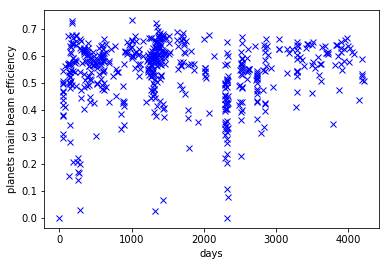

In [34]:
plt.figure(1)
plt.plot(days, planets_etamb, 'bx')
plt.xlabel('days')
plt.ylabel('planets main beam efficiency')
plt.show()

In [7]:
m_true = 0.0
b_true = .5

lnyerr_true = -2.3
lnV_true = -1.6

In [8]:
print(np.log(.1))
print(np.log(.2))

-2.30258509299
-1.60943791243


In [9]:
# def lnlike(theta, x, y):
#     m, b, f, sig = theta
#     model = m * x + b
#     inv_sigma2 = 1.0/((f*y)**2)
#     return -0.5*(np.sum((y+np.random.normal(0.0, sig) - model)**2*inv_sigma2))

def lnlike(theta, x, y):
    m, b, lnyerr, lnV = theta
    #print(m, b, lnyerr, lnV)
    angle = np.arctan(m)
    delt = -np.sin(angle)*x + np.cos(angle)*y - b*np.cos(angle)
    sigsq = (np.exp(lnyerr)*y)**2 * np.cos(angle)**2
    return -np.sum(0.5*np.log(sigsq + np.exp(lnV))) - np.sum(0.5*(delt**2)/(sigsq + np.exp(lnV)))

#     term1 = 0
#     term2 = 0
#     for i in range(len(x)):
#         vhat = np.matrix([[-m], [1]])/(np.sqrt(1 + m**2))
#         Z = np.matrix([[x[i]], [y[i]]])
#         delt = np.matmul(vhat.T, Z) - b * np.cos(np.arctan(m))
#         S = np.matrix([[0, 0], [0, np.exp(lnyerr)**2]])
#         bsig2 = np.matmul(np.matmul(vhat.T, S), vhat)
#         term1 += -0.5 * np.log(bsig2 + np.exp(lnV))
#         term2 += -0.5 * (delt**2)/(bsig2 + np.exp(lnV))
#     return (term1 + term2)

In [10]:
nll = lambda *args: -lnlike(*args)
result = op.minimize(nll, [m_true, b_true, lnyerr_true, lnV_true], args=(days, planets_etamb))
m_ml, b_ml, lnyerr_ml, lnV_ml = result["x"]

0.0 0.5 -2.3 -1.6
1.49011611938e-08 0.5 -2.3 -1.6
0.0 0.500000014901 -2.3 -1.6
0.0 0.5 -2.2999999851 -1.6
0.0 0.5 -2.3 -1.5999999851
0.0 0.5 -2.3 -1.6
1.00999863871 0.500614194739 -2.30004713211 -1.60153959054
1.00999863871 0.500614194739 -2.30004713211 -1.60153959054
1.00999865362 0.500614194739 -2.30004713211 -1.60153959054
1.00999863871 0.50061420964 -2.30004713211 -1.60153959054
1.00999863871 0.500614194739 -2.30004711721 -1.60153959054
1.00999863871 0.500614194739 -2.30004713211 -1.60153957564
1.64961521562e-05 0.500000010032 -2.30000000077 -1.60000002515
1.64961521562e-05 0.500000010032 -2.30000000077 -1.60000002515
1.65110533174e-05 0.500000010032 -2.30000000077 -1.60000002515
1.64961521562e-05 0.500000024933 -2.30000000077 -1.60000002515
1.64961521562e-05 0.500000010032 -2.29999998587 -1.60000002515
1.64961521562e-05 0.500000010032 -2.30000000077 -1.60000001024
1.60352603418e-05 0.501286980938 -2.30033117269 -1.61071360091
1.60352603418e-05 0.501286980938 -2.30033117269 -1.6107

1.99257455519e-06 0.534759773444 -10.0931937748 -4.29547849513
1.97767339399e-06 0.534759788345 -10.0931937748 -4.29547849513
1.97767339399e-06 0.534759773444 -10.0931937599 -4.29547849513
1.97767339399e-06 0.534759773444 -10.0931937748 -4.29547848023
1.97767339399e-06 0.534759773444 -10.0931937748 -4.29547849513
1.97767339399e-06 0.534759773444 -10.0931937748 -4.29547849513
1.99257455519e-06 0.534759773444 -10.0931937748 -4.29547849513
1.97767339399e-06 0.534759788345 -10.0931937748 -4.29547849513
1.97767339399e-06 0.534759773444 -10.0931937599 -4.29547849513
1.97767339399e-06 0.534759773444 -10.0931937748 -4.29547848023
1.97767339399e-06 0.534759773444 -10.0931937748 -4.29547849513
1.97767339399e-06 0.534759773444 -10.0931937748 -4.29547849513
1.99257455519e-06 0.534759773444 -10.0931937748 -4.29547849513
1.97767339399e-06 0.534759788345 -10.0931937748 -4.29547849513
1.97767339399e-06 0.534759773444 -10.0931937599 -4.29547849513
1.97767339399e-06 0.534759773444 -10.0931937748 -4.2954

In [11]:
print(m_ml, b_ml, lnyerr_ml, lnV_ml)
print(np.exp(lnyerr_ml), np.exp(lnV_ml))

1.97767339399e-06 0.534759773444 -10.0931937748 -4.29547849513
4.13601055901e-05 0.013630048225


In [12]:
print(np.log(.1))

-2.30258509299


In [13]:
def lnprior(theta):
    m, b, lnyerr, lnV = theta
    if 0.0 < b < 1.0:
#   if -1.0 < m < 1.0 and 0.0 < b < 1.0 and -5.0 < lnyerr < 0.0 and -3.0 < lnV < 0.0:
        pri_m = norm.logpdf(m, 0.0, 1.0)
        pri_lnyerr = norm.logpdf(lnyerr, -2.5, 2.5/3.0)
        pri_lnV = norm.logpdf(lnV, -1.5, 1.5/3.0)
        return pri_m + pri_lnyerr + pri_lnV
    return -np.inf

In [14]:
def test(theta, x, y):
    return 0

In [15]:
def lnprob(theta, x, y):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, x, y)

In [16]:
ndim, nwalkers = 4, 200
pos = [result["x"] + np.random.randn(ndim)*1e-4*[.2, .1, .5, .3] for i in range(nwalkers)] #nwalkers x ndim entries

In [26]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=(days, planets_etamb), threads=4, a=4.0)

-3.873812965e-05 0.534781091296 -10.0931968571 -4.29547366456
-1.41199161377e-05 0.534748428159 -10.0932202433 -4.29547229067
-1.92459664025e-06 0.534761328194 -10.093189485 -4.29543748004
3.89840427266e-05 0.534763334439 -10.0931859014 -4.2954714059
2.42191741734e-05 0.534765545044 -10.0932482263 -4.29546410762
3.73850175301e-05 0.53476630496 -10.0932491659 -4.29546148261
-5.57640766927e-06 0.534765018873 -10.0931753869 -4.29548953722
-2.31128469538e-06 0.534767032331 -10.0931071787 -4.29552467259
4.18616755867e-07 0.534750933066 -10.0931652394 -4.29544646132
4.24136662942e-06 0.534749999052 -10.0931895244 -4.29550074229
5.38791421318e-06 0.534761744778 -10.0931784959 -4.29547935567
-1.24893406337e-05 0.534753128428 -10.0931319346 -4.2954531766
6.35609361978e-07 0.534742371266 -10.0931713489 -4.29544784541
2.51474575233e-05 0.534777332032 -10.093164301 -4.29543246684
8.04222098327e-06 0.534750580875 -10.0932136578 -4.29551871135
-2.92980151929e-05 0.534769250033 -10.0931332369 -4.2955

-2.79719001557e-06 0.534755962265 -10.0932006298 -4.29544428271
1.59718975778e-05 0.534771128469 -10.0932330717 -4.29548584749
-6.09236958324e-06 0.534752498805 -10.093249552 -4.2954655376
-1.24658290956e-05 0.534773527187 -10.0931910535 -4.29545318591
4.30115047219e-05 0.534751541324 -10.0932365263 -4.29542653731
3.5221976826e-06 0.534742217045 -10.0931895375 -4.29549385311
1.97756401747e-05 0.534751273038 -10.0932128266 -4.29548964007
9.393643476e-06 0.534785017958 -10.0930863254 -4.29553252219
-4.98395971164e-06 0.534753105308 -10.0931736141 -4.29544157949
2.99250777008e-05 0.534754050546 -10.0932106656 -4.29550641563
-3.31490194946e-05 0.534778224366 -10.0931576551 -4.2954908383
-3.56521829818e-06 0.534773098896 -10.0932367179 -4.29548983691
-1.99375831471e-05 0.534763648254 -10.0931476071 -4.29545253772
8.72246990182e-06 0.534769856493 -10.0932495819 -4.29549054182
2.77120062079e-05 0.534750481266 -10.0932382351 -4.29547499646
-1.0470962933e-05 0.53475442456 -10.093175949 -4.29551

-5.27689734379e-05 0.534817428738 -10.0932100471 -4.29542058228
-3.32044652921e-06 0.534801306822 -10.0931801858 -4.29547668501
-8.26480535661e-06 0.5347543785 -10.0932391416 -4.29548732163
-2.09008732411e-05 0.534774535327 -10.0932107835 -4.29538248477
-6.38598974131e-06 0.534769148489 -10.0931263872 -4.29547297206
4.8776905933e-05 0.534774643574 -10.0934768534 -4.29543043406
1.96790654106e-05 0.534773202186 -10.0931906832 -4.29549387757
3.05844193653e-05 0.534781730983 -10.0931666114 -4.2955066346
-2.34547906215e-06 0.534754429292 -10.0931568979 -4.29550594215
1.51171849903e-05 0.534745905054 -10.0931241167 -4.29543837399
-1.71598406144e-05 0.534765363069 -10.093228064 -4.29549460047
-4.58506179418e-05 0.534769395802 -10.093184855 -4.29545848324
-6.10101055582e-05 0.53470814205 -10.093342274 -4.29555175774
-6.12173373395e-05 0.534733026408 -10.0932306319 -4.29546710274
-0.000162297915635 0.534772704244 -10.0934458334 -4.29565915096
-1.56883587086e-05 0.534755752869 -10.0932395426 -4.

8.9799681554e-06 0.534766722644 -10.0931777786 -4.29546831683
8.98796867033e-06 0.534744778685 -10.0930786129 -4.29553676355
6.88497489501e-05 0.534697401189 -10.0929349096 -4.29533620783
1.67253513515e-05 0.534759625466 -10.0931898941 -4.29546530791
0.000117730136893 0.534683390247 -10.0932929779 -4.29534003434
2.17523414877e-05 0.534753613276 -10.0930826372 -4.2954439924
0.000128454727794 0.534759066031 -10.0933669788 -4.29547024143
-9.70350020053e-05 0.534734069285 -10.0932916014 -4.29550425505
-6.83293486763e-05 0.534790577964 -10.0932262947 -4.29541604995
-1.73408139438e-05 0.534733872524 -10.0930686246 -4.29544314966
1.87708700544e-05 0.534749761917 -10.0931419617 -4.29540795327
-0.000105824473535 0.534796006132 -10.0928957871 -4.29559736879
-2.08056327325e-05 0.534742370507 -10.0932279896 -4.29547741801
-0.000123339232452 0.534728551234 -10.0928860902 -4.29548031034
3.57909295202e-05 0.534765640145 -10.0932476721 -4.29546309069
-4.53349579498e-05 0.534715260171 -10.0933130324 -4

-5.21626771975e-05 0.534741597966 -10.0931324484 -4.29530423442
2.76406341504e-05 0.534754743009 -10.0932010636 -4.29544555513
-1.75598678811e-05 0.534564340446 -10.0942600056 -4.29522387882
-4.97518300448e-06 0.534745036162 -10.0930571366 -4.29534043549
1.35007955236e-05 0.534760569268 -10.0931846637 -4.29552148712
1.10249764737e-05 0.534759656075 -10.0931965633 -4.29549011786
3.82862397211e-05 0.534686346535 -10.0933283227 -4.29543955252
-9.35961873363e-06 0.534745910513 -10.0932758878 -4.29546767324
-2.19599430803e-06 0.534742177004 -10.0932010053 -4.29543728384
0.00011722013906 0.534836750385 -10.0929669499 -4.29550974708
2.12971381712e-05 0.534761536453 -10.0930569224 -4.29548113765
2.20463036583e-05 0.534762704666 -10.0932189476 -4.29549243056
1.62491470535e-05 0.534656562968 -10.093163922 -4.295594912
7.96848509201e-06 0.534755766802 -10.0932489878 -4.29547155294
-1.85519514259e-05 0.53475581823 -10.0936458263 -4.2955032722
-2.39683162677e-05 0.534767322193 -10.0931671189 -4.295

-6.07923170345e-06 0.534765993704 -10.0931417425 -4.29545746278
1.08031012734e-05 0.534788025505 -10.0930509997 -4.29554397551
-3.00633204041e-05 0.534704232047 -10.0935424174 -4.29534910613
-9.93708111849e-05 0.534753984588 -10.0934478222 -4.29561820772
8.47028094666e-06 0.534754264093 -10.093090073 -4.29537354596
3.9691172295e-06 0.534740702085 -10.0935568902 -4.29560118833
9.52538860873e-05 0.535037876939 -10.0921211683 -4.29574080041
-7.44328669418e-06 0.534751172087 -10.0935509574 -4.29545819316
1.39037904553e-05 0.53475220202 -10.0932476545 -4.29550075548
5.35543516363e-06 0.534754009808 -10.0931889416 -4.2954857084
-2.53594896583e-05 0.53476417399 -10.093288286 -4.29548214871
5.34649981426e-06 0.534767704854 -10.093150348 -4.29547056228
4.14634807825e-05 0.53476640151 -10.0931203357 -4.29547964396
-3.72288717011e-05 0.534777774069 -10.0932749443 -4.29549360057
3.89086136574e-06 0.534760062608 -10.0932326737 -4.29548828137
1.56278210579e-05 0.534795391517 -10.0934679406 -4.295571

2.06240513582e-05 0.534785334356 -10.0933635806 -4.29546107457
6.740978363e-05 0.534720281411 -10.0931841822 -4.29543357762
7.53101639782e-07 0.534738914935 -10.0932467946 -4.29554764127
-1.78721664206e-05 0.534762190098 -10.0932111463 -4.29548560604
2.80103429838e-06 0.534758647155 -10.093201323 -4.29547681513
0.000101996170953 0.534756426233 -10.0935650213 -4.29524365758
2.28626420021e-05 0.534752011678 -10.0937604865 -4.2957994844
2.05579866547e-06 0.534748140711 -10.0930904128 -4.29553600389
8.45597389628e-05 0.53478559998 -10.0933014807 -4.29572093692
8.90562275236e-06 0.534766675928 -10.0932555625 -4.29556238938
1.03823560747e-05 0.534760651593 -10.093195513 -4.2954648114
2.1326374974e-05 0.534747042687 -10.0930348718 -4.295431388
1.32580953307e-05 0.534751427265 -10.0931438835 -4.29546603907
2.01478360877e-05 0.534739938308 -10.0932537343 -4.295406565
3.13729448386e-05 0.534757924444 -10.0932096754 -4.29542629051
-5.41252070844e-05 0.534827398625 -10.0928726024 -4.29538277177
0.

2.9114606685e-05 0.53475863467 -10.0931846452 -4.29547265367
5.29821310785e-05 0.534728418918 -10.0933272125 -4.29544062053
3.17851150761e-05 0.534746150533 -10.0931853847 -4.29535343911
1.44103896651e-05 0.534788002707 -10.0927611531 -4.29581332162
-2.03190023933e-05 0.53477374109 -10.0931794407 -4.29547571626
2.85674267247e-05 0.534743801775 -10.0932613806 -4.29546309456
8.71153240129e-07 0.534755025032 -10.092935358 -4.29539689446
-3.13237307894e-05 0.534594396383 -10.09391105 -4.29495455045
-0.000101211608716 0.534713374835 -10.0931914744 -4.29541806346
7.74169013817e-06 0.534760136162 -10.093231322 -4.29543782116
8.88037172563e-06 0.534754766876 -10.0931929836 -4.29552517154
3.17872610561e-05 0.534775852905 -10.0931596497 -4.29548677874
2.60616772129e-05 0.534786750317 -10.0926941422 -4.29541645657
-2.50056339199e-05 0.534793904198 -10.0931293409 -4.29536436569
-2.06921570273e-05 0.534700101487 -10.0930836112 -4.29542456434
-5.68211911806e-05 0.534763946987 -10.0936225351 -4.29535

1.08184764596e-05 0.534783629979 -10.0930984565 -4.29552180791
1.63387159254e-05 0.534757799911 -10.0932459859 -4.29547284503
-2.649275655e-06 0.534751219677 -10.0931889711 -4.29549257256
1.61933096268e-05 0.534766713842 -10.0932502044 -4.29547952968
2.48524722442e-06 0.534763268789 -10.0933473765 -4.29541478222
-5.55004686945e-07 0.534775094331 -10.0936131507 -4.29579064035
-3.74822415891e-05 0.534773199561 -10.092937444 -4.2955315651
-2.70275350719e-06 0.534748945166 -10.0932589613 -4.29548517355
2.60686877999e-06 0.534718521881 -10.0932595742 -4.29566663974
-8.86402327655e-06 0.534781238055 -10.0932450763 -4.29544120458
3.00314164855e-06 0.534750626495 -10.0932181762 -4.29551773515
8.69258404094e-06 0.53475297904 -10.092263327 -4.29483043485
1.16387980057e-05 0.534748555601 -10.0931449412 -4.29550042242
1.19928575316e-05 0.534770692828 -10.093218676 -4.29547845192
-3.12359882035e-05 0.534763892269 -10.0933293647 -4.29550102162
1.08363709332e-05 0.534742809283 -10.0932063157 -4.29551

-2.24354825468e-06 0.534710224289 -10.0932967058 -4.29563603908
-6.38170770531e-06 0.534767781774 -10.0930725624 -4.29543857206
6.54600686179e-06 0.534730361816 -10.0932528519 -4.29556479425
1.21901966514e-06 0.534774012126 -10.0929321352 -4.29537133193
4.84265658474e-06 0.534847300742 -10.0928022605 -4.29561217543
1.74708296762e-05 0.53478863566 -10.0932833241 -4.29543682023
-1.2277070334e-05 0.534767881339 -10.0931896009 -4.29547303246
8.44323541306e-06 0.534756005658 -10.0931673076 -4.29547986917
3.34929729992e-05 0.534778267439 -10.0931629857 -4.29534934543
2.92833728792e-06 0.534763958487 -10.0931501903 -4.29543297319
-6.20346248501e-06 0.534772471451 -10.0932620297 -4.29552389204
7.52175020094e-06 0.534758170229 -10.0935561318 -4.29569550591
-2.11483326703e-05 0.534768165642 -10.0932644885 -4.29552612688
3.41702736063e-06 0.53475537634 -10.0931855009 -4.29553261305
1.68366918644e-05 0.534757732318 -10.0932545806 -4.29544002249
7.55483273315e-06 0.534736765506 -10.0929964586 -4.29

8.26108903364e-06 0.534747793352 -10.093065027 -4.29571736091
-6.51988534405e-05 0.534803886335 -10.093278436 -4.29572958674
-1.4011198936e-05 0.534743072599 -10.092930801 -4.29529167932
-4.74813302394e-06 0.534714489025 -10.092835347 -4.29535717461
5.77352431685e-06 0.534763015486 -10.0931221769 -4.29549107992
6.43942313877e-06 0.534761990528 -10.0932010336 -4.29548709991
1.23874092189e-05 0.534726171188 -10.0929969591 -4.29542242877
1.68151705919e-05 0.534909857446 -10.0932569679 -4.29591640819
5.59066576806e-06 0.534750157134 -10.0932303547 -4.29547115029
1.74867861606e-05 0.534762211027 -10.0932033663 -4.29540291357
7.17419807639e-06 0.534758705391 -10.0930886785 -4.29553249606
1.24733926399e-05 0.534771264945 -10.0919479814 -4.29513207844
4.13946329211e-05 0.534736508751 -10.0931493358 -4.29538397295
1.39127901146e-05 0.534700622142 -10.093565014 -4.29550966302
-1.29611213815e-06 0.53472928029 -10.0932932119 -4.29547606864
5.94180409884e-05 0.534800780707 -10.0931187311 -4.2954407

-5.51962610412e-06 0.534788237855 -10.0922666477 -4.29597243878
2.7899827103e-05 0.534910373813 -10.0943929004 -4.29578592085
5.07197394393e-05 0.534717282603 -10.09300956 -4.29562503997
8.50105427789e-05 0.534752885848 -10.0943955278 -4.2940161755
1.12778369922e-05 0.534756406549 -10.0931981038 -4.2954577495
1.36692868094e-05 0.534760995168 -10.093225272 -4.29545876078
1.99681802392e-05 0.534761439964 -10.0933220903 -4.29547614365
2.05848365336e-05 0.534750635639 -10.0931702604 -4.29546895355
5.62873769436e-05 0.534779766616 -10.0933207131 -4.29549564934
2.70075141014e-06 0.534776842332 -10.0936666104 -4.29582289715
2.83544058625e-06 0.534710205469 -10.0933800774 -4.29509144635
1.90741372847e-05 0.534751682519 -10.0931053748 -4.29543860403
5.82757356866e-06 0.534778431776 -10.0930979101 -4.2955143424
5.01072844424e-06 0.534757126949 -10.0927270046 -4.29514039102
6.99167144816e-06 0.534753340574 -10.0932173252 -4.29539459233
-6.27351470967e-06 0.534811071328 -10.0930482923 -4.295301381

-8.02817355468e-06 0.534010895855 -10.0932338021 -4.29522129942
3.08143095667e-07 0.534752553079 -10.0932410564 -4.29549693129
-2.18935293198e-05 0.534895505664 -10.0919566767 -4.29487527114
-1.70544366025e-05 0.534847233495 -10.0938361629 -4.29483866791
9.57120398163e-06 0.534749950986 -10.0930450196 -4.29558383671
2.00287835439e-05 0.534756252331 -10.0932005993 -4.29549460993
2.47690832468e-06 0.53475512318 -10.0931155924 -4.29545276992
1.47619904308e-05 0.533743000042 -10.0978497864 -4.29541402405
-4.02139177766e-06 0.534708883389 -10.0933120083 -4.29577037023
1.45998840974e-05 0.534752140558 -10.0931508848 -4.2955059169
1.89899194344e-06 0.534533056044 -10.0938063842 -4.29613530114
1.62997045778e-05 0.534758349853 -10.0932538473 -4.2954416559
3.48237695885e-05 0.53473491779 -10.0930991846 -4.2954482802
2.09877317185e-05 0.534769558715 -10.0932791358 -4.29547522015
4.32727718896e-05 0.534820503498 -10.0934391755 -4.29548610205
7.25115720865e-06 0.5347544498 -10.0931785336 -4.2954989

1.15915903911e-06 0.534764760104 -10.0932214382 -4.29551360326
-3.23127089754e-05 0.534778160873 -10.09315485 -4.29555157108
-3.76900818687e-06 0.534766352807 -10.0932603352 -4.29555892038
5.92590512795e-06 0.53475808626 -10.0933688214 -4.29556143586
5.11473655176e-06 0.53462334801 -10.0938486393 -4.2960255334
1.98731202685e-06 0.534724953956 -10.0931336323 -4.29543514732
-1.19076344737e-05 0.534760164023 -10.0938464026 -4.29593262698
3.44540901069e-06 0.534810722003 -10.09323176 -4.2954957743
4.99973424737e-06 0.534752089639 -10.0930717399 -4.29565959023
-5.64045300387e-06 0.534772686716 -10.0931612117 -4.29556875758
-5.2205109401e-06 0.534724335079 -10.0926930189 -4.2953350886
-2.2663010561e-05 0.534704229029 -10.092593691 -4.29544664325
6.66535215931e-06 0.534705524419 -10.0929092341 -4.29538545191
3.85997228631e-06 0.534766601273 -10.0924124084 -4.29477179785
-9.32681516789e-06 0.534716036833 -10.0936145009 -4.29547276084
-1.10348079847e-05 0.534779633815 -10.0932244147 -4.29551340

2.4951230085e-05 0.534764952597 -10.0932420888 -4.29548511467
7.10513392773e-06 0.534766464144 -10.0935632078 -4.29544592653
9.93299197808e-06 0.534752390016 -10.0932034709 -4.29548813282
-7.33923310666e-06 0.534740532315 -10.0939125308 -4.29535172721
8.52537183054e-06 0.534738649359 -10.0935932528 -4.295718187
-3.37094903059e-06 0.53476581532 -10.0931650304 -4.29554684645
1.892308854e-05 0.534768783513 -10.0932730727 -4.29554418196
5.65522218053e-05 0.534718297367 -10.0931046943 -4.29564781822
1.99515427762e-06 0.534756782333 -10.0931274305 -4.29549536495
7.44381842019e-06 0.534750988373 -10.0935461641 -4.29502409322
7.32337535163e-06 0.534890903324 -10.0951244286 -4.29599589325
2.61309063296e-05 0.534887090817 -10.0937040314 -4.29504869228
1.07013046497e-05 0.534781460713 -10.0933670567 -4.29553111541
1.39914004549e-05 0.534759304126 -10.0932894582 -4.29544772073
1.43210888423e-05 0.534767090823 -10.093513524 -4.29542591316
1.87190317023e-06 0.53477446267 -10.0930769553 -4.2948700723

2.27517308935e-05 0.534893769434 -10.0934909868 -4.29531319094
2.55714209068e-06 0.534749763217 -10.0931294993 -4.29543454141
-9.92649623978e-07 0.535634264163 -10.0901508611 -4.29628795934
1.53077349438e-05 0.534673816601 -10.0943412378 -4.29473806638
-1.91901981899e-05 0.53478913525 -10.0927273035 -4.29544726138
-5.4466853871e-05 0.534745069904 -10.0933821251 -4.29578878517
6.20482462657e-06 0.534978010251 -10.0934387632 -4.29553516217
5.60513815595e-06 0.534719415336 -10.0931243549 -4.29545356005
-1.17103849753e-05 0.536338750532 -10.090827574 -4.29688054755
3.16036154345e-06 0.534737099755 -10.0932878215 -4.2953243938
2.11242230953e-05 0.534725735699 -10.0932398046 -4.29544394944
-1.7111888207e-06 0.534710137296 -10.0933071365 -4.29570844245
-1.85465257673e-06 0.534805289144 -10.09280712 -4.29529194349
2.73284143541e-06 0.53450252643 -10.0935725401 -4.29548818908
7.40952291685e-06 0.534756774296 -10.0931803414 -4.29546776342
1.14557269164e-05 0.532924802446 -10.1011025573 -4.295645

2.8450586765e-05 0.534781929253 -10.0932066512 -4.29545268654
4.67686947423e-06 0.534592968522 -10.0930589997 -4.2952619241
2.03391163421e-06 0.534747748212 -10.093350141 -4.29536792372
4.79828311408e-06 0.534918452021 -10.0922829877 -4.29521950918
7.103812579e-06 0.534448626871 -10.0873941217 -4.29419984208
1.20636630045e-05 0.535258517982 -10.0936333141 -4.29347882019
1.89082153924e-06 0.534665737595 -10.0936596669 -4.29586407951
-1.40727150689e-05 0.534745823699 -10.0936400178 -4.29469335875
-3.40450553006e-05 0.534771839039 -10.093345304 -4.2954674692
4.64510948524e-06 0.534711931785 -10.0934201579 -4.29567564413
1.17425510201e-05 0.534768007897 -10.0935343521 -4.29563474694
-1.43634857874e-05 0.534773213511 -10.0935571174 -4.2953957336
1.10273214319e-05 0.534518001177 -10.0930781327 -4.29505518151
-4.61842134261e-05 0.534773228278 -10.092979556 -4.29553855728
5.26506524288e-06 0.534748138482 -10.0930285333 -4.2957767825
1.22098271896e-06 0.540458026136 -10.1353571644 -4.2952849316

5.97386693864e-06 0.534754087254 -10.0931669919 -4.29562710462
3.48084876097e-05 0.534594837856 -10.0936272831 -4.29598426411
5.96092240196e-07 0.534810894173 -10.0923931212 -4.29524927255
-5.04954243546e-05 0.535741046981 -10.0894952916 -4.29140208686
5.1022942412e-05 0.53392320286 -10.096831294 -4.29484886429
5.28677335271e-06 0.534401132852 -10.0941497924 -4.29568307234
7.84026929325e-06 0.534792343321 -10.0932696507 -4.29571113799
-3.91616995582e-06 0.534766336779 -10.0931833224 -4.29545825105
6.11136794427e-06 0.534753522702 -10.0932596872 -4.29548833935
-2.72598015981e-06 0.524179566253 -10.0108916616 -4.29439580085
1.01617828148e-05 0.534740306401 -10.0935088899 -4.29565882775
3.58345235966e-06 0.534744095485 -10.0931151924 -4.29563245329
8.98154765726e-05 0.534772089565 -10.0934288849 -4.29563399476
1.01838937834e-05 0.534654311707 -10.0938008396 -4.29589035601
1.78112026565e-05 0.53474885152 -10.0931239911 -4.2955158116
1.67652266594e-05 0.534508464786 -10.0991165209 -4.296125

6.51300251595e-06 0.534900758755 -10.092774419 -4.29455335957
9.61482252376e-07 0.534888496353 -10.0958450438 -4.29724398558
-5.44676289525e-06 0.53475713851 -10.0914051919 -4.2959885197
-3.70793867443e-05 0.534739072787 -10.0922137915 -4.29476874169
-3.94674423031e-07 0.534672783857 -10.0932352891 -4.29530395946
-1.17546949585e-06 0.536449459434 -10.087703785 -4.29627623795
-1.43445974238e-05 0.534700331646 -10.0940497173 -4.2947705718
2.90757777712e-06 0.534653612716 -10.093471445 -4.29592442609
5.21560455383e-06 0.534755751243 -10.0936106368 -4.29536722335
-4.09283333162e-05 0.534791152994 -10.0931319265 -4.29536411033
1.6490585827e-05 0.531145376024 -10.0969871095 -4.29525005815
2.72734252795e-05 0.534661869257 -10.094177616 -4.29522217985
6.15605342148e-06 0.534290990288 -10.0941127009 -4.29548477133
-4.97563185498e-05 0.534799410281 -10.0934808363 -4.29510533905
5.22872980849e-06 0.535369520643 -10.0939888856 -4.2956372222
3.21619982016e-06 0.534744791142 -10.0930607006 -4.295377

2.8073858708e-06 0.534862797458 -10.0918339678 -4.29586209572
-1.6176200514e-06 0.534824190204 -10.0936208534 -4.29537792891
1.37404679816e-05 0.534815206832 -10.092456186 -4.29588466859
-1.77772661185e-06 0.534943541487 -10.0936175298 -4.29569725341
4.02369873325e-06 0.534710409337 -10.0933955986 -4.29561866842
2.34483816513e-05 0.53447946284 -10.0941414004 -4.29508784983
3.21869397879e-06 0.531341433022 -10.0698680922 -4.29516882776
5.52922271239e-05 0.534807872984 -10.0932739953 -4.29558439844
6.47809996031e-06 0.534755453505 -10.0931863876 -4.29545815995
3.0402337183e-05 0.535909793027 -10.0875712986 -4.29345067709
4.38236140122e-06 0.535207817626 -10.0938082087 -4.29561813473
7.67359242203e-06 0.534487282513 -10.0881430158 -4.2943687099
5.92137966153e-06 0.534842241846 -10.0907104544 -4.29311322947
-1.34633948546e-05 0.534021003772 -10.0951595751 -4.29750317588
7.42900636287e-07 0.534776702856 -10.0933791189 -4.2953069383
3.87956546644e-06 0.534591855611 -10.0935467955 -4.29547716

3.57544100049e-06 0.534806927302 -10.0915847658 -4.29487846018
-1.98445398271e-06 0.534730623387 -10.0932685627 -4.29526246517
-1.66798510969e-05 0.530956249683 -10.1027394249 -4.30825927859
-1.27698405942e-06 0.534398255956 -10.0934481666 -4.2948027929
2.50418765712e-06 0.534542061492 -10.0947046643 -4.29539367959
-1.03544767683e-05 0.534873576681 -10.0943367085 -4.29537206838
1.11138264778e-06 0.535729362755 -10.0908340434 -4.2945337908
2.16587743901e-06 0.542550724704 -10.1433428994 -4.29553439851
4.39827715421e-06 0.534629520925 -10.0934860591 -4.29562935934
-5.50643746771e-06 0.545881951479 -10.0888296901 -4.30291054091
6.03720812203e-05 0.536602809663 -10.0911531451 -4.29910262257
6.16041737311e-06 0.53478179688 -10.0906930155 -4.2908005616
-2.03831287134e-06 0.534724187675 -10.0930100613 -4.29553655608
1.77497851999e-05 0.535036009928 -10.0991928844 -4.29853250982
-1.03584684764e-05 0.534897378559 -10.0941265998 -4.29625908644
-2.13845827662e-05 0.536419560815 -10.1089816352 -4.

-2.31086537192e-06 0.53037956031 -10.1501776278 -4.30608733751
1.02071015751e-05 0.535517125419 -10.0985304562 -4.3007205168
-2.98057847736e-05 0.529024450007 -10.0999959076 -4.3006026869
-2.11955013297e-05 0.535350533488 -10.0793682258 -4.28960837857
-4.54602888415e-06 0.534621676438 -10.0935754189 -4.29572860375
3.71673841292e-06 0.534282618796 -10.0928060548 -4.29454059537
-1.16239308015e-05 0.533483394435 -10.0924601252 -4.2963950393
7.31288486698e-06 0.53474080152 -10.095560091 -4.29321729419
1.3593220425e-05 0.523023714531 -10.0046490622 -4.29349830882
1.33609317277e-05 0.528533184843 -10.056672811 -4.28254481418
1.46857537127e-05 0.526601565348 -10.1138714096 -4.30031650882
-2.18127696379e-05 0.534772139401 -10.0920546629 -4.29477072407
-5.20922697822e-06 0.521447935048 -9.99046660249 -4.28537296182
-1.2807794481e-05 0.539346280827 -10.0783485264 -4.29909768409
4.51296424112e-06 0.534436132294 -10.0918936296 -4.29809514288
3.57857749195e-06 0.530133884417 -10.0641026334 -4.29511

2.71511313201e-06 0.534789257448 -10.0929517624 -4.2935240572
1.00438646671e-05 0.534949289797 -10.0919051766 -4.29496025174
4.10816013072e-06 0.53464450879 -10.095369249 -4.29657082471
4.67076690522e-05 0.499095431137 -10.1590797486 -4.26252050199
-6.51013956423e-06 0.535316689217 -10.0856452404 -4.29726243771
-1.52564476951e-06 0.526960319259 -10.151771119 -4.2794166913
4.14279920877e-06 0.534862741037 -10.0935166227 -4.29554678495
-1.40926524294e-05 0.537826866391 -10.0823127139 -4.29420640001
3.51900815709e-05 0.534854774523 -10.093644787 -4.29523364051
3.50764758145e-08 0.534756951886 -10.0929055984 -4.29587505753
2.22196111205e-05 0.535753831389 -10.0812998578 -4.29779844408
-2.72504615215e-06 0.534938375281 -10.0935157497 -4.29569682634
2.16266469866e-05 0.53511422717 -10.0964384862 -4.29176722252
5.12990196059e-05 0.53955076016 -10.0873515292 -4.29092579951
2.94252940492e-05 0.533377974046 -10.0710297564 -4.28255193531
1.37488801188e-06 0.53279843922 -10.0914493775 -4.296648702

7.53618524092e-06 0.538516159271 -10.0837185117 -4.25283096373
7.91936570222e-06 0.53198825672 -10.1039016072 -4.29317616917
9.72413444403e-06 0.533702494688 -10.0760428736 -4.28528616062
9.18386293906e-06 0.53311161031 -10.0981196246 -4.29470871082
-6.92861291658e-06 0.537835720965 -10.0769089689 -4.28979850571
-1.6987982446e-05 0.546029143578 -10.1730782968 -4.29475527972
-1.24084238549e-06 0.526936725213 -10.1659268667 -4.31778520436
-1.58953823298e-05 0.535859395886 -10.1402475428 -4.31817922495
7.03731115398e-06 0.552363839163 -10.0508091545 -4.31289853191
-1.00465973241e-06 0.539906631548 -10.0977516296 -4.30370411944
-1.79421150217e-05 0.526451780474 -10.0300626303 -4.29409560827
1.74733743394e-05 0.545765882104 -10.454729742 -4.36772789225
4.03751517838e-06 0.534881957858 -10.0926208117 -4.2926797236
-3.75955349608e-05 0.544650867104 -10.0538359972 -4.28302282165
-8.20172924045e-06 0.544203991337 -10.1567579724 -4.31763154313
-2.67141695825e-06 0.534636203175 -10.0922886603 -4.

-1.96929403786e-06 0.534744617809 -10.09310082 -4.29555255704
-1.71362915955e-06 0.534796011913 -10.0928587322 -4.29555212526
9.9261230122e-07 0.535265727043 -10.0860485697 -4.30145297247
-2.41757694147e-05 0.535118244338 -10.1101182468 -4.29713520594
8.66433695566e-06 0.53550108393 -10.0992398284 -4.30112463574
-1.04949012823e-06 0.526159065837 -10.1440169867 -4.31868658544
2.04938481008e-05 0.546402033219 -10.2948919974 -4.28189744816
4.00372618553e-06 0.535154172777 -10.0938764027 -4.29703060894
-3.97167772288e-06 0.533660149225 -10.1007630438 -4.29424385909
-2.2050062537e-05 0.531939943011 -10.1047071931 -4.30342017369
1.74598603216e-05 0.522708906099 -10.0821679715 -4.27586329134
1.62830422294e-05 0.514683099427 -9.93951989431 -4.29163567529
-1.59231874716e-05 0.524636963003 -10.0389012154 -4.29272447266
-2.05008324509e-06 0.536186482437 -10.1016233295 -4.293815531
4.22844144305e-06 0.507334572943 -10.2500341232 -4.35118758969
7.56239409909e-07 0.518851925097 -9.99394292329 -4.295

-2.24481749487e-05 0.530954070542 -10.109236668 -4.30061535733
-2.11181984528e-05 0.614803823964 -10.7478355277 -4.30911397105
4.6586792786e-06 0.533244818983 -10.100401603 -4.29668134801
-1.59807870109e-06 0.535188507949 -10.0910365398 -4.29701097961
1.04507503061e-06 0.536202253741 -10.0998773463 -4.30051230256
-1.48758171153e-06 0.534696871796 -10.0932452879 -4.29536735592
-1.03136993837e-05 0.532409926113 -10.1279396335 -4.31113015039
2.38901244818e-06 0.534607109867 -10.0955829417 -4.29669075222
-1.05536435479e-06 0.540764084501 -10.0314660139 -4.27486988471
-8.78476836826e-06 0.501149815669 -9.80229660508 -4.30335496743
9.65849927536e-06 0.535061854898 -10.090054365 -4.29428929202
-3.94676753771e-05 0.56228589645 -10.2798913121 -4.37537363887
-6.23179201799e-06 0.518150206372 -10.1731191173 -4.28013491022
5.34573253126e-06 0.53471411189 -10.0963036584 -4.29633972214
3.43943577096e-06 0.531339432491 -10.0961350547 -4.28907671967
6.66392961001e-06 0.542215888682 -10.0689062311 -4.2

1.24690187179e-06 0.550703698788 -10.0541891154 -4.29806380727
9.48229839083e-06 0.533889845561 -10.0823662523 -4.28703974868
8.9033278593e-06 0.525920465487 -10.0795144825 -4.29707432583
1.24912188911e-05 0.539727924421 -10.0784367911 -4.23184825178
5.34053889125e-06 0.535143577673 -10.0818759947 -4.28995216608
2.38641250581e-06 0.536019069078 -10.0877347506 -4.29373813238
4.68899785347e-06 0.535632292948 -10.0912318545 -4.30779610692
-2.40041365492e-05 0.544203235258 -10.0062122503 -4.27773787259
1.41900479345e-05 0.525668596145 -10.1187806882 -4.3133150879
-1.77827425146e-05 0.537821122855 -10.1277927412 -4.31705921014
-1.36531250588e-06 0.539239330438 -10.1045986275 -4.30104507289
4.025567917e-06 0.545325526364 -10.0833965452 -4.30280916273
-3.22314721112e-06 0.535583568654 -10.1149243854 -4.30068503261
3.94316240375e-07 0.532619745206 -10.0951612776 -4.27584110148
2.45529187983e-05 0.513150170758 -10.5482697764 -4.46563990761
-5.75104270257e-06 0.557959787441 -9.96861940213 -4.249

1.7701226425e-05 0.510430109221 -10.286542677 -4.27846196374
-5.50756758254e-05 0.60383940494 -8.6601787304 -3.8370963821
6.8068642052e-06 0.534703827635 -10.0855397331 -4.29407270554
2.34075222141e-06 0.535827488108 -10.0635993985 -4.28473891043
-3.83561526772e-06 0.547252727582 -10.1148508704 -4.33841293387
5.03374198705e-06 0.534540872209 -10.0945895493 -4.29618690727
7.16254203165e-06 0.53322314809 -10.1044820476 -4.29740654163
2.79306219222e-06 0.547886055706 -10.076619411 -4.30296575297
4.95309646564e-06 0.538135579411 -10.1183956568 -4.29698333803
3.19524184476e-06 0.501491263442 -9.89699269092 -4.22945815298
4.37069048647e-06 0.531587828571 -10.0880325028 -4.30651933602
-1.23435934259e-06 0.525229476583 -10.1519540788 -4.32217172278
1.39274608199e-06 0.537154478106 -10.1057114971 -4.30106031641
-5.21700089065e-06 0.53654023566 -10.1053688766 -4.29347939237
-3.46382719342e-06 0.533356310819 -10.0944435613 -4.29423045957
-3.32038106791e-06 0.528365690628 -10.0750432722 -4.2862596

-7.67098970051e-07 0.53267184992 -10.1006465363 -4.29251969731
-7.70240227901e-06 0.53978870055 -10.124503743 -4.29609932317
3.20128704737e-05 0.535484254365 -10.0908218885 -4.29898525585
-5.33908970726e-06 0.56097723347 -10.3081568909 -4.30049488957
2.52658876256e-06 0.536578831917 -10.0911522044 -4.29505052484
-1.02448196276e-06 0.533956276081 -10.1105155746 -4.30294101657
-1.72286304842e-06 0.535332182404 -10.0904512185 -4.29743319624
1.2334887525e-05 0.534671361627 -10.0837601791 -4.28941676086
2.56098296356e-05 0.510304061523 -9.51306259348 -4.34684803385
-1.76968275363e-05 0.540205407435 -10.0613566161 -4.31656008362
3.25723573822e-06 0.534428597484 -10.1064304615 -4.2964504361
7.58325301731e-07 0.536737225568 -10.0380800679 -4.27148595878
-1.04447619239e-05 0.550366485344 -10.1824865253 -4.30924697736
1.26932721458e-05 0.542108649248 -10.1002523857 -4.3058433399
2.80559562518e-05 0.536907936337 -10.0798468193 -4.29250281493
-4.46361921146e-07 0.532031672308 -10.1088194172 -4.291

4.89574077892e-06 0.533673324338 -10.104496305 -4.2990277428
3.18414079961e-05 0.472968625371 -9.60804850506 -4.28255377775
-9.71712379427e-06 0.558136132983 -9.83762533597 -4.20777958548
1.00551958332e-05 0.530638063958 -10.0973753818 -4.32213303088
2.21356966476e-05 0.509307691759 -10.0702273744 -4.25760661496
-1.63187100869e-06 0.518269462566 -10.196135614 -4.3318463461
4.67952108938e-06 0.542060546322 -10.0802008272 -4.28634336732
-5.16128974898e-07 0.542527088802 -10.1648367553 -4.29772499146
-2.45894618193e-06 0.526819443164 -10.0583146858 -4.29823940299
-8.44965403948e-07 0.53888244819 -10.1062540852 -4.3011082372
1.4771921223e-06 0.550324030419 -10.0574789628 -4.29810888126
-1.16314847082e-05 0.524868112529 -10.0155984001 -4.30090535717
3.23276567854e-05 0.547303759079 -10.0839705906 -4.28649959228
9.52148910642e-06 0.517358684795 -10.0614967403 -4.29946917908
8.5890055401e-08 0.540059626976 -9.95099851976 -4.24617092584
3.94010976195e-06 0.533538244934 -10.0870260709 -4.270530

2.9550409129e-09 0.534689268158 -10.0924888588 -4.29645215299
-1.12778853699e-05 0.541220318605 -10.0361522784 -4.28422824596
-9.12334729274e-06 0.555373203546 -10.2337745166 -4.40681057044
-1.01498414561e-06 0.53027988004 -10.0252986072 -4.26049997183
-3.1986700755e-06 0.541452648842 -10.1289832374 -4.29672715514
1.54093490856e-05 0.529354501245 -10.1206282972 -4.30047307257
-1.07102771616e-05 0.512783285095 -10.4306089756 -4.36353792815
3.73242145007e-06 0.532634183332 -10.0817476656 -4.29771370218
1.11556579354e-05 0.537336605614 -10.1313842804 -4.29257066681
6.81787305549e-06 0.529746489453 -10.0750364879 -4.28697440965
2.09321006565e-05 0.518526684183 -9.98907657885 -4.29554787613
-3.39403093589e-06 0.536900352138 -10.0777055091 -4.28804746145
-5.7949961997e-06 0.531677097896 -10.1873762011 -4.32990528746
1.55872742371e-05 0.534792295103 -10.0706239837 -4.29053442047
3.13818275562e-06 0.521339944637 -10.0942294941 -4.34096207348
-1.09387512893e-05 0.554946911531 -9.94029666618 -4.

8.42178144405e-06 0.534714802024 -10.0874758904 -4.29450118356
1.73576858441e-05 0.568026065649 -9.90809299593 -4.17682118994
4.64521679563e-06 0.531098261643 -10.0983412532 -4.31433722717
3.31512353781e-05 0.534242636482 -10.0865915371 -4.30895545821
3.19488262473e-06 0.529121425945 -10.1859289786 -4.33152846075
6.09245239637e-06 0.533132540461 -10.1016524602 -4.29401358842
-1.82835647143e-05 0.579987740866 -9.84071566818 -4.28704879629
-5.7473584732e-06 0.552996490845 -9.92903507298 -4.25563409719
7.30955294489e-06 0.528587981969 -10.0741857565 -4.28180836735
3.08883918513e-06 0.517325758892 -10.4167658257 -4.42686386821
-3.24644022793e-06 0.531350810911 -10.1262079864 -4.30407615626
-2.77387083313e-05 0.538094406536 -10.110556374 -4.2994112014
-5.88168943668e-06 0.556641362223 -10.2604500863 -4.30083997012
7.39475637967e-06 0.557569537522 -9.99324445611 -4.22054131992
1.57559423964e-05 0.509912528568 -9.68504881304 -4.31801705888
7.69898495582e-06 0.535171468779 -10.0908774773 -4.29

-3.64691953008e-06 0.534816129526 -10.0905598676 -4.29466402169
-2.22457724722e-07 0.535787704517 -10.0834990165 -4.26998468926
-1.42819514617e-06 0.539222886896 -10.0970496086 -4.28393620636
2.64232913582e-06 0.568108101766 -9.53686852799 -4.07819757913
1.83705244749e-05 0.541973877083 -10.2753475921 -4.39741444859
8.15396140725e-06 0.533948748372 -10.0976305863 -4.29464521719
-2.7857920985e-05 0.533447160258 -10.1183402528 -4.30816408984
-5.64856771618e-06 0.545220416103 -10.0701130779 -4.27071089402
-3.06689201924e-05 0.582487068507 -9.30560224568 -4.03095253483
9.60732638973e-06 0.535767825818 -10.0996273254 -4.29538983163
3.74913614311e-07 0.53816532777 -10.1001858132 -4.27268620063
5.08789613208e-06 0.534414134721 -10.0943423691 -4.2949543883
-1.18026188668e-06 0.514125389835 -10.1103881555 -4.30973098097
-7.06794999765e-06 0.542196985244 -10.0878329707 -4.28226132419
8.71077409231e-06 0.52992363121 -10.1434604847 -4.31432030038
-1.06364859678e-05 0.553385925402 -9.80496551233 -4

-1.66078368501e-06 0.536971031548 -10.103356208 -4.29902879915
2.82530078977e-06 0.536083473475 -10.1280162672 -4.31980725757
-2.32213194217e-06 0.537745218065 -10.0319689416 -4.27315768176
6.24331164386e-06 0.54372153829 -10.1247312819 -4.29916365187
2.13745809534e-06 0.53543201888 -10.0731239017 -4.29178287491
-4.98244111937e-05 0.583976990974 -9.78678265949 -4.27167566663
-3.5510950892e-06 0.543626876288 -10.1135892407 -4.29508527448
1.01138056005e-05 0.527863881841 -10.0477967075 -4.29514191789
1.98628728556e-05 0.492697795747 -10.1395040447 -4.3466144017
-1.78032411496e-06 0.533815303994 -10.0540897793 -4.27313982341
-1.38464541155e-06 0.536800411679 -9.97620239751 -4.25697844887
1.71681475532e-05 0.505005129227 -9.97040757506 -4.27994520382
1.06402760728e-06 0.525758887916 -10.0707512708 -4.28128060764
1.09040231332e-05 0.531341259176 -10.0924085402 -4.27957346249
4.2018439104e-06 0.538136920335 -10.0847721446 -4.32100320071
4.62321363998e-06 0.53544065371 -10.0917380057 -4.29410

-3.78002614383e-06 0.541855362258 -10.0602500428 -4.29196888169
-2.8420472643e-05 0.589193848358 -10.0693394147 -4.27795324725
2.01771120492e-05 0.53443648487 -10.0391405022 -4.32412693191
-1.51360226824e-06 0.537740147938 -10.0932860182 -4.31090140869
1.12938499862e-05 0.543242121911 -10.0533852779 -4.25392494793
3.0389515966e-07 0.534116303377 -10.0810892834 -4.29420477758
-1.80363424539e-06 0.538220758805 -10.0220912025 -4.27489700074
1.9111694562e-06 0.540832290289 -10.1113828039 -4.28068115961
5.34205447996e-06 0.526196390415 -10.185422105 -4.3242599983
4.81393144398e-06 0.534862255801 -10.0976474286 -4.29467870567
6.67515549747e-06 0.528963692055 -10.1594573141 -4.29724185748
3.30665961627e-05 0.49737342018 -9.99854985011 -4.29046929869
-4.17024604036e-07 0.536013477355 -10.1147906601 -4.29704373251
8.37965296295e-07 0.508689360013 -9.99168133402 -4.25133951082
2.68827605829e-07 0.54157910696 -10.0567940651 -4.26950139846
5.45756332335e-07 0.539200048897 -10.047588321 -4.27919161

4.82473036725e-06 0.538131498634 -10.1374912126 -4.28270191643
-5.56689447321e-06 0.533311737912 -10.0357493917 -4.28006771088
7.68706123256e-06 0.524427287193 -10.1318285058 -4.30250279173
-1.20379126102e-05 0.566798948335 -9.52279789223 -4.07616560427
1.03748488448e-05 0.524756596763 -10.1467912522 -4.30312183096
1.79201992724e-05 0.528675173485 -10.1424404101 -4.31539547708
2.33139857032e-05 0.533625226139 -9.96756194572 -4.24220630984
4.18599585068e-06 0.532217855201 -10.0801160195 -4.29329965568
4.8146266951e-06 0.529563138349 -10.1100660461 -4.29545956319
-2.96833314877e-06 0.530575308291 -10.2012578768 -4.21902685749
-4.97281196181e-07 0.534728466157 -9.99327081167 -4.26113394398
4.3343172005e-06 0.537033938063 -10.0736525071 -4.29136582753
-2.3312977339e-06 0.534250336534 -10.0919704902 -4.29689989006
8.96876544549e-06 0.555498372493 -10.2119475005 -4.29595522284
-9.50346383361e-06 0.539275945855 -10.0575746048 -4.30180265338
2.82303053126e-05 0.511790251424 -10.4396797126 -4.2

3.92347850583e-06 0.534190600133 -10.0728407694 -4.29953078216
-1.46358515863e-05 0.512507810526 -10.1628388826 -4.32643921384
-3.29517289539e-06 0.543473069012 -10.0007967752 -4.30316181676
5.58866020756e-06 0.537906886073 -10.1371707708 -4.29696005545
-9.40856756823e-06 0.546750829772 -9.4213755484 -3.96329954639
8.51093609882e-06 0.499850530629 -10.1078246414 -4.30359260699
-1.27685646281e-05 0.551178329982 -10.0141657508 -4.31253689798
-2.1453848923e-05 0.552249823256 -9.88853495674 -4.2513877405
7.63054139635e-06 0.494996674441 -10.1549754729 -4.27203954799
5.57466577754e-06 0.536800516848 -10.0869452351 -4.30006405731
2.93404227662e-05 0.511982606402 -9.98384904784 -4.30130962293
1.75763390068e-05 0.511943670922 -9.32427673087 -4.20310794156
-2.09653805024e-05 0.534294001812 -10.2869521484 -4.28854964884
1.40233144166e-05 0.472731114147 -10.181859101 -4.34334981214
-1.33370238677e-05 0.548247805439 -9.90207562869 -4.23693082098
1.22036118663e-05 0.521837388447 -10.0319351031 -4.2

4.00809394461e-05 0.539638657982 -9.70490478976 -4.2346327817
5.9960769142e-06 0.531659488744 -10.0616159948 -4.28185748543
-2.50933483225e-05 0.53160152196 -10.1652040161 -4.29232292902
2.57107394725e-06 0.538227396265 -10.0771503698 -4.26756165665
2.7549801407e-06 0.536141589176 -10.1530696586 -4.28468149885
1.23025077517e-06 0.538935205113 -10.1871472416 -4.28711123504
-1.76932702764e-06 0.531478180068 -10.1049914781 -4.3064310912
6.57504823188e-06 0.534113159185 -10.1128671198 -4.29902382374
-4.45651680691e-05 0.650510110175 -11.3096989629 -4.3213204565
4.9144302129e-06 0.535070712508 -10.1256472313 -4.29965883885
-4.67329525377e-06 0.553325478339 -10.1776446909 -4.27408263995
-3.99834932717e-05 0.624646772156 -8.89716842043 -4.05350673079
-3.74706304132e-05 0.557166223151 -10.9937069956 -4.42988906087
-3.08334531101e-05 0.57404671878 -9.39466508522 -4.17167449753
-4.21298080716e-06 0.553726185845 -10.2116822002 -4.32155064246
-7.8384883596e-05 0.691309529327 -11.3068216823 -4.6463

6.31781482456e-06 0.539531005625 -9.83798518084 -4.18602389699
9.67678311104e-06 0.53443556455 -10.0834031578 -4.30022659343
-7.48116256335e-06 0.533809266434 -10.1143796384 -4.29721853797
-5.22467717403e-06 0.540680970411 -10.0842530829 -4.30138045823
-6.70807703866e-06 0.542900625176 -9.94174022192 -4.22933589151
-9.80381836564e-07 0.542926078811 -9.94153634403 -4.25950250304
6.75978658952e-06 0.525991455509 -10.0431136781 -4.30085674012
9.61847775941e-06 0.518485026429 -10.1790224714 -4.3192393758
8.97224934323e-07 0.533252724164 -10.080791741 -4.22800809511
6.52798134812e-06 0.532173340402 -10.0760922844 -4.30142575223
8.37500298555e-06 0.526152618638 -10.1594448655 -4.30566319963
-7.21945195058e-06 0.586429718018 -10.5233396422 -4.51508118867
-3.91254629167e-05 0.606437531556 -8.83525755868 -3.81199979677
-3.20106318028e-06 0.535385597052 -9.87751683913 -4.32888969148
3.69892764857e-07 0.545233382495 -10.0765332008 -4.27426355953
8.33098032516e-06 0.52975266592 -9.94961632816 -4.2

-2.60294398833e-05 0.543834534121 -9.84477759707 -4.15472825418
-3.65920992933e-06 0.515063716576 -10.0464990787 -4.32039467705
9.90219095255e-07 0.529316771487 -9.96699050127 -4.21492585015
-1.97524106369e-06 0.547240961539 -9.98841588793 -4.25277731221
4.622067252e-06 0.538831432679 -10.0465057272 -4.25711429348
-3.32719506123e-06 0.542522192506 -10.2785907828 -4.33883537428
6.02174281065e-07 0.53595202361 -10.0637659418 -4.29587750625
-9.93249020251e-06 0.554845670948 -9.70709980834 -4.12437294473
9.80493499702e-06 0.542448702824 -9.95257520352 -4.26082814382
-1.36319174915e-06 0.512841403062 -10.1626864363 -4.31301582924
-9.58029920103e-06 0.534149008224 -10.0873610193 -4.27960010031
1.89733402631e-05 0.487672562688 -9.95295448283 -4.22898014594
-1.27997551515e-05 0.551144213227 -10.7421931062 -4.38784129669
-1.5058739254e-05 0.544021464267 -9.97391782784 -4.28769408357
-3.746688505e-06 0.54063696152 -10.0896238805 -4.30644659447
1.24702608222e-05 0.520604821954 -10.0202732809 -4.2

-9.00454965791e-07 0.530423475485 -10.0856489581 -4.14144536951
-6.8752783555e-08 0.544566406795 -10.0355120958 -4.27490432003
5.82232986253e-06 0.533273023389 -10.1074028626 -4.29725556438
1.98921572444e-05 0.513559738052 -8.43923131352 -3.74541212473
-7.95929912793e-06 0.559337242948 -10.1996587612 -4.31120910316
3.87608447594e-06 0.537416275382 -10.0468424737 -4.29333254067
-4.60603114887e-06 0.549040481681 -10.0721297131 -4.25293196127
6.03240828483e-06 0.537617119803 -10.0958301899 -4.31177425978
-8.18844201677e-06 0.546873906691 -10.0406156231 -4.28176431966
7.79590694714e-06 0.539125685345 -10.1079242441 -4.38276984698
6.06429264305e-06 0.532297307914 -10.0888985826 -4.2782733335
9.68109424555e-06 0.530385015952 -10.0125954951 -4.29213223577
1.04908621256e-05 0.57786497322 -9.98554857748 -4.13076580569
1.45892691422e-05 0.515271710458 -10.8998858104 -4.57539413033
-7.74087344964e-06 0.549634433782 -10.0529396859 -4.29181051528
4.00815600946e-06 0.540236250845 -10.2560917264 -4.3

4.42406989074e-05 0.424130628741 -6.89109352619 -3.58664033134
1.79875341713e-05 0.518510814489 -10.1254675508 -4.38426054236
3.08166654274e-06 0.538272820512 -10.1466081012 -4.3173993248
7.18267186642e-06 0.534942805284 -9.91804164897 -4.23725964075
-1.80143269793e-06 0.541692507064 -10.0673740659 -4.30327553184
1.45583479931e-05 0.549458352611 -9.97245752333 -4.26414336562
6.94819716559e-06 0.542600944646 -9.6661521143 -4.11209350443
-1.77239672077e-05 0.55690746843 -9.13479178701 -4.0075911197
2.09847060607e-06 0.541710680744 -10.0763678457 -4.2669386863
-5.50000998027e-06 0.56122092475 -9.72797693724 -4.18568934584
1.22804462831e-06 0.540928465654 -9.71637760492 -4.15831643242
-8.52888732868e-06 0.500683684075 -10.3010340274 -4.36113549874
-2.50058270752e-06 0.5361352069 -10.1689894723 -4.31082659731
1.01400544276e-05 0.53619941883 -10.2334328176 -4.39661079239
3.50755259722e-06 0.544569950717 -11.5723126771 -4.27128362448
5.17848417346e-06 0.516842919781 -10.1741951931 -4.34386892

-1.67734980901e-05 0.607963747983 -10.6054583811 -4.51877773857
1.29382231502e-05 0.543662274714 -10.0840082853 -4.36264947528
-4.81496181701e-06 0.540497402128 -10.0634258879 -4.28474903779
3.96053394843e-06 0.535168336122 -10.0962447217 -4.28764206718
5.27194557426e-06 0.531371191251 -10.1012919635 -4.27362677008
-6.85136298656e-06 0.561124380731 -10.4653659093 -4.33902014078
2.86304382295e-06 0.534167660381 -9.96268664329 -4.24833095309
-1.79744191321e-05 0.560697188124 -9.60804685412 -4.18265119116
8.35102274598e-06 0.515559085553 -10.1321641768 -4.40179236111
5.8419832898e-06 0.518697667326 -10.0369863678 -4.23277527904
-2.22359557955e-05 0.517107697288 -10.0345617712 -4.32930792622
-1.38894451992e-07 0.53450160892 -9.91384216188 -4.23768254033
7.6811296473e-07 0.528787950647 -10.071622822 -4.30451822314
-6.07010229179e-06 0.585997586699 -9.50246397642 -4.5033841749
-2.93413765499e-06 0.544179957051 -9.98591884282 -4.30753588608
-8.96962941737e-06 0.555353661364 -10.4879903392 -4.

2.70045287509e-05 0.507426577252 -10.1510675133 -4.46788273165
1.52594925077e-05 0.497175900566 -11.1612523046 -4.61657897761
-1.08041536913e-05 0.542282061288 -9.50966596473 -4.3576361094
6.74716554483e-07 0.546228761381 -10.0107193892 -4.25213701435
6.7928632793e-06 0.536136467773 -10.0941980755 -4.29296895179
2.03846370397e-06 0.497802881298 -10.4261772351 -3.95253192071
8.35861396425e-06 0.509570986908 -10.1230666458 -4.34720617289
5.18168415937e-06 0.53436552961 -10.2084651212 -4.30925731529
1.0336947127e-05 0.520915409299 -10.3223144607 -4.32593554011
5.75574570764e-06 0.531228472125 -9.83699216815 -4.22383252842
-7.93838349045e-06 0.569614184044 -9.95428394863 -4.22515043474
2.65252422329e-06 0.531840492639 -9.31114638599 -4.03343991117
4.76061761322e-06 0.539228793016 -10.0649526493 -4.30259312158
-2.53902006674e-06 0.541619444774 -10.0047851717 -4.26466009311
2.41082174449e-05 0.531147824775 -10.2948393462 -4.26997046774
2.34589365235e-05 0.528539821572 -10.0017384658 -4.32753

2.0744026765e-06 0.532044006072 -10.0400198747 -4.2813348131
-6.36937356612e-06 0.532960302593 -10.1988710611 -4.34611298463
-8.68489329454e-06 0.542285659252 -10.0327059869 -4.30865469732
5.40550195424e-06 0.513608957088 -10.7938314476 -4.43387818772
1.42761473486e-05 0.511494156501 -9.68817701563 -4.24462707053
-3.39095232219e-06 0.530250497208 -10.1553065737 -4.35852001585
-2.69602147051e-06 0.534140592726 -10.0060832081 -4.27084030201
1.22839172051e-05 0.530863313415 -10.2728097369 -4.49879550431
1.03542940719e-05 0.521920845606 -9.55922892422 -4.18599394697
-2.46333411917e-06 0.55430165822 -9.43073278827 -4.15103927319
1.05014636878e-05 0.527044261729 -10.1190377486 -4.37700177671
2.28885255138e-06 0.5232263263 -10.1397503438 -4.30977861996
3.63772814691e-06 0.535556886449 -10.25973724 -4.30734519276
1.76063984856e-06 0.53547168223 -10.0724399845 -4.23962212229
8.58612332717e-06 0.52486404644 -10.2578634414 -4.31021347203
1.48064641359e-05 0.520367889799 -9.85602437796 -4.27365119

3.68536277408e-06 0.530962518353 -10.1488442378 -4.30466006425
-2.46347461577e-05 0.551475982896 -10.6154239601 -4.4441961908
3.36632836291e-06 0.538315257283 -10.253205794 -4.35959375935
-2.31034265499e-06 0.538342655726 -10.0668632263 -4.29290563172
2.48793532884e-05 0.530094338957 -9.67798437804 -4.21260490964
2.59312352847e-06 0.56285794378 -9.48083927424 -4.25162718824
1.52191769904e-05 0.517110483593 -10.0476266083 -4.24836350625
-7.41068457723e-06 0.553767358332 -10.3190929864 -4.34612727271
1.38975360394e-06 0.600645348879 -8.79484551909 -4.27053554733
5.51613978019e-06 0.515766167764 -10.2964838981 -4.36000229318
-3.10825457044e-06 0.528235723232 -4.55858941 -3.56406602475
2.16328416887e-06 0.565858266295 -9.9927821816 -4.39328853246
3.07280026214e-06 0.534576132385 -11.0343676959 -4.46250797991
-5.97474890698e-06 0.565053128955 -9.65543566576 -4.02526624319
1.4205666591e-05 0.539615334695 -9.57959875021 -4.0873536618
-1.6299748466e-06 0.525942450451 -9.95637106258 -4.25348882

8.78595546191e-06 0.522500901136 -10.4848688088 -4.33519817633
-3.24150037274e-06 0.565338426338 -9.78883700436 -4.26628170448
9.08026225904e-07 0.527174745606 -9.86576321211 -4.21563187709
-1.57721375206e-05 0.545661147804 -10.0352075049 -4.00023346808
4.50087779996e-06 0.531618311931 -10.0955441602 -4.28387227865
-3.79050700347e-06 0.531058132978 -10.1058089557 -4.17327606382
1.81808345112e-06 0.507156448471 -9.58671800345 -4.58864285643
-1.84316858951e-05 0.557675478936 -9.983335259 -4.21883628418
-2.87024696372e-06 0.543969274795 -10.147195157 -4.32742235019
1.05272056438e-05 0.529524608706 -10.8432601452 -4.32227610541
8.652412444e-06 0.526421980712 -9.9061489565 -4.28178221271
-2.80626476106e-06 0.533934933705 -10.1762173438 -4.3265837065
2.90437940951e-06 0.545958428434 -10.0540570678 -4.25923206158
6.70794173138e-05 0.492801262846 -10.2879043018 -4.3394215386
-1.35246762579e-05 0.576062021699 -9.65616096034 -4.15962234388
6.28347953711e-06 0.532287903384 -10.1553595757 -4.30208

1.22535918418e-05 0.525205502484 -10.3663791742 -4.34403205841
9.34593193246e-06 0.526834276566 -9.60964861829 -4.19137940024
8.95590291891e-06 0.527043310471 -9.92194202541 -4.2374218962
8.27182657731e-07 0.534839483186 -10.1480183343 -4.33065624093
-1.63451898719e-05 0.552725404423 -11.4469011496 -4.86203839939
-2.30436495037e-05 0.561374155883 -9.70943881241 -4.15916714791
1.60590275369e-05 0.530125587798 -10.1676254507 -4.28323768458
3.49188161945e-06 0.528560445311 -10.159618033 -4.33738363602
-3.62523967513e-06 0.554643092109 -9.61711352934 -4.37711996914
1.46164961884e-05 0.49329699643 -10.3731597693 -4.49866274944
1.03093745831e-06 0.529078648731 -10.146634179 -4.31019681508
-1.08386167653e-05 0.54829264895 -10.0004802296 -4.29327296124
-1.36954861681e-05 0.551551430484 -9.98458062899 -4.35341618832
1.14832685177e-05 0.515163098054 -9.76796887947 -4.25802652209
-7.2601982499e-07 0.519608515082 -10.5000101439 -4.40266575922
2.4914580192e-06 0.536866651968 -10.212087704 -4.299622

-6.44062087981e-07 0.547434135071 -10.1195748392 -4.23347449174
-3.23239717043e-06 0.537850348079 -10.0467656149 -4.23327221623
-2.11746044537e-05 0.574485967281 -10.1211396047 -4.25108560176
-5.92446522403e-06 0.521645228025 -11.2141621321 -4.31933916941
-2.99107767922e-07 0.551495197185 -9.83968008344 -4.26376439255
5.67197774553e-06 0.531018654513 -9.95529536334 -4.26194529795
7.86321355883e-06 0.512398170957 -9.4356207813 -4.14611298799
-1.73126637879e-05 0.534330319886 -10.1696894513 -3.71597158229
-4.83708169881e-06 0.548650036501 -10.2355001034 -4.40895164653
8.38436331102e-06 0.533476398032 -10.023728309 -4.25770834248
-4.72990588987e-06 0.543592698077 -9.78158406285 -4.16138739791
-4.45287810151e-06 0.547017255557 -10.1207472025 -4.32320023611
6.42887216031e-06 0.524435063097 -9.71015500941 -4.26379862389
2.29465001439e-07 0.545542080487 -9.99022168222 -4.27595927013
2.43580991869e-05 0.513176943299 -9.61222171322 -4.23578814123
3.62325380909e-05 0.496020433516 -10.444551769 -

1.99639061609e-05 0.521189034805 -9.41316031933 -4.06368871208
-2.41778158153e-05 0.571908360096 -9.03675680779 -3.82081325347
6.60547846863e-06 0.531595784423 -9.75309805912 -4.19525119803
2.19510734581e-05 0.500301226272 -10.4914048163 -4.36962120847
-4.40095908915e-05 0.614969460454 -9.31707653328 -3.92481325861
-1.78115403859e-06 0.527465446339 -10.1378246245 -4.19785973477
6.19437150752e-06 0.532429296874 -9.94212971428 -4.24067510177
1.06404488178e-05 0.520899996195 -10.2745739674 -4.34151165375
1.53170046608e-06 0.526014778063 -9.85318886139 -4.20600472805
-4.59303601194e-06 0.538702180419 -10.053114908 -4.15519325493
9.05514386352e-06 0.517762501928 -9.53593608037 -4.12472142771
-6.36219674342e-06 0.554774549179 -10.0351112486 -4.36808567231
-2.95760764026e-06 0.542784367543 -10.0363797743 -4.29881924912
-7.36600796087e-06 0.537744419189 -9.70095100965 -4.33887663096
-1.92562654345e-06 0.542431453622 -10.5474958435 -4.35840490948
-1.25211909458e-05 0.527692913172 -10.3238597195

6.09546570586e-06 0.539283814476 -9.86528865454 -4.24567175401
1.67456224449e-05 0.51341147265 -9.6118453536 -4.18625311696
2.5927652047e-06 0.539176706861 -9.61292122329 -4.24609371675
1.18789634063e-06 0.543545827672 -9.8378015218 -4.26230496164
3.3360379287e-07 0.533416305163 -8.00358166237 -4.02016233126
-2.14486212608e-05 0.581723122089 -10.2450924713 -4.25785541274
8.37236257496e-06 0.532753305725 -9.94031467097 -4.22789734098
1.65401842011e-06 0.532698052309 -10.2015058883 -4.27288997566
-3.71437627885e-06 0.508372769248 -9.73284862568 -4.14579778897
-2.44456699426e-06 0.564007294061 -12.243117195 -4.36070942876
-5.28558722539e-06 0.547390853697 -9.95185045202 -4.2579671693
9.01689852928e-06 0.535588266611 -9.25518111667 -4.0829660114
8.64592966867e-07 0.49513996647 -10.095226338 -4.26187037944
-9.93779610221e-06 0.543346371854 -9.95480237042 -4.29167589634
-5.28324999283e-07 0.545175366501 -9.86327514915 -4.26116705629
-8.0967347538e-06 0.544107519098 -9.77026842884 -4.27753261

-1.3534172427e-05 0.538113136349 -9.39893213206 -4.30154364594
1.89383204845e-05 0.512147882891 -9.55365664675 -4.23013269214
-5.22685965349e-06 0.531437967483 -10.0535358125 -4.32123382041
-4.2900779774e-05 0.633595394829 -11.3094110876 -4.79728837156
8.34184175101e-06 0.542640089021 -9.92779454483 -4.29098461592
1.01035132107e-05 0.554738185122 -9.24586877254 -4.18355179924
2.26314625843e-06 0.526229394483 -10.0056787186 -4.28234536315
-5.81515996243e-06 0.546505751749 -10.7705404541 -4.3907601439
3.70506208816e-05 0.531200411166 -15.5589948815 -5.01747813877
2.23186679646e-06 0.526188183299 -9.75674054349 -4.16126809023
-3.03164857823e-05 0.632345181839 -9.17893889447 -3.9352364848
4.74289468036e-06 0.533307488132 -10.2031891251 -4.39991014558
4.55956273208e-06 0.527821391667 -9.00324882421 -3.94914202082
-2.56001277802e-06 0.540031013432 -10.0528268638 -4.2876979068
1.23190624689e-06 0.537245520015 -10.1367049071 -4.16212056235
-1.92785672127e-06 0.546189905582 -9.60810205399 -4.11

1.04488794923e-09 0.539307168417 -9.82113250287 -4.29689778463
3.47909176992e-06 0.532115744593 -10.1287731681 -4.29522462374
3.2929747768e-06 0.54963726417 -9.89786456105 -4.5290055089
-2.17193448385e-09 0.533570991943 -8.70178167942 -4.08298140694
1.22167769446e-05 0.514378470953 -9.804733555 -4.2428237081
-8.01080976794e-06 0.591080751712 -8.49156452174 -4.57964764155
1.06658806472e-05 0.520996035386 -9.99324694459 -4.22593754362
-7.34971872867e-06 0.579654496067 -8.61958672023 -3.98824352217
1.89523213887e-05 0.509105190501 -9.24698574865 -4.13958215567
1.99530731116e-05 0.453673217298 -6.05365762185 -4.29760102937
9.73275135707e-07 0.533216512955 -10.6140384773 -4.32017109892
5.5035131245e-06 0.521798872041 -10.2050673765 -4.32931732006
-2.89209799743e-05 0.547606015777 -11.6396513982 -4.5973821468
1.04463986993e-05 0.519180097646 -10.2599202751 -4.38590649478
1.41075037958e-07 0.54965150051 -9.86073517329 -4.25388493208
6.44122303005e-06 0.525893481592 -10.0701886808 -4.301346022

-1.97082303112e-05 0.552008102313 -10.0179743648 -3.9196405762
4.19288853793e-06 0.537733192378 -9.93640375828 -4.23333801162
-3.22830419593e-06 0.531341155122 -9.82154826251 -4.14124325062
1.95259966317e-05 0.466465024132 -11.6859016658 -4.38646150653
-2.7942713628e-06 0.531982395319 -9.94888633605 -4.30534093316
9.15039590644e-06 0.548535497179 -6.4771717884 -4.01855372147
-5.80448498073e-06 0.54290834992 -7.24272075466 -3.9462579549
-7.31810207404e-06 0.536477362524 -10.304634418 -4.31703646088
9.95764646684e-06 0.540811516738 -9.5210585557 -4.48005093388
2.11245841701e-06 0.532368222534 -10.2654920389 -4.29988557982
6.21115117809e-05 0.424725141657 -8.51780843664 -3.94567767779
-1.28201858363e-05 0.56038471718 -10.192080981 -4.27307244502
-2.44278618406e-06 0.548865151317 -9.90635743979 -4.24302696863
1.06706532026e-05 0.532257299028 -9.85725367671 -4.19940354846
-1.57317072729e-05 0.545558191368 -8.56854501411 -4.26332903893
-1.37285583592e-05 0.514762105627 -9.72839578773 -4.1773

8.68864399044e-06 0.527480606976 -6.15763585776 -4.25680435719
9.14010120745e-06 0.545424942906 -3.40147836436 -4.36931930974
-3.79676532274e-06 0.453397970774 -13.6305915204 -4.8594998495
-1.72511883554e-06 0.554539533967 -8.22634335368 -4.28517365997
8.18013346823e-06 0.531373069173 -9.11159707265 -4.04626419259
4.76481988075e-06 0.540295474766 -8.32568260135 -4.23097163479
2.49241324486e-05 0.526305373859 -4.55658554355 -3.84058777006
2.21744597852e-06 0.534969117597 -7.37907510331 -4.19194704115
1.14709011617e-05 0.521029796541 -9.19962638712 -4.24908603189
2.76055942516e-05 0.59462592827 -8.56437898751 -3.76892201225
-1.77193928824e-05 0.543519591906 -8.33129555148 -3.62484021309
1.32429185397e-05 0.53726769645 -4.34483984339 -3.97834621763
2.74902384028e-05 0.505205603743 -7.18250618381 -3.95071004161
3.95089049814e-06 0.513361397618 -6.30476647583 -4.19456150824
1.7600110308e-05 0.492434420316 -4.94578187153 -4.1059975434
-2.69576095611e-06 0.534016868819 -7.39047721109 -4.10737

1.26018884008e-06 0.526078736995 -7.4987214092 -4.1493293256
-3.38694119665e-06 0.540302210096 -7.64315250173 -4.19092941996
5.67392914017e-05 0.46718536476 -2.4294729443 -3.79352600868
9.99634787631e-06 0.544450424077 -7.58461850931 -4.09642548736
7.70194954665e-06 0.52199512575 -8.12219043948 -4.13349398689
8.09281699596e-07 0.539276014445 -10.1148219076 -4.27398408343
6.11529348665e-06 0.530586234648 -8.84408467559 -4.2210086274
-2.11596299201e-06 0.543954003142 -9.32109283208 -4.14509528954
3.65763609353e-06 0.529483118945 -4.49812437505 -4.26901504731
-5.0266282624e-05 0.586448701465 -5.28625437747 -4.03676877325
1.16330895654e-05 0.543053390129 -5.78557182124 -3.98262475847
3.24271256637e-06 0.531761613948 -10.3234041178 -4.20780060497
1.25431377063e-06 0.528764929356 -6.46204977087 -4.05778721762
-1.0330110861e-06 0.539931825477 -8.02472685766 -4.2885407018
5.36155223338e-05 0.486926818036 -2.23851875356 -4.26680767699
2.27954493277e-05 0.514726024979 -8.71384497022 -4.352294957

4.03147664966e-06 0.524328004466 -6.64449161915 -4.25594226585
1.04612862381e-05 0.508957904854 -6.0865417034 -3.59054079531
1.07907816016e-05 0.511733935986 -8.84751451857 -4.1497691006
-4.14134167902e-07 0.537832041223 -8.25690650182 -4.08713381587
1.04488512792e-05 0.517818396602 -6.31136981236 -4.32171175595
8.90674745731e-07 0.539230843166 -13.6404822791 -4.01397229626
-3.39036516863e-07 0.520346078983 -7.44616419649 -4.14988769161
-4.82667620256e-05 0.628983366634 -4.33383983552 -3.66053503545
-8.36415497978e-06 0.541336601369 -6.35124110232 -4.61237244926
-2.44931843909e-06 0.545356650168 -6.50578903339 -4.1555226595
-5.3396988139e-05 0.605415861522 -1.18508979614 -3.70243952951
6.17982734223e-06 0.531977045346 -9.97957029305 -4.29885610156
4.78239222788e-05 0.475124044863 -10.8145126242 -4.31019475068
5.60110817847e-06 0.538535659646 -8.03323068166 -4.17323343869
6.10675816386e-06 0.524021066754 -8.84505110655 -4.18283493833
4.14910993336e-05 0.477503361497 -0.361497266988 -4.4

1.11055698238e-05 0.526324489634 -8.29167374517 -4.1507571784
9.48972953083e-06 0.534966854366 -10.184950807 -4.19590549775
-1.86790711991e-05 0.580985844702 -3.83397700536 -3.94358277434
4.72183127396e-06 0.530348442254 -7.99779681147 -4.19972147356
5.63774187895e-06 0.528794753392 -8.47847511905 -4.13593433928
-1.33030450014e-05 0.559747978357 -6.83831119243 -4.1480591505
3.85895620842e-05 0.477498219979 -2.91579341083 -4.14372673146
-1.39456616747e-06 0.569466379207 -5.81731826668 -4.45594262033
3.53427070847e-05 0.499848144312 -0.242086711242 -4.48689282602
4.23082348424e-07 0.548535812816 -4.81493741719 -4.10862491035
1.89864671661e-06 0.538539800825 -14.6040731172 -4.41770268752
1.74644726812e-05 0.549978641017 -17.7376673796 -4.35962627895
9.70998229926e-06 0.527482845196 -6.09020265263 -4.14882053656
-1.40230006985e-05 0.564964837937 4.33013047894 -4.50284108388
2.58645393661e-06 0.536434086917 -6.21627484181 -4.06507118285
-1.00203726107e-06 0.520128990962 -5.61496137525 -4.30

2.15995608451e-06 0.535524341432 -5.00595946382 -4.0950386417
-3.6035563741e-06 0.565288440787 -2.80145772439 -4.12645338178
3.77505893445e-06 0.533234188817 -5.71280136181 -4.13544662947
1.47420878519e-05 0.512208000372 -3.95704747677 -4.01909795834
1.86680774457e-06 0.542692176092 -5.43813150997 -4.14879253314
-7.78318150665e-06 0.542753183604 -4.93618911211 -4.24422973808
-2.33083453367e-06 0.551780485996 -4.52473414517 -4.0540475002
8.41607075783e-06 0.523767011744 -4.90334156153 -4.14759496052
-2.84224680826e-06 0.546599278928 -7.18272065282 -4.08138292672
-2.60739918964e-06 0.540063056518 -4.92393636471 -4.30560707267
3.03217324036e-06 0.531959752486 -3.64483773996 -4.31860898011
6.28952273399e-06 0.528606775995 -5.19856244946 -4.12622099026
-1.13237437615e-05 0.558944469002 -7.11317420416 -3.81933644567
-1.01879509131e-05 0.544740333895 -4.88406999823 -4.39549338548
-1.7283076489e-05 0.580641610422 -1.14490590549 -4.28183172961
8.25179909886e-06 0.507327350904 -4.39511390256 -4.

-1.94048864372e-05 0.587451015399 -12.1436578 -4.00379621626
3.36823671901e-06 0.532717408237 -5.23198492704 -4.21961438286
8.33982455581e-06 0.529268685744 -6.5018358717 -4.19216083842
2.68644808192e-05 0.53103357316 -6.80381691421 -3.92426043184
-7.86937186281e-06 0.546505897253 -6.42838542475 -4.16964942904
4.93133747896e-06 0.531725015549 -6.44346588162 -4.15459803821
3.09464778134e-06 0.531975673467 -6.1252543937 -4.19715910136
-8.11435151452e-05 0.686956575287 -5.42221883768 -3.78516720199
1.00443516112e-05 0.50268617468 -0.228563507857 -4.15469685296
1.28777771395e-06 0.534057892476 -5.54031808369 -4.21297320305
5.74833615304e-06 0.526690388293 -4.3283003246 -4.39970808808
-7.09136800702e-07 0.543650536187 -7.17904441131 -4.35681483874
4.62817650102e-06 0.529662162928 -4.17418801592 -4.14328523566
-1.56934164888e-06 0.548693864116 -5.17680462337 -4.12039224849
-1.58852309751e-06 0.540600333482 -3.79126254854 -4.31993823209
1.16837462959e-05 0.524064595214 -7.35775933237 -4.11743

4.38757927798e-06 0.529769526967 -5.77036906682 -4.29380593518
-1.76550227388e-05 0.599266682934 -2.63680791487 -4.42650568904
-1.2048886681e-05 0.558449745745 -3.36652175408 -4.30445942172
7.53612446042e-06 0.533252067295 -5.20187585848 -4.40065450215
-3.08690866071e-05 0.625491340099 -3.78047094235 -3.78069833128
-7.3478532855e-07 0.54237408717 -6.40350066139 -4.12708614064
-3.79607176127e-06 0.539181222244 -0.0660736411885 -4.52885496607
4.39494409472e-05 0.471044640094 -6.04388699821 -4.30823480681
2.39789839695e-06 0.53982935898 -4.66420711401 -4.10255747285
-1.80432029497e-05 0.539182515714 -7.54058174395 -4.14568688339
-4.64057160354e-05 0.553705404289 -3.3663978373 -4.68299527979
1.37896458199e-05 0.516293786042 -6.78607770094 -4.17159111855
9.83411429765e-06 0.550730603836 -12.8175101388 -3.92454422424
1.36918529457e-05 0.570928607715 -6.43848600727 -3.69761652203
1.89785132254e-06 0.532945480132 -5.44229897372 -4.21661130624
3.36602662635e-06 0.536856408331 -5.67319103219 -4.

-2.30798870314e-06 0.517030208271 -5.09072563289 -4.3286473712
3.67391090674e-06 0.52931745722 -3.56042263025 -4.19436023051
2.04044129661e-07 0.529840530198 -4.87181786439 -4.22293903061
2.46738666946e-06 0.536032632519 -3.35386335246 -4.17941260076
-3.0052260409e-06 0.566244943181 -3.49190901972 -4.15443601183
1.74450800672e-05 0.521267792379 -6.48798311238 -4.22348972745
1.30459540909e-05 0.5274015954 -2.83365242223 -4.34616325234
-1.2309148105e-06 0.538315968695 -5.15745028764 -4.24980851483
3.13167612348e-06 0.528628831324 -4.07676780729 -4.17670747232
6.06956638271e-06 0.524595500782 -3.39458417575 -4.30440891301
-2.44543577202e-05 0.567596132522 -5.5370524061 -4.06843594445
6.5138397897e-06 0.517819688718 -9.14257847503 -3.83668740384
1.5206953864e-06 0.53814719385 -6.32517341615 -4.20976405546
1.14072400785e-06 0.535847431483 -4.62838675067 -4.14059128127
1.91891269645e-05 0.483551017273 -6.19320846367 -4.12058498105
4.61177909538e-07 0.537635906678 -4.93304295931 -4.2141205028

3.74290933676e-06 0.551786950008 -2.4286122634 -4.12484018623
5.49094559173e-05 0.437374986548 -7.42376053279 -3.82808723253
-7.54791265635e-06 0.547467885467 -3.32088080067 -4.21772097026
-1.04694292812e-06 0.511138916952 -2.24503192991 -4.20571611042
7.22471778599e-06 0.49360994734 -8.92660190975 -4.31102836333
-7.22425551519e-06 0.558586873971 -4.9285172106 -4.09745089269
8.6313500147e-06 0.517966508303 -4.06095737141 -4.56010344406
-3.39518754507e-07 0.542225766961 -5.06624555081 -4.20252717204
-1.01996572794e-05 0.555520588216 -2.17393402071 -4.29266328543
-6.13800270655e-06 0.561537551825 -4.80320944441 -4.31344864478
4.28683542526e-06 0.535262785844 -6.55918445706 -4.11241171148
3.43524449001e-06 0.532083225313 -3.93849926447 -4.28041116844
1.63856402334e-06 0.525617469947 -5.21420227883 -4.0446874354
2.77463874181e-06 0.53642529579 -3.98981840067 -4.23389847788
-4.55000871694e-07 0.534976105834 -4.29159777279 -4.41868551441
4.10981816157e-06 0.527004728219 -3.66253112487 -4.212

3.38037713399e-06 0.537775203869 -4.59331591421 -4.2298767896
1.62570422945e-06 0.541123184289 -4.85242876149 -4.30454848743
5.52716441673e-06 0.528627887443 -4.60855266866 -4.43806900703
8.14764221082e-06 0.526613610708 -3.97753032142 -4.23017547006
5.32177100642e-06 0.528220607456 -2.96105393397 -4.6633313423
-3.49506263134e-06 0.547098528997 -4.05620313817 -4.2144944691
2.1283008112e-05 0.527951819369 -2.81252158455 -4.07601394199
-1.74797401036e-05 0.552245180959 -1.79673173489 -4.08245175909
2.04773640742e-05 0.510501924457 -3.12156286584 -4.31384256513
-2.15997418089e-06 0.536177894077 -4.86399798623 -4.24627581038
3.24314826218e-06 0.535757297964 -4.46751556747 -4.19247623558
-1.33974529691e-06 0.53351613805 -4.38155506892 -3.96040956539
-2.54463653754e-05 0.573676676151 -1.85025798577 -4.16744999537
2.20955144417e-06 0.536577694671 -4.4546102717 -4.34998748392
5.62955196826e-06 0.519877088838 -5.40354256824 -4.28668077773
-3.97863094728e-06 0.566995575861 -4.72755364236 -3.8222

2.33256593928e-06 0.531392886461 -5.55749527155 -4.28127239165
-3.61770539769e-07 0.5423210672 -3.87409487062 -4.22814485129
4.52263671029e-06 0.526374718997 -5.1984431099 -4.09102091436
-3.65931144248e-06 0.544030067094 -7.8040401569 -4.17807238621
1.08701340233e-08 0.540999207961 -4.82242490952 -4.19425572959
3.4540614999e-06 0.52915140744 -4.32829660837 -4.20165221821
-4.35196990688e-06 0.543938524249 -5.67234872093 -4.22089508106
1.79221217077e-06 0.537786499595 -4.64826798803 -4.16988175079
1.8921878866e-05 0.530190906019 -7.26920075887 -4.17524600518
-1.10597284658e-05 0.566402094896 -7.25434019265 -4.37412148381
7.97252333431e-06 0.522019431552 -4.01773558704 -4.12717409146
-1.41937281687e-05 0.548245349534 -5.47713499062 -4.31758370186
2.01266196094e-06 0.537707915952 -4.1869464019 -4.20472949035
1.53064004031e-05 0.507303335488 -4.38442115847 -4.07112138401
2.84684855489e-06 0.530458441529 -6.5667610706 -3.91926029922
6.92804248246e-06 0.527015911474 -4.87744742899 -4.07582538

-3.35324909219e-06 0.550305819892 -4.33633457087 -4.18033951343
2.05182834682e-06 0.531696191844 -5.24469148901 -4.23418114618
2.10886003681e-06 0.532870949965 -3.15985529583 -4.36839288064
-4.09322497439e-06 0.525012125251 -6.46546481991 -4.22444098542
2.83184386335e-06 0.523795904041 -4.30654085752 -4.27196800271
1.54406246877e-05 0.497165509317 -5.08926105969 -4.22633966183
3.79320691913e-06 0.511533714356 -2.69134307481 -4.51157503272
3.80791963512e-06 0.534490714275 -4.39960149361 -4.2487990701
3.89310818895e-06 0.536490572574 -4.43602681268 -4.22030746085
-7.43751361377e-06 0.547133918331 -3.45949565135 -4.21818247219
-1.33293354763e-05 0.556059240205 -3.4057254866 -4.35152174483
2.46904363097e-05 0.499921114793 0.413736034457 -3.95853945436
-3.80450604081e-06 0.554970248861 -3.5669689861 -4.20409557782
-3.73606798394e-06 0.557568630594 -4.07253023716 -4.46657710794
-5.09408073809e-06 0.526821743261 -3.34260877045 -4.08456353596
5.75769554462e-06 0.535175639065 -3.69008182893 -4.

5.27267895619e-06 0.525175381455 -4.34321788226 -4.18383173487
4.49600134127e-06 0.532733988086 -5.40245814763 -4.16179544127
-8.18542535234e-06 0.530495689812 -4.23707931914 -4.31114945404
3.11056896358e-06 0.527642917562 -4.58527640164 -4.26762349817
-8.66017914813e-08 0.537238158188 -4.06071060529 -4.28180370705
1.39896215393e-05 0.512108011541 -3.29682922961 -5.02910144071
9.38362697392e-06 0.536556850527 -4.87064845727 -4.21505383414
2.44639569949e-05 0.485665366901 -7.97207192987 -4.93173977564
9.72303285061e-06 0.530005405716 -4.3280124358 -4.41381505286
6.4443063524e-06 0.527577669423 -3.52691953797 -4.13937731245
1.81424860521e-05 0.514701028079 -3.91448764692 -4.47240303004
-5.25677495148e-07 0.536883388743 -5.40903064517 -4.16733282984
1.22601273265e-06 0.522234802054 -4.70219956892 -3.97602614762
6.92934850365e-06 0.528481328981 -3.99186419462 -4.2824409063
-1.45171883946e-07 0.540166257731 -4.84083566653 -4.23667302585
9.25157544742e-06 0.50647884725 -5.30244824159 -4.4236

1.71950365412e-05 0.517012774114 -4.00072271555 -4.08816085244
3.14129678022e-06 0.536432708797 -4.39155816424 -4.25587572038
5.40593828288e-07 0.539935021021 -3.25667188824 -4.18221846902
3.75600587365e-06 0.536745025332 -7.19351707328 -4.00453515047
-7.7848991432e-06 0.56579857302 -4.73749932991 -4.08276640081
1.77433202885e-06 0.533647191512 -5.06233921931 -4.21094928906
6.67849720435e-06 0.532170821795 -5.07324258352 -4.25741116345
-1.79967267063e-05 0.53167434852 -3.04268916957 -4.62824998057
-7.90046397324e-07 0.541775018546 -4.59583619785 -4.11372542166
-1.09486818053e-07 0.543717405215 -4.93404277741 -4.24676707664
1.41483544366e-05 0.528311533316 -8.61065792583 -4.49172109067
-4.33573848691e-06 0.528165381852 -2.18495563011 -4.18287323055
9.47138357409e-06 0.52527557228 -4.45674683011 -4.13417268071
2.41693051631e-05 0.525425402627 -6.35326416497 -4.52315954627
2.40080173895e-06 0.535005026042 -7.36478416943 -4.0761171942
-1.65665944225e-05 0.56398054171 -5.953916152 -4.400055

-1.78114869539e-05 0.585935670263 -5.49891603417 -3.98048478078
-3.25408401379e-06 0.534156696976 -5.09280908577 -3.89677859193
1.58971863322e-05 0.494211860314 -3.64852569745 -4.50625943885
1.15956046704e-05 0.520169417594 -2.16097793743 -4.23160172204
2.93871826585e-06 0.534478969324 -4.78768215066 -4.18006057125
-1.63858840422e-05 0.591300517665 -3.27691462121 -4.23659925401
3.08078836506e-05 0.488444179757 -4.45291606797 -4.22014763308
2.94471097696e-06 0.529448076425 -4.08429885885 -4.19930098729
9.32516147309e-07 0.535794746218 -4.61356582638 -4.24579385007
-4.515400183e-07 0.533800731762 -4.64475700438 -4.26006695057
-3.5944899293e-07 0.542810385856 -3.80721815892 -4.19225115414
2.34168564376e-07 0.514743488792 -8.58415480102 -4.15255230404
8.74786770575e-06 0.518881617786 -5.19852541736 -4.20561570476
4.04253274799e-06 0.545611894148 -2.80302052823 -4.00329884867
1.04627614913e-06 0.531169777764 -4.04768269643 -4.31497866203
-2.61529367013e-06 0.540943347425 -3.70385695945 -4.2

5.7460862704e-06 0.529686031055 -4.60182952757 -4.24191998094
-3.85405486732e-07 0.546702444401 -3.54362299652 -4.14427268865
1.42845242996e-05 0.545367749074 -6.06649854224 -4.21692951686
3.99060342564e-06 0.528868401673 -4.57956685785 -4.20585184151
1.88730234553e-05 0.522799983705 -7.37375014131 -4.18805939363
8.12207364301e-07 0.520147753085 -3.27751995874 -4.44204873553
8.18073372775e-06 0.528880905754 -4.27392997881 -4.33480136322
3.80096445379e-06 0.532233460451 -5.35067056849 -4.17819283517
5.35969896822e-07 0.530885502578 -6.46166703624 -4.11257274999
1.19859582484e-05 0.532940066374 -4.52689829112 -4.05184461959
-1.33494880934e-06 0.535202284351 -4.36463507063 -4.24825124481
7.45669656496e-06 0.51685841804 -3.64400194371 -4.27951851343
3.03327629189e-06 0.540505336388 -5.16568300814 -4.19589529275
2.48991997097e-05 0.481963135612 -7.40044128805 -4.73205787195
6.030501123e-06 0.529892894864 -4.09984213 -4.22904859765
-5.27284957482e-06 0.549376848701 -1.98635999756 -4.41867865

3.8801808625e-05 0.512825691012 -6.64188981752 -4.23640449416
1.55060116449e-05 0.526350063783 -3.01146267811 -4.31999860523
5.68198094678e-06 0.532491862288 -5.55896098482 -4.17647946592
7.08514674354e-07 0.525009806721 -5.6264866316 -4.27916687605
1.45456759598e-05 0.524321936612 -5.17661903921 -4.0521019319
2.27835782915e-06 0.53498748155 -4.32708437421 -4.28089317388
-4.90121624952e-06 0.521814649101 -2.99620335177 -4.69029373065
2.89559596612e-06 0.531615231348 -3.9265418987 -4.27080619749
-1.17296962931e-05 0.508329277095 -6.50843972845 -4.33853918762
1.05672689307e-05 0.527809936504 -3.92736517178 -4.20100401983
1.13405961814e-07 0.534899140474 -5.11844397754 -4.24432015811
6.32759456142e-06 0.529528748141 -4.0439149387 -4.21196337386
5.75207601423e-06 0.525165567465 -3.96213476481 -4.27951273538
3.92274415345e-06 0.530773752838 -4.80255662669 -4.34097021869
1.63428383174e-07 0.537225153365 -4.39134202566 -4.17507946153
6.05133843419e-06 0.531794483727 -4.44836863785 -4.28504199

-5.22376095832e-06 0.545004237171 -5.53960487712 -4.29478993309
1.08300920427e-05 0.534482871894 -6.12762938702 -3.9807423803
4.82618361109e-06 0.503989829435 -3.85765163947 -4.22997835411
5.00134389407e-06 0.531635351781 -4.20018550967 -4.25991552428
3.21392848279e-06 0.532929178531 -4.70341334438 -4.23532598282
-1.42726087725e-06 0.536721656921 -4.19842360045 -4.26072441081
6.75151078815e-07 0.538221123707 -4.28939762367 -4.13628795579
-5.72087181458e-07 0.534842441301 -4.39508921987 -4.3046918277
-1.51276024467e-06 0.538517521758 -4.86921160662 -4.22319730438
5.52751508082e-06 0.524649567628 -3.9646715861 -4.26605240235
-5.58724054519e-07 0.541993944457 -4.73246437588 -4.20581384218
-3.9491668198e-07 0.572039494432 -5.58673285708 -4.08356848216
1.01440363729e-05 0.521931712305 -4.48962386934 -4.13928395496
-6.9950329801e-07 0.535271162486 -3.43190061664 -4.21095373398
2.51905647048e-05 0.503304450979 -4.12585431299 -4.3609371164
3.15952732112e-05 0.46304981917 0.89221592541 -4.61164

-2.7923359853e-05 0.571078373061 -3.40572048707 -3.78946497405
2.05535029189e-05 0.501892888005 -3.72781691945 -4.20855604164
4.19095519411e-06 0.52696239823 -3.92609807684 -4.17642625527
-3.01230545634e-06 0.542391046536 -4.31292236241 -4.22011598934
-3.69426457021e-07 0.540469111611 -4.31062905192 -4.14593857784
4.94135970943e-06 0.525857013229 -4.32413786652 -4.29991293165
3.23418427871e-06 0.533800590898 -4.54088293733 -4.21124939756
2.42866197096e-06 0.527879302204 -4.79824520857 -4.16730355194
2.53597561198e-05 0.501411050291 -0.779851328314 -4.81392723514
1.88300226683e-06 0.533770988657 -3.46337977988 -4.27346336603
1.30475028136e-05 0.491407234331 -5.37557573207 -4.66108223335
-2.78408947239e-06 0.541411720959 -3.73327685938 -4.21066466038
5.64683545802e-06 0.521449576408 -4.49421920931 -4.26015980841
1.1316456822e-05 0.53302569868 -4.52931546746 -4.39675402335
6.25417510738e-06 0.543457993223 -4.55524563258 -4.23558391525
6.60264538716e-06 0.525966459558 -5.90157788206 -4.122

2.20752857123e-05 0.49803703952 -3.64144928355 -4.49184280859
3.83376681515e-06 0.530552518437 -4.0043336026 -4.28765632361
-6.64833929044e-06 0.550168623528 -4.23518358713 -4.18744475456
7.06051442411e-06 0.530225751816 -3.7912067195 -4.397313935
4.15642362958e-06 0.547590866881 -3.39534151683 -4.16992816287
8.25825159824e-07 0.542318448436 -4.73431711624 -4.10321260261
4.16334526673e-06 0.536143695696 -3.70752668278 -4.25401633268
4.42938060954e-06 0.534234339019 -3.59990141826 -4.17020729262
2.96451498133e-06 0.525238349194 -1.94607903907 -4.45454719993
2.11744029208e-05 0.517605936831 -7.23707959479 -4.13771874666
8.92853896111e-06 0.530820092735 -5.07566216203 -4.3516566741
4.8531343578e-05 0.476129084241 -5.96796793798 -4.28795866118
6.3337460442e-06 0.526326286624 -4.47667611009 -4.27719823628
-1.14423441738e-05 0.537937382074 -2.11360313844 -4.64924937327
2.7124775609e-05 0.506753334977 -6.43808698072 -4.38909945836
1.46797031553e-06 0.577948066315 -5.25596083204 -3.44581260463

1.23654322103e-05 0.519063328773 -3.8333100304 -4.28572981168
-1.68327565904e-05 0.582399123704 -0.301914330327 -4.30010199416
1.03649192636e-06 0.538382499312 -4.35275123567 -4.28230389707
-5.32278329234e-06 0.545721804737 -3.2812853338 -4.30328707768
-3.14629431887e-05 0.590370504968 -6.9552314116 -4.11856336689
8.00486262029e-07 0.49876796095 -2.31134306249 -4.31402714762
9.47710866694e-06 0.527665495262 -3.73315628427 -4.20993242639
-2.72193364635e-05 0.578140926766 -3.93794413194 -4.61327910793
1.53298810744e-05 0.522272390626 -6.51148574727 -4.31744345157
1.29813207382e-05 0.507998237179 -5.7817934727 -4.33917777333
2.13691122207e-06 0.531065202007 -3.98006121965 -4.24533957819
-5.09549735468e-07 0.541760655034 -4.12393056081 -4.21826140108
2.24368934329e-06 0.535604063913 -4.45459926607 -4.18938189088
5.4553567376e-06 0.545491739164 -1.60344021888 -4.21919553185
4.15679875857e-06 0.531930578482 -4.38009396615 -4.30892070667
-3.42535242287e-06 0.548370514373 -5.26452995958 -4.193

-8.32494248414e-06 0.548471718873 -2.4266146028 -4.18108528206
1.61929454082e-06 0.544627661812 -4.27088388599 -4.50563550434
2.93505442659e-05 0.521392438458 -6.12160702152 -4.06657750627
4.06931609291e-06 0.527288567909 -4.10226428334 -4.14542817792
2.91988379626e-06 0.537130991806 -4.5614607844 -4.16179508898
-7.59467825102e-06 0.532806489025 -3.37363202382 -4.33973724962
5.07256460032e-08 0.535653783048 -4.58578750386 -4.22441508877
-4.04148120361e-05 0.594205418905 -4.18356695182 -4.03221708538
1.09739778634e-06 0.540271758857 -4.07129991597 -4.15392663522
-2.4968285749e-05 0.565918342131 -2.65134888585 -4.58116332809
-1.90942016769e-05 0.560983837657 -4.10235858115 -4.05246695703
1.3494569286e-05 0.496293753423 -2.51358863906 -4.13609066903
3.00609696311e-05 0.492700777726 -2.18088156322 -3.89333345843
3.37253735343e-06 0.530675188118 -4.48635892748 -4.16884888902
4.64191939143e-06 0.513721735407 -3.45999874672 -4.56918208373
-9.31289856461e-06 0.539095666642 0.875451179023 -4.26

-2.74769818469e-05 0.575329446971 -4.70949190304 -4.13070714064
2.5276306038e-06 0.537326514494 -4.88842480738 -4.151799877
-1.66355082345e-06 0.544712296041 -2.24865303984 -4.1931741774
-1.64389099263e-07 0.547221650049 -5.15423913224 -4.03649794542
-1.591314799e-06 0.542776757027 -3.42102524144 -4.27362439074
-1.19989464803e-05 0.553210381061 -1.98689444393 -4.07019517795
4.99454990629e-06 0.521540386232 -4.37116592815 -4.27720625593
6.6855189449e-06 0.529917396126 -4.56956227667 -4.32067508907
-2.29604190449e-05 0.590013565393 -4.32631036967 -3.90523575213
1.61331085477e-05 0.513471953321 -3.89675056719 -4.36764377114
5.04339281748e-06 0.537459006369 -4.9336664355 -4.12503686155
1.11245166683e-05 0.523758498858 -4.83753933673 -4.36060737929
1.09647844649e-05 0.53784174219 -3.57849778626 -4.55226848395
-5.28179648771e-06 0.548259022054 -4.28351690521 -4.19059227807
3.40093077233e-06 0.544916148718 -3.45048971914 -4.19117996548
-9.13863796252e-06 0.536931057182 -6.80466973478 -4.34911

-9.40067256622e-07 0.542076898269 -3.74306627523 -4.30696321827
-1.98703452039e-06 0.524808974582 -3.48376571281 -4.30919553666
1.24330823595e-05 0.467872110596 -3.81796933076 -4.35962321135
1.23662925618e-05 0.499316450601 -6.2207004026 -4.25751870249
-1.34290563622e-07 0.54088379763 -4.16590567279 -4.20492134288
-2.62102990186e-05 0.580809838615 -3.68044048154 -4.2046943832
1.00422240531e-05 0.527008521853 -3.50722097134 -4.13116592249
-1.65298928285e-05 0.555782161998 -7.20728449466 -4.36710401245
1.38902707266e-06 0.533596512191 -5.15645306529 -4.29954134284
-6.17949104618e-06 0.544341975935 -5.01560022539 -4.22615762471
-6.19664681415e-06 0.550643043558 -5.0887638616 -4.22293874645
3.93243536109e-06 0.54162780615 -2.92829669697 -4.22746386414
-2.7416020203e-06 0.534213510615 -3.29252959003 -4.22239132748
-1.85508147504e-05 0.580204813469 -5.10399307888 -4.19295750934
-6.68054309406e-06 0.531935825527 -4.3371060493 -3.93358862855
9.85197453271e-07 0.535710984112 -5.39413894524 -4.2

-5.37297083964e-05 0.639906747473 -6.66109297162 -4.54777274489
-2.52381146067e-05 0.57368899128 -5.01498631298 -3.9756104591
9.63316134234e-06 0.508672240504 -2.7369833832 -4.45651947747
8.19755613644e-06 0.539573027506 -5.217386881 -4.31094397266
7.05411139798e-06 0.504878674867 -1.16846581576 -4.48507696128
2.31577363295e-06 0.537273442026 -4.80711225948 -4.34914157211
2.0516165498e-06 0.536887904477 -4.78937716103 -4.22716567872
-3.19799499985e-06 0.547936486935 -4.41104860686 -4.19276296919
6.2957315132e-07 0.539195858775 -4.29013029863 -4.25163639725
2.91560425523e-05 0.514466724375 -3.86853897567 -4.32332323893
-1.38282369751e-05 0.540503855901 -1.8365142895 -4.42831682192
-2.25473684938e-06 0.543834849447 -4.82662245978 -4.07337497868
-1.57511221233e-06 0.548041600501 -5.12917169826 -4.45626338266
3.65439794446e-06 0.527083465167 -3.83967736569 -4.20587916475
-1.83245672691e-05 0.55746683347 -5.19679656583 -4.23956359475
-1.01778536743e-05 0.560354349777 -3.1282498787 -4.067104

5.43215460511e-06 0.533784150223 -4.72302194619 -4.19617495138
-1.28306898631e-05 0.6001921839 -5.7643362188 -4.73679875169
-1.34614232827e-06 0.534015630204 -4.66752685716 -4.16335866625
6.25816836306e-06 0.481051289823 -4.52565628891 -3.8263537813
-4.21458878056e-06 0.550314388902 -5.14191580249 -4.25946554648
-5.36510257804e-06 0.531257381305 -5.16864255467 -3.81653922961
-6.26707292796e-06 0.557773439244 -4.12307832545 -3.88228331959
4.51779181864e-06 0.521985531198 -3.03179848596 -4.23823864608
6.59073381289e-06 0.534386902565 -3.9579643947 -3.97805924281
-1.80991881375e-06 0.541009658707 -3.99546356628 -4.26196980212
7.89428148824e-08 0.540340209459 -6.22587307831 -4.4276681365
6.60709821818e-06 0.552108668411 -4.24188617987 -3.87103400453
2.85249033383e-05 0.479206083755 -6.57736167179 -4.25068434737
-1.31024000647e-05 0.565629532807 -4.11584098086 -4.09519756717
-1.10294399073e-06 0.542986272574 -3.80576217373 -4.18760276799
1.19874336078e-05 0.530040166258 -4.97306097614 -4.30

7.24593940853e-06 0.519746525554 -3.8302992782 -4.45537206565
6.24509272994e-06 0.520382385374 -4.35869739883 -4.44775605626
-4.74818258702e-06 0.54890743237 -4.07899472265 -4.20226667888
-1.16934702772e-06 0.547234160459 -3.94686128914 -4.37046772848
1.16344865709e-05 0.518137148803 -3.95748319758 -4.27137258612
2.73255245476e-05 0.477208512281 -5.36787006023 -4.33630526104
-1.64892047434e-05 0.583461078711 -2.0732224357 -4.22129524901
9.06605255156e-07 0.538503642565 -3.40712304601 -4.27365845983
3.27598260665e-06 0.54840830227 -3.5050359476 -4.3449931186
-1.29580602029e-05 0.559780044269 -2.69415895095 -4.17868058134
3.01522620163e-06 0.542856214248 -4.38006431067 -4.06321136599
6.34205800573e-06 0.520996443653 -3.13104231453 -4.04513671521
4.05577215851e-06 0.526367377819 -4.79467861732 -4.12358212321
-4.04054411107e-07 0.534363580653 -4.18389676423 -4.28567432828
1.5577449997e-06 0.540864195563 -5.11351351136 -4.23984977092
9.77785585931e-06 0.526224400082 -4.03693923568 -4.231804

1.96134636132e-06 0.531281107111 -5.09673333662 -4.22198875381
5.76644638411e-06 0.518288826773 -3.28335539882 -3.86679509613
1.8357557015e-06 0.534660679199 -4.72161035383 -4.24010737543
-1.5967271218e-05 0.55361529896 -10.5362571143 -4.10298901874
-1.00961974129e-05 0.554278139048 -4.64600613356 -4.06651544976
-7.61996207446e-06 0.55680413009 -4.64163760901 -4.34799473407
3.89646495749e-06 0.552834826482 -3.71620669758 -4.43294907869
3.06815258497e-06 0.534563882964 -3.87978690409 -4.25980937395
-6.57200424881e-06 0.55591766049 -3.51759043483 -4.36005794209
-6.48150723585e-06 0.557263422753 -5.4807007341 -4.04499813701
5.09354751843e-06 0.532375036786 -4.40134842966 -4.2050077296
-4.17024642182e-06 0.551221771752 -4.1328406752 -4.27086314648
9.80693400503e-06 0.503177979974 -1.99480525132 -4.7968592738
1.21407262071e-06 0.537439627689 -3.73560123684 -4.2439064543
-5.69308745837e-07 0.541580703906 -4.59878300354 -4.41975424778
3.63452044604e-06 0.528855485677 -3.87389050902 -4.1806057

1.32096622218e-05 0.527324418759 -5.51685829767 -4.26578212789
2.28960017572e-06 0.53596393384 -5.11757902995 -4.2061635069
-2.09261005759e-06 0.547013146015 -5.55904775663 -4.17229222349
-1.49622398674e-05 0.549968580436 -4.90953738891 -3.96214429595
-7.10530012361e-06 0.553832055389 -4.04931145871 -4.4769220055
7.93855338184e-06 0.530006670036 -3.66923267345 -4.36581325902
-7.44882860595e-06 0.578937675943 -4.80783317822 -4.73989325579
2.58078203379e-06 0.536517579541 -5.10961604334 -4.21366691925
-3.14001113797e-06 0.500333413675 -3.02724085354 -3.90495919239
-6.39922104455e-06 0.548831409779 -5.30337133915 -4.06197180883
3.38499891344e-05 0.510352227805 -4.57154474569 -4.58650579136
7.11810832903e-06 0.515580868958 -2.95084173863 -4.04090918308
-1.38927647405e-05 0.578337759186 -5.54826113646 -4.41847960767
2.5161080928e-06 0.536338504853 -4.29999972329 -4.20624257014
2.10704845547e-07 0.507765677739 -4.58135035216 -4.17305292276
-2.25359294332e-06 0.537495139882 -5.46663335118 -4.

6.56599360534e-06 0.516814618431 -4.19431467539 -4.43975066728
-8.70778527126e-07 0.532062576378 -3.6141944383 -4.14574596848
-3.91534986814e-06 0.534565909984 -2.47196037686 -4.33882964785
6.85529835107e-07 0.535533973805 -4.79563015579 -4.35678193392
-5.56684330746e-07 0.540886474045 -4.14657882814 -4.30354540164
1.2171663767e-06 0.532861869223 -3.82362902172 -4.1468174025
6.30952000746e-06 0.52462744893 -6.83108513426 -4.13530758921
-3.41536350335e-06 0.550149570811 -3.75029473018 -4.26305407003
1.05470299794e-05 0.521043078279 -4.20411729306 -4.17538536488
-3.03288940383e-05 0.590446521351 -3.6575437712 -4.31249248887
1.58464981795e-05 0.505237453859 -4.02570089817 -4.18484263179
1.72218897596e-05 0.511773485259 -3.71388220504 -4.19461501605
8.94767368423e-07 0.542935934212 -4.33450355918 -4.29579659521
6.04524395564e-06 0.526844094706 -3.19526756363 -4.25061675525
-3.94355936408e-06 0.552007895721 -4.78377393432 -4.22161480114
2.97359204111e-06 0.529513336807 -4.71736142224 -4.190

-2.02070808159e-06 0.539709507323 -4.39998393831 -4.22823619112
-1.16312423746e-06 0.535390439693 -4.31884206585 -4.21912468017
2.39643411634e-06 0.532125559338 -4.94533251464 -4.25927511877
-7.57351599588e-06 0.546661463015 -4.36514875001 -4.30660226745
-2.58505846783e-06 0.522982881612 -7.09581464597 -4.06089240918
1.0336579697e-05 0.528185472654 -6.02514663616 -3.85138251759
-3.17770825983e-06 0.543969488494 -4.76907513671 -4.18429538566
2.23678792507e-05 0.463342563761 -1.95759414471 -3.99854163796
-3.50198838729e-05 0.611403748452 -3.88679572807 -4.18106986321
-2.32522261408e-06 0.536940741866 -3.93668663687 -4.20286520932
-1.0822292189e-05 0.562614578387 -4.92449621488 -4.30082040311
-9.59523502861e-06 0.549014358286 -6.04383300432 -4.24184083167
-8.30420295834e-06 0.551030019863 -2.04180179889 -4.43949481976
-4.54016356326e-06 0.553404235161 -3.83274192077 -4.10034458418
-5.94268060473e-06 0.550783234843 -3.92991708273 -4.26834891138
1.57375074442e-06 0.545951090295 -4.379757919

-3.37017018738e-06 0.542623589332 -3.36055662023 -4.28752539039
-1.97218326695e-06 0.552208529956 -3.91658619548 -4.304673396
7.63481692134e-06 0.535034816141 -5.88775047706 -3.93952052965
2.98876575851e-06 0.532860483064 -4.67113992369 -4.19809770828
5.85919868409e-06 0.528470050851 -4.30889135593 -4.25008566623
-8.87101157521e-06 0.555789907704 -4.66356030018 -4.42279242723
1.14024373635e-05 0.530817801103 -3.87422735352 -3.98291882164
-7.00139626612e-06 0.53800992182 -4.40055508229 -4.381960994
-2.80703667111e-06 0.531638108003 -3.81574206313 -4.20463680992
-1.35571024705e-05 0.551366873282 -4.65211573015 -4.0694031123
6.48234383835e-06 0.552218915043 -1.9879337326 -4.45753721764
-7.95224253617e-07 0.54109845217 -4.17496710796 -4.25538912341
-7.58623367263e-06 0.58046557245 -4.84491545256 -4.76724693899
-1.20313901633e-06 0.540695699162 -4.90551813774 -4.22896222735
2.99934622951e-05 0.508065900369 -4.98977664826 -4.39156659096
-6.2481378398e-06 0.547444562115 -5.06376559333 -4.1031

6.24030266581e-06 0.528232463515 -3.75020859359 -4.18913414176
1.34575692006e-05 0.520830694989 -7.37527190337 -4.13425357426
3.0353154388e-06 0.529319335786 -6.80842713085 -4.03781260526
3.89925104319e-06 0.546839991059 -4.80045899735 -3.95830500036
1.94119212218e-05 0.489487768345 -2.13850626948 -4.63311873362
4.61278484761e-06 0.530119113327 -4.32604426724 -4.09605959778
6.41298807672e-06 0.518607495337 -3.9336840186 -4.40923167324
-1.78020481535e-05 0.596200278257 -4.61267332988 -4.43379328925
1.67477139881e-06 0.540942407097 -4.16767275683 -4.16612505293
7.03238832927e-06 0.484164551807 0.0362626312056 -4.52578648717
1.39665647628e-06 0.532901143428 -3.86192856535 -4.14891923313
-2.88183810945e-06 0.547340253401 -7.19440163645 -4.13900548599
-9.18738057612e-07 0.541610416865 -4.15115099821 -4.30418680238
4.80275641799e-06 0.517328680323 -3.82336279751 -3.98546099105
6.60842396531e-06 0.533675604952 -3.63067233759 -4.27941959846
1.24809670295e-05 0.516553832446 -3.89702680147 -4.17

8.06060800692e-06 0.516968455845 -3.47024915887 -4.12490242617
-3.61276221241e-06 0.548363261352 -4.04154140826 -4.14742096632
-1.29669186123e-06 0.537927416466 -5.53802491429 -4.15518241769
6.58206157361e-06 0.505018238286 -4.48075936853 -3.93707220775
-4.54145111345e-06 0.549187404272 -7.25126089694 -4.06732666569
3.81192859842e-06 0.533586093694 -4.75971917891 -4.23926763133
1.81721163024e-06 0.534953390655 -4.1806054102 -4.20842228435
3.28343242298e-06 0.557701022289 -7.92433219926 -4.3636973374
-2.99548289039e-06 0.540259080494 -4.33598717191 -4.25511217522
-1.55529932072e-07 0.534618846513 -4.01018617832 -4.18007334585
-7.33683153676e-07 0.537120845376 -4.6635151766 -4.2406938895
7.99658962997e-07 0.529928098385 -3.2267491669 -4.38219750344
9.25651436606e-06 0.530828495744 -5.73105486586 -4.09339340875
1.41491555032e-05 0.507220414424 -0.303307671177 -4.16821014493
1.87753037862e-06 0.521365070358 -3.72552788487 -4.21439824909
-7.90516702771e-06 0.528390063511 -6.10069012138 -4.1

2.35641782616e-05 0.539864766233 -5.15347960153 -4.38969023826
1.06361620404e-05 0.517129298144 -3.76678432511 -4.40309984934
-2.65884835176e-05 0.575259748676 -6.18465890303 -4.36563362313
9.77624029688e-06 0.533887095052 -4.03478383187 -4.34222139023
-3.07477589811e-07 0.536130184505 -3.89349489141 -4.3097244835
-2.3831204128e-06 0.549226182218 -2.69158082614 -4.5229970198
-2.29387056746e-06 0.543954310188 -5.38353674701 -4.25845286607
3.29171753372e-06 0.522469120678 -3.91108205639 -4.26135697961
1.1539223466e-06 0.537386854664 -4.16660390028 -4.19115034563
-3.1950752201e-05 0.596709944291 -2.65555153756 -4.27210630065
-3.00644688827e-06 0.548838133874 -4.41305859925 -4.1908634534
-4.10483609485e-06 0.58413551514 -4.31873958427 -4.15546494267
-8.03817816642e-06 0.554169334232 -4.49350131961 -4.33842673367
4.21629707811e-06 0.538861552268 -2.85318130743 -4.45339661991
-2.58798021468e-06 0.537222183825 -4.01338367146 -4.21276506237
9.46662731294e-06 0.526516774285 -4.12813676256 -4.04

6.96317595399e-06 0.529076564389 -3.993895053 -4.15713874001
5.91911229309e-06 0.534860762678 -4.33413878511 -4.21879427739
1.19847386991e-05 0.531513872174 -3.11007920083 -4.51420140697
-2.08217625883e-06 0.553050191883 -3.73209907283 -4.239790178
9.48542532728e-09 0.541884141179 -4.57993572942 -4.19391899768
-1.05561960717e-06 0.56284978572 -3.87710723929 -4.09552739215
7.71031878174e-06 0.523274902346 -5.022407218 -4.28712182968
9.0919576815e-07 0.534954091094 -3.88547801857 -4.22481346863
2.21106762971e-06 0.533469976075 -5.21097843937 -4.18686489384
-8.15824343084e-06 0.557738001836 -4.5056163982 -4.30671318689
-2.36752148542e-05 0.574259961341 -6.59735953049 -4.23547112054
2.65622067711e-05 0.514641626744 -2.64157865217 -4.20669202219
1.09436630448e-06 0.543927995695 -4.11629734051 -4.20553993885
9.64602303933e-06 0.517565253191 -6.42274264168 -4.22368394805
4.8112466073e-06 0.531947908661 -3.8439023724 -4.41039821834
-2.13570365283e-05 0.540152377908 0.671897214527 -4.4320948388

-1.04864447387e-05 0.562374423705 -10.1053183674 -3.95768550395
1.18887584937e-05 0.520836479341 -7.52216317696 -4.24966099686
-3.10110984876e-06 0.537892367487 -4.40377255957 -4.24944810472
5.09195513716e-06 0.507780737189 -5.11005908761 -4.36824221869
-4.4646744762e-06 0.551457400142 -4.6058805855 -4.11858052091
4.79704795165e-06 0.535194466225 -5.73018239997 -4.08026858353
4.32330714704e-06 0.503934154468 -4.66386473238 -4.13698010447
-1.15112389363e-06 0.548677208658 -4.59955462619 -4.22025242558
2.05290520131e-06 0.536083485818 -3.96254058132 -4.15492357613
4.3041534641e-06 0.529315472223 -4.37238049787 -4.25391551163
-2.42332968131e-06 0.536314654368 -4.83945958997 -4.15778868008
3.7714527908e-06 0.528171710827 -4.65175254919 -4.20691458279
1.08765750746e-05 0.509906794089 -3.00754287879 -3.86142265797
-4.90641538784e-06 0.536925175202 -1.59962572623 -4.16643948301
3.77909134939e-07 0.550282590852 -1.55675883015 -4.2615479476
-4.57151508729e-06 0.544589786837 -4.55261946869 -4.15

-1.71177184865e-07 0.538759339091 -4.19736861227 -4.26138155342
4.57491898227e-06 0.537576109394 -2.79890777543 -4.2569513238
1.38368563431e-06 0.525078638088 -3.75290389119 -4.27315654607
-1.27151037015e-07 0.535143016357 -3.90985179798 -4.09084365168
4.90285437855e-05 0.461303795078 -6.15626087856 -4.50247318948
-5.11163443103e-06 0.531194582791 -6.94429876349 -4.02276829148
9.76985747246e-07 0.537745194827 -3.89209266328 -4.27266088703
5.35665125867e-06 0.528921920662 -3.83382243895 -4.29937005708
1.35965311365e-06 0.533964805985 -4.5716767879 -4.27039231404
1.77484139635e-05 0.549741116324 -4.23481699286 -4.25649845136
-1.17735818217e-05 0.567674497206 -3.95204393589 -4.5173216412
-1.96240663477e-05 0.587888243356 -2.2541615798 -4.51395321899
3.20019778577e-06 0.529298625324 -4.50610139512 -4.2710209884
-1.24588699446e-05 0.56792586045 -4.50093649662 -4.10125539629
-3.92911706151e-06 0.537765643323 -4.06502949325 -4.14126748708
2.44902227217e-06 0.534293031783 -2.76432085841 -4.386

-1.33687150785e-05 0.557980103402 -5.78114620023 -4.46907469152
-3.3180942407e-06 0.547679324562 -4.71840127728 -4.23046133943
-4.22066243555e-05 0.619544022646 -4.75678758387 -4.1843924238
9.57770504241e-06 0.499356822976 -3.29955697839 -4.54582179436
2.42337413404e-06 0.532177192715 -4.21299760068 -4.14356817066
9.66870075614e-06 0.535287330645 -4.62880602441 -4.20761579478
-3.33707107769e-06 0.553690496946 -2.71825369597 -4.17788761491
-1.11094757092e-05 0.55557281136 -4.17866166641 -4.24061580837
1.28462911724e-05 0.513656096141 -7.43655285985 -4.00490085483
-3.20301684218e-06 0.540035179669 -4.91270893587 -4.15999968352
1.97926272598e-05 0.504695948013 -5.85210273393 -4.49018782331
1.29896813097e-05 0.524540565389 -3.67210447796 -4.18190571286
-2.50824875921e-06 0.522825827102 -2.70886270833 -4.45364849334
7.09051502804e-06 0.532069962512 -4.00515018666 -4.44635067907
3.28683139171e-06 0.535484635487 -4.40416913701 -4.23970799655
9.90162838164e-06 0.496366218995 -3.52426843943 -4.

6.04656095057e-06 0.537514121434 -3.76256487483 -4.27030275746
3.75044879695e-06 0.533971872752 -3.73818091512 -4.25412491542
1.38422902609e-05 0.518659010707 -4.18565442288 -4.18533379204
3.77172359744e-06 0.535188423952 -4.55160985916 -4.31087127381
1.88151819458e-05 0.479896193688 -7.98057783432 -4.63576965396
-3.22045750978e-06 0.538461748825 -4.39134955203 -4.24674624744
4.07497485332e-06 0.526271254159 -3.89820946186 -4.25623012543
-3.35776847136e-06 0.546136069418 -4.79720696896 -4.26001017912
3.88848147108e-06 0.530605039784 -4.86462585215 -4.23528009122
4.33718417115e-06 0.537275146679 -4.3583577441 -4.21917183069
1.18319596251e-05 0.537468822283 -1.72410194922 -4.200000429
2.21632617487e-05 0.551920795269 -6.32470576058 -3.71212734153
3.09170308015e-07 0.533081076193 -4.92353193936 -4.17656509204
-3.09131517196e-05 0.603928073409 -4.704655605 -4.29094014147
4.04282443319e-06 0.533228019747 -4.4867591823 -4.25163381784
-9.83225915676e-07 0.542309488427 -3.82512839062 -4.237173

-3.53126197464e-06 0.535672641101 -2.0839294807 -4.42347999809
4.58713338583e-06 0.533206927825 -4.70445418995 -4.24761244837
2.99765638158e-07 0.528621998568 -4.34166652034 -4.141517296
3.08846891119e-07 0.533271612707 -3.99075365696 -4.20416454178
4.49410119051e-06 0.525751439312 -3.88907462932 -4.29858410899
-2.72375676142e-06 0.546548670321 -4.94385626707 -4.29260409172
5.54312228054e-06 0.532073894667 -4.16970850345 -4.2549175982
1.78977810841e-05 0.513130702085 -4.03075121749 -4.17027351287
1.31756521554e-06 0.537110245361 -3.72144261142 -4.29871136637
5.66361636785e-06 0.528914919639 -0.437793600526 -3.73081548134
-1.14873171068e-07 0.528922119788 -4.1492225093 -4.34657215493
3.35273959462e-06 0.539286181279 -4.10189812366 -4.33406364201
-1.04587552184e-06 0.54182348773 -4.00791158507 -4.2565337026
2.79077656853e-06 0.539972106488 -3.66303450325 -4.24273752987
-5.9902573387e-07 0.539854476602 -4.13539606148 -4.26097760885
-1.88360292347e-05 0.560943830537 -3.8315775525 -4.442442

5.21561101826e-06 0.53345122769 -4.5914460242 -4.13178642734
9.2350395358e-06 0.535737938113 -5.20588001186 -4.29937350633
8.73821219834e-06 0.533565109329 -2.7970707356 -4.24247860378
3.82081119533e-06 0.53260956075 -4.6816977995 -4.2256005371
4.75403695215e-06 0.528570192021 -3.9205341685 -4.27680846087
-1.40378118388e-05 0.55771196727 -5.57637336312 -4.44452831553
-1.58999113631e-05 0.561767958878 -1.21422632763 -4.2218828763
6.33076494254e-06 0.534899449165 -4.66271618249 -4.26444401413
7.38203798906e-06 0.520996774806 -3.28186514992 -4.40775308682
4.91024664341e-06 0.529292678078 -4.2316669085 -4.17449811743
1.63349843858e-05 0.506521059288 -8.43353147226 -4.6278876205
-1.68861664123e-05 0.560186460639 -4.84019471057 -4.31755252251
2.37162364062e-06 0.533545665645 -4.91950438069 -4.1996006767
2.66871233364e-06 0.531777100938 -4.29873806372 -4.26796483614
4.40833852358e-06 0.57143711264 -4.14335516347 -4.17130788549
-1.31592302183e-05 0.541546446172 -3.2230651681 -4.22858445699
1.1

1.02701498799e-05 0.528035203131 -2.7369119089 -4.16061008186
-8.76409537255e-07 0.543834548767 -3.71631023027 -4.20002928012
9.71547012721e-06 0.532813052696 -5.24913297496 -4.19808053881
-6.42541621939e-06 0.543621643587 -4.41569836834 -4.27367702994
-8.80702152089e-06 0.549901209358 -0.431228094096 -4.3495149384
2.82674640856e-05 0.477797925704 -2.55801733585 -4.24967080621
5.46772024901e-07 0.539345870922 -4.14742967705 -4.24124205303
1.21390218093e-05 0.51258804476 -2.97049105918 -4.22011828316
5.28259586928e-06 0.594822439142 -2.86102923575 -4.48283183943
8.31357250855e-07 0.539344126307 -3.64497631926 -4.19787453267
1.06498050795e-05 0.523640012769 -4.9199568674 -4.44395733875
-1.59433201657e-05 0.5572821888 -6.87698738066 -4.18601170288
1.438792023e-05 0.533525519123 -2.31431785033 -4.0753447143
4.67428570543e-06 0.538056122268 -5.95820753674 -4.30217149885
4.30123319852e-06 0.53192717901 -3.96190986062 -4.25563052412
-1.65420069665e-06 0.541274802915 -4.4586993338 -4.223248743

1.57712252341e-05 0.521594812431 -2.80009309065 -4.33033593636
3.69389203674e-06 0.530683312511 -3.95990424807 -4.28415096404
5.12434694746e-06 0.53296724273 -4.68327271991 -4.22248273301
8.43756083846e-06 0.519441325919 -3.92684166897 -4.24053190624
1.13748357998e-05 0.517771231963 -4.32592566641 -4.13216410775
5.61992484033e-06 0.521147738331 -3.85058975694 -4.34583154981
2.29350322541e-05 0.508385792936 -4.36698155361 -4.39867754654
2.52023498848e-06 0.523213929251 -3.41595686557 -4.35654840059
1.20685448966e-05 0.477375157341 -4.68153411202 -4.17532425103
1.65740303781e-06 0.533923092231 -4.33401372973 -4.25634257709
2.76181156706e-06 0.529769486782 -5.23372007503 -4.09978694733
1.20109790762e-05 0.515945094283 -7.30964027831 -4.3687294781
-1.5891861148e-06 0.54127965349 -4.02903783017 -4.24696003363
-1.7483475501e-06 0.543440715136 -4.49622463238 -4.20568254328
1.07484409101e-05 0.527432795895 -1.31315485028 -4.37460463698
-6.90697850462e-07 0.537723242159 -3.7221254714 -4.1197621

3.15479590994e-06 0.538911654256 -4.13350776751 -4.29611856084
1.60168112024e-06 0.539453676586 -3.75415793045 -4.31401545515
1.8575091033e-06 0.532126927404 -3.95084894088 -4.2053213132
6.21592487246e-06 0.529715881933 -4.34512506075 -4.28357965778
5.79492054699e-06 0.526355169833 -4.41072086846 -4.2286154399
1.41767028462e-05 0.515260999173 -5.98634146233 -4.54823456018
1.26442736653e-06 0.538348423028 -3.47939881422 -4.24962086494
2.00755983698e-05 0.514657832353 -5.27317703853 -4.07767264635
1.11891571338e-05 0.539202922152 -5.12080257682 -4.28164935243
-2.64244966852e-06 0.545714466994 -3.84246073885 -4.23723173395
3.79261531055e-06 0.53212001056 -4.23528947434 -4.17462577776
-3.69572385935e-07 0.526646444978 -4.32708148725 -4.69649812623
-2.80463192975e-05 0.565241049195 -5.49029731797 -4.35319826691
1.52563294997e-05 0.507211751744 -5.33016787102 -4.3932474727
-7.06029304257e-06 0.549945471046 -4.91368388748 -4.67998115158
1.70904452084e-05 0.527161376016 -5.99867571765 -4.37690

1.8089046574e-05 0.505477586452 -3.16157801739 -4.41218974053
8.54881263754e-06 0.553452651376 -2.60498974277 -3.81541524119
1.14629545267e-05 0.517795881219 -3.83192887007 -4.45186175106
1.26060566089e-05 0.533245090368 -3.21928239892 -4.21913891443
-1.02495004687e-05 0.549902904056 -1.97046273014 -4.33236184466
-2.68303309274e-06 0.545373259027 -3.82906580455 -4.18337795199
6.12314740467e-06 0.520556266822 -1.40393484559 -4.20821809251
1.98146813565e-06 0.518356680793 -1.46228852005 -4.43225989252
-4.45230583755e-06 0.528648830746 -2.77693868574 -4.28286043623
1.86327104177e-05 0.506132541166 -5.76568005183 -4.12809392271
1.44445390135e-05 0.542030960539 -4.68160763114 -4.55339048473
1.17362775913e-05 0.528258686026 -1.45216628945 -4.28317269689
-1.41002727978e-06 0.541061790657 -4.51151070471 -4.30448295634
2.01927297642e-05 0.573392404144 -0.217702777752 -4.35198274734
7.47537036669e-06 0.53352881222 -4.62079878558 -4.18051386247
1.18840049216e-05 0.518335449852 -4.05534969234 -4.0

3.78770164455e-06 0.523793035325 -4.0421207024 -4.24337316931
2.97018675224e-06 0.518931829783 -5.30334749284 -4.05230349656
1.5459461884e-06 0.539275688496 -4.68076572134 -4.24041683931
-3.42643673738e-08 0.536117511548 -3.96869363932 -4.31783915595
1.01617820048e-06 0.52576465921 -3.47179257753 -4.44758653012
-2.29808326665e-05 0.59732455702 -1.89192497414 -4.20715341141
4.35572707871e-06 0.532339423913 -4.82542997182 -4.17895505644
-1.40876345269e-05 0.54750204671 -6.39520927131 -4.03731040907
9.39715931422e-07 0.532520229582 -4.06887376157 -4.22445591032
-3.73887229403e-06 0.55020043596 -4.71552677247 -4.38324162622
1.55169168944e-05 0.503547736409 -4.15612888739 -4.2587062609
2.98469462464e-05 0.471696143399 -3.90487216909 -4.16880120683
1.33175511501e-06 0.527907253552 -4.62721990282 -4.22232192635
2.87681857901e-05 0.489942287458 -4.84344430032 -3.91710304326
5.54992663571e-06 0.522298862554 -3.8796985057 -4.32073477515
1.7471603033e-05 0.514163584927 -3.79183734699 -4.306180435

-1.2046759132e-05 0.565001787592 -4.95528900677 -4.13096987331
3.56344523752e-06 0.521925944357 -1.04245102719 -4.01490518242
-1.92759656586e-06 0.534194411182 -4.35260175278 -4.31624271034
3.75899069631e-06 0.535415831778 -4.00815280386 -4.20763037616
4.17174603929e-06 0.530092320148 -3.76919900027 -4.33111383151
2.22418741955e-06 0.544588203288 -3.82583815617 -4.34754716354
4.17808323755e-07 0.543334802664 -3.77422135561 -4.17154373601
8.4192874254e-07 0.536227551545 -3.88750246609 -4.16742684742
4.49120226324e-06 0.533390137887 -4.34551456912 -4.2609606344
-2.80568209472e-05 0.570300339513 -3.83353393988 -4.42745353241
3.43542929897e-06 0.515050656035 -4.44574462498 -4.24570581236
1.61966269125e-06 0.541084674929 -3.52997074464 -4.20930206621
1.37523186507e-06 0.542227340905 -4.22717681231 -4.34953625535
-8.51693551215e-06 0.554137062772 -3.52079975594 -3.92478224336
4.73373985849e-06 0.531256934311 -4.42584998709 -4.28563940092
5.54787560688e-05 0.429206947883 -6.58858400428 -3.641

5.78114876393e-06 0.528116621523 -3.93524065925 -4.16734477283
-3.17334647454e-05 0.580502750121 -4.81559494566 -3.82150988145
-2.64570011346e-05 0.581651046389 -5.16514433236 -4.10448699884
2.07085302074e-05 0.486228190007 -2.54750659246 -4.25686714198
3.44586464274e-06 0.53329028474 -4.03392558915 -4.27838211008
-1.49594426043e-05 0.551768054446 -5.07845746477 -4.14780635055
9.86194972697e-07 0.521782579628 -3.62530443048 -4.44610033169
1.87987655839e-06 0.535608578071 -3.91601561018 -4.17281933364
3.0055551212e-06 0.541747961928 -5.73850780897 -4.27576694438
1.68921083159e-06 0.533218301304 -3.69882810552 -4.30315671043
1.171615302e-05 0.457503675634 -2.2700046263 -4.50267006074
4.69243795678e-08 0.532585079989 -3.45384751994 -4.22453014579
7.87766286973e-06 0.537501959599 -3.23938437069 -4.21565333469
1.46272255388e-05 0.509967692928 -3.96172023637 -4.25219062716
5.0745226083e-06 0.533312777606 -3.57174206453 -4.21061085377
-1.20604400173e-05 0.561289966631 -3.37087270471 -4.147119

2.66375047321e-05 0.493846598033 -0.961098458762 -4.24266165423
3.61688402553e-06 0.535158163393 -3.88761462533 -4.17002005799
2.03801129038e-06 0.537154497845 -4.80375802898 -4.26913626265
1.37186088231e-05 0.543055366504 -4.04599864967 -4.32841682083
1.06917499385e-05 0.51985070736 -2.62988646523 -4.09390463655
1.04130557708e-06 0.539902147174 -4.30660520323 -4.22928399064
3.11858810211e-07 0.530339698753 -3.89094767182 -4.27952609486
1.69593167936e-06 0.529639205926 -4.32889470579 -4.19779128881
2.60244812817e-07 0.533417089492 -4.10470617259 -4.24654069077
4.31093900601e-06 0.512341278635 -4.36637260713 -4.17866312765
1.56069822801e-06 0.531571281573 -4.38139204276 -4.30774355003
-2.87901486549e-07 0.552119014424 -3.9852491286 -4.26568791937
2.4102348217e-06 0.525624295611 -3.46460684335 -4.46665443333
9.76391506776e-07 0.520926321021 -4.83207779293 -4.1544168009
-2.70442816589e-05 0.598649168786 -7.91146266598 -4.12646048296
-4.70111033365e-06 0.546492708378 -4.58317919748 -4.2249

-1.17778680331e-05 0.599571274817 -3.74697879061 -4.48665268499
-9.93492333714e-07 0.541688075983 -4.10403399255 -4.27434533125
-3.63113855466e-06 0.544666771752 -5.31196906774 -4.40932789981
4.78289991491e-06 0.517858367539 -4.70842789371 -4.30445651017
4.29120823425e-06 0.529985969137 -3.78942770148 -4.33154946982
-4.79232016073e-07 0.539338101474 -4.37354914575 -4.25562213513
-1.34428142405e-05 0.566973168706 -1.42253143698 -4.3055558788
1.98099986453e-05 0.514498821947 -3.32067916073 -4.35574180736
3.46139083656e-06 0.533688714022 -4.28273789541 -4.24172771543
8.26953983016e-06 0.519025467659 -0.824208462998 -4.26525921508
1.61215358516e-05 0.527816091187 -4.19011310189 -4.2220853556
-2.99116895408e-06 0.547249762147 -4.62689138861 -4.21604663307
-1.04581199703e-05 0.557892174882 -3.38151921019 -4.26367718895
-1.55261266638e-05 0.543090816819 -3.7866473999 -4.35239069049
1.16537235019e-06 0.53875101798 -3.64493705048 -4.28772330681
2.76134674807e-06 0.555944361656 -2.9836989572 -4.

5.26371901752e-06 0.524883642329 -3.59134411297 -4.261018439
5.56392630687e-06 0.525845627307 -5.52917232324 -4.2842758445
5.94132242233e-06 0.527887749244 -3.9710468116 -4.17271648684
1.03698250174e-06 0.540154308838 -4.26042587704 -4.18441755392
-4.12285245024e-06 0.592427590178 -5.82777962307 -4.25569900063
-6.69940131026e-06 0.587096430903 -6.8711794058 -4.32918971926
2.32366187871e-06 0.536362568774 -3.89587501577 -4.40693084982
2.58076705369e-05 0.501172050739 -1.83914515548 -4.22863883657
-4.98314700168e-06 0.57165778975 -4.72376540204 -4.40496616102
-3.53523189719e-05 0.589114958781 -4.80837151752 -4.11316417777
3.87543652979e-06 0.537131595479 -5.83982113275 -4.5921272538
4.24851682308e-06 0.533331980869 -4.03327218091 -4.21703402687
7.09821764031e-06 0.527436438563 -4.07501517609 -4.30805550698
-8.78970720134e-07 0.540673310182 -3.89380674113 -4.27510639448
3.70157423398e-06 0.521301072225 -3.59355991482 -4.52995624176
-1.86703178293e-06 0.517032756132 -1.84489887713 -3.98860

-3.95220447821e-06 0.541951944348 -3.49704444438 -4.29216605348
1.21418180044e-06 0.525794269951 -4.19614399379 -4.16445419446
2.19227962447e-06 0.541551010243 -3.70254733843 -4.22767148805
1.71805049038e-05 0.534355000644 -2.16312733129 -4.05843903089
7.39380554153e-06 0.52327842152 -3.51486614299 -4.26066800444
-6.62080636639e-06 0.554636693937 -3.00480755613 -4.30873116474
2.39393785197e-06 0.53336924395 -3.41602636488 -4.30429963184
4.58873458408e-06 0.531690673808 -3.83498841594 -4.28541204725
7.40212242371e-06 0.525987805429 -4.2999788502 -4.22383909129
4.21987215324e-06 0.558159511482 -1.26021560122 -3.83329033555
2.48183993417e-05 0.54389382615 -4.82699788013 -4.13267331745
2.52649491988e-05 0.474633655046 0.258817931176 -4.55578322431
1.11768900218e-06 0.53532388178 -3.77451282814 -4.21050893069
2.24197294336e-06 0.537310056972 -4.86246999291 -4.28351646759
3.88936803334e-06 0.520549831456 -4.40612096119 -4.1811706796
8.58398113842e-07 0.537934380507 -4.20523911673 -4.23284971

4.06725987166e-06 0.536116301919 -4.35655215812 -4.32455415228
5.25784802856e-06 0.534506453442 -4.39510004338 -4.25480643107
-8.6259076623e-07 0.532316801167 -4.21603725046 -4.28155916725
3.50598307904e-06 0.531632285056 -4.08167484859 -4.32008423924
-2.51703763045e-05 0.56542179328 -5.66285082153 -4.22404727506
-9.31326402786e-06 0.555640590921 -4.93951074067 -4.34020519924
-5.38569254875e-06 0.540827804256 -5.23185853261 -4.34659151358
-6.62684320484e-06 0.5592025005 -4.36924898702 -4.08090890688
-4.72889543715e-06 0.554758643063 -3.99766587294 -4.3057642439
-6.63651888834e-06 0.548486903224 -3.6978577132 -4.3443334355
4.22944884646e-06 0.542165526743 -4.09987998324 -4.13136453625
-7.21091056917e-07 0.535188011174 -4.1733223336 -4.30901364083
-3.32972746991e-06 0.543147812818 -5.09421105031 -4.40921167934
1.35116105761e-05 0.51657472397 -4.05976877569 -4.4086752009
7.35662141424e-06 0.52925624337 -3.92423352226 -4.29179376735
-2.54207737377e-05 0.549289755026 -6.28407230794 -4.03488

-1.02585058898e-05 0.54487172067 -1.44714517697 -4.34931172643
8.57374541132e-07 0.536128959902 -3.93934296862 -4.30381147826
-1.2326776316e-06 0.541891047424 -4.54332624281 -4.34066428538
-1.17723654998e-05 0.542688339564 -3.48546619361 -4.19989863002
1.43396168468e-05 0.504011695308 -5.84063315489 -3.96371593381
6.37661163004e-06 0.543547628211 -5.1507065507 -4.29306818705
-1.77309830148e-05 0.560224830112 -0.0300166973112 -4.40897992366
8.25117750204e-06 0.527600497522 -5.9245148738 -4.30408078395
1.33887575981e-05 0.511686148969 -7.48416014369 -4.89801285379
1.39168225985e-05 0.525250956157 -3.34418015524 -4.39381161681
3.56865187917e-06 0.527846433471 -4.56246315921 -4.24410878295
1.74612142321e-05 0.503882559904 -2.40522851817 -4.1632005906
-1.95334000193e-05 0.602310193807 -4.33444838399 -4.41518887162
-8.96690021713e-06 0.54750312211 -5.31996539949 -4.26544241852
6.56090396965e-06 0.526646966849 -3.89922057883 -4.18009027705
-1.86082569917e-06 0.541054268861 -4.07574256316 -4.2

-1.77399636386e-05 0.550952148845 -4.38646496898 -3.88718196967
1.11460389513e-07 0.53700553204 -4.01241460797 -4.33142032281
-1.08293448495e-06 0.548059977378 -4.31716515018 -4.18090461408
1.27264739199e-05 0.525257261076 -3.32206003662 -4.1876665631
-1.59328012749e-06 0.531147819394 -3.57229788418 -4.14776775512
1.8823735754e-05 0.523816599879 -2.83914754483 -4.5302147762
1.94148024559e-06 0.53382917649 -3.33450632839 -4.30351681501
2.22072109607e-06 0.535062047724 -4.32262125363 -4.21704618219
1.10754447912e-05 0.529164742202 -2.11456102115 -4.34751651073
-4.61755412835e-06 0.547505578531 -3.62612523651 -4.25858114673
-5.94971490236e-06 0.543696217977 -3.86101417829 -4.32289957887
3.43263872835e-06 0.524285996998 -4.02012860358 -4.15433475482
2.04090563481e-05 0.500883232373 -4.18890225566 -4.22891807854
2.75705197086e-06 0.535486483783 -4.04277164247 -4.24128979233
2.20118792935e-06 0.541698565235 -3.70261319833 -4.22633480133
3.32388058998e-06 0.52990386322 -3.88298510639 -4.30020

1.0243070016e-06 0.535583471155 -4.51147231982 -4.15238922383
1.49605036494e-06 0.533228512659 -4.16895326957 -4.18424264285
-1.56672961083e-06 0.552472598078 -6.14386065671 -4.24923446851
-1.03494715719e-05 0.553358309275 -4.57231655964 -4.22727080506
-1.32389143387e-05 0.553889127621 -7.33503205224 -4.3981664904
1.44963821781e-06 0.534310168708 -4.22733458264 -4.31331820571
3.49463533453e-05 0.477224446492 -6.69290830887 -4.27571042551
3.76475529073e-06 0.535062864314 -4.26923676685 -4.21320554116
-8.83014762475e-08 0.541569724021 -4.20965756044 -4.28237174762
5.41055751614e-07 0.538124501857 -3.87853767697 -4.25161268163
3.78348279327e-06 0.536884143425 -4.38870350395 -4.24013630166
7.41257325975e-06 0.526113226989 -3.66248824844 -4.34984981725
-1.26036037694e-05 0.567332669988 -5.21573601158 -4.60854492848
-2.52487273266e-06 0.538814617828 -4.78321206711 -4.28542363497
-3.45021466193e-06 0.551642838864 -3.17132297213 -4.3156366314
-3.61890812481e-06 0.541778263076 -4.18150425596 -4

-1.84672360028e-05 0.554716792362 -2.92784182794 -4.42764443232
1.62873224728e-05 0.506568424757 -4.66400999416 -4.37626236422
2.11064930274e-06 0.535408520624 -3.64417845052 -4.32547337125
6.38656493786e-06 0.525476943006 -3.68783062726 -4.22490391713
1.64952671725e-06 0.538215438863 -4.1371663024 -4.26449285994
1.37730549118e-05 0.513794495854 -4.21238783096 -3.97068060183
3.91784666184e-06 0.537768321214 -3.93389141031 -4.21060265771
-3.99513685465e-05 0.596124144634 -2.40056201965 -4.48713556969
5.43682024193e-06 0.530957859877 -3.7994693946 -4.26185855507
-3.7715260233e-06 0.538092743308 -3.76574909739 -4.28752836082
-2.01491456945e-06 0.531715810216 -3.19193711048 -4.21377375457
-9.71707032538e-07 0.540147981872 -4.7517738009 -4.3740081471
1.49418838603e-07 0.53673649667 -4.44247138151 -4.15533353137
-3.50804909975e-07 0.539676896193 -4.44864917602 -4.2880290945
6.78482192337e-06 0.530082099922 -3.65506515298 -4.3269722382
-5.04051225157e-06 0.543740764914 -4.99379129954 -4.25416

-3.70726111039e-06 0.541913625613 -4.06233253211 -4.35017059525
5.36202840438e-06 0.52477499379 -3.79527411708 -4.22232859522
-9.01671504554e-06 0.542656802149 -5.01552442607 -4.08756472364
8.93570780959e-06 0.527909865156 -3.58565345145 -4.22024601843
-1.61674810319e-05 0.545067401463 -3.5409113171 -4.03063137717
5.38510385118e-06 0.528124226113 -4.27613797562 -4.27113069662
4.92940741205e-06 0.532005519056 -4.22016481294 -4.36399172067
-2.79333295902e-05 0.552648431359 -2.89072187668 -3.97849086342
8.42191813889e-08 0.54100516646 -1.97465222189 -4.53612736343
3.75204658878e-06 0.532579289883 -3.96532761109 -4.24860311797
2.45415946056e-05 0.506181440323 -2.93815249923 -4.21606898778
-3.23278460149e-06 0.54453280502 -3.56687799149 -4.27432166324
-1.96526445289e-06 0.550223072535 -4.39584233267 -4.1701157872
-4.4095941675e-06 0.544677810303 -3.60813289669 -4.2978920563
4.35317845206e-06 0.522524305277 -3.97074503091 -4.1753631131
1.32485797416e-05 0.48296690938 -5.59925850577 -4.013711

4.81147437594e-06 0.529769094134 -5.01474915971 -4.34756645962
1.04096264164e-05 0.52299706405 -4.058686429 -4.21162427966
7.04214151858e-07 0.537014780834 -4.5283661789 -4.27718519302
-2.08317389816e-05 0.55703104842 -5.63494506301 -4.17349380916
-5.93483978109e-06 0.543640894338 -4.0855955341 -4.28402761854
-1.34371789687e-06 0.536021265201 -4.87765547161 -4.27159881722
-1.10975990051e-06 0.518114640987 -5.78848817026 -4.1608423689
1.7637158696e-05 0.512758562462 -2.97273423955 -4.09460064318
-8.00418850893e-06 0.548323722482 -4.07394796112 -4.44999963026
-1.09114998825e-05 0.561679076986 -3.53209819879 -4.23347717647
2.34146535526e-06 0.541893364652 -4.22240484734 -4.16154458196
2.82761825683e-06 0.540315439131 -4.54528316546 -4.20785417651
-3.94263855213e-06 0.545975958189 -3.75717514852 -4.27252630956
3.18539372782e-06 0.533957082569 -4.76166867464 -4.28489177507
2.56003968154e-05 0.500338055074 -4.81410333076 -4.38068202333
1.75807741891e-05 0.531532780272 -1.74942649068 -4.02812

1.122701722e-05 0.547208505905 -5.43248965433 -4.56462727906
-3.9327107702e-06 0.54199248212 -3.94415681863 -4.29866946401
-9.61127259765e-06 0.572639061687 -4.07307693614 -4.03072387672
3.21501525159e-06 0.535126085972 -3.99757523612 -4.25610053943
7.08128540305e-06 0.536346949765 -4.27982562621 -4.13720027288
-3.5355470285e-06 0.529900379226 -6.01580233496 -4.15325889314
4.52229659066e-06 0.553316495858 -3.73961071832 -4.2640319752
-6.6654408701e-06 0.564931818411 -3.41808470447 -4.47969141335
4.06764515176e-06 0.531126889413 -3.30431382868 -4.40747734754
2.1606894533e-06 0.53280113117 -3.75274241235 -4.26934463727
-3.06073350891e-06 0.54115399417 -3.58195071515 -4.31825485109
5.97812694864e-06 0.536160636686 -3.8392660566 -4.21497079138
3.71593531878e-06 0.537219344484 -4.00417493056 -4.2000068031
1.80268667008e-06 0.539410551547 -3.86120160594 -4.35447078036
4.10190963789e-08 0.535100663373 -4.29184240231 -4.15656888742
-4.2879946702e-06 0.54102062147 -3.51422239235 -4.33184468459


5.16089004902e-06 0.534973367215 -4.59070475388 -4.17637995326
1.29341078925e-05 0.497420634939 -3.19777354869 -4.5492147012
3.18892753675e-06 0.53493479768 -4.32557345828 -4.26131975724
1.65919178183e-05 0.50584877492 -3.49590998548 -4.03797551718
5.26869197724e-06 0.551212064955 -3.68686756738 -3.8625615298
5.26676270474e-06 0.524841660661 -3.9698382134 -4.21067402002
1.85632954916e-05 0.513434373566 -4.10678332469 -4.38401803443
8.64846178011e-06 0.534740324431 -5.09199056442 -3.99090813766
1.59393969522e-06 0.534192162439 -4.40987794496 -4.19155126662
4.09212607228e-06 0.531300552829 -4.04702478006 -4.24087728446
-5.64695246497e-06 0.536736740444 -5.21525020661 -4.10066841422
-2.41882653705e-05 0.574964693508 -0.176854066 -4.26698717474
-2.8510752434e-06 0.543223514738 -4.92506290152 -4.29375753237
-6.20390353843e-06 0.548865893019 -5.07197544086 -4.37811484436
6.63867970327e-06 0.538530294814 -4.14847849302 -4.04549731009
-4.0926284724e-06 0.539337537538 -4.36989598221 -4.34814402

-2.60939505946e-06 0.530636727846 -3.72967667265 -4.34003611502
-4.59235769718e-06 0.549344549189 -4.66330581006 -4.208994932
1.11318091317e-06 0.535501434068 -4.3523012571 -4.23200245793
-4.60436385206e-07 0.547597192661 -5.69335961005 -4.28476662176
-4.44052362928e-07 0.53272384793 -4.68145765443 -4.33622262229
5.24302866771e-06 0.522260367387 -3.48140768868 -4.17661481082
-1.5195338664e-06 0.534795459652 -4.09148983637 -4.22455611029
-1.88412661721e-06 0.539866774023 -4.32069292819 -4.28201747082
-1.12356128729e-06 0.538225073912 -4.48540647238 -4.2265601085
1.72394068597e-06 0.533874649291 -3.94890143499 -4.2202875468
1.41189005724e-05 0.512934641847 -3.98898472106 -4.11012671796
7.66111827959e-06 0.524819274599 -4.1403494008 -4.19289791279
1.4399546249e-06 0.533327101536 -4.44933538441 -4.26036264798
-4.58236848499e-06 0.527247886808 -4.62717709769 -4.00797652823
-5.51836419115e-06 0.543727751153 -3.94794843096 -4.28094806727
-2.03827694688e-06 0.543359984278 -3.99898399486 -4.219

-3.0406461332e-07 0.514593585937 -3.21782872274 -4.25899008687
-1.5551314594e-07 0.545174848441 -4.15409098464 -3.95773509053
1.80695398333e-06 0.510557821207 -2.64008016589 -4.20581636967
1.66090975997e-05 0.528381392312 -2.75759889293 -4.50736427196
6.0963893919e-07 0.524168535521 -3.33500917527 -4.43320873797
4.69272915788e-06 0.520123914493 -4.11802634782 -4.34158307471
2.93671176647e-06 0.534652926685 -4.19750170267 -4.30641398026
-2.16019030421e-07 0.539464514518 -4.64029620743 -4.28304489186
3.51412174081e-06 0.532557567206 -4.22278227397 -4.21020156353
-2.53671256333e-06 0.546939761334 -4.34428722626 -4.38164224618
1.54848115788e-05 0.53790896795 -2.86343969962 -4.0098067246
5.89955536932e-07 0.539702498176 -3.72737605919 -4.19646996408
4.21866238911e-06 0.531305335551 -3.74882289805 -4.32466074065
5.76892269518e-06 0.528971553972 -4.1290461159 -4.31914772647
-1.1923230607e-05 0.552626323527 -2.13995610194 -4.25508381643
-2.16501648962e-05 0.562215161965 -2.50035890135 -4.42637

2.26668970008e-05 0.513308913206 -5.05383919053 -4.1952430035
3.67011265135e-06 0.529222593066 -3.80749843422 -4.26186170473
-3.54755307688e-06 0.549704567105 -4.14307748747 -4.22359684555
2.9500731049e-06 0.534942270009 -4.01390728182 -4.24698106941
4.21048039371e-05 0.490956668768 -3.96945701703 -4.46033859381
5.06795263194e-06 0.542717832186 -5.25960271183 -4.28865309519
1.08449961545e-05 0.521991056003 -3.50671531759 -4.24499027833
-1.38929061508e-07 0.534589701648 -4.68959224758 -4.29628072437
2.21195007298e-07 0.533177154033 -4.38743772032 -4.21911521039
2.36211690207e-05 0.501897134726 -3.71194938585 -3.99071335227
-6.57000475009e-06 0.537886782044 -3.60930051182 -4.30904176821
1.10453350594e-05 0.535454809378 -6.10441633373 -4.02640112594
4.99279786492e-06 0.52638627349 -4.12582537825 -4.22651760022
-3.99886380487e-07 0.552448746892 -3.82125034212 -4.24702187752
1.66960318966e-06 0.535817835053 -4.36642105724 -4.2415662977
2.42622431818e-05 0.479592367473 -3.6822438425 -5.01137

-2.12351944045e-06 0.534319136401 -4.02753395136 -4.24473305292
1.66490953259e-05 0.499845608869 -4.66591108911 -4.12393361178
-1.77403698382e-05 0.53819921185 -2.5106466834 -4.52433933815
-2.65623395542e-06 0.541077353931 -4.53980482683 -4.19243268866
-6.87290812709e-06 0.563381508906 -3.0375676158 -4.52195825948
6.37616744956e-06 0.535251081839 -4.45886505861 -4.38313195979
1.2675093931e-05 0.509164532226 -4.84173392655 -4.16327102171
1.17174452937e-07 0.520286047244 -3.62452309632 -4.20974271158
-3.6905220806e-06 0.550808882668 -4.46086084159 -4.16805851817
9.22279084606e-06 0.540293986336 -3.45415981067 -4.35865954786
1.29272320813e-05 0.50936022075 -5.25751764704 -4.26644740389
3.97187420679e-06 0.534908034227 -3.84553073752 -4.19971877682
4.74461034526e-05 0.453360992239 -6.34325364383 -4.30843468531
1.35629775033e-07 0.53780467719 -3.62977636368 -4.2760668292
5.28928668805e-06 0.536496407465 -3.68789573743 -4.17020930273
1.18621234733e-06 0.541125275015 -3.97233118957 -4.2108871

6.02816499637e-06 0.531574843741 -4.0162738999 -4.15687019085
-8.23618925287e-06 0.556638386687 -3.91596241382 -4.32607658164
-3.03857428671e-05 0.593612206354 -6.30843816491 -4.28419616521
1.82328278696e-05 0.509760150919 -3.00004075789 -4.07421389961
1.09594239716e-05 0.497993376682 -3.95513044864 -3.93769017534
-4.16559970434e-06 0.535587843174 -3.67371896908 -4.30338933056
2.1199085145e-07 0.544013073716 -6.76413075089 -4.31846958227
2.70232554315e-06 0.535865392439 -3.81324979822 -4.28555856307
-1.9061793541e-06 0.544482945774 -3.65843137475 -4.22923857344
6.67436315361e-06 0.530969902722 -4.17637689218 -4.23261008624
-2.35586314201e-06 0.542491440307 -3.79565246037 -4.29591262351
-1.55730353153e-06 0.539607418669 -3.53176702838 -4.27200026246
-1.44309005748e-06 0.543251091737 -4.43243498331 -4.2299781075
-4.11586556686e-07 0.535105936964 -3.52396224246 -4.23779429214
-1.71213187112e-07 0.536978048909 -3.9462305123 -4.23816989614
-2.04214430169e-05 0.584931639513 -4.33599191925 -4

2.88398457362e-07 0.524591499375 -3.92964372591 -4.27293604726
1.90014994403e-05 0.466152671233 -1.27524399194 -4.25302267916
3.56055964053e-06 0.534240708224 -3.99709917145 -4.26699131062
-2.37649290558e-05 0.578258702848 -3.92930520235 -3.98351940876
1.29736867704e-05 0.551042733254 -3.68465251033 -4.09005335282
4.93619170376e-05 0.436632089787 -7.813856543 -4.09956591043
1.28973279383e-05 0.507354762773 -2.99215810977 -4.24853428802
2.72565695296e-05 0.474122311845 -6.13239445431 -4.4534725594
-1.44671331146e-05 0.523686458845 -4.5836748039 -3.82808553574
4.20635745841e-06 0.498173950123 -3.72949466271 -4.16093139699
2.29756353576e-07 0.544036379818 -4.43112308264 -4.27608886261
1.65430640486e-05 0.493803071715 -2.34193159012 -4.06068604593
1.07564615303e-05 0.508526403625 -5.20472859895 -4.07865710294
6.09703148095e-07 0.532561466606 -6.15328250828 -4.19912540514
-2.54022868067e-05 0.590446366099 -2.59554039514 -4.51719624852
3.38849673381e-06 0.532622842178 -4.20581832526 -4.22392

-1.08319245578e-06 0.535304366794 -4.03880328193 -4.23468643445
5.24527305149e-06 0.516127919385 -4.17503731482 -4.30151765884
-1.21385167725e-05 0.563082588952 -5.91383384378 -4.08505386271
-2.87460392036e-06 0.544695713228 -3.42869320333 -4.21410516102
-5.22884445969e-06 0.543186785493 -4.23979349036 -4.34900110043
-1.0419661451e-05 0.524664269649 -4.30728744318 -4.30399584381
-6.34365160147e-06 0.546016156733 -4.87354793227 -4.15635051659
6.91450594255e-06 0.552895048229 -4.64499279614 -4.03618737275
2.18873161819e-05 0.490094723601 -2.64373874593 -4.21611931317
-1.30174388801e-05 0.565984804834 -3.70793338199 -4.13186919372
-1.01689236545e-05 0.547445137262 -3.24977406326 -3.98737860879
1.2737948692e-07 0.536503415331 -3.91535046888 -4.27110946688
4.01820618226e-06 0.495778441498 -4.93233556086 -4.074767691
6.47545513489e-06 0.528508285077 -3.81970933038 -4.35886243459
-6.64275604821e-06 0.536218012358 -3.16508962935 -4.19672150965
1.30795476113e-05 0.490746394905 -3.50900128198 -4

-1.00517408481e-05 0.54207406342 -3.63736535295 -4.25644409047
4.23709243386e-06 0.57032372291 -4.08561689051 -4.32789390805
2.3100991086e-06 0.534340551366 -3.94030980469 -4.28894933849
1.30579289896e-06 0.532166128949 -4.28245261392 -4.24291095153
-1.04678561804e-06 0.525639053942 -3.52930990889 -4.31602313037
3.53288087143e-06 0.535478617931 -4.091655264 -4.25055553467
-2.11060511081e-05 0.580846623333 -3.82756606703 -4.01934211253
2.21708018316e-06 0.532003814326 -4.21683601869 -4.25620454433
-8.76325192386e-07 0.531748808035 -4.90808712386 -4.26241032416
7.20447738398e-06 0.530361499243 -5.92010465875 -4.6549564975
-3.0370303224e-06 0.537206827272 -3.76409242443 -4.29164599124
-1.21769749923e-06 0.534586236691 -3.88162802035 -4.11489924193
2.39458656542e-05 0.498011482952 -5.91965613643 -4.06079709918
1.26393883293e-05 0.538732029008 -3.50068307993 -4.15689745354
-8.3532282868e-06 0.569550787794 -4.49795266442 -3.99048795097
8.58352658051e-06 0.522748080629 -4.74136394666 -4.18315

-4.595942067e-06 0.52745184666 -4.38791004194 -4.50417878347
8.51883343832e-06 0.512352996673 -4.91646884293 -4.60246034235
-1.43334293833e-05 0.568529718539 -4.46877724327 -4.20001823982
3.57541222143e-05 0.452228232353 -7.15050901662 -4.12548707734
-2.63371057804e-06 0.533869344279 -3.75583131953 -4.46909672156
-1.58202643448e-05 0.555379860441 -5.96417378139 -4.22742536442
1.37556713214e-05 0.515495508742 -3.4416780446 -3.85093780708
6.9437967238e-06 0.510914042993 -3.90813744459 -4.04932927077
1.19735379376e-05 0.518034478512 -4.1351574088 -4.28267937139
-6.34059222932e-06 0.544016879058 -3.84981325058 -4.31948532116
1.0825424659e-06 0.533407494169 -4.06993257797 -4.28899252241
-1.75808777202e-06 0.547857797258 -4.26525731299 -4.21901786786
4.62839257854e-06 0.525329984701 -3.6612378452 -4.22632083292
5.75414555165e-07 0.529729727056 -4.02814796914 -4.08806424823
-2.18024598109e-05 0.579833159418 -6.19138227834 -3.84681868656
-2.21504435491e-06 0.546998011322 -4.24057534307 -4.3233

4.04020686131e-05 0.443455573813 -4.08122291643 -4.20285212746
-8.86089088765e-08 0.551281448451 -4.82930400947 -4.20447219047
-1.22924563548e-06 0.536948229057 -3.39056690519 -4.15773796063
1.72760673933e-05 0.501585661017 -4.22462800084 -4.27886578426
-1.89443201829e-06 0.536296272121 -3.84783076523 -4.32485120022
6.97908736341e-07 0.54992802511 -4.4710727084 -4.2125669946
1.85135204175e-06 0.52367128498 -3.73514405602 -4.07685083515
6.2688638725e-06 0.528078960385 -4.18944415087 -4.09943211671
-3.43489871343e-06 0.553192402009 -3.74588859604 -4.32905732721
-2.19394271936e-06 0.5396947544 -4.92956473275 -4.23825140477
5.23094838514e-06 0.528528702832 -3.8497602741 -4.1640617649
2.29597287521e-06 0.534470776545 -4.1542518645 -4.22291285187
-2.08610112249e-06 0.54660072716 -4.09433115631 -4.2199092761
7.97676633224e-07 0.536442446883 -4.87862369644 -4.29322711524
5.20433960724e-07 0.5362238899 -3.80161355794 -4.14877291615
8.04638833571e-06 0.523477653857 -3.98087092193 -4.27444766751


-6.39536833279e-07 0.531272799906 -4.6183178506 -4.16694777396
-1.22951048792e-06 0.534276249842 -4.74054709276 -4.44601307851
-3.58461278932e-07 0.534392269188 -3.62885164433 -4.23139708241
-8.6869001804e-06 0.551611574312 -2.47477520565 -4.43985977976
2.66197491138e-06 0.532417477281 -4.00646190962 -4.20088980623
4.82190273037e-06 0.52965409148 -4.21162907649 -4.25477385049
9.4726742058e-06 0.522736671447 -4.45888294187 -4.34667510732
4.49818328409e-06 0.535231239152 -3.80652167803 -4.1438209793
-2.99286320514e-06 0.552322220983 -4.33160614947 -4.20616879592
-7.17208441593e-06 0.559978639747 -3.3558714262 -4.46523352645
-1.80585231225e-06 0.535811088636 -4.23470948537 -4.3467385951
-3.23477547349e-07 0.541509417436 -3.94614888009 -4.2046881248
-8.61830169009e-07 0.54512488732 -2.75667556631 -4.27265177643
5.36481453396e-06 0.533031086321 -4.25469811645 -4.29821352874
1.94342880063e-06 0.53650953376 -4.74213305373 -4.16780465372
-5.51805125049e-06 0.514434174739 -2.98141322791 -4.4107

-5.90055856805e-07 0.536745662948 -4.30311723345 -4.28897228068
-5.49956006645e-06 0.533844394088 -3.79081745561 -4.11967081068
1.21495751111e-05 0.497673770777 -2.08492299566 -4.42789493698
5.53046357368e-06 0.526607931153 -3.79645644985 -4.15720323223
8.22622270572e-06 0.519827766349 -3.93288551085 -4.17681129882
3.2645637516e-06 0.536004737673 -4.46187813247 -4.28089688325
-5.36428289112e-06 0.551836470255 -3.95574261241 -4.23941810753
3.07788307359e-06 0.533810100435 -3.56199003795 -4.22072578865
-2.48032598433e-07 0.538570804962 -3.82795934818 -4.29434737298
-2.72755838201e-05 0.602502648747 -5.27689277088 -3.69826521263
5.62533284091e-05 0.480366554503 -1.58077557075 -4.26687802995
1.99842937262e-06 0.53143064006 -3.67476690199 -4.2745784413
8.83082457068e-06 0.541137282292 -4.0257430497 -4.24835978695
-6.26782643285e-07 0.536333564634 -3.98608905955 -4.29783585427
7.32114569677e-06 0.524178283867 -4.11871876306 -4.2904121626
1.17972292893e-05 0.516328941682 -3.6646191345 -4.3107

-6.09081585125e-06 0.546589363492 -3.95246421141 -4.33605326248
-8.73873176388e-06 0.542260830518 -4.55083314518 -4.31598857554
1.18804674813e-05 0.516060399305 -4.91912530315 -4.27272034334
1.62269767521e-05 0.501027725865 -3.28380945645 -4.20723228326
2.32184907371e-05 0.507971726467 -3.08253226218 -4.43133905096
-2.23253083884e-06 0.550389655325 -3.2383844961 -4.32151929912
2.43608247442e-07 0.540814292964 -3.93093513559 -4.21254958725
1.06468948898e-05 0.503520064144 -5.78479553017 -4.02591594691
-4.49554496457e-06 0.540778417077 -3.94407322453 -4.26053125819
2.17177839287e-05 0.483073987698 -5.21889071417 -4.02414242807
3.38521781805e-06 0.538957279466 -6.03562905703 -4.28055422998
2.64679218898e-06 0.536620209092 -4.01246347188 -4.21033881979
1.15218659088e-05 0.524759800241 -5.14283408817 -4.20673156064
-4.3887263576e-06 0.54712136625 -2.80102883856 -4.47369036359
1.01954732779e-05 0.572863625158 -3.28923268453 -4.05691280524
7.27710018947e-06 0.520712563895 -3.8824112253 -4.257

-4.13479935522e-06 0.549881878024 -3.92378541671 -4.4087685989
8.56532602136e-06 0.541264085468 -5.83660975208 -4.60883941429
-1.32209195597e-06 0.530890593065 -4.70299490686 -4.16310541943
-1.37773636753e-06 0.541194283646 -3.73909565927 -4.20735986713
9.97993141973e-06 0.511335581609 -3.72734938281 -4.16780387447
1.9773938192e-06 0.519696098936 -4.18811176215 -4.28900113555
4.14852903065e-06 0.534787168173 -3.91664663734 -4.22033787343
3.98643552014e-06 0.531729632761 -5.12661669764 -4.30259667182
3.7786503462e-06 0.526943784004 -3.84985639564 -4.17236351765
6.36147975771e-06 0.519041767559 -3.50430663199 -4.2042169251
-4.40694627675e-06 0.531269673119 -3.77902247772 -4.32768566763
-3.24790085931e-06 0.546083154827 -3.69556930215 -4.33459054701
7.38937196856e-06 0.547371243843 -3.88916474077 -4.13509900228
5.0945887524e-06 0.525129726732 -4.35348985841 -4.27406176216
2.32471627062e-06 0.524579753136 -3.3842953149 -4.05451305511
-2.17126973911e-06 0.543181661461 -4.73969562816 -4.0645

3.90555785846e-06 0.530120078023 -4.30145708866 -4.24926764573
-4.99519605401e-06 0.544588315158 -0.674301030462 -4.73687380789
3.06032804733e-06 0.536745313297 -3.83456027408 -4.24373065084
1.05053611575e-05 0.52041339417 -4.17467756946 -4.10072063087
2.42269799916e-05 0.477198305631 -6.09583821864 -4.24144519694
2.9541653229e-06 0.53060649239 -3.90945189545 -4.23399481673
-1.27526968894e-06 0.534603441567 -5.08281584995 -4.29250470926
-2.05420809176e-06 0.541559240997 -4.86758323338 -4.26646673349
-1.2463342253e-06 0.528782192103 -3.8437166149 -4.30112456207
-2.31894061175e-06 0.532934943535 -2.86514850685 -4.43504011482
2.11928514376e-06 0.54049470831 -3.65326104654 -4.15482637937
-5.60522609242e-06 0.543203535489 -3.30222125874 -4.25393746782
-3.56591161903e-06 0.539743926601 -4.51501817262 -4.23083644355
7.41653316776e-06 0.530168591686 -4.65381733949 -4.37282521974
5.42638328488e-06 0.528686707169 -4.80828470981 -4.24749069089
8.15081851204e-06 0.523534294837 -3.64639437282 -4.30

-2.11286360827e-06 0.531032838991 -3.49767380021 -4.12414128759
1.55176060657e-06 0.519783604331 -3.49633208476 -4.25402790091
-5.61751821351e-06 0.559094441243 -3.67038530762 -3.94896391057
9.8583739637e-06 0.522855586884 -4.92352877971 -4.22502905554
-2.25331588264e-05 0.577885932053 -3.34644219109 -4.80642708856
7.93267711201e-06 0.531198383745 -5.88458682978 -4.09946521859
-6.73070081413e-07 0.533675895153 -4.77426631803 -4.27723903824
-8.79782872383e-06 0.543581126112 -4.12379777908 -4.13339313862
5.73626036084e-06 0.530911549585 -5.14958074463 -4.09699279338
3.4303214855e-06 0.53002622427 -7.42928683649 -4.40363878821
-6.96110411243e-06 0.5463133446 -4.52998660634 -4.23290030076
1.11711591583e-05 0.521278512805 -4.82750252173 -4.25696612279
2.41173591124e-06 0.543086556418 -3.46758829742 -4.36362586664
4.01960891935e-06 0.537286520812 -4.04897362859 -4.23537144751
7.30945371473e-06 0.526186956448 -4.33327689526 -4.2861055668
4.90311775948e-05 0.458627370407 -2.73770705234 -4.4877

9.58441833725e-07 0.550918673185 -6.09259032017 -4.31365205615
-4.81266246877e-06 0.538055400138 -3.87992404846 -4.16323930376
3.220104304e-06 0.528011398385 -3.74102235419 -4.23410996905
9.12633984882e-06 0.518609964641 -4.24525200234 -4.23620673431
6.6019720811e-06 0.519764240243 -2.85056953057 -4.43780475283
4.3578555851e-06 0.528297812622 -5.30709360077 -4.2365560191
2.27958737463e-06 0.529731101113 -4.10181675352 -4.18072660444
-7.89413070924e-07 0.543708784667 -3.98206075957 -4.25915492915
3.63161905387e-07 0.533440548711 -4.24222864084 -4.27398704311
4.98332513958e-06 0.519091993197 -2.91828352779 -4.17511533845
5.1130000743e-06 0.531182368819 -4.32786209823 -4.23129268371
2.41894503521e-06 0.537411956974 -5.01328587325 -3.99371862799
-1.27595842041e-06 0.538068126786 -3.48445506155 -4.2563881772
1.28550226787e-06 0.531504380764 -3.83780179897 -4.24539003445
-5.70794457969e-08 0.531466587834 -3.94381985593 -4.24770559916
-2.29492989492e-06 0.537662530565 -3.51034125704 -4.251338

-1.56709796291e-06 0.555816339923 -4.42212676803 -4.31418786274
-6.90276685487e-06 0.559595479319 -3.67534291019 -4.12522156381
-9.55008911238e-06 0.557510203041 -4.26665259451 -4.41192528304
2.08737334156e-05 0.534835533969 0.748912959915 -4.22425717949
2.06825380163e-05 0.522852379794 -4.97452194698 -4.43406687314
1.9878862471e-06 0.532761021728 -4.24844133102 -4.28324812445
-1.7894171394e-07 0.53640265402 -3.83608667601 -4.3715934626
3.19298682926e-06 0.536112718463 -3.83146878043 -4.24899006463
-9.37546042675e-07 0.534959775039 -3.77725884132 -4.25704645558
-1.53726920647e-05 0.589473956879 -0.313167395521 -4.64481374118
-2.63506540837e-06 0.542623703106 -5.17343950263 -4.26386628563
1.02701608577e-05 0.520672650104 -4.19024323274 -4.10933424528
-3.39156552049e-06 0.529041816088 -3.74460779352 -4.3362723342
6.658559486e-06 0.523092840039 -4.78638086044 -4.24814600035
-6.90949254063e-06 0.547853156406 -6.7627966411 -4.39081581567
-1.04710621606e-05 0.560664066867 -3.62917790489 -4.1

1.13815502548e-07 0.531437030471 -3.20695295513 -4.28797818632
8.23165375911e-06 0.529951345843 -4.56520363842 -4.30777323315
1.63777263109e-06 0.552782898481 -4.49126094575 -4.13949212048
-5.09140074213e-06 0.52777431042 -4.03538327651 -4.22254613248
6.29316603035e-06 0.543232029173 -7.22246859103 -4.68024784597
-1.48012175047e-06 0.537004741331 -4.10907766952 -4.17005137073
2.06072990988e-06 0.52219808582 -3.80939690327 -4.19272405298
1.00520343277e-07 0.54173925547 -4.00748346446 -4.32839557519
7.48506539899e-06 0.52344187103 -4.15951458975 -4.20801612376
-3.87384280273e-06 0.529534320948 -3.36331658977 -4.04491123473
-9.75106576868e-06 0.528705871541 -3.21306471039 -4.15080457415
-1.01568847796e-05 0.545188615316 -4.1620791818 -4.11999661227
-8.53450953385e-06 0.550280749434 -2.18745347615 -4.24813415234
2.62890327859e-06 0.531720032279 -4.34675512603 -4.22185025567
-2.05317437273e-06 0.53441847834 -7.662422115 -4.32909358154
-3.02157190469e-06 0.579466601476 -1.95109066437 -3.5947

-6.84831961621e-06 0.558661976912 -3.27324592506 -4.16676145462
5.30274363281e-06 0.533601938029 -3.93356738707 -4.20360202555
7.1539639078e-06 0.532311572351 -4.12639521503 -4.18260378202
-3.86538515465e-06 0.542437856478 -3.71590192346 -4.27415974522
4.39727374225e-06 0.522634261387 -4.78429647821 -4.28599062673
-2.85491769599e-06 0.536505880641 -4.40388226674 -4.37708658568
-8.12873343861e-06 0.568890452553 -4.56607201767 -4.23054033134
8.35747126301e-06 0.52553074431 -5.39837206127 -4.30340456109
2.07193609503e-06 0.555936438759 -5.94602489092 -4.37056418387
5.48223335925e-06 0.525383041526 -3.89453491429 -4.24640993959
-6.41566182923e-06 0.540650021311 -3.81278992334 -4.14509581208
-2.1528617759e-06 0.545456682111 0.179404636359 -4.34492849305
1.50224768134e-06 0.52464343823 -3.86534205945 -4.22260803722
6.81276554591e-07 0.533903554019 -4.28871396497 -4.17433996101
6.62851173968e-06 0.519902325404 -6.88556050852 -4.1944446997
4.66884837217e-06 0.522137066374 -3.37188635093 -4.215

6.2977689124e-06 0.542380276394 -4.20640463285 -4.51922171736
-6.62602751033e-06 0.548822430983 -5.28391033658 -4.17852083983
2.41038843986e-06 0.536973349896 -3.9840929651 -4.30898667941
6.70111809077e-06 0.530153766647 -2.95067598568 -4.21398852595
4.93185253877e-06 0.525427724601 -3.72645773899 -4.22882575764
3.73054286256e-06 0.532391891771 -3.57271855702 -4.25534723785
-5.31713887234e-06 0.525634262328 -2.89913065996 -4.20726947597
5.34628613078e-06 0.527925389296 -3.60688440907 -4.37085502697
2.56579658434e-06 0.528880738234 -4.44339866738 -4.27848870617
4.75212782724e-05 0.450911344884 -1.68360106735 -4.26007259235
-4.17992164749e-06 0.550615382851 -3.2882787129 -4.08326131943
5.10482698348e-06 0.533533830951 -5.37484561643 -4.45422424973
3.37139681309e-06 0.543368976398 -3.39409303061 -4.38926386955
-7.24077968696e-06 0.548714448581 -2.37355779505 -4.22924832148
-9.7068493821e-06 0.561195338763 -3.62772415316 -4.12626432712
5.3126458986e-06 0.529108393429 -4.91425117417 -4.3039

-1.21657046493e-05 0.571316958315 -6.26931647136 -3.63796572798
-1.11311245604e-06 0.541338886446 -4.14019196889 -4.25508172472
1.27414812652e-05 0.513317952372 -4.10626330695 -4.17750646188
5.80260457196e-06 0.510781080346 -6.20224584836 -4.1324542774
2.51039924511e-06 0.530809094493 -4.78982993277 -4.27576865616
-1.95300134871e-06 0.531035721555 -3.01140724489 -4.35913978212
8.63688775716e-06 0.515248509782 -3.83430803067 -4.17448167819
5.35429397132e-07 0.538416709665 -3.84009306184 -4.2914383609
2.81866764921e-06 0.525747642067 -4.47815703942 -4.24337632958
-5.08096141137e-07 0.539587518676 -4.26354139517 -4.2157800847
3.03878050649e-06 0.535392132193 -4.89634228284 -4.24894351207
5.83910723929e-06 0.526383324132 -4.14117073433 -4.18622132883
8.00364515884e-06 0.524901980557 -4.6813795876 -4.23701664336
-3.67905658579e-06 0.535564887808 -3.52012978603 -4.26534173341
2.63931114149e-06 0.531096571134 -3.52478749067 -4.28918461996
-3.70467116102e-06 0.540628623409 -3.83749920437 -4.32

-1.08848705674e-06 0.544081557136 -3.8207120257 -4.2377346402
2.12029156331e-06 0.532462714458 -3.67707029464 -4.26726306357
-8.77638588558e-06 0.544969940013 -3.34922398722 -4.19885379328
3.64079266331e-06 0.531076581616 -3.70786456512 -4.26370230705
5.3288930763e-06 0.529066482962 -3.6809641 -4.29780655159
-1.27692334712e-06 0.540993498359 -4.59069765038 -4.37417169761
6.53094192587e-06 0.539979750693 -3.63519202459 -4.21359099588
-1.08667352436e-05 0.602040887359 -2.11697231369 -3.98488965868
4.21497654866e-06 0.524310288608 -3.39436779425 -4.23768598568
-2.25857834227e-06 0.523364077838 -3.70688648728 -4.15296971041
1.04524918461e-05 0.539450999711 -6.87513972897 -4.26158946953
2.66796891805e-07 0.540530625149 -3.72677340204 -4.20915778649
-7.29907042369e-07 0.551529872373 -0.543945346199 -3.93094773368
-1.65533548736e-06 0.537910640238 -4.16791935677 -4.28181978442
-2.4803777462e-07 0.533183717901 -3.77916739257 -4.26471112726
2.47094374548e-05 0.512235339069 -3.84753850778 -4.157

7.16078642794e-06 0.522459960564 -4.55838211584 -4.25039157056
2.19153230917e-06 0.534827855669 -3.58239985549 -4.28585541633
5.81280373313e-07 0.53849746769 -3.48383050483 -4.18043211203
1.04212636631e-05 0.517953883981 -6.06660398308 -4.16327052904
1.22698172067e-05 0.514659588263 -3.94221798672 -4.40952814138
-1.64792377987e-05 0.545653016045 -4.97938228907 -4.27087484848
3.45000758208e-06 0.534966459185 -3.71043253055 -4.2333040447
-1.01730609312e-06 0.534366140073 -3.85940963087 -4.21953689498
3.77276132922e-05 0.474533297739 -4.27896552382 -4.26180599988
-3.7124516171e-06 0.53590428083 -4.67344633631 -4.40757707155
2.06918677357e-05 0.487759474121 -5.06708806501 -3.95438498123
-2.03580201387e-05 0.556805094028 -2.68323418072 -4.49289596779
-9.20219665091e-06 0.568281243045 -4.44331018193 -4.21053317141
-1.34116980802e-06 0.541776550731 -3.82481743948 -4.27640878224
4.7058742543e-06 0.566715765867 -1.79790003832 -3.85662501608
9.79120240777e-06 0.509362439013 -3.38652755132 -4.409

3.6586446022e-06 0.530920100571 -3.65903836989 -4.31550946277
7.18325173492e-06 0.522486484594 -3.52222218134 -4.32878495257
5.78764320572e-06 0.524511878506 -4.14624891571 -4.21484859805
2.38107878499e-06 0.529242806535 -4.76176408166 -4.17286854864
7.94645005249e-06 0.522232863937 -4.04779557106 -4.38088659752
-2.01255836818e-06 0.541179466796 -4.65652248317 -4.2220536559
4.3303484409e-06 0.49393275483 -5.03106293045 -3.72962309246
-1.0215837633e-05 0.552834343576 -3.78615746233 -4.31365265546
1.17909204071e-06 0.539763394752 -3.95572966073 -4.2978709341
4.21521677811e-06 0.527954710425 -4.278424756 -4.22424720751
2.86976355692e-06 0.538171655491 -4.37146321596 -4.29954810387
2.35553070925e-06 0.517132242122 -4.7567910331 -4.38512391631
-3.61676960289e-06 0.535458980768 -5.81308222798 -4.21835256247
5.65995833831e-06 0.522331499382 -6.54852214182 -4.58017806114
2.8274767673e-05 0.466925939363 -4.4129600595 -4.59169992847
1.56258676348e-06 0.537968208503 -4.42080511416 -4.16965452097


3.24312845186e-06 0.529273667571 -4.58052927474 -4.22289073825
2.28256277775e-06 0.534260909864 -4.19859021298 -4.18866022217
7.81406029518e-07 0.524065002035 -3.40293660857 -4.22143506323
-4.5214105987e-06 0.558807580086 -3.46949490085 -4.08477684393
-6.4333433639e-07 0.538270613795 -4.4803153643 -4.27504950695
1.87585058528e-05 0.50701114011 -3.26753622022 -4.23262707385
2.43574722101e-06 0.533724888884 -3.69703338635 -4.30918585328
-9.70637023575e-07 0.531269803092 0.245772009802 -4.1602082655
-5.06416539074e-06 0.538139192099 -3.41703016274 -4.16968160412
-1.54639009183e-05 0.524622268302 -3.52467368454 -3.89751803159
-1.54102360758e-05 0.591901805516 -5.39537085491 -4.02508167413
-5.4301875863e-06 0.5347621364 -4.78945094925 -4.28612691296
1.9122667248e-06 0.540167066828 -3.52055597437 -4.25030586191
-4.70918074763e-06 0.553333111898 -3.28908408389 -4.27586155863
-4.02393151762e-06 0.549313622292 -2.99274713659 -4.35264628206
1.42072141122e-06 0.539014926404 -3.56817286454 -4.2772

-6.28661821984e-06 0.551351915764 -4.30875937366 -4.30729736643
2.12771650636e-05 0.491864752692 -4.17876066942 -4.30534928931
-1.02319385064e-05 0.547818066504 -3.63004140392 -4.08882911897
4.29837096611e-06 0.531182840693 -3.673445521 -4.29403002007
-1.36342930542e-06 0.518783678356 -3.68178760684 -4.16653861652
1.08462282249e-05 0.510903071032 -2.83777756612 -4.04782399101
-4.39075498981e-06 0.550678767938 -3.72832766475 -4.27184675977
3.37820012071e-06 0.531733599101 -4.26365084271 -4.24483181886
6.47194039248e-06 0.524461341642 -4.87432856278 -4.25354250602
-6.43151982616e-06 0.525402008664 -6.55702661175 -4.25627708711
4.6106407199e-06 0.534595545542 -3.70730149064 -4.34436752407
2.80020147642e-06 0.532787816608 -3.05101117884 -4.13494553567
-1.64793006577e-06 0.541285715683 -3.17038026616 -4.21094207387
1.72690627297e-07 0.53314085587 -3.62604782339 -4.2681520699
1.63316741808e-06 0.538608731367 -4.01338569464 -4.24836209654
9.85959292557e-06 0.519081571142 -4.05830916621 -4.288

1.45624157854e-06 0.53487584402 -4.70530536951 -4.19404795589
4.22196084063e-06 0.532861556563 -4.11045017843 -4.25158707316
3.70401663498e-06 0.550165921637 -6.40513754002 -4.12207672318
5.28075325036e-06 0.538194916365 -3.63321151195 -4.25666598265
2.13772737823e-05 0.484809892848 -5.71313504445 -4.03300697814
1.46464330943e-06 0.531317758484 -3.51847123291 -4.22851388887
1.28933327609e-05 0.51505663518 -5.05859486523 -4.61496029616
-1.69869533708e-05 0.555146668216 -2.01540377674 -4.26209524179
-4.13726362642e-05 0.603631419513 -2.92861857974 -4.40873646975
6.68839776162e-06 0.509084680342 -6.16767740868 -4.11277464789
-2.41960843865e-06 0.536337436946 -3.44423682975 -4.44162494872
9.56949829055e-06 0.520026870644 -3.75124134728 -4.30898121619
-8.29021135046e-06 0.542463917943 -5.49716848813 -4.27987771811
-4.19746264695e-06 0.531105409568 -5.39328608275 -4.15714757831
2.58067813922e-06 0.523787409292 -4.01939923592 -4.22467817054
-7.19067754849e-07 0.555565990638 -2.89270950097 -4.

-1.96043008369e-06 0.52826501524 -3.59412465975 -4.01537941245
-5.47550465514e-06 0.549141891564 -5.72596525958 -4.1760374139
6.61571442854e-06 0.552238585422 -3.12528925031 -4.37233755391
-1.24473046349e-06 0.536993572571 -3.82003997948 -4.23096721573
-8.89866978307e-06 0.52968624139 -4.76833815667 -4.45504634931
4.33190846674e-06 0.525334449194 -4.02125919844 -4.31607007011
-1.62602882228e-06 0.537499604031 -4.99094495315 -4.30796901176
1.32459086744e-06 0.534908480981 -4.63174971052 -4.23011570662
3.03425788251e-07 0.535139496378 -4.20047323389 -4.21849615614
-4.94195079652e-06 0.559593461578 -3.08602469155 -4.19937080666
2.82385309272e-06 0.524462653376 -3.71351363169 -4.28215610486
9.51116182156e-06 0.525168250321 -5.27032497633 -4.18049858199
5.73645958902e-06 0.526934591667 -3.91296884129 -4.26040408729
7.69714017434e-06 0.535652513624 -0.871205183852 -4.360547051
-1.42587897252e-05 0.54528392419 -3.24932367584 -4.10624498361
-2.76574593051e-06 0.53686903708 -4.02200116645 -4.26

6.94826920649e-06 0.547585461388 -2.98709297148 -4.00570092443
-3.2225475751e-06 0.541218570303 -3.61044642399 -4.41193368153
-8.11013483812e-07 0.543676697824 -4.1540154649 -4.25521314482
8.95694818846e-06 0.522924428859 -5.03074791092 -4.01128185454
1.52986641861e-07 0.539809614354 -4.459145886 -4.21330015094
-2.56746911569e-06 0.537963972744 -4.439523583 -4.27739359023
6.74567685648e-06 0.524839083476 -4.03497682887 -4.28381118783
-4.57089336161e-06 0.54884814471 -5.9533897199 -4.05027239223
5.35136247295e-07 0.54333221025 -3.8781195888 -4.32319964767
9.50165267036e-06 0.53356860083 -3.67278652902 -4.41848738433
-1.68456535748e-06 0.540643421724 -3.97738240204 -4.24070485211
-1.6017471321e-05 0.530123675026 -3.98792972106 -4.09224746238
-8.17631311974e-06 0.518272105265 -3.13491288314 -4.10979193889
-2.10184143361e-05 0.576271151911 -2.94547130037 -4.26056474764
5.13041102863e-06 0.528338486105 -3.56054493722 -4.21603640963
1.25704602043e-05 0.511655609913 -5.27206409642 -4.29101419

-5.47724195332e-06 0.542224155454 -3.33391236003 -4.28437319788
4.52411060864e-07 0.538370056904 -4.05264793323 -4.24991226841
7.72238349496e-06 0.535152268853 -2.89942425401 -3.74361269756
2.99175813041e-06 0.530935555174 -4.88664824944 -4.28010972476
6.82651601488e-05 0.399030993611 -3.52347040914 -4.26532229737
1.37292670156e-05 0.535994547306 -3.2512988797 -4.3099501185
1.31698662931e-06 0.545723568338 -3.78303509285 -4.24542358208
7.3262448117e-06 0.52804631338 -3.81965108387 -4.1869542202
5.59029668928e-06 0.527804824235 -4.2071122731 -4.29870171896
9.82406012189e-06 0.522031844974 -4.42998152881 -4.33367399146
1.33192799793e-06 0.531521439158 -3.50993285874 -4.22689413741
-2.43311823996e-05 0.59501544314 -6.4826686612 -4.42857678913
4.69822128681e-06 0.520243259841 -5.9152048656 -4.09364790588
2.83594073647e-08 0.539616271039 -5.09096562563 -4.12076245444
7.49419008679e-07 0.534361402318 -3.68985181058 -4.29161386398
5.6408414596e-06 0.528346656362 -4.50413197035 -4.23616306194


9.37570039013e-06 0.525210392206 -4.15185061812 -4.279348771
4.35174557013e-06 0.528101822173 -3.68441780216 -4.27106158716
-1.2899811919e-05 0.523516144736 -4.61107709756 -4.11880912835
-3.79257606475e-06 0.535739085977 -3.94727123254 -4.19280495119
-5.67062117274e-07 0.539000756335 -4.08200721141 -4.22892103286
3.82520030388e-06 0.536268799692 -4.58872078372 -4.2698116118
1.68921298585e-05 0.477063555928 -2.92117110074 -4.2222373844
-1.29436070408e-05 0.556677702183 -6.14071955334 -4.11824542537
1.37767696257e-05 0.524721989763 -3.15220219733 -4.19900503587
-3.00276551302e-06 0.547713531604 -6.11788609849 -4.46573132661
-1.89922307516e-05 0.568655911783 -2.96790605595 -4.31927637104
5.01717542111e-06 0.530290668915 -3.67826569789 -4.32229881792
5.17927538156e-06 0.531582842141 -3.61733892865 -4.28672555173
4.70881058638e-06 0.53055001673 -5.07465430638 -4.0725541562
1.13212675834e-06 0.528375758738 -4.02629284413 -4.21807222821
1.28874183101e-06 0.516093046499 -3.08853317393 -4.00300

4.93642045221e-05 0.47940199957 -3.20816550338 -4.61784049275
-3.22827086242e-07 0.538858489764 -4.55143992188 -4.20635057523
3.77104558356e-07 0.539827056291 -4.18735271394 -4.27376236947
2.83977626361e-06 0.533699379652 -4.60181815194 -4.35760543068
2.06141060058e-06 0.538726458193 -5.37446097975 -3.96701463769
-2.15269433192e-06 0.527592000563 -5.15152501244 -4.29496649978
1.83576033192e-05 0.531863078205 -5.43947081124 -4.26020585106
1.02196045445e-05 0.505284852823 -4.4861807812 -3.97170931142
6.82043441327e-06 0.522289906208 -3.45382919152 -4.33880765009
3.47986865505e-07 0.537683025706 -3.90356729453 -4.3038101304
-6.56519511725e-06 0.550025147376 -4.06710673966 -4.36588660328
5.50085710352e-06 0.531428194587 -3.67452328533 -4.32556631381
-5.21645341944e-07 0.547070743205 -4.85205900467 -4.18120943073
-1.03013174239e-06 0.542799707845 -4.51908072662 -4.22018573967
-1.78060069711e-05 0.560726560832 -3.70653409535 -4.3176014876
-2.21042711062e-06 0.548490847985 -3.55051988405 -4.2

2.30626983963e-05 0.464900948668 -3.70439166237 -3.87725775287
-2.15302227687e-05 0.55742467743 -2.72322332796 -4.32308687066
2.79459099204e-05 0.486078405466 -3.1947914408 -4.55457927623
4.84598561191e-06 0.519999514353 -4.34436137496 -4.2978615846
6.25134496666e-06 0.551995239055 -4.54392754612 -4.19752182323
7.49709525657e-06 0.52489447613 -4.01898780371 -4.28568860884
4.56107296858e-06 0.52687343937 -2.37527141002 -4.38461974826
-3.19354552605e-06 0.550240231081 -4.4145418871 -4.23700066189
1.87405171389e-06 0.539599025561 -4.17393540537 -4.23207715476
7.00447519871e-06 0.5285880933 -3.495120335 -4.17062086644
8.27979629e-06 0.550286161234 -3.79436423863 -4.16981020089
3.91797173381e-06 0.528820196431 -5.6965216599 -4.3108031129
-6.7987211959e-06 0.544801082478 -3.02820133345 -4.26227830421
2.09157489053e-05 0.484052435168 -3.87916076521 -4.14177265396
5.72968002002e-06 0.541772577629 -3.60065784654 -4.28855882498
-1.15959062887e-06 0.537131541979 -4.33791804846 -4.31060652673
3.34

1.15688258161e-05 0.537976742814 -3.69709654918 -4.6761285106
4.08971602983e-06 0.529978020757 -4.19960732692 -4.23354347281
-4.92233717814e-06 0.545781308298 -3.88814210543 -4.28429816591
-2.41010516357e-06 0.548124267647 -3.43168480142 -4.25556979414
1.57680872594e-06 0.544172308914 -4.36289198903 -4.29323621002
-2.34406149498e-06 0.543686359143 -4.56146834954 -4.17945858058
7.80897083216e-07 0.53062492105 -3.87882233784 -4.24270054455
-4.09281451578e-06 0.538592202503 -4.03330052951 -4.26111271283
3.47880614441e-06 0.530109702042 -4.38358455777 -4.18828600672
1.04253605187e-06 0.537620926374 -4.11301968057 -4.28436119984
-4.23778797433e-05 0.620465851546 -4.61153137716 -3.68376903159
1.56752795023e-07 0.539807833673 -4.34321038105 -4.26847805333
8.62754193474e-06 0.513648928787 -3.88407575504 -4.25408509929
1.77367974723e-05 0.551261165945 -2.30511245885 -4.32364200235
8.42314739192e-06 0.521264059771 -2.48891293015 -3.88579478976
1.21759963456e-06 0.540476451017 -4.03590288255 -4.1

3.61082565521e-06 0.529661128653 -4.4729169111 -4.29456846793
2.69955013392e-06 0.534388161792 -4.21499395381 -4.25858488383
-2.3821380308e-06 0.546714513186 -4.62308102621 -4.21501733993
-1.21691250159e-06 0.540071848596 -4.16435535465 -4.2768120073
1.56601474251e-05 0.535967829067 -5.00194379062 -4.69223623022
1.98007878629e-07 0.541240442563 -4.16322842502 -4.26448344847
2.98233350301e-06 0.523075796183 -3.94164156068 -4.26840273312
3.35221087757e-06 0.528464768919 -5.91922644616 -3.99984656842
7.52829482083e-06 0.525421899503 -4.12868242516 -4.29030036793
3.78437980525e-06 0.532128835588 -4.18349103061 -4.24835232182
-5.74623757698e-06 0.550029919412 -5.81097847159 -4.35154031641
-4.59509463461e-08 0.53727794533 -3.99638572635 -4.31882469765
-1.59130974839e-06 0.53762555723 -4.12487944235 -4.36460879958
5.88984176504e-06 0.517089447355 -5.0176352668 -4.38260691719
-7.15234340393e-06 0.554344179288 -3.95796224659 -3.98266178267
-2.40407634233e-06 0.547464665124 -4.51714389225 -4.237

7.03830652021e-06 0.530395560072 -4.14008860759 -4.21821406389
1.49639972752e-07 0.531493853885 -4.59460928047 -4.34986085603
9.21757355078e-06 0.525209036309 -4.25105568094 -4.32325344103
4.29099143806e-06 0.532192398908 -3.92347157627 -4.23151237916
-3.55080065286e-06 0.53625021088 -3.63396382802 -4.2513783294
1.57542652145e-06 0.532921818966 -3.76909098752 -4.22832919755
2.26519265174e-05 0.494295750625 -2.91425906545 -4.30255050521
3.846670399e-06 0.515136330523 -3.74252472844 -4.08368102752
4.94956449825e-06 0.508410285045 -4.87135234317 -4.25642031364
7.93240328025e-06 0.538723356851 -5.37824350714 -4.22908074802
1.01914558366e-05 0.51867138839 -3.86697097004 -4.33914561533
4.86096331123e-06 0.557859008381 -4.64367099097 -4.20063993346
2.33991632883e-06 0.534913975916 -3.94660155094 -4.23142515056
5.13933554507e-06 0.553296905266 -3.71726242234 -4.00731894189
3.48149812156e-06 0.529571309371 -3.75784839591 -4.27810147059
1.64193356467e-06 0.53318821375 -4.58395922865 -4.287897321

-4.15147927826e-06 0.544235896234 -4.4242664977 -4.19980053901
-2.97632318027e-06 0.539054680803 -3.9642681135 -4.25340712051
-2.93050868403e-06 0.544252283688 -4.16099201227 -4.25948161251
1.19975483646e-06 0.526983738243 -5.44119781283 -4.4462639317
-4.83309274043e-06 0.54623355575 -4.83523691037 -4.13325015979
1.54024405817e-06 0.535698835485 -4.33726470231 -4.26010107815
-1.14724699894e-05 0.553390159926 -3.6716145047 -4.30481221693
1.06476111878e-06 0.537528353547 -4.38457531867 -4.17170381791
2.95280403256e-06 0.542018395531 -3.90509799883 -4.48775719809
5.59623813476e-06 0.52528870903 -3.86091177097 -4.25249384462
-2.17386840029e-06 0.54247156214 -3.78186853179 -4.24351879052
2.0293051571e-05 0.501438576061 -2.34876326483 -4.0273121531
-3.062276494e-07 0.533410693017 -5.02011077993 -4.34165271896
9.27892917839e-06 0.517183823084 -3.86279185364 -4.26318645973
1.9226937061e-07 0.53586162618 -4.18264782057 -4.32057663143
3.17473100859e-06 0.535454793737 -4.23303488424 -4.2607475777

1.55461117726e-05 0.502571240105 -2.79681451364 -4.15982557644
5.92334535439e-06 0.526857657439 -3.41459901893 -4.30707958871
-3.19253793564e-07 0.538818387484 -4.55763535364 -4.20727017871
1.18633531662e-05 0.516573088346 -4.09054105887 -4.22723237244
9.93112528794e-06 0.527648416852 -4.75310213616 -4.37144169851
4.62586485147e-06 0.536275089062 -5.31884844478 -3.84377366476
7.77882666914e-06 0.521775959154 -3.43818665015 -4.27247506949
-3.33286622046e-06 0.545276848753 -4.19360618052 -4.27396025671
6.41574051194e-06 0.493419626155 -3.09296833859 -4.46490846026
-3.28700085973e-06 0.553993492542 -5.46063601239 -3.91802879132
1.60887520734e-06 0.529393564319 -4.39375856746 -4.30816438463
7.3817173058e-07 0.538882951197 -3.99237107836 -4.28501894999
-2.60278899193e-06 0.537340388143 -4.2990535406 -4.13720634218
-1.11233664586e-06 0.562683701616 -4.48494602 -4.35993644485
-2.47427365291e-06 0.541109874044 -4.44995427547 -4.21594934011
-2.41562169654e-06 0.544767767352 -4.00722901419 -4.27

-1.09172586556e-06 0.558718008054 -4.66123845044 -4.08222019386
9.62944372508e-06 0.509349353658 -2.92886872987 -4.3350274894
4.66546582115e-06 0.532172513281 -3.94714236228 -4.23027182325
3.06745620011e-06 0.545042872429 -3.12647842868 -3.78932665853
3.71356487201e-06 0.535378600199 -4.41395791438 -4.2289601766
-3.18485708352e-05 0.600719642269 -3.63858406673 -4.39017391617
-1.43264403059e-06 0.53609292321 -4.06373293463 -4.23243440837
2.01884665535e-06 0.533223995853 -4.00389469167 -4.23244646005
-2.89181614897e-06 0.549130794034 -4.18328947305 -4.24971340657
4.29895792067e-06 0.532729416034 -2.81138040624 -4.35354228418
1.32714042456e-05 0.522217121852 -4.67103998596 -4.31223724379
2.41963466535e-05 0.503661460852 -3.13378863323 -4.36348852013
6.19862825797e-06 0.533521804013 -3.67808090052 -4.18430170554
3.7531976301e-05 0.489671088792 -5.98849719103 -4.34196175706
-1.46309503456e-06 0.541954070377 -3.83514423343 -4.24296869146
2.70528583072e-06 0.533252673963 -3.84872119126 -4.345

-1.45888893475e-06 0.540020590988 -5.16995671989 -3.9827810331
7.23726197948e-06 0.497425110312 -3.51985854347 -4.12966228346
1.21832840529e-05 0.525575884263 -3.40330163215 -4.73588984471
5.89606832405e-06 0.525825309395 -4.14016013688 -4.22352636515
8.18620689027e-06 0.518982693847 -3.98935468654 -4.23214500005
-1.48312387844e-08 0.548111492806 -6.00214459714 -4.18033744964
5.81172798145e-06 0.529317669487 -4.17958462311 -4.23913204562
-1.06377394565e-06 0.539934387268 -3.98577628974 -4.26255606122
-1.22970978987e-05 0.565224183592 -4.46740723935 -4.04656508086
-3.01216626767e-06 0.555964513182 -5.01271784982 -4.07110626084
1.74880303803e-06 0.531865214097 -4.71964264253 -4.34665986716
-4.974518046e-06 0.546008946669 -4.90177689782 -4.20258386965
2.49946219235e-06 0.535117931821 -4.05791241419 -4.23906165785
-3.60573508869e-06 0.545783331698 -3.86955347008 -4.27806586893
-1.06072364428e-06 0.541916484105 -3.92526833794 -4.27334163956
1.10073396252e-05 0.514503296432 -3.87015533222 -4

2.97716982629e-06 0.534986722351 -3.65723243836 -4.28027380191
1.64594330903e-06 0.540658612224 -4.00523257077 -4.27388619813
-5.6435483986e-06 0.547270798938 -3.99021626061 -4.32951864614
2.08275098755e-06 0.547190370663 -3.74771927673 -3.95553503785
-2.0918846688e-07 0.535517793815 -3.64168207154 -4.20366016784
2.1867592066e-06 0.534568684586 -3.9892659321 -4.26882593461
5.9909761303e-06 0.526124158307 -3.17942276365 -4.31689236671
1.52874644504e-06 0.552483195599 -5.7886132348 -4.02560749604
-1.74738285535e-06 0.537378971637 -4.12537495829 -4.28375878969
5.45158082577e-07 0.548501151412 -4.38070832973 -4.17551138825
2.15522367709e-06 0.530085914726 -3.4481935353 -4.21661597265
1.8808203474e-05 0.488313203619 -2.96577438703 -3.97229384224
-1.07952352118e-05 0.557120520038 -3.67746944595 -4.3428872517
6.98626550115e-06 0.528430628926 -3.8955393883 -4.28411247633
2.94474455338e-06 0.532797163654 -3.72316401019 -4.25559701706
3.87828777995e-06 0.525798066198 -4.26732602356 -4.2847098973

-2.30622160801e-05 0.54582174544 -1.66353417886 -4.12587080322
3.93502708336e-06 0.540158507815 -3.49362184749 -4.25307256365
6.58567286199e-06 0.529155050306 -3.50960957941 -4.09321030493
2.73833862334e-06 0.549598275072 -4.33053055826 -3.99006518594
9.89613729321e-07 0.539733365597 -3.64237176083 -4.28117581901
7.85341748364e-06 0.531507957186 -4.7277185359 -4.29492480553
5.03792722096e-06 0.531581926683 -4.25518303635 -4.27348464508
6.5088134363e-07 0.535888464216 -4.30248009766 -4.2057795698
1.37364207549e-05 0.5286484727 -3.91921409673 -4.23770983068
1.02000564726e-07 0.536567210392 -3.5129593523 -4.25732720093
-4.43862280205e-07 0.539901520404 -3.93399772086 -4.23592766335
-1.12973657973e-05 0.555663065435 -3.91752482798 -4.30221906388
3.38863452079e-06 0.537405832191 -3.96113889348 -4.23110752496
1.69711553412e-06 0.538671513464 -3.86397431376 -4.2663247881
3.16996201861e-08 0.540694095188 -3.57677356302 -4.21024345704
-4.99807302598e-06 0.535709097534 -3.85255102453 -4.30711746

1.66286032972e-06 0.535072024088 -4.28452759506 -4.25725585867
-8.21295575057e-06 0.550442986578 -4.69136381138 -4.26859663245
-1.55988594853e-06 0.53872850625 -4.27706591854 -4.33582412207
-2.33521701822e-06 0.543773348669 -3.76505594962 -4.234069181
1.08863723323e-06 0.538826701594 -4.05766904795 -4.23437133301
3.57561304357e-06 0.531532750458 -3.80338708487 -4.24205016191
4.58825297787e-06 0.531093780578 -3.5667289191 -4.37994542467
8.55001192786e-06 0.510229716962 -3.07260552202 -4.37702616277
-5.91421181105e-06 0.545060377699 -4.13354869636 -4.27335977549
-1.0396467788e-05 0.550824434993 -4.5047599954 -4.20415404494
3.44016434539e-06 0.53685830039 -3.83023555564 -4.29367024306
-9.77742729545e-07 0.53891974793 -4.11778770833 -4.21840914671
-1.69530399235e-06 0.529293191568 -3.52165153982 -4.30178414168
2.29841411816e-06 0.537707844629 -4.43900924068 -4.11332229515
-1.401077081e-05 0.566678850198 -5.44160472014 -3.96958748622
2.21951322603e-06 0.531556535182 -4.6455774248 -4.3410385

-3.19826577286e-06 0.566488833988 -4.65301180663 -4.23700410847
-1.69566523796e-05 0.5841653176 -6.65715727741 -3.90992921668
5.09429174476e-06 0.530046362413 -3.84861377222 -4.30872399371
8.54694180141e-06 0.520999369785 -2.53018406465 -4.38282147363
6.96745630471e-07 0.492812895904 -3.48427492981 -4.41267567708
4.51998298706e-06 0.54143887094 -4.29085718179 -4.19226928641
2.18743356448e-05 0.499719815455 -1.35939313277 -4.4478177622
1.94223267917e-06 0.541786500672 -4.24864263373 -4.26677161821
8.6826608645e-06 0.522642602603 -4.12614891998 -4.25127526105
1.23797361552e-05 0.515322805184 -4.55848648401 -4.24043697384
2.85140656423e-06 0.526913006746 -4.65463870879 -4.20452329068
-2.6052584392e-06 0.541198801532 -4.24344806013 -4.33396992239
3.97849167193e-06 0.520411949507 -3.22452120764 -4.15250529082
1.55117033204e-05 0.516021616941 -4.41590372102 -4.1504092882
3.71249116239e-07 0.537159655065 -3.8836665348 -4.25272401574
1.70782931005e-05 0.528144194221 -3.85752164468 -4.061896778

8.68073610065e-07 0.541543241914 -3.95084920335 -4.21233470846
1.33001810071e-05 0.503280783426 -3.13395400193 -4.22566469788
4.9055771072e-06 0.525560316077 -3.35056945688 -4.21848848114
1.00340546192e-05 0.530618952269 -4.08262447054 -4.12106370252
-2.40113805133e-05 0.55324307352 -2.51314939956 -3.94355269695
5.26536384393e-06 0.527901468207 -3.57185630544 -4.1719325277
1.92436945398e-06 0.501691507526 -8.14550160575 -3.50991476224
-3.10906359841e-06 0.541962438604 -4.23739522557 -4.32208045776
4.78000938515e-06 0.519856696618 -5.32099438926 -4.31833550004
-1.5219060432e-06 0.544475495823 -3.41690675746 -4.14863101725
-2.7396473716e-06 0.534447966426 -3.54572095087 -4.23093112009
-1.01786090989e-05 0.56541757656 -7.06828294298 -4.09067178707
2.52427178035e-06 0.535210083949 -4.58191078966 -4.28875585785
-1.67880478171e-06 0.532974078272 -4.70594212501 -4.29771867848
3.55637996324e-07 0.536970752449 -4.20310343268 -4.21391026256
1.79857939173e-05 0.525665553013 -3.70962319167 -4.2498

-6.64982630299e-06 0.567503023411 -2.59416363436 -3.97183460818
4.19382106066e-05 0.465906583021 -3.75313391229 -4.44743212194
2.06525815958e-05 0.529740430622 -5.7255775376 -4.64267221692
-1.51880517866e-07 0.533151497489 -4.22262213309 -4.24010465752
-1.29779904453e-05 0.560814358963 -3.76311022319 -4.27599527316
-8.86029143134e-06 0.544903404065 -1.98648975179 -4.26567590262
2.7500407591e-06 0.535138905521 -4.66235746607 -4.28004098546
4.94839811717e-06 0.530122073575 -6.26673811573 -4.28544725421
-1.44731268637e-05 0.554546522867 -3.69010225284 -4.23540746557
4.36916656171e-06 0.530232806713 -3.93618041446 -4.16130265145
3.15286652122e-05 0.502080608009 -4.11055407918 -4.02614788916
-8.28126633866e-06 0.548550075578 -4.26119364511 -4.26821519743
9.63407675207e-06 0.50678871159 -3.31872487043 -4.30074551039
2.26863754297e-05 0.509108497553 -2.03570058633 -4.30607240837
-8.20225453559e-06 0.544474269595 -4.29196792961 -4.15710255187
5.08332872993e-06 0.532318183384 -3.52243862551 -4.

2.58057431548e-05 0.501506280682 -3.66214122161 -4.16398438892
-5.29233005133e-06 0.554277774739 -6.12051897411 -4.17269452981
7.78409988334e-06 0.524616841425 -3.91439784273 -4.2861062483
6.55309276638e-06 0.518452106238 -3.10281317554 -4.19798171784
-9.18063936461e-07 0.525366733797 -3.57488759348 -4.22535891054
3.59301343466e-06 0.525219577986 -3.46585329799 -4.25062809264
2.73900032631e-06 0.532564968514 -4.75027598777 -4.33353017393
-3.2109021549e-06 0.550538001524 -4.41176280174 -4.13724399612
1.93633325836e-05 0.495633590039 -4.96610650196 -4.21600718465
4.61249979711e-06 0.530509048633 -3.88471518816 -4.29233375494
-9.59044007126e-06 0.574319352287 -5.07035777928 -4.19500206495
-2.17894024497e-08 0.538541825528 -3.69940744008 -4.25430139278
2.00187769324e-05 0.533649250325 -6.53273509071 -4.30421118709
-7.16557331539e-06 0.521836313162 -1.9228001003 -4.45139322511
-2.36687238554e-06 0.506041470931 -2.05589915827 -4.26854820686
4.42860227901e-06 0.507354922446 -5.15337188126 -4.

-1.37454841183e-05 0.553841958859 -2.8785179742 -4.10200348118
1.50925800578e-05 0.513993477647 -3.15159708468 -4.23268043369
1.35087504849e-06 0.547297071368 -4.3748701179 -4.22855699811
-2.29416388359e-05 0.577753346158 -5.55669351743 -4.61749398893
4.65117646807e-06 0.501587179774 -4.33058554996 -4.20065849686
1.89409362301e-05 0.50211054256 -3.55640274201 -3.97513133782
4.31050696882e-06 0.536806659805 -4.70961195962 -4.21406838817
2.91592735471e-06 0.533972732831 -4.27647332501 -4.23465321916
-3.46214655293e-06 0.570388314561 -1.22192534516 -4.46446080904
4.28140263216e-06 0.535713835438 -4.100258128 -4.20923611501
3.48105389646e-06 0.52850196296 -4.62003881062 -4.13330172587
1.48743103823e-05 0.518536773421 -4.02571582206 -4.44282503822
1.31042409704e-05 0.537595728066 -4.44995987451 -4.26546154268
6.77932696302e-07 0.514096386356 -1.4252875139 -3.88396424671
1.30084166548e-05 0.505728494794 -6.49117648909 -4.3246526573
3.01071300415e-06 0.534628886782 -3.51346561424 -4.267588299

2.13253746396e-06 0.537751032774 -3.50067844683 -4.25358708948
1.3517868246e-05 0.509912588857 -3.02431837854 -4.25272221478
-5.01237725615e-06 0.550110778778 -4.19494871803 -4.0990269718
1.4102923575e-05 0.512405355106 -8.30300963807 -4.27844354391
3.11302608464e-07 0.525319759738 -1.24217763276 -4.38009650105
2.03282740748e-05 0.532803853287 -7.55039034926 -4.41116864701
-8.86350997037e-06 0.560027785431 -3.39620747377 -4.39658258789
-1.1357905137e-05 0.538601028358 -4.20551480931 -4.26142171716
7.34000609153e-06 0.523562537071 -4.1413030697 -4.22904377032
-5.36105481058e-06 0.571857846614 -4.18628682626 -3.91984800005
2.57920184223e-07 0.538527539748 -3.74195873747 -4.17104367218
2.71198446802e-06 0.538609344458 -3.57519071424 -4.2289156124
9.05158804972e-06 0.529281617997 -5.02094855246 -4.06761717844
-2.17321625512e-05 0.571150716727 -4.7348255742 -4.14675256358
8.48208966659e-07 0.542554431199 -4.10305459842 -4.27073954636
6.0560067479e-06 0.517750121972 -3.41219400869 -4.3075312

-1.08325699796e-05 0.548832445684 -8.91034315469 -4.13244696404
1.63288843734e-06 0.533486346551 -3.71766369251 -4.16894406402
-7.59703472865e-06 0.541803647918 -4.22368819682 -4.22729450283
1.06994654351e-05 0.494938696415 -3.40179094912 -4.3091451288
6.18627298107e-06 0.521617518804 -4.53938765421 -4.203020398
-3.42628485596e-06 0.542385984667 -4.84216924565 -4.26481456693
1.26657037096e-05 0.510861913348 -2.60554914649 -3.93111715874
5.29424997405e-06 0.529121959625 -3.88161981773 -4.2389161264
1.77822730191e-05 0.502648018689 -4.2841586627 -4.32548186546
1.07341698839e-06 0.53676650949 -3.9894891481 -4.3075452916
-1.92039654624e-06 0.544709029636 -4.42314403901 -4.20063774291
-2.19536013445e-06 0.532775870242 -4.68030707262 -4.32103844697
-6.03994555693e-07 0.527982096953 -3.80775642136 -4.24637485268
4.86812210595e-06 0.525776909787 -4.41023122495 -4.22166752146
-2.50147917564e-06 0.546716328062 -4.9555472109 -4.18902321117
4.78993729195e-06 0.529612903952 -3.68749510392 -4.250053

8.99076813733e-06 0.538953013603 -3.88300954234 -4.13790699199
1.02501562459e-06 0.527321833056 -3.48124740993 -4.08326328157
-5.44995839567e-07 0.533827691937 -4.38243181405 -4.21313949675
-2.87635779985e-06 0.547263970525 -3.07432385449 -4.36466033835
5.16033304784e-06 0.534056138219 -3.25259926944 -4.27282456295
3.75143935659e-06 0.526163967022 -4.33402269937 -4.26368696645
1.37988314639e-06 0.55338837915 -4.28948289574 -4.15715932403
-2.21691248892e-06 0.541136307042 -0.565810888376 -4.18377185477
-9.59919258189e-07 0.539040279228 -3.83855355732 -4.3354835957
6.49358480599e-07 0.541143046764 -3.71624711273 -4.31358803135
-1.28804566354e-05 0.547935080209 -3.45014490162 -4.1122118351
-6.12894902355e-06 0.549958980611 -4.3959357765 -4.22986911435
-4.2201033164e-06 0.543445991283 -4.4616247427 -4.14192519783
-1.41834050792e-05 0.499820766351 -1.52236057345 -3.92154648802
-5.85515800021e-06 0.548802382297 -4.39883845617 -4.0400386849
3.582671518e-07 0.532296193712 -3.18010595095 -4.256

1.23404292402e-06 0.537650933059 -3.85453913092 -4.3941176015
2.81109037798e-06 0.526781095666 -4.17813493632 -4.24229221037
-1.92767627337e-06 0.542354637444 -4.03983872157 -4.24567306684
7.01321842457e-06 0.518192834397 -5.08697682231 -4.23252550378
2.85934745301e-06 0.532310353588 -4.53675560679 -4.24918594169
4.99395771591e-06 0.537365966978 -4.13422612912 -4.20894755493
-3.71840946182e-06 0.540421329417 -4.07411302686 -4.22977691058
-3.83448094911e-07 0.539318569554 -3.89017880089 -4.19353070267
-1.96642396737e-06 0.545845437907 -3.56574637464 -4.34921919793
5.86373911188e-06 0.533101759876 -3.97649259642 -4.33703029586
4.90981624138e-06 0.536061579252 -3.06132417282 -4.3446285685
1.1021555842e-05 0.516012935396 -4.29977967769 -4.37356960616
-5.78680886468e-07 0.537995144877 -3.21980809573 -4.29921327024
6.27311940176e-05 0.461431335307 -3.27213838939 -4.58687490436
-3.22009693415e-06 0.539659632977 -3.93034767272 -4.26283711019
1.85217665422e-05 0.496793011889 -3.63365907668 -4.2

-6.69753966365e-06 0.543464257419 -4.3067084045 -4.2616099464
3.35546943232e-06 0.542409169666 -4.35642102377 -4.33999560146
-3.30097854184e-05 0.590966374256 -2.80323429258 -4.14420251584
-8.90451426423e-06 0.577386109856 -7.37309002566 -4.31217462556
-1.32964493837e-05 0.546956451999 -4.73793735937 -4.09246447634
5.79117260404e-06 0.520853878988 -3.79377705933 -4.40917314025
-3.5131844619e-06 0.53989490864 -4.33112858242 -4.24271767123
-1.47470690143e-05 0.554944538205 -6.85431100649 -4.07010433233
1.92102653828e-05 0.5050289659 -4.97480702368 -4.32466078707
-3.25925571333e-06 0.542216277375 -4.80677194763 -4.26944887079
5.4126788574e-06 0.529626998969 -4.09263340154 -4.32081685147
2.29003616336e-06 0.527529333511 -3.93306158781 -4.30947945111
7.47689839455e-06 0.5392866358 -4.4092571884 -4.3166336123
4.1716079753e-06 0.518314556234 -6.96216541483 -4.44454136463
4.45004867117e-06 0.52689985632 -4.27398929023 -4.19228733993
-2.69941889566e-06 0.549524467559 -4.21016405895 -4.161134167

-4.08285936974e-05 0.593062211094 -2.54670162409 -4.10445957178
-1.88360217379e-05 0.547982280682 -6.19782873763 -4.24044619454
-4.56228699447e-07 0.541009842101 -4.6325826875 -4.29613113007
1.39011325725e-05 0.503519122983 -4.52852330475 -4.26196408584
2.89112534239e-07 0.537577302398 -4.12574813178 -4.29249574837
-3.72694235777e-05 0.570656842091 -2.37874397985 -3.73716902122
1.45958953877e-06 0.547344934976 -4.25984370741 -4.40522999599
2.79646243549e-06 0.533296228657 -3.68891492972 -4.34131798878
1.96039526813e-06 0.548316179651 -4.58132625118 -4.076112573
-1.31764788007e-06 0.536573813758 -3.84610668993 -4.2961624272
-4.55006740614e-07 0.539050873539 -3.36937909206 -4.12543629238
-8.01105040033e-07 0.535066899921 -3.48112031475 -4.24049880489
3.91293429635e-06 0.541657570729 -2.72532642346 -4.58220896773
2.30117972582e-07 0.538060178635 -3.99413833151 -4.22916832248
-2.67202867179e-06 0.532090404566 -4.38438838785 -4.18269774241
3.47884449886e-06 0.533380810404 -3.95271773307 -4.

-1.12460921537e-06 0.544134762489 -4.523676938 -4.24216679353
-5.56456350862e-06 0.549638565475 -5.18922575737 -4.42458621182
9.43112798538e-06 0.524657616905 -4.24821069771 -4.04986262743
8.52064207667e-08 0.54091441222 -4.00503668891 -4.2551069357
7.36916176059e-06 0.519562948001 -3.90161986577 -4.26356354998
-1.18982065764e-05 0.591462465563 -3.47173934295 -3.89771415483
2.08693174464e-05 0.497846100145 -5.18349648475 -4.60352006161
3.57859000136e-06 0.524541736407 -4.12543516524 -4.25004735143
9.49674028648e-06 0.519163047488 -2.36514289469 -4.90091620465
7.85321298636e-06 0.531654741996 -3.48310729088 -4.09189776582
-2.26149346172e-06 0.542444038061 -4.95515634204 -4.23290324468
2.42293855197e-06 0.532898347052 -4.03777499209 -4.30254170707
2.37035221978e-05 0.492584122251 -4.44437199745 -4.34268306026
7.37347477576e-06 0.534329509648 -4.19156300608 -4.38605093536
-1.96970321126e-06 0.545574890826 -3.56497470296 -4.31811285863
6.21496118765e-07 0.536583039977 -4.44990641577 -4.257

3.76768802991e-06 0.522557575091 -2.87500545821 -3.87183289388
6.94250006791e-06 0.523054460757 -3.27356788631 -4.13032526426
9.75811363323e-06 0.523181374325 -3.29707628184 -4.14444329019
9.37562226605e-06 0.522322368695 -5.39814954283 -4.30677099646
1.42645394998e-05 0.508719397836 -2.96875730111 -4.22580829499
8.67618603317e-07 0.527634136235 -4.71702126861 -4.40124448286
-2.1915260995e-06 0.556221292869 -5.88284880125 -4.31572969185
1.56777937183e-07 0.528503440022 -6.96170000354 -4.0197031906
9.13299486068e-06 0.56394810146 -6.53764455697 -4.37469927653
6.07914813398e-06 0.522687453372 -3.82979101743 -4.30510368148
5.10482886792e-07 0.537064164938 -4.23904874473 -4.26250784064
-2.22412671214e-05 0.581913797105 -2.50252083992 -4.16826932371
1.80242674898e-06 0.535611467487 -3.87061588567 -4.30729464893
8.15312147068e-06 0.521722260297 -4.03476646928 -4.31719341035
-1.35943873069e-05 0.550534197896 -4.59738276567 -4.39898054671
1.36293917511e-05 0.526091522323 -4.66754074684 -4.4219

1.25731128775e-06 0.536414566818 -3.36523863888 -4.21324623207
-2.75862086187e-07 0.540825933958 -3.59884679773 -4.24778378723
-1.06242242409e-06 0.539609572341 -4.04801828821 -4.26362143688
3.23715277665e-06 0.542342301042 -4.40889769853 -4.30305880038
-8.17587746686e-06 0.542208280236 -5.56948440301 -4.15932399655
2.38296665365e-06 0.53639161335 -4.18872078346 -4.17815963585
-1.39873621252e-05 0.548050045557 -2.73608149592 -4.20352556942
7.76072191346e-08 0.532969086297 -3.74542640209 -4.26075354951
7.43209936493e-07 0.538088197132 -4.53332030765 -4.274224043
-4.01108068831e-05 0.597500178896 -4.96590656378 -4.55963006905
2.82307926844e-06 0.523745073747 -4.54646600276 -4.20792209381
4.12170543905e-06 0.530107249654 -3.61796657507 -4.27248727242
-1.5524016113e-07 0.541346672525 -4.35031582121 -4.29464290545
2.63751296142e-06 0.534833005917 -3.95345490867 -4.35142660603
-2.45621114384e-07 0.538517444018 -3.97171168592 -4.33588536282
-3.3166182857e-05 0.57254842305 -2.10062707576 -4.01

5.6142242135e-07 0.535728816894 -3.97036314488 -4.31725273281
-1.41671506131e-06 0.528272389312 -4.54513934717 -4.36896463988
3.317288559e-06 0.509203877755 -6.82449035904 -4.02521060727
2.45588216923e-06 0.539685729301 -4.69117000786 -4.23687336477
4.44241363386e-06 0.530534186268 -3.83845001757 -4.18516231394
5.83980536381e-07 0.536823805798 -3.77516827425 -4.20640218932
-9.05772654111e-06 0.54944906894 -3.87523839583 -4.29340094842
2.0263346025e-07 0.535981703029 -4.66236579241 -4.42201496713
1.42636960258e-05 0.521599156315 -4.45219818706 -3.97208005572
-2.28757872022e-06 0.547479684211 -4.73166139064 -4.17921025738
1.77084024354e-05 0.509234001827 -3.59007190749 -4.29441377563
-5.33536890227e-06 0.541566951627 -4.52906280222 -4.28593834802
6.18842824499e-06 0.525310886202 -4.35528670479 -4.31932738379
4.34050683204e-06 0.528281921121 -4.52944604617 -4.28651473478
-1.08041955216e-05 0.579781788481 -4.44277703365 -4.49996463273
5.46626114754e-06 0.530393600192 -3.58514246032 -4.1668

6.98464193267e-07 0.535671271358 -3.59581568186 -4.2804480128
8.67961282719e-07 0.538769954874 -4.05846761284 -4.31301360997
5.77780814794e-06 0.531838805241 -4.36489703026 -4.34969777988
4.13072036609e-07 0.5353050658 -4.10958091012 -4.25606074301
2.88866214653e-06 0.531456706641 -3.7347750252 -4.13416119613
-4.79456139064e-06 0.545043808213 -3.03937003 -4.1349044645
1.31186252645e-05 0.51041216529 -3.51794917219 -4.20404070739
3.5559498029e-06 0.513257468884 -3.02984622284 -4.59237075272
-1.64156150578e-06 0.539599293713 -4.18962812547 -4.23206675696
7.00276684585e-06 0.522871978958 -3.26530451285 -4.12753704794
6.0834959197e-06 0.522671801963 -3.82984443794 -4.30513154636
4.40256439449e-06 0.528759132163 -4.27077279736 -4.3210744403
-3.73591004313e-06 0.539945671977 -3.62562551586 -4.2688753182
-1.18096004911e-06 0.547375976211 -3.06244127933 -4.27314579386
6.64293257856e-06 0.529235609046 -3.62588966888 -4.33884288799
-4.37228342485e-06 0.54202765904 -4.54209232868 -4.29423322836
3

2.64562996748e-06 0.534367707349 -4.17736715554 -4.19320207842
-7.3811511623e-07 0.537209886995 -4.96027120306 -4.24812154714
6.25908266907e-06 0.522124018417 -4.70033569857 -4.29826414744
2.42865578844e-06 0.530175438773 -4.33210486651 -4.21205127369
2.55202542655e-06 0.53058686161 -3.56364766779 -4.25170365232
4.84893312884e-06 0.519428671474 -6.51377951575 -3.86830625108
1.54817161278e-05 0.509156481723 -4.11241656314 -4.62925825878
2.33126753799e-06 0.541617186907 -3.6003433121 -4.1780191986
-8.96624936367e-07 0.540606011079 -3.09544182971 -4.18986687489
1.54540974837e-05 0.511151355191 -4.22196966655 -4.26614922369
5.27703210765e-06 0.514231886529 -1.86962548548 -4.27873800475
-3.89813155051e-07 0.538478934771 -5.20738622788 -4.12191078839
-1.56251114734e-05 0.556447206797 -3.71839526851 -4.37478496433
4.15421843372e-06 0.536243138502 -3.9345575191 -4.27357183088
-1.48790385023e-05 0.538949422795 -3.1195658241 -4.39390239339
-2.89544609163e-06 0.53763193591 -4.39154537823 -4.04706

-1.11737678606e-05 0.555170328728 -4.83102894817 -4.27627715793
-8.20149523752e-06 0.55429240193 -4.23327204526 -4.14393177319
2.56582302253e-06 0.534229584234 -4.5117047758 -4.26053590796
1.45831002425e-05 0.510662880176 -3.29763743313 -4.26038972567
1.69680493306e-06 0.528358360621 -4.97435818218 -4.17387461467
-1.13033709714e-06 0.539174173859 -3.70748517446 -4.20743284525
-1.1565731896e-05 0.5515158873 -4.3749728696 -4.09898809714
3.17227295663e-06 0.527519669994 -4.2666459048 -4.27966710599
5.30270556861e-07 0.531214690724 -3.73834112661 -4.21994024084
7.9606878612e-06 0.525437316941 -4.15774993099 -4.25307955715
1.86914456691e-06 0.535911198693 -3.69627713898 -4.20949980342
-3.37354760985e-08 0.532024829421 -4.49837776914 -4.29438680133
-5.83925933356e-06 0.553182564171 -4.20788536705 -4.32593779053
-8.7567030325e-06 0.546744822938 -3.52219832891 -4.39379699647
3.60242039402e-06 0.530061852839 -3.89446096233 -4.14489230303
-5.89882576937e-07 0.537488377351 -4.67151058628 -4.40477

2.38105692509e-05 0.489143384775 -5.67236182481 -4.2892382222
1.49182058819e-05 0.525478292769 -2.83226059399 -4.20716163528
-8.91356647392e-07 0.545095709442 -0.89367433984 -3.99042005219
1.99639830052e-07 0.539918972471 -4.14620950306 -4.28313272226
1.59363874594e-05 0.510894737467 -4.34619205399 -4.12440468804
3.10956275041e-07 0.533524624462 -4.34679944873 -4.24527275321
9.95960060821e-06 0.518780682482 -4.44074610248 -4.23001232654
4.27061989251e-06 0.53372649077 -3.85332434823 -4.22402121651
-5.86337872707e-06 0.555087493979 -3.7948695966 -4.25357918563
-5.72136711217e-07 0.541983171298 -3.67950793929 -4.20512858097
6.83044315687e-06 0.522074156746 -3.45040459568 -3.87113652015
-5.41002220975e-07 0.526418524579 -2.29134016995 -4.20642028653
7.41649801591e-07 0.535544851541 -5.47386417085 -4.42066667389
3.00465033268e-06 0.532046614758 -4.17755241063 -4.32958322097
2.14093120882e-06 0.533087532761 -3.98864507024 -4.27505602061
1.61315677857e-05 0.534702883052 -3.06264560381 -4.175

1.83649264637e-05 0.504701494613 -4.35841169257 -3.8095972583
-2.94212037575e-06 0.541085937031 -3.56337172244 -4.24330499237
4.10924509231e-06 0.523015519027 -4.34571324833 -4.29101749539
8.18468308672e-06 0.526043851079 -4.16623502645 -4.14395792367
5.11686245839e-06 0.546404783696 -2.92955876055 -4.21325234644
-1.58918060122e-05 0.553305005306 -5.75611552733 -4.31041583756
2.40034941989e-06 0.563195297184 -4.02493350869 -4.38916886947
-2.21991762333e-05 0.579033380362 -4.68952984962 -4.77474366442
3.58957298517e-06 0.526229231944 -3.92529438855 -4.29428072301
-8.07970595737e-07 0.537180328522 -4.10530731585 -4.2378109347
1.10863520801e-07 0.534604591974 -4.29714226737 -4.28400015134
7.83088711962e-06 0.522686679209 -3.57052594824 -4.162421213
2.3091770043e-06 0.540956511262 -4.60402247888 -3.97453676734
3.82864778982e-06 0.540005549606 -3.72185947773 -4.30997996256
2.15540772659e-06 0.520310637562 -3.73101115897 -4.57436800554
3.1050262838e-05 0.481396060589 -3.49115691004 -4.355635

4.39729831785e-06 0.539347897193 -5.04823926431 -4.13844539017
-1.60165189543e-07 0.544438432478 -4.67099431437 -4.40381791123
-1.55436782831e-06 0.543168740338 -4.27023656756 -4.21084319034
1.45837890056e-05 0.485091027111 -2.64010670393 -4.25264502624
3.84277013732e-06 0.540699087441 -4.58597437204 -4.25911646866
1.55286218419e-06 0.532000410193 -3.7285764422 -4.23406249425
-3.01403159624e-06 0.544445457764 -4.11671475645 -4.26369992049
-1.89977288472e-05 0.585543330068 -4.9446738361 -4.47567565929
-3.21562749959e-05 0.577211183123 -0.533876231512 -4.78620976447
1.16432864082e-05 0.504989974584 -3.53197484466 -4.13569609959
8.90287575573e-06 0.512918327357 -1.80824221885 -4.31424146029
-1.21300018447e-05 0.557645457024 -4.63291449582 -4.4826189142
-2.82027903088e-06 0.556090296179 -3.7279574401 -4.26010706769
3.13448914214e-06 0.534360561037 -4.77089823489 -4.26745782796
2.45241560009e-06 0.54489462122 -4.72790766995 -4.2645800919
5.62470274661e-06 0.514189966191 -2.46507502159 -4.13

2.45161619066e-07 0.536337444824 -3.54528644942 -4.25826990937
4.30753196718e-06 0.53008976381 -5.49310085346 -4.30366242026
5.88176927945e-06 0.584697681726 -7.04300875349 -4.01234079
2.92835802697e-05 0.522124037021 -4.46398156348 -4.38165958245
6.5599397145e-07 0.540823279944 -4.08970165365 -4.34470193787
-1.72580533644e-05 0.548061249221 -3.12369311946 -4.09985447426
1.32615268995e-05 0.492938995961 -2.99913024124 -4.27325766367
4.54255843988e-07 0.537663451473 -4.50795066314 -4.13106012605
-8.44646096655e-06 0.564036142031 -2.48749371312 -4.4060056861
9.19142799084e-06 0.532085818741 -3.54223980153 -4.27835378781
-1.52094539356e-05 0.617574915738 -4.64785372039 -4.34550244075
7.16688395519e-06 0.526000002043 -4.24669027751 -4.27219874287
5.69096119793e-07 0.533064610435 -4.35514050439 -4.24618765275
7.14371605305e-06 0.534225210454 -2.96551772186 -4.14187836651
-1.2694203871e-05 0.564240512619 -4.15986327846 -4.27505393654
-9.16740125366e-07 0.544902446302 -4.51594487482 -4.215139

-1.12639095338e-06 0.539473037318 -3.98882212818 -4.33737994562
4.18114325345e-06 0.540479085395 -3.75681294389 -4.23586814641
4.44016284408e-06 0.523362518325 -2.73700544999 -3.96652596875
-2.9215212305e-05 0.591310893337 -6.55025068994 -4.45458782547
-2.36612543516e-05 0.621108101554 -4.83273915481 -3.91880814018
-7.28520461594e-06 0.550551300347 -3.87980182653 -4.29356411369
-6.4705946413e-07 0.534372263127 -4.06083228216 -4.20969023115
2.21875670252e-06 0.532096724337 -3.98176823502 -4.20271584964
1.85118632881e-05 0.513939417325 -4.03127018064 -4.09100316929
1.12363902358e-05 0.519680770379 -4.46293463943 -4.05447189848
-1.00684410582e-05 0.530071800172 -2.44304968811 -4.24047108492
1.14372359337e-05 0.527801728407 -2.70634342039 -4.0829071659
1.11074561284e-07 0.53214978122 -4.59385079722 -4.37566445595
3.95433358815e-06 0.524474625793 -3.91262248124 -4.25153229597
-1.37694027791e-05 0.562716224197 -4.70315325624 -4.62229933821
-1.53260432212e-05 0.564590762505 -4.57952265384 -4.

1.82933849092e-05 0.531309109265 -3.34405556394 -4.2798609
5.51016971745e-06 0.527261126567 -4.44187039787 -4.17026803142
-3.34215135904e-06 0.541337254795 -3.90057812053 -4.28574049194
-2.2725171371e-06 0.54019124571 -3.76351573683 -4.28477492274
5.67377922914e-09 0.534259588744 -4.01805985451 -4.29276986629
7.36528737059e-06 0.547117497163 -6.98272777895 -4.56118693463
3.61595528986e-06 0.534626293681 -4.38461471457 -4.19863465318
-7.29427582627e-07 0.538631511132 -3.9097544477 -4.23096302087
1.38454987161e-05 0.490529069866 -2.42422973316 -4.09373994115
-3.41574418377e-06 0.542695747769 -4.06013216353 -4.2381012579
-3.72850830586e-06 0.544888220153 -4.14864385036 -4.25708992243
2.62796418021e-06 0.525335195035 -3.83989089787 -4.22104114346
-1.75129129221e-06 0.53739179958 -4.12523678856 -4.28358563664
1.3147632787e-05 0.513676651885 -4.00871125703 -4.28317503926
3.05559027882e-06 0.53018406605 -2.8632493085 -4.20415019801
7.39247156273e-06 0.510887621419 -3.56745504573 -4.2641977880

7.29766597282e-06 0.526039673717 -4.18469936337 -4.20760233259
-1.62632983114e-06 0.543286415109 -3.82791917203 -4.57586534509
-3.09356251677e-06 0.54752048463 -5.20557136239 -4.18301325731
2.85554782084e-06 0.540266729092 -4.47502822227 -4.22126626788
-9.31686078611e-06 0.56162173158 -4.97555437878 -4.43643651828
-3.01979444428e-06 0.507708552041 -3.26360702724 -3.87291235876
9.62109489347e-06 0.520333773775 -3.9868266531 -4.23038154933
-3.07816491817e-06 0.536001983963 -2.94580299393 -4.38688713339
1.27244979162e-05 0.512429597017 -7.43933994641 -4.37689199658
4.62613835973e-07 0.551951942161 -4.52800444403 -4.64442518148
3.32766704409e-06 0.545099176617 -5.00437272442 -4.21166100814
1.11067000561e-05 0.522586414805 -4.28691498746 -4.15855280958
7.36282343319e-06 0.525111676909 -3.85980421266 -4.27702841901
-5.11254549227e-07 0.531915473633 -4.16265376161 -4.14652835257
-1.75373015402e-06 0.534522363617 -3.59697456475 -4.27831240534
-2.93233095481e-05 0.600071270535 -2.62137976357 -4

3.77012822581e-06 0.535834125943 -3.08832343763 -4.287178452
-2.32165716995e-08 0.531429251065 -3.87483435184 -4.2120077476
1.22051884565e-06 0.524384824034 -4.13708429932 -4.3570943436
-6.50340396983e-06 0.548860978283 -5.78854584386 -4.18939354595
-4.11145750828e-06 0.534407964289 -4.72852133466 -4.46156434122
9.9662630678e-07 0.534171520225 -3.82316932865 -4.25374321524
1.30469255281e-06 0.537636908369 -4.59463136722 -4.21788973987
1.02197337059e-05 0.50254951087 -3.46530899874 -4.05499845645
3.13465242847e-06 0.541516461151 -4.23779325428 -4.25387985986
-1.27014435992e-05 0.55514843645 -3.42864172046 -4.0388140567
1.03373944477e-06 0.533590190659 -4.77499351875 -4.27300318849
-1.54216329511e-05 0.552810282454 -3.19497562198 -4.24100848732
6.73346734247e-06 0.520398233129 -3.44567026065 -4.14053239891
1.46695674107e-05 0.506260859623 -6.19364298534 -3.41762895021
4.20990683642e-06 0.532868729449 -4.16597318058 -4.21359934954
1.22292542682e-06 0.538431916681 -3.54086839681 -4.2585068

5.00078340709e-06 0.513874725361 -3.6701900732 -4.16766540287
6.03052307583e-06 0.524293178404 -4.29873802397 -4.2702910532
-5.2211775117e-06 0.54189067097 -3.50146369596 -4.2468125709
6.81926959895e-06 0.540508855693 -3.67256559281 -4.23427909087
2.90087547464e-05 0.50691530895 -5.76557349139 -4.48435792819
-1.02402389173e-06 0.531048448597 -4.52127730245 -4.07282090597
-1.00780496246e-06 0.535853350552 -2.46195462855 -4.27479213111
7.77274743318e-06 0.51429139347 -4.29266021039 -4.37860506732
-1.39702874136e-05 0.573430533633 -3.76415903529 -4.31897166456
-5.66429028036e-06 0.545341790836 -4.11769507939 -4.2868837308
-7.38206505452e-06 0.553091123957 -5.53842459535 -4.63905363608
3.73684714071e-06 0.528101706374 -4.11211826108 -4.31781243012
4.22555448419e-06 0.528184592049 -3.6253847652 -4.16650060038
-6.29632504867e-06 0.550702941848 -3.41398672815 -4.29024517074
5.51715578218e-06 0.530459005648 -4.23452490164 -4.17332271115
3.88584554481e-06 0.530945077447 -4.09359153416 -4.232658

8.22888801742e-06 0.524021311807 -4.42013824774 -4.21292127394
-2.67960488138e-06 0.541010276832 -4.05163273768 -4.15271146252
3.72920357659e-06 0.543787431259 -4.46134166797 -4.13140929544
2.61585772743e-06 0.530284464684 -4.07426843654 -4.11588735774
3.58225477434e-06 0.534449484635 -3.76619558757 -4.24133195515
2.85223439459e-06 0.543516892303 -4.08933614325 -4.39835575971
4.51259517588e-08 0.554218687302 -5.29574912776 -4.62621044784
1.31559524216e-06 0.539263483701 -3.44545004127 -4.23211299943
2.00308144915e-06 0.526151343954 -3.85120089099 -4.09579297126
-2.06071933053e-06 0.53947013317 -3.97210074915 -4.34431141914
-9.77195524693e-07 0.535777942436 -3.86593906852 -4.25145707307
9.19620608456e-06 0.527465188482 -3.40942380167 -4.08518082008
-9.1754780538e-06 0.505817179997 -2.66030004462 -4.55093884709
1.98389119435e-06 0.535357086248 -3.94420565651 -4.17398420668
1.17798330796e-06 0.533609319799 -4.49384341208 -4.26891728334
-4.12734796826e-07 0.537002827572 -3.54567780914 -4.2

-1.53823382881e-06 0.540711945962 -3.54956017918 -4.27740661113
-2.21230349921e-06 0.53538669523 -3.66171446247 -4.26766832784
3.03125338268e-05 0.50078905213 -5.521850991 -4.10925202713
5.11099532879e-06 0.528207568258 -4.32869030269 -4.25857864237
9.04612509254e-06 0.541575686627 -1.73822272046 -4.09601432331
3.72675513548e-06 0.531673383219 -3.52861064517 -4.2644025263
3.93544400335e-06 0.535859286125 -4.23224032939 -4.30181722971
-9.38959741917e-06 0.520287477069 -2.23244251536 -4.25328448445
3.45265740369e-06 0.538174120058 -4.69255950226 -4.26327818127
-1.1454591791e-05 0.54135595535 -3.09309655934 -4.42380491367
1.13145164526e-05 0.5033122357 -3.3148311639 -4.23932809477
6.94667621817e-06 0.520617041946 -4.6630652837 -4.13946304305
2.99092914048e-06 0.523297200965 -3.34992801764 -4.19218304869
8.96915212153e-06 0.533289028663 -0.974847778994 -4.25277802028
-7.45731490156e-06 0.562600084463 -5.5446553542 -4.22705233445
2.69231784637e-05 0.471234394779 -2.81345285576 -3.7768748115

-1.24819859284e-06 0.533995722376 -4.84305568167 -4.45385048457
7.55362815242e-06 0.524680517021 -3.7614097306 -4.310495143
6.20275644901e-06 0.526644628947 -3.44390084368 -4.14995696921
1.11197774901e-05 0.517523345485 -3.7244914915 -4.21471265589
5.57987672886e-06 0.52198298452 -4.01587066439 -4.44810086473
4.00004303092e-06 0.533844187262 -3.67021851459 -4.24257665691
4.10212888215e-06 0.527102519289 -4.23757828413 -4.26847653229
-1.61234338847e-05 0.548271869758 -5.56213594386 -4.50328638448
5.86010310839e-06 0.539087193195 -3.86377733274 -4.26663400267
-1.9387809173e-06 0.5260898038 -4.30838342619 -3.96118733244
1.45855986195e-05 0.512756447967 -4.52295527214 -4.26021642585
-8.32796434869e-06 0.556478784121 -3.05765366203 -4.34295150668
-1.41473304546e-05 0.556289495536 -3.12190081215 -3.8551633812
-8.45053230889e-06 0.552438267518 -4.36485055305 -4.31736926881
5.50379110968e-06 0.518755574388 -4.60874706882 -4.55059687686
3.76114097413e-06 0.534307457172 -4.0636508849 -4.26274076

-1.20536913285e-05 0.555190823301 -4.68184673377 -4.02859781174
1.62447518527e-05 0.52428853471 -3.67040037715 -4.28238930299
-8.77718983495e-07 0.543852211889 -4.11352989679 -4.18031299618
1.24213334895e-05 0.495026243115 -4.74784793906 -4.0650186867
-2.36991133818e-05 0.532065221715 -3.23372806686 -4.07178720612
-8.95887974491e-06 0.563723916249 -3.61195673223 -3.98114638756
3.48625366388e-05 0.485691409155 -5.52314554797 -4.03005126608
-3.36258148832e-06 0.545690081231 -4.87585474475 -4.2628136832
5.65481684359e-08 0.535599840494 -3.69958024145 -4.09272662005
5.61262701789e-06 0.54188591073 -2.49299704992 -4.15999440124
9.09768718291e-06 0.528365264062 -3.95225491601 -4.2113051602
-3.21269738991e-06 0.5372183953 -3.10068050832 -4.10958094307
1.45396321922e-05 0.494956937673 -6.87874300641 -3.94522065402
9.68755633614e-06 0.527761163397 -5.04720543567 -4.40723818004
-9.06872170496e-06 0.544972264871 -4.19964785553 -4.39308174486
1.31557652829e-05 0.492759635703 -3.28981000001 -4.3683

-1.89641283844e-05 0.587975953696 -4.58613387335 -4.75316257436
-6.48801376761e-06 0.543769503437 -2.1610798411 -4.04087333319
1.23079042402e-06 0.529315102934 -3.54826274347 -4.23364929501
-1.75272294884e-06 0.546877847672 -3.63349872548 -4.01622100404
-8.53748081834e-06 0.565702048529 -3.84331560783 -4.66693502503
3.24139629252e-05 0.479579411028 -2.10529066123 -4.18161068957
-1.19363143912e-05 0.554234777011 -3.30629889275 -4.54510016093
1.29198314795e-06 0.538894509701 -3.93025501587 -4.17142141231
2.23391917363e-06 0.538620982597 -4.09764625466 -4.21701412392
-4.46303189618e-06 0.548259529641 -4.12942849435 -4.36893718818
1.04740830683e-05 0.515052034721 -6.49143930123 -4.28374852428
3.74624979387e-06 0.50378441081 -7.78363581242 -4.3601615505
-1.22214642582e-05 0.539730500983 -2.38486785347 -4.14648152671
-9.19816549433e-06 0.544428771872 -4.63626430895 -4.38243013436
-4.35875991118e-07 0.548360023662 -3.95031897247 -4.09134147771
2.77899325979e-06 0.526111016696 -4.32104003439 -

1.70168646434e-06 0.539729678822 -4.01727248372 -4.21094558646
7.40226164003e-06 0.509390827343 -7.621037153 -3.93824577223
9.39615463925e-06 0.528410731631 -4.06343343554 -4.25352371753
1.85746258119e-06 0.536992729429 -3.94985193968 -4.10779100697
4.89903826972e-06 0.529929963972 -4.32945814591 -3.62746818926
3.7696225811e-07 0.542467303492 -4.09934242848 -4.32049181741
1.42964887478e-05 0.484871438187 -4.16228699652 -4.2324006028
-2.35990500655e-05 0.556792454029 -3.48319128425 -4.59080599282
3.42344011654e-06 0.527157387552 -3.04190743076 -4.19290289948
5.3962300282e-06 0.533295727003 -3.71695378104 -4.29218284423
-2.3531807316e-06 0.539724166567 -3.83772270289 -4.21381548842
1.00079833911e-05 0.52749733052 -3.87017798693 -4.16179370074
-4.10044444446e-05 0.625477214329 -3.43992055984 -4.17360649712
-3.36449893457e-06 0.53307544976 -4.44840249121 -4.25822842377
4.43568261362e-06 0.531253236853 -4.41517049189 -4.28089844406
4.16641977399e-07 0.537343497213 -3.87040837643 -4.26221495

1.69623455546e-05 0.522840212194 -2.61275596875 -3.85948022241
9.19822367125e-06 0.507287198702 -2.55339914787 -4.32505741175
1.18025234161e-06 0.535130419746 -4.45811671694 -4.24037411594
4.58189995423e-06 0.525917165544 -3.21974023533 -4.27150046788
-3.44184410772e-06 0.538775269976 -2.83534408299 -4.10193764707
1.63710347521e-05 0.515978848943 -2.03456158419 -4.13640044552
-1.40621808853e-05 0.569185253506 -3.7574661273 -4.47205031269
6.67164176105e-06 0.517054589895 -3.32402407595 -4.1221438182
6.77716718102e-06 0.518851447192 -5.77858178695 -4.31698358616
1.56104367965e-05 0.51978981684 -3.88560070683 -4.52986693534
3.79497197417e-05 0.507157690629 -2.26514008492 -4.38203512499
2.73693828812e-06 0.531128330871 -4.29025960487 -4.08800539862
1.43988572929e-06 0.532941702001 -4.31826328395 -4.21806645612
-1.12840570374e-05 0.58673149984 -3.51679719946 -4.02007699648
2.3770389195e-06 0.531513355499 -4.12141856828 -4.28258555406
2.65644934798e-06 0.535593066988 -3.49042177683 -4.282095

1.20817003617e-06 0.535497847499 -4.00089401588 -4.27607120405
-1.08644755165e-06 0.529876405521 -3.09407918934 -4.1891280271
-4.81069195516e-06 0.545089182087 -3.71621811596 -4.20566100459
6.28620298253e-06 0.528714747048 -4.48632100588 -4.22464248217
3.05821198092e-06 0.5314645747 -3.41939415817 -4.19046363215
4.18732779849e-06 0.525223809614 -4.22012080937 -4.20078020838
2.00020703052e-05 0.501154668718 -3.85479063218 -4.28359156832
5.02682476835e-06 0.535029550186 -4.16297447061 -4.23999797178
1.67637049156e-05 0.502936067971 -6.75856565603 -4.25243087964
-7.37922146657e-07 0.525710835646 -4.44624079264 -4.52098266638
-2.28936968585e-06 0.551316763511 -4.6079315019 -4.08709013839
-4.08774536051e-06 0.532250555507 -3.58921748022 -3.97796862888
-2.80107589447e-06 0.545872573874 -4.04661864443 -4.20489620382
7.79677983619e-07 0.536595816609 -3.62313491215 -4.18316688546
-1.56852110102e-06 0.542366194777 -4.28814319117 -4.28897314574
3.35863913996e-06 0.523415516499 -4.59447104372 -4.2

-1.98236833501e-05 0.594173802232 -3.57379698522 -4.6955820569
-1.46763967993e-06 0.539548990156 -4.85688798584 -4.40730495293
2.15868238174e-06 0.534016815477 -4.5889072468 -4.18143931528
1.05976905907e-06 0.523080569411 -3.67020469225 -4.06825424441
-3.43853081808e-06 0.541398196218 -3.50729649621 -4.27209263165
-7.12651545291e-06 0.550615124749 -5.84152188122 -4.6428871689
1.76395136774e-05 0.521279733607 -3.87728441769 -4.40561517933
1.25900458444e-05 0.520862546427 -4.56074772382 -4.20338791306
-1.63910924366e-06 0.541818694185 -4.46453071517 -4.80137901132
1.29180865601e-06 0.534979328595 -4.12849478234 -4.29065136663
4.91087562802e-06 0.543667073411 -4.06126089341 -4.2092342431
1.05309027495e-05 0.504208863255 -4.94182639112 -4.18587012909
4.06483425399e-06 0.54204217277 -3.75447111013 -4.15490573592
-3.74561145183e-06 0.532752858957 -3.9281247424 -4.29043825569
3.50027474696e-05 0.49170599948 -6.62868520905 -4.51976412107
3.63055414692e-06 0.532553268714 -3.81814363899 -4.18532

2.06307680981e-05 0.496734700639 -3.77757088603 -4.27116205146
1.43942841072e-05 0.528035402366 -3.56802902495 -4.33191277338
-1.08384719483e-05 0.543342100249 -6.05999765969 -4.38440328588
1.36819188852e-06 0.532551762638 -3.72969520952 -4.25816936258
-5.34831033452e-06 0.533757175409 -5.44436860363 -4.24626970074
1.2602994653e-05 0.525959399128 -3.39657741205 -4.32211296382
-2.0392186447e-05 0.609206659374 -6.10245076821 -3.99071089278
6.36921799712e-06 0.526420471299 -3.85916707388 -4.22455253373
-3.72317392701e-07 0.539016807104 -4.46011739721 -4.25414583423
1.35692109667e-05 0.497181175966 -2.72967280698 -4.18881510901
7.16279414096e-06 0.522571879328 -3.99776275557 -4.23204423883
2.5222958388e-05 0.500795557081 -3.6307076733 -4.04556501131
4.38942159959e-06 0.528916408797 -3.95028649501 -4.28534389159
6.04269526347e-06 0.526074229108 -4.31531231976 -4.16612594081
2.23617215354e-06 0.533570003971 -3.78604090022 -4.15993574804
7.18363797569e-06 0.531039026579 -4.38943573863 -4.2187

7.7124419468e-06 0.502805577142 -4.28057688038 -4.09478599325
2.65966213418e-06 0.531450108112 -3.25263568168 -4.20495672785
1.80699359107e-06 0.534499719499 -4.37186076808 -4.24567249215
1.90310339743e-06 0.532170083896 -3.63344818247 -4.19422330376
-9.01616562032e-06 0.541573836858 -7.72294911781 -4.34105745563
3.00941532921e-06 0.538640207308 -3.7422285945 -4.23672979951
4.39397201124e-06 0.528192730008 -4.88105157289 -4.3188801878
1.59315555553e-08 0.519037131896 -3.91865753617 -4.35179563037
-7.77499906793e-06 0.545111169736 -3.85061312172 -4.19241737217
-6.6479272074e-07 0.533398410948 -3.86813769876 -4.3174833386
2.20193645515e-06 0.539885892396 -3.90741626548 -4.37062510957
3.81732747364e-06 0.522607343606 -4.99308152367 -4.35094791692
-1.07859200529e-06 0.541719666519 -3.93532159229 -4.26462540431
-2.78274203303e-06 0.527725253688 -5.44168999977 -4.11411444288
-7.09796541305e-06 0.553905581944 -3.8211770571 -4.17734648589
3.18609908868e-05 0.48345867777 -2.31897764418 -3.91697

-1.66465992134e-06 0.537409216617 -4.13946167028 -4.20579121963
1.47062414623e-08 0.538965400471 -4.71850449935 -4.41801925574
-2.49615528339e-06 0.541981984006 -3.76227808087 -4.2835187739
4.68935458489e-05 0.494057559891 -3.78404062817 -3.98195472202
-1.0395866098e-05 0.569085417323 -4.42739858648 -4.36051679009
2.52608285837e-05 0.509942973294 -5.04842627364 -4.12893480036
-1.37372415993e-06 0.527233314618 -3.66509086016 -4.33291760499
-9.65369942165e-06 0.547525877992 -2.90578631806 -4.39936427519
2.61247543019e-06 0.516906304631 -4.78580991091 -4.41466804463
8.02602269268e-06 0.525128424918 -4.50317362876 -4.2232341077
5.03052414901e-06 0.531394369202 -4.58391219608 -4.28442621176
1.25827046278e-05 0.527375654921 -4.78088267447 -4.32527258547
5.02402092996e-06 0.534022696874 -3.66589474314 -4.22258742833
-2.54997338022e-06 0.537603549079 -3.44909963763 -4.16434827358
2.94055310752e-06 0.535145471139 -4.02940412646 -4.23738554087
-1.05923484881e-05 0.566043472336 -4.23713121227 -4.

1.45522158581e-06 0.533448399326 -3.07598832298 -4.26017415441
-1.31103140686e-06 0.537676553115 -4.5145659704 -4.30794078177
-9.08076214739e-07 0.542020175107 -3.60423775606 -4.0947643026
3.51838291206e-06 0.524913284799 -3.80175221902 -4.23080521894
-3.76696337466e-07 0.519520641109 -2.66907125762 -4.20709077382
3.57379214795e-06 0.526139292251 -3.8886895344 -4.29621548258
1.16092785039e-06 0.529942811809 -3.6484106488 -4.23942898435
2.43056683728e-06 0.54095063893 -3.20290582535 -4.33298342052
6.4232256767e-06 0.528094501445 -4.50410640538 -4.2869003468
2.80008152874e-06 0.53476884358 -3.70568682248 -4.35084296822
1.22353558932e-05 0.511474665283 -4.21443980958 -4.30720333138
3.49957173089e-05 0.473096355407 -4.22479118545 -4.4461150676
-4.40715640918e-06 0.554710346576 -4.98508666875 -4.16122701683
-4.64242935597e-06 0.530754660739 -3.90477659295 -4.18930442914
3.165229311e-06 0.525551823691 -2.79165363585 -4.06111670148
-2.48464477245e-06 0.537957092404 -4.53257235551 -4.221987614

7.1422348282e-06 0.527494219911 -3.36998026002 -4.2133894752
-4.91708733644e-06 0.5554388753 -5.2153346207 -4.28100722952
-1.0785369385e-05 0.570890466796 -4.06131166385 -4.15153659195
5.98168650033e-06 0.528916524752 -3.10698195072 -4.03825304584
1.8344784244e-05 0.502965856717 -4.80057879942 -4.43398086843
-9.32484734168e-06 0.581161316086 -3.88873569629 -4.27700147395
7.32318189302e-06 0.517514545354 -6.41674586532 -4.42463061838
3.69008388835e-06 0.524069445595 -3.70669887711 -4.38674457053
-6.36361296341e-06 0.547814552433 -4.54476100194 -4.26598432231
2.73746489914e-06 0.559117567811 -2.12831378932 -4.543697162
1.03179440622e-07 0.552847085216 -2.00569135374 -4.18518308766
7.49225940957e-06 0.507471048217 -5.53129377248 -3.97453082025
5.24181725709e-06 0.528138969116 -4.75453567394 -4.29262661644
3.59542137559e-06 0.531643221977 -4.02252417663 -4.23674593602
2.89623828675e-07 0.550513218252 -4.89897387643 -4.2065486669
1.35237919923e-06 0.534262254255 -5.4528697507 -4.20290215187

3.36991001097e-05 0.490716088266 -2.1260264109 -4.36486433275
6.24342244255e-06 0.537694159646 -4.33704344737 -4.31424975949
-3.8977432875e-06 0.536278634367 -3.91098794666 -4.19880969862
1.10580247555e-05 0.50811055926 -3.773892906 -4.332139135
-2.53200439209e-06 0.542378060914 -4.84103141386 -4.26755688251
2.02898061203e-06 0.535757134361 -3.41610642436 -4.26860010732
2.9068398719e-06 0.528891542443 -3.4517596669 -4.40488273338
2.3833636973e-06 0.533017757224 -4.45968653518 -4.10926842869
4.3668398463e-05 0.473851476073 -6.71897079656 -4.01987874452
2.39450963167e-06 0.531579439768 -4.14437156199 -4.3253958436
1.53012342044e-05 0.505341878839 -4.02416009504 -4.02799374303
-2.47482148493e-06 0.542658770049 -3.91513304888 -4.23609496203
-2.97699621854e-06 0.553367449043 -4.29750892951 -4.34921197615
7.32817470817e-06 0.5033368459 -5.93640298333 -4.28564545036
7.66660596234e-06 0.518059801472 -3.62742530885 -4.34134192975
-1.05423235371e-06 0.538331308586 -3.32054670333 -4.27995795766
-

7.06762490853e-06 0.527601966863 -3.90034893676 -4.26502735034
3.77943364802e-06 0.52636281896 -3.77184215895 -4.24240778655
-8.28795545012e-06 0.520304665419 -2.52705702157 -4.19431946093
-1.62639414108e-07 0.53103824288 -5.6955117646 -4.30434533597
-2.63405879522e-06 0.544293919655 -4.8063767578 -4.21033874188
7.498349407e-06 0.520636244807 -3.85336425303 -4.32644264967
6.18748442634e-06 0.524684222984 -4.20678257228 -4.16366416435
5.27405828101e-06 0.542273266235 -7.1719348461 -4.03516251946
1.25250207951e-05 0.521021718269 -3.84105819533 -4.28598431357
-1.0988585057e-06 0.543580025626 -3.57552887459 -4.05259030213
2.80445473361e-05 0.507228020968 -4.8382174933 -4.30437407852
-1.75935021228e-07 0.546992592056 -2.50252799279 -4.32166179381
2.0583929434e-06 0.525175654213 -3.85527696202 -4.29825055986
4.39023564554e-05 0.450090261229 -1.78115467916 -4.0378681817
2.79261320175e-07 0.537583105546 -3.27128908799 -4.24434636637
1.8243415253e-05 0.490702747012 -4.62976673928 -4.48398251416

-7.28292381302e-06 0.550500113276 -3.12687069667 -4.32827936812
4.51223497508e-06 0.534635325 -3.97877359253 -4.26543482376
-5.79830097039e-06 0.572724238824 -0.135921621327 -4.0587134005
2.47390977603e-05 0.501901989037 -6.27150025 -4.54482344752
-1.29703476446e-05 0.564572942343 -4.6675989857 -4.05092100555
4.10100082589e-06 0.525055347863 -3.22383255813 -3.9626491408
3.44052777585e-06 0.531199722525 -4.11213640681 -4.29677352403
6.94352280429e-06 0.525236080952 -4.28416045448 -4.27019303745
-1.31055181908e-06 0.540572175803 -3.58287140748 -4.21280263422
7.72481449394e-06 0.518151137374 -4.97393607169 -4.31462069772
4.52442866517e-05 0.503462686849 -5.01833664589 -4.46201614271
4.66837716707e-06 0.526634940955 -3.62916741184 -4.18682756409
4.78407251841e-06 0.495277511904 -3.75754048972 -4.65950017086
-2.54009614344e-06 0.544156248983 -3.52188128012 -4.31663569983
-8.40207823051e-06 0.548099705444 -3.31971874178 -4.29577914075
-3.8853042523e-06 0.547648509559 -4.52846070562 -4.196844

-1.5312773529e-06 0.539822722441 -2.74662284512 -4.42488889978
1.14417687011e-05 0.5229535949 -3.92624473544 -4.28489145889
-1.03049805977e-05 0.544491586303 -3.23764408071 -4.26380714112
3.52839590333e-05 0.510347609679 -3.83364878508 -4.76122982904
-1.1666274853e-06 0.542495978011 -6.66035049286 -4.32983681519
8.45318981494e-06 0.536179108143 -1.93617278786 -4.1845022967
5.26589222561e-06 0.530534629705 -3.9107269758 -4.26625225819
2.83384337326e-06 0.567473117422 -2.99938939809 -4.525003679
4.41253938309e-06 0.544960616127 -6.88865267812 -4.0461683205
-8.36798387093e-06 0.561061059666 -3.72971324186 -4.3761142349
-2.4499363573e-05 0.589129989884 -2.03770950134 -4.2813265177
-3.72844622755e-06 0.531194824205 -4.42617501397 -4.25701621884
-4.11153096667e-07 0.544956697529 -3.28056382106 -4.30569799387
5.02608977295e-06 0.533335386566 -3.95354579514 -4.24882080097
-2.45528991433e-06 0.542784966645 -2.26273883367 -4.45606488036
1.03696927281e-05 0.517991105258 -3.70734549373 -4.20724971

-4.89911316433e-06 0.550196726912 -5.05284688335 -4.22159160942
1.97227361809e-05 0.522301935572 -3.65598759585 -4.08378059169
-1.69700811184e-06 0.544532363701 -3.8995122264 -4.29314136202
4.58786127122e-06 0.529498935541 -3.72462623593 -4.1634351605
1.087435992e-05 0.509590896789 -1.88397212372 -3.98184867664
4.79105294598e-06 0.534939056934 -3.9994597606 -4.26202749792
9.61695795226e-06 0.530488846288 -4.74317760079 -4.29625150952
-9.76887321849e-06 0.557817522307 -5.21565784729 -4.31428658136
1.15069240059e-05 0.511274093035 -3.6816885148 -4.06576165017
2.64039488977e-05 0.522225449926 -5.32260729403 -4.05685983149
3.63177026928e-05 0.513819551682 -3.81159242668 -4.14361301505
-4.47259248404e-07 0.543809901685 -3.8774620531 -4.25076176476
-2.86201289028e-05 0.552862152765 -7.54499742571 -4.25716564298
3.18201279146e-06 0.535637372841 -4.4791298332 -4.22003214546
7.56163979217e-06 0.530618321762 -8.51343312853 -4.59818035086
-1.6768850651e-06 0.521055217042 -3.87820918366 -4.1027162

3.377562805e-06 0.501356145613 -3.26057256927 -4.17475239234
1.18959843159e-05 0.535085551002 -3.99035127391 -4.42813290282
-2.598523374e-08 0.536489907565 -4.49589383047 -4.27300936718
1.87123927686e-05 0.507199521624 -3.5501738172 -4.311715314
5.55544676155e-06 0.531422402589 -3.75313483887 -4.23170998223
5.47177529056e-06 0.526006610115 -4.67466442995 -4.33828149341
4.20973224667e-06 0.543697846912 -1.69129254636 -4.15043847265
9.23585936821e-06 0.536251159514 -4.51163333626 -4.03561096289
-7.81768483142e-06 0.529792979352 -6.54887215399 -4.25732246088
-7.80694033013e-06 0.556795119906 -2.77037123046 -4.12390922188
5.51140345273e-06 0.52361512288 -3.86319668901 -4.23186501105
3.11247377135e-05 0.477283230631 -6.53217383981 -4.1556991404
5.01898321546e-06 0.544126420871 -4.09832083077 -4.33806560539
-6.20250719729e-06 0.550069875024 -3.03036996563 -4.3529334903
1.28519772348e-06 0.532580784761 -4.18152164214 -4.18166933361
-1.47195226588e-06 0.529256058174 -3.62265919515 -4.393375801

-1.09593565595e-05 0.558799922206 -3.89300854058 -4.27645316522
6.53802253732e-06 0.525499047395 -4.39383484271 -4.26749472153
3.35435112372e-06 0.536487857835 -3.46103462734 -4.22675234027
-3.0806890781e-06 0.546762308821 -3.33528474418 -4.2311778186
7.90653020854e-07 0.508918094547 -6.89875250865 -4.29127056821
-1.01960519519e-06 0.543472583797 -3.13431270317 -4.18617054729
8.70970516583e-06 0.52383062012 -2.65987492332 -4.27370184462
-1.23807470783e-06 0.536227506792 -4.21587496811 -4.25137614729
-2.40634024297e-05 0.56847525798 -4.60298612114 -4.28993383519
-2.74591521576e-05 0.620482109926 -2.56511196794 -4.09773202478
-3.37080206981e-05 0.603392824312 -2.96736639601 -4.25197053629
-8.03534846504e-06 0.588431637876 -4.03134808343 -4.21786976933
-5.86350773772e-07 0.540831984119 -5.10744401891 -4.32314114055
5.27295028041e-06 0.519665242284 -4.92501171419 -4.14133407684
-1.84994324508e-06 0.531979102937 -4.32418770445 -4.25893528039
-1.70153470732e-06 0.53549547318 -3.79877361502 -

-1.8560329146e-05 0.561489178042 -1.90166841742 -4.33563581701
3.80731852783e-06 0.52331634415 -4.25207000921 -4.21257353283
4.00636124787e-06 0.528098463831 -4.62337300936 -4.28115322557
8.35664108415e-06 0.534757768977 -3.67346930956 -4.16393089505
8.40669517079e-06 0.522439744877 -3.49232398085 -4.26802728954
-1.97395389276e-05 0.577236031149 -4.71520764127 -4.14450200286
2.05410641181e-05 0.497083339457 -4.04061166303 -4.12184377243
1.77920651494e-05 0.536209802975 -0.985588453651 -4.16295963461
4.16074159319e-06 0.531344027142 -3.75264054711 -4.20476104949
4.09249784275e-06 0.536951552994 -5.2319881592 -4.20624708904
4.01069909608e-06 0.531694556332 -3.32930556656 -4.21165311451
-6.74656098586e-06 0.548112480399 -4.93631468273 -4.35661022581
-5.89236265065e-06 0.541101600646 -4.13411385515 -4.24264253767
-9.3369631097e-07 0.52307590876 -2.22255981906 -4.3922163465
-2.34987751514e-06 0.543994396928 -4.93782733787 -4.31465214386
5.99536505311e-06 0.533311075095 -4.38327111475 -4.277

-9.9394719961e-06 0.589510639922 -3.03276449389 -4.35351993011
1.03690624927e-05 0.53353973521 -3.30310063085 -4.28290606894
-1.21169753694e-05 0.566865703436 -3.39600907965 -4.14382236314
1.6778026667e-05 0.515749495874 -5.34835703135 -4.40636431605
-1.1881173791e-06 0.539013778483 -4.07482920382 -4.28922185297
2.80999164403e-06 0.552138596985 -3.23564157699 -4.29950820677
-9.72787654474e-07 0.537745618069 -4.00351013464 -4.23025464959
2.47141964516e-05 0.494209214615 -4.15267921068 -4.2855552872
-6.23274030003e-06 0.536274086839 -5.88064745394 -4.80531577577
5.32023466206e-06 0.526242425115 -4.01049343307 -4.26460828947
6.93090612791e-06 0.525140890464 -3.84739836037 -4.42224838885
5.47653338661e-06 0.514614513244 -3.2619148705 -4.18071259118
-1.00716563857e-06 0.545106821104 -3.82875925015 -4.22771132052
-1.71795184963e-06 0.538796171078 -4.12580914439 -4.29260694046
1.32141106693e-06 0.534164609965 -4.05871210609 -4.24656005019
-2.9674954891e-06 0.543696748869 -4.21418000084 -4.322

9.31011943575e-06 0.534852039595 -3.84452136581 -4.22968621062
4.93221276948e-06 0.536593892714 -3.87056647826 -4.20841008456
1.50177094259e-06 0.531121536915 -3.71321825845 -4.23513035102
9.58786996564e-06 0.500261523725 -4.74823268924 -4.37044026447
8.53726291542e-07 0.521065494154 -5.92128197819 -4.24994212091
-3.44246487278e-07 0.542787616067 -4.53665105271 -4.22040269945
1.12487434544e-05 0.523355632326 -3.90386413941 -4.28297353906
5.54268362259e-07 0.53948304747 -3.94852972543 -4.32360828171
7.08401318936e-06 0.533646734433 -3.66478309552 -4.18997985465
-1.71933669755e-06 0.557317988792 -4.79324357011 -4.00657570434
-8.68007074329e-07 0.538981687099 -4.47091587674 -4.27504939358
-9.36355400472e-06 0.543795960721 -3.83024338402 -4.1889797294
-3.2749055177e-07 0.533573844398 -3.62351630736 -4.48368315889
2.70572878316e-06 0.532934414011 -3.83098446196 -4.39163381296
1.87530629568e-05 0.495617780343 -7.20409696074 -3.80894015392
2.45209461673e-06 0.538317070087 -3.80366649516 -4.29

8.57740211596e-06 0.521075418744 -3.7980004379 -4.20919851952
5.79884509375e-07 0.527971036325 -4.10728219363 -4.10910247492
-3.4691766341e-06 0.541351091275 -6.54741901983 -4.47791097575
3.23795832121e-07 0.532190650024 -4.17256508134 -4.30779327633
-7.72786120809e-06 0.546238199796 -4.5264906703 -4.24202000012
2.30280433315e-06 0.52494166652 -5.07565162837 -4.45361090737
-2.3003956267e-06 0.528886971209 -6.82579491962 -4.45014608932
-7.77401978554e-07 0.53952832459 -4.07349357959 -4.25626713744
5.42664473914e-06 0.517834108114 -5.06792012268 -4.0201933583
-1.62587060884e-06 0.501803441769 -0.58343288399 -4.0347875929
-5.68951812561e-06 0.54897663894 -4.21247521118 -4.11677937321
2.88919854958e-05 0.503060445511 -5.65150188972 -4.15131381926
-1.09352675706e-05 0.55346702664 -2.36974243969 -4.26592945904
-2.42389917244e-06 0.54036096426 -3.5754083903 -4.32596049418
-4.12209056978e-06 0.541103576488 -3.92921962007 -4.16927044126
3.9325642988e-07 0.536370611825 -3.83706385002 -4.28475873

-5.56279906927e-06 0.537764343652 -6.05810734847 -4.26526473091
-2.88227570328e-05 0.569792389076 -4.97285083286 -4.18382114831
3.68891665408e-06 0.527569717361 -4.1342307545 -4.27690612773
-2.57516561434e-06 0.534912196422 -5.14163581551 -4.18969704976
4.88048709497e-06 0.516037532424 -4.68362999071 -4.30509119078
3.10576166461e-06 0.538751795274 -3.3994630704 -4.2643631333
6.5263225953e-06 0.528846661641 -3.93037326972 -4.24130532596
8.562674858e-07 0.529428789798 -4.39045492873 -4.22928814511
2.6971348417e-06 0.556022900888 -2.95806171874 -4.28403929101
-3.39725502185e-05 0.61387744983 -2.72073612311 -4.16132952659
-2.67127253923e-05 0.603386182891 -3.5408711473 -4.41867137494
8.50465880683e-06 0.531906419805 -3.87091916236 -4.24875726452
2.27765857686e-06 0.524576780786 -4.45532909601 -4.19076301787
-2.50054910167e-07 0.539192222729 -4.10388680581 -4.30920273424
2.5087171112e-06 0.536240852072 -3.74587222256 -4.2740251439
2.27313576887e-05 0.497481807894 -3.56754401973 -4.273573639

-6.0071257838e-06 0.548469468082 -4.04710958557 -4.29497327733
-8.2759109738e-06 0.540907873783 -5.02046342008 -4.03057134591
1.8313128229e-06 0.542545055642 -3.53887053439 -4.12431928259
-7.01663207286e-06 0.554009723184 -4.16312529572 -4.34744748514
7.41536800995e-06 0.526371161857 -3.6296961846 -4.25044841563
-2.71179886458e-06 0.545683430464 -3.12860578321 -4.18950171683
2.14012300358e-06 0.524291672674 -4.21203068571 -4.22991705253
3.61804065946e-06 0.524903218306 -3.92263991692 -4.06256489263
1.85083051327e-05 0.522664451963 -8.29500913035 -4.51414249515
5.22642774076e-06 0.532293522747 -4.0820027966 -4.23995172137
4.40269440102e-06 0.53414424152 -3.37390855132 -4.2917014305
2.31817777912e-05 0.520102247288 -1.69285799867 -4.03262615343
-1.12811271254e-06 0.531361401333 -4.22991010385 -4.23124204325
-9.06337998565e-06 0.53567439426 -5.79295521937 -4.41834242806
1.48534520612e-06 0.544737241835 -5.35750245906 -4.14602760709
-2.64082114453e-06 0.538250581898 -3.80118112224 -4.20513

3.34631355404e-05 0.446183576702 -3.5941414747 -4.22545521686
-1.08854855921e-05 0.55314310376 -4.43574850535 -4.17417597557
5.99336885377e-06 0.534619822693 -5.64946907452 -3.86295189998
-6.26202947415e-06 0.508470193417 -4.64122178622 -4.58758099116
2.75947429618e-06 0.529041916086 -3.79718937751 -4.24613727616
-2.661979893e-06 0.549124983044 -4.70745142785 -4.18622236328
1.68674978871e-08 0.539275228649 -3.33668614115 -4.22414196943
-8.99719953024e-06 0.545121917122 -4.39584676507 -4.1961624834
-1.1020364684e-05 0.502541921188 -3.22058749018 -3.80848127626
2.91239008073e-05 0.481358351358 -1.7812762644 -4.15217062216
3.90971493601e-06 0.533515281448 -3.98743367889 -4.22712661287
5.93638122787e-06 0.540158377973 -4.8364313652 -4.30750087369
-1.30172695911e-05 0.560882386255 -5.64624502218 -4.36907271404
-1.97145803744e-05 0.552127463671 -3.96185646547 -4.04357810326
7.80494909747e-07 0.532534009072 -4.33927402499 -4.34736752993
5.7441617738e-06 0.527936698681 -4.43641609648 -4.290642

7.52515084119e-07 0.544914278534 -3.66042445674 -4.27729963601
-2.79183423438e-05 0.592661190916 -3.26455138711 -4.71874311808
2.98044745031e-06 0.534390828606 -3.99018701985 -4.12198909848
-1.50984473522e-05 0.581749591147 -4.28338579475 -4.44587673685
-6.79957782323e-06 0.55797794705 -3.61949891566 -4.61317624624
3.32401202697e-06 0.534549621309 -4.1033631843 -4.16747763155
-1.14047227027e-05 0.568376367054 -4.97621094 -4.51808574493
-6.74770716175e-06 0.548444156044 -5.23369443783 -4.26771855514
-2.09108969445e-05 0.543847574791 -6.34440475307 -4.14314879742
-2.94222929085e-05 0.573432988705 -3.30926912874 -4.5188406064
2.79691421721e-05 0.52377382292 -2.96192908486 -4.43263396072
4.81685529442e-06 0.527806770657 -4.11578146188 -4.27089195433
6.93241345331e-06 0.522563242549 -4.84963190392 -4.27846691532
-5.39880446454e-06 0.530828224801 -5.45567424986 -4.19012293219
2.20250577892e-05 0.522626818681 -3.47613540993 -4.29738881376
6.98180243978e-06 0.521820866225 -3.69094320492 -4.301

-2.38152391756e-05 0.552179628534 -3.82848217296 -4.23623351053
2.95502559883e-05 0.495819351748 -3.18503333918 -4.33411327736
2.81373730015e-06 0.539421165449 -3.09412507351 -4.29996550336
-7.36031297466e-06 0.546610465305 -3.80196898327 -4.32552248406
3.23207489714e-06 0.545761518049 -4.77079425299 -4.24433838167
4.67114188942e-06 0.532457604226 -4.30388332539 -4.21642028109
1.23341962291e-05 0.523566863484 -5.22428341777 -4.14614408446
-4.29011892889e-06 0.547294058743 -3.95434492026 -4.27765606049
6.76097861195e-06 0.542950293667 -3.93232703395 -4.17665559585
8.3057417575e-07 0.534058711763 -3.92616837554 -4.14044817658
-1.03531257486e-05 0.541081620453 -3.53723981741 -4.06775330743
-3.11476084566e-06 0.569117163102 -3.9029117358 -4.15004947132
-1.92189742881e-05 0.576979680834 -5.58836336704 -4.5634656886
-1.28055784733e-05 0.532141648886 -2.35134944404 -3.91466826935
1.68227255248e-06 0.521586641905 -4.14029218995 -4.17938929735
5.05346054173e-06 0.531762103238 -4.08787834681 -4.

1.42286419876e-05 0.520796376017 -9.40098637288 -4.16013167204
5.96846583715e-07 0.534071369411 -4.25055681137 -4.29096130698
4.66458542331e-06 0.532793772623 -4.25603958165 -4.22175936073
8.33271548387e-06 0.52410395718 -3.98717065898 -4.18581366377
7.38518152852e-06 0.529969589671 -2.96169865498 -4.27787355888
3.3787446837e-06 0.528883153167 -3.91445058061 -4.31580710788
-5.34876985226e-06 0.555787808534 -4.46607495134 -4.31743440769
9.046608391e-06 0.511989828572 -4.39837151366 -4.34126970741
1.1497068441e-06 0.533748447472 -3.80360042948 -4.11758343244
8.52672528218e-06 0.52442407403 -2.05257725685 -4.19883350139
1.40148586017e-07 0.534708163068 -3.8666977485 -4.23919484008
1.38870133595e-06 0.540439089275 -3.06629074886 -4.16394948576
8.86569046362e-06 0.538306145165 -2.7429443202 -4.09257657658
2.16514677219e-06 0.52211067701 -4.23211126283 -4.14184759499
-2.10721110107e-05 0.565587286798 -3.50191501287 -4.17119425575
-1.49567455623e-05 0.541051545549 -4.18269304696 -4.8812879134

-2.7024371327e-07 0.532909241112 -4.64144736914 -4.20649949249
6.22414208657e-06 0.522298325178 -5.1589173049 -4.39475997304
2.43289885669e-06 0.518367048264 -4.86761885387 -4.19799011679
1.76481135817e-06 0.53488661321 -4.54243127378 -4.21435115618
4.1337434002e-06 0.528791964613 -4.0054164767 -4.20263665765
-2.43005078429e-05 0.558992548981 -1.52319023896 -3.95115179099
8.85498422641e-07 0.544432623361 -3.66244844235 -4.27661953177
2.66914239851e-05 0.507184059241 -1.12345870099 -4.34301854059
4.44991437009e-06 0.527139850961 -3.027889659 -4.13470138315
-1.02267122528e-05 0.55681982451 -4.18742735473 -4.2555272345
-3.19094398496e-06 0.542086571472 -3.593826405 -4.33629769496
1.92885057727e-06 0.53499184176 -5.23743719688 -4.40140636466
8.76817604461e-07 0.539460353161 -4.04725956709 -4.17023331452
-4.40412378394e-06 0.554138145864 -4.92886350655 -4.43351170611
1.7135630329e-06 0.537788929805 -4.52115379479 -4.2468641772
-2.72576981545e-06 0.541706218098 -4.59678590825 -4.25598679297


6.30092769814e-05 0.403627247951 -5.87459165018 -3.67175123289
-1.1959514126e-05 0.556068009695 -3.37133491844 -4.00987793806
5.95498973661e-06 0.528214896684 -5.3934142832 -4.36504835219
7.37832245489e-06 0.540544815968 -5.22336660989 -4.3427890012
-9.71006358399e-06 0.564953629577 -4.13266525078 -4.38040967141
-1.62787852841e-05 0.538400804245 -4.9522205551 -4.49879368766
-6.73290305554e-06 0.543074149825 -4.0322761996 -4.24077904083
-2.6988930624e-05 0.55895562584 -3.86030850007 -4.0823869727
1.28079135608e-08 0.536285066814 -4.40888213765 -4.13873603558
6.58440059486e-06 0.529706325723 -4.21402725596 -4.13783245732
-7.49629369891e-06 0.540278715499 -2.47944515072 -3.96107286974
3.53776394616e-05 0.485198067793 -4.21446458312 -4.237311684
1.4257025611e-06 0.539434247114 -3.35903496797 -4.29898032523
1.93844560227e-06 0.543077088071 -4.58861661496 -4.23798983005
1.23742690593e-05 0.518301915918 -4.18438737149 -4.17520699018
3.2852679781e-06 0.553450920424 -3.82460522677 -4.1667367659

3.41222141723e-06 0.501337806674 -3.37626396792 -3.99367208348
1.69721296283e-05 0.515929603139 -6.9934913032 -4.20351117885
-1.32957410642e-07 0.538017664185 -4.3225375562 -4.3263488287
1.03785867668e-06 0.539619771938 -3.61774415726 -4.22793177479
-1.78598984166e-06 0.539681806478 -4.99588751056 -4.25047236606
-3.56395572883e-08 0.540268979808 -4.14337560859 -4.19824035032
1.70402378231e-05 0.513950370316 -3.81953087093 -4.59018924441
-1.57101856044e-06 0.538442617741 -4.4689462679 -4.31691690355
-8.1866351202e-06 0.550788311813 -4.12185098801 -4.34443139852
5.1511466627e-06 0.518462438181 -4.09237084437 -4.42320719551
-2.92954512536e-05 0.573464397787 -5.63370552587 -4.09479944496
9.27682532121e-06 0.507078759797 -5.55829488207 -4.06542005742
-2.11548810687e-06 0.53869148375 -2.30814703261 -4.17896086366
1.44620901128e-05 0.499591774882 -4.70792743979 -4.37391850285
7.09172900484e-06 0.526893878717 -3.6059997476 -4.13681362926
-1.24525168218e-05 0.532895461975 -6.03229919039 -4.0857

5.9980581926e-06 0.536875708406 -3.82705486079 -4.15422009344
2.94604037385e-06 0.539218499766 -3.67283641146 -3.94300624028
1.84309216645e-06 0.531163303479 -3.74790219284 -4.25605782113
3.59921622414e-06 0.532836108254 -4.56569133227 -4.22730768028
1.70086566483e-05 0.543475165599 -3.29814114081 -4.32007377844
3.57335677864e-05 0.474727744131 -1.03361239189 -4.73466677335
1.5369183242e-05 0.518185131425 -3.35681951087 -4.02279470412
1.49545535646e-06 0.534763710502 -4.04573264244 -4.26894317077
4.69581866785e-06 0.520932532104 -4.56935315777 -4.22663505217
4.99574140718e-07 0.540927209472 -3.79096352993 -4.3735966917
-2.17028126177e-06 0.510544794132 -2.63032344003 -3.90770489146
1.02954179563e-05 0.515165682369 -4.84771976817 -4.21412747601
2.02624515364e-06 0.535542021842 -4.43753667794 -4.2473604324
-1.36853355142e-05 0.537104070129 -3.19879683961 -4.11677012678
-3.25639234663e-06 0.542560706971 -3.5029627145 -4.28701623424
9.42192558704e-06 0.521233004302 -3.69792306067 -4.220333

5.39513918125e-06 0.532393499767 -5.05135081969 -4.33036940327
4.28473758591e-05 0.480233100639 -2.79921779114 -4.55145218663
1.19074931865e-05 0.49880874837 -3.66119648028 -4.13892419822
3.33324073962e-06 0.53142534881 -4.04638746372 -4.22963271051
1.49187386818e-07 0.537394866565 -4.10363627537 -4.29112707742
2.48144091014e-06 0.535778990935 -4.28741387041 -4.32901387761
1.57871149287e-05 0.509568667809 -4.37256436832 -4.1923497439
-5.20819209974e-06 0.547627817945 -3.93543004986 -4.18574470731
8.72805770127e-06 0.52369179748 -5.71102687854 -4.36948852458
-1.85787757183e-06 0.541017907741 -4.12019052841 -4.28893062919
1.03292447724e-05 0.515266844907 -2.31080902785 -4.43129848965
-5.37238320168e-06 0.532360653172 -3.66828397013 -4.26401214083
-1.51288684848e-05 0.581576040424 -4.45272818243 -4.25077156229
5.4324492468e-06 0.5312623426 -4.33876795163 -4.29387158345
2.87375432293e-06 0.535388971453 -3.88338617298 -4.23475669734
-7.6566203727e-06 0.545141341003 -4.41330248827 -4.2711837

8.94669111244e-06 0.515707751136 -3.69934965181 -4.37163983762
-7.69637265127e-06 0.554080118974 -3.90169653815 -4.21928694743
-5.73427235643e-06 0.551298291602 -4.81196137216 -4.2135699248
-9.98890012486e-06 0.551487046145 -2.88866637894 -4.1905995326
2.40710504739e-05 0.490239932919 -4.44175705672 -4.35128030145
8.25184263604e-06 0.521158784754 -4.89509217131 -4.29500465024
3.7768928548e-06 0.53438074512 -2.88943555076 -4.19872390213
-1.14951908717e-06 0.541339567366 -3.52428228369 -4.34668036297
-1.44897284877e-05 0.546572078196 -4.85701367212 -4.23573993759
5.91134285545e-06 0.517109503108 -3.57132596947 -3.6253903722
5.32565104979e-07 0.539787359494 -3.85297302398 -4.18874379086
8.25483984269e-07 0.542132499824 -4.76907695086 -4.2956798422
5.24545419588e-06 0.528690233693 -4.40329843785 -4.20643681679
9.07934122616e-06 0.521080485445 -3.82073709438 -4.21592108689
-3.0945762849e-06 0.542720213358 -4.59038831675 -4.22572171418
-5.77140176265e-06 0.567061413456 -4.17012152479 -3.7289

8.03453029017e-07 0.529546402861 -3.46129982808 -4.45188453605
-6.05413354953e-05 0.661141789511 -6.68436244977 -4.60817814351
-4.42049403031e-06 0.550517702179 -4.13436214131 -4.23279507739
-2.28644398293e-06 0.53617201755 -3.68587912037 -4.22664853593
-1.17261639308e-05 0.562406763785 -4.21133745479 -4.29995124302
-6.74818817755e-07 0.543953275252 -3.82421054464 -4.27131508647
5.33062283788e-06 0.530918494367 -5.77128399098 -4.49183012572
-4.15163333995e-06 0.537313333361 -4.33299258974 -4.25855515922
1.32456056601e-05 0.512171197658 -3.87346601605 -4.47983689328
5.18424255407e-06 0.535244184849 -3.63831957008 -4.32300512912
-7.07983240542e-06 0.554603700491 -4.1114342402 -4.39800455186
2.25476496512e-06 0.53852636465 -4.7728509061 -4.28400789696
5.55193213876e-06 0.549692688275 -2.35003307961 -4.1793152773
9.8911593773e-06 0.525242980944 -3.32114819219 -4.01291065333
8.20057272681e-06 0.53781919293 -3.5686520305 -4.02854291746
3.71029363489e-06 0.526718958229 -4.11133307179 -4.28935

9.71965878943e-07 0.529411409996 -3.92662668254 -4.20775204604
7.03540551207e-06 0.524373280435 -4.57001585866 -4.28636800834
1.67503261843e-05 0.51297302376 -3.66258489556 -4.15031380626
1.03054575376e-06 0.529298957785 -3.92527686504 -4.2068849612
-3.08783931245e-06 0.536300998388 -8.57635247151 -4.40524191946
4.0258609086e-05 0.461779508887 -3.1537609014 -4.11125522362
1.13833141877e-05 0.528756290533 -6.70189777489 -4.40024634687
5.87137102549e-06 0.522800393182 -4.05018217316 -4.20686486511
6.03359222451e-06 0.526983326445 -3.55344241369 -4.21927682594
5.38281733848e-06 0.527809553797 -4.25871446586 -4.30659903401
1.18569794327e-05 0.522129178069 -3.58957717136 -4.34848331364
3.75332229763e-06 0.534342973942 -4.11623417794 -4.2806629405
4.38320202525e-06 0.514270051216 -3.02956348042 -4.3361675048
2.23075927292e-05 0.499605986723 -3.79557532187 -4.16395720132
-3.0151205253e-05 0.576325368209 -5.34179555379 -4.06266031873
2.44443419035e-06 0.538758319334 -4.46398801256 -4.360911966

2.28730660671e-05 0.476018764343 -7.39271391518 -4.3339604605
-5.66380087821e-07 0.535251051771 -3.71164224431 -4.29719329646
3.90295851005e-06 0.526801699097 -3.52426096641 -4.25951604882
4.27875185634e-06 0.528473384751 -4.08293325863 -4.23036405736
4.27079228671e-05 0.489844379291 -5.44529461328 -4.48444623078
-6.7035915294e-06 0.556947511945 -4.92116336322 -4.12686792551
-1.87867322094e-05 0.585805968504 -6.28792578737 -4.17001014128
7.34159517764e-06 0.544720631462 -3.37268952639 -4.20541821564
9.85283131195e-06 0.521420759319 -5.89302719638 -4.6568494501
9.35613436581e-06 0.517410008219 -3.80814784722 -4.18372918733
4.19157069601e-06 0.528079654738 -3.84333202068 -4.31637134063
1.51097841535e-05 0.509794961653 -5.01708776475 -4.33404360486
3.98992970773e-06 0.519518931618 -3.9986525682 -4.63688070421
6.38477893759e-06 0.528231218985 -2.36691887683 -4.17466409446
-2.92501739015e-05 0.612489896339 -1.94016502329 -4.0244590208
1.92153433693e-06 0.522413261293 -4.14287133754 -4.14934

-2.12083393402e-06 0.529247250351 -3.36297915633 -4.25643264078
-3.30726454152e-06 0.546516946201 -4.32723853049 -4.24575691389
-7.17094264117e-06 0.552456757935 -4.36375493343 -4.45997121589
-2.443341051e-06 0.555007609362 -3.51558165677 -4.19932888831
-1.03409799596e-05 0.561950673049 -3.47067183787 -4.31024914151
-3.54097941351e-06 0.537323124763 -3.66267382479 -4.24859253972
5.48642602774e-06 0.539626402083 -4.24440539135 -4.12833937159
1.84437804741e-06 0.530864528534 -3.55948980923 -4.35960677215
2.81912145172e-06 0.530877306392 -4.25295395101 -4.17704176556
1.12898201813e-05 0.527367803138 -3.49665841704 -4.3511937972
-1.23590036963e-05 0.541430505291 -4.87864221329 -4.2328871889
-7.06297459494e-07 0.562291586937 -1.22500978468 -4.37677287487
2.61853212775e-05 0.526774269697 -6.80744610679 -4.21102873744
4.31117049406e-06 0.55501904924 -2.93213896097 -4.3704161465
2.13465246738e-06 0.534403597257 -4.10399593212 -4.17911156436
2.36868798897e-05 0.496440118057 -5.27492772597 -4.11

-2.02771704515e-06 0.5250434451 -4.00203343821 -4.26096468336
-8.5981005172e-07 0.54359719528 -3.89257834867 -4.30074852694
-4.13222085721e-08 0.543245605834 -4.36370339632 -4.29938931969
3.15948400479e-06 0.533497704744 -4.63043134062 -4.22776946497
6.50767526151e-06 0.532273881895 -4.49653367208 -4.26461124549
-3.4459752179e-06 0.54350656105 -3.99729371631 -4.28224349637
2.05488982369e-05 0.49766484361 -3.79915876842 -3.94406639219
-6.23107243985e-06 0.545240017653 -7.36355149716 -4.53170849331
3.22128038007e-05 0.488408360456 -3.60037096963 -4.06622513896
5.88438411457e-06 0.545457286423 -4.23243428261 -4.20738176097
2.01245309399e-05 0.441696496338 -4.41949390814 -4.2111277746
5.79038810144e-06 0.528240351727 -4.50596084771 -4.26700934134
8.28306061402e-06 0.517622519678 -3.84238957357 -4.16132374749
5.46488636e-06 0.528235157005 -4.52744970664 -4.31256534326
3.22601629981e-06 0.53558462832 -4.10753632637 -4.2797445106
1.50982370658e-05 0.510235381951 -4.38223441616 -4.28490551701


-1.17048668433e-05 0.544609082414 -5.87001157745 -4.19806783852
-1.444655594e-05 0.55983231931 -3.60389499144 -3.99765818806
7.7880093559e-06 0.490350342583 -5.51308809876 -4.63076686354
1.63763454895e-06 0.53076479959 -3.61250583633 -4.4690131374
-4.06952385673e-06 0.549157441565 -4.20289673304 -4.13815702768
7.45577931585e-06 0.518557560411 -5.40742692398 -4.18980013522
4.80549695589e-06 0.527445290152 -2.05907949596 -4.07383861789
1.16454679474e-05 0.491595055514 -3.37304841507 -4.22006910453
1.83119340964e-06 0.531905266256 -3.52537752897 -4.23099455298
-6.45016165151e-06 0.546939944998 -3.89377299775 -4.27253028109
3.21691138709e-06 0.540234585627 -4.36723175411 -4.48535043092
3.81613401763e-05 0.501265717124 -3.01899457474 -4.76226531382
-1.81325978578e-05 0.583186657348 -3.9773835737 -4.18501753975
-2.61678109166e-06 0.546340589455 -2.40824295465 -4.20929958666
3.61254713103e-07 0.540181294167 -4.64613450717 -4.24992051661
2.40937402421e-06 0.53904738538 -4.20802311105 -4.199846

1.27650272598e-05 0.514047111296 -4.6465853401 -4.51401242592
6.45745146885e-06 0.527371916476 -3.85312351998 -4.22302367317
-3.85690664887e-06 0.549496941944 -3.77773606858 -4.24116830747
-4.05386370571e-07 0.536171332649 -3.92324685265 -4.27261026121
7.39742586945e-06 0.516998436255 -4.56514598581 -4.21217995686
1.0153270943e-05 0.567192511176 -5.26320313612 -4.06991218145
-7.17569008609e-06 0.542931539151 -5.39814112136 -4.2285893099
1.68302716726e-06 0.517359398368 -3.35899302683 -4.30298961879
-1.63879833611e-05 0.565612275119 -6.03612127346 -4.65186613396
8.00983280075e-06 0.542229727475 -4.62537862232 -3.99479407307
9.87903322914e-06 0.517917915821 -5.15490154167 -4.26119288116
1.47578992597e-06 0.548939686296 -2.82039767098 -4.5142900159
-3.9937491079e-06 0.5476392865 -3.46112960064 -4.34624751676
4.35449091473e-06 0.524346294809 -4.17512963549 -4.31938399468
6.35003038251e-06 0.543199044903 -3.73310396316 -4.40432391062
-2.81187197256e-07 0.529568050871 -3.87766141305 -4.23245

-8.44013238394e-07 0.544230174878 -4.65680715724 -3.97520865767
2.34557005322e-06 0.530334050304 -4.04040865769 -4.29110716135
7.75633264622e-08 0.539661087279 -3.9149212231 -4.26106365965
1.16271759099e-06 0.539900404093 -6.18918399223 -4.56498283056
1.86145727298e-05 0.495394814705 -2.82385079442 -4.34054575469
2.8365875644e-06 0.535073645838 -4.16345872396 -4.24662454056
-2.61979318106e-05 0.594385580178 -2.53098223226 -3.97376764104
-8.42925105314e-06 0.55331864867 -3.09214667011 -4.33930882298
3.34615097651e-06 0.53103428514 -4.11963315826 -4.24002836293
5.40819428099e-06 0.52940566858 -4.36398305853 -4.22414650689
3.80614653291e-06 0.542027285819 -5.34605836483 -4.23193551578
5.28505438419e-06 0.52953555695 -4.44210539268 -4.22118217494
1.18757332649e-07 0.542846171764 -3.73211506358 -4.16675030379
7.92340618412e-06 0.520578440882 -2.97828905726 -4.40779433888
-1.97481338714e-05 0.56618770463 -3.96288173437 -4.33372752518
-6.69112349941e-06 0.555852564692 -6.68352416205 -4.584405

3.36220428417e-05 0.446370679945 -4.8689909514 -4.19625641488
8.53438644427e-06 0.500500493415 -3.30557991895 -4.18244687036
-6.20054931056e-06 0.541465682294 -5.85431682872 -4.3130024364
1.07328805617e-05 0.454800597472 -6.50358099338 -4.53916481962
1.11602076695e-05 0.519591718051 -3.73889519753 -4.19008773428
3.57073011939e-06 0.53103903094 -4.22190611608 -4.28228228962
6.0819245966e-06 0.522555957773 -5.10671296468 -4.23122210608
-1.19439077998e-05 0.566235257098 -5.28608465165 -4.03513826186
1.48768921999e-06 0.536117170475 -3.91304262712 -4.31247176976
-2.46928514517e-05 0.581188850064 -4.05426977003 -4.12362442444
4.98379764034e-06 0.532072401866 -3.6542180239 -4.20482200682
-1.03528349373e-05 0.550788203327 -4.61872868414 -4.29063265769
1.82222778054e-06 0.537801588941 -3.51928824995 -4.32724466623
1.16918666344e-06 0.537472021875 -2.06403739256 -4.00944531251
4.5395007558e-06 0.533271603186 -4.09133062459 -4.31364356207
3.7897775574e-05 0.477773601902 -3.84412869282 -4.5224242

6.61326382792e-06 0.523384550288 -3.7371382377 -4.27077815666
-1.57467185363e-05 0.56469208921 -3.75211749434 -4.19720562211
-1.25365102472e-05 0.570419390327 -1.44608034075 -4.06134190269
-4.17339142044e-06 0.526047481064 -4.58777787011 -4.2219956338
9.15504384386e-06 0.536522016576 -3.74164694134 -4.27984580851
-1.6300275422e-06 0.541755592438 -3.95815395452 -4.15504541549
2.39620422795e-06 0.530482763842 -4.08593607465 -4.22474218047
9.03034845446e-06 0.528555183782 -5.39223108346 -4.18154476241
-1.14760453305e-06 0.538880420554 -4.15054718757 -4.24334944298
4.92984336195e-06 0.528484456935 -3.81824506395 -4.29917702316
7.94589031776e-06 0.529051996722 -1.92034961796 -4.39256757251
1.3228620884e-05 0.506140429322 -4.0273283581 -4.10928665475
9.24262168292e-06 0.519307446763 -4.98581618164 -4.26588751029
9.98355490284e-07 0.542078641228 -3.97540010796 -4.31298753179
-1.06492678545e-06 0.541828233907 -3.99867187463 -4.25107705291
3.18041687492e-05 0.506486147176 -3.3714206513 -4.46579

1.49599059906e-05 0.540163817742 -3.2461014722 -4.21320959176
-3.86085508736e-07 0.542340934305 -4.35871036848 -4.18734552677
-2.31896806541e-06 0.533336211269 -3.71186512975 -4.20122169786
5.66347536234e-06 0.52497812332 -4.6072548061 -4.27016338374
2.46053989529e-05 0.469775830649 -3.59822451745 -4.24257367484
-5.07666945244e-06 0.549098767491 -3.99794665168 -4.47503402174
-3.7623058183e-06 0.540630680519 -3.54763196569 -4.19524729726
-5.25293902229e-06 0.54643209455 -4.21428367783 -4.1442411392
6.0338220355e-06 0.526202881639 -4.28795275926 -4.28185322135
4.65541430738e-06 0.526748278599 -3.38787863959 -4.27153137937
3.30320749584e-06 0.535167588742 -4.74598211116 -4.25922974331
2.48428353754e-06 0.539115819093 -4.28311756277 -4.25140393635
-9.88344319889e-06 0.538376927165 -3.24599607902 -4.24026751179
1.60155629283e-06 0.527970063769 -3.82668532593 -4.20544883134
-1.99677970448e-06 0.5573282092 -3.97290260354 -4.04968923043
1.87183207336e-06 0.546562090329 -5.30905934017 -4.209832

1.97452112043e-05 0.538194661171 -3.38981672876 -4.32361832908
2.47201248348e-05 0.455058940666 -4.36400181715 -4.3134851649
-1.19981406357e-06 0.547738787887 -4.1249503981 -4.26406488868
8.96714204271e-06 0.531494498209 -4.74569424035 -4.35842401411
2.58854054995e-05 0.48476336201 -4.62131835133 -4.23432849995
1.64685492657e-05 0.514852883107 -3.37073602382 -4.30456962476
-5.87138854421e-06 0.563586458312 -4.04359753251 -4.46326015706
4.14857305054e-06 0.52596225619 -3.84290810855 -4.23404447721
5.56007083941e-06 0.531165358365 -4.17411113905 -4.28298735986
-7.22397586395e-06 0.547019430084 -4.5954214071 -4.37731973568
8.29741455143e-06 0.533294169834 -7.76119077585 -4.37604284534
2.58942866383e-06 0.532683160548 -4.17505691154 -4.27410642912
9.42139579853e-08 0.540944937996 -3.29329813121 -4.42467361855
3.61332127018e-06 0.525947720963 -3.96895404144 -4.15358756221
4.28845064136e-06 0.520753663502 -4.44486697087 -4.32569783204
9.6030331011e-06 0.497804275187 -3.69722167663 -4.6125189

-1.0653107364e-05 0.562733846394 -4.17809005121 -4.09214082532
-2.16158450116e-05 0.58426683856 -6.86951421103 -4.14254218772
4.79883187953e-06 0.517953120917 -3.6690877897 -4.19215873188
-5.39933418853e-06 0.554915601794 -3.74061175931 -4.3128034255
-3.8962673599e-05 0.630310875614 -7.29534544637 -4.26868494474
1.00301810164e-05 0.525512149956 -5.07630587133 -4.33195954514
1.9725305242e-05 0.488690822597 -3.52410078352 -4.31099922721
-7.28991937558e-06 0.548223808554 -4.38270931961 -4.27021478001
-4.23001513626e-06 0.545422381099 -3.87866679344 -4.23246616923
1.30811244223e-06 0.517000151311 -5.17360353407 -4.2320737559
1.34961724921e-06 0.532122493698 -0.751523977552 -3.83195932338
-1.17799541957e-06 0.536757106718 -4.27560946774 -4.28275261062
5.32092497296e-06 0.526769668687 -4.41761214566 -4.16240048062
-6.20283737521e-07 0.519054524263 -4.27604239442 -4.29408049628
-1.37553304678e-06 0.542136538766 -4.15401595707 -4.17991269913
1.14426435168e-05 0.511671448823 -3.93833616746 -4.3

-7.22345128485e-06 0.550224462903 -3.75016696425 -4.19893076068
1.48306591098e-06 0.52518715059 -3.66744218068 -3.99140252418
-3.7325932457e-05 0.57648812557 -3.67517889013 -4.0660764591
-4.6916073603e-06 0.563120180392 -3.64536166563 -4.46229588522
-1.74975735404e-05 0.548865707778 -4.17371057459 -4.3391919402
8.23979757669e-06 0.522573629968 -4.03139213554 -4.27097509175
5.1174172033e-06 0.530660158458 -5.15908269122 -4.29936877327
1.65619388062e-05 0.504937651555 -5.07362048412 -4.27629331185
1.09387733809e-05 0.527840964004 -3.06116777477 -4.11818266286
-9.55737480972e-06 0.553911000761 -4.2901860497 -4.28294346898
1.0188065758e-05 0.532470099513 -3.73755469538 -4.2171601947
3.09526721263e-06 0.546171522022 -4.40325239183 -4.28714478157
-2.56810546633e-06 0.542161789397 -3.57694720954 -4.22235763356
1.88446266829e-06 0.533212706382 -4.05034370952 -4.29145439233
-6.4192645241e-06 0.548740253953 -4.28251411533 -4.11270448127
1.64382215402e-06 0.532848679959 -5.68811379052 -4.13315846

1.06225439332e-05 0.534083388857 -5.79395663093 -4.11753973479
-1.53396339393e-06 0.537086004667 -4.47802523284 -4.18017948592
1.48304283373e-06 0.53224560473 -3.85510805269 -4.19921285468
-3.83829500026e-06 0.561098183335 -5.30068228352 -4.23819598919
1.04815726829e-05 0.523638140554 -3.78635040484 -4.28003897853
5.88774136727e-06 0.533462567068 -3.8715427683 -4.31626322158
1.24799560907e-05 0.507435889723 -3.87901994825 -4.29269691115
-5.52577943188e-06 0.540902051047 -4.32559356624 -4.24509461176
2.13006076956e-07 0.544331714163 -4.05453720413 -4.26710553654
-6.50427946179e-06 0.556108573678 -4.15953911957 -4.28780924271
4.88989261471e-06 0.532198811189 -4.101720666 -4.33387978553
4.56366653738e-06 0.529635997631 -3.72710929071 -4.29569905651
3.98051106093e-06 0.526169402721 -3.83566556465 -4.23543128344
-3.01167954652e-06 0.546899988185 -4.08472062045 -4.25521404971
4.20434941648e-06 0.525749693057 -4.78675087693 -4.25564996872
-2.33513695322e-08 0.533103905136 -4.6664363137 -4.268

-2.23675943882e-06 0.54717522395 -4.94977772997 -4.17315886235
4.81946354178e-06 0.536569405444 -3.90560076046 -4.17829367921
3.55425891183e-06 0.53835791321 -3.7450737858 -4.27382877347
6.79047367648e-06 0.510242827124 -5.1069366126 -4.14765584965
1.05848611071e-06 0.542601854753 -3.7011267852 -4.1280738807
1.57219352162e-05 0.528890384024 -2.75837277844 -4.20273384315
-4.21267014268e-06 0.54971378565 -4.00496948511 -4.28245963547
5.03105134464e-06 0.529403552539 -3.50128657252 -4.30179659404
-7.3083660543e-07 0.541174472562 -4.39602069751 -4.17825233155
3.57254195732e-06 0.509915316613 -3.97160256752 -4.19585317309
8.02932281961e-06 0.532499328186 -6.61470021868 -4.48988979835
-9.69552200206e-06 0.539935053959 -4.22420091365 -4.00636530908
6.646499006e-06 0.535233302652 -2.72390016123 -3.97322964775
-2.58672240585e-05 0.598931341953 -5.40423849076 -4.18494546391
-7.62045328245e-06 0.551586122604 -3.84369456456 -4.19379915375
-1.13229487399e-06 0.539267486203 -4.18170884921 -4.2338530

4.46521767287e-06 0.525436968038 -3.52240519341 -4.19799522533
-4.79759960631e-07 0.531935859438 -5.53742747372 -4.18275211257
-1.59167105101e-07 0.537959401348 -4.47679082625 -4.10805913518
1.99835750811e-06 0.533749296099 -4.36987229263 -4.22917409728
2.07711226382e-05 0.516154388998 -1.79747709709 -3.97031741878
1.23512518117e-05 0.505535426771 -5.36672858231 -4.22062563651
2.84966369412e-06 0.522380583797 -4.05121910607 -4.18064679997
3.32815180214e-06 0.534513510781 -4.00086401619 -4.28747091712
2.13330453544e-07 0.538633752077 -4.01929381546 -4.20445608564
-8.79666548166e-06 0.56041533325 -2.49033209118 -4.25337254586
-6.49286981656e-05 0.65042109152 -4.97781835367 -4.26247537647
3.83109002571e-06 0.536466332327 -3.96780977401 -4.25450302217
-2.29294864377e-05 0.585567125624 -5.0649685858 -3.88309174742
4.89862425941e-06 0.528195872465 -4.39761540724 -4.17205648632
7.2771322145e-06 0.559464490652 -5.45761666315 -4.59637044386
9.98645018443e-06 0.533277328669 -3.68925422491 -4.220

1.04920856572e-05 0.524278265408 -3.17502762013 -4.30240147512
1.96336819713e-05 0.511011803445 -4.89532705963 -4.08885290522
-7.75924247333e-06 0.545953956875 -3.51963546075 -4.17828227779
-8.92123574452e-06 0.545553039541 -3.28956036113 -4.09466405812
-5.48130686175e-06 0.555730572729 -3.819535502 -4.2501527012
2.10645273879e-06 0.535680854609 -4.20779012499 -4.23788904936
-9.60415710152e-07 0.535821671017 -6.50723932364 -4.4451280628
6.26073968305e-06 0.526335779471 -3.78061994539 -4.18303310267
1.58333426251e-06 0.534825487964 -4.51996403011 -4.27157505356
5.29736356967e-06 0.554817056472 -4.9614645311 -4.18832064832
1.2178188039e-06 0.536198793919 -4.14309649731 -4.29083143464
-4.0014747718e-06 0.550598376516 -3.98385677192 -4.26839617396
6.62136521459e-06 0.534997001791 -3.96649095685 -4.3680786243
-1.30530004982e-06 0.544569288599 -4.39437312289 -4.26844146004
4.0938580347e-06 0.532805449885 -3.62928812979 -4.27422524822
-2.45544649213e-05 0.525810037952 -5.09696113326 -4.165032

-9.19761280978e-07 0.534789158165 -4.73593813676 -4.26734026069
4.99569209461e-06 0.543614612677 -4.95898555434 -4.18867001813
4.03123935752e-06 0.531679784448 -3.88872939936 -4.26268968664
-2.13753416182e-05 0.609978444397 -2.16144725386 -4.79756816542
1.58080133102e-06 0.535986371772 -3.80867472768 -4.29815116286
-1.82327671387e-05 0.586986088755 -3.91536668982 -4.21031647784
1.27969756277e-07 0.543029452538 -3.80888508334 -4.25879861623
6.03319301226e-06 0.53319916359 -3.74116293346 -4.29077397737
-1.61166845176e-05 0.558378816846 -3.97162835116 -4.31657034092
-8.66686468656e-08 0.542811674544 -4.82531027481 -4.14759053518
1.09789558488e-05 0.541155912599 -4.56590106388 -4.00793635457
-2.14802437497e-05 0.594789694946 -2.93005198568 -4.39434738746
1.97523142551e-05 0.464609555494 -4.49801679778 -4.22718732849
1.17843871591e-06 0.546308005189 -3.59556845408 -4.11134044368
9.12965133803e-06 0.530322299743 -3.9548125786 -4.25701524612
1.39457354482e-06 0.535731693982 -4.23447342778 -4.

7.51960793866e-06 0.524322663482 -3.8760668755 -4.27640358893
-6.4219478279e-06 0.54104232404 -5.66159495069 -4.18557512744
-4.99767054528e-07 0.576475470776 -4.5792542137 -4.27153274592
8.96959378177e-07 0.532213801799 -3.21747554036 -4.23044077233
4.65272733021e-06 0.53131316943 -3.49938587957 -4.23246623741
-1.25743610471e-05 0.580246209289 -2.45951060908 -4.47780287673
-9.27066901967e-06 0.520668514312 -2.92297526053 -4.21147202078
5.33346170973e-06 0.54256313183 -4.03978747112 -4.4126742472
-9.23488362443e-07 0.539396599214 -3.72596480179 -4.21806831478
5.73080272357e-06 0.534470287198 -4.71078796324 -4.21627389869
1.11931440334e-05 0.502024824806 -5.6510198986 -4.1142646733
3.59444298034e-06 0.535645167089 -4.23860972033 -4.23685296598
1.32570527538e-05 0.523971943251 -1.7150955846 -3.81144125413
-1.34476674167e-05 0.541148986142 -2.0227947717 -3.96215866434
-1.98668985033e-06 0.54525871595 -3.83889495972 -4.31988928822
-4.71661361174e-06 0.53633360554 -3.63856961658 -4.109224908

4.87516569377e-06 0.529419021033 -3.69107641249 -4.26574925525
1.70275679981e-05 0.510648235844 -5.35266878604 -4.52835591359
2.15776510757e-06 0.495377098635 -6.46995689722 -4.29299624545
5.26330278253e-06 0.525736789956 -3.08661617542 -4.12910382661
-6.79121234479e-06 0.559468326299 -5.26559493105 -4.26129012307
-4.9480954601e-07 0.530356227557 -4.15078653423 -4.23372242315
6.08250347741e-06 0.530536284297 -3.85007185365 -4.18977631371
2.31164997021e-06 0.539010209009 -3.99000226493 -4.22305105348
-3.97472386577e-05 0.589396867577 -1.41334831114 -4.11574124326
-1.77722232248e-05 0.562706490054 -3.55053635821 -4.22446132502
1.09635105897e-05 0.513277004654 -3.58187556515 -4.61651395877
-2.01546441965e-06 0.549452897792 -3.80121022353 -4.2434260909
1.10544805421e-05 0.502617496065 -2.95963997801 -4.17934887431
1.19772238277e-05 0.521420507249 -4.48669152027 -4.3110328392
-1.10766417025e-05 0.553052806394 -7.06622695002 -4.45086870188
1.50604232356e-06 0.534992355715 -4.61330598209 -4.2

3.18578848429e-06 0.533976159254 -3.70108881989 -4.25176579321
-4.01805489631e-06 0.541391087166 -3.47167566868 -4.38435836739
5.09840129107e-06 0.530919910987 -3.89729574043 -4.25010936758
-5.05934784533e-06 0.534519027046 -3.37493998226 -4.20737992935
-2.19402730756e-05 0.569967446554 -3.54990851277 -4.0862076951
-4.30440128118e-06 0.536785426576 -5.07314102061 -4.23180628333
-5.58804296252e-07 0.542925250773 -5.06391365045 -4.50490258004
3.20768457034e-06 0.534779739391 -4.54457667415 -4.33263249009
3.07019003813e-07 0.53993222624 -3.77265169193 -4.27463158614
-2.76802916824e-06 0.531621279269 -7.17815006428 -4.42139331739
1.11696760843e-05 0.517829226789 -4.0321405049 -4.290968008
-6.72701841162e-06 0.539624481119 -4.02635359427 -4.32040778836
-5.00544630652e-06 0.555692949295 -3.93671641558 -4.25743462972
4.59678122066e-07 0.543696710964 -3.70814477966 -4.27642540364
4.2921226196e-06 0.540261967574 -4.50515572337 -4.20997300157
1.0360229164e-06 0.53726474566 -4.13356079898 -4.2435

3.10687314414e-05 0.492207681605 -0.884371903539 -4.71351914564
3.97726207239e-06 0.531182701241 -3.54647831769 -4.29600960195
-1.87915908685e-05 0.558712266893 -3.59130972556 -4.28219721814
4.15165145747e-07 0.537187686284 -3.94972153122 -4.29844756697
-6.6541259189e-07 0.536783955627 -4.16856819813 -4.21954782555
4.17796544373e-07 0.541817334973 -3.66815489454 -4.24626746367
2.0601123855e-07 0.538845839427 -3.44688349788 -4.25262161488
6.24363149147e-07 0.538909492025 -3.90676161638 -4.16677470728
9.79570221257e-06 0.516592438538 -6.40308944138 -4.24839567487
-1.48385707411e-06 0.566103423593 -5.63125992745 -4.32257020636
1.57949187703e-07 0.511759431774 -8.98528950102 -3.99544540939
1.48763858623e-06 0.536404154514 -4.50994646567 -4.21790320158
-3.26578224856e-05 0.610090409365 -4.54683734265 -3.96500911909
3.22882164384e-06 0.540118918247 -4.09124322968 -4.24287944266
-3.24279295256e-06 0.543187464943 -3.47401904876 -4.16970494
9.61232731494e-06 0.525173590471 -2.7766888008 -4.1970

6.30004504297e-06 0.522099344889 -3.72661902809 -4.26151313753
3.14570985989e-06 0.536175998045 -5.33926338736 -4.29294920363
-8.10953674437e-06 0.573782859098 -3.68303586457 -3.85388725004
2.76110781446e-06 0.536178902101 -3.79776331933 -3.92286653459
-5.18028958238e-06 0.560413578062 -3.21035746927 -4.20250272385
-4.17924847856e-06 0.567065507097 -2.07427286184 -4.12950937727
5.35980721765e-06 0.525327454641 -4.27319638757 -4.28127281656
4.29096913227e-06 0.532583495026 -3.73614400899 -4.24539361494
-1.94206536637e-05 0.588118265376 -7.06229749779 -3.87756653231
3.00822080133e-05 0.4657115748 -1.18234150107 -4.13031115984
-2.34492876147e-06 0.545977430549 -6.66313566586 -4.32935805833
1.91735603273e-06 0.533881679476 -4.14391938028 -4.25110208569
-1.3287134224e-05 0.557809833572 -5.31155840237 -4.26246851109
8.69790688551e-06 0.483618659887 -3.50677978795 -4.17488787921
-3.41753882468e-06 0.561828870101 -2.72699982737 -4.24781597151
2.46587050987e-06 0.537362758958 -3.93303594966 -4.

4.70283101071e-05 0.47375769394 -2.93320625725 -4.72485083264
3.02338831554e-05 0.505053387833 -5.15163679424 -4.25297281213
8.41549730911e-06 0.526681977301 -3.50483809727 -4.23834745414
2.54516393865e-06 0.525956937548 -4.01634898897 -4.25341200112
3.37917560088e-06 0.528458349785 -4.27211781345 -4.27353968565
1.41647885487e-06 0.537064873471 -3.88650189721 -4.30911661326
2.009792352e-06 0.540018897909 -3.69721260192 -4.46013291259
1.94423911754e-06 0.531687746057 -3.84318564766 -4.23021646336
-1.61023890219e-05 0.561839630374 -0.555628968525 -4.46976632478
3.15001692597e-05 0.494818771127 -2.72724860005 -4.17245343333
1.05381002889e-05 0.517913944557 -2.28093345626 -4.21599096411
2.28399784869e-06 0.535656366679 -4.22564404474 -4.25343129582
-9.45623501828e-06 0.552139027966 -3.06618272012 -4.36430934654
-1.74010449481e-05 0.545291248493 -6.68483621262 -4.08361903
-4.3394159094e-06 0.53029535898 -3.10317148437 -4.27290171721
3.16662947619e-06 0.53330631616 -5.30744676733 -4.26604597

4.83851785615e-06 0.528586900139 -3.27949781169 -4.41447017245
-8.03079967015e-06 0.543009870605 -4.31857802062 -4.15922842247
1.07250709983e-05 0.517046128221 -4.42929418218 -4.42670097361
-7.01203272003e-07 0.532547204622 -3.19405886091 -4.23771477457
-1.54802434125e-06 0.551603834066 -4.59767696022 -4.3410327975
-4.58565957633e-07 0.537322573672 -4.76456377642 -4.24219369728
3.31967978627e-08 0.53896647246 -4.57596669997 -4.25752443821
1.4308504935e-05 0.523702717173 -3.89659517917 -4.42862978782
-8.8469116677e-06 0.567013731308 -5.53585099812 -4.24304697166
-1.14078307298e-06 0.543405186901 -4.54213805002 -4.2730834192
-1.78696694983e-06 0.56990054342 -2.58568879318 -4.01597503376
-2.80647906783e-06 0.538811073978 -4.21668628658 -4.31915755509
4.61928866624e-06 0.525949120448 -4.39481636481 -4.29767103491
3.41813582067e-06 0.537442594593 -3.94660099904 -4.22685915216
-1.80088020931e-05 0.551905828324 -4.72730155827 -4.27968699934
-4.8865302652e-06 0.544194064692 -3.89355448914 -4.2

4.22516117286e-06 0.532366748967 -3.79059697619 -4.25802030255
-3.5911646622e-06 0.545446826626 -3.56808248167 -4.29770414966
-1.98977258176e-05 0.572738903117 -5.77331087143 -4.37820918481
-4.21212710665e-06 0.533659675851 -3.26418988 -4.20066357316
9.47507994522e-06 0.52140371653 -3.77285699051 -4.16007620995
4.09316921516e-06 0.520298728536 -4.73820496144 -4.26758495708
-2.12223106205e-06 0.535628596832 -4.27297735238 -4.21851453713
1.45475589428e-05 0.520589518872 -4.9793009409 -4.26970156199
5.1856704137e-08 0.540410075126 -4.38670736552 -4.25187271685
-1.13990128782e-06 0.546526634574 -3.40800399658 -4.19382231712
7.26779047073e-06 0.548363241853 -2.81347877252 -4.13679368748
-9.51680752871e-07 0.537260944373 -4.09330626897 -4.27287160984
3.34921310475e-06 0.54828945316 -7.52079777311 -4.25813579606
2.06548797917e-06 0.533925064392 -4.19351369853 -4.27248444162
2.24513031822e-06 0.535064401668 -4.2195863622 -4.16475789317
6.58439849751e-06 0.526061711857 -3.96633068378 -4.2081462

5.45012212415e-06 0.533621396992 -3.99429930594 -4.13608404699
3.90844259644e-05 0.474779849012 -5.86889318594 -4.43220741768
-2.37579830872e-05 0.585633333527 -3.16402218237 -4.17744800759
3.44141090181e-07 0.52584460314 -4.03020854629 -4.240322723
1.48075507644e-05 0.514026479974 -2.68840315686 -4.67232621425
1.68008228381e-05 0.528268337606 -6.34581227318 -4.35400350622
2.54865094722e-06 0.532890987924 -4.00329855861 -4.29553183261
-2.95865750563e-07 0.536082370446 -4.34178176362 -4.25535921792
1.29291236358e-05 0.511658695516 -4.99570642708 -4.29157768882
-3.35297789906e-08 0.533983582218 -3.41515831163 -4.23318093455
2.71363929128e-06 0.523817837559 -3.99680520562 -4.26780680199
1.96244837405e-06 0.5321393786 -3.84344775545 -4.23947015483
7.80530347782e-06 0.522047395267 -3.84105570025 -4.29059613056
-1.53998497548e-06 0.537237162502 -3.16262529901 -4.33297384011
9.88123701933e-07 0.535657861472 -3.68868892503 -4.26057115484
4.02580416938e-06 0.531218788489 -4.13041060927 -4.24592

5.70100081892e-06 0.522842858872 -3.90143529196 -4.36161832824
2.49329739042e-06 0.537845149216 -3.85227334717 -4.2971375482
1.3518918253e-05 0.514202557482 -3.29678547105 -4.26881653787
2.48390873218e-06 0.534441912646 -4.28599910978 -4.21772208681
-5.91188771211e-07 0.529512711101 -4.25208383726 -4.43757968767
-7.17562528878e-06 0.556296987503 -4.02577902818 -4.22840669282
-2.72833936096e-06 0.544495270678 -4.07176846733 -4.22887980381
6.31926996124e-06 0.532440281868 -4.40039747072 -4.23491869181
7.58320069034e-06 0.521281919042 -3.84175559878 -4.20703889128
2.10797046769e-05 0.526179385387 -5.87507072874 -4.53764146076
-1.58377496695e-06 0.537752205609 -6.41329616702 -4.21814142151
6.361545764e-06 0.529557696221 -3.83032125571 -4.34686733506
5.55213343308e-06 0.523747143381 -3.08342258559 -4.40681488157
8.79898367035e-06 0.536889949632 -3.84796684326 -4.2036259628
-4.61316261253e-06 0.548429042316 -5.38354254842 -4.39661697354
-6.82048162248e-06 0.540949660824 -4.00548983677 -4.332

4.94878611331e-06 0.532606677817 -3.71785005642 -4.31270516207
6.94890975806e-06 0.53973469325 -4.32613051917 -4.37772249483
-5.58472403609e-06 0.555994230113 -6.31959480345 -4.080609611
2.84540621225e-06 0.52977618253 -4.18853422123 -4.23683304702
-2.80855171446e-06 0.561753284509 -3.3981688088 -4.14849066045
-1.15952887462e-05 0.557956734876 -4.95352699829 -4.43557176122
-1.88647399334e-06 0.524477424076 -5.80841895729 -4.55255538449
2.37305618769e-05 0.487097855972 -4.05103732816 -4.249226878
9.29678616884e-06 0.535882283353 -4.69295539938 -4.20291857423
9.75956665568e-07 0.532400653397 -3.89740035099 -4.25807413997
1.15826976756e-06 0.541002197754 -3.93924663891 -4.22396019203
-1.01675658222e-05 0.560262916119 -2.31032130036 -4.33341291853
1.24018341905e-06 0.531616859319 -4.43087996259 -4.25609702076
3.21764887095e-06 0.533811161475 -3.90129015566 -4.17906672405
-1.54813901289e-05 0.541361939556 -3.86391445721 -4.1637312147
1.68900040313e-05 0.508156475851 -4.77740415831 -4.351284

1.96992696311e-05 0.504073330153 -5.23603479706 -4.05245147488
1.0577479898e-05 0.528904363638 -4.55261022132 -4.33783980575
-2.74434023802e-05 0.615071342267 -4.93784557716 -4.43964015794
1.68836378246e-05 0.53365393059 -4.67418774113 -4.41167820506
-2.31970289292e-05 0.560281679162 -4.35142834248 -4.45462675338
6.11769280228e-06 0.526791259296 -4.07058144856 -4.15968666068
2.19180096015e-05 0.504624654648 -3.88458303716 -3.9335325663
-1.93889641864e-05 0.572828939795 -6.16814031958 -4.2577388961
3.76947281585e-06 0.530862517103 -3.74237083468 -4.23857870407
4.26548890383e-06 0.532674517074 -4.05546315401 -4.25124420331
9.46254376411e-07 0.523370476639 -3.82444616969 -4.32387890348
1.95524422124e-06 0.532202827101 -4.2092162627 -4.28073944123
1.38969005616e-05 0.49912420016 -2.09165247998 -4.34888307074
9.56107795854e-06 0.532961945606 -5.77898247152 -4.33446680653
-7.12165794541e-06 0.535449568191 -1.04233561821 -4.40166616765
-3.10250222145e-05 0.570102648366 -3.15200369107 -4.61663

8.97261090072e-08 0.544222660937 -3.56309242851 -4.26499154903
4.04471188173e-06 0.530747658339 -4.07594750092 -4.33468904077
1.71192680169e-05 0.498942712754 -8.54548482163 -4.20870907136
-4.75803291712e-06 0.532294226614 -3.49142965428 -4.14560085215
8.47955137005e-06 0.518785380786 -3.72941924106 -4.24479323915
2.07599573279e-05 0.507018190807 -2.79055295582 -4.13536156969
4.32051023321e-06 0.534369628795 -3.0083077519 -4.26648753638
6.26452432545e-07 0.533057539074 -4.47709572948 -4.21895872765
1.14679494525e-05 0.516603951818 -3.72053431099 -4.27875227308
3.31977080418e-06 0.527087304218 -3.70917572101 -4.29842859895
3.60928155321e-06 0.540674906964 -1.51659454942 -4.43212075026
1.4508125076e-05 0.511316101846 -3.13829231326 -4.31318956463
-2.09065380282e-05 0.598478527825 -5.59429740895 -4.1538798428
1.2364928083e-06 0.533797515859 -4.07142123904 -4.27774910127
2.01516065882e-05 0.491860798135 -3.67766725713 -4.08125820987
3.07892088197e-05 0.484295587161 -3.45113413345 -4.383242

-8.40955294173e-06 0.553528152494 -3.8137361871 -4.31780318364
8.06261024191e-06 0.524140706363 -4.33153534885 -4.19155518315
1.17345000899e-06 0.536591584669 -3.87229054662 -4.260549419
1.96262382332e-07 0.585711517277 -2.9786794535 -4.26088083875
4.2487266083e-06 0.512204360561 -1.3250040803 -4.44340612311
5.56226070663e-06 0.529403509247 -3.49535193232 -4.20837164636
8.3829754695e-06 0.539084022181 -4.28783870762 -4.39627193961
-1.63888445753e-06 0.549420212726 -3.33312319724 -4.24327495482
3.39510323993e-06 0.536830469481 -3.99053186699 -4.23575594301
6.44852458867e-06 0.529575367928 -4.31995794105 -4.28502622427
-4.42599415224e-06 0.544525041541 -5.53020699819 -4.22687654857
6.27602109179e-06 0.532635415108 -4.45709429461 -4.2659235599
-9.14923676227e-08 0.5320254491 -3.47029270257 -4.33134115399
5.15564024097e-06 0.519877104502 -4.80272630651 -4.30215765593
-1.04907559818e-05 0.50905593852 -8.3839271717 -4.52598062882
-4.48608734407e-06 0.546202960189 -4.38164531765 -4.3530383997

1.26388519143e-05 0.504422876851 -2.2440566737 -4.14794929106
-7.27540650148e-07 0.539815507117 -3.88323418219 -4.26290768298
3.25255619281e-06 0.53053569628 -3.79869248267 -4.1320841801
-2.33467987601e-05 0.559433989384 -6.55428973953 -4.4341296861
4.54714926752e-06 0.53360153573 -4.54668721693 -4.25919653853
6.63672548558e-06 0.535029852757 -1.35841693173 -4.40971476594
5.5577349684e-06 0.534118918412 -4.14432204549 -4.25511054338
3.5173906613e-06 0.534359987281 -4.49690246679 -4.23474425123
-5.01971138767e-07 0.520682258993 -3.53052504551 -4.40783648554
9.20719299373e-06 0.519206838763 -4.26805650453 -4.11916476134
-6.1300940644e-06 0.559299070274 -4.11198411117 -4.31030682519
5.04289699237e-06 0.529183552159 -4.21941585484 -4.32429083362
2.36667603721e-06 0.540458303423 -4.54916014624 -4.28485962605
-2.05589986667e-05 0.582225908937 -3.74132038301 -4.2582971518
2.20174477723e-05 0.509341456459 -3.95407667962 -3.71484046732
4.56076200233e-06 0.532770952686 -4.18422390294 -4.22945888

-3.87984397826e-05 0.575585103366 -1.28721741702 -4.34313490491
4.37152111625e-06 0.515068561821 -2.76806801222 -4.20269173715
-7.55212078862e-06 0.552039192525 -3.31025148825 -4.23465632007
1.77111393984e-06 0.536620782225 -3.66911798302 -4.24805965619
-1.33240610857e-05 0.569952486034 -2.52090828148 -4.21303880985
1.21759547585e-06 0.535960996423 -4.1733922263 -4.30387366625
-4.0328941895e-06 0.558664681807 -3.20257072334 -3.88849039563
2.40470170357e-05 0.486374902016 -3.61779539413 -4.18925742673
-7.86288928875e-07 0.530316568327 -3.89077063766 -4.17752922519
6.20543834455e-06 0.52500295499 -3.43453580612 -4.28175994052
-1.09983845256e-05 0.561903091824 -5.06181435334 -3.96583906743
2.3021158556e-06 0.527429912497 -4.04962269231 -4.31990006862
1.43524072572e-05 0.495544744034 -3.30738079192 -4.25473274643
-3.80990334133e-06 0.555713628858 -4.64803056266 -4.32246965191
2.92451756011e-05 0.493828992661 -3.36454620872 -4.24372025018
1.72234136216e-05 0.553577635683 -2.62076557655 -4.9

5.65302158008e-06 0.509147178325 -3.48878724681 -4.06333290075
2.93188091449e-05 0.481822228502 -5.32719478142 -4.77889492654
-2.47197891114e-05 0.560273442836 -4.97203004576 -4.56590923364
1.66048334741e-07 0.528665155861 -4.3204708395 -4.24394815978
-1.15960192905e-05 0.56491524008 -2.39818845904 -4.53063773161
-2.06166057712e-05 0.563594471769 -5.47920728924 -4.40338683102
2.74075145063e-06 0.527398077586 -3.47856906336 -4.25251403642
4.13522046536e-06 0.541045742798 -4.14783081394 -4.22472354365
8.34112960569e-06 0.520813272892 -4.55354375022 -4.34805471438
1.26780270046e-05 0.518420824156 -4.07208709878 -4.22317602263
3.4251644874e-06 0.536194768965 -3.88201441501 -4.25682911051
1.49909665122e-05 0.494579151752 -1.06050044714 -4.38822937481
1.74943528e-06 0.542159394641 -4.2306207182 -4.31082346817
1.61969876945e-05 0.497246021469 -5.07155705259 -4.12639193304
1.94174648898e-06 0.534864481435 -3.9465432168 -4.21415301433
-2.74628991811e-06 0.535387947055 -4.53320341121 -4.25502699

-3.5954874134e-06 0.52743942634 -3.2191782632 -4.33224279821
-6.66474171387e-07 0.538554317953 -3.54676787124 -4.3147790136
-1.00603922796e-05 0.556034904939 -5.95332973381 -4.40690348296
7.25366607857e-06 0.521078202616 -3.93016795009 -4.41862299021
6.50049323242e-06 0.526662174227 -5.77068566939 -4.30523496065
1.26466232852e-06 0.537298501997 -3.2665158818 -4.26812165249
1.76433269087e-05 0.485446322811 -5.69924658838 -4.03771371669
-1.19962842162e-05 0.556233207704 -4.80060538924 -4.45021247923
1.15313436426e-06 0.538400325501 -3.88155686475 -4.1533649833
-3.39746809241e-08 0.553033662378 -6.73051519059 -4.42361900033
-1.52955391269e-06 0.53864973634 -4.36851484056 -4.26607784787
-6.29513375868e-06 0.555472682998 -4.29109906456 -4.28511423914
-6.82346861502e-06 0.563558589796 -3.79935037678 -4.14798096514
2.03360649797e-05 0.540307277911 -4.15527390661 -4.0510319605
1.84949424995e-05 0.508920352093 -5.49811449813 -4.46766532764
-2.65351128229e-05 0.602537591692 -6.29417447837 -4.042

-1.728552859e-06 0.545590327068 -4.56309023787 -4.32570206578
2.08773593587e-06 0.541928892024 -4.26006053425 -4.21858374327
-3.5865734934e-06 0.543497282089 -5.1014757331 -3.94950205206
3.22948649224e-06 0.531677635876 -4.16557608713 -4.36870635529
3.7304381556e-06 0.533570118231 -3.45974749144 -4.28491096243
8.13020554944e-06 0.542846127202 -3.12820060642 -4.19240995579
-2.97520678038e-06 0.547731906058 -3.7785617968 -4.1872029796
1.27609394731e-05 0.504470224031 -3.46673086343 -4.32584109099
-1.68481582258e-05 0.577642255311 -1.83018739976 -4.52418920857
-7.02669622085e-06 0.549695454183 -4.98238132512 -3.9406997832
-8.55173180075e-06 0.555329378252 -4.41098987856 -4.45975276932
1.6895200191e-06 0.541101144277 -5.23057904549 -4.35884780902
-2.75991176327e-06 0.526562350638 -3.09638269283 -4.0738940547
-2.76314197799e-06 0.553318755261 -2.34565981823 -4.01099126351
-2.11854673517e-05 0.569625134558 -0.615677374003 -3.79292168794
-2.79881461815e-06 0.539624929663 -4.23073901565 -4.219

3.93512813019e-05 0.489249999571 -2.16686099511 -3.85309631735
-1.08203365335e-05 0.568832804184 -3.90799035529 -4.03610272763
6.47439243629e-06 0.523829604922 -4.05736568968 -4.24933036729
1.49271723049e-05 0.495021791759 -5.24492084678 -3.88539682111
-1.00901784689e-06 0.546402060067 -4.03582849317 -4.22037244625
6.57414226703e-07 0.531626468903 -4.59746522381 -4.32065228972
3.95242192519e-06 0.527416601563 -7.19572676003 -3.94529975001
-2.7859320323e-05 0.59229399399 -6.69908665734 -4.29987415878
-1.82598268871e-06 0.537840814121 -4.42906768571 -4.27447142245
1.74843032083e-05 0.481156470462 -7.87789425686 -4.50483682454
-9.08067164071e-07 0.534040906358 -4.0885946043 -4.17389315955
7.66122703106e-06 0.531683074643 -4.27374497602 -4.29064051405
8.97515764948e-06 0.507982908944 -4.95037905752 -4.36698395506
1.88057300196e-05 0.535092161665 -4.98006284263 -4.11293967345
4.87227977981e-06 0.52546315517 -3.69870997885 -4.18206822593
1.31951264428e-05 0.494469306643 -4.71362307697 -4.852

1.49233348789e-05 0.491214751592 -5.50127181393 -4.32161349263
6.7629206522e-06 0.522939123782 -3.73288886897 -4.21554111505
6.52150376896e-06 0.531489401111 -3.66971226723 -4.2686349881
7.25794191029e-06 0.514863496992 -6.05282179609 -4.16232003336
-2.8243414226e-06 0.540055564593 -3.32267901925 -4.32467891081
5.09959530638e-06 0.519687097869 -4.20245917418 -4.1676607047
-4.52042825186e-06 0.543343475211 -3.13128069041 -4.26676144879
8.74456021401e-07 0.538320888601 -4.18813401016 -4.22873627558
-1.58846362601e-06 0.539009492488 -2.97586537225 -4.28364649166
7.74825618279e-06 0.524911864606 -4.13317221417 -4.20021451752
-3.8426003267e-06 0.550469722928 -2.8558493394 -4.39650298107
-6.13242796569e-06 0.537587998214 -4.55864472519 -4.53670501189
1.94153862124e-05 0.501456948176 -5.41253591209 -4.29323980476
3.05069508087e-06 0.548699401886 -3.92732419993 -4.17765266706
5.68703438502e-06 0.524394297346 -4.09182183444 -4.36263895682
1.38502569788e-06 0.53281089781 -5.13733275846 -4.222921

-1.33700840668e-06 0.54087506036 -4.55499872996 -4.3271104224
9.60995824779e-06 0.51413239331 -3.45060661488 -4.24278231628
3.01156174992e-06 0.544226562821 -4.05913398558 -4.3459469937
1.17123177023e-05 0.505996997127 -4.56105392803 -4.21836978009
5.27210273972e-06 0.533788205876 -3.77496153737 -4.27691621508
1.6438441667e-06 0.525722107481 -5.54934746452 -4.1829383679
-7.594467817e-06 0.549906976079 -2.75760451169 -4.44494609158
-1.12292498221e-06 0.538922021977 -3.75919928177 -4.24960440838
5.92744673091e-06 0.513872510369 -4.15600569336 -4.14398129257
-2.68081533257e-07 0.546964498364 -3.67056042596 -4.18816479609
4.37471559172e-06 0.528298853036 -4.66478616571 -4.27596169031
1.02232727301e-06 0.540129631753 -3.69588887924 -4.25088109783
2.63571148672e-06 0.53303732797 -3.71944063223 -4.27477078228
1.3835489402e-06 0.535635812217 -3.8570229021 -4.28060291316
-3.43408843246e-06 0.550528284649 -3.46909189391 -3.91814025875
4.20735707214e-06 0.529682772487 -3.83885347126 -4.2654039901

2.16727931989e-05 0.464577760553 -1.97413757981 -4.02017563471
-1.70849893086e-06 0.545992648182 -3.8266175901 -4.22553837829
-3.16045330393e-05 0.60980389773 -3.48054018515 -3.89546249655
4.29440262189e-06 0.531431428709 -3.99688933434 -4.30073551109
3.63082105991e-06 0.54394790784 -4.22214577965 -4.36088287339
-1.31124005438e-05 0.550566987441 -2.443748485 -4.14756226376
1.04036050229e-05 0.524231277286 -2.97393458491 -4.34271109317
1.72515033219e-06 0.53447634953 -4.14001954971 -4.2725803649
3.69490477332e-06 0.529656763435 -4.95222980232 -4.22589275325
-3.17129814582e-05 0.570724530106 -5.77435243085 -4.44454444038
-1.03423858977e-06 0.542506856243 -4.56159413676 -4.25694392547
1.63206415898e-07 0.545163555877 -4.32382199743 -4.32060088085
3.33221525697e-06 0.533645889494 -3.48776670005 -4.26911853415
3.86772467687e-06 0.533955150486 -4.00799399718 -4.16618745349
-2.07326415456e-05 0.561441368186 -5.89219763474 -4.83559833424
-5.98548220762e-06 0.549582678986 -4.50675699693 -4.5424

-1.3745332213e-06 0.544979977606 -7.67440195989 -3.96892561545
-3.1703338886e-06 0.529373659113 -4.82075491481 -4.34133442148
-2.40571760884e-06 0.542552483965 -4.18723111279 -4.2704450992
-1.27274756932e-05 0.522386881157 -2.33318774633 -4.4538624766
-3.05106051985e-06 0.538671040808 -5.10343650608 -4.18252664938
-1.00067418158e-06 0.537127660738 -3.66998442767 -4.28154960408
9.88343884355e-06 0.514652279498 -4.76495843848 -4.31224619584
9.02167306344e-06 0.524660867483 -3.92230365537 -4.22287844336
-7.71908507062e-06 0.538388696997 -2.61841184212 -3.96306562868
-1.11913492039e-05 0.544413171284 -3.84645788101 -4.33487285238
1.5188043217e-06 0.531358859628 -4.40044623917 -4.38893882783
-4.77017164797e-06 0.543423521304 -3.86247730419 -4.13157061819
-1.39690996738e-05 0.538265757067 -5.00977360834 -3.94045621937
1.57794347681e-05 0.53223801224 -3.84741512733 -4.39887986113
9.32905904799e-06 0.527716871166 -3.68391425445 -4.08261738374
-8.28762035814e-06 0.56961500939 -3.30857882472 -4.

6.8265616582e-07 0.546206149612 -4.50672202769 -4.24058106272
2.14968427233e-06 0.593397599471 -3.48778509088 -4.33761334578
6.79320145066e-06 0.527542606234 -4.38415249363 -4.37100234265
-1.44613902987e-06 0.553404233269 -2.62565929677 -4.30471217265
4.27798631893e-06 0.532327246322 -3.65942907283 -4.2249688963
3.96566637565e-06 0.526219764771 -5.05967132055 -4.30701850473
3.65926558731e-06 0.535459508731 -3.66249723307 -4.24529578746
1.70651279417e-06 0.524609118935 -3.5397676186 -4.26553255318
2.25560143877e-07 0.537912009794 -4.1302469757 -4.26073144085
9.89037149095e-06 0.513457059054 -4.30966697563 -4.2370740972
1.55569221297e-06 0.518649143205 -3.81816367112 -4.42565947124
9.60675286867e-06 0.549318595668 -4.44838530113 -4.53595694195
-1.29570730543e-05 0.560921782274 -3.25294045226 -4.3567422749
1.49958346678e-06 0.522450135719 -5.27370572143 -4.22473725182
5.34744781231e-06 0.523691899003 -3.13020121112 -4.27196944478
-5.59952077357e-07 0.537043067398 -3.78654632229 -4.2574976

-5.7499561083e-06 0.538443636871 -4.07186995016 -4.3779591049
4.01036318886e-06 0.523899609332 -4.35668278339 -4.44852151533
6.10435848485e-06 0.530473453398 -4.65663300354 -4.2658708229
-4.39255741068e-06 0.532246748287 -3.64906988678 -4.24343493146
7.08183787688e-06 0.55411653495 -1.36042106822 -3.78515906356
3.439144129e-05 0.485702875585 -2.527146586 -4.31832872231
-7.13331243814e-06 0.54055431309 -4.10936001538 -4.17257521314
4.72459918302e-05 0.444657701056 -5.00797845418 -4.24292557106
-1.22912266116e-05 0.546752273896 -4.16317567094 -4.27901875157
4.09130501761e-07 0.533717226242 -4.37897419184 -4.19430062189
-1.64564571833e-06 0.520468607331 -3.40253598628 -4.28884829349
-1.23115648507e-05 0.581520721392 -4.71066119153 -4.44305626851
-5.9051024273e-06 0.544579788841 -4.05491669832 -4.18239652204
8.25787817365e-06 0.5174837928 -4.25775855536 -4.29521498907
-9.04350261348e-06 0.545068487469 -4.15409755029 -3.9498643842
-1.34870894309e-06 0.536296138518 -4.67642153544 -4.19698476

2.05224247453e-06 0.531878192308 -4.45949308752 -4.25612805744
-9.09214027324e-07 0.536177606619 -3.90126102872 -4.27460114012
-7.99207397098e-07 0.551120996054 -3.59693758482 -4.41268236337
3.51494869718e-06 0.516866655496 -2.49550795103 -4.25213377963
-7.92271194113e-06 0.567078439353 -5.26169851161 -4.09623364884
2.77430426631e-05 0.521234220821 -7.41892212361 -4.4100608354
-1.64089115069e-05 0.5634150231 -3.4899132191 -4.22388585891
1.82475415947e-05 0.503199149157 -3.62089113647 -4.29526562134
-3.05183801334e-05 0.577487640811 -2.45945520585 -4.19941773234
2.69938932311e-06 0.534195109819 -3.80819300103 -4.2196928795
1.37547285859e-06 0.539801602418 -5.14634907909 -4.11407468181
7.45041272837e-06 0.525424691367 -3.88639471946 -4.28496808373
-8.48026118506e-07 0.546816243261 -6.95713724157 -4.33755657559
-3.53810781886e-06 0.547871522987 -4.20894980279 -4.30080195292
-2.28924167342e-06 0.527276858867 -2.65072563896 -4.6526067146
1.0152097349e-05 0.51325229905 -4.51895240348 -4.2528

-1.42385908057e-05 0.59008804846 -6.62370798484 -4.42976617867
1.99771127482e-06 0.531059137786 -4.36819264469 -4.24372574074
-4.19184342403e-06 0.550403546579 -3.70466105694 -4.33543355844
-2.09851260505e-06 0.541763601701 -3.76247517171 -4.24575351899
-3.73590967202e-06 0.53351219918 -5.24515249073 -4.10341570908
9.78214326606e-07 0.532762171237 -4.11960010367 -4.20069834713
-1.35848652966e-05 0.558420388779 -3.43534052562 -3.88222863567
6.87174214872e-07 0.535803857453 -4.47172948353 -4.21280252638
7.53722406406e-06 0.532304153234 -3.44703115219 -4.26101124715
1.14875796561e-05 0.522588090769 -3.81094708675 -4.2945811218
3.31461631318e-06 0.531788352006 -3.99713425258 -4.1511146284
-3.13663855785e-05 0.577533173476 -5.02211282687 -4.28371258041
-1.46701647991e-05 0.581495666481 -5.00974117363 -4.32626919139
8.75862870962e-06 0.51544659625 -3.27978349792 -4.24147598896
8.68712249043e-06 0.538191880504 -4.50521975519 -4.22404539593
-1.71237036888e-06 0.539503433142 -4.03587697318 -4.1

-1.83319165624e-06 0.540399785847 -3.62455380237 -4.32734169115
-2.60767840812e-05 0.625999163848 -5.51268624118 -4.54402550001
3.80686029999e-05 0.48417580645 -5.09732222287 -4.20086654805
4.66353684556e-06 0.526817802422 -3.48595617638 -4.25081567049
2.55254473107e-06 0.538427411322 -3.89392083242 -4.13121628942
8.27581964817e-06 0.526686927739 -4.9054798625 -4.29092221621
1.45006556159e-05 0.526094366697 -4.73691886155 -4.12730999281
-1.50695534966e-05 0.538325378883 -3.4318198667 -4.22379921062
8.08901593203e-06 0.527403131535 -3.3601429047 -4.10390719897
4.55213420453e-06 0.526271449418 -3.94574260256 -4.21591272768
-6.38454897841e-06 0.545838907732 -4.07345550101 -4.23162471894
1.16716187746e-06 0.537982949981 -4.05603748087 -4.27865707233
1.64655944329e-05 0.502449076212 -3.74082856335 -4.49333597953
-9.10499888635e-06 0.540464153646 -4.09365741876 -4.4284505266
-1.90936566971e-06 0.544109106112 -4.31658776345 -4.22361199782
2.26152208552e-05 0.514045712264 -4.87832234051 -4.217

-4.43630139066e-06 0.564588553116 -5.36902887439 -3.95295976134
1.77421033691e-06 0.536375388498 -4.04617186416 -4.20032119148
3.38039583587e-05 0.532679503574 -3.53651071165 -4.1255159418
-2.42435252209e-06 0.540554760495 -4.07805184749 -4.1505217031
7.05948906685e-06 0.530856846162 -5.05318175076 -4.22862335748
1.30415308085e-05 0.508328504809 -6.15964536828 -3.9890773677
-1.1698610306e-05 0.568723573962 -4.13916491818 -4.4152348525
-1.87865486953e-05 0.574278166533 -4.01780779761 -4.42810646542
-2.34064146063e-06 0.543297708985 -4.64015831504 -4.22529396703
5.82150531071e-06 0.530622578079 -3.9373480311 -4.25343659678
-1.77888592249e-06 0.54623237161 -4.20765158228 -4.25494667606
1.90426001586e-06 0.522374039481 -3.45385477968 -4.26752659685
7.71546263036e-06 0.527727511811 -4.01985187037 -4.25049177405
2.04029503741e-06 0.542473712859 -4.42666208417 -4.22306057604
2.66856119897e-06 0.533603833618 -3.89282616316 -4.22429315142
1.16998176367e-05 0.520648427101 -3.58951434467 -4.20354

1.78481980236e-06 0.529677688693 -3.66250842603 -4.25941427818
-2.51201615028e-05 0.564126967031 -5.59797411122 -4.30039792346
1.27529835871e-05 0.501643792692 -6.40847540421 -4.4334273376
-2.18742588231e-06 0.539921302676 -3.43036976794 -4.31081188463
-2.842857643e-05 0.552243283368 -3.04766504368 -4.23422615379
3.93318106819e-06 0.532367190999 -3.86577019384 -4.19933597829
-2.08704352909e-05 0.564362326003 -5.48485900173 -4.06280126908
-5.20748411591e-06 0.564361100836 -5.4489077663 -4.27887947669
-7.82584152422e-06 0.554994769485 -4.88026892466 -4.32345813499
-3.02032173378e-06 0.532034133752 -6.33783143256 -4.08801297422
2.40354503029e-06 0.573285555676 -3.34418776718 -4.29610424282
7.48920958446e-06 0.498324308362 -4.23443147521 -3.61711934982
-1.91994786881e-06 0.532884060783 -3.9560295008 -4.2823841337
-1.83755140661e-05 0.552293241748 -3.63919245234 -4.08850161309
4.08694407666e-06 0.531263704306 -4.54569426478 -4.26401676397
-5.31311185207e-06 0.541254115564 -3.97210373256 -4.

7.93657706501e-06 0.521577259174 -4.13091408751 -4.27616645635
3.15593958095e-05 0.487823765837 -2.53991925833 -4.34640864799
-1.36399143493e-05 0.511404885249 -1.78460454255 -4.08929659974
2.11932865585e-05 0.497138789809 -2.23879743918 -4.39751622067
9.31292231525e-06 0.522846276342 -4.84518624071 -4.61528990138
-2.13809722514e-06 0.528302941755 -4.32790915261 -4.30556230507
7.33253885352e-06 0.532818523677 -4.87721843704 -4.38041648917
-2.25714467369e-05 0.630159217052 -5.4157059759 -3.91184238355
4.28071422371e-06 0.524854520037 -4.28723300879 -4.2305197065
-7.38174065273e-06 0.543499036414 -4.24066136102 -4.15859073343
5.67708754509e-07 0.540724642774 -4.30721848373 -4.22289019741
-2.94539258236e-06 0.539642563734 -4.50640206011 -4.29263285146
1.79389366624e-06 0.53796551391 -3.96156279646 -4.17353503519
4.20023565506e-06 0.52654549472 -3.92162562425 -4.30247413446
1.60686475322e-05 0.516971431924 -3.45393039098 -4.21790740313
-2.1172704463e-06 0.543191146305 -3.77949389112 -4.321

9.4817264972e-06 0.511694069563 -3.69479943435 -4.67838450819
2.02016553591e-06 0.541494529456 -4.34758243632 -4.41560076495
3.55102314363e-06 0.528068578719 -4.21937085696 -4.26823018544
3.61641732961e-05 0.54257307866 -3.60484310115 -4.25966531848
-1.03142073288e-05 0.564871725892 -4.25705183454 -4.0385312277
9.70148870765e-07 0.532003174788 -4.22569550464 -4.23117459074
2.46098451164e-06 0.538040050765 -4.39456913363 -4.21955674088
1.36873968536e-05 0.5139191016 -4.20122394759 -4.30314705696
1.09517904342e-05 0.57198069141 -3.42375984934 -4.25413382976
-9.46351094137e-06 0.540625411374 -6.08105758935 -4.10326953356
-1.43471232647e-05 0.576386048433 -4.64071242531 -4.23108104356
-5.10422245543e-06 0.547356187439 -4.33956571894 -4.11231533625
2.89596681946e-06 0.536072718398 -3.56861041508 -4.46392874691
-5.01859558873e-06 0.562131014988 -3.57278741184 -4.3426865116
-1.04261937677e-05 0.553837187645 -5.02104912575 -4.39039937656
1.31162181162e-06 0.537282912968 -3.70874868489 -4.23078

1.44306933734e-05 0.517517309571 -1.98345298373 -3.98380116273
2.50148793725e-05 0.500499242393 -5.23380814988 -4.27283402463
1.06956797913e-05 0.504994901709 -5.42720658439 -4.28608216258
-1.80150430093e-06 0.54551820145 -4.08742484333 -4.16818720387
-1.42251419691e-05 0.578833847386 -4.66632333524 -4.20907729304
2.78551073525e-06 0.526886221378 -3.91854485246 -4.24067956018
7.56135968152e-06 0.526845846466 -3.44065196493 -4.20830363763
5.091433604e-06 0.525214019489 -3.90927061829 -4.26832006012
2.37955085982e-06 0.539608758625 -4.78024562217 -4.27524188978
-1.50050641235e-05 0.532209557927 -5.31572732357 -4.25624715563
-5.24402739999e-06 0.534677677638 -5.35032714685 -4.53636139165
-1.21222309242e-05 0.544799103307 -4.94909328991 -4.20413378719
-1.75384704721e-06 0.545454390006 -3.64672142112 -3.86739165667
-1.13088061581e-05 0.54081952534 -4.05534053223 -4.22717175443
-2.19418445824e-06 0.543785678864 -3.63449699606 -4.2978159721
-1.98166960089e-05 0.548115324662 -5.48811699074 -4.

1.18052309492e-05 0.509327035885 -2.80501448112 -4.31148197771
3.6029655035e-05 0.456746779272 -5.54252552945 -4.24812276415
-4.14414518702e-07 0.532838854654 -3.83535790826 -4.25350632701
-8.82306307009e-08 0.537035505306 -3.41947639739 -4.24063103249
-6.9664127758e-06 0.544053450306 -4.2263590466 -4.33064714969
2.07749185564e-06 0.535659603462 -3.9157415508 -4.43619715748
2.83242923541e-06 0.533919706422 -4.7511359741 -4.30993038157
-2.21808583581e-06 0.528173180647 -4.33724403453 -4.30838177005
-7.65121685167e-06 0.551545123319 -3.9013009027 -4.27536516723
-3.36684874608e-06 0.560002367293 -4.17625764393 -4.36727689501
-6.4775440047e-06 0.549853321375 -4.36204633146 -4.18395504819
-3.15236041301e-05 0.552150811051 1.04839908767 -3.96594306995
8.41232055253e-06 0.521328801715 -3.64319836167 -4.18679966826
2.71092009771e-05 0.483004625885 -4.17839202301 -4.44253741573
1.3476570235e-05 0.516508887302 -4.52368669497 -4.43132626525
8.64900801562e-06 0.527439851862 -3.69364856074 -4.25974

1.77401396827e-05 0.477363989422 -4.82598810886 -4.20283920523
-3.03494045789e-05 0.599891277045 -3.73180879231 -4.23833082213
1.84131594944e-05 0.497089274329 -5.98575585977 -4.14267026236
-2.76703496343e-05 0.582939547143 -2.22627604849 -4.65456143097
-2.99467684986e-06 0.535835098883 -4.44675521331 -4.1585845646
3.12468340221e-06 0.53625085623 -4.54815202519 -4.23685985343
2.77572263485e-06 0.530431570331 -4.23041215841 -4.37283135748
-2.41208933702e-06 0.556467252253 -4.73576943859 -4.40577668078
-2.79136964417e-06 0.549108252437 -4.28295287093 -4.20574487148
2.66517913539e-05 0.533054641486 -4.57587331212 -4.31875853395
1.70850733814e-06 0.521178716995 -4.37505915858 -4.30742391893
-6.55574163033e-06 0.587225915169 -6.7553451003 -3.8667340826
6.03837058306e-06 0.532955096143 -3.89882981654 -4.29224785082
7.01426820148e-06 0.522297993814 -5.35411151105 -4.17803229866
2.01021975015e-06 0.537843342526 -4.45048365236 -4.23809069962
1.24991537681e-06 0.529226157699 -3.9955051565 -4.285

3.90756441597e-06 0.529405873496 -3.93456715723 -4.51008018606
1.55934018179e-05 0.530924380158 -4.13815474266 -4.47660959127
1.43444036743e-06 0.539511381903 -4.16213544285 -4.33078849644
-6.15461913719e-06 0.583211035224 -4.71040181945 -3.86742750574
5.59536536223e-06 0.519244145531 -4.00093605826 -4.30532433754
2.08688824448e-05 0.48495668636 -3.70241276111 -4.20539506756
1.29641722424e-06 0.534713218874 -3.9018948416 -4.26632002486
2.65253674175e-06 0.521909892905 -3.91956321659 -4.23961701064
1.18670638785e-05 0.531574987051 -4.6629438163 -4.00512439739
-7.72273943814e-06 0.55322464534 -4.5682642078 -4.32901320655
3.81152599209e-05 0.478591209348 -5.18456624478 -3.96960541924
-1.27853857625e-05 0.562771418829 -5.31131281592 -4.04991973738
7.01287366101e-06 0.53268000104 -4.28777340611 -4.26726993679
-1.95581386243e-05 0.576174671534 -6.05259826979 -3.99673730518
2.59994555522e-06 0.539689816696 -4.10136627314 -4.33940806052
3.72398777674e-06 0.528440452188 -3.63518991438 -4.255456

-9.86520921136e-06 0.531605258695 -3.54773438087 -4.13557130469
2.7101417878e-06 0.519293963721 -3.57750217182 -4.1347653339
9.1664772454e-06 0.523838791931 -3.45100451238 -4.19844833888
7.54161509856e-06 0.528331805403 -5.29482168287 -4.3996308276
6.56157686196e-06 0.529220390052 -4.43008701126 -4.28093879214
-2.74081026464e-05 0.591893386512 -5.15717657626 -3.97472394661
3.52727588991e-06 0.534249723055 -7.9290322324 -4.1615813793
-1.04684664951e-05 0.544138323685 -4.15549449549 -4.05749999672
8.370951505e-07 0.538180084184 -3.71194010788 -4.1722430368
-4.3773006614e-07 0.542465687611 -3.89131794269 -4.23074006793
-1.26870602175e-05 0.534941492643 -4.19469432216 -4.25264628226
1.73011220417e-06 0.532730126203 -4.1256930353 -4.29016137246
-9.59672710644e-07 0.569627689925 -4.95309842381 -4.49865838125
7.01015538629e-06 0.503640532299 -2.72578945213 -4.07258141694
-1.8598061392e-05 0.569145517172 -5.67114709453 -4.1431403362
4.4372428333e-06 0.523063359851 -4.40866459761 -4.19068107083

3.4266014636e-06 0.527460699905 -4.10552727644 -4.26305948031
1.09093977346e-05 0.516349861498 -3.21849885024 -4.41222790461
9.96829542609e-06 0.518741803806 -4.05382416574 -4.37960810042
1.97980088163e-06 0.528525517709 -3.8200371447 -4.2572544553
4.87881693103e-06 0.529226603333 -4.66503199389 -4.27195470985
-5.57528152633e-06 0.551514630111 -4.38792466487 -4.20960340599
2.62703833759e-06 0.542278982396 -5.02580515523 -4.37346873842
2.43984333221e-06 0.532544833768 -4.29594055687 -4.26290806885
1.17317025866e-05 0.496960794288 -3.91849762703 -4.31202145023
1.3806369294e-05 0.519167486626 -4.76115255929 -4.194769851
-6.34019770147e-06 0.543430420221 -3.91969018318 -4.14857786146
1.42540804805e-06 0.53725468571 -3.86520292924 -4.25552957063
-4.99172842588e-05 0.615747960039 -2.82867998056 -4.42933825741
-2.96637174697e-06 0.539672690262 -4.50303581534 -4.29216613581
-1.71489552163e-06 0.540110211162 -3.95407615706 -4.34685953713
1.61774660533e-06 0.532024923724 -3.9092709429 -4.1616464

-2.78503375266e-05 0.594446580175 -3.77568316048 -4.46702182677
-9.83025287434e-07 0.534087158946 -4.28813467343 -4.16929229551
2.03607985523e-05 0.515472123301 -5.60297388925 -4.34505806003
3.60166119108e-06 0.541069743949 -4.85919066721 -4.49548033187
-2.22485420368e-07 0.535715235951 -2.42235494457 -4.2541480715
2.73267776984e-05 0.480297040953 -3.01248547006 -4.37769123072
7.32586195503e-07 0.54176915509 -4.11162827727 -4.20607600496
-3.3960299216e-06 0.552656604218 -4.39516994018 -4.53357973814
-5.83148721919e-07 0.541891474643 -3.68477748844 -4.2759089545
1.40306748155e-05 0.489208278343 -3.68598738192 -4.26499941224
4.35833166249e-06 0.536268808719 -4.66052064841 -4.25532411018
2.89055069546e-06 0.548385380071 -2.81843393548 -4.21132469876
1.55647058052e-05 0.512789785909 -1.7623964196 -4.65222258603
1.02440180104e-05 0.521707555696 -4.0351049072 -4.30439546479
-2.20585425898e-05 0.590917334222 -5.38527643252 -4.33925862897
6.51907195369e-06 0.533241897939 -4.40339875119 -4.2465

1.66236817186e-05 0.495980252374 -4.46705088399 -4.60383745272
1.19434771678e-05 0.527494425417 -2.18340338249 -4.24392617212
-6.27868070531e-07 0.545304949802 -3.87588949949 -4.23527897539
3.4256647552e-06 0.530170953643 -4.34542028003 -4.19489468625
3.3214660029e-06 0.539072417062 -4.10590465869 -4.38894044734
-1.03102018733e-05 0.545290713664 -7.89306356044 -3.95624918704
2.77702221402e-05 0.465479473075 -4.11297316188 -3.91211725258
9.23445560595e-06 0.508056759194 -3.90245628228 -4.3376779818
2.30603842511e-06 0.533604221463 -3.53762389571 -4.29143320568
1.76071681747e-05 0.473628846719 -3.34011395731 -3.91590292143
8.71956407509e-06 0.512739443961 -4.86909645927 -4.29547183635
-6.27469624428e-06 0.573833010873 -9.73848730238 -4.50844073203
-1.59053275222e-05 0.595975071038 -2.38922632138 -4.71052802601
1.18473693574e-05 0.518828688788 -2.6104745302 -3.97059398172
2.59590524723e-05 0.49825470594 -2.88561317083 -4.23792572111
-1.29351075823e-05 0.582677779009 -4.36031201812 -4.2336

8.02950705738e-07 0.54523505818 -3.56940976478 -4.21513020053
-5.10839979788e-05 0.636454723682 -1.85363518223 -4.8152713989
-3.69882530713e-06 0.540148422744 -4.4770090563 -4.15914940294
3.39170345759e-06 0.528801660006 -4.02652577793 -4.2486164316
2.50460429551e-05 0.513847011691 -4.80245593435 -4.32555219358
-2.40674007763e-06 0.539163935354 -4.20988298861 -4.27847018084
-7.0044782837e-06 0.535462242028 -4.65545227945 -4.04317205564
-2.48768188637e-07 0.532014260053 -3.72297409499 -4.33207497743
8.3482965267e-06 0.522044112247 -3.85439663971 -4.34585222025
7.40847124604e-06 0.516648577232 -4.58787478651 -4.17459656321
4.30433560901e-06 0.529885791413 -3.6843805049 -4.26351163476
6.03034494733e-06 0.544284666562 -2.66958133915 -4.18076619774
1.44284038474e-05 0.505909053479 -3.15024513977 -4.45654230418
-6.9848555595e-06 0.552926694463 -3.77598841541 -4.35176820716
3.98713849992e-06 0.53388872812 -3.54938121517 -4.28732409602
-1.27653695817e-05 0.561498857871 -6.03701917308 -4.267487

4.54008094323e-06 0.538737721814 -4.21179234822 -4.25775338572
3.41852499555e-05 0.43863922759 -4.01564199685 -4.34030031674
2.97135619991e-05 0.49086136931 -4.02680873548 -4.15674475767
1.10923948987e-05 0.514014942902 -4.00191412386 -4.71432534617
-6.91453314214e-06 0.549329361147 -5.56882701017 -4.2966101352
-6.70781309874e-06 0.515945562883 -4.33913422355 -3.96593420247
1.1757033121e-05 0.531240982611 -2.81243144985 -4.18447462138
-1.41241494426e-06 0.538901094496 -3.49227063832 -4.29070232511
-4.06348233676e-06 0.546652680935 -3.68446248261 -4.25257367881
2.18732857099e-06 0.539204720892 -3.81313925349 -4.29799373735
2.63160488499e-05 0.495593624438 -2.9805828415 -4.37776994328
-2.11486700397e-07 0.537532156013 -3.90333613263 -4.27799462803
1.5711836525e-05 0.480471890316 -3.2973213561 -4.24870304205
4.58456052925e-06 0.54017919645 -4.13284100213 -4.27253861845
-7.8607650358e-06 0.521325667533 -3.6771891537 -4.42765497184
-1.28211102085e-05 0.578295908311 -3.16988286008 -4.5571348

-1.20862860289e-06 0.533467350198 -4.66572781324 -4.26316295561
2.62763123746e-06 0.53208946719 -3.32529905151 -4.19571507599
4.53400739434e-06 0.523828761922 -4.75951485862 -4.26406414478
2.52625081322e-06 0.525487753047 -3.67224114494 -4.24810891939
4.83655834889e-06 0.532153353146 -4.72145305145 -4.21439242397
4.68919549491e-06 0.525204200649 -4.3822397131 -4.1525607472
3.32458334686e-06 0.520896546865 -4.18558039427 -4.19110953104
3.45139449008e-06 0.530923354441 -3.96702356159 -4.28754615949
3.29989362666e-05 0.494279184234 -3.56599153915 -4.02140834684
2.75881710698e-06 0.520312895141 -2.54802678062 -4.42917292433
-5.24786894211e-06 0.549150296206 -4.5518381895 -4.27308357167
-1.33955562952e-05 0.57139250069 -3.79638725137 -4.36783183562
2.65856232126e-06 0.53486668472 -3.99247616073 -4.30774585752
1.06850874605e-05 0.536957367542 -5.20287117592 -4.1520898634
1.6972850373e-06 0.538277536688 -4.10073042061 -4.26517648905
3.12902214944e-06 0.518475929542 -2.74147378407 -4.241497141

8.97210254949e-08 0.53828184704 -4.06511433662 -4.18390225654
1.13657349165e-07 0.544730356406 -3.60145520218 -4.23772210511
-3.77038851835e-06 0.556702561489 -4.15576233136 -4.2568039148
1.18867341842e-05 0.550421259755 -4.77637508111 -4.10559011856
-1.18463061368e-06 0.528510938053 -4.18875668634 -4.27572492943
7.16783096373e-06 0.509278361729 -4.73772675516 -4.06471134817
1.28847550295e-05 0.526821402748 -3.0965952094 -4.38281956345
1.26876922649e-05 0.506895588502 -3.95922207597 -4.32580161724
7.40003052245e-07 0.54371857152 -3.92243720944 -4.27049720179
5.29462998268e-06 0.521270001134 -3.94774877764 -4.22977253643
1.99106308444e-06 0.56325411364 -2.39739643007 -4.51069422695
1.82664711024e-05 0.508216980256 -3.10116662784 -4.2760698025
1.38977331802e-05 0.53708452785 -4.48156057799 -4.18670581033
6.42719870107e-06 0.529803166168 -4.58617540915 -4.08567118525
2.04496264143e-06 0.525358364181 -3.08489223557 -4.03142573165
-2.37361429395e-07 0.539612961451 -3.61242038979 -4.53632678

2.27110727136e-06 0.539075158076 -3.91662537565 -4.33409002118
-7.67186596181e-06 0.553448041677 -4.64742867823 -4.48292786922
2.21876439335e-05 0.455869218804 -5.49838711902 -3.73743516224
-7.05861905691e-06 0.535284561076 -3.54172769009 -4.29211367515
9.61367443315e-06 0.521658678217 -3.85570889797 -4.22946427899
-9.68879192657e-07 0.548965241682 -4.30199351797 -3.95067183198
-4.62484182264e-06 0.549277085824 -3.79003229952 -4.37116812311
1.74738772705e-06 0.533737841947 -3.99060985434 -4.21392151529
2.29970562623e-05 0.480513326419 -3.31557481054 -4.33940852453
1.00624210741e-05 0.523239902936 -3.87772092149 -4.25460538742
-1.11415735813e-05 0.553793635738 -6.42414811985 -4.3200636003
1.09283891146e-06 0.526332925021 -3.89543963352 -4.22316228074
-5.42020098884e-06 0.537498551745 -3.27830403739 -4.72388196396
7.38099501807e-06 0.54270596133 -3.57173256886 -4.21347773193
2.3410466902e-05 0.495738493378 -4.31264386184 -4.20150826508
-8.92315838408e-07 0.541776948427 -3.81902506203 -4.

2.69679841592e-07 0.535512611954 -3.57583261811 -4.24855032568
3.99604556133e-06 0.517663608016 -3.88180338362 -4.14220026357
2.28755911735e-05 0.508540624685 -5.19199936394 -4.39930949026
1.26454952658e-05 0.529699350492 -4.24237367678 -4.07552002041
-4.1958854165e-06 0.54546511853 -6.09722783966 -4.61513917048
2.61481158634e-06 0.531466733401 -3.2069746617 -4.14693067065
1.01342032987e-05 0.570896957802 -3.94314688505 -4.66959745467
-1.45396866349e-05 0.549977463053 -5.99653138424 -4.29255790434
5.24973962696e-06 0.503862168692 -4.69610111386 -4.15534196226
2.68715849048e-06 0.513709735253 -2.25174633173 -4.23401487953
3.95362148519e-06 0.532722724419 -4.89809055085 -4.18677669524
6.17848831695e-06 0.51743214107 -5.24301551058 -4.21970687671
1.33572876655e-05 0.512571036649 -5.12207100789 -4.440530034
7.30165088913e-07 0.51842523433 -3.28275765229 -4.24151761958
-5.95634125828e-06 0.554917746388 -5.72443809445 -4.14304442262
6.55454686386e-07 0.538144346093 -4.47335351432 -4.23753959

-1.99830461755e-06 0.536668483897 -3.85836979589 -4.23866274682
1.18423745809e-05 0.487327936474 -2.99811962912 -4.28165069966
1.93430783714e-05 0.506523134126 -3.49308650821 -4.25258936381
2.03297834233e-05 0.549806063887 -4.2639046958 -3.88278666067
3.57392943099e-06 0.539227694787 -3.3037800472 -4.10160612675
3.88133510581e-06 0.513654627407 -3.02311757293 -4.13093809644
-6.00297202729e-06 0.543523830343 -4.65673628015 -4.24138545657
2.34947950293e-07 0.531633933869 -4.30866438333 -3.96186678115
3.84301736236e-05 0.512644188311 -4.54584959485 -3.95890011654
4.89802509643e-06 0.548828257722 -1.68136184472 -4.31750491728
1.65576420049e-06 0.52427536799 -4.72009914237 -4.14996425633
-3.7240862253e-06 0.55571781296 -4.20443811315 -4.25196143148
5.69200417285e-07 0.536385917643 -3.93163296678 -4.16204593918
3.21388457386e-07 0.543892828484 -4.1607123775 -4.18678475731
1.83090714705e-06 0.541100399397 -4.02300696188 -4.26525744719
2.09962273317e-07 0.52986492425 -4.14373128752 -4.21542413

6.88379578074e-06 0.518967927633 -4.70682238546 -4.29151269119
8.17938190931e-07 0.535320933644 -3.52231133404 -4.26833755636
-8.36878326005e-06 0.538719114765 -6.06979430242 -4.24878069075
8.11822597493e-06 0.520710386635 -2.60626998824 -4.30336179111
4.75500284648e-07 0.527094256612 -3.84554621285 -4.157885658
9.26226689434e-07 0.545931212275 -3.13220088484 -4.37907803488
-3.29906995832e-07 0.541437167917 -4.49592686351 -4.13152586791
4.00425835638e-06 0.538849243728 -4.10611023714 -4.25401364845
-1.06322718286e-07 0.555411477848 -3.85275432175 -4.5077964279
-4.4771808325e-06 0.541717150326 -3.9996198569 -4.21548110901
1.34208314455e-05 0.54254160711 -3.44245268481 -4.44880669221
5.3461862084e-06 0.534865552771 -4.08772253049 -4.20938835905
1.52121120958e-06 0.528698001008 -4.21960076791 -4.19960745953
4.29667060189e-07 0.503189909701 -3.55268540417 -4.61161507407
-4.23978574303e-07 0.532760312861 -3.89862695731 -4.22939238705
4.12793586632e-06 0.534420102882 -4.04363583238 -4.325681

8.87805297372e-06 0.538402971661 -4.37926180619 -4.35815779241
-1.90258596489e-07 0.533398270504 -4.35108386108 -4.19043882065
-7.40344376992e-06 0.525246792686 -5.05307020207 -4.70206233546
3.70186743168e-06 0.531361087947 -3.79680396817 -4.18602754314
-2.62370763158e-06 0.554721272945 -6.41074323752 -4.89167387274
2.0278672018e-06 0.533289242514 -3.84564654588 -4.24935837632
-9.93950833574e-08 0.530394801787 -3.76153180444 -4.14172840498
3.45340225869e-06 0.526068725548 -3.87062440584 -4.24920804032
2.87390747093e-06 0.524616100439 -3.41875257143 -4.18243502893
6.72242478149e-06 0.534827971813 -4.15366644553 -3.9562494024
2.83320426822e-07 0.533018798698 -4.09431223575 -4.18566455248
-9.05491676448e-06 0.552301379199 -5.26384751884 -4.25162585489
4.95075988369e-06 0.520293668473 -3.81494472147 -4.18123620524
5.52967260068e-07 0.545108330929 -3.95042539165 -4.29567872427
-2.67694767169e-08 0.538285596944 -4.54627693697 -4.30478962938
5.13881283685e-06 0.524341220116 -2.96296363629 -4.

-6.68848933902e-06 0.530454297832 -2.70919790563 -4.44494628091
5.97176644008e-06 0.54555040784 -4.81945703131 -3.87447186878
-1.52028153685e-05 0.559391635374 -2.81245090928 -3.81084932999
1.29166234252e-05 0.523561461419 -3.36587717023 -4.3693261095
6.43654700671e-08 0.523915656759 -3.99095762841 -4.2389942678
-1.96645486955e-05 0.547834973542 -6.88933680687 -4.05417914972
-7.3541697985e-06 0.532816258611 -3.57939226149 -3.91703641095
-6.4401450831e-06 0.538197958013 -2.79255174658 -4.26726670896
2.04791031913e-06 0.534516628256 -3.93691524746 -4.15767075814
3.75562889153e-07 0.538362577952 -4.15030744109 -4.12180667413
9.77034923793e-06 0.529637271987 -1.90557867547 -4.15255540719
-8.01723710288e-06 0.552365358033 -3.5167345378 -4.15820777526
-1.4547673638e-07 0.513812648016 -5.51080205208 -3.97712174592
1.07261016001e-06 0.540177047316 -3.6504818156 -4.30333624226
8.29284952098e-06 0.488307815305 -1.0945988119 -4.16494949708
2.0116620821e-06 0.530908920057 -3.7836151318 -4.23244486

1.95888117803e-06 0.536455684687 -3.9760408065 -4.14868831234
-2.66488985788e-05 0.551569750065 -2.26065576024 -4.2751163542
1.73855360558e-07 0.537547749115 -3.49622690895 -4.32747453011
7.8996698789e-06 0.527803073371 -3.41315055857 -4.3832431688
-3.34596977012e-06 0.551176099765 -4.03953560833 -4.18307084597
-2.12999589484e-05 0.588902279889 -3.0546728525 -4.27955545498
-5.26760817489e-07 0.537427331749 -5.37770369761 -4.18103817444
-4.34851957341e-06 0.541260967284 -3.97707751302 -4.21098044074
9.93459003127e-07 0.531098742361 -3.66235299304 -4.05570284569
2.64444985556e-05 0.480701770529 -4.32388057146 -4.40406329999
-2.09039148907e-06 0.540288197349 -4.25899877471 -4.18625723142
8.4294584912e-06 0.525800006893 -3.75814567979 -4.21922742852
9.64069293124e-07 0.538802678044 -3.66738052969 -4.22795412175
1.61652775928e-06 0.542149070022 -3.55828845892 -4.28748741554
-7.92082676169e-07 0.52648436885 -4.49427392679 -4.20010443663
-1.41182975763e-06 0.530821067955 -3.86050129929 -4.240

-8.13676335848e-07 0.539283559943 -5.70184849492 -4.03755289233
3.72843573568e-06 0.549692379847 -1.98514142264 -4.08880128243
-4.37211395106e-06 0.544007521287 -4.06536372449 -4.3600456637
1.01704727701e-05 0.527757514815 -4.28695599663 -4.42220284537
-6.72627603986e-06 0.558796419942 -5.09070410926 -4.04975558918
2.38914225856e-06 0.53386496811 -4.26265354219 -4.22532519235
2.10690405821e-06 0.535164013072 -3.9461466199 -4.23027488334
1.50088775667e-05 0.526236227168 -1.55076022174 -4.29614416123
4.17070039253e-06 0.530247634005 -3.77157275857 -4.22549547411
3.74070592886e-06 0.525165985204 -3.72904690716 -4.20519885688
-4.50860214483e-06 0.524282517525 -4.40011896039 -4.19852358067
1.93469789893e-06 0.531032296447 -4.06459704754 -4.22447150135
4.78288400338e-06 0.534502152603 -3.81337116152 -4.131454311
-2.60606066539e-06 0.538167495279 -3.99665864773 -4.361113948
-3.52207373987e-06 0.536807771174 -5.92598980238 -4.52076550658
5.57476999146e-07 0.542685154247 -3.94520466153 -4.25855

8.4223220231e-07 0.552867891772 -4.86721511003 -4.05373981506
1.69089022831e-06 0.533432167044 -4.29682789113 -4.22007391188
-6.40365201312e-06 0.544209475083 -4.10873340732 -4.26115945034
1.3882864533e-06 0.538024677752 -3.91587764823 -4.16421472643
-2.27622319726e-06 0.540325245935 -4.02391957094 -4.32601547647
1.18843121311e-06 0.540704729429 -4.08245142029 -4.43445617303
2.44319125358e-05 0.490262671265 -6.11893743826 -4.44950036443
3.46406137199e-05 0.497387467579 -3.38762267769 -4.5113284506
-1.51009131771e-06 0.554794015521 -0.369317412549 -3.87989285026
-8.56395096748e-07 0.528230133564 -2.13765939186 -4.29989165482
1.89270021512e-05 0.471290396115 0.251506639248 -4.21354299683
-1.87711549018e-06 0.542905756365 -3.64609378214 -4.50514736475
4.73353555094e-06 0.558766218103 -4.62570171074 -3.92203463228
7.49681492692e-07 0.531018880669 -3.69489868803 -4.25328619898
1.75060023609e-05 0.517363739357 -4.15845401085 -4.41032064274
1.1152131127e-05 0.545722733754 -1.89593585675 -4.38

-1.89296548274e-05 0.583544055933 -4.10640232746 -4.27230558629
-1.01203043888e-05 0.557916165308 -3.07365088181 -4.20732078266
2.16685865188e-06 0.533693650954 -3.65279041488 -4.25794451218
-2.38858282735e-06 0.561158940671 -1.53232528591 -4.38372693977
-4.38813916438e-06 0.543441638735 -4.41284985423 -4.27483429216
-5.69868512826e-07 0.542161982109 -3.80722970482 -4.39864227376
-3.04699136411e-05 0.583520240985 -2.77833058322 -4.38400659878
-6.46479118771e-07 0.542504051646 -3.90137442535 -4.25895924871
1.23019798055e-05 0.518426278758 -2.82409594061 -4.67078715548
-6.32533087209e-06 0.543540028022 -4.00231367802 -4.2031233688
-2.13606594506e-05 0.588046676232 -3.28169366257 -4.11016079657
1.18764609019e-05 0.524310667383 -3.79373350873 -4.43646831808
3.91433869583e-06 0.530172385311 -3.66944543758 -4.31897070572
5.14360532319e-06 0.533727937484 -3.6261243572 -4.31678602325
-1.49470863099e-05 0.553689667556 -5.61017791512 -4.25304476576
8.87806504638e-06 0.51692047466 -4.08274992447 

1.05179875397e-05 0.531494344137 -3.73616576296 -4.32283990725
-3.42304119679e-06 0.53353763128 -3.26738811488 -4.30309097278
-2.31360019069e-06 0.543120021411 -4.97955843012 -4.19374415001
7.95590893057e-06 0.530577194753 -3.82887093901 -4.26346385276
5.55574181941e-06 0.529292478506 -3.37563699156 -4.24915839986
-1.12196438957e-06 0.541963720798 -4.27052419874 -4.32036352754
7.92387692525e-06 0.520450430198 -3.47579601844 -4.2775256634
2.17443800242e-06 0.533199714103 -5.15376088666 -4.10047119977
3.88785345503e-06 0.53607726364 -3.87784897389 -4.09773399001
-1.73507390023e-05 0.558809492152 -4.17967632887 -4.92838545108
5.91184381765e-06 0.52278540919 -3.64281073881 -4.22973845805
1.12114116351e-05 0.521241022249 -4.47989662316 -4.25788342094
6.98717450116e-07 0.536225198559 -2.46684818422 -4.22112831625
1.0360217904e-05 0.528307348164 -3.56824324209 -4.33438417045
4.13367827135e-05 0.478980122183 -4.28341477153 -4.19036009222
-9.03006085387e-06 0.580880001231 -4.91976780845 -4.2223

6.65943124751e-06 0.523115115832 -4.06923938247 -4.11535090633
-1.15098143373e-05 0.523800127341 -2.26582238719 -3.9926447024
8.20194253276e-07 0.536631710974 -4.66201921681 -4.27493481935
5.79166415755e-06 0.532436925837 -3.95978712455 -4.13741186819
-3.80745104203e-06 0.544846478385 -4.23168176859 -4.21310085695
2.15982580649e-07 0.538200779956 -3.8320706925 -4.29304819895
8.19224057002e-06 0.519892600968 -4.0057746294 -4.19574512439
-3.90988130056e-06 0.557228896557 -5.23452449853 -4.54325693033
3.23772752782e-06 0.526858515785 -2.71672308122 -4.39393859609
-5.31903631129e-06 0.544777648153 -4.37074353438 -4.2599624989
1.6114942826e-05 0.51142509293 -5.83634308046 -4.45665648939
1.04151038132e-06 0.537517573483 -4.57951484913 -4.24480679215
6.11674507167e-06 0.525955320228 -3.52394238755 -4.06602427694
-4.33553408535e-06 0.555213267428 -4.04312187579 -4.23393780313
-9.04949860083e-08 0.542258591624 -3.76007854823 -4.20257758047
7.08928326775e-06 0.539566224167 -0.406864128498 -4.735

-2.07620632234e-06 0.5399481667 -4.4374274098 -4.25820170105
-5.3395962937e-06 0.547749204772 -3.91899324701 -4.31140323249
-1.22930475479e-05 0.564057393515 -3.53502210151 -3.9376942837
-2.90652638826e-05 0.578035306149 -5.55866113508 -4.42440869389
-7.76967308452e-06 0.543828858216 -4.114590101 -4.40127523369
-7.25073264902e-06 0.566137745821 -4.39761070117 -4.26822763742
-1.94146581466e-06 0.54278771223 -3.59678538841 -4.26276187838
-4.27834785168e-06 0.540881110331 -4.14209409232 -4.17873122781
8.39929026337e-06 0.525336758922 -2.31009908904 -4.40212184855
-1.45086044873e-05 0.568834598921 -3.59578414601 -4.18236608617
8.0180611278e-06 0.521108117693 -4.07629490603 -4.1395005486
5.6295508385e-06 0.524851475418 -3.71115318959 -4.25814710365
-2.73876998964e-06 0.549075108311 -4.09872026924 -4.15807404156
-1.08313651751e-06 0.537378882005 -3.51420973803 -4.25041837773
-1.52234769607e-05 0.552979426799 -4.42675348349 -4.04574734582
7.55710377393e-07 0.516558784617 -2.03662040735 -3.993

2.39345548949e-07 0.539915154695 -4.16515850002 -4.23347660011
3.1089455813e-05 0.495098091176 -3.77916007269 -4.0924449005
-1.13649011843e-06 0.525551343862 -3.0264357192 -4.0485791283
3.83728807378e-06 0.536796791868 -3.74406532923 -4.23227384086
-2.09656382501e-06 0.544835552653 -3.03342611777 -4.54784915855
1.88673434623e-06 0.53830392229 -4.07775605032 -4.26333554726
2.1153064883e-06 0.533081716169 -3.48194272668 -4.17354406921
5.02032105043e-05 0.487178154269 -1.84406304272 -4.38260400058
8.13098489237e-06 0.517073830579 -1.90272335976 -4.18694059042
-2.18518538835e-06 0.543392938012 -5.03599119487 -4.18703096806
7.94782037073e-06 0.527559161879 -2.9033505941 -4.20922523125
3.03480061945e-05 0.51260020179 -3.10522535005 -4.60237734013
-3.16644626847e-07 0.5421404521 -4.13906053382 -4.32356652348
5.42770662346e-06 0.538559335094 -3.96761989171 -4.02140689107
1.85456479852e-06 0.535634436991 -4.80621440413 -4.20882019352
-1.02678843266e-05 0.551063570997 -2.62073476764 -4.343572258

3.98360469689e-06 0.526850781327 -3.74703562125 -4.22040242931
-2.78336954518e-06 0.534794270456 -3.21094232977 -4.19012511536
-4.71623980501e-06 0.543357749799 -3.48065302136 -4.33346762631
1.52618527498e-06 0.531446529321 -4.75022616042 -4.20666283686
-8.01176493776e-06 0.550255801909 -4.13882378913 -4.43008286839
-1.33754491084e-06 0.545098913507 -4.22272684889 -4.22537180354
-9.93263401136e-07 0.536288426918 -4.61670634723 -4.21434474757
2.10405694769e-06 0.536590384452 -4.21913696521 -4.24663023255
2.88697292755e-06 0.511389735523 -2.66492322705 -4.27207186813
1.31252912478e-05 0.52005490159 -4.21112568003 -4.24731644143
6.09815447304e-06 0.548615395781 -0.749400486139 -4.58587139716
7.93691186228e-06 0.520799941424 -3.96219489694 -4.20130442525
-3.4385167483e-06 0.539780375066 -3.17723602546 -4.41024853388
6.93409245844e-06 0.536430106317 -3.99110085602 -4.29781656712
-3.17941355375e-06 0.525430206163 -5.1191112074 -4.38564144856
-2.5847771908e-05 0.61272287145 -3.78353494296 -4.

5.12272498416e-06 0.517684853307 -3.39716774318 -4.61954216512
-6.33529616797e-07 0.535784424158 -4.48382184503 -4.26251391352
4.93653445804e-06 0.533667696519 -4.7045897392 -4.29669649559
-2.65292912103e-05 0.574988577379 -3.7984894439 -4.87253183783
-1.49996425019e-05 0.539648649056 -3.70167102338 -4.21521111443
3.2547987864e-08 0.54154382395 -4.46641646927 -4.22353139442
-5.59434429916e-06 0.568209893783 -5.25826298453 -4.14331723028
-4.43740441201e-07 0.532467561233 -4.46121548226 -4.17951559021
6.80634296651e-06 0.538692435701 -4.240079946 -4.16132531361
9.70881500418e-07 0.533987810594 -4.18918374533 -4.29284016556
-2.67557255287e-06 0.541843211952 -3.64991490175 -4.33981289709
-3.46297438872e-06 0.544950015052 -3.62656858257 -4.25009073007
-8.773168186e-06 0.559296607154 -5.04652733633 -4.39103907068
-2.48806334034e-06 0.540311941297 -3.59245880479 -4.2367493769
-4.35552813158e-06 0.551071515487 -4.06577947892 -4.21928847343
9.46657859225e-06 0.532241924865 -2.02150029386 -4.734

1.24647947247e-05 0.496757221724 -3.68638801776 -4.24246514687
-3.92169957134e-06 0.542799040116 -2.50378888574 -4.33133620706
1.90485869243e-06 0.535951599407 -4.06018909475 -4.18732224439
6.00267601866e-05 0.485790659171 -7.28235963223 -3.93144338535
1.09816422975e-05 0.500981083883 -3.40686950545 -4.28849471413
-6.0442602628e-06 0.547000620366 -3.6978658264 -4.20697551599
-2.78838696527e-06 0.543747446088 -4.03675170089 -4.20497559786
1.67618837119e-05 0.515800520602 -3.83953617404 -4.18426681509
4.83085584491e-06 0.545376287979 -5.55505113308 -3.98042862034
1.9079078542e-05 0.489787881501 -7.84856979565 -4.77768099049
4.77155532821e-06 0.546060974566 -1.8739260613 -4.47856908337
3.19051207802e-06 0.53570893044 -3.64669239958 -4.18744310904
-3.00809473851e-06 0.548769344004 -3.97740023933 -4.40593239728
2.31276682192e-06 0.532977542465 -3.47538105029 -4.16141979766
1.11147846449e-05 0.533416588881 -3.60441051056 -4.3305023686
1.42640962509e-06 0.517518762207 -1.41104260262 -4.428643

1.80674066755e-05 0.539039150207 -7.4423061128 -4.2101542025
2.17540605331e-05 0.519468502402 -3.85797952613 -4.28438691197
-2.02888388492e-06 0.509729621627 -3.73970532179 -3.91624926356
7.22865972673e-06 0.532939615148 -4.27222808633 -4.2835303227
-5.80432864368e-07 0.511190959256 -3.82580644221 -4.46880885383
-2.8161605132e-06 0.525648319042 -3.04036202226 -4.29527115253
2.93165365167e-05 0.487514870643 -5.53565548952 -4.71921285452
-5.88795363295e-06 0.549404494115 -4.40210451256 -4.31134759271
5.99018235108e-06 0.512428348711 -5.72695815944 -4.35094815528
-5.70383360843e-06 0.546157582763 -4.02288664502 -4.2597498629
1.24208436003e-06 0.53383332588 -4.26861673957 -4.13575319247
-2.7946637582e-06 0.533912392607 -4.17574747848 -4.3381402104
1.90601501116e-05 0.504440630259 -4.24039129712 -4.49850954042
1.11986814449e-05 0.538328676894 -4.21762860462 -4.34032953553
-9.95982043114e-07 0.536289705283 -4.61384726367 -4.21442656044
2.78361418419e-05 0.49030113206 -6.82041945419 -4.189824

1.1630944486e-05 0.502071840824 -5.79673482016 -3.84076640215
2.5272283139e-06 0.54607361051 -3.65756772603 -4.40151690172
1.36288883005e-06 0.540046178117 -3.53879524388 -4.14319718875
-1.86414765854e-06 0.527829401892 -1.40970292928 -4.58998090449
-1.33998836763e-06 0.521928784153 -3.02271941548 -4.28412658009
-3.11760949523e-05 0.584157518564 -3.8747052004 -4.36662933808
6.41289807356e-07 0.533214751605 -4.49829875757 -4.18994023146
6.40106551594e-07 0.537854256928 -5.39877130792 -4.07580067871
-1.69392618534e-05 0.588146078045 -5.48075929468 -4.36057115537
4.2869715609e-06 0.495485076018 -4.83294453505 -3.97278107423
-2.00868643208e-06 0.548406269515 -4.08852451839 -4.20161461604
-5.4974513654e-06 0.53530851025 -5.29952795943 -4.2104867721
8.2994173224e-06 0.527438913426 -4.16660201983 -4.24132852199
-5.75100203786e-06 0.531188856589 -1.14440386142 -4.56219392168
3.15217085934e-06 0.531503656682 -4.57060289613 -4.23726248245
-5.26325440258e-06 0.547049352328 -3.41823006108 -4.35415

1.06890443794e-05 0.501325978974 -3.62425194132 -4.61996061244
-3.86196979397e-06 0.541413278038 -4.09383858727 -4.21832130852
1.64714291231e-05 0.520998551626 -3.45088586188 -4.31297689517
1.69510163818e-05 0.486296905744 -4.21856197106 -4.43811650894
1.44440527732e-05 0.495987539819 -2.9522294618 -4.35056225661
-5.73892770384e-06 0.541286165219 -2.78297012055 -4.65202490473
-2.99534719148e-06 0.560784730308 -4.07206509664 -4.14110859503
8.22894323466e-06 0.523019689741 -4.11205438475 -4.22080771298
1.24798344215e-06 0.535205355355 -4.06163806339 -4.26154757064
-1.9217616245e-05 0.584510673552 -3.03717604616 -4.28494691111
1.59102800816e-05 0.476626538046 -5.31170035043 -4.67010367262
2.04066792856e-06 0.532872926958 -3.52635883217 -4.27068136747
6.67651078165e-06 0.522570233745 -5.44329666446 -4.34700538315
-2.02087931585e-05 0.541927363479 -5.53762730978 -4.55076822547
-8.71452460337e-07 0.539441860924 -4.29951852219 -4.23337460822
9.49010843443e-06 0.526803565854 -3.9781247562 -4.2

-2.32992567644e-05 0.566644774354 -4.81917244475 -3.96005980294
1.42476695331e-06 0.528237287818 -3.99788988412 -4.21814870661
7.71808191263e-06 0.576266972274 -1.16300734953 -4.54404920924
6.78107026844e-06 0.526760752979 -3.88963898164 -4.2545821976
1.00294430762e-05 0.54267852342 -8.60926190356 -4.11771291098
-6.20625251473e-06 0.535068657434 -4.10732781317 -4.31526867386
6.96268350586e-07 0.541189584444 -3.42460960302 -4.38521808771
-1.41267178815e-05 0.554465023258 -1.99121469157 -4.31928919997
8.40218265177e-07 0.529247879444 -3.40813205328 -4.19878188201
1.83113156621e-06 0.532931788464 -4.51871759526 -4.08915449629
1.1098826015e-05 0.528087352284 -3.56318545095 -4.38337324584
7.55920863535e-06 0.521454797915 -4.28285301269 -4.16534928685
-3.19077086531e-06 0.534339251297 -4.1408450775 -4.34752149201
5.28121154352e-06 0.527580518244 -3.92360885661 -4.24730438247
-9.41358119328e-06 0.562363633848 -4.53684950409 -4.33805354548
6.00103593974e-06 0.568589482301 -4.70204573921 -4.461

5.97434427714e-06 0.529824250176 -1.7941574909 -4.2963457765
-4.86887704953e-07 0.538357365756 -5.91098744127 -4.39944022243
-2.63563507965e-05 0.613559891955 -1.50163417726 -3.76970053452
-7.77419764698e-06 0.537965454036 -3.19203829811 -4.4075207444
-1.06711028366e-06 0.540126961856 -4.79618641608 -4.21899245822
6.92490003184e-07 0.525043943938 -2.61323992591 -4.39075882845
-1.50167593477e-06 0.553583965479 -4.35410974772 -4.44171770387
8.47661354474e-06 0.49116819416 -4.55936870293 -3.92884569758
1.51039862191e-05 0.518197259405 -3.54078353314 -4.18698681666
1.91491600171e-06 0.525459972805 -4.15932886098 -4.15746115264
-7.59885569284e-06 0.550060242953 -3.49287270792 -4.14313844285
-5.63172184695e-07 0.530158313772 -2.83398542555 -4.39873999147
1.38796576759e-05 0.526926271273 -5.95700985345 -4.48088300312
-2.29889184975e-05 0.539298326939 -1.68609068545 -4.56641301935
-1.17068296194e-05 0.55434737161 -3.47733730488 -3.7113083812
3.76825116497e-06 0.536165440523 -6.3717164481 -3.84

3.89885195799e-06 0.519634288882 -4.56776460448 -4.45159698052
-5.44158600856e-06 0.527107318648 -5.04050015845 -4.09098592878
3.65903144639e-06 0.532144941938 -4.22654278329 -4.31461688935
2.0949949569e-05 0.509994835449 -4.898874401 -4.23838281347
5.18850286492e-06 0.539527784048 -3.73205648725 -4.27372591581
1.33797653943e-05 0.525869474236 -3.41040745676 -4.2593148417
2.24927220593e-05 0.496561764057 -1.89369204214 -4.43488989248
1.08218857403e-05 0.525077437528 -4.75680750039 -4.179190662
-3.83125763329e-06 0.544615146878 -3.23000190052 -4.62332086584
1.28784104499e-05 0.514653019366 -3.49655817302 -3.94037126917
3.93182529567e-06 0.537215805625 -3.37420533772 -4.37369382076
-1.01713015661e-05 0.541250711352 -5.71466125995 -4.21707112991
1.59370584903e-05 0.514241438974 -3.57391810842 -4.42049607469
9.91241850198e-06 0.525482288491 -4.04313134319 -4.29716132142
1.64191284467e-06 0.535221453755 -4.15034607167 -4.28471908342
-2.7280160392e-06 0.549935071678 -4.07278558837 -4.2079060

2.541679575e-06 0.53162857717 -4.35357298477 -4.30497485111
5.8908192398e-07 0.538520754981 -5.08703628799 -4.18928015939
-1.18746299028e-05 0.525582633702 -5.3058046444 -4.45654704405
-3.27888941321e-06 0.542436717933 -4.61719824689 -4.21920240398
9.54612746693e-06 0.548130601862 -3.30071744029 -4.5027987754
-7.70207616878e-06 0.562481500037 -5.0027852762 -4.15461920754
-8.63494273378e-06 0.534956763076 -5.02750608682 -4.11268731195
2.23296365071e-05 0.490621241789 -4.44931570334 -4.22723240176
-1.17715991735e-05 0.559328820396 -4.47410115936 -3.88862998341
1.04489347172e-05 0.521055321837 -4.6217598867 -4.22710070989
5.2298579137e-06 0.550167006646 -4.03753441 -4.39464078648
-5.30463642372e-06 0.550102551975 -4.02827565442 -4.11724648408
-1.6610640791e-06 0.533995121499 -3.98335216605 -4.2994114118
6.30310379428e-06 0.525854029569 -4.10382727876 -4.20912703974
-9.23595351306e-06 0.551208487781 -3.65907648501 -4.20742060423
1.74893402626e-06 0.539058347726 -5.36425964149 -4.2006274357

9.48246875383e-06 0.511987969055 -5.25549614373 -4.07010682184
2.57618959861e-06 0.535299489129 -4.51548369254 -4.14796441051
7.84953178008e-06 0.537882653609 -5.35208150541 -4.29097941005
-1.52744465448e-05 0.546432873566 -6.5642650592 -3.98934158609
-1.64472935649e-06 0.547463670708 -2.39230948555 -3.91433635176
9.16484276756e-06 0.522152028073 -4.9604451284 -4.33295578906
2.36908896311e-05 0.495050466858 -4.39546860614 -4.4096084345
8.35883836333e-06 0.509218604667 -3.74618236691 -3.84761197482
-6.59194822142e-07 0.54001204637 -4.8231812991 -4.22015447215
-7.54860483843e-08 0.536228012625 -3.76669735046 -4.33541742629
-3.66023795386e-07 0.543894807545 -3.27178367537 -4.06272110887
8.66948857106e-06 0.549742399196 -4.8273959742 -4.74164086247
2.71329344077e-05 0.494016251707 -2.38171376552 -4.11096597742
3.12870712603e-06 0.521478031587 -5.24339093494 -4.24708709179
-4.51549331582e-06 0.567858927769 -6.40013254544 -4.35893326865
9.37205790054e-06 0.517172014436 -3.27740867914 -4.2771

9.91101034886e-06 0.513144421896 -5.41084411046 -3.89230823154
-1.41578010562e-05 0.543196292358 -2.99756341888 -4.29968876365
-7.96608818073e-06 0.577134994347 -0.960652534223 -4.31417728893
7.45526526345e-07 0.534373607402 -4.11511148007 -4.1311604341
6.40023206499e-06 0.53349220393 -4.18042336785 -4.26493570154
7.68556069937e-06 0.558205979258 -5.21636803499 -4.47860356403
2.37617881137e-06 0.531928204903 -3.89456665789 -4.19598925515
1.05633433717e-05 0.527819376503 -3.81671146834 -4.22728301157
-6.67198315732e-07 0.521607996591 -2.83185522551 -4.20812633165
5.11872015868e-06 0.529423567582 -4.59255346984 -4.18281050312
3.04394587267e-06 0.503956748068 -3.86838218685 -3.74596927065
6.21489769409e-06 0.530756370008 -3.75932849401 -4.16268537943
2.54814320803e-06 0.554151587269 -3.60005580219 -4.32789848598
9.8737693053e-07 0.53745229561 -3.58500740901 -4.38254999025
1.24602953177e-05 0.525330582598 -3.34067190052 -4.35018858456
5.10255379213e-07 0.535950608755 -4.23597431385 -4.2627

3.20357894225e-06 0.533094221123 -3.79612069868 -4.15405362346
1.14968649447e-05 0.5153534829 -0.162786215621 -4.44121188196
-1.91730724565e-05 0.564421707454 -2.47422697634 -3.89533675611
-4.37930528613e-06 0.547553611497 -4.16889851084 -4.25605549184
3.81195353378e-06 0.536621174243 -4.14474673287 -4.24281807638
-3.23742210885e-05 0.603049159458 -1.91329122827 -4.91984392332
9.37168844118e-06 0.519306718158 -3.43571947539 -4.31074733613
4.5928104702e-06 0.543568092495 -4.52531374646 -3.85877291334
-1.29041874922e-06 0.535977369196 -4.26831817355 -4.23681019268
3.65519169897e-07 0.549143014824 -6.71159100456 -4.11844793045
2.89087598159e-06 0.530546408807 -4.37670619287 -4.31200771645
-2.97003743814e-06 0.575943017112 -6.97804349761 -4.15377366834
4.0700605847e-06 0.535018783832 -3.97956649926 -4.29379774021
1.12864105759e-06 0.529007355686 -4.00203705052 -4.21551972878
-2.24989999037e-06 0.5390233446 -3.89920258652 -4.16413244572
-3.10390733444e-05 0.60148019415 -6.48648891676 -4.120

2.47018252002e-06 0.523019772387 -3.98759301283 -4.06365760406
-3.71281391428e-07 0.538837203835 -3.66034539662 -4.24234445045
-2.67216202943e-06 0.572941992383 -5.10091300107 -4.35988562634
7.02515819212e-06 0.523865007521 -4.32471892783 -4.29059913098
2.64105773166e-06 0.530056706839 -3.71168361371 -4.26415011115
-4.36735839723e-06 0.537220379546 -2.78194896214 -4.40577225132
8.35243575001e-07 0.532454782104 -3.32871671145 -4.61990270921
6.93565729072e-07 0.536462628592 -3.89745747533 -4.13901034959
5.27288139811e-06 0.525309978655 -4.88141245602 -4.14477741509
-5.88049864999e-06 0.571004900622 -3.5908158168 -4.28894869517
2.64553542105e-06 0.52916212305 -4.21060970532 -4.27041772875
1.12921294689e-05 0.551868584325 -7.33806914855 -4.54881397051
4.78843251827e-06 0.496250826243 -9.1043940244 -4.33125665188
4.03058278031e-05 0.452144406995 -4.54258185326 -4.52660431269
-9.73688851003e-06 0.572245737377 -9.08255357119 -4.2968818212
2.41663029887e-06 0.532403144858 -3.75594649395 -4.277

3.10236902279e-05 0.503767038332 -1.09949566486 -4.65222454764
2.26057656183e-05 0.509967673178 -2.84115324281 -4.03875292129
5.17124741528e-06 0.52490673793 -4.12947961803 -4.20790707412
-2.53384695829e-05 0.535268305419 -2.62581665889 -4.07875428177
6.64470468636e-06 0.53541734397 -5.81357437042 -4.34391823929
-4.94110985043e-06 0.537092505616 -5.28826506212 -3.97169839351
2.24768071918e-06 0.531692822922 -3.51563852587 -4.22741071855
-4.57009066677e-07 0.539393066411 -4.27892361346 -4.25832113869
1.91164149094e-06 0.530468988566 -4.08068899752 -4.24371781639
1.44881755705e-07 0.560510061445 -3.35162726386 -4.36902959512
3.92398800825e-06 0.541019801486 -4.47221840678 -4.29150435619
5.21607059927e-06 0.52432590038 -4.26594740287 -4.23016486285
-2.27043184454e-06 0.536685188802 -5.29673423212 -4.06317558214
1.4118061007e-05 0.52723272816 -2.82202374081 -4.23330264864
-2.26216265502e-06 0.540245668676 -3.80976406043 -3.98626794059
1.82592633563e-06 0.536413003476 -3.80928907317 -4.2639

4.67846737487e-06 0.536990446548 -4.67304471214 -3.89614723293
-4.65300024029e-06 0.537452101985 -4.44349916383 -4.18850626648
2.03923884026e-06 0.532847442609 -3.9430474331 -4.17562561096
-2.52457153808e-07 0.535112266498 -3.68572918598 -4.19284818976
2.72266445011e-06 0.537240624695 -4.58141036957 -3.99353509847
2.30076909657e-06 0.53836809393 -3.22200153111 -4.31053747147
1.66099044739e-06 0.531482053819 -4.05036372215 -4.21001684255
-1.13488112602e-05 0.566859491512 -4.67192984757 -4.26511189932
-1.12554574035e-05 0.573344543369 -4.65281260062 -4.2701537142
-6.41690591931e-06 0.543032403277 -3.08742508996 -4.0697389626
1.02415614803e-05 0.530020247412 -4.56300332205 -4.06547216283
-1.24278234673e-05 0.568729788075 -4.76069989805 -3.92419528062
-2.4799051925e-05 0.571342326068 -3.86179330352 -4.61739091788
-2.23994126178e-05 0.579908457615 -3.22069691 -4.19350610281
1.65309793342e-05 0.504480601696 -3.04688094168 -4.40081430336
3.8391893664e-06 0.534365686132 -4.33533361793 -4.24198

2.03257542883e-06 0.551685357008 -2.44602705842 -4.40633578778
-2.65199374836e-06 0.534019099519 -3.56499685555 -4.29809700153
-8.58557630588e-07 0.523554362459 -0.736292856627 -4.09226503035
-1.68409410911e-06 0.540281326644 -4.04180931133 -4.24905064763
3.15923598994e-06 0.529791472283 -4.04460151396 -4.25372475248
7.32256797412e-07 0.536564215621 -4.29138055753 -4.17408810437
3.60818246994e-06 0.532393170467 -3.70828169985 -4.32162777866
-2.51325748198e-06 0.538115522237 -3.92720533261 -4.1675897993
-1.42514932337e-05 0.578631821377 -3.83587187907 -4.17986147833
6.70829207216e-06 0.525076601266 -4.26200087401 -4.30290569637
-1.49785765571e-05 0.54106233946 -7.5618866013 -4.21318932632
1.23030236179e-05 0.515294776661 -1.83433335104 -4.58586454676
1.57681279656e-06 0.533871045534 -3.91338940917 -4.17314760244
6.81535896297e-06 0.525915110586 -3.86784557507 -4.26648952978
2.6051950606e-05 0.487431571013 -7.59442587498 -4.09131586939
-1.37263447579e-05 0.571817875349 -3.71149196321 -4.

1.67940201751e-05 0.510294652833 -4.59761171409 -3.95104708961
1.73837022633e-06 0.53460830838 -4.35239583376 -4.31188445271
9.97291013412e-08 0.536741277451 -3.74193797381 -4.2107449312
1.1082602497e-06 0.531699316362 -4.08417407943 -4.31890027362
8.78194518107e-07 0.537072137287 -3.71129323423 -4.22569755084
3.10994546796e-05 0.502930496302 -4.40048807468 -4.79039843825
-5.25243973952e-06 0.547672251161 -3.94776714225 -4.3894438822
2.40342570597e-07 0.533183369974 -3.87057573475 -4.30838943736
-4.79677285547e-06 0.551002352042 -3.64377666818 -4.35380152736
6.60800641905e-06 0.533176147236 -3.89042055022 -4.33544592665
1.11408707867e-06 0.536630770387 -4.07315046565 -4.2150810887
-3.96623651295e-06 0.538652743111 -2.41870027758 -4.25313789434
1.08046454987e-05 0.512058521815 -4.29313625765 -4.18754816792
1.68138115782e-06 0.530025965355 -4.30501027953 -4.13105230332
3.34495535476e-06 0.542346237015 -4.47232503887 -4.33158872161
4.54389820847e-06 0.534347342504 -3.52150603216 -4.194327

-3.80776321727e-06 0.545157801892 -3.85186018407 -4.21387989702
1.27635390451e-05 0.516022678468 -3.97393765182 -4.18070390283
4.37557616682e-07 0.544043852449 -3.39241749279 -4.31467903778
3.55641385924e-06 0.530250041809 -3.90052852168 -4.30981701776
-1.94328998233e-06 0.541790578729 -3.89469080629 -4.31696483226
1.00433617887e-06 0.538827961105 -4.22450534984 -4.26833516047
7.1466467366e-06 0.532205267408 -3.77820324496 -4.32098530234
2.36511315004e-06 0.512577047351 -4.7764857522 -4.13836438901
8.00605370718e-06 0.514069414536 -5.29118015333 -4.06594931022
6.46867862252e-06 0.526473307262 -3.72608789217 -4.23389452336
-4.97445408304e-06 0.537058662629 -4.49492899841 -4.18156957576
1.12366427491e-05 0.554146900305 -3.47999839508 -4.14149536264
-2.18698298827e-06 0.536163636372 -3.44272063396 -4.19794423843
1.2877702435e-05 0.507010073442 -3.16030358868 -4.78017921085
1.54110198705e-06 0.537291949812 -3.99205452181 -4.20351672493
3.62707490758e-06 0.579367364229 -4.65640896493 -3.869

9.02661831023e-06 0.505321152136 -2.62499823287 -4.15258345206
2.56307781343e-06 0.52952385033 -4.49933903963 -4.24362913177
2.51088541703e-05 0.501397690425 -3.31321880357 -4.34621166167
5.26069951855e-06 0.534703060083 -3.49537411451 -4.24543538858
1.00619091071e-06 0.53612243578 -3.64589014981 -4.31697633498
6.88950990653e-05 0.399365099889 -0.949979608273 -4.62140734091
3.16451876268e-06 0.526591002267 -4.60798279119 -4.21126744634
-1.84383496614e-05 0.566541806407 -4.48483040751 -4.24520063728
-2.45788804939e-06 0.540246634082 -3.95787826204 -4.27798340405
-2.36057593181e-06 0.540098340762 -3.93570951888 -4.34284428167
-2.44890240419e-06 0.538182322587 -3.92279440415 -4.17094267502
4.17745198276e-06 0.527152170779 -3.2831902942 -4.35298713962
1.59269434272e-06 0.531669749025 -4.07514044793 -4.19446636707
-1.263869358e-05 0.556982848486 -4.14083737707 -4.35670708678
1.54248354367e-05 0.519544249481 -4.80532453979 -4.39113124129
7.40395224637e-06 0.523776148088 -4.21383878804 -4.287

5.48191065109e-05 0.472495575496 -4.09369828874 -4.00279197075
3.43771753016e-06 0.527460959925 -5.06552934942 -4.26429496768
9.52912945493e-06 0.516345151407 -3.26237575554 -4.11814846614
2.86426377674e-05 0.556922556796 -3.42158253902 -4.46310165828
-2.60265730893e-06 0.522098393793 -3.12550251906 -4.21451987443
-1.12337725457e-06 0.532647748914 -4.22058288178 -4.49288031185
2.85805075437e-06 0.538507205225 -4.22980808482 -4.26390509434
1.00510075758e-05 0.534382998616 -6.31055540787 -4.5304244376
8.40737307183e-07 0.5355531807 -3.55222459693 -4.36008653248
-6.71611216003e-06 0.528386654285 -1.72468446032 -4.06946790381
9.93766941894e-06 0.534014670493 -2.47221470375 -4.11444291679
3.49485891186e-06 0.530913454676 -4.12011937204 -4.15419238686
-2.75902859273e-06 0.539888494552 -4.34165468209 -4.10869467605
1.82571543937e-06 0.533190148295 -3.73877115334 -4.19186228149
2.22350916444e-06 0.534129615135 -4.25183939277 -4.20021093794
-6.01731684683e-07 0.532729987541 -4.28164764887 -4.30

1.38379787188e-05 0.540490316121 -5.65215337883 -4.43206132824
4.43962221974e-06 0.526255367979 -4.20171585769 -4.23093822533
-1.20553219138e-05 0.553275069664 -1.12087722145 -4.29342547195
4.24390429816e-07 0.543742827854 -3.42431118756 -4.30722603075
-9.28986567924e-07 0.534675416674 -3.55252798139 -4.2317817064
-1.59748085205e-05 0.549440340264 -3.76030866224 -4.24818601367
2.81999049291e-06 0.540127950497 -4.27033769479 -4.3181465635
-6.29287054433e-06 0.524736404131 -4.60353381518 -4.05319302191
2.50272919553e-05 0.511454078357 -4.42878321485 -4.12796244458
-1.63509225851e-06 0.542739344235 -3.74638950161 -4.23715701677
1.14526635385e-05 0.534037280316 -3.83201921602 -4.06826414438
-2.52723531266e-06 0.557730910514 -3.27082427335 -4.20784458985
-1.22042118034e-06 0.537483216239 -3.2503325089 -3.98927301724
9.88607130026e-06 0.537598743775 -1.93851972358 -4.02548157478
8.66433428704e-07 0.528704248897 -3.96217784793 -4.20911403032
1.62002190408e-05 0.489051975368 -3.65589874465 -4.

8.0722659877e-06 0.527584815697 -5.51294472464 -3.67317793694
-5.23132473769e-06 0.536754472122 -4.70748773942 -4.38157474446
2.94158344121e-05 0.495453157375 -1.06529040939 -4.32037837513
-1.61069394713e-06 0.532834673529 -5.7417648212 -4.25688121754
1.89494290321e-05 0.520298803112 -2.92887014266 -4.61187247431
1.42386002245e-05 0.521702285291 -1.07936559252 -4.23419482422
5.36695131109e-06 0.542904934192 -5.1352731705 -4.35151878486
-3.03949427878e-05 0.56050379071 -3.74748017573 -3.97440084482
1.98063249713e-05 0.502385797471 -4.57518057635 -4.41477113297
7.8901973929e-07 0.533102738847 -3.84664972263 -4.20541827907
7.49292120166e-06 0.542479194345 -5.83066009699 -4.42439723149
-1.70110083773e-06 0.539589340114 -3.93237934409 -4.34230026806
1.95105564824e-06 0.518846807324 -4.53424437087 -4.17836220221
5.72213453684e-06 0.531329402825 -4.3970922738 -4.32323807536
2.98109813789e-06 0.540289160326 -2.86503037258 -4.32683109598
3.82688746731e-06 0.534187866141 -4.09921764101 -4.097819

-5.71186342451e-07 0.539299627975 -4.69623473253 -4.27458517096
-1.66620695212e-05 0.573280423615 -5.12409600321 -4.08284655093
-4.72488504443e-06 0.537442688631 -3.69217244476 -4.21854390324
3.08816271604e-05 0.504801188673 -6.86052839353 -3.90970928696
2.01757696453e-05 0.480971464703 -2.64214838887 -4.43426448814
-2.51268707699e-06 0.546596867766 -4.38412665473 -4.20249207564
9.74145904558e-06 0.527285228523 -2.19939012619 -4.06217735077
7.49516926302e-05 0.449667751217 -3.56867008936 -4.51895327422
-6.82045458053e-06 0.569074941423 -5.17425859667 -4.24103033866
-4.55089682042e-07 0.532496642668 -3.85402007718 -4.24066780234
2.62793294543e-06 0.528075399507 -4.7332006648 -4.30885391502
3.93042369548e-05 0.502912161067 -1.47928772605 -4.59844103571
1.36307900308e-05 0.51603072609 -5.9967466783 -4.33431195344
3.00475771027e-06 0.53035827191 -3.96435722845 -4.2280908971
1.47746313728e-05 0.500795955955 -2.67821980798 -4.00059691489
-1.39544766897e-05 0.56050472886 -3.28824735509 -4.104

-1.40473277414e-05 0.544778263458 -1.90714897667 -4.94988023991
-9.38667088538e-06 0.553141267677 -3.77490082284 -4.30657051067
1.48130306375e-06 0.53851553026 -3.79558436015 -4.25167754105
-5.4584321955e-06 0.564312485793 -1.86709888294 -4.14921288391
3.10033359481e-06 0.53102747986 -3.89657142009 -4.21642706196
5.00426168661e-06 0.545693599502 -4.28352673191 -4.46894747424
-3.45853310652e-05 0.592355508768 -5.14658095582 -4.31501119243
-2.72944762821e-05 0.555449709598 -4.67389634664 -4.46605097979
5.33100620639e-06 0.527064934627 -2.48871199034 -4.39226788362
-1.24862847961e-06 0.540025527994 -4.08525093645 -4.20899231189
-1.52387069622e-06 0.538478858486 -4.17949708168 -4.21714939064
2.16526865585e-08 0.544186307292 -3.50214676662 -4.3077751173
-6.51917244665e-06 0.514883704924 -0.0545838834682 -4.14280668243
4.08273097912e-06 0.528104850046 -4.2432320779 -4.22210708448
9.37969663351e-06 0.53913696952 -3.59415530079 -3.95606823079
3.46251794622e-05 0.469730340032 -3.9487224355 -4.2

2.83243076573e-06 0.541990937077 -4.02854428189 -4.19521910025
-1.66318033628e-05 0.547736637187 -4.33490799637 -4.33612442862
-7.84600581561e-06 0.556646728477 -4.38670844091 -4.20416904918
9.47024499897e-07 0.512316230321 -2.38454852292 -3.96320090433
-1.42467748415e-05 0.545726480708 -0.769860656722 -4.22511629209
-3.77492708622e-06 0.560560641953 -3.87818465023 -4.2664944051
-2.25462782616e-06 0.539056760108 -3.59307074971 -4.40792747616
-2.23826202118e-06 0.548403245228 -3.95961691313 -4.15786060169
-5.53396897373e-06 0.528788956277 -2.79449646325 -4.35495930237
3.13595661709e-05 0.48955612071 -1.45441044105 -4.22245377356
5.25081138852e-06 0.556555392846 -5.87243245794 -4.38324755308
3.11641539879e-05 0.490938300994 -1.71746105439 -4.33772107161
5.03430104159e-06 0.533940900478 -4.01136328222 -4.28339299493
3.12484204687e-06 0.537792395964 -4.55775676197 -4.09931546872
1.13342181606e-05 0.515923112617 -2.63801849986 -4.29098304386
-3.0422819611e-06 0.539077558335 -3.64591167787 -

1.4316373487e-06 0.542110901005 -4.71374809447 -4.25429194369
-8.73630123946e-06 0.543836839997 -3.57336732695 -4.16353499949
5.70274419127e-06 0.498145473254 -6.38248336206 -3.94756933763
-4.08225022391e-06 0.550988887887 -4.14184514696 -4.34809809424
-8.98368300253e-06 0.542899346693 -3.91455640293 -4.1519471371
-1.7090447482e-07 0.538534978073 -3.64275126227 -4.32662727222
-1.03647331388e-07 0.539179750119 -5.0123048373 -4.24656583881
-1.22310997364e-05 0.553844989038 -2.36701068064 -4.26571877285
1.76295930093e-06 0.540901132829 -4.64372433972 -4.10487274735
-1.82870197971e-05 0.546677516103 -3.74616181005 -4.22796712428
-5.97261368979e-06 0.549570829583 -4.67551056385 -4.21235876509
1.33546637448e-05 0.506477219629 -3.19727507777 -4.32837800482
1.80420839552e-06 0.530121847678 -4.26529015672 -4.20517017201
-4.33030812405e-06 0.561360602119 -4.74569616881 -4.29427358385
2.02203324002e-05 0.501235827854 -3.12641303335 -4.02277047099
8.309739856e-06 0.530810773722 -5.79328856001 -4.2

1.67898693196e-06 0.534056561401 -4.58884967833 -4.33873487614
-2.09082034275e-07 0.534247424317 -3.75438840941 -4.30567483242
3.33256759687e-06 0.539243267019 -4.06443770643 -4.33815490421
9.08871975684e-06 0.534767778736 -6.78065184144 -4.5190856883
-4.68516445916e-05 0.658390652375 -4.2295330436 -3.75638306163
-3.5142841663e-06 0.545797211983 -4.24698484271 -4.26424089415
-1.29492294967e-05 0.538530139582 -4.25292287202 -4.2417878653
3.10622814949e-06 0.528325134561 -4.19598689832 -4.3401867128
-2.92821775946e-05 0.58892309315 -9.98396061111 -4.23560396868
-2.78921083245e-06 0.543526044867 -3.58031563708 -4.39044181491
-2.14090567805e-05 0.566919878162 -6.78522170226 -3.92660454923
-3.53968473994e-06 0.537032536992 -3.31396617452 -4.27052109093
-3.86722138504e-07 0.547313840297 -4.32163021431 -4.1211190848
6.74176334933e-06 0.524310051339 -3.91220633945 -4.26091981829
2.38238236437e-06 0.539030434422 -3.50138398949 -4.25617616949
7.79236948666e-06 0.535634926037 -3.79355621413 -4.08

5.50088960717e-06 0.51661034268 -3.89185828919 -4.2742077064
1.04712540537e-05 0.520149756448 -4.39889476966 -4.25863369548
3.61760875106e-06 0.532623405628 -3.75435693997 -4.20542585114
3.60929313689e-06 0.526291212026 -4.01558843042 -4.29127484687
1.53554213971e-06 0.52617300745 -3.24159691772 -4.31930693982
2.53544951343e-05 0.490188210236 -2.64575781786 -4.51387387803
1.92461150676e-05 0.509985939296 -4.88261681701 -4.27004268114
-4.78446885734e-06 0.499803519355 -1.87299714627 -3.85608286981
1.46162216729e-08 0.541703919488 -4.21332084574 -4.27561391766
-2.70495155078e-05 0.547496869107 -5.53626543673 -4.10807480123
1.58065248488e-06 0.530177030371 -4.1294120415 -4.13460046162
-6.04482191081e-06 0.553521658718 -4.23798671506 -4.21334411631
-1.47580439926e-05 0.534161583298 -2.69313962445 -4.73047030365
-1.15892482241e-05 0.57809501822 -3.53389405411 -4.24351373889
-1.51963702452e-06 0.544835732616 -3.94386022875 -4.17801014669
-1.91439386606e-06 0.539042621981 -3.61157102873 -4.39

3.28124888994e-06 0.520759337758 -3.5761839385 -4.21539708251
7.67395834567e-07 0.538455959814 -4.85022558901 -4.08851574329
-1.45474434766e-06 0.535162532039 -3.8968426839 -4.27409668603
-2.2870173594e-06 0.529133821097 -3.10408788137 -4.37903494281
1.27075584682e-05 0.474418062264 -5.90144690591 -3.91586562285
-1.68088374647e-06 0.540725018856 -4.13154136849 -4.14495086601
1.86781340789e-06 0.541982359669 -4.6134323543 -4.25180699702
-2.05604802609e-05 0.585772115078 -4.07428759147 -4.57199113044
6.75532557971e-06 0.513368886253 -4.03235833282 -4.37962414459
-1.6773289567e-05 0.558853977158 -3.88450857199 -4.15941352186
-2.91466461403e-06 0.538531661361 -4.12824671973 -4.26302063835
2.85452191751e-06 0.534286660925 -4.30082009937 -4.20164914904
-1.31933514947e-05 0.553532508576 -2.0492108747 -4.3331669533
-3.05974766862e-05 0.600268269208 -3.95602027851 -4.59026322144
-2.30804609942e-06 0.544291471753 -9.45539562576 -4.21723683051
-1.02095770494e-05 0.570255937366 -2.07599117756 -4.5

9.68139087995e-06 0.505704938336 -3.79236879253 -4.18296399689
-4.93146684941e-06 0.554190253011 -3.98411170383 -4.16554854281
1.4876938561e-05 0.537488758722 -8.63858226941 -4.56225206509
1.95551085124e-06 0.524079094385 -4.27829077289 -4.16951962926
4.40026190299e-06 0.5285554368 -4.2642610209 -4.34910227011
6.89973528007e-06 0.527779720535 -4.22126744495 -4.27811606091
-1.64069403253e-05 0.542558094912 -4.30048173073 -4.45911026895
-6.48058717346e-06 0.543068516783 -3.45784231553 -4.09038415373
2.54396187703e-05 0.530868302762 -6.92336536058 -4.3976152922
-2.20704155152e-06 0.534579042325 -2.83723419856 -4.79776286586
1.45564390811e-05 0.510622623648 -8.02813252059 -4.01936963525
-4.37128204818e-07 0.532339526118 -4.13098497954 -4.16127671854
-4.73455952212e-06 0.541825128658 -4.47124511723 -4.30688338556
4.74108367674e-06 0.532707224253 -4.34985771228 -4.16965067364
-3.55826757763e-07 0.540792675785 -3.67803799958 -4.35078640405
1.33470725225e-05 0.523537251032 -2.43166845101 -4.08

7.36346221337e-07 0.541622378501 -5.80189745207 -4.21564965922
1.02970667065e-05 0.512366649677 -3.13581336407 -4.08958463159
-3.36406153991e-06 0.532949620279 -3.84603267559 -4.42840039957
-8.69789859078e-08 0.532468625775 -5.15653157023 -4.08230408705
1.23123743887e-05 0.541688887376 -3.67473889846 -4.41158151458
-4.99300416481e-06 0.543165765899 -4.07457581173 -4.40746356806
7.85741163343e-06 0.518415138752 -3.91299791655 -4.23845183419
1.7133813555e-05 0.470713104867 -3.64601632372 -4.24643535341
-2.19282436551e-06 0.518528040633 -3.13814457861 -3.92200305766
5.26391980576e-06 0.523631806906 -3.99343181036 -4.22333497133
5.92468308173e-06 0.509066637373 -5.90604771919 -4.3332604394
-4.52165823654e-06 0.55882153656 -3.49704461017 -4.06896821443
-8.32336216613e-07 0.548147548711 -4.50374732656 -4.33655721949
-3.79675467192e-05 0.589805021901 -2.60854981126 -3.91383054884
-7.85537894871e-07 0.538233857808 -4.36055292316 -4.24174002586
-7.87984597076e-06 0.559601287568 -4.02408945869 -

5.29775602826e-05 0.458184691551 -3.82458976023 -3.99226685878
-9.14653971346e-06 0.558600118591 -3.00224250014 -4.09807997997
4.10204528701e-07 0.536089484673 -4.0081030435 -4.18171805387
1.02673381915e-06 0.533554214211 -4.2150896673 -4.17443100999
5.32335720317e-07 0.533594306212 -3.94487813349 -4.22046739827
-5.72761151891e-06 0.567036360609 -5.30273176317 -4.69980409934
-1.46904031127e-06 0.544379374977 -4.02623857761 -4.27936515758
-2.01680505656e-05 0.594249680021 -2.42292130392 -4.98392404405
8.52126541753e-06 0.522995757472 -3.8218961612 -4.3220537204
5.9151758099e-06 0.519528563799 -1.89809478854 -4.24709219644
-3.52307825697e-06 0.539279210748 -3.45064430388 -4.33076931445
1.1113321916e-05 0.51526995328 -5.70734760373 -4.59721836572
2.76794626769e-07 0.535791844775 -4.17248115681 -4.38731602342
2.71802703212e-06 0.529855188112 -4.04877039202 -4.37243194289
5.9247845118e-06 0.53984961779 -3.90309357611 -4.1819216629
2.07355077283e-05 0.552453893108 -5.46786908551 -4.459873669

7.37814925e-06 0.523245674198 -3.67746698011 -4.18816404713
3.39256109371e-05 0.528929782842 -3.56798204643 -4.09358896921
1.25231001973e-05 0.520150752815 -3.81563344197 -4.2262327008
2.04274888002e-06 0.54236191197 -4.68555347609 -4.26912402074
6.18546426497e-06 0.52634902644 -4.32246843706 -4.18052580494
-8.15150603398e-07 0.532007467988 -4.16893254145 -4.28305393063
3.31851370623e-06 0.534598914796 -4.40366919155 -4.18617560636
-4.9396709821e-06 0.52119821545 -4.019544231 -4.65714651169
1.20306815052e-05 0.552272562883 -2.27001451806 -5.0642605325
3.12679510587e-06 0.536551090233 -2.9307272336 -4.43944340205
2.56784166974e-05 0.514998487094 -6.21645705675 -4.19241055335
3.18952517567e-05 0.536594721987 -6.95612394064 -3.88715570032
-2.07184876842e-06 0.535309830874 -3.73029267243 -4.18884433226
-5.59368042246e-06 0.553242913558 -3.78460929422 -4.21711885895
6.46350137851e-06 0.504483111367 -3.00387913202 -4.23729823451
9.12200321043e-06 0.516956035775 -5.57125786718 -4.15357260891


2.61912812495e-05 0.504830723916 -5.02434385831 -4.06552066861
4.92780941248e-06 0.52786035214 -3.42911683963 -4.28676124467
-1.39655545452e-06 0.538049349321 -3.41905600682 -4.19642105738
2.44667087087e-06 0.535008699963 -3.86685623521 -4.26061846466
-3.83053671533e-06 0.544941037965 -4.03745874288 -4.23546054351
5.51860735491e-06 0.530681826814 -3.59429459955 -4.24236417703
7.09023649606e-06 0.523760501842 -4.4662915546 -4.20753655125
1.25001618811e-06 0.535485470476 -4.24378398285 -4.36227174509
-1.01881760758e-05 0.528203557955 -6.17837800761 -4.24916336574
5.78971698674e-07 0.528856236971 -3.77597759845 -4.16051028472
-1.54779620681e-05 0.567158611355 -3.97973933534 -4.37845813789
2.86558471275e-05 0.488615667488 -3.52911689302 -4.40819837588
-3.41165978863e-05 0.554701767153 -4.17157452985 -4.83702721888
4.896157062e-06 0.527143666055 -4.04674495023 -4.16408235794
8.12130763392e-06 0.50497612146 -3.46001113561 -4.03581758322
-1.86772928134e-06 0.550187145293 -4.52322309575 -4.228

1.41343844086e-05 0.482080634137 -3.09569266748 -4.41210591245
-3.43396687032e-06 0.549191221928 -4.24178997916 -4.10947253148
3.91649949971e-06 0.528449463649 -4.03442021385 -4.26966272432
-3.94691034862e-06 0.556351933327 -3.06305125404 -4.19836313752
5.26950884799e-06 0.541374983923 -4.59509001778 -4.29804456276
2.89304611438e-06 0.540606963968 -3.07262945984 -4.08908755447
9.25046561171e-06 0.523999521837 -4.19170576642 -4.18143277916
4.17869186457e-06 0.532442819526 -4.05828102109 -4.20272774505
5.387853261e-06 0.548488681197 -2.00068402103 -4.84424917094
1.76371311323e-05 0.512179801076 -3.72561982117 -4.0413887886
4.17559133709e-07 0.538249125117 -3.8090237483 -4.14680898031
-1.7244126139e-05 0.577555852706 -2.50925732871 -4.14768798705
-7.87553466149e-06 0.58498849852 -2.34287733461 -3.8986697936
-8.16645550421e-06 0.556182823996 -3.12952695047 -4.10916150039
-5.96221437082e-06 0.537404998894 -3.79270589347 -4.49204207743
-3.11554150025e-06 0.538195744335 -3.23860230031 -4.3071

-4.08062135906e-06 0.577388056513 -6.63085486065 -4.25225146016
-9.85102901366e-06 0.54307360983 -5.00322848003 -3.94552037172
1.80392761678e-05 0.491053091733 -3.45675412407 -3.90637577009
-2.11623213037e-06 0.552004893707 -4.24254340855 -4.2060496017
8.67777646869e-07 0.539691644997 -4.57373358727 -4.26900709717
4.6848672479e-06 0.531093601138 -3.92383185682 -4.19979880502
1.61490648853e-05 0.501418243426 -4.09969021937 -4.44668735858
1.58551481193e-06 0.538430556464 -3.75599051063 -4.23624941256
3.16278769459e-05 0.471985656461 -5.33795045819 -3.92235254496
1.09854454919e-06 0.532365876722 -3.66034441578 -4.25313226605
7.740930257e-07 0.538915704036 -4.02572873085 -4.29230635471
-1.98672669676e-05 0.549948398635 -3.40230319827 -4.47798191546
1.15143864581e-05 0.521948764934 -3.79568898324 -4.22929061574
2.20290195022e-06 0.540277208573 -3.7878466808 -4.3064565316
1.90845620841e-06 0.556959878173 -5.6206910754 -4.35400311505
-4.15012337882e-06 0.550565965199 -3.23192632154 -4.1985656

-1.41920648822e-05 0.544547146314 -3.02779218631 -4.3519055411
1.59095067497e-06 0.537444666992 -4.29854650559 -4.28542985276
3.57225116669e-06 0.532401619786 -4.53491342678 -4.31078376164
4.76510492662e-06 0.533777451156 -3.99123854632 -4.18409313651
-1.09914336627e-05 0.522332907061 -3.67605345936 -3.95102934259
1.25988047165e-06 0.531897702554 -3.23897191544 -4.25439398659
-4.74986038518e-06 0.543105212962 -3.31777690829 -4.24076186678
1.34462817921e-05 0.518783809843 -4.24369690148 -4.18212697343
6.14548667163e-06 0.53500036031 -4.76868889364 -4.22693606432
-1.15650595898e-06 0.526076597997 -1.58057311194 -4.11410379038
1.49607257788e-06 0.535080348383 -4.22626066858 -4.35789895035
-4.9037378613e-06 0.545862336992 -3.24421469244 -4.2650896922
-6.67394526268e-06 0.542706623474 -7.20356964965 -3.98496334675
4.30057502879e-05 0.470604937964 -6.277069929 -4.09246607376
-2.67946325428e-06 0.53891767138 -3.80381223037 -4.32245860232
5.49886658413e-07 0.528911412093 -3.78431628637 -4.1632

1.58191177236e-06 0.538819040409 -3.97485851527 -4.36797876387
-1.23039240885e-05 0.548625580645 -3.32001448524 -4.27063793693
-3.37131696615e-06 0.548383686361 -3.89286903741 -4.30132281119
-3.55075621605e-06 0.546252708539 -3.94304698298 -4.11559865789
-3.16827451073e-06 0.554789034653 -2.59743916791 -4.18025295845
-2.97768762675e-06 0.536512093883 -4.48579671846 -4.23966704672
-1.85012112878e-06 0.541193740422 -4.14494496037 -4.26156374293
1.68872598215e-05 0.537007449661 -6.64314673982 -4.19284116667
1.36279678915e-06 0.551773345595 -2.41242452416 -4.16298669579
2.44705024517e-05 0.527873726944 -4.92914887645 -3.77886321187
4.13073454993e-06 0.52974234339 -3.72274089908 -4.33457682436
-2.33318121671e-05 0.577560253858 -6.44659550066 -4.45971325856
4.31145598997e-07 0.535357335885 -4.42903398645 -4.24706114108
2.11174122621e-06 0.533368664865 -3.58790327289 -4.10472728244
2.55791888063e-06 0.530480078235 -4.08075810959 -4.26288953344
-8.53268897557e-07 0.54740998414 -4.01466571865 -

-9.813789139e-06 0.524917261235 -2.68185312658 -4.44451233737
1.1297668989e-06 0.533578216611 -4.01558580699 -4.27728354762
1.931762871e-06 0.533482336872 -3.49689993847 -4.37441353127
1.23226688279e-06 0.538370542683 -4.19466165261 -4.25799967656
-1.45996971649e-05 0.544667271082 -3.87603430515 -4.02245037188
1.21007798943e-05 0.510151603084 -4.863326202 -4.34872993401
4.65528267301e-06 0.527213396104 -5.34031706005 -4.22691005971
-1.50629888046e-06 0.561130003181 -3.49372456826 -4.23272320063
1.35491322302e-06 0.516770070635 -1.53358394762 -4.38812998644
1.33985271277e-06 0.533926757613 -4.26174231405 -4.16007529388
2.64417650568e-06 0.532553816488 -4.16183268336 -4.31884902126
2.43985293702e-06 0.528167780245 -4.33193768454 -4.2426140242
1.56873427369e-05 0.534200509305 -4.87076500873 -3.76078119077
3.25298832719e-07 0.530139947495 -3.95750761919 -4.20681700118
-1.63298365606e-05 0.523792500411 -2.47806052514 -4.12120994315
4.90257241325e-06 0.525431061328 -9.05224088986 -4.57332544

6.7674992948e-07 0.533439634721 -4.20003619763 -4.28955934914
-2.35881931701e-05 0.575963397212 -1.10996077841 -3.91297538249
1.10083305307e-06 0.540630437989 -4.48997670857 -4.30699730665
7.11601612387e-06 0.518660516172 -5.54355124666 -4.05731600402
2.44085878704e-05 0.505460989251 -4.80064818574 -4.16506710534
4.88936190039e-07 0.540566320274 -4.18535322431 -4.25147797231
2.97362363582e-06 0.537220079547 -3.61579547472 -4.36634702841
1.19820719576e-06 0.533417153585 -3.71545254997 -4.19937341091
-1.29729809945e-05 0.556257237526 -6.16706268779 -4.28559090624
5.97741191864e-06 0.513873469187 -3.72726664076 -4.15706601916
4.50097953265e-06 0.525850233943 -3.94395593824 -4.2648996844
-1.04135223911e-05 0.549653128787 -4.97649747394 -4.22103701284
1.3662752522e-05 0.497490306553 -6.6294549946 -3.82630150042
1.67183695788e-05 0.491662730993 -5.16351390466 -3.87266591812
1.01121248658e-05 0.528388803355 -4.2995800949 -4.22090750941
2.97381016437e-06 0.546110562098 -4.96103969067 -4.374339

1.95453824675e-06 0.529331966621 -4.2180461257 -4.24765731589
1.81279101965e-05 0.497595000731 -3.76193367208 -4.38080653595
7.63539108826e-06 0.520742685881 -3.47011070386 -4.03398410222
3.48484158875e-06 0.537360663151 -4.28481396922 -4.24293868998
5.2846187285e-06 0.563830834589 -4.41540469051 -4.67381466781
-4.16029361068e-06 0.543334013902 -4.36963085213 -4.29304923105
9.38442174243e-06 0.521426566125 -4.12325219672 -4.20335059418
1.85696550568e-06 0.540154583769 -4.19425605774 -4.43656242629
3.00422320275e-06 0.530361747487 -4.6541911564 -4.28685743813
-5.22700363778e-06 0.549571888998 -4.56792477538 -4.2741498703
2.46759350179e-06 0.529595318575 -4.15201204432 -4.28560679835
2.19142717002e-06 0.532625950835 -3.32107461104 -4.32827293425
-4.11518822264e-06 0.55561519294 -4.12223358936 -4.39089977793
5.41887644808e-07 0.552355524743 -3.2541576101 -4.07217706566
1.10859933065e-05 0.528395990213 -5.60180157682 -4.19207473371
5.43252875206e-05 0.490202297291 -4.78755928579 -3.6234477

-2.46168107744e-06 0.54041894038 -4.2935896814 -4.24938790297
1.89491116282e-06 0.527967858192 -3.93060085897 -4.18480511376
1.76231605132e-06 0.537054535372 -4.3046695193 -4.20631870534
-6.53427131765e-06 0.544090416904 -2.85580304986 -4.18101298427
-1.76581857242e-05 0.524566472223 -4.09369371768 -4.32013677986
4.23510622339e-06 0.531365376339 -3.96552831068 -4.26676029292
5.42109220161e-07 0.566478719173 -5.20758788075 -4.39930347022
3.67433320663e-06 0.529358795736 -3.61221555819 -4.21875508432
1.29299840493e-05 0.526274155882 -5.77992968877 -4.35521449491
3.22339611003e-06 0.540892458497 -4.09502475685 -4.24640676605
-2.57084933503e-06 0.536629166426 -2.43745857325 -4.33841836224
1.8751899994e-05 0.505514517376 -7.25406466465 -4.21738347354
1.0828972753e-05 0.502037266862 -3.9707987126 -4.23952385411
-3.74825583805e-07 0.537532419688 -4.19755006859 -4.22220447788
3.75321655723e-06 0.506963007586 -2.77049299328 -4.41591606033
-4.87403130451e-06 0.538319094778 -0.497704591306 -4.576

-1.87917664188e-05 0.568573853638 -2.07363394612 -4.09482944437
7.34752605742e-07 0.538466385675 -4.62803553976 -4.26113932421
-1.55540858558e-06 0.534186141614 -4.94852125498 -4.36640288308
-1.5179137859e-05 0.557700436701 -5.55251369412 -4.21343609859
7.40982861767e-07 0.534881389517 -3.74570709831 -4.21663512423
-1.18671841909e-05 0.547451541218 -5.97626027929 -4.50939279071
3.13610820074e-06 0.536926804703 -3.78648410027 -4.33037329961
-1.96906191471e-06 0.540568267829 -4.3215304188 -4.27541485287
4.91449693822e-06 0.528325387579 -4.59772517962 -4.16843481493
6.18766013665e-06 0.53116055733 -4.13839450427 -4.24177647405
4.56726853357e-06 0.534001638275 -4.38216839519 -4.26439460693
2.64341665943e-07 0.546960929964 -4.47524308281 -4.27247721422
-3.14309252428e-06 0.545122713906 -4.60070610489 -4.24429554236
-1.92353160178e-06 0.545805697684 -3.39009330431 -4.25201910172
-3.51674494104e-06 0.541221001094 -4.05233816372 -4.16686678525
1.8011295587e-06 0.539247845338 -3.81245843134 -4.

-9.1620280341e-07 0.539485355311 -3.38495550734 -4.16695876542
3.1930665946e-07 0.529102679852 -4.45723042742 -4.40323155124
1.43004604451e-05 0.512187869508 -1.39245569586 -4.00868898868
9.7359890435e-06 0.523110322131 -4.80615923178 -4.32309597821
1.17148717538e-06 0.533386046527 -3.80372602607 -4.25738752755
9.34987839978e-06 0.515036582907 -4.18812432811 -4.24039250764
3.40195904626e-06 0.533386542787 -4.24747410261 -4.3454155509
-1.14073592186e-06 0.540506109179 -4.03232254335 -4.28000634977
-7.0938299099e-08 0.534799420755 -4.09939407982 -4.27612153173
-1.03657702642e-05 0.569719444535 -1.85189464241 -4.03802838556
8.91486216853e-06 0.516216441224 -4.2175313912 -4.27279167275
1.40997324718e-05 0.509463320326 -3.99578796358 -4.45381968216
1.58456300983e-05 0.532066202179 -4.30120260531 -4.22961827757
-2.26283520815e-06 0.538826454116 -4.26535804695 -4.30530111972
4.49927342307e-06 0.533888531308 -5.42688781186 -4.82413381675
6.54480079527e-06 0.527548584013 -3.93914342963 -4.21557

1.14398412017e-05 0.512286641891 -6.62581297256 -4.60781472115
-1.02010168498e-06 0.542613361402 -4.67865621224 -4.22973895554
-1.39209277339e-07 0.539869647248 -3.99223842434 -4.31092961222
3.85104782613e-05 0.470090856999 -4.07197073086 -4.30830874056
8.85967763931e-06 0.533472559878 -4.57823929231 -4.31731400539
-5.40511670168e-06 0.533452904093 -3.14710536119 -4.35206357029
-2.78422286922e-06 0.540301483755 -3.97729836423 -4.14832316674
-2.07391025456e-06 0.548288103967 -8.1690199073 -4.47854895854
-1.88389354374e-06 0.538826910483 -3.73398267468 -4.20387902754
-2.87598716784e-06 0.542333832993 -4.82632541557 -3.88354558756
-1.67723203495e-06 0.548141236052 -4.89360849597 -4.19342159852
-9.56839049112e-06 0.527479826577 -3.79838833947 -4.42973487485
-1.10741468437e-05 0.550177116445 -4.18767522798 -3.97974556887
2.07875827297e-05 0.496970191061 -2.97073335654 -4.27683435339
-2.44559980763e-06 0.544808553665 -4.41588544759 -4.20919366977
1.13035934564e-05 0.525298956562 -1.544335191

-2.95873681272e-06 0.541900404982 -3.76622898426 -4.2921714442
-3.77855739928e-06 0.54720106217 -4.30742228088 -4.28446292992
8.21376974174e-06 0.527545533745 -4.14010279003 -4.09910783425
1.93864353866e-06 0.534563843311 -3.75590984103 -4.30938075675
-1.00030770633e-05 0.550052966031 -2.5985662906 -4.634733216
3.34176964086e-07 0.533456130766 -3.85177173466 -4.20421397207
9.18233160851e-07 0.539236428019 -3.89992692109 -4.22327612563
-2.01120017349e-06 0.537223506132 -3.7953174776 -4.23083476715
9.57489399487e-06 0.516774671606 -3.78450531246 -3.99468838677
1.57549975558e-05 0.527171601586 -4.7238788414 -4.29936615079
-2.51202794649e-05 0.597243963339 -0.867520055171 -4.5090953953
-1.08564508338e-06 0.543780369189 -3.93183148335 -4.2931494155
1.43856435173e-05 0.528422964888 -3.68560609473 -4.17049005718
-1.72274359129e-06 0.537420648033 -4.28608189039 -4.2322176103
4.16212570895e-06 0.50384765753 -3.02561441968 -4.08952300763
1.63076826961e-06 0.534454413544 -4.28950181544 -4.2556712

3.48391656585e-06 0.528679081608 -4.6517896511 -4.17354622794
-1.33779919811e-06 0.537359400745 -3.95998166077 -4.30379868452
-1.45303193149e-06 0.520585465917 -1.64103468162 -4.12239664042
-1.04976040116e-05 0.543009368776 -3.82481462538 -3.97148428055
6.08998530326e-06 0.536857240659 -4.29494098191 -4.25007256292
8.06296342254e-06 0.528599490824 -3.53012321442 -4.29580283696
1.80772783498e-06 0.528653402843 -3.02774981708 -4.27210705817
1.21270315452e-05 0.504021048828 -3.79898823666 -4.09361078511
1.42314542502e-06 0.532812859243 -3.64989801386 -4.23334489779
1.18595760663e-06 0.535508522777 -4.31127552652 -4.19929421785
5.1224975958e-06 0.53247291877 -3.68372412228 -4.3006958345
-6.02432052042e-06 0.554729529587 -3.84183316232 -4.29331213878
6.45927210613e-07 0.533364119021 -4.24714266885 -4.16486144884
5.81259687668e-06 0.504349006439 -2.51308011958 -4.21462030752
2.53149642137e-06 0.532244375628 -4.46514984141 -4.14784441671
-2.786727046e-07 0.537354690603 -4.11538008165 -4.21441

9.79758471388e-06 0.514769780661 -3.91346970496 -4.17516104721
-1.69820847328e-05 0.564855017477 -4.01708621451 -4.00736567739
4.36871929541e-06 0.506911841475 -1.79777106528 -4.04980345952
4.33037115432e-06 0.550296712769 -4.75533920561 -4.03426725484
3.80871423933e-06 0.517951348306 -3.86068976014 -4.31347325028
1.22948058165e-06 0.538992055237 -4.01215992235 -4.26227643111
-1.52669238174e-06 0.540092258482 -2.91912726169 -4.2458153417
1.57282502821e-06 0.536234734171 -4.48100879324 -4.22818126271
8.89121336213e-06 0.53520077553 -5.05309391224 -4.02676525951
2.45046896013e-06 0.526518283386 -3.97827902251 -4.24061803021
-1.31695232324e-06 0.540214410145 -3.8782524574 -4.24999603989
4.3830617651e-06 0.52830236985 -3.84925216386 -4.22373285884
4.01869859422e-06 0.532869121641 -4.41005073753 -4.29396012362
1.84927302958e-05 0.532918371882 -2.90573131444 -4.32643544082
4.34244098592e-06 0.525153709739 -3.67312743085 -4.27492301847
4.5520826211e-06 0.533855704188 -4.43872837323 -4.2761787

4.95423378366e-06 0.541543432613 -3.93043714776 -4.22219380373
1.84271080981e-05 0.554796133245 -2.93251192162 -4.08138591964
6.479454872e-06 0.523696418926 -3.74263873593 -4.23039766116
-7.47175335161e-07 0.543274542695 -3.28807817198 -4.28067347501
5.23078678788e-06 0.530665163566 -4.45060699056 -4.250936612
1.43528332182e-05 0.516697322507 -4.4043413927 -4.25294447242
1.59436897323e-06 0.545217106733 -3.6677990969 -4.16187962806
1.68394160316e-05 0.527618275191 -3.07527345571 -3.86348208458
6.66568799648e-06 0.523149956971 -4.82621306716 -4.14675151862
-2.23948421451e-05 0.582296843733 -2.7937068821 -4.29441628518
-3.75373570917e-06 0.540535363526 -3.27903054999 -4.60588181701
-1.23056380589e-06 0.543402209252 -3.95857365309 -4.29107762403
-3.78170424025e-06 0.540603214461 -4.36433575733 -4.30771279423
-2.70403704918e-06 0.5386359755 -3.45959832275 -4.24889861778
1.03480281323e-06 0.533326082496 -3.85412699765 -4.16343343912
2.32246996255e-06 0.494980422442 -1.36818143815 -4.2857752

2.20704719229e-06 0.534911662833 -3.92655206676 -4.2453666259
-7.68457272474e-06 0.580481873094 -4.37458100467 -4.33303097549
5.61061320641e-06 0.528613778592 -4.65620125207 -4.42176812632
1.16174441845e-06 0.530742165473 -3.5910690675 -4.17588695471
3.05390009012e-06 0.53260299157 -3.45287666736 -4.23144235332
-3.19154601404e-06 0.561738851286 -3.54644894354 -4.30048903344
5.17216176626e-06 0.531860212334 -4.73160230384 -4.2526646563
3.11902061135e-06 0.52781788488 -4.36194739074 -4.19783608736
2.54502799393e-05 0.448401597884 -1.34093864026 -3.9536956419
-5.91914430276e-07 0.536748599023 -4.10411487186 -4.14623205767
1.28208080224e-05 0.537269016671 -1.83382531026 -4.41029597062
1.27669870735e-06 0.535703374103 -4.66838418711 -4.38496908487
-3.94342961022e-06 0.545710118638 -3.31819570522 -4.25628916362
9.82995396976e-07 0.539243033801 -3.89812847134 -4.24121823645
3.53397036079e-06 0.538989763043 -4.52692684372 -4.22413140862
4.98064935653e-06 0.554025769971 -2.98930968022 -4.187833

4.28469318107e-07 0.539390089571 -4.54345605241 -4.27471489712
-6.62256913253e-06 0.546031027984 -4.67521534431 -4.26192787345
5.77470023843e-06 0.530114125938 -3.8182966749 -4.28831638838
-1.65481654986e-05 0.552818042694 -3.49841991073 -4.00543070224
-3.63731744967e-06 0.548158751402 -4.14726868675 -4.195668196
3.83288173558e-06 0.524158889062 -3.80022370792 -4.13703229527
3.52244519736e-06 0.530311059117 -2.23542288738 -4.50244097553
-1.06847123836e-06 0.521719743999 -3.53678706656 -4.32743676601
1.65625087165e-06 0.526347580923 -4.23354045991 -4.25595198452
-1.58170353575e-05 0.575096049205 -4.51384194347 -4.268877341
-3.00581755407e-06 0.544382116354 -4.65299734605 -4.29914301328
8.56875525783e-07 0.539260199708 -4.24112560376 -4.24056279835
4.92986103497e-06 0.52245731965 -4.03117387285 -4.19428704315
-1.61105430747e-05 0.559970651566 -5.94655493338 -4.41171570084
1.29113037867e-05 0.502975932888 -3.79465337315 -4.16545766984
4.66668973055e-06 0.542440233236 -4.20072874859 -4.215

6.2895938235e-06 0.532316701549 -2.99141997539 -4.26998573657
-1.81747819076e-06 0.545878679457 -3.40316177693 -4.30335471315
-6.82069318025e-06 0.550179072849 -7.24263440668 -4.30928130511
7.60147226512e-06 0.539457278834 -3.22531097297 -4.38752493932
4.8304344867e-06 0.521551711865 -3.95197429669 -4.38075087662
-1.70128669073e-05 0.561145629897 -3.34912911146 -4.52283990969
1.57017571123e-05 0.503615391634 -3.81438151256 -4.1371682336
5.74206568072e-06 0.534492497895 -3.57850273244 -4.30853398645
-7.71185437622e-06 0.540541613813 -2.88584554284 -4.49510087176
6.97370984893e-06 0.530144503767 -3.82561881619 -4.33931588272
1.42670904382e-05 0.520576123335 -3.15643209501 -3.61751978783
4.8557221815e-05 0.451367885942 -6.03746397964 -4.35567811734
-4.58166724539e-08 0.558270348512 -4.95373785236 -4.1356298951
1.7336627988e-06 0.532136844354 -3.86587291868 -4.20089688483
1.94119548689e-05 0.484145741885 -5.95535882266 -3.89247876455
7.44005684967e-07 0.527377403409 -3.6289728142 -4.257062

-1.08499116874e-06 0.548718654949 -2.75654399566 -4.03005589724
-1.7832556281e-06 0.544210078691 -4.52778316283 -4.29191066085
-1.53332873574e-05 0.571989388507 -0.279445308055 -4.17811441641
-1.58856664315e-06 0.543220234604 -4.02192294076 -4.34294075637
4.58897533843e-06 0.531333907125 -4.12528863115 -4.11850617037
3.86441953678e-06 0.528381177151 -3.55369727408 -4.33654562189
-4.05060185186e-06 0.504864968524 -3.9478750011 -4.5592272666
-6.71747756218e-07 0.543559654464 -2.7994656237 -4.36676889558
-5.70441399177e-06 0.548850020277 -1.54283921721 -4.24995607242
2.84289447496e-06 0.535123166599 -4.77776851654 -4.14352544708
2.59210253791e-05 0.522459305767 -2.92039953059 -4.4238265696
4.34127271182e-06 0.519085890887 -3.50929327085 -4.22092872966
1.33639231982e-05 0.506251006106 -3.28253117895 -4.28605018388
4.42970477222e-06 0.528968450321 -3.61142884884 -4.23086845986
7.91571192704e-06 0.539071301198 -3.47877667282 -4.14342881607
1.28605286883e-05 0.521186838622 -3.75440001137 -4.2

3.97103043015e-06 0.534028617381 -4.64128324123 -4.32746833837
-3.44306538876e-06 0.547183561412 -2.93189540012 -4.21698008893
4.05697632636e-06 0.527133618936 -3.9930537501 -4.31636889382
-2.74653623239e-06 0.538972274198 -4.32735021761 -4.2002602838
3.52144821402e-06 0.526768030219 -4.30378898098 -4.27319042252
1.71296067451e-05 0.50950976732 -4.10367309524 -4.31830416097
1.94583991521e-07 0.538474890038 -3.96505191162 -4.18817803288
3.59454535678e-05 0.457415824198 -3.71271244812 -4.29118887622
-8.57390999954e-06 0.547205181455 -4.93296312147 -4.27324980869
1.10902124062e-05 0.526332712484 -3.38893167438 -4.13210131882
1.2707647588e-06 0.533215266644 -4.22597305224 -4.27772423921
4.67464663338e-06 0.522443261854 -3.7026912935 -4.14705667005
-8.89384533811e-07 0.543133227535 -5.28637012891 -4.27681779072
-6.73685864348e-06 0.549744941687 -3.88180612967 -4.08997677187
3.63072455619e-07 0.531620827805 -4.27691122178 -4.22752922733
1.44764604286e-05 0.491686107984 -2.03241796886 -4.1678

-4.17812518207e-06 0.530864103042 -3.51208857465 -4.27088365798
-9.67418953441e-07 0.535774236816 -3.21045880571 -4.49885888473
1.14938916581e-06 0.533856405223 -4.06998452335 -4.18713350303
4.0066550786e-06 0.533665442989 -3.46315351395 -4.26407701007
2.54575380333e-05 0.49139234492 -4.11035053348 -4.62340670098
5.78353045603e-06 0.509649350855 -4.41119664773 -4.20252765428
-3.27480617167e-07 0.534394876477 -4.19373411343 -4.18503244578
-1.90568089143e-05 0.570210018325 -3.22397315451 -4.37714214461
-4.30180857464e-06 0.560466088837 -5.37103186182 -4.29998903826
1.09067121322e-05 0.539760257413 -3.97472246748 -4.32077432688
5.63977655765e-06 0.524907718389 -3.8175454434 -4.23267222274
5.72619043627e-06 0.536070258165 -3.8055099923 -4.21933433993
9.59748145222e-07 0.549564568437 -2.31697563188 -4.12940595842
4.29146387433e-06 0.533660151619 -3.79784425826 -4.27632481456
-1.10414632172e-06 0.534427857666 -3.71606359067 -4.30358568232
5.52180649535e-06 0.52390250338 -3.93750039135 -4.298

2.33344518717e-06 0.583490486009 -7.01522987693 -4.06444229483
-1.32028209916e-06 0.534545422423 -4.03195457789 -4.28371697374
8.34534797837e-06 0.496766431157 -5.48653807 -3.84999393448
-1.59541642651e-06 0.548199430433 -4.67741657899 -4.30129719818
-5.34201084657e-07 0.534156196491 -4.28461563216 -4.25880148505
-1.20785447647e-05 0.581941391206 -3.24853313263 -3.9385230585
-1.44436729947e-06 0.542371687436 -4.01710878281 -4.32377195781
-1.91288206614e-06 0.546249695941 -4.228796177 -4.25514139088
6.43608867515e-07 0.536393820391 -3.83973945926 -4.25342949474
8.31207416828e-07 0.547979163964 -2.23428439606 -4.35070249386
2.26012594324e-06 0.537728975446 -4.16024144412 -4.26494988599
-3.42379224652e-07 0.536740182539 -3.5056952505 -4.32747441988
1.10473974329e-06 0.534140648471 -3.62289268603 -4.26279308887
1.72046728125e-05 0.508508119586 -2.31114516828 -4.51158966921
2.60357430313e-06 0.533465717646 -4.48025605023 -4.2143178664
4.79755053919e-06 0.517534473482 -4.14123099489 -4.22125

3.4744057041e-06 0.534288491484 -3.93591641527 -4.19205453837
1.66434761851e-06 0.531227575116 -4.29647319675 -4.2084765387
4.43289670412e-06 0.531580310088 -3.56358684456 -4.28885221674
2.13848804886e-07 0.550272592791 -4.59337734049 -4.27677227839
1.59475283779e-05 0.596953769588 -2.75424936802 -4.20707107022
1.18310827959e-06 0.520314868073 -3.47293032384 -4.21256224034
9.5972638516e-07 0.532976621968 -4.05398932271 -4.27101139599
-2.13132148717e-06 0.541608621031 -3.77969147468 -4.29805981341
-2.25570306683e-08 0.543021709324 -4.17188679387 -4.26017840235
-8.86396222121e-07 0.536707507811 -3.53912142729 -4.32283370764
1.03728256323e-06 0.53313558528 -3.84212690617 -4.2854240023
-5.75951732817e-06 0.560446551164 -3.76012768673 -4.20928400714
-1.95994836588e-05 0.595556478197 -1.82589345738 -4.25646036027
5.87460531391e-06 0.520454736584 -4.29488436678 -4.22950847885
2.38478066785e-06 0.536704105644 -4.62253450958 -4.17316525688
4.02129008963e-06 0.532218251478 -4.03574224846 -4.2779

-2.90913424581e-06 0.553251661975 -3.45754112022 -4.14885305626
4.1076653035e-06 0.540201719951 -4.07885708211 -4.01296536967
5.07584170267e-06 0.531048048955 -3.9907364513 -4.18553901371
-8.73260874167e-07 0.529432886889 -3.24286372895 -3.80791172056
-6.77035377785e-06 0.566031586148 -5.5267343344 -4.00238643495
6.15145968652e-06 0.526119265819 -4.39399891853 -4.24755953325
1.62356391094e-06 0.539725938983 -5.39773152731 -4.1555484272
-4.00648050568e-06 0.550898798569 -3.88676342199 -4.22542359596
-2.41104141382e-05 0.594052570976 -4.16856088401 -4.27572919894
-6.02222507256e-07 0.543626695551 -3.75256717065 -4.18270399588
-1.25055131074e-06 0.541189373158 -3.77342617847 -4.33594020779
-6.45331857032e-06 0.568157389 -3.30388047734 -4.35465039605
3.43189462313e-06 0.527810152286 -4.64367406635 -4.1748977845
5.16328464603e-06 0.523189344415 -4.19204500866 -4.28075659112
6.62455274594e-06 0.520356056217 -5.28003697196 -4.16408249914
-8.39232116578e-07 0.54868459611 -3.45030864706 -4.2392

3.83999066764e-06 0.524406052449 -3.90336823513 -4.23893114653
-1.02018784886e-05 0.546025044582 -2.97530708105 -4.40398291636
1.80675455762e-06 0.524305098867 -5.77993962334 -4.52273885026
9.23695531627e-06 0.531777012484 -5.60668533859 -4.28765248273
2.89311754006e-06 0.531621237873 -4.30528043477 -4.26876374383
1.51086419615e-07 0.55430543731 -3.96066318683 -3.9989313128
2.22362378462e-05 0.514911798525 -5.81811093867 -4.23896289497
1.99176309057e-05 0.496607101126 -2.29191790025 -4.22556372849
-4.74483830608e-06 0.544694884985 -4.01956830746 -4.27785128578
1.91597366882e-06 0.521868584092 -3.29242523687 -4.4802294751
4.37502281128e-06 0.527782844141 -3.73630564583 -4.2639233518
-1.08640932271e-07 0.546024187837 -3.91585872693 -4.24117648909
-1.35546459603e-06 0.535911472534 -4.02112011301 -4.24859299687
-3.280027343e-07 0.538270854368 -4.45243287957 -4.17922973092
-1.26878512563e-05 0.568337594707 -4.16234276821 -4.33077250529
4.23201605237e-06 0.516780848636 -8.41121175209 -4.3822

-3.82059306943e-06 0.55375721891 -5.47766659125 -3.78858643145
-5.32699266387e-06 0.55681934364 -3.83179740233 -4.25220716901
2.54678707991e-06 0.53019714909 -4.3148974066 -4.11905979531
2.64602720823e-06 0.535658743191 -3.72538500417 -4.42744584438
7.01542063635e-07 0.554953164695 -3.96933433202 -4.36396136151
2.29441516737e-05 0.489621494761 -6.36490118648 -4.35041352062
-6.06170551802e-06 0.564063143805 -5.59717185107 -4.42052557587
3.45024635366e-06 0.538759906302 -3.74032599346 -4.25612340173
1.84766769302e-07 0.547129627625 -4.28412206996 -4.25592763105
-6.44185334737e-06 0.536488529651 -5.45391692651 -4.3636294129
1.84789439072e-06 0.527332574041 -3.95049329048 -4.20214995709
-1.99784527264e-05 0.552392231655 -4.01505438689 -4.26443544998
-6.09026316592e-07 0.519588179348 -3.41475430463 -4.21986194342
-7.46585810967e-07 0.539926888683 -4.0318420522 -4.27147191116
1.04073708585e-05 0.574860384242 -5.01187314862 -4.16353927649
2.6691649325e-06 0.521391073015 -2.57635414562 -4.5744

3.19042333459e-06 0.528420639387 -3.5641955072 -4.17473067824
1.44456792523e-05 0.483058260488 -2.36472500831 -4.54028301393
8.20298874518e-06 0.530083896888 -4.60448432426 -4.32276625341
-5.76377070634e-07 0.543146930745 -2.8605000625 -3.84656583533
-1.63284942384e-06 0.548429272558 -3.59758682839 -4.17952912299
-5.44410019161e-06 0.538025335869 -4.40503701219 -4.31229489628
3.95987608403e-06 0.522113641891 -4.97692731653 -4.51378915369
1.50455399993e-05 0.525734737975 -4.00023636541 -4.02804383134
1.64093839601e-06 0.547207486601 -3.42381916153 -4.31683543145
-8.49763575376e-06 0.582472850772 -5.41447184245 -4.1828374769
-6.91677721629e-06 0.537400080453 -3.49765605342 -4.28285430116
-1.87212343243e-05 0.586688475543 -3.73111922089 -4.24250511512
2.94048171141e-05 0.497635684122 -6.58227348275 -4.0650271948
3.01927808894e-06 0.538934570677 -5.07536780794 -4.21885981651
-4.11309355984e-05 0.646210459544 -3.3431702653 -4.46628792131
2.57739008138e-06 0.548837037979 -2.82294372919 -4.29

1.1574613002e-05 0.51287671164 -3.92702239463 -4.05985920482
6.61349223403e-07 0.533080735465 -3.79225953119 -4.17387100361
8.01013428173e-06 0.520635696605 -4.63320597398 -4.28162266291
-1.69413540774e-07 0.53778815589 -4.3550147988 -4.24116186268
7.35872753695e-07 0.536814215208 -3.6944030104 -4.24340714948
-2.32519756369e-07 0.531157994412 -2.7034653225 -4.0694465213
-8.72276482175e-06 0.546999973373 -3.09531516916 -4.31809495639
-6.66885748365e-06 0.528984300055 -4.6217367456 -4.13901985939
-1.57664095882e-05 0.542538359558 -5.53997072935 -4.48654330345
-8.3452434888e-06 0.559381965372 -4.62597780975 -4.14960608729
6.8197868323e-06 0.53093351873 -4.77534973714 -4.1937320508
2.45113198415e-05 0.491469046024 -3.04763640914 -4.21145293284
1.48291298613e-06 0.52699488392 -1.70526168732 -4.38529560193
-8.79300390373e-07 0.543972775803 -3.72982310368 -4.19996216586
-1.0257224201e-06 0.534974043503 -4.02986715404 -4.25379865153
1.42251538123e-08 0.524606612433 -1.14043346102 -4.3466080166

-5.49657390521e-07 0.576966201175 -5.96128345823 -3.95884498895
1.21357108485e-05 0.495780328713 -4.59741807493 -4.22088292796
6.49143903171e-06 0.511448959446 -2.87469462578 -4.06091541538
2.23542123538e-05 0.48415311109 -6.80107942055 -3.75164050612
1.69673945513e-06 0.532075406273 -4.14299605154 -4.14208709351
2.43956792872e-05 0.533849888126 -3.99715476517 -4.0773974488
6.78658480313e-06 0.522186191654 -4.4935175017 -4.49343976994
2.1898523617e-06 0.538807166551 -3.88928403964 -4.27268878258
1.83215195571e-06 0.556956823017 -4.18392863862 -4.40781077905
1.01145216383e-05 0.491647982806 -3.04771689881 -4.32239341975
-3.11432958392e-06 0.54626875371 -4.64490174538 -4.26951495494
5.31109322939e-06 0.531006262425 -3.79383461536 -4.16388009641
3.83196785896e-05 0.455649517168 -6.19669266468 -4.26864444442
7.27470148701e-06 0.541016849353 -3.77348811124 -4.20999787119
1.56468082845e-05 0.496748456559 -5.22253254831 -4.34655819706
-4.78912942509e-06 0.555433911146 -3.82854468696 -4.254061

8.68277410064e-06 0.559516435393 -4.81859167946 -4.31048140207
3.95509145872e-06 0.532985611204 -4.45288179584 -4.23793000751
3.59579625691e-06 0.536864104414 -4.20003202989 -4.23224991356
-3.58380481964e-06 0.546859109451 -2.08871917005 -4.6737616273
3.05541858616e-06 0.528273714799 -3.70241326958 -4.2663569934
-3.87814766403e-06 0.537300132605 -4.0531165917 -4.37970297478
5.35291939541e-06 0.546391380828 -4.44434308246 -4.08559013002
-1.73310512687e-05 0.527118476329 -5.4673084886 -4.32666129538
-4.42801344482e-06 0.543868092672 -3.5518772296 -4.33601513785
-3.12340712467e-06 0.550490300354 -3.22194766437 -4.33931441091
2.83643880388e-05 0.527009397567 -3.92433792769 -4.42263601649
1.69871247785e-05 0.520766940755 -7.347610911 -4.32777925422
-9.65333227079e-06 0.552710663065 -3.645116332 -4.30547627993
1.07329986871e-05 0.528340801023 -3.95550518184 -4.27485041019
-1.74904727978e-06 0.564286103659 -3.07299233076 -4.06992107826
2.88656495913e-05 0.512721344992 -2.94111116283 -4.529478

8.96774344593e-06 0.528858946792 -4.35678958726 -4.26661109514
1.57139883237e-05 0.531138415823 0.459265058783 -4.13782721815
-5.18885943821e-06 0.544125768896 -3.32344537344 -4.14881489675
3.25986595273e-06 0.52867431344 -3.66510265611 -4.30614119326
3.36889719492e-05 0.473157746535 -1.57949314686 -4.55838582242
-7.33980798534e-06 0.534498555408 -3.93476748691 -4.24871846959
-1.04848269916e-06 0.53234871163 -4.7388888284 -4.25010251835
-5.96279375419e-06 0.551355885549 -3.2632307985 -4.04485107015
7.1192701847e-06 0.52864649846 -4.28014094338 -4.26612613094
-8.39945168084e-06 0.523385522111 -2.80351432703 -4.33906556552
1.53194872009e-06 0.536076191202 -4.1520403356 -4.20730385264
-4.56676167256e-07 0.550178215256 -4.43174806169 -4.21914531101
-7.60439059402e-06 0.546420603998 -3.6524586956 -4.28456922382
1.55720386939e-05 0.521060199662 -2.99846906931 -4.27585185685
1.57658715194e-05 0.487156606522 -5.2360050214 -3.86996777331
-1.9082152274e-06 0.535641095103 -4.85648307012 -4.257916

-2.6659820981e-05 0.57772586573 -3.51646080987 -4.19938621696
1.27367781652e-06 0.527202973223 -4.25786885992 -4.2538077202
3.14926665051e-06 0.540054560859 -4.84801250223 -4.30263599281
-4.1348389276e-06 0.542516523826 -4.89039338619 -4.26231643009
4.37146848741e-06 0.542233018591 -3.78388693564 -4.24024855365
2.81873376663e-07 0.54203482629 -3.64192522388 -4.22434509796
-2.79556703973e-06 0.541155386374 -4.46059570733 -4.21059065723
-4.40104292132e-06 0.545332798987 -4.22656397621 -4.20789295494
-9.80519878134e-06 0.528304435299 -3.8984254332 -4.44797368037
2.13682953464e-05 0.515182658881 -2.94297953218 -4.17568403056
7.85011693819e-06 0.524302100833 -4.5243922977 -4.34294346117
-3.38986935082e-06 0.534796528048 -4.31223053345 -4.26541335688
2.33357809396e-05 0.491510321605 -2.05546963891 -3.93353286194
-3.99784260345e-06 0.555093186061 -2.91514781194 -4.32557257707
7.21120115412e-06 0.533088432678 -4.60237564082 -4.06457502835
5.30299147467e-06 0.524392607264 -4.61416948091 -4.2776

-3.0180293009e-05 0.576235733138 -4.58348648456 -4.03416534706
-1.0589474883e-05 0.558992643502 -3.91942849016 -4.22550765919
-5.2313082585e-07 0.525757087989 -4.11283066306 -4.16613963105
-3.89049732331e-06 0.542531252513 -1.50614749318 -4.24891871052
-9.80163398477e-06 0.559835482395 -4.04257087487 -4.05377372382
3.8731331973e-06 0.530464905123 -4.04426740219 -4.31990288779
1.41616388842e-06 0.536321846373 -3.71658229217 -4.26175860873
2.52219559245e-05 0.48535796745 -3.89756623109 -4.53936344691
6.52825101263e-06 0.490394055916 -3.94588650071 -3.767447707
-6.7209241802e-06 0.549616243048 -3.97946394614 -4.04866066227
2.12308534685e-06 0.529339654765 -3.98778103335 -4.26978283734
4.58901983501e-06 0.542623034926 -4.09640692935 -4.41360689144
2.00615821021e-05 0.509267701386 -5.08104367432 -4.51924381904
1.72268931564e-06 0.537291413935 -4.00520827977 -4.28581967076
1.51730825642e-06 0.532277894602 -4.45710530154 -4.29598965726
5.86690708339e-06 0.519322515887 -3.28679331756 -4.149470

3.25730824652e-06 0.509286587685 -6.22040164875 -4.59362836585
-2.2837909145e-06 0.539089867261 -4.27635896493 -4.36490267859
-3.13296296996e-06 0.539741126469 -3.56336345082 -4.276050313
3.66004737226e-05 0.48985252845 -3.36141245445 -4.2617648242
-1.6788037368e-06 0.537657429833 -4.20844745751 -4.26047121868
6.81090113331e-06 0.496205640317 -6.28001746106 -4.1766267802
1.92824120396e-06 0.531501481275 -4.05866795821 -4.29679409738
-5.4910995983e-06 0.54483991325 -3.2173703227 -4.13239102944
-2.18652967994e-06 0.537031902608 -4.75519369545 -4.25826655103
1.12617495702e-05 0.526624231123 -3.07970738436 -4.20740033028
1.26728173326e-05 0.496794690628 -1.60496805613 -4.52118195538
6.16065670312e-06 0.532457042743 -4.24200092538 -4.2197224273
9.18493905521e-06 0.512688413933 -1.70637227919 -3.84788122285
2.87011789567e-07 0.541108275494 -4.60311206077 -4.28873619397
2.91704391784e-06 0.536011789577 -4.40102004395 -4.26970248113
-8.16077445209e-06 0.532567221679 -3.29038446473 -4.445106461

4.60808452516e-06 0.523721890082 -4.66481773255 -4.22594077087
8.59371319742e-06 0.544148125711 -4.21304210355 -4.36221293767
5.52922281368e-06 0.523566376307 -1.85973212634 -4.24360018405
2.21334476014e-06 0.528396228008 -4.20272203294 -4.23315834016
-3.21188266932e-05 0.585636648046 -2.45825785741 -3.86615238891
2.1067176577e-05 0.518269297888 -4.9469982448 -4.33286355385
9.9779878331e-06 0.520439355115 -4.70116915489 -4.2881003315
-1.51154761318e-05 0.552508661925 -6.37386377541 -4.22944301394
2.26245080369e-06 0.518163538945 -4.37825569818 -4.27819950569
-1.02350893065e-05 0.549008863777 -5.36580596339 -4.24210032747
-4.80358224236e-07 0.532228915517 -4.63679675541 -4.25471999493
-2.58654950572e-07 0.535415791412 -4.24680845081 -4.32699479031
-7.61844408139e-06 0.534755158528 -3.44260942678 -4.26372964852
-1.95010335509e-05 0.565065906194 -4.80732860678 -4.00345589319
2.51597480157e-05 0.502180881669 -5.08493020025 -4.26147392338
-6.90905229318e-06 0.540655432644 -2.48394055705 -4.

1.83224172985e-05 0.508714472016 -5.73117994918 -4.31014615373
4.03515549277e-07 0.528275943189 -4.34614435281 -4.22777959553
-1.39906264534e-06 0.558142116372 -4.81970678982 -4.1762094067
5.58987705567e-07 0.540775629287 -3.54258566309 -4.22943022279
1.80708600952e-06 0.534545395987 -4.58640995867 -4.21797169317
1.74776995698e-06 0.550935653245 -3.42843444556 -4.17764503641
1.11313288613e-05 0.491905991195 -3.9232008945 -4.66517062585
-1.68143837993e-05 0.547194253225 -5.08580628574 -4.28375745622
2.50765644003e-07 0.536427342491 -3.88417267989 -4.17800339801
3.95049320947e-07 0.533774785152 -4.04835729384 -4.27563573671
-7.01239210703e-06 0.54785678879 -4.10607275031 -4.1673697016
-1.44122650316e-06 0.541134872646 -4.01876573726 -4.22283340526
-2.05553806903e-06 0.537106981315 -4.01550476348 -4.21364511688
-2.35180981313e-05 0.540009824604 -4.34726544764 -3.75029834666
3.54018997884e-06 0.528219439495 -3.91015146053 -4.29126679928
7.04585440858e-07 0.519013979996 -6.0780261356 -4.465

3.84065065532e-06 0.536411055692 -3.94966646415 -4.23629958363
-4.28986511776e-07 0.533139614412 -4.21386774163 -4.29722617753
4.36768958382e-06 0.526679508003 -4.39008139258 -4.2396214892
-3.11950280827e-06 0.549934938216 -3.88637278996 -4.12164116584
2.39169172407e-06 0.526594952613 -4.02295946331 -4.22272468025
-1.6182486044e-06 0.531528357651 -4.20879242792 -4.349173657
5.20750007955e-06 0.526954006323 -4.59089697967 -4.24059309702
2.63026690343e-06 0.530531405723 -3.22949915615 -4.36066577204
6.96547165887e-06 0.532870682344 -4.52725864571 -4.240701504
2.50569036241e-06 0.547398083694 -3.43814751911 -4.55413366043
8.78182137338e-06 0.520511815864 -4.61664773777 -4.2823458577
-7.00366784318e-06 0.542438582319 -4.48137012645 -4.4649205034
1.03965435524e-05 0.536906360841 -3.04918877781 -4.20318760554
8.72116866406e-06 0.532710682995 -4.15430358122 -4.17722076222
1.3107164708e-05 0.489446383496 -6.22416162236 -4.22773948238
-1.71681935738e-05 0.521076419114 -4.0434930609 -4.087800658

5.76426791172e-06 0.556991138741 -2.21638436578 -4.09007995909
1.86689329578e-06 0.531337230826 -3.85681276067 -4.24209065903
-1.72914270026e-05 0.575394472667 -4.27882059076 -4.17868495006
2.78931622382e-06 0.534180420891 -3.86224461959 -4.31755253125
5.51463965795e-06 0.529205222631 -4.08411987081 -4.16707344161
1.40174418478e-05 0.514034926771 -3.93304159261 -4.40830066321
1.94334658377e-06 0.530698440927 -4.38075907465 -4.27241793396
2.89142507755e-07 0.544411277147 -3.97737250604 -4.25330258932
-4.60654817628e-06 0.551906205515 -5.66540413667 -3.69865217018
2.90772780623e-06 0.526296427066 -3.86586969175 -4.17240005995
4.73351780495e-06 0.523217592324 -4.69755826735 -4.22747121491
-2.03474328816e-06 0.544527379608 -4.02056382114 -4.31307166999
1.77354247202e-06 0.530942874952 -3.3869762717 -4.30996406699
7.55571925459e-06 0.525372649152 -4.20967741315 -4.27357860586
4.84680844987e-06 0.522967548039 -4.01276446573 -4.27214771478
-8.30020040492e-06 0.559960857476 -5.62848487233 -4.2

-3.1659700813e-06 0.540761813244 -3.88895519978 -4.24877866674
-3.47858206609e-06 0.540961659413 -3.97655115722 -4.17084848346
3.45913223004e-06 0.528870080786 -4.32320865203 -4.18610551053
6.23964132297e-06 0.515243194703 -4.53704151422 -4.27014519191
7.95727866291e-06 0.524477791092 -4.33094181042 -4.31435700376
1.72007279344e-06 0.554616366112 -5.31235941914 -3.95050685749
-2.50427048002e-06 0.54334635004 -4.09686705182 -4.19476282157
1.65859054058e-05 0.493541586877 -3.36826947097 -4.1280413773
1.28267873941e-06 0.509832316766 -2.61387563909 -4.27925428365
-2.18209670909e-06 0.544304379204 -4.05553721512 -4.3232380718
7.11475954005e-07 0.536596108722 -6.10474113801 -4.46912780678
-9.9715960085e-07 0.546410924271 -6.86040842134 -4.20901964047
-2.03259931743e-06 0.541409569512 -4.13089903027 -4.3494346268
1.74452529602e-05 0.515378311902 -6.13852543397 -4.26834571595
-1.74922701436e-05 0.570522142917 -3.90131670374 -4.24279481794
-1.69893389746e-05 0.552422769189 -4.00426420816 -4.29

-4.05583641196e-06 0.522922720491 -4.8171895032 -4.332152611
1.22570862693e-07 0.552028501506 -4.8391962186 -4.21636266905
4.7843838184e-06 0.513130083303 -3.87773795814 -4.39633249719
3.72446685613e-06 0.526583529497 -4.13655058733 -4.30736382606
-2.76182420572e-06 0.536043561737 -3.57414677732 -4.35099187093
4.53233645211e-06 0.547304784791 -4.49064128999 -4.20077861228
-3.42402037228e-06 0.536749497336 -5.40087860651 -4.24708784095
1.01735423363e-06 0.536022600159 -4.20270021794 -4.2342311412
4.86679481835e-06 0.52170025856 -4.08774770189 -4.16776792191
2.44638932313e-06 0.53655091401 -4.48296793997 -4.22335051625
5.87533872435e-06 0.527055065901 -3.43207596113 -4.33012372454
2.49642508747e-06 0.53708899578 -3.45716308019 -4.31688604586
-1.91949502559e-06 0.540367295945 -4.4361757509 -4.23263346504
7.61555463584e-06 0.488095099294 -2.89243449512 -4.34681603868
-2.75910632932e-07 0.513764044798 -4.07854655614 -4.37109573837
1.25998994825e-05 0.457042795462 -1.87666598409 -4.405708286

4.91400277162e-07 0.535024316839 -4.0087646773 -4.31161863125
2.0715726379e-06 0.537508649887 -4.19470862558 -4.26070022894
-1.1065619893e-05 0.559745593074 -4.53334524967 -4.18898953784
-3.16617892385e-08 0.548822244358 -4.91899651892 -4.38325659011
-7.51198199866e-06 0.557264759786 -2.04423103879 -4.22955852608
-2.98256226945e-06 0.536760809176 -4.49157585306 -4.23053963672
3.08194309544e-06 0.53677939636 -3.11963430821 -4.18061282116
2.14380360047e-06 0.55872915975 -3.49364328447 -4.53610224797
2.08315103751e-05 0.49234415682 -5.91881392047 -4.43255600236
4.0411830538e-06 0.532665537818 -3.52933863884 -4.30921076726
1.20609427271e-05 0.51729423773 -3.47290539107 -4.21467152791
-1.22028721974e-06 0.539512648656 -4.76337577181 -4.19309974406
1.13501826248e-05 0.52116179861 -3.5583031281 -4.13452506014
-2.54419806348e-06 0.538924122193 -3.6840807198 -4.34354333012
6.09159234355e-06 0.51490567184 -3.3766190838 -4.28958373087
-2.18349207859e-05 0.534871733719 -3.08237330548 -4.0321331399

6.30776786666e-06 0.486468436252 -2.80729549614 -4.17061420357
-3.70010818406e-06 0.544004702043 -4.26896119596 -4.26567606179
-6.0517537054e-07 0.536782556355 -4.69349763657 -4.20249597447
-2.38158835658e-05 0.531203958647 -0.695623015123 -3.93392493286
9.56783714046e-07 0.53263215852 -3.86385677929 -4.34246495592
5.50278971935e-06 0.525608196852 -4.86333132601 -4.38967170114
4.73023539448e-06 0.51301976512 -3.49832031783 -4.1948771512
-3.95074112822e-06 0.552578661058 -2.86806993746 -4.22556039018
3.46823749866e-06 0.529416217164 -4.42616997773 -4.20697272293
-5.35403698431e-06 0.544600892613 -3.09113920822 -3.84463773941
-5.79254111945e-07 0.52649907912 -5.24486840701 -4.23533942983
6.96277270042e-07 0.55182425565 -4.59397802289 -4.05359924961
1.48661369632e-05 0.536720413449 -6.13948075358 -4.31323472992
4.51027479463e-05 0.422021074084 -1.78847923982 -3.96775104912
-1.06500102382e-06 0.536695681005 -4.41865160671 -4.21121798825
-6.64831448771e-07 0.489417784085 -1.81677241434 -4.1

-1.86950765687e-06 0.542638309438 -4.35500380015 -4.2908537172
2.12156048843e-06 0.53477018745 -3.53576376532 -4.27075746777
2.54043857322e-05 0.479232138327 -4.00692425061 -4.30604815111
2.40125295994e-06 0.529730076213 -4.20721424385 -4.25214607548
-1.08136015666e-05 0.543719829747 -4.7980265197 -4.7437704799
4.84793128271e-06 0.535749958849 -4.32515654729 -4.26675464383
-7.13057757905e-07 0.536754768117 -5.05076999083 -4.294130663
2.05686831536e-05 0.50307512032 -4.58272148707 -4.15496467955
1.23471321525e-05 0.532710494243 -3.76658328296 -4.23999475807
5.05284771156e-06 0.517495940108 -3.29394850953 -4.01760489103
2.0509903579e-05 0.514308477458 -2.82083329802 -4.55019910413
3.41879686333e-06 0.539426865231 -3.6505816787 -4.33810721879
2.81821755365e-06 0.534249662984 -3.65673493616 -4.28615114644
-1.07141419506e-05 0.551740480821 -1.99695184344 -4.63442597295
1.53223774333e-05 0.512170048408 -4.184297408 -4.17111755469
5.39284178825e-06 0.533750935638 -4.38359862389 -4.28673328456

-5.14074660309e-05 0.606585712758 -3.33800651923 -4.6632381905
2.25266651994e-06 0.528991076622 -4.5448416012 -4.32644891483
6.57374501262e-06 0.534645610371 -4.65470111632 -3.9857952602
-1.7821707374e-06 0.541020809464 -3.73929172626 -4.28766318447
-6.43092537023e-06 0.553247180422 -4.68715572201 -4.17725660503
-9.42430306475e-06 0.578221440691 -5.46960814938 -4.06256108274
4.02710910657e-06 0.535273713343 -4.01179660054 -4.24134217495
-2.78208612848e-05 0.536548053978 -5.28866462236 -3.86167191588
-3.3065963722e-07 0.544468769424 -3.32031302281 -4.32891746003
4.48685716567e-06 0.525532350041 -3.72831418778 -4.25456285762
-2.54485999578e-06 0.543013733883 -4.70399294314 -3.85578966893
2.90071411805e-06 0.529473292261 -4.13628131767 -4.30920632185
-1.46639130341e-05 0.580183818883 -4.61642082358 -3.83986948011
-2.46022582956e-06 0.542247642947 -3.96893254369 -4.22556921756
1.26623747504e-05 0.508950870666 -5.05625456427 -4.20872092119
2.82904143931e-06 0.531194134987 -4.1284354219 -4.2

7.6371998472e-06 0.514977173238 -3.64939631898 -4.19433045191
2.01138016176e-06 0.534187093006 -4.46932228447 -4.23319696284
5.5940068781e-07 0.557051241022 -3.63874059977 -4.2813156826
-3.719904254e-06 0.536317953954 -6.66954407563 -4.10364963227
-1.10660070175e-06 0.538524731491 -4.5981937109 -4.20363432233
9.7109908474e-07 0.532459118124 -4.05435798107 -4.33968931731
1.90976997754e-05 0.513123430835 -1.4346049931 -4.33594396711
1.87701694697e-06 0.539398071072 -3.75626251036 -4.14652968015
-2.25238432628e-06 0.530075877856 -6.65450625584 -4.07921684606
8.19300901764e-06 0.531084894253 -3.9212330663 -4.01823730828
-1.10076880581e-06 0.539026727935 -4.28216155615 -4.21556190702
-5.91438973409e-06 0.547512628536 -3.79263998167 -4.26504865289
-1.08948466199e-05 0.505083219306 -2.46067865238 -4.52922032564
2.53380198679e-05 0.502955839298 -3.90217146344 -4.11120503689
-1.2531404206e-05 0.558261786414 -3.33169208427 -4.15090630485
-2.17800366769e-05 0.579547379379 -3.24017145778 -4.163042

-7.98452169634e-06 0.529807905933 -2.45519563324 -4.307476064
1.85100203789e-05 0.510994618161 -1.53799208515 -3.68641662001
2.53198595374e-06 0.529839216115 -3.52824682243 -4.21914858207
-6.65247563442e-06 0.548083932103 -3.01632086402 -4.13137311017
8.87022743584e-06 0.508146780064 -4.86031434481 -4.41322801214
3.6433742502e-06 0.51712840191 -4.56890940629 -4.31157157314
2.86799028109e-05 0.487687514745 -1.5749830849 -4.3108556025
8.68150802016e-06 0.518032605141 -3.96732580868 -4.21450082815
-6.62861722081e-06 0.528526089763 -1.89997864462 -4.27266876911
1.48226122043e-05 0.542969629064 -2.44820718189 -4.54745508969
4.58792944205e-06 0.52691869523 -4.36014687725 -4.19985897523
5.0274504122e-06 0.525467351508 -4.26126499383 -4.24223393109
5.33275142347e-06 0.536422106186 -4.22133348333 -4.23690526912
4.8815807406e-06 0.544030971287 -4.79847340909 -4.36840745146
5.44999397455e-06 0.535681906436 -4.61627959404 -4.20460529659
2.10034051544e-06 0.533626952075 -3.63242550126 -4.3591556059

-4.18520710722e-06 0.54572218094 -4.14785907993 -4.21346841309
-2.08568880133e-05 0.570539604725 -4.83929451789 -4.61862704893
-4.79328546529e-06 0.548191492149 -4.20922060307 -4.22533238913
3.99841741627e-06 0.53223458348 -3.99518682199 -4.182262952
3.15600652324e-06 0.536649475728 -4.14107390032 -4.18211102658
-1.52582046566e-06 0.534781347427 -3.74530620416 -4.24903241361
-3.78111299454e-06 0.554047056756 -2.79193387434 -4.43475212023
-1.78417798343e-05 0.548453424228 -3.67709400506 -4.0607895073
-4.52403175057e-06 0.546061151683 -4.32985263762 -4.20906879637
6.93029828263e-06 0.515433796248 -5.51148398966 -4.29790274707
2.02198943614e-06 0.53932718191 -3.70876337842 -4.23693192618
2.3133439349e-06 0.526006656342 -3.69442441685 -4.26277982064
2.60310179929e-06 0.496434399527 -5.35782735842 -4.20873680141
1.2025910768e-05 0.515769270844 -4.56965894443 -3.94384012293
2.20484289521e-05 0.494178741902 -3.37298922747 -4.29327918808
-6.73477450278e-09 0.556534179881 -4.05433827719 -4.1424

-3.5549608006e-06 0.548502094648 -3.47016737812 -4.22578417669
7.61838438291e-07 0.537578804522 -3.94293266809 -4.25042379017
2.0384705289e-05 0.482758660042 -3.88186809892 -4.06370829619
-1.41241682368e-05 0.554349860714 -6.28451355728 -3.86559544253
1.60017036085e-06 0.535786530655 -6.4753920874 -4.38312871871
1.06844475753e-06 0.532635596641 -6.05223691077 -4.3041062013
1.92715206627e-06 0.533082645965 -3.05572675063 -4.2186906676
4.67163943713e-06 0.534641380835 -4.28183627908 -4.07915858655
-4.85570460252e-06 0.545070207845 -4.22328416756 -4.1924232212
2.73224341062e-06 0.535392443004 -4.58990729815 -4.190613317
1.50490773069e-05 0.497572629366 -4.4652069648 -4.1209849176
7.73734007439e-06 0.530054274722 -3.58561748897 -4.06819998647
5.44072557941e-06 0.536064666864 -4.37707778557 -4.15970685568
4.79718563836e-06 0.521779455082 -3.71497338726 -4.26733252045
-7.26956264547e-06 0.565403773531 -3.14945376585 -4.15264312907
-1.08209613425e-05 0.557605619617 -3.70880662283 -4.233039521

-1.30109156056e-05 0.554417143275 -3.3183882404 -3.93002581384
-2.8634947405e-07 0.530930024334 -5.01039840738 -4.25443354096
9.67802582099e-06 0.516041708289 -4.36156571397 -4.30837630584
3.60129899543e-08 0.538266760857 -4.44779125292 -4.2134135261
4.96896690814e-06 0.528521880861 -3.43415705761 -4.17144305516
9.28743733008e-06 0.51760524957 -3.45184277372 -4.29558929295
1.75368513e-05 0.507670837868 -4.33502969297 -3.98571200206
8.86889465063e-06 0.520981511231 -6.48906964329 -4.53574190551
3.8474464987e-06 0.524763307213 -4.36434564017 -4.30189232862
1.75093797422e-06 0.538962668866 -3.76245841034 -4.28765678901
4.12590157988e-06 0.526990226632 -4.19427162436 -4.23103144294
1.68467219956e-06 0.538795460198 -4.16640299321 -4.19471624603
-4.02389085204e-06 0.548127330686 -5.51147136224 -4.39028697784
6.45701202153e-06 0.533572263738 -4.68598034672 -4.19646310194
2.39105600238e-06 0.535341586262 -3.98692890912 -4.32005796498
5.34390275281e-06 0.524097182469 -3.42477533335 -4.257540505

8.35172310032e-06 0.530708074489 -3.85210267717 -4.22594688901
9.04275329755e-07 0.537128692889 -4.48699399681 -4.19738958863
-8.23522702915e-06 0.554660257383 -4.33335849494 -4.23006323225
-2.5204980584e-06 0.581908630266 -4.22751961969 -3.88599711267
-7.93992032843e-06 0.542316685178 -4.27447063918 -4.34312748674
3.69562799811e-06 0.532847062275 -4.15192277852 -4.2054382855
-2.50282076479e-06 0.544613569358 -3.56445478078 -4.23986362962
-1.20828146562e-06 0.539346156841 -3.53490159537 -4.2841703959
5.79639956774e-06 0.536541250417 -3.67401788333 -4.14309866355
6.04584992647e-06 0.531881862868 -3.7270514415 -4.18126232459
3.27973497204e-07 0.539605769599 -3.49753283987 -4.31372180182
8.90350038359e-06 0.523171249592 -4.23769332874 -3.98782364843
2.39257397268e-06 0.533303242558 -3.52097455412 -4.23700785342
-5.07908137683e-06 0.54718889121 -4.30780362109 -4.20464168365
-3.6991403401e-06 0.561451893871 -4.26375940021 -4.30626895627
2.13809905611e-05 0.485871040641 -4.59289108195 -3.944

5.85601005029e-07 0.547704264189 -3.77246898824 -4.32411154675
-9.43828044482e-06 0.561368771813 -3.82000545443 -4.30615745669
8.41873964517e-06 0.5240550277 -6.75349003247 -4.49006235771
-2.64455355008e-06 0.550338386533 -3.36802503101 -4.05496402077
3.27858352471e-06 0.521919047345 -4.34679715469 -4.4285640236
-6.4683504824e-06 0.546577953907 -4.18504393176 -4.19172521169
5.65490075544e-06 0.531383460734 -4.07322814409 -4.26501975145
1.03278531803e-05 0.53005169898 -3.98183373852 -4.15037593019
1.18944778634e-06 0.535036689361 -4.21086489199 -4.24730241018
-2.14556514719e-06 0.538001819279 -4.29009050945 -4.23701652766
5.62480149339e-07 0.540846394069 -3.54777394545 -4.31407379391
-3.26499524816e-06 0.540230411369 -4.1210465089 -4.24574130187
7.27002124015e-07 0.537836048783 -4.26341107296 -4.24985324382
1.49340678076e-06 0.541467870575 -3.80656388481 -4.12025553806
1.1598084842e-05 0.505404981723 -4.67268895411 -4.06406628444
-4.39178970261e-06 0.53710479637 -4.39961213264 -4.400821

2.7389771145e-05 0.486240115533 -3.38040967759 -4.18890873448
9.28155352456e-06 0.539456916857 -5.87649375022 -4.31392367445
6.00459738499e-06 0.540328775656 -3.06029770561 -4.16380216687
-4.78086655593e-06 0.556176089875 -6.06764219104 -4.22910706658
-6.66100428023e-06 0.559465131274 -4.41735819217 -4.30426250725
8.07613358114e-06 0.518144757947 -6.90528417762 -4.22269308094
8.32091161901e-06 0.527365590659 -3.84348619372 -4.13960016775
-3.90618680577e-06 0.541240120376 -3.66331149473 -4.1333089913
6.4495301163e-06 0.500995016921 -0.749596256063 -4.33405754883
8.38963618617e-06 0.51969850779 -3.47145172194 -4.28960441071
1.75603507111e-07 0.531792867481 -4.26306853488 -4.2572093244
6.80003946785e-06 0.523633596054 -3.83922581406 -4.23977185702
3.66496360973e-06 0.524073033454 -2.88236337132 -4.05387135964
5.80561732529e-06 0.527158537763 -3.98023030135 -4.2634376566
-3.42387252584e-06 0.544127191506 -4.39092482217 -4.23067404053
-4.37706763918e-06 0.551225829911 -3.90936616789 -4.2014

2.70214410997e-06 0.534815904042 -3.97331973369 -4.3022668726
4.56207396989e-06 0.542362447717 -4.41602833777 -4.14389224675
6.15735127838e-06 0.522012947778 -4.46219826842 -4.14871014517
2.30998260327e-06 0.534920735427 -4.72488810439 -4.33143259207
1.29418176016e-06 0.531670073578 -3.59896836936 -4.27740081572
-6.06281873325e-06 0.545874041804 -4.34671764495 -4.23837484879
-8.61830833726e-06 0.558713744734 -6.02215631474 -4.28518123274
1.70937933928e-05 0.514043352341 -4.49302808695 -3.72803055401
2.52139165281e-06 0.533682429347 -3.26970950108 -4.23795261348
-3.12443540421e-05 0.581133759368 -4.31182079485 -4.20231630466
1.22837199693e-05 0.545293989756 -4.31092364216 -4.0912870029
5.18655173349e-06 0.52441788384 -4.04796959639 -4.26604360646
-9.12376217062e-06 0.561568039061 -3.12941397166 -4.15997827877
3.29751789487e-06 0.530376319545 -4.52388224148 -4.30941207021
-1.15197334823e-06 0.538706205261 -4.72874414606 -4.20566330922
-5.49214273457e-06 0.538058508167 -4.14938878873 -4.3

2.23945493012e-06 0.535697603116 -3.86914018073 -4.32102115437
-1.65075125709e-06 0.544341019025 -3.73356259625 -4.30826529791
-3.28746485217e-06 0.566938400468 -4.41286220731 -4.27144085581
4.21897565132e-06 0.537439277218 -3.62162519625 -4.14807548559
3.05824841592e-06 0.526010611288 -3.02797968252 -4.57863882503
-5.63953486259e-06 0.546975292437 -3.61200804934 -4.27208871559
-2.82094615732e-06 0.535059768846 -3.9903379776 -4.22824160886
2.59331578785e-05 0.493804782178 -3.96221852159 -4.06899767786
6.66897944044e-06 0.528352484033 -3.91076800421 -4.23840064296
3.17096655595e-06 0.533427273991 -4.93292136662 -4.11697437634
9.13884000796e-07 0.529669073879 -3.43673518885 -4.32667767098
-1.27774387877e-07 0.542421346206 -3.61856445235 -4.3102096919
3.66563002843e-06 0.532862853672 -3.4172018592 -4.24305595179
-2.45970306577e-05 0.569163071127 -3.0526514382 -4.13611738702
1.3403501441e-06 0.527124440771 -3.80975493139 -4.22895071828
2.15113606031e-06 0.519068327596 -7.90596850861 -4.545

8.4349020551e-07 0.533871765448 -3.95099074359 -4.21045158127
7.70289076355e-06 0.496514703203 -5.34138155197 -4.27667144315
7.13332949711e-06 0.526443016105 -4.39660711746 -4.23267546013
4.62224242863e-06 0.523575524389 -2.78613174815 -4.43705507574
2.11575479945e-05 0.487972858057 0.523572278346 -4.48851799105
7.10729160288e-07 0.536673014806 -5.02064450895 -4.27006409073
4.13181484817e-06 0.533684981684 -4.29895760199 -4.3459385191
-1.27487495828e-05 0.564640732014 -5.69741381142 -3.98824102785
1.17296883912e-05 0.519828177038 -4.04830333867 -4.21270131556
3.93248972051e-06 0.537740752224 -3.72191116611 -4.17895172813
3.59555171786e-05 0.466660215214 -8.84825961096 -4.58792588665
7.85555541371e-06 0.515873834625 -5.0024073333 -4.39183833966
1.50609665516e-06 0.53747469206 -4.42278982552 -4.23761311707
1.23508548578e-05 0.542673509634 -2.64491839906 -4.01104592133
-1.93212203269e-06 0.54183400706 -3.95694214873 -4.21651679078
4.77930952741e-06 0.532500695159 -4.20862893678 -4.2934357

2.35165834211e-05 0.481634545725 -2.95353949866 -4.12227406354
5.89836650563e-06 0.538068682523 -4.20143925176 -4.05009521792
-2.85769519466e-06 0.53724471917 -4.17923287559 -4.3633845823
-5.84444226585e-06 0.547508437349 -2.27996044835 -4.32318143991
1.77759680085e-06 0.533513747115 -3.78564342083 -4.3318632052
-8.22914365742e-06 0.540459328723 -4.62115442259 -4.33612928436
5.61626355187e-06 0.529050472259 -3.99576449487 -4.22395688786
-1.82630268051e-06 0.534218013995 -3.93047508335 -4.28812307866
3.48787956759e-06 0.531850483866 -4.27306112662 -4.27783878796
7.66110968103e-07 0.538068381615 -4.27104296351 -4.22721958402
1.323114958e-06 0.532156280153 -3.77276759842 -4.25438097202
1.18294666345e-05 0.516023786748 -2.30005049868 -4.5228586641
1.1708893175e-05 0.500523102584 -2.09505393761 -4.01187413626
-7.24627612925e-06 0.527200449012 -2.45775343984 -4.33118227082
-2.39436141002e-05 0.579493614458 -7.14539845438 -4.59475239531
1.80440227208e-05 0.508540786625 0.0629275151026 -4.1178

-3.00294749329e-07 0.543895464904 -3.4775940446 -4.35107889634
4.4199609855e-06 0.524822375463 -4.50892753407 -4.1451783413
7.47477202003e-06 0.51674977574 -3.94328331176 -4.14183514678
-6.07891675271e-06 0.557697062886 -2.05748588283 -3.5998946069
3.04650707393e-06 0.535804441641 -3.80078405328 -4.180537926
8.0027552586e-06 0.523875994693 -4.00999499153 -4.13968167111
1.33534175578e-05 0.51795287893 -4.53531057512 -4.27842978599
1.11684041378e-06 0.534446489811 -2.84275173835 -4.33315359682
6.14037859705e-06 0.568274015561 -4.08407718176 -4.23612633091
2.45389665904e-05 0.524929439647 -5.0778362126 -4.62274255611
-7.43094461379e-06 0.540547661643 -3.30883644636 -4.32638255573
1.8237396537e-06 0.539058291473 -3.68698228813 -4.19244143634
-2.82817003219e-06 0.535489271464 -4.02746964704 -4.25480709194
2.23147974399e-05 0.5039583333 -6.34483898157 -4.13762464629
2.85183857375e-05 0.501512500366 -1.86320379534 -4.13418097822
-1.31543152526e-05 0.557027431648 -3.49447858974 -4.57791642307


-8.5859577253e-06 0.575550278247 -4.80985332269 -4.35636722133
-1.04324039843e-05 0.54932088564 -1.18254105247 -3.88119781353
1.7228969929e-06 0.533646798074 -4.26153696854 -4.24652195581
-2.72570443176e-06 0.542287048069 -4.20804167183 -4.25555746647
4.23453125896e-06 0.511774704896 -5.23511395813 -4.50103226514
-6.23390321091e-06 0.54330798024 -4.38732542856 -4.39150198263
3.65247834934e-06 0.535366464752 -3.52871006449 -3.97631332752
-2.35086226824e-05 0.568322388446 -4.15084284032 -4.04285138081
2.05468610905e-08 0.541083730179 -3.6103859288 -4.3116317135
4.34875108412e-06 0.524432696242 -3.86159300005 -4.26774407537
1.03921366728e-05 0.524742237326 -5.60859945112 -4.17076653586
-4.41563394612e-06 0.527758082195 -5.51224023436 -4.35295142192
2.09456572717e-05 0.516785952127 -3.55519825662 -4.64985996251
6.30653767388e-06 0.52148980297 -7.9024402559 -4.45094935095
4.65163496254e-06 0.528381793516 -3.21497179872 -4.36606485684
-8.47233970739e-06 0.556183401423 -5.22610319674 -3.95786

8.42429568248e-06 0.496648760972 -6.14018795536 -4.63097204429
3.29242998611e-06 0.519076837128 -5.13452814449 -4.30968259916
5.37120657293e-06 0.534578356413 -3.84245959166 -4.30335009942
4.36350362059e-06 0.52776732356 -4.41076742484 -4.24867728903
-1.57680003018e-05 0.552921149932 -1.90318657702 -4.21367123152
1.13744487032e-06 0.539457213626 -3.51279925696 -4.1689855975
-1.24736073035e-05 0.563190233183 -2.79279042109 -4.33372113271
6.85283834865e-06 0.525618604852 -4.25615010961 -4.22448401101
-2.84302160546e-06 0.537164391889 -4.17505024351 -4.36203947346
2.59532573868e-06 0.533146067697 -4.54283586484 -4.25557616738
6.15173129693e-07 0.53974558018 -3.44231960853 -4.25346290365
2.38570114884e-05 0.488436231621 1.5672359539 -4.07204872571
2.64477741244e-06 0.530351414394 -3.71125117281 -4.33947491758
8.333618736e-07 0.538271154526 -4.3460232575 -4.22415331848
-3.53649208955e-06 0.535785396536 -3.57687366263 -4.28032148241
8.05881705154e-06 0.532979706507 -5.69988223015 -4.22992043

-1.25951426024e-05 0.558376584879 -1.62263306253 -4.40515605746
5.50163444705e-06 0.519894770909 -4.43043807994 -4.18713694731
-9.74676039641e-06 0.582894191105 -0.689713104513 -4.60928097911
4.81521613836e-05 0.46647002815 -4.44816101499 -4.31929718981
-2.90204630859e-06 0.5319798963 -3.78395586059 -4.27162437301
1.43822237456e-05 0.4953712573 -6.62978858315 -3.73641119075
-1.14405849385e-06 0.539204302928 -7.29635519673 -4.1776889621
2.42482167457e-06 0.53160736489 -3.60962241713 -4.36414219181
2.35201468983e-06 0.531154431938 -4.65122113512 -4.05879614629
1.11087687044e-06 0.544357384797 -4.05960654111 -4.30301003876
6.68446766505e-06 0.528932691897 -3.81611483534 -4.26662263541
1.30845086986e-05 0.499490431494 -6.82262947167 -4.20976265317
4.00799987514e-06 0.543678940136 -4.27564045671 -4.28593004469
-2.07748581936e-07 0.540392698235 -3.47054378795 -4.13754427135
4.31630494955e-06 0.527254685107 -4.29557494733 -3.92536429352
-2.62182533751e-05 0.589976457135 -4.10955404746 -4.3629

5.17403263561e-06 0.527071010366 -4.15174746814 -4.23991944391
2.30652339013e-05 0.468205173914 -5.38020975461 -4.05145826187
4.52764535649e-06 0.539768511565 -5.24485460419 -4.27507428109
4.62302189973e-06 0.531499796848 -4.32449719435 -4.23587101229
-8.21530226139e-07 0.53790100097 -5.18569757207 -4.36668910074
-2.81291583833e-07 0.551584227845 -3.96480842919 -4.22885265664
-6.52651132324e-06 0.558328028504 -4.25789873981 -4.29388877175
1.92754103027e-06 0.532745097439 -4.04558247867 -4.26781118267
5.98019583624e-06 0.521847344324 -4.01266289167 -4.34757101603
-1.06940593521e-05 0.563331282368 -5.66006706655 -4.17343599329
-6.7576783622e-07 0.539637485426 -4.76237139982 -4.09939247128
-2.39660534679e-06 0.540126290061 -6.3441475862 -4.08484797831
1.35217812989e-05 0.503867552661 -6.04947259549 -4.37299838164
-9.94646712233e-06 0.566500613322 -3.53239022162 -4.14910011012
-1.33928682575e-05 0.542285124489 -4.70675338071 -4.47775517551
-1.20674087685e-05 0.553810466678 -4.19646497623 -

-2.2666692414e-06 0.547389091013 -4.04053610733 -4.29364627891
-6.87831598285e-06 0.55875975647 -3.22319473872 -4.01308998254
-1.30496431435e-06 0.545072973356 -4.41765339242 -4.30065233576
1.10790325009e-06 0.539355613517 -4.09769667474 -4.3265031415
5.92465929156e-06 0.533124896999 -3.89414028077 -4.14671971585
2.04047138883e-05 0.513284032414 -3.73837161089 -4.19367900194
2.45570120171e-07 0.537052488333 -4.18955883591 -4.20556919465
3.28522611924e-06 0.526587460014 -3.60198273542 -4.27387229665
3.59673520221e-06 0.533509309135 -4.55196078588 -4.41662650076
2.01025787371e-05 0.520343837463 -1.47498814153 -4.65381580244
1.94281391164e-07 0.545075446561 -3.32070652148 -4.10216676591
3.39040357396e-06 0.522196285579 -5.1875626152 -4.27562203528
2.95388080041e-06 0.536046372219 -4.69564598789 -4.30219169209
-1.96694147432e-07 0.541158214517 -3.6378708067 -4.30023555476
1.20425685571e-05 0.510294517157 -3.60463648359 -4.2306911581
1.96245947278e-05 0.495411319028 -2.58637900056 -4.298327

-2.52436363281e-06 0.540967829476 -4.14855360471 -4.24651179298
2.26126483791e-06 0.53382745596 -3.92189659858 -4.20256252247
1.4121204326e-05 0.518561452728 -6.82880411366 -3.88032477576
5.13520180182e-06 0.532753582866 -3.9137803027 -4.1548728808
3.16345990933e-06 0.532937601786 -4.33458423474 -4.17852163057
1.68045659973e-06 0.523711128195 -3.53294797131 -4.23353434037
-1.2855014974e-06 0.546989293454 -6.35265650839 -4.26706859271
3.60507616655e-07 0.544089871849 -3.8290769119 -4.23133011305
1.19267422424e-06 0.536600288089 -4.68086112922 -4.28366337626
-1.64648332376e-06 0.533782786664 -4.31285516547 -4.3791339371
1.54929415857e-05 0.490083270387 -4.09866120488 -4.06405762624
6.59039261756e-06 0.523366813317 -4.6284836696 -4.2165313856
1.28093169208e-06 0.533657881954 -4.82507139071 -4.20461816269
-6.02697479784e-07 0.533986830492 -3.79863397009 -4.19503369831
-8.60253080134e-06 0.561890389163 -1.83646626583 -4.60477455113
-2.27311314944e-06 0.545933526607 -3.8488621083 -4.34032882

4.40739330481e-06 0.526981422553 -3.62044702644 -4.28659085323
5.35500531067e-06 0.525012675906 -3.54126705274 -4.25554705353
4.7809920833e-06 0.532594478037 -5.08544334031 -4.12943453999
8.8720853165e-06 0.529964837802 -5.02968999258 -4.25105989621
2.74495601654e-05 0.455925005035 -6.65342017393 -4.52221205502
6.21846764577e-06 0.532767398449 -3.87085813587 -4.30611993592
-1.86946044835e-05 0.555683623564 -3.62026580227 -4.31888609341
-2.06260576507e-05 0.598257783372 -3.32456943562 -4.34230180338
5.61971768217e-06 0.523946719076 -4.31010826013 -4.25312741959
3.84488267232e-06 0.545197420735 -5.44887139369 -4.2944517905
6.53877139416e-06 0.526944452887 -4.40402885588 -4.23534293504
-1.42335041662e-05 0.573784804518 -5.10209347558 -4.36094556263
-4.88657755765e-06 0.533545132428 -3.6697524866 -4.23204911857
4.06510078316e-06 0.534762859838 -3.86491705588 -4.29375765613
3.22854849483e-06 0.53514809102 -3.7364166 -4.2248066353
1.54568977437e-06 0.534698032418 -4.6236319718 -4.31318916345

1.2774713146e-05 0.519412530039 -5.36598391911 -4.38662998242
7.69453715969e-06 0.527411413377 -3.55613726154 -4.1283223615
3.50503096739e-06 0.528109114431 -3.59634627476 -4.29981691002
-1.17630476558e-06 0.544696094025 -4.07296835553 -4.27977136038
-7.03541563832e-07 0.541853728809 -4.29896624913 -4.17681711294
-2.32675456275e-06 0.545820755659 -3.87736582162 -4.28162995967
-1.15250660756e-05 0.536669824184 -6.34803915171 -3.74738023015
4.82872772312e-07 0.540344817006 -4.47306866985 -4.32335982492
1.44594092867e-07 0.542800121005 -4.32517992745 -4.42008201697
3.07179969894e-05 0.496999991213 -3.82572314206 -3.71885587641
-6.19254879909e-06 0.560180713961 -3.73637024408 -4.11364253444
1.36704395035e-05 0.505890991694 -2.43876643664 -3.95639551282
6.80144990305e-07 0.532229115788 -4.24473934067 -4.32518977625
2.93956731596e-06 0.533962327947 -3.35950827861 -4.29306319491
3.97079940758e-06 0.531822385367 -3.6008336807 -4.2851146915
4.81492474443e-06 0.531528077758 -4.78245999266 -4.452

2.47071875645e-06 0.53358587355 -1.38559571801 -3.94605107743
-6.42802776566e-06 0.529997368631 -4.80364366792 -4.15013270581
9.84421661812e-06 0.511701833851 -3.50097973446 -4.38560449233
1.42916218841e-05 0.522019334321 -4.40036756125 -4.30225731373
5.10560260227e-06 0.535582879238 -3.70029987678 -4.24934868637
5.20172944006e-06 0.532696778806 -3.91456726879 -4.15225705872
1.597572528e-05 0.523015639347 -6.54090638006 -4.30129851021
-1.35050499784e-07 0.527596107622 -3.20700341712 -4.1906474673
6.60720032163e-06 0.523060856739 -4.27955003573 -4.21577136364
-1.68846389555e-05 0.549121468576 -4.43146445503 -4.52953686491
2.0953181154e-06 0.53071709479 -6.14380230517 -4.17040403169
-2.33321096825e-07 0.536502134214 -3.97814179769 -4.24672360199
-4.79723123275e-07 0.538223846238 -3.69800955076 -4.33850828831
3.27265786719e-05 0.45573315857 -5.71767683943 -4.10679935301
-3.26806246083e-06 0.52224122765 -4.18842376101 -3.9783832154
-5.03682897638e-06 0.563792189384 -3.35564276672 -4.203706

7.6161824619e-06 0.526658803716 -4.63077640267 -4.28399891349
-1.58866778889e-05 0.527838794831 -2.58382491776 -4.58316001075
7.15048479783e-06 0.518773729264 -2.71560500712 -4.28908884357
7.58958549948e-06 0.525994134421 -5.04579465287 -4.26401302786
5.14741912678e-06 0.531857286849 -4.80963031995 -4.17308312966
-8.01335082203e-06 0.560392640843 -3.23769707176 -4.29979635964
5.3981609425e-06 0.52122417264 -4.06958141928 -4.23587045087
4.96073772023e-06 0.532298886381 -4.13865836826 -4.23642759994
4.73480498452e-06 0.537459011017 -2.79589674805 -4.29991712435
1.76906469489e-05 0.556312501357 -6.59759296155 -4.41831006138
5.94209821839e-06 0.565728479218 -8.24443406451 -4.49086313418
-1.74096720452e-05 0.52828277297 -2.78324086744 -4.32112948082
5.41130223353e-07 0.535179072337 -3.81290270254 -4.28720764081
1.82829442126e-06 0.533292386224 -4.44331239422 -4.29447635338
3.18437246926e-06 0.534183283786 -4.46259687331 -4.15891148439
-1.05271986761e-06 0.550419271772 -3.09020132432 -4.3393

1.32648915999e-05 0.516011873442 -4.48185957328 -4.20067761127
4.9246165315e-06 0.518187144936 -3.66455243444 -4.19731687392
-1.15944952551e-06 0.541299918636 -4.45453945546 -4.18474024344
1.3002427005e-06 0.53692344565 -3.74797723812 -4.04160132829
1.26493181749e-06 0.535608738699 -3.74207881264 -4.27895390909
3.30217429569e-06 0.5162937255 -4.00151198351 -4.20234219044
-1.10048760121e-06 0.537897012906 -4.50003729383 -4.15003588989
2.99406907227e-06 0.53049448303 -3.57413995191 -4.30020749773
8.57756881714e-06 0.512659548708 -3.56686260799 -4.12879516472
-8.84820141996e-06 0.559493187376 -8.05811793109 -4.51689112665
6.18676198776e-06 0.541322173742 -3.56185459836 -4.1216775334
2.33032153021e-05 0.500610088345 -6.80917341725 -4.80707291991
-3.72996534357e-05 0.60840795651 -6.92495758913 -4.46495138322
-1.07561190318e-05 0.5556764692 -3.35953500027 -4.23939079616
4.27094848319e-06 0.530144104567 -3.53281090255 -4.24114347491
5.87816106954e-06 0.536168404184 -4.16752843331 -4.401998126

1.22450759258e-05 0.531922200167 -2.8126531406 -4.22009265438
5.18788026323e-06 0.529388201599 -3.65275477017 -4.28996449426
4.96467160345e-06 0.529212833589 -3.68040613816 -4.23627531524
6.90044465993e-06 0.507193706225 -4.00259318833 -4.20579008443
-1.04315286268e-05 0.58686424613 -4.69972128652 -4.13329778655
9.4963726213e-06 0.546267195066 -5.8552353281 -4.34792235405
-2.25055657958e-05 0.556477519677 -3.85590359338 -4.2152661321
3.44349160569e-06 0.532878957661 -2.52262616261 -4.38148462593
7.07493368862e-07 0.534755941391 -3.89088104212 -4.24962126989
-2.50720633278e-05 0.588371957832 -2.39623546133 -4.54529221537
1.32967279344e-06 0.534486149867 -3.86795009467 -4.24300724354
-5.1805924218e-06 0.549973426243 -3.75272873666 -4.22362887189
1.03120719303e-05 0.514431560601 -3.73332500876 -4.30143639976
-1.63442123174e-06 0.537270562391 -4.16723635016 -4.17691020388
-5.94646362596e-07 0.533980444259 -4.29340068574 -4.34956229506
1.64980213513e-05 0.492955246689 -6.36290999702 -4.1959

-1.04719569607e-05 0.558877789307 -5.58005981879 -4.41991881266
-1.86157014281e-05 0.573313834215 -0.960739522503 -4.55913048468
-1.32705720781e-05 0.557721321237 -2.67430228356 -4.31776471188
8.81774583027e-06 0.507626538432 -4.40424267622 -4.20625829688
-9.6896672904e-07 0.539890015192 -3.5611520202 -4.31827763725
-1.69560507013e-06 0.540119820156 -3.92879444523 -4.22603279116
2.12821038749e-05 0.500023251635 -5.71129616045 -4.20615716227
2.13787644308e-05 0.492859137093 -2.71275724235 -4.32174523174
-2.87378108865e-06 0.544148231425 -4.31314941141 -4.25084388206
3.53766834142e-06 0.531385500789 -3.4775821752 -4.23473997758
-1.81230410261e-05 0.521017387984 -2.46933818176 -4.51613366752
6.22371852902e-06 0.518312004767 -4.0640715943 -4.22898653488
2.12675180331e-05 0.50769605209 -7.96772111625 -4.48725156305
8.72747082349e-06 0.528107303681 -3.42756404413 -4.30443177293
2.98312365804e-06 0.533728983893 -3.46740383709 -4.27623288745
4.19636592135e-06 0.535043177763 -4.64428955723 -4.1

2.62493664793e-06 0.538413899139 -11.2888939036 -4.75720750572
3.82238510456e-06 0.522592825923 -3.68044040037 -4.24098355352
-2.06917086412e-06 0.534600547061 -2.68475118491 -4.33916514446
-4.53024344766e-09 0.540124323698 -3.76880454057 -4.20059043554
-1.66244594278e-05 0.58391088646 -3.72839842824 -4.52269957281
1.04740952911e-06 0.543439499525 -3.08272807856 -4.13524638322
-3.55409086396e-05 0.588058028518 -4.04756483664 -4.58945864636
4.80597960277e-07 0.537574077811 -2.74571955768 -4.35814391289
-5.03975670746e-06 0.537645040545 -3.88952775267 -4.55804550135
6.62499527741e-06 0.525168973426 -4.0177911133 -4.15411161536
-1.27092907826e-06 0.533498216238 -3.91032818421 -3.73488044623
9.21817472947e-06 0.525473052032 -4.29654978793 -4.1493613632
-5.68125546732e-06 0.548401268319 -4.82050547391 -4.28896882122
-1.52588906341e-05 0.56816585655 -2.67007581176 -4.25570264533
5.88542918275e-06 0.525913373404 -4.16632105691 -4.24707161268
-4.2178601823e-06 0.543178492974 -5.05436639805 -4.

1.38316125067e-05 0.514712542522 -3.8984936613 -4.18729407303
5.555332126e-06 0.531340848245 -4.67192275063 -4.25488582327
2.89600488261e-06 0.535720356214 -4.13972771889 -4.31211393019
1.06515214065e-05 0.512108906961 -4.57137112976 -4.06607863813
1.18231089341e-06 0.537690078437 -3.8372695901 -4.24771631493
2.91077640953e-06 0.550782967836 -5.84563847692 -4.63749637654
2.23309335126e-06 0.52220492098 -3.8758924129 -4.13757446321
9.07895995807e-06 0.517885626151 -2.64222957865 -3.98997692552
7.43564948649e-06 0.525698777942 -3.81814174377 -4.20015209955
1.16265717094e-05 0.532154437869 -4.05353701813 -4.33209223162
-4.62976244781e-07 0.539813487125 -5.34792574679 -4.24360206769
3.84481194294e-06 0.526908641224 -3.17094528912 -4.27107902771
4.21173145689e-05 0.436187801191 -1.18185606195 -4.47640034124
4.48592325967e-06 0.531314961889 -3.87922631999 -4.21347072786
1.21151354585e-05 0.505196528734 -4.72672022511 -4.2557881461
5.0119340116e-06 0.524044441457 -5.56618830383 -4.28887878199

5.08749849211e-06 0.531018143186 -3.55803335598 -4.22131475253
2.16102157488e-06 0.541411821962 -3.62056993862 -4.21559733786
1.08477362192e-07 0.536808699712 -3.78653947262 -4.23606183421
-2.01300288225e-05 0.563881634485 -5.70503365855 -4.76449739366
1.71813245775e-05 0.502736965416 -4.71895477814 -4.17960417094
7.87858361986e-06 0.527800570101 -4.43292565927 -4.30081777114
1.07747660716e-06 0.540415746001 -3.7073332284 -4.13231467598
3.00248516956e-05 0.511314415966 -6.56458726503 -4.01547959002
-3.7189656657e-06 0.546254305592 -5.04105677759 -4.05534406707
-4.76682302384e-06 0.553871277353 -3.5879126186 -4.1259046109
1.2019020258e-06 0.531810076414 -3.04101119861 -4.32336057561
3.35206366715e-06 0.531389574658 -3.51029961806 -4.24084721733
-1.33526367964e-08 0.543352970555 -3.25769273242 -4.18412670861
-1.47023691771e-05 0.551367146987 -2.24756673834 -4.33757270331
-2.83724644609e-07 0.534107825111 -4.17484471283 -4.1553451615
5.59355592168e-06 0.533223739082 -6.02141122584 -4.1473

-6.09006995015e-06 0.531669671862 -3.1857683641 -4.25445813826
2.00454559569e-05 0.516399555283 -4.50687679426 -4.69094180326
4.34673703563e-06 0.527505633303 -4.44554171462 -4.24699412375
1.28201247133e-05 0.488709297408 -3.27710652431 -4.1471023376
3.24251317609e-07 0.539508837415 -4.35244588303 -4.18827804283
5.25073356538e-06 0.550162106037 -3.67248998881 -4.06350868446
-1.13295554472e-06 0.536100931174 -4.11597645731 -4.19129715898
-2.05000091132e-05 0.555017210394 -1.64211483219 -4.18731982387
-8.75846977555e-06 0.58102515761 -1.14765497952 -3.7408717605
1.05909045775e-05 0.5304039586 -3.78094970534 -4.02344337167
1.81924926603e-07 0.534311709996 -4.02442110402 -4.24634425282
9.54669222696e-07 0.534995275489 -4.41147118767 -4.27502981555
1.34989255148e-06 0.532423542202 -3.51415622581 -4.2038823085
3.03946595405e-06 0.52673770598 -3.81995939446 -4.25276639536
-2.94103684762e-05 0.59847154317 -3.33919892386 -4.49688611315
1.14725866276e-05 0.500557361705 -4.00941397435 -4.65616882

2.65478766443e-06 0.531521648672 -4.0390764122 -4.28809285688
1.04534234667e-05 0.520547835314 -3.85540264553 -4.21135343053
8.99235356087e-06 0.515711832436 -4.93176014569 -4.19545557337
5.23271132707e-06 0.528947917058 -4.33130495361 -4.23751478136
-4.03567622566e-06 0.55690678467 -0.918460438531 -4.12842631719
6.57475392582e-06 0.538144590652 -4.9602778868 -4.26912414809
2.76038884881e-06 0.529287409301 -3.66417243345 -4.21420117997
-8.73895128527e-06 0.492221523427 -3.62921734751 -3.73533592532
9.33936541647e-07 0.54168257033 -4.57729253534 -4.20905238263
1.69520554419e-06 0.535706381479 -4.67670022047 -4.28620412508
-2.5212760954e-06 0.545315532329 -4.37237788472 -4.17934796226
-1.61617928553e-06 0.538520605873 -4.3435964087 -4.31721234023
8.95821190581e-06 0.517229455109 -4.37933616957 -4.09665243386
4.20534266493e-06 0.531228688068 -4.47542014681 -4.34497769133
7.3501897435e-06 0.518046262742 -3.60692218099 -4.14637361437
4.19834879741e-06 0.529554534021 -4.3722552165 -4.2560811

-2.33507199644e-05 0.554971404673 -7.89446707515 -4.52662252276
-1.87473290314e-07 0.5395274435 -3.65459341951 -4.24109201839
-7.95607041499e-08 0.540695901391 -3.88847693493 -4.21757113
2.00048703399e-07 0.533723572248 -3.82472194672 -4.20727726424
5.14725462764e-06 0.528215595654 -4.59425998724 -4.2167919374
3.37881175671e-07 0.535901506401 -4.23182345656 -4.22753077119
1.75254853792e-05 0.501988742439 -3.40518439303 -4.01515762584
8.62014572074e-06 0.513277116688 -5.0610088036 -4.24090111979
-2.14880917854e-06 0.542834402995 -3.80490423249 -4.27739962717
2.17093979392e-06 0.530525251613 -4.26750677033 -4.13485767671
-2.17953157517e-06 0.537067269191 -1.61964978148 -4.18858557263
7.71477901619e-06 0.526453843235 -4.73522708131 -4.2963967535
6.05589424482e-06 0.548713459516 -2.93035043203 -4.02112752181
2.34376205555e-06 0.553214019164 -3.70423766633 -4.14722028284
1.05389882495e-06 0.533381262974 -4.0865535845 -4.22978903501
9.07444413101e-06 0.500068663457 -3.48308870065 -4.06516226

-2.54081867158e-06 0.544629123292 -3.59998612626 -4.33292774665
5.16984970575e-06 0.527519647806 -2.68355989051 -4.28158558782
3.37720479172e-06 0.532506835389 -3.68596095556 -4.18929308206
1.22807493366e-05 0.530302557351 -4.0968537996 -4.16003301306
9.86963162793e-07 0.536393727223 -4.68462236373 -4.15224313094
6.24327343177e-07 0.532655868289 -3.93489328252 -4.21280300216
-7.58847952379e-06 0.549142249994 -4.22243852843 -4.16563793879
-1.09482578668e-05 0.532133286378 -4.2260357991 -4.31074481774
1.02048050851e-06 0.534352865259 -3.65768051029 -4.24115984378
4.28544580543e-06 0.530466732779 -4.30033619879 -4.22383263173
-1.47805776812e-05 0.553507763147 -2.04516100178 -4.46826226088
7.08144769431e-08 0.5320552552 -3.77370069609 -4.25437727693
-3.05122829451e-06 0.551262428844 -3.99849886409 -4.29542312269
2.32133590473e-06 0.549990934257 -4.31201644725 -3.97999126357
-1.3055338018e-05 0.552736017475 -3.81300071341 -4.18352951575
1.48790583141e-06 0.535133448136 -4.28095799409 -4.293

-2.00543954198e-05 0.541056613517 -3.80824885078 -4.1142114324
-9.62901607918e-07 0.547742274061 -4.7697502779 -4.33017762233
5.99506688506e-06 0.532025088053 -4.90863573773 -4.34482883502
1.10883910048e-05 0.524080838946 -5.02341450181 -4.44275903557
1.10024672167e-05 0.530984932582 -3.0291518158 -4.2204256986
-1.47713781156e-06 0.539200724492 -3.63613949379 -4.26297266512
2.80237667597e-05 0.499381886009 -2.98117080503 -4.37363043684
-2.31434078015e-06 0.546693075685 -5.88252575479 -4.16198839368
9.39532955797e-06 0.511668444273 -5.91207968261 -4.38035943388
-2.68563262688e-06 0.548069926072 -3.66292802156 -4.19011074982
1.37733865719e-05 0.520639900236 -3.884648167 -4.419398867
-1.51468563092e-05 0.572442043077 -3.84247657844 -4.27798852495
6.27400153129e-06 0.525177293432 -4.27997708875 -4.20010597944
6.3938637601e-06 0.529127291828 -3.59453979155 -4.16232005759
-1.18526802716e-06 0.536233707149 -4.52696084676 -4.19469598175
-1.47311895316e-07 0.538709850305 -4.92727908487 -4.26846

-2.08876591109e-06 0.534759282631 -4.25367159861 -4.23943532049
8.39846295867e-07 0.540128468445 -3.16475377232 -4.25360677513
-1.14858043231e-05 0.548639144672 -3.38493270556 -4.23269460075
3.18467512593e-06 0.536030762777 -4.43613230808 -4.28621900951
1.42300275699e-05 0.500679245547 -4.903243465 -4.37731981301
-1.23030384695e-05 0.549903138348 -1.69659902492 -4.29011596295
-3.92899875862e-06 0.543792251338 -4.12453525524 -4.27246276704
5.60899231383e-07 0.532431115207 -4.20138497456 -4.24215470548
9.11679825901e-06 0.532642980609 -3.77152780161 -4.18635269686
-2.4172087757e-05 0.567035345934 -6.50133107017 -4.33723214245
1.41327223926e-05 0.52957675813 -1.13659134681 -4.2435471011
-6.83547389259e-06 0.549759775405 -3.99186340494 -4.20918348164
4.92539291321e-06 0.530929528748 -4.47277782623 -4.20674859249
1.58614683113e-06 0.561753717619 -2.27513781219 -4.36079009557
1.17602910958e-05 0.521286705195 -4.07238336659 -4.29345690767
-6.33719402908e-06 0.562469566365 -3.92910886447 -3.94

-3.21446304802e-06 0.537985864773 -2.97025248185 -4.13134543622
-3.94988446228e-06 0.546724322809 -3.66083260751 -4.33495162392
3.70433777132e-06 0.528589606228 -4.35346924937 -4.20824209775
-1.76103292563e-06 0.537747903493 -4.24719044292 -4.28018253299
-4.93668881621e-06 0.563131931313 -3.24417541074 -4.34143108749
-1.57845395237e-05 0.578499281804 -3.46891289501 -4.46456858991
1.67774456272e-06 0.527295287751 -3.709494288 -4.23893291211
5.29865715064e-06 0.527121788219 -4.15663606227 -4.15526649896
6.82699536897e-06 0.534658147188 -3.92280100099 -4.20647109715
-1.53512990144e-06 0.543381142601 -3.69598951879 -4.50008672581
-3.27615311786e-07 0.543596684843 -4.02539956696 -4.21378057316
-2.8767831132e-06 0.534467026611 -3.72787470938 -4.5944836761
2.70663958362e-06 0.530308096001 -4.21162390935 -4.25385752975
3.93138059429e-06 0.531345162146 -3.25607013281 -4.27914669654
-3.14230662679e-05 0.59881121317 -5.87130091172 -3.99086155921
1.02890980488e-05 0.528449393896 -4.22930458702 -4.

5.62491417879e-07 0.523809540565 -4.48679746745 -4.5817304765
7.23634783465e-06 0.512022042885 -4.4989144873 -4.17832864953
3.87139911506e-07 0.53881134206 -4.98806103094 -4.30628560228
-9.40580684162e-07 0.517425656379 -3.41811051977 -4.19994466248
-1.32800445694e-06 0.538261598755 -4.24236761503 -4.19511222812
2.78435820432e-05 0.509677524514 -7.57070122744 -4.37726357742
7.72583572531e-07 0.53645873664 -4.2628752607 -4.34653024904
2.87361349287e-05 0.495589935999 -2.4246100512 -4.4776957408
-1.01483907279e-06 0.548002391859 -4.7762922048 -4.33076077514
1.15382310084e-05 0.515550968467 -3.99238284895 -4.18036500098
2.73986510027e-06 0.534295797783 -4.4529903942 -4.26401651484
2.87969594663e-06 0.534516294275 -3.91338367812 -4.30282956152
3.49594111773e-06 0.546987360453 -3.34996426936 -4.25246528747
-1.5708983616e-06 0.543730586593 -3.48461523459 -4.21100295423
2.72939252797e-05 0.486071721306 -4.00858280387 -3.83459199079
3.31248218984e-06 0.536851921809 -4.55441765783 -4.2912636306

1.25634135355e-05 0.516224742605 -5.35784042285 -4.35185787103
8.33826379661e-06 0.546450845844 -4.36110211669 -4.09900523914
4.30356760745e-07 0.55292560773 -4.09849890196 -4.99186475099
1.21009996887e-06 0.534115188583 -4.00897409092 -4.34902476038
-5.83695875161e-06 0.547881482767 -3.17902166368 -4.41919108837
-2.82811879206e-06 0.535298698914 -4.26140381343 -4.28465046371
4.45091820096e-06 0.53136837529 -3.8590169227 -4.20706857406
-3.54521137413e-06 0.545038167288 -4.11183128485 -4.34236672331
3.71315155219e-06 0.531001150633 -3.78737048942 -4.22220186827
6.72042132246e-06 0.522698749338 -4.36846971325 -4.24789350466
-3.38172590261e-07 0.553171549442 -5.03292938444 -4.30687733924
-1.7945313517e-05 0.574481477041 -4.19123330747 -4.20718610852
-1.29498637906e-05 0.551947200263 -3.82451435666 -4.23825593809
8.74753037911e-06 0.532833882674 -3.77310834058 -4.19278134354
-1.04973018083e-05 0.544050330452 0.384758115914 -4.22293099676
3.52849755522e-06 0.542294106066 -3.42036110845 -4.2

2.99442787226e-06 0.527666121795 -4.12019775983 -4.20532228798
-4.58459906907e-07 0.539554064215 -3.26817958329 -4.19948627052
5.39208125525e-06 0.522667375718 -3.73182946731 -4.33586462806
1.13298169278e-06 0.542621757153 -1.32152089533 -4.47448234567
3.46478797891e-06 0.531738158518 -3.28864433534 -4.15198216007
2.82881164655e-05 0.504718724187 -5.31732476088 -4.04856945592
2.24071059493e-06 0.527288507143 -3.99550657446 -4.13037044439
2.1360752855e-06 0.538553014311 -3.65996012969 -4.25484204719
-1.38498982342e-05 0.580451494497 -2.81553892981 -4.50694167624
5.03331274891e-06 0.529001113541 -4.08134642619 -4.24947847847
1.59944670964e-05 0.494126767138 -3.96963143019 -4.13651245464
-1.67464855241e-06 0.532811282142 -4.07209898956 -4.45707898624
4.22385623215e-06 0.527898656764 -4.18985502171 -4.14899606229
-2.92273387775e-05 0.594993867609 -2.36826112959 -4.43975197542
-8.82152416651e-06 0.540148810658 -2.90869342272 -4.25936768628
8.90480345721e-06 0.53450781164 -3.80108714251 -4.1

5.72266865723e-06 0.523602736486 -4.11040589043 -4.27569115899
1.21301701643e-05 0.496282497793 -3.48657240244 -4.34253683795
-1.63760175854e-05 0.565796691566 -7.83110431692 -4.88802549925
1.09013289253e-06 0.535410022381 -4.57304698161 -4.26676419918
-5.15754509029e-07 0.541085030626 -4.689916008 -4.28591350209
5.00420381934e-06 0.534833920378 -4.43806951351 -4.30401929472
1.34998723412e-06 0.531374561019 -3.66815053974 -4.21514784139
3.03970919205e-05 0.489642123821 1.27747287373 -3.85027672414
-2.28649071279e-05 0.590495713661 -4.91894726204 -4.56927667425
3.65375602897e-07 0.538850929894 -4.98666091073 -4.30610359397
5.30652472269e-06 0.525826187801 -4.46401213799 -4.22156277247
4.55806319804e-06 0.530576823752 -4.66230367862 -4.26624380959
1.61011165725e-06 0.538944809188 -3.70723469947 -4.33566602596
1.76810948326e-05 0.511635485583 -0.815943382324 -4.24529601051
-1.14110039039e-05 0.552919591527 -4.05148222316 -4.11740318413
-2.80708646583e-06 0.563062791389 -5.38360803608 -4.5

1.8330136679e-06 0.522385991961 -2.81189576972 -4.39060617785
8.56436372925e-08 0.537482277427 -4.45241674752 -4.21536159417
2.10170877039e-06 0.535951148771 -4.22352910435 -4.38148112187
3.67000289356e-06 0.532803394409 -4.31612683973 -4.23462977977
-2.18223271211e-05 0.560515893975 -3.8687975952 -4.54671585121
-3.60079651193e-06 0.550025823116 -5.09253778701 -4.52625809202
4.50615438294e-06 0.551933751222 -4.17046382624 -4.22479567938
1.47511042975e-05 0.492950094835 -4.35259923246 -4.07257636394
1.21342305862e-06 0.534111991055 -4.00870841477 -4.34890507197
-3.39635566315e-06 0.534345758679 -4.34672273351 -4.28977966966
6.13583456079e-06 0.525462450366 -4.08658814349 -4.23148210159
2.36992709161e-06 0.53121850838 -4.04347310592 -4.28133958199
-1.25253914219e-05 0.543257749892 -3.64433604256 -4.79235544561
6.87220993913e-06 0.507655527027 -5.60245207081 -4.08476790626
-2.00833504924e-06 0.525659381916 -4.53831880653 -4.24810936613
9.80505200134e-06 0.532942174242 -3.75805272474 -4.18

-7.32664179435e-07 0.531470770665 -4.13709503702 -4.45420344169
5.20949491308e-05 0.467367835426 -3.51402377273 -4.339146474
-5.31208228896e-06 0.53942046326 -4.60294688184 -4.15842641878
1.42412986738e-05 0.541543307217 -2.62052287668 -3.99397798646
2.75565495649e-06 0.531893497188 -3.56470557264 -4.20537883203
3.14724152247e-06 0.532916583667 -3.67868908943 -4.19067912478
4.47064683923e-07 0.540571031349 -3.65952908198 -4.20364447061
3.41477824771e-06 0.528038526713 -4.86648280258 -4.21955702707
2.78061378938e-06 0.537186843004 -3.94051974659 -4.26361769958
5.77125589034e-06 0.534564446647 -3.69258797557 -4.22967099861
-1.16031709691e-05 0.533472863891 -3.55472807753 -4.24395896401
-3.22765293688e-06 0.543877200116 -4.2226799547 -4.15859898679
1.93627227044e-06 0.531881293385 -3.68703953629 -4.24446396601
4.92266898651e-06 0.523853039384 -3.88362122337 -4.29328844054
7.1057536422e-06 0.512231406761 0.465189878962 -4.22299799678
9.17418617005e-06 0.526387382293 -3.89710074029 -4.28896

3.76991790754e-06 0.526386698303 -4.61949108601 -4.23115146817
9.18852212386e-06 0.526840997454 -4.03599403394 -4.26447323997
-1.33757571463e-05 0.575669081754 -2.293319028 -4.40273491506
5.32005262866e-06 0.528961182382 -3.92030355113 -4.22959235152
-1.69297047726e-05 0.577175454214 -3.1324856218 -4.52805046555
-2.08924865393e-05 0.579986527323 -5.94073269006 -3.83754159959
3.7858277359e-06 0.539397008259 -3.9245812851 -4.28013943089
1.23424909937e-05 0.482069459154 -4.16601999799 -4.45776080151
1.12643501838e-05 0.520181136319 -4.49007204003 -4.29272851999
-3.61522296495e-07 0.540695132217 -4.69505398827 -4.28760326497
7.7361944786e-06 0.516048187781 -3.78603151211 -4.34795770428
1.66065202655e-06 0.535773264818 -4.34090027372 -4.31232214574
5.40794315929e-06 0.529057047476 -4.34060296474 -4.26349038189
1.13201859389e-06 0.529608337663 -3.45928984452 -4.17910151298
6.07889631324e-06 0.518933482499 -4.73799247034 -4.19181131822
1.98528981084e-06 0.534790024135 -5.38918730061 -4.313113

-2.92553857717e-06 0.54392238023 -4.31897678579 -4.29397131647
1.28544280476e-06 0.549013214942 -3.45333989286 -4.33963734162
3.31640904357e-06 0.526069361948 -4.10690449225 -4.25758438692
6.20049394934e-06 0.527060721052 -4.48048956952 -4.31125655068
-1.68358526868e-06 0.54451685059 -3.97114817696 -4.29222846889
7.29072492783e-06 0.529745850494 -3.4243297382 -4.30697436352
-5.4866811786e-06 0.543920444477 -3.11205857796 -4.15038409135
-4.7347579607e-07 0.544125045229 -5.32860610867 -4.21378434789
-4.54228753059e-06 0.53595197034 -1.86737993747 -4.25052399779
-1.14715238057e-06 0.530957502594 -4.90177113353 -4.3155231658
-1.69617506961e-05 0.559300297728 -4.91292526343 -4.07058315863
-1.18368340504e-05 0.547313151581 -5.09876677635 -4.23631542596
5.87984356564e-06 0.542012829068 -4.42985342786 -4.55580674176
-9.48748568321e-06 0.555808916885 -4.52265031578 -4.41950782504
-7.07435474025e-07 0.522718229314 -2.89540150339 -4.08049612361
-4.8285785898e-06 0.544357893986 -3.81499832827 -4.5

-3.61606463391e-06 0.540382028823 -3.58436654403 -4.21830899218
1.61317899282e-07 0.541531643862 -3.67583150719 -4.31004493786
-1.42238461825e-08 0.531952549288 -5.3388630907 -4.28439842882
1.18095729817e-05 0.519758387467 -3.87002229481 -4.22649390756
5.9974748787e-06 0.522264449815 -4.22827750028 -4.29514345053
-7.80745031394e-06 0.559758318874 -4.65613880682 -4.32937371869
1.06236760536e-05 0.508977970693 -3.11262250878 -4.19230628368
-3.47841776638e-06 0.571689819685 -2.29892055017 -3.95469876527
6.97359401113e-06 0.536254607834 -4.14636145143 -4.26938288544
5.43107851923e-06 0.528672885024 -4.93324251905 -4.24955139231
2.23204968506e-06 0.545788107665 -4.31742546479 -4.04961300335
2.67911470765e-06 0.529278914627 -3.89408976614 -4.2333823333
1.74571589411e-06 0.530579505064 -3.93044434521 -4.19955764663
5.52695202917e-06 0.51962539517 -3.31184024688 -4.05308652708
4.55950355896e-06 0.525567673767 -3.66725386277 -4.20610059634
7.76629011549e-07 0.534186022497 -2.17598401551 -4.1330

3.86039956884e-07 0.528258360422 -3.4041913668 -4.30217727524
-2.01191642981e-06 0.523354276105 -4.67888138388 -4.43418852389
6.28074769936e-06 0.514140776376 -3.85327668497 -4.24890258415
-2.44013325808e-06 0.52464838353 -3.71692525499 -4.2439114786
2.20545800018e-06 0.532822137528 -4.3321386675 -4.22949950688
3.91424570364e-06 0.533044613383 -4.37055392924 -4.11907098355
-2.94031471828e-05 0.614214712273 0.00895152387662 -4.55717002727
7.0733945186e-06 0.527892719629 -4.77360955905 -4.3003054267
-1.00368893526e-05 0.579576289918 -4.60370689492 -4.36297259037
-2.20561950726e-06 0.539977287937 -4.37038868792 -4.3839067672
-2.68280911657e-06 0.541753430194 -5.15453168124 -4.32862846381
-5.0565267362e-06 0.570171157278 -3.68909099652 -4.30427428703
-9.61104444133e-06 0.558907356689 -4.07372565697 -3.96450194848
2.27022044357e-06 0.530152216953 -4.30068637693 -4.28342254361
1.99031871166e-05 0.508227342525 -4.96043381331 -4.33168338726
1.23610616686e-05 0.547371541407 -4.93313401038 -4.17

3.76840272387e-06 0.536770078904 -2.78976516085 -4.34087088541
-5.62955679895e-06 0.548274807901 -5.46209269309 -4.26746557645
1.47442542365e-06 0.521440241186 -6.82735709932 -3.7342629535
-8.81053169647e-07 0.533834147517 -2.61156326513 -3.81134861505
-2.225048271e-05 0.570219919574 -2.21619815782 -4.45251317706
9.19905965414e-07 0.541462912744 -4.29575207661 -4.31462208884
4.02025291793e-06 0.520742049361 -3.57144365633 -4.2739906777
-7.37427415469e-06 0.548213790946 -5.58656926292 -4.24363347492
5.07363353534e-06 0.530626167363 -4.32056285964 -4.30000470296
1.92381962272e-06 0.533262243646 -4.40441446391 -4.25131676514
-2.23596433888e-06 0.542782067275 -4.37298154979 -4.24569940949
1.43755052346e-05 0.534956646185 -2.46217109599 -4.3425095685
-1.00595471758e-06 0.541429919058 -3.87619000735 -4.2329307095
8.62518753113e-07 0.532276969343 -4.00840065859 -4.26798997961
4.10957496214e-06 0.528817667456 -4.19373118821 -4.19337089672
4.02732131056e-06 0.528104947526 -4.07352563769 -4.2332

4.23716011521e-06 0.518574194305 -4.73329048088 -4.00346557275
1.40085388763e-05 0.519442066694 -3.92262694393 -4.28834849275
5.81470181875e-06 0.530419410847 -4.19793563942 -4.21453968221
-3.16124188378e-05 0.599842379581 -2.8747865796 -4.31785344662
1.69545646421e-06 0.538379595779 -4.08812908622 -4.31481452841
3.95447577274e-06 0.534207628164 -4.12601183026 -4.29388710547
-1.41016955932e-05 0.60502917158 -5.78387152275 -4.03149862272
-6.94517257863e-07 0.535257923613 -4.78910196894 -4.30459740974
2.9940706954e-06 0.528815269347 -3.5750151215 -4.19876663705
4.62200827867e-06 0.524387846205 -4.32802716438 -4.26146021474
2.91591970493e-05 0.489948586729 -4.17184974831 -4.05891837316
3.46942870658e-06 0.521468822205 -4.35270888593 -4.15639576369
1.78870385793e-06 0.528785230631 -3.97047061176 -4.23603337846
3.11007462664e-06 0.541911810714 -3.749239725 -4.18625043428
2.37676657583e-05 0.539338350715 -6.76057929797 -4.67065522122
-2.52164867617e-06 0.537568518318 -4.31893433817 -4.195043

2.16209571402e-06 0.533469645637 -3.79491979148 -4.25839514525
6.35729992216e-06 0.521113437218 -4.34235178599 -4.25743537304
-6.62910743652e-06 0.52788675007 -6.5327615115 -4.32904013874
8.99470945645e-07 0.534566113608 -3.80660371773 -4.0283829908
5.10921630433e-07 0.537812225831 -3.95780699785 -4.30337853555
-5.70702824909e-06 0.557336090221 -6.056166103 -4.56216656658
-4.7341250273e-06 0.55664826149 -4.04452763496 -4.37434536688
-1.51047951741e-05 0.573217822834 -3.08255979617 -4.27966876522
4.99874200056e-06 0.539911339219 -4.8197120762 -4.35570910953
3.15899809853e-06 0.525781999671 -4.38959381314 -4.22734047881
2.71482004217e-06 0.535079371871 -3.78453874161 -4.20322679213
1.46145059833e-05 0.532533745082 -3.46337907927 -4.46856594104
-4.56668143408e-07 0.531983461484 -4.81653331785 -4.40783834731
6.74017885631e-07 0.5296631958 -3.79298616409 -4.31751216325
1.0530251302e-05 0.521108007703 -4.45525562474 -4.28704661308
1.0847281169e-05 0.521932073526 -5.03791837019 -4.24417507258

2.91203542994e-06 0.524874682903 -3.64431738259 -4.31241971569
1.73074676944e-05 0.506719674345 -4.62469367089 -4.22825379592
5.91039219113e-06 0.525175398016 -4.00610099246 -4.20204554214
-1.24452266847e-05 0.553839308272 -3.31965837367 -4.24214389326
-1.79285124722e-05 0.55517617369 -1.41099563175 -4.079722013
1.03132107288e-07 0.535175307425 -4.2292750461 -4.22427664268
2.41057595339e-06 0.529627869533 -6.77207359316 -4.1311647814
-7.45606443982e-06 0.522777079304 -4.75378099939 -4.09900292897
1.98520544818e-06 0.537325194371 -3.73098262218 -4.32477651764
6.37808864549e-06 0.527234120405 -3.92622705209 -4.25973383527
-1.5089588608e-05 0.5689978104 -4.92892886383 -3.75555324116
-4.35308787267e-07 0.540505798265 -4.12356827921 -4.30328393779
-7.7876681279e-06 0.549240398372 -5.65489766647 -4.24712732343
3.79384791782e-06 0.528094680638 -3.52021979237 -4.32454867305
3.00189649684e-06 0.539663524573 -4.57905048282 -4.24576960987
-1.42189379836e-05 0.560724509322 -3.62870940649 -4.323913

1.46841409687e-05 0.526942241974 -3.96935893152 -4.03701429996
7.74501631854e-06 0.513401205485 -4.04198405521 -4.26851068408
6.09899901405e-06 0.520638264359 -3.39971071525 -4.31205556105
-9.28198083668e-07 0.535163682081 -4.06361049018 -4.20740523494
3.49050649544e-05 0.508304515245 -4.92110721102 -4.52232025799
1.00041907367e-05 0.519543291713 -4.01493942012 -4.26231086026
1.23198381059e-05 0.525694108088 -3.6278852705 -3.97704595135
3.1539512968e-06 0.538173591408 -3.86956959153 -4.31913482781
8.172541175e-06 0.543036775871 -5.61313464673 -4.28565870518
-1.03595775091e-06 0.54117519552 -4.30240227604 -4.21514981787
3.0899990981e-05 0.482998918979 -5.27372190094 -3.83533875503
8.57825883713e-07 0.544017112798 -3.5441197672 -4.38304105834
1.11723906459e-05 0.518442078043 -3.93714445197 -4.21439133749
5.38360968402e-06 0.521718444004 -3.26890503935 -4.14819130339
-6.66108368515e-06 0.543091594356 -4.11750933686 -4.08351478419
9.0949396565e-07 0.508576154049 -6.8834712102 -4.2997960430

-2.34648359509e-06 0.538816065794 -4.25651258878 -4.24884614862
2.47324097489e-06 0.552344369284 -3.80347007849 -4.35576879566
-4.20878047533e-06 0.528312127229 -4.68843456778 -4.10808850251
5.79385151849e-06 0.527550221912 -4.21892363911 -4.26230034011
-2.0570394817e-05 0.573642326852 -4.30298154661 -4.31930022086
3.78515181795e-06 0.532945947588 -4.11877786387 -4.24386446068
7.28517968377e-06 0.532146407764 -3.71818720667 -4.22685570375
3.85712442838e-06 0.527499344231 -3.38158980644 -4.1697378854
9.02193728223e-07 0.534459823262 -4.28508551008 -4.190419399
3.63151811724e-06 0.529909694041 -5.08192857447 -4.28280015402
8.67543912743e-06 0.532811808722 -3.75844027577 -4.29104099665
1.50965978834e-05 0.537321012512 -3.5924682192 -3.95975905282
3.21344199584e-06 0.527476873031 -4.20786927626 -4.13279107502
2.73334043217e-06 0.530909697814 -4.28485846146 -4.18952058289
-2.06349293656e-06 0.544554300073 -3.87285857174 -4.22828802653
5.30456481788e-06 0.524863512076 -4.45567542954 -4.16854

3.77140363648e-06 0.526625309605 -4.21817268855 -4.22316538523
-1.38815650494e-06 0.535125651062 -4.49535356345 -4.28176043704
1.29107440923e-06 0.520637238023 -4.31701526513 -4.22188864656
1.79978783284e-05 0.528685267481 -7.27310751053 -4.40031888542
2.2364687483e-06 0.532004406272 -3.94912601639 -4.21501689531
-3.01378862141e-07 0.537277183332 -3.54853797809 -4.2268040276
-1.20108101893e-05 0.558041844265 -4.15977171273 -4.20102871679
6.10081293859e-07 0.547229444683 -2.61806253265 -4.27583113999
6.91446572078e-06 0.524342762297 -4.3840814103 -4.25599141916
-6.52070436681e-06 0.552513358072 -3.49329809836 -4.52373311896
3.9421721926e-06 0.532774291948 -4.54898935967 -4.26972381472
-2.60840642891e-05 0.582383979789 -3.21801865386 -4.20503522122
1.32851982807e-05 0.507052968585 -5.79445397327 -4.33876967654
4.06037519886e-06 0.535761485277 -3.71139991077 -4.18813829966
-1.39586288552e-05 0.524959907652 -4.6879977137 -3.72307821735
3.31625776513e-06 0.536641599957 -3.5625741476 -4.2008

1.06917686078e-05 0.482960137947 -5.55859724985 -4.35374986011
-1.66325620956e-06 0.53824783595 -4.29641452428 -4.34123223105
-1.01909662586e-05 0.551819267539 -4.26667206714 -4.11505437921
-1.23344349081e-05 0.549887507433 -1.6033225671 -4.60545657206
-8.54525852614e-07 0.53954894409 -4.43829536332 -4.30089639545
-1.21154160286e-06 0.543081452636 -4.16409916078 -4.28214230569
-2.41843947522e-06 0.524335588023 -3.98167239347 -4.07927761177
1.73083731868e-06 0.564704804568 -3.89543575308 -4.27381468898
1.96915505249e-08 0.538179851314 -4.67915155492 -4.21656226425
3.32258687888e-06 0.536654145129 -4.28446867533 -4.46860057934
-2.15349703995e-05 0.597753286687 -2.19160885862 -4.17109556052
1.05973117752e-05 0.51295343347 -3.7547675331 -4.37408117409
-3.6286708613e-06 0.550950358317 -4.26921902053 -4.22964633675
6.33416811721e-06 0.523266085131 -4.84091046955 -4.26110694229
-3.96027571094e-06 0.547136108468 -6.25353828945 -4.34592939063
1.47804032212e-05 0.518834763509 -4.28852955835 -4.1

2.04163634143e-05 0.501749494352 -7.14645873504 -4.11909971825
5.95588446422e-06 0.530313781036 -4.02430581528 -4.19823654042
-1.94744461663e-06 0.542097189749 -3.91184713432 -4.25473925163
-4.01598292624e-06 0.54970324837 -3.06098876558 -4.29582298564
2.87572166216e-06 0.52520203957 -4.24210970707 -4.23216250378
-5.15130758679e-06 0.540044124776 -4.30520115484 -4.13134022332
6.34832367929e-06 0.520811949695 -4.37115022792 -4.57182726104
2.79643160746e-05 0.498148859219 -4.00518875297 -4.389812958
7.07010025687e-06 0.532595166847 -3.7926810904 -4.23393656994
-4.57023248595e-06 0.550308998373 -4.8916903028 -4.27420254992
4.67791812036e-06 0.520389411615 -4.97812989036 -4.41578621557
1.50427958597e-07 0.52664754223 -4.254267949 -4.57504862708
-2.6614586694e-07 0.541499444706 -3.74131357052 -4.22548435073
6.42424262213e-06 0.528434093882 -4.88332255495 -4.14538193814
-9.66193958525e-06 0.553370163169 -3.96808901854 -4.28759950891
1.57394273378e-05 0.517205965733 -3.14556166843 -4.12593428

3.46654123172e-06 0.528310585862 -4.66321051195 -4.30554062725
-1.68179089355e-05 0.551555319167 -3.28139678153 -4.27437161505
8.01285096376e-06 0.526545374398 -4.00635959687 -4.18025626502
1.08711132906e-05 0.526873013227 -5.02703657578 -4.2497171207
3.6818073397e-06 0.528847617 -3.91506002277 -4.21156598643
-3.28119702364e-06 0.536256547894 -4.50616019558 -4.47775312393
-1.78910925753e-07 0.535564996596 -4.26948764849 -4.25018062514
2.87052507396e-06 0.522595134071 -3.92093637186 -4.16030059335
1.63082183239e-05 0.514991987498 -2.70173646371 -4.39362769598
1.69710985432e-05 0.501846186478 -3.11391164617 -4.18529708311
-6.83407361632e-06 0.547952467396 -4.11732495796 -4.22880862795
-3.56693666959e-06 0.493390845854 -3.95701652507 -4.24881124377
1.61239569798e-05 0.511077800328 -4.22988480947 -4.36600795307
6.70600610973e-06 0.529657213371 -3.86418282142 -4.20083125435
8.6577677454e-06 0.533894387026 -3.47800962015 -4.2559397289
3.36881448776e-06 0.534061174451 -4.1821475111 -4.3954031

-1.46968524272e-05 0.581890743292 -4.80200970528 -4.10495549926
1.68675878316e-06 0.528839616448 -9.09660591813 -4.57242854942
1.96466964478e-05 0.508082553611 -3.49107344633 -4.2110539108
8.01618541588e-06 0.53615995571 -1.52988964533 -4.23750931984
3.9539154115e-06 0.531183800625 -5.93855062083 -4.4039518851
4.81583401947e-06 0.532484730338 -4.36225352984 -4.2279923
-1.25833119029e-05 0.548175153003 -1.7208752489 -4.58645237661
4.295066272e-06 0.528626400622 -4.16462709164 -4.29912439878
3.39706907453e-06 0.535196303075 -4.02602505803 -4.25969945263
-1.35096242701e-05 0.557819751497 -4.55586586719 -4.12650846258
1.57092392006e-09 0.550815515824 -4.62940158396 -4.27714508561
-1.52866184315e-06 0.541984119405 -4.04451498615 -4.16483427144
6.20585096452e-06 0.526156809158 -3.97088789109 -4.25365843387
-6.91667060401e-06 0.54976293872 -5.32743226299 -4.32018017642
1.27381613678e-06 0.546507557186 -3.72523982597 -4.26563862849
-5.9275616687e-06 0.521986580076 -4.46778414788 -4.07868849129

7.73008706477e-06 0.528485499003 -3.94006564369 -4.26388171387
-4.31412531731e-07 0.538739712102 -4.4895980826 -4.38406160719
-7.41524700477e-06 0.556983651667 -3.83624051368 -4.18461494438
8.76423334411e-06 0.536961709109 -3.65957690757 -4.34244440302
-1.15143551289e-05 0.545582131937 -2.41508897718 -4.27416316994
3.45500226268e-06 0.544881113832 -2.98897035444 -4.24476316416
-4.79192410387e-06 0.524355951541 -4.47205160624 -4.1508482057
1.18276773238e-05 0.534279942708 -3.38140473171 -3.99131715756
5.59260373605e-06 0.52414405112 -4.20251813501 -4.2549702021
2.66564873598e-05 0.506666442586 -5.93991766207 -4.25679491482
-2.15342780162e-05 0.580714916383 -1.36314274237 -4.46057603095
-4.54619125495e-06 0.537235190702 -4.27135080933 -4.11767722038
-1.35805095404e-05 0.565514016504 -5.01823506894 -4.14664605468
1.30277552879e-05 0.519665378114 -3.97508006607 -4.31346650368
5.32935278587e-06 0.543696760538 -5.19376522798 -4.93030256802
-9.00558211616e-06 0.533596894272 -4.884866431 -4.47

-4.09661962569e-06 0.50363405343 -1.14831073871 -4.38711696303
1.16838466941e-05 0.509146015488 -5.80845698199 -3.97090330641
7.27917129955e-06 0.535286589979 -4.62788347124 -4.2784696126
9.19755118731e-06 0.509822113106 -3.87436890994 -4.08827430807
6.88720034639e-06 0.532015755567 -4.27999551529 -4.295846233
-3.63221228018e-06 0.512901449598 -3.04722375732 -4.26673912994
-1.68495700291e-05 0.559465142749 -2.59162645203 -4.33208329243
-2.58721135635e-06 0.528892934956 -0.835358299193 -3.4170104331
4.18314560981e-06 0.526393283099 -4.69512762398 -4.29110523848
1.63053302432e-06 0.546130394326 -3.14647243679 -4.02717970538
7.28186487601e-06 0.509942050604 -5.28374951885 -4.30274688868
2.10042847837e-05 0.511516870856 -7.76779704683 -4.31181648254
-7.81295210234e-06 0.524873357863 -4.59049504754 -4.10737568207
7.91880504976e-06 0.526402645237 -3.78860899726 -4.30956146387
1.03698390417e-05 0.532110627406 -5.11048997221 -4.00586800759
-1.72235416072e-06 0.544589391459 -2.45115838916 -4.46

6.33364478218e-07 0.535993277333 -4.11334537268 -4.25289871999
2.79000026465e-06 0.540026113509 -4.14246770874 -4.30637770125
4.14662713651e-06 0.539693854855 -4.97892773798 -4.3011036228
-2.028492451e-06 0.537712952284 -3.45445087222 -4.18920018362
8.63933918621e-07 0.54597399114 -3.75207029358 -4.29705639341
1.0778188975e-06 0.533664886007 -4.34232773049 -4.28967312848
-7.69931689809e-06 0.54169409255 -4.15344826811 -4.24457406593
1.31962616159e-05 0.510696034583 -5.41920636699 -3.92547627547
-1.28344515086e-05 0.555256992493 -4.54378842978 -4.15530091453
1.32563504988e-06 0.539486914964 -2.56345842345 -4.1382171667
-1.8680391132e-06 0.54064450368 -4.55333256997 -4.25678290495
2.14443378891e-05 0.502196048709 -3.66601553269 -4.42837695276
3.90898142206e-06 0.531286286194 -5.92506244631 -4.40313240444
-2.06447044555e-06 0.535509167846 -4.25518681523 -4.19509194266
-1.05041043857e-05 0.552542277663 -4.88858878401 -4.16235144516
1.99545091278e-06 0.520071796422 -3.08354780584 -4.3725421

5.56758191727e-06 0.528714155594 -2.87019106965 -4.0420059177
-4.19648875425e-06 0.538085708571 -5.10721477049 -4.31649109141
6.6915700611e-06 0.523921645207 -4.53763336628 -4.21209110785
-7.99968329513e-06 0.558326181316 -4.85463314745 -4.13207416381
6.63508307443e-07 0.540848305354 -3.75457767805 -4.30054872691
-5.88759273638e-06 0.505936822693 -5.00455489 -4.29647625338
1.24389035118e-05 0.475312085024 -8.13571842165 -4.43118330701
7.01123268355e-06 0.52339215909 -5.12290670315 -4.05760628147
8.86682865623e-07 0.538653100314 -3.47475606673 -4.16383013308
3.73785739647e-07 0.539020684409 -4.25937466925 -4.21865089465
3.55906951058e-06 0.535850407824 -3.52525403501 -4.32722754557
-8.33604294687e-06 0.55988885688 -4.13753077428 -4.54329369763
-2.1745849048e-05 0.550724551271 -4.22566603133 -3.98988264292
1.52028831217e-05 0.550916159593 -3.50229011077 -3.95983042648
4.77839458932e-06 0.531646272051 -5.3385864151 -4.35659790382
-2.83540694222e-05 0.602990151712 -3.1983083872 -4.06881864

-2.45848935861e-05 0.604318054952 -3.06990618191 -3.91356175013
7.13537326027e-06 0.528728656709 -4.42369824921 -4.26232135267
6.06475875301e-06 0.529396705997 -3.93797381797 -4.27173697842
-1.94420438124e-06 0.542295969311 -3.76666771873 -4.29057632826
-2.92644414901e-07 0.540624793651 -3.86613969896 -4.31118679397
4.71962288342e-06 0.530387926142 -4.01080089087 -4.31664652007
1.57714574921e-05 0.519229990292 -3.71413248773 -4.29785055114
1.13450162841e-05 0.489116062726 -3.22104629208 -4.06626608731
9.29313312601e-06 0.516179552245 -6.35753490229 -3.61569517658
2.37408980639e-05 0.488737439846 -6.67545546087 -4.23334348375
7.63291993998e-06 0.515360685069 -5.46113012577 -4.14908068348
5.28167468625e-06 0.532169287763 -3.89405154722 -3.98812477991
-1.63943560974e-05 0.548158555661 -4.77263932149 -4.33304609702
-2.33956131853e-06 0.528184848552 -3.56809668332 -4.28479062038
9.30597596215e-07 0.529990016911 -4.83674669449 -4.24624495222
-7.25970550281e-08 0.528523023189 -3.73252881189 -

2.95139168834e-06 0.546261751875 -4.11702979366 -4.36031374738
-3.8199703068e-06 0.556828500202 -4.74053347078 -3.99426581551
4.65090962398e-05 0.469594761085 -4.52293126327 -3.95878271001
1.66178465099e-06 0.537720366275 -5.36478994074 -4.32324624633
1.01362049926e-06 0.543387897596 -4.81593110393 -4.22563219948
5.50727955843e-06 0.52344268436 -4.03694011975 -4.30217508646
-5.60495861415e-08 0.541684124584 -4.81451204914 -4.2826160425
1.53684175986e-05 0.508840964215 -5.21671212895 -4.17505906068
-1.77645571922e-05 0.541675928097 -2.06442078811 -4.20238116301
1.10899883647e-05 0.510789970552 -4.67619640604 -4.1298260022
6.27085065847e-06 0.527622749747 -4.38708620565 -4.18553420174
1.87588992334e-05 0.504638924768 -5.27003932423 -3.99817633749
1.10633284759e-06 0.544936975958 -3.72347393968 -4.29360200086
2.98845341633e-06 0.525788953156 -4.2138789333 -4.2624687418
-5.88907417682e-06 0.5472334927 -4.60134034557 -4.3554183336
3.04868994134e-06 0.533110149667 -3.45849553335 -4.253188536

1.68450985274e-05 0.510368184453 -5.21624958659 -4.10783319
-3.78536759515e-07 0.53815149606 -4.38233129141 -4.28835225765
-4.00463492548e-06 0.538537655362 -5.03043044358 -4.30622810241
-8.887483178e-07 0.535696701766 -4.0114395549 -4.26910676453
5.58899171867e-06 0.534532347684 -4.42545430045 -4.21912521299
3.96243447327e-06 0.527481493303 -4.12416882684 -4.18897653967
1.13939142149e-06 0.52209300178 -4.02163198787 -4.2568422403
-6.83991638494e-08 0.536015759959 -3.93528039904 -4.23246394067
-3.44540929959e-07 0.542278170773 -3.79026752522 -4.31434555332
-4.33491891679e-07 0.517292099271 -6.10004997344 -4.22510705927
8.85279788149e-06 0.561224881694 -3.32861109001 -4.21986288372
2.55719442759e-05 0.471460056021 -6.77126610642 -3.86121182684
5.5435088815e-06 0.526106232625 -4.35300457854 -4.25893026677
3.76379238248e-06 0.535850634094 -3.59141432461 -4.31082767477
6.27715526527e-06 0.530002369348 -2.99998293935 -4.33909088189
-8.00793794281e-06 0.504372383615 -6.23789664322 -3.6965964

7.84648008718e-07 0.535779864947 -4.30635386064 -4.1655625634
8.50426996851e-06 0.523585191019 -3.09947531547 -4.107001385
3.94030522384e-05 0.507567899734 -5.48257979288 -4.59595456498
3.7026559913e-06 0.535541309614 -4.48881184612 -4.2658426593
8.10621366637e-06 0.519897456318 -3.70056700113 -4.22384506471
3.77404572787e-07 0.535157905582 -3.92511790154 -4.30900379849
4.44224768017e-07 0.534897662718 -4.02114510848 -4.2244853008
-2.89579855639e-05 0.582532928904 -5.53139195159 -3.86492049126
-4.25266414191e-07 0.531842718575 -3.420666826 -4.32319745136
-3.23057031339e-07 0.539620948947 -4.00940374389 -4.40954824146
3.46431908051e-06 0.535604810187 -4.02592182818 -4.21975920118
1.97239052484e-05 0.512972499559 -3.75905357287 -4.30636725267
2.86917937921e-05 0.488129011935 -3.80197097055 -4.26485501039
-1.20643015973e-05 0.515089317812 -2.36165432011 -4.25949526456
3.77111904178e-06 0.52702626157 -3.77195124429 -4.22638409508
5.2310681355e-06 0.524036752426 -3.76861627386 -4.177758089


6.45337496598e-06 0.50513788345 -3.95989547783 -4.02546397091
-2.64146862273e-05 0.553821942541 -3.04092211683 -4.52720051572
1.60899685236e-05 0.529764053209 -4.87293118217 -4.10183392316
-1.29013449043e-05 0.566661836825 -4.84939834506 -3.88450792125
8.32408119138e-06 0.530414420349 -3.887820842 -4.22443599974
2.71880815286e-06 0.533840673256 -5.61398193262 -4.39480661539
2.01841373636e-06 0.533378812557 -4.3454747395 -4.24117501057
-2.27663061621e-06 0.497881903118 -3.90764236105 -4.22498022082
1.21240800388e-05 0.525635167455 -4.89986880494 -4.06126200759
3.05916547589e-06 0.535670756885 -4.38056609299 -4.14351285819
-2.29112891324e-06 0.535050745605 -4.26598623306 -4.29557501639
5.77289042727e-06 0.529351805973 -4.49170165347 -4.25092116736
3.12392509102e-07 0.541158740067 -4.69272002756 -4.26874479461
4.11113593419e-07 0.552485624232 -3.90645048487 -4.41820934957
6.77931948743e-06 0.526333676821 -3.82350425487 -4.19682658683
3.82484823733e-05 0.474128615456 -4.53444588548 -4.1760

-1.37227287804e-06 0.547540023864 -3.84618769894 -4.29052041766
1.50830940494e-05 0.518810279285 -3.64336176782 -4.23613928762
-1.17402328695e-06 0.537413046186 -3.89648360182 -4.23406508
4.70379123193e-06 0.535221863471 -4.92698865457 -4.27748189935
-1.20424766037e-06 0.530792597254 -3.36606565636 -4.17014608198
1.22283968069e-05 0.529495203586 -5.70840374333 -4.09243737572
8.56697897247e-06 0.534287342591 -3.50245777781 -4.25028302491
5.60900117546e-06 0.521927775704 -4.10761709535 -4.21506413218
1.17593900798e-06 0.533820851722 -3.12879648195 -4.26266327767
5.39457420115e-06 0.527556729434 -3.94285347928 -4.22075310398
4.8546333819e-06 0.527106468624 -4.2845781923 -4.31004789658
8.8611991075e-06 0.526011498821 -4.38896947852 -4.22206224783
2.16139527457e-06 0.536688497662 -4.15958244016 -4.26621813174
6.51167078606e-06 0.52194874484 -4.68330764175 -4.20828654909
3.98350420006e-06 0.53555330403 -3.71335267946 -4.20006618935
-1.60360109064e-05 0.593997634121 -5.91234260017 -3.84839377

9.21730802763e-07 0.54051531121 -3.650824873 -4.28138144632
5.64690724803e-06 0.531111852498 -4.61029656958 -4.25631708377
2.25475222394e-06 0.509467201633 -4.54245433359 -4.24314358375
-4.06734236999e-06 0.545429546665 -3.30062938288 -4.38058631714
4.63419886295e-05 0.466865693308 -3.48383405634 -4.23894104039
7.10401078602e-07 0.540329091051 -4.39754882195 -4.27505997642
-1.138641986e-05 0.555034225338 -4.34224178101 -4.44488738116
-1.26729166646e-06 0.528708524702 -1.20547411639 -4.19717578451
-3.52152716595e-06 0.566096813111 -3.70202692143 -4.16420158607
8.7255861869e-06 0.523527638481 -4.30230231166 -4.24332677012
8.5990265423e-07 0.538662461077 -3.83834316631 -4.20786613683
1.3993236972e-05 0.517272268601 -5.11896558629 -4.30629934176
2.67015429625e-06 0.538628241649 -4.48737059342 -4.27328455354
-3.11383376123e-07 0.539221022846 -3.99229375921 -4.39415271615
2.3926489253e-05 0.503726856847 -4.08509388239 -4.35453825034
7.30387002858e-07 0.534554685913 -4.16524752737 -4.32728900

-3.23722916664e-06 0.54325691104 -3.88726480429 -4.627683131
2.45039914607e-06 0.526271291175 -4.07074247022 -4.25662502599
2.03725242693e-06 0.530308480788 -4.14422801024 -4.32089688926
5.71084910847e-06 0.541509763241 -4.80920378919 -4.2070864919
-1.84681790095e-05 0.578207060731 -4.10387962047 -4.02858036818
4.7657642048e-06 0.533024929945 -4.33839482189 -4.30985778109
2.4536111587e-06 0.531171208131 -4.04910476997 -4.26402602887
8.56711781496e-06 0.522238924916 -5.51353436578 -3.94182173458
-2.65760158837e-05 0.535862796496 -1.00281944952 -4.82339657237
4.10489235302e-06 0.528692972528 -4.38590274059 -4.2570133963
3.47478189521e-06 0.532003067818 -4.57870051587 -4.28639831248
1.30748114006e-05 0.5202414216 -3.91802118689 -4.12185544253
9.01586488619e-06 0.52159730122 -5.29238580407 -4.21622472849
-1.52097041161e-05 0.534365036871 -3.50124450806 -4.39515454729
-1.98978855919e-05 0.552847619218 -5.31182403796 -3.93682326095
2.34244492219e-06 0.534393074492 -4.06185203988 -4.297270483

-4.22103292703e-05 0.619048299356 -4.47663066523 -4.08471681288
1.57112051107e-05 0.498690383274 -4.32743260886 -4.10526443974
-2.95099867585e-07 0.546638593658 -2.7998356587 -4.40234316399
-5.92802750365e-07 0.550743224831 -3.65065281711 -4.13359982477
1.22731341369e-06 0.533361966216 -4.03821862428 -4.25897577117
4.42328019567e-06 0.517387251315 -3.36905378535 -4.31731085185
-1.53193036695e-06 0.544360304931 -4.97020314199 -4.50709838456
1.29710185433e-05 0.520462327837 -3.89090242095 -4.18915092783
7.14166056769e-06 0.536586049775 -3.52512738887 -4.10490207611
1.42841587932e-06 0.546833462186 -2.8127784576 -4.36977975914
2.18524912098e-06 0.532998583292 -3.38461763452 -4.25040875625
2.30345522982e-06 0.519391331676 -3.45852629984 -4.12762786109
9.35510084479e-06 0.525030619494 -4.76954895964 -4.22867386849
8.02030341928e-06 0.527872481518 -4.33955988191 -4.2276500222
1.38662500771e-05 0.522086012918 -3.91101495833 -3.89252568042
3.46394455028e-06 0.528405371195 -4.42702616271 -4.290

1.50543551363e-05 0.53327158835 -5.9021013043 -4.39857415038
5.67648799577e-06 0.541522402218 -5.24735028294 -4.11421716377
1.11379234675e-05 0.517860032645 -4.13754056711 -4.28017244749
5.96967184898e-06 0.523284065148 -3.87972795971 -4.18642414273
-1.10613422248e-05 0.559482083647 -4.20501360539 -4.11861095163
7.12971800404e-06 0.534634675751 -3.57526079136 -4.15912200765
8.64954827466e-06 0.526526442787 -3.98993856792 -4.27215450681
8.67434015056e-06 0.518513217268 -3.73195922176 -4.21693438033
1.2648212764e-06 0.530778974608 -3.91829074393 -4.25027626414
1.94663185575e-05 0.466375221511 -4.91472558129 -4.24068448523
-3.2787181044e-06 0.532494827484 -4.09036064019 -4.15277738712
1.74043890218e-06 0.532805120538 -4.08301043047 -4.31152484305
1.1147319564e-05 0.523999485916 -4.63078874257 -4.22210274224
2.85674515264e-05 0.523253548795 -4.49987950939 -4.03197969096
6.92344377807e-06 0.530216862109 -3.64037388204 -4.20622872061
4.49453575258e-06 0.508899860204 -2.21931976708 -4.3416992

4.60696628974e-06 0.526996758379 -4.43004395305 -4.29777885624
3.94942314636e-06 0.533578059509 -3.95315108491 -4.29809298638
1.53291227982e-06 0.530872586184 -3.7905282368 -4.31451425056
2.12839345168e-07 0.533874926688 -4.0284355568 -4.2649842872
1.31110766879e-06 0.535488646056 -3.82970119825 -4.28421572869
5.84241710746e-06 0.52462331021 -4.02821106573 -4.27051634158
-8.72371687131e-06 0.535675092502 -3.85883983139 -4.49793267749
1.31036295363e-05 0.50508581455 -7.53584004673 -4.19288535887
1.48074639523e-05 0.507496358169 -4.55979686232 -4.2791751752
-2.4770134835e-05 0.583519147807 -4.64293531445 -3.93823217372
1.340075029e-05 0.538692104396 -2.68403072792 -4.048651661
2.58122908813e-06 0.53367426901 -3.74013319184 -4.1642062371
1.28801158468e-05 0.51462942038 -5.49468144113 -4.06875115749
-2.3676321791e-06 0.533286666946 -4.30493574143 -4.13902031068
5.59798584827e-06 0.529298220009 -4.84795684071 -4.29292440675
4.59505768879e-06 0.544585410094 -4.9071992794 -4.22304380098
-2.71

4.97685997456e-06 0.531476435486 -3.50366449103 -4.20689913048
-2.03724683638e-07 0.539539454613 -4.71430126721 -4.18415461442
4.41803806164e-06 0.523098725655 -4.09844355909 -4.2854066747
6.03417125591e-07 0.532522105492 -3.68633952354 -4.28054713493
2.4732252649e-05 0.490931925796 -3.58122002808 -4.12698728104
9.98512582145e-06 0.496130817957 -2.15063423649 -4.13563933556
-6.23771052948e-06 0.546138182833 -3.90185377726 -4.31732221866
-8.51836858312e-06 0.535397200416 -4.37513541393 -3.92376411996
-9.50279836301e-06 0.554088518826 -3.34659874551 -4.42260653014
5.65042571122e-06 0.541074841765 -3.35429858588 -4.33434727401
-8.17431599046e-06 0.557468289221 -4.36570802293 -4.17397009388
8.33075847231e-06 0.522041701998 -4.0738295296 -4.19828598147
2.56852031922e-06 0.542915490518 -3.84351684405 -4.17661440634
3.86625618669e-06 0.534543940139 -4.30197830349 -4.28551323058
2.4000513802e-05 0.494964411864 -4.84391898399 -4.32348622631
3.72212049366e-06 0.528126711373 -4.4867514397 -4.2946

1.39854326797e-06 0.539022882325 -4.24907074011 -4.33445012482
2.37834545174e-05 0.517167133347 -5.94802238523 -4.38412029548
-1.20188865501e-05 0.552641654216 -3.6908084213 -4.32787121395
9.5547841345e-07 0.482326769004 -0.963363691189 -4.32700065014
-3.80496913533e-06 0.570985796812 -4.68240775428 -4.7651538349
1.06603963937e-06 0.534889933159 -3.90878528529 -4.13975045823
3.88602099164e-06 0.529602415823 -3.95736064912 -4.15854515035
6.9339235559e-07 0.538350999196 -3.8045899635 -4.25754572869
-2.20336587719e-06 0.537337076291 -3.89712744464 -4.27004878521
8.36002356959e-06 0.530843560575 -4.0719697749 -4.44823853401
3.37261006472e-06 0.528025231761 -4.28235542604 -4.1270521813
-7.96854310335e-06 0.541984474509 -4.48368446922 -4.04059654802
1.14244530436e-05 0.514946615743 -3.95424929244 -4.20476286432
1.34777160832e-05 0.532626737106 -3.23602650426 -4.11507231909
3.10647405005e-07 0.527487535543 -2.63507452838 -4.34460778577
-5.60621027501e-06 0.552242326707 -4.22471213792 -4.31038

6.63559292587e-06 0.53347202078 -3.79725301332 -4.27420709653
-8.23681916127e-06 0.551191770124 -3.76271270372 -3.97194503419
-3.7905049014e-07 0.544284519712 -4.36942535807 -4.23696138922
1.16123631136e-05 0.522277792566 -3.34189688464 -4.29798632415
6.43747687931e-06 0.51600430638 -0.858593447686 -4.15841785746
-7.32997984361e-07 0.533397876591 -3.40661984164 -4.32163983837
5.44243586693e-06 0.531493393664 -4.08992674668 -4.23337152639
2.0977195727e-07 0.53910719302 -4.69374074709 -4.2757196331
3.43679533273e-06 0.529316416242 -4.07570312053 -4.30271665862
1.55227245674e-06 0.535725179754 -3.75888964492 -4.30739030934
-5.49558123306e-06 0.548460317831 -5.27369586012 -4.26623685842
9.54481834464e-06 0.494810865898 -3.09917071199 -4.66176606031
-2.18035126006e-06 0.526493196791 -5.16372000759 -4.48502730175
-2.62743276186e-06 0.544914054794 -4.16890229511 -4.1666265385
1.31283848605e-06 0.531332449005 -3.95790815811 -4.29424197844
6.5394029851e-06 0.525054429758 -4.71639651369 -4.18940

1.80423232307e-06 0.538295056505 -4.32237744362 -4.25404633358
3.17803394988e-06 0.542606968789 -4.29593243079 -4.29237404542
6.17537092303e-06 0.534284003741 -3.59827308244 -4.27595257354
-3.93894285243e-06 0.539263444955 -4.65111898718 -4.36543513179
-1.22659269888e-05 0.583653224396 -3.33811188964 -4.26531594948
2.57371871432e-06 0.537793056603 -3.96163429701 -4.50127575093
-4.11133156877e-06 0.557894196562 -5.1985909842 -4.06023153775
3.02571999742e-05 0.510982179179 -4.82766190513 -4.07594703452
2.7768039824e-06 0.535088930799 -2.9777069635 -4.13631369993
-1.38257743666e-05 0.5260580276 -4.11612716236 -4.30271347319
1.41472219185e-05 0.502145916369 -3.89535623065 -4.18489822656
3.61603699439e-06 0.524561713528 -3.55257347133 -4.25252573607
5.29269469406e-06 0.531873916991 -4.52842734981 -4.25496417071
5.782023586e-06 0.512137015513 -2.67649932175 -4.21324030135
-2.21851865662e-06 0.493188335155 -3.85842855226 -4.79341018363
-2.55080889142e-05 0.568977280935 -5.70497413714 -4.43244

-7.47918165839e-07 0.521786415074 -4.21145662128 -4.31838646659
3.88250990565e-06 0.536017932332 -4.19933899777 -4.55368967884
2.48800600977e-05 0.497123659282 -3.71363662733 -3.96746087875
-8.66649380957e-07 0.526512190829 -3.4305461455 -4.23415582766
4.76916371913e-06 0.534534689569 -3.70252468455 -4.17506464336
-1.88401838037e-06 0.556676831603 -3.75091496393 -4.49877536909
2.58047413775e-06 0.536870878217 -4.32978054151 -4.24304108837
-3.46575649382e-05 0.559932789656 -1.92137983287 -4.52982628142
4.84169234237e-07 0.541155800106 -4.29153291746 -4.25905148997
2.14490404633e-07 0.532552742146 -4.3573338588 -4.24325851602
7.57695995896e-06 0.525570822287 -5.80109391352 -4.4096400247
9.51892514599e-07 0.535763599504 -3.85695556492 -4.26064192452
2.77891885022e-06 0.557164167301 -3.39025945173 -4.61403226798
6.00716858048e-06 0.530211474647 -3.92217568205 -4.05479549202
-1.52238474442e-05 0.54524304446 -3.92816535295 -4.33510574741
1.19147394184e-06 0.534677961981 -3.85003971108 -4.152

-9.24469824282e-06 0.565529706928 -4.50288066859 -4.2671268631
-5.72386904851e-07 0.530987912659 -4.27777585264 -4.21929095213
1.9227365525e-05 0.520127097563 -4.04978952323 -4.6534714924
2.80458859288e-05 0.495749225587 -5.95225228126 -4.03228155154
-2.58227855394e-06 0.544147199918 -3.83396727175 -4.23820485307
-1.61744489321e-05 0.56216288569 -5.54717148757 -4.16204423061
6.73721167151e-06 0.533510042194 -3.90115626166 -4.2562256312
4.31462443549e-06 0.544170636658 -3.20481143046 -4.33677864815
1.37586059456e-05 0.515029005442 -3.73207093904 -4.25557008649
1.12735848077e-05 0.514917437774 -3.80947561207 -4.22512530124
4.16681499743e-07 0.537280541532 -4.14683150668 -4.19591053858
1.13656553087e-05 0.540024367902 -3.06400982821 -4.04394970099
-1.31350519791e-06 0.534001746112 -3.35852963377 -4.33322922696
-3.96327034898e-06 0.542303472358 -3.47891105072 -4.13645030271
-1.55823365334e-06 0.540443597179 -5.03641525447 -4.24441790365
2.36012248201e-06 0.52838651707 -4.41033128854 -4.300

-1.78951396495e-06 0.538697868753 -4.1586725182 -4.24499948393
1.55431693263e-05 0.517517361171 -3.29887183726 -4.43231848847
5.8284462417e-06 0.52451105174 -4.55467106912 -4.2743082437
2.39475148674e-05 0.500086955033 -3.40883064545 -4.42088036494
-1.64603458935e-05 0.566919588523 -5.82344240489 -4.38237656032
8.61042574828e-06 0.533036698496 -3.29935517974 -4.20516057061
8.28177942425e-07 0.530191367528 -4.8249857918 -4.24573471222
2.31228322681e-06 0.545255088674 -4.364826599 -4.3010310378
-2.30537151289e-05 0.582295799431 -4.24306710506 -4.22956173287
9.40665996281e-07 0.535540189847 -3.71749755751 -4.38007867635
6.24426265387e-06 0.534234015412 -3.59909754852 -4.27599854447
-1.97314780526e-07 0.536858306346 -4.67538295994 -4.36776916
-3.16299537953e-06 0.542023493082 -4.70101097009 -4.19764654986
5.56339825088e-06 0.529399135466 -3.82074457364 -4.22355219814
-7.75813866041e-06 0.567439524524 -3.0133365913 -4.31443247646
1.6543800335e-05 0.509510758809 -1.81299737692 -4.31104469385

-3.15469939115e-06 0.537301362644 -3.86279738938 -4.22867763787
-9.90875428348e-07 0.543586115366 -3.6172338628 -4.21629640368
1.47361127988e-06 0.542314640733 -3.58380516102 -4.35720118993
-1.67721690641e-06 0.538056338057 -3.7546796031 -4.05000180361
-1.00831762209e-05 0.547096185604 -4.59566594233 -4.28059222192
2.46985233076e-05 0.514754439565 -5.5464490969 -4.35657516545
2.55984919566e-05 0.506530600617 -6.14740760746 -4.12697115317
6.91982045538e-06 0.535347090637 -4.68448610537 -4.4334765361
-4.1150301941e-07 0.516762923562 -4.79880777503 -4.02397649292
2.78354655176e-05 0.481297724426 -5.17760673043 -4.0103255697
-4.08944103925e-05 0.566826974995 0.0522441546612 -4.09533233169
1.09212160339e-05 0.511449023734 -6.91568264536 -4.36760129427
-2.87529740462e-06 0.537718201124 -4.03143988928 -4.21922749522
1.4742175089e-05 0.519945692869 -3.14205833502 -3.86279516077
-7.60128067613e-06 0.547494208935 -2.9604682523 -4.54960537798
-8.54632882246e-06 0.549453171574 -3.85051931863 -4.32

-3.06610333193e-06 0.547794677735 -3.37575456358 -4.24165495543
2.08947331318e-05 0.519493706073 -5.17246762871 -4.26299136551
-1.15401934465e-05 0.541906773292 -4.91424573851 -3.97895602405
2.13372615354e-05 0.506972477838 -3.56215657957 -4.31001347885
5.68056206662e-06 0.526925764412 -3.64458444794 -4.38097047422
4.75051402264e-05 0.430727132856 -2.07014298349 -4.61307728164
3.28445770783e-06 0.530450582537 -4.15210647053 -4.13802235085
-2.737480446e-06 0.551425272297 -4.34861533683 -4.27706097043
5.15333628587e-06 0.536437058862 -3.36323287615 -4.22455609838
4.97823819467e-06 0.535042606825 -4.74375546404 -4.24699571626
1.94693052951e-05 0.525076775607 -2.99344864452 -4.15959132874
1.80408905909e-05 0.511167708023 -2.88254497385 -4.19352728353
-1.9001298146e-06 0.541482391149 -3.85809896201 -4.26139237919
1.09012056993e-05 0.521636277915 -4.55835166546 -4.19270211925
5.7948367632e-06 0.527401362042 -4.3049837187 -4.27164206715
2.82116504244e-06 0.537866465344 -3.64816712491 -4.28810

9.64514629665e-06 0.527955866872 -3.63521677871 -4.34126028138
5.88283231263e-06 0.524658829055 -4.1011618574 -4.2273119236
-3.02869478928e-06 0.544789409308 -4.02625750871 -4.29247251217
1.33278649608e-05 0.551797278365 -3.46952796828 -4.34584669476
3.06322737756e-06 0.553838036041 -5.2290031701 -4.65135793299
-2.41501053152e-05 0.562954504808 -2.6454275582 -4.5225090553
-2.16215040936e-05 0.569208520109 -4.57935192246 -3.87465225342
-2.58391200326e-06 0.612429914742 -6.16234376615 -4.22793500373
4.38388732773e-06 0.533452263756 -4.20799916166 -4.41795304132
3.01042760251e-06 0.534253490046 -3.75853377192 -4.33615748482
9.68577733855e-07 0.543129658087 -4.39770117422 -4.28233716149
3.29629600397e-07 0.54111356535 -3.55977093479 -4.31864285227
-4.54295037461e-06 0.530595633702 -5.458700477 -4.38193379669
-4.33765432333e-06 0.542689001942 -5.4859804996 -4.22267834334
8.39259495593e-06 0.521933930239 -3.99353097562 -4.2480474585
-2.71821920069e-05 0.576637549277 -5.81552565507 -4.2752110

-1.7117563677e-06 0.537170941594 -4.2538792835 -4.22204069486
6.00564112247e-06 0.524488065694 -4.89437068695 -4.34337689476
-1.00549646546e-05 0.553612462937 -3.44829437059 -4.28364098399
1.24372827777e-05 0.548788593073 -4.38151642231 -4.24067813742
2.17549875991e-05 0.507776168106 -5.06575765459 -4.20551303994
2.14445196353e-06 0.529618599131 -5.00188514699 -4.28364101006
4.09209403722e-06 0.530693331287 -4.80528671947 -4.24997222533
5.27635356452e-06 0.532025817201 -3.86924990098 -4.20521337631
-1.56325720439e-05 0.549036882496 -3.51759092332 -4.24397132516
2.23396928054e-07 0.544651093967 -2.38791193244 -4.19381137577
1.62059604219e-06 0.507900527142 -5.24322044674 -4.09123982706
6.09076868137e-06 0.554114129681 -4.33488741217 -4.59627992812
-2.37688621888e-05 0.570505307559 -4.15793855519 -4.33725850004
6.37842023487e-06 0.530238989527 -3.8843694303 -4.22681049076
4.41427163238e-07 0.535237906587 -4.18378334914 -4.22661452569
4.83299124898e-06 0.534297002949 -4.0035909138 -4.2134

1.49187838995e-05 0.520594099425 -3.86465876256 -4.35712460303
-5.06257335296e-06 0.545145451171 -4.65437019317 -4.09172531906
-1.67438011041e-05 0.557092667397 -2.72837911238 -4.49210578205
1.27429992966e-05 0.511197904343 -5.60458246877 -4.7343781965
5.93106033109e-06 0.530375897504 -3.88131987219 -4.16055809618
4.39977650415e-06 0.537554345954 -4.09090132356 -4.26946498949
6.48411051356e-06 0.528164211414 -4.05089772246 -4.25373216362
8.55417274486e-06 0.508070962781 -1.17341435242 -4.18025572863
-1.81452343441e-06 0.547207963499 -4.61535341324 -4.12199049314
5.48809133998e-06 0.526973594763 -4.28348200882 -4.27469938821
9.4748896267e-06 0.534709000393 -1.44065544163 -4.43146242873
-2.51663510271e-06 0.546342585504 -3.54088472319 -4.30503984084
7.29707356895e-07 0.529407627812 -4.08059368816 -4.331390498
-9.62455363648e-07 0.536238431656 -4.39357106259 -4.17877344733
2.96917372696e-06 0.538713713494 -4.12763670414 -4.26242010773
4.37588113708e-05 0.479572797134 -1.91765248277 -4.890

-2.92624624857e-06 0.538059266307 -3.6069601037 -4.15731686897
5.05132903845e-06 0.52647698127 -3.4561346401 -4.3099558372
1.57358123393e-05 0.51717399644 -3.5477172656 -4.50346960445
6.1721732339e-06 0.526388576742 -4.08016133729 -4.19514986368
-3.67747158053e-05 0.611729491006 -5.07549906088 -4.47272041651
1.77850730777e-05 0.4892410967 -5.92457129463 -4.12764589374
1.38083149383e-06 0.53324630299 -4.39585277125 -4.27720745712
6.00515163043e-06 0.525145995722 -4.70721433694 -4.17184250489
-6.24542000143e-06 0.539557272716 -4.02109354504 -4.14738151958
1.55985337547e-05 0.538978353492 -3.7171648322 -4.27963045059
3.88185815492e-06 0.53546233571 -3.22013756918 -4.41288268007
1.33136937032e-05 0.56601405684 -7.32331698929 -4.22432529148
8.00636732903e-07 0.53284593056 -4.70349116646 -4.28417586945
5.69089064801e-06 0.523955747755 -4.0038741159 -4.22832055015
-9.91782987622e-06 0.556119315143 -4.24015900791 -4.35875069359
-2.5905689377e-06 0.543297071272 -4.15256152182 -4.19575351474
5.9

-3.90393536079e-06 0.562610395014 -4.33409179344 -4.28832114291
4.6969727183e-07 0.530220710365 -4.130671064 -4.28960796733
1.82488059255e-05 0.527425448224 -2.37256358294 -4.59209215553
8.06956448679e-06 0.487002745174 -4.84940215611 -3.96796129343
-1.61386769952e-06 0.536309165792 -3.57421482866 -4.28855510697
-4.28848009011e-06 0.549613042392 -3.00957542595 -4.43704013651
-2.5007702392e-06 0.53636080315 -4.27686376643 -4.21938671816
7.07091506238e-06 0.530939906287 -3.94871571199 -4.228366126
1.1097443347e-05 0.515852230669 -3.69738179328 -4.22909992787
-7.10588259522e-07 0.516730478822 -6.55562253879 -4.29277744504
-5.13303401017e-06 0.540673048734 -2.98110677398 -4.1975931517
4.83463529856e-06 0.538062191212 -4.07973404858 -4.2484324321
1.58306575036e-07 0.535262497152 -4.64499046934 -4.21741877524
2.29967745453e-05 0.511742380967 -5.76858382671 -4.04660784902
1.39171804926e-05 0.521574498909 -2.55320406387 -4.05005170172
-1.84201565764e-06 0.540593811866 -3.84843594001 -4.2295733

1.32389955113e-05 0.474544014963 -9.40392480192 -4.00926684285
5.577582803e-06 0.536483667401 -4.2903184527 -4.28054883753
-1.00872656669e-06 0.537680167197 -3.98005466224 -4.28713025333
-1.03624018139e-05 0.539035107417 -2.77082364343 -4.00127230734
-1.7279511833e-05 0.580610075626 -4.52854408556 -3.97337180006
-1.80594569741e-06 0.538331429525 -9.78672250211 -3.99085524647
-1.41844562672e-05 0.556610739879 -3.77045302637 -4.15122246528
1.4340770391e-05 0.519439268552 -4.58107467124 -4.54531555427
1.22755353891e-05 0.526944594531 -3.59786126499 -4.10466632794
4.53947330434e-06 0.522171488278 -2.8778029137 -4.31607887282
9.44700938167e-06 0.515459022105 -2.26169038389 -4.28880596573
8.65670443047e-06 0.531141718525 -4.24817978233 -4.24816633517
2.90483292814e-06 0.548666686716 -4.67345087561 -4.09159333707
-2.56471553663e-06 0.546400080725 -3.54192838112 -4.30547142279
5.89146533511e-06 0.52485966403 -2.91765949652 -4.33336973539
-9.1941202713e-06 0.52700965125 -4.28697934278 -4.492621

4.31927126174e-06 0.528638817271 -4.4071094372 -4.25738059383
7.60514128133e-06 0.502280660528 -4.90193177229 -3.89515604275
4.58606721909e-06 0.539133120428 -4.31211595472 -4.39276916663
3.14442061081e-06 0.528636339604 -4.16892022814 -4.27455646593
7.68395019074e-06 0.531633125974 -4.25098131897 -4.27734117239
1.2156560085e-05 0.508925864072 -2.38633185087 -3.85964746451
4.29545660307e-06 0.530605455654 -4.56278679004 -4.22974427736
-8.74483620656e-07 0.53381241523 -3.88118035753 -4.17438802602
-9.36575051356e-07 0.529195192047 -3.2049768998 -4.13142571486
1.17613789848e-07 0.547234614691 -4.50089423378 -4.28689075707
4.5401845658e-06 0.515544277506 -6.9988028002 -4.50055927927
7.6393243339e-06 0.517589442715 -3.89201054368 -4.2200563285
1.32338059053e-06 0.538993918239 -3.55987383866 -4.36050819533
7.91503696475e-06 0.517855337883 -3.03999266493 -4.05583792178
-4.92445605968e-06 0.545554943628 -3.8094122389 -4.22953624697
-2.83454125677e-06 0.537360460164 -3.4012781541 -4.0972130291

2.13984635285e-05 0.54633590043 -3.56800279061 -4.33249359794
-2.54384126189e-06 0.539130692632 -3.87726647332 -4.22367251245
1.24746414892e-05 0.538447276671 -5.77889818957 -4.43389490687
-2.5061343161e-07 0.535063157861 -3.58787373319 -4.24518654791
1.1130728882e-05 0.515615293874 -4.68464474792 -4.47818058849
7.88840789575e-06 0.534140797816 -6.22708240417 -4.2604883126
-3.21766486751e-06 0.535344236533 -3.3723214711 -4.29664388584
-2.58372213881e-07 0.532337096898 -4.21526788346 -4.2039349076
3.46113486745e-06 0.548020789221 -3.05517323053 -4.38827288265
5.68550469917e-06 0.533742798812 -4.12986199273 -4.25648513128
-1.47030830169e-05 0.546817766797 -2.33871349627 -4.41199606126
3.82580200143e-06 0.53088808405 -3.70039446819 -4.26471349879
-2.89954712875e-06 0.546564977457 -4.47097262902 -4.25301052613
-2.3651705056e-06 0.532164141779 -5.10944869468 -4.17701849127
1.36743520902e-05 0.524319985918 -4.08986772323 -4.2159722744
4.44575525145e-06 0.517751635388 -3.60383764308 -4.196448

-2.9701974346e-06 0.547439444792 -4.36452344971 -4.26410861589
8.00258805219e-06 0.523177584667 -2.57064348569 -4.16864857949
-5.36562868709e-06 0.558516486833 -1.92773501325 -4.06062484416
4.4035517782e-06 0.528910395183 -4.39756160832 -4.34968956091
-6.01452707327e-06 0.549370667985 -5.9447340684 -4.35689122765
-1.22931863697e-05 0.540739825831 -4.56063163697 -4.39509615301
4.35250916321e-06 0.531960101268 -4.82570236551 -4.4652946225
5.20201572517e-06 0.536705275948 -4.22583375368 -4.28760776441
1.13135446148e-05 0.51483111267 -4.60593710183 -4.14861376014
-3.48356268055e-06 0.505735920716 -8.20089138088 -4.28851401051
4.40078339014e-06 0.533988439339 -3.81576313031 -4.25093402225
1.09519010095e-05 0.524882303558 -2.3478240386 -4.1280966493
-8.53291711673e-07 0.543012079486 -4.45501803769 -4.28658467941
4.72587423214e-06 0.521056934155 -4.08475521733 -4.2711465569
-9.79998382138e-06 0.559849694851 -3.69564219674 -4.16898524353
9.46811830558e-07 0.532011932174 -4.37455632567 -4.25067

1.6625706308e-05 0.519165702948 -3.99079276549 -4.39275108337
-4.57108932367e-06 0.552596350317 -6.33307067806 -4.14540791475
6.27203666546e-06 0.526667520463 -5.01739539255 -4.28774746848
4.34583381697e-06 0.532111692453 -3.8404199601 -4.21703946353
-4.22373038393e-06 0.557735505983 -3.86505679069 -4.62494977869
5.0198564906e-08 0.530581653652 -4.11479555317 -4.24015981067
-1.0790972644e-05 0.567139804102 -2.08818552963 -4.61463257775
3.24053877654e-06 0.536734444206 -4.5097747065 -4.25247402982
2.04042549589e-06 0.528190817337 -3.97952465579 -4.3053473167
7.03400055715e-06 0.521548178864 -3.77237231131 -4.17154441694
2.64190309989e-06 0.530806218069 -3.62015369624 -4.17763437813
1.04515928306e-06 0.540625282935 -3.65161327015 -4.14092257119
3.50235336497e-05 0.475817405386 -7.98349166644 -4.27951485226
3.20271155552e-06 0.539263773775 -4.67732531051 -4.25693086427
-2.93535324568e-06 0.539170180368 -3.23962625456 -4.03716822651
3.19098230667e-06 0.527644793783 -3.83109983548 -4.217158

1.46721009739e-05 0.519592698209 -2.55629604712 -4.53695544889
3.59451161458e-06 0.531142642261 -4.1008262979 -4.31080647705
6.82197098378e-06 0.537127951297 -5.18434459189 -4.3468708609
3.46350054214e-06 0.532537957742 -4.38300854998 -4.27116568729
6.69145980543e-06 0.532228566342 -3.66230329214 -4.23338472362
1.52878253978e-06 0.539024165618 -4.09292583656 -4.27128122861
6.92129964523e-06 0.529191930438 -4.7443077059 -4.25352372298
-2.45377408218e-06 0.538903189661 -4.0658436068 -4.2249822747
6.6742981546e-06 0.519458142204 -3.6757960686 -4.20245432316
2.28898906361e-06 0.535514542158 -4.65893840031 -4.24334589426
-1.71120206967e-06 0.507733059558 -4.15893367398 -4.19431940674
-2.90715029513e-05 0.55077019501 -1.25709780024 -4.34478824137
4.95813447598e-06 0.53185238532 -4.08070874392 -4.26636638022
-8.12046818975e-06 0.545170008481 -2.32620180273 -4.23018722384
4.37418902091e-06 0.530242800246 -3.73185447243 -4.28872797472
-4.25417239843e-07 0.53561027302 -4.4719284477 -4.3328172360

9.19893911698e-07 0.539376346047 -4.69892565116 -4.36969956287
-5.61378350549e-06 0.560709843406 -4.55649639463 -4.28084202565
3.50111012657e-06 0.536954627371 -4.03809614279 -4.17360855931
-1.8161890216e-05 0.552216727724 -3.49307380692 -4.34607854179
-1.68237943718e-07 0.53570671987 -4.6717730982 -4.22213687509
-7.23152454749e-07 0.540801326713 -2.84123843435 -4.2668752429
1.65463194524e-06 0.531950684694 -4.01679496073 -4.29979870361
-3.46212067013e-05 0.588830863326 -4.32165391356 -4.02430126389
1.51052556271e-05 0.517043838983 -2.752192694 -4.09173017127
-7.92282156234e-06 0.556017799466 -4.25306775085 -4.29721226671
2.9481989879e-06 0.528194670518 -5.45638673951 -4.47684001899
-1.86301922046e-05 0.551492654851 -5.24519998936 -4.1921517716
7.40320243971e-06 0.527894966523 -4.79451284155 -4.2139690989
8.13453985827e-07 0.534877390101 -4.3974715913 -4.3152558065
8.03889142609e-06 0.522428508936 -3.68472393425 -4.21721370322
8.24109672783e-06 0.525667946517 -5.13855360961 -4.30689707

9.93763861522e-07 0.524046013525 -6.17494276347 -4.23855299803
1.54662626022e-05 0.51010719418 -3.832012505 -4.18168859709
-4.70667257659e-07 0.53964286407 -3.95730605928 -4.25310765592
6.50831553568e-06 0.522501704055 -3.95167165143 -4.22765436941
8.07093257856e-06 0.524090141165 -4.29053393212 -4.2800234922
5.55300102504e-06 0.531753810733 -3.66959522447 -4.27880999299
3.31689438998e-07 0.533849847 -3.54819638104 -4.26306143476
4.6325554916e-06 0.530695739791 -4.08507343062 -4.25443674158
-1.77945262621e-06 0.541595365156 -3.85119326025 -4.17081276665
1.81756473405e-06 0.533955393985 -3.72476681743 -4.23921987137
-3.77049681342e-06 0.542265533445 -4.20093333286 -4.24987503417
-1.07395032164e-05 0.538628652142 -3.37370045239 -4.01102126832
1.77433230127e-06 0.557173982733 -6.02663464973 -4.39087548023
1.11945321583e-05 0.516627213946 -5.6279121953 -4.36193727039
-1.39710231012e-06 0.544902445236 -5.29574344048 -4.17965276146
7.23928357423e-07 0.53818364025 -4.08685757589 -4.3603512151

-2.02381004162e-08 0.523414646487 -2.69585487671 -4.4099681216
-6.62640465083e-06 0.542828050486 -5.77483958153 -4.12629293517
2.90484314785e-06 0.532984430801 -3.72850593675 -4.24553032815
1.6859391492e-06 0.525773727031 -3.60206589577 -4.09714994084
4.82153348568e-06 0.530909455017 -4.27108404808 -4.20921770617
3.08976811715e-05 0.499633636377 -8.22987603676 -4.5109383504
1.9583747138e-05 0.531768588765 -3.14817234348 -4.26689373008
3.09978299552e-06 0.542180722449 -4.48090210313 -4.25043708391
1.04221568796e-06 0.533987699096 -4.24410807754 -4.25810923418
2.17926141845e-06 0.535040034544 -4.1459633694 -4.30822265168
2.52830592646e-06 0.532108662615 -4.04070170917 -4.34403503994
3.07625586855e-06 0.53875296992 -4.39923535609 -4.31986912481
-1.86636038065e-06 0.52958127395 -4.75722035399 -4.53277602611
2.3319956319e-05 0.462945099271 -1.55810488755 -3.91963114186
-6.90428606786e-07 0.53498367101 -3.63771731192 -4.30083501347
9.04430733632e-06 0.527250468612 -4.31341696153 -4.229876118

6.65511168932e-06 0.524666119521 -4.07205522471 -4.20549290343
1.31936438431e-06 0.541779096943 -4.42227100876 -4.30655230784
-2.23210842663e-07 0.533765757135 -4.80901751232 -4.15807746916
-7.23682501189e-06 0.551209163824 -4.12815092691 -4.25785307162
3.73544197375e-06 0.53258655062 -3.50723929427 -4.25428614331
-2.69236677036e-05 0.602885542605 -4.95439788281 -4.21005286905
7.10948932836e-07 0.539102913416 -4.57454094979 -4.37662071793
5.46143408627e-06 0.529396244542 -4.07092796603 -4.19421854651
-7.85512552972e-06 0.55062961781 -2.51119564584 -4.08623948462
1.47734984034e-06 0.532154266708 -4.00638881339 -4.20195720377
2.25236660367e-05 0.498127668855 -0.305943848037 -4.30294789627
1.39492408395e-05 0.51844431748 -4.01685758728 -4.16767174726
4.94916609836e-06 0.528511475207 -4.38574669595 -4.28688183288
2.30467021279e-05 0.509483806278 -3.364209652 -4.06675218708
6.65410367436e-06 0.528273767479 -5.02354520483 -4.30853989099
-2.84375482129e-05 0.555592877839 -4.03672062638 -4.700

-8.84634343085e-06 0.55657173463 -3.73122661387 -4.28005872165
-1.21403596561e-06 0.517863278486 -3.81171040465 -4.13417503826
1.12121333644e-05 0.510143533501 -2.39900266542 -3.90179116062
2.47387262231e-06 0.53294219511 -4.03192327073 -4.22877324887
1.52989283948e-05 0.486746397627 -1.92408136395 -3.90629699153
-2.58827368617e-05 0.547452623999 -2.32900360932 -4.15665921574
5.13162763757e-06 0.53153621803 -3.68112370881 -4.296973037
-1.48337297904e-06 0.530727530285 -4.16529318372 -4.28284740046
2.14682014745e-05 0.505319372745 -7.2321764984 -3.89244970916
-2.96869900312e-06 0.533453343959 -3.71182805859 -4.21524347363
4.51870130456e-06 0.531189781272 -3.79244344776 -4.21540445661
7.22928130379e-06 0.525583567369 -4.50234357332 -4.25409561521
1.41122217346e-05 0.513567901178 -5.0755600953 -4.47408614553
-2.84596795223e-05 0.570347753689 -6.0796746569 -4.18147381097
6.08067614033e-06 0.533256406549 -4.34351409013 -4.28444978076
3.0896999212e-06 0.528986749988 -3.49147702647 -4.1786055

1.75380318346e-05 0.518220380677 -4.31725092982 -4.50661081871
6.77280790732e-05 0.432438396356 -5.40386727235 -4.01276786662
-7.45723503591e-06 0.539831408582 -5.55378511963 -3.80396524936
-7.22971846356e-06 0.556544554247 -4.27129060756 -3.90619041989
3.04730916567e-06 0.531564359208 -4.2681642812 -4.26487202325
1.29384246665e-05 0.517213457821 -3.70672136322 -4.2793675233
1.96595633291e-05 0.526187813973 -6.76097700775 -4.13808643181
6.06088306233e-06 0.533449555989 -4.30036260441 -4.28250799687
-1.38102473778e-05 0.555386370896 -4.18849859554 -4.19219578423
5.01409115717e-06 0.53448679281 -4.49084170798 -4.25213306628
1.50822252428e-06 0.534255392865 -4.41831362088 -4.23523486661
1.9076311877e-05 0.510900668244 -4.7964742432 -4.17126578392
9.4747715414e-06 0.504841485594 -4.41736149913 -3.94827851213
-4.93612223053e-06 0.527511795231 -5.28621481828 -4.32617703465
-1.36018842914e-07 0.534921542234 -3.67103691706 -4.27095772536
1.51734053576e-05 0.487853151287 -1.49829648601 -4.63158

1.86530628845e-05 0.503968622727 -1.53452436899 -4.3342309001
5.23536302166e-06 0.530920766227 -2.73639919165 -4.16349997689
6.22813827489e-06 0.517966371993 -3.92269390347 -4.26372064958
3.80022133532e-06 0.529945805386 -4.65615208606 -4.22109206734
-4.32099156538e-06 0.555376096523 -6.82413912907 -3.79573179015
1.95050635298e-05 0.517410068223 -2.57920223284 -4.23743304329
4.55596895346e-06 0.526156106382 -3.6981945188 -4.46650726654
-1.20063992478e-06 0.558545668773 -4.40702719092 -4.00387597379
6.73351416788e-06 0.53057827523 -3.50797683701 -4.24936026035
7.98750674181e-07 0.535940704626 -3.34913696738 -4.30752687597
-2.27562266404e-06 0.549870382458 -4.52691120808 -4.26464662691
9.93044912761e-06 0.522546089757 -4.66862201318 -4.32291359587
1.322990625e-05 0.510749939602 -5.70716921708 -4.14359404004
7.64709933592e-06 0.522349490831 -4.07851949114 -4.21478268683
-2.7700037513e-06 0.545310826678 -5.43470226095 -4.51608142917
2.11761773809e-05 0.482500902165 -2.75476136463 -3.971537

-9.99871188122e-06 0.54469979812 -5.59844675178 -4.50040430686
4.72780938901e-06 0.529724448824 -3.70967704836 -4.07141688581
1.0374404603e-05 0.529520017604 -4.17425739862 -4.29310900495
-4.76470942416e-06 0.548299636112 -3.91513404897 -4.28229653625
4.54663514113e-07 0.532938695965 -4.21209727843 -4.17869931202
-8.73084559989e-06 0.560481017232 -4.45969425853 -4.31742894251
-5.32204586124e-07 0.557319558505 -4.1434306397 -4.34503099994
6.61090294012e-06 0.524814364437 -4.69694459323 -4.2432441908
-4.26047834912e-06 0.539258504563 -3.15319495591 -4.38493034058
9.74143106751e-06 0.540281935125 -4.2352877903 -4.31314810649
5.50003337987e-06 0.525360746995 -4.16364508489 -4.35227367184
9.93029647846e-06 0.502757510822 -3.59744392501 -4.20652993856
1.89913196336e-06 0.526492177534 -4.3049561524 -4.12547629754
2.58623545443e-06 0.531708771154 -3.99975077745 -4.21738340265
4.20822045323e-06 0.518545302449 -3.83837611312 -4.22004803788
5.81385365317e-06 0.530469982167 -3.72045816579 -4.28402

9.47096397879e-06 0.521197757493 -3.76430350833 -4.41548709919
-3.74547707658e-05 0.589234798493 -4.81988303892 -4.20374696307
8.38584511161e-06 0.516740727013 -1.47717832257 -4.40769307032
9.31768216264e-06 0.527296503915 -5.12226467546 -4.21722778027
2.2916155336e-06 0.531350366945 -4.8014259085 -4.08457388479
1.08209480321e-05 0.528404923375 -4.43147510752 -4.25611349536
8.60123080226e-06 0.52893018716 -4.75933786826 -4.30133588379
5.12363756272e-06 0.51228048371 -3.7645616359 -4.28920614321
2.99823228239e-05 0.484085743932 -4.65282439167 -4.02863134398
6.74694905887e-06 0.526585104204 -3.80196830481 -4.21996169016
1.04394134609e-05 0.518613658795 -4.59346542578 -4.17678272559
-1.98689984821e-08 0.524329473777 -4.05545116398 -4.20298227036
5.19198117834e-06 0.531634928795 -4.03719593145 -4.22800693534
1.06353876161e-07 0.534059508147 -6.35634421735 -4.58437206931
9.776070971e-06 0.494714103478 -3.1237819036 -4.51923184384
5.20413771146e-06 0.53325902589 -4.35388828247 -4.32808617607

1.94488966545e-06 0.531786508841 -3.4775692633 -4.30708047132
7.41706196577e-06 0.52984676429 -3.87304727644 -4.25490828348
-1.59670503139e-05 0.552642295854 -8.70233785029 -4.17905095772
4.49228348645e-06 0.526708672981 -4.08567905946 -4.29086540906
-1.60512509617e-06 0.540211196242 -4.70096651331 -4.31592455134
3.46224158388e-06 0.532075073389 -3.85522202643 -4.34196253115
-2.42689376213e-05 0.557564928368 -3.08178679596 -4.18986214224
3.01656884308e-06 0.530209041789 -3.84052915202 -4.19502721857
1.4856705087e-05 0.539949345875 -2.97814523221 -4.32809203989
3.2808282812e-06 0.543435774321 -3.82943477934 -4.15931937629
2.62577734782e-05 0.44905464056 -0.352042781533 -4.853883514
5.88327573743e-06 0.518258648518 -5.3823547807 -4.2300623627
3.89080380269e-07 0.544119078772 -4.07486931193 -4.16070071137
1.32959166802e-05 0.526502773767 -5.97030665305 -3.885225422
2.65975032264e-05 0.500199487186 -2.3303441934 -3.99562107167
1.33231324862e-05 0.526061619382 -6.24300589943 -4.25136227654


-2.73479304098e-06 0.53944588365 -3.35812135878 -4.19679074544
6.53184500322e-06 0.526192315208 -4.12524425873 -4.20556389041
4.09698587586e-06 0.53419351922 -4.08820811648 -4.25206374821
-4.72121168919e-06 0.561871267963 -3.99663571303 -4.20214914972
-2.36166732283e-06 0.5497203064 -3.95377628472 -4.24717353902
2.89245639957e-06 0.536143575794 -3.69219480429 -4.19931598243
2.08758413355e-05 0.509669395664 -9.21972362132 -4.25064501824
7.05514710952e-06 0.508157897772 -4.71521165326 -4.48150384691
2.93984125437e-06 0.524827482637 -3.97480245369 -4.22579145148
1.70897751172e-05 0.520777107623 -3.6456453955 -4.25217359105
-9.56493477579e-06 0.562069517037 -2.43557111641 -4.44675870111
6.73349462027e-06 0.522564318469 -4.50457354658 -4.24753726567
-1.05562399215e-05 0.546950243745 -4.8641426531 -4.34173177806
1.39591079165e-05 0.519820742081 -3.35408418455 -4.38232902029
6.64396310591e-06 0.536891455408 -3.96794985075 -4.1748173913
2.7426680614e-06 0.535652382385 -4.97742892181 -4.2560603

-5.68498021448e-07 0.530291620148 -3.81787694141 -4.23815894497
-7.98008337594e-07 0.540629146036 -2.61488845429 -4.46199889623
-1.58312664004e-06 0.536059299807 -3.60919060138 -4.46625940307
-1.26013878962e-05 0.547284695882 -3.49384998737 -4.05484604056
-5.07531514706e-06 0.548876396474 -4.19486865616 -4.31838459212
2.38369855331e-06 0.535597443552 -3.59252057901 -4.29659254191
1.23624703109e-05 0.530098359108 -3.92362085136 -4.60904935813
1.31333755204e-05 0.527660035294 -3.41459147648 -4.11727255043
1.13665963187e-05 0.53771116909 -5.34587648066 -3.75739185265
3.95652474201e-06 0.533626122229 -3.71264341832 -4.321798147
-5.44342193409e-06 0.569595361525 -6.28082216032 -4.54671860397
2.92174312882e-06 0.53028086502 -4.42311106494 -4.22648540482
3.56688109821e-05 0.465106020898 -3.38711058509 -4.22708103436
8.04596651465e-06 0.523636603995 -4.60193535655 -4.45683161247
1.57953170412e-05 0.511354231705 -4.32144996174 -4.22956138186
3.0014171822e-06 0.534517499685 -3.64886360285 -4.244

4.08373621005e-06 0.523519253523 -4.23861220153 -4.28416994994
-2.01458711741e-06 0.5419362311 -3.88122377467 -4.33811251504
-5.81006234804e-06 0.534326874083 -3.77821460174 -4.31761514594
3.49215154641e-05 0.473400105827 -4.60549192004 -4.29999359809
1.00668167982e-06 0.536934504201 -4.31335640481 -4.28644235708
-2.56110261018e-05 0.574013177655 -4.09829360275 -4.13527959516
-8.60727918379e-06 0.574500327456 -6.00749305561 -4.44158157197
-3.53940103007e-07 0.536285317368 -4.43206010106 -4.22830081611
-6.39665118117e-06 0.514045799494 -3.00296616199 -4.12334020042
-1.57887945553e-06 0.545453015887 -4.81879462279 -4.19001251785
5.91265597358e-06 0.522202212843 -4.07613943192 -4.21135333191
-4.41252001661e-06 0.544232018927 -4.90827792762 -4.31779260597
6.49333093551e-06 0.523102450961 -4.06719156207 -4.27930937327
2.62890210992e-06 0.54132025432 -3.9917827217 -4.19299666448
2.47204820413e-06 0.523614838265 -4.42989949003 -4.10133017674
6.19887517184e-06 0.531333006949 -4.01546124834 -4.

-5.74690763364e-06 0.554052528603 -4.95327844396 -4.17887221485
6.81700444414e-06 0.5102803719 -4.62383677946 -4.45461850272
1.31580216626e-05 0.529920936786 -4.86008290757 -4.15912192409
-8.08562942773e-09 0.545638302809 -4.07065586867 -4.15812482132
7.58990252697e-07 0.537283273218 -4.1811165226 -4.31028983392
3.8595370443e-05 0.488404330137 -2.11760471386 -3.80585855183
2.84521668027e-06 0.525327744968 -3.94713456418 -4.30865815006
1.74701587084e-06 0.562649200758 -6.44861497144 -4.52620549064
4.36855405022e-06 0.531935176492 -4.50971899501 -4.271153797
6.91620978329e-06 0.530588601606 -4.34638282536 -4.29568522569
-6.00231263444e-06 0.553223736117 -3.23279886608 -4.61406310654
3.48471447526e-06 0.528874357697 -3.93899295496 -4.23419516054
7.19850966592e-06 0.526257322574 -3.91149421551 -4.29627709092
-3.16988998577e-06 0.536802376506 -3.50141071006 -4.18340896525
1.48619106935e-06 0.537144108559 -3.82594440363 -4.26226157091
1.59534099334e-05 0.517313906171 -4.99574107835 -4.255416

4.52267368761e-06 0.508209717396 -3.74192301619 -4.07069720243
5.46237006212e-06 0.531189258769 -4.98481603826 -4.20464571412
-1.99428237739e-06 0.523425244234 -3.7101055459 -4.25331419401
4.23198885778e-06 0.50032060811 -4.5274450761 -4.50544315423
-2.9194013754e-06 0.542712190125 -3.99422920835 -4.29007307327
4.27545245151e-05 0.443647925483 -3.00218791383 -4.36950903767
7.77156830644e-07 0.540062254328 -3.888550409 -4.21404871953
-2.36714276569e-06 0.544370642206 -3.50788237599 -4.13227919249
4.67094718754e-06 0.52726049369 -3.78709441259 -4.29447386354
-2.47389223644e-05 0.601629703424 -5.95515139881 -4.47762686165
1.63160486555e-05 0.538266844288 -4.47720403797 -4.29124235046
-6.62249773869e-06 0.556564723815 -4.08799473026 -4.24244263421
4.47919006117e-06 0.532798714507 -4.01885354669 -4.27311796002
1.43165963943e-05 0.500797337769 -4.06404148017 -4.20966319553
-3.26451565753e-06 0.539145202651 -4.64131330701 -4.29806206531
-6.79423772164e-06 0.544487840979 -3.14607602713 -4.1076

-3.26376852875e-06 0.541132635677 -3.57156898087 -4.23346169697
4.27473483498e-06 0.546906603007 -5.48423025554 -4.27451232791
1.54216181552e-05 0.508254600155 -4.16227879346 -4.26806759974
4.83114227945e-06 0.533744780076 -3.75652416665 -4.2525478998
-1.01928376483e-05 0.573057688425 -5.82416621626 -4.12802711776
8.43633922615e-06 0.498094535327 -5.58165247461 -4.65848191975
1.77677750553e-07 0.53609751031 -3.70398779258 -4.22177141462
2.28078382748e-06 0.526590074846 -3.47954144413 -4.2617686211
-9.73821318838e-07 0.549113441923 -3.91007193809 -4.2287333461
-2.78142748931e-05 0.586498373785 -6.49417827608 -4.24718786818
-3.46317912456e-06 0.535832695692 -3.76583052718 -4.30361832852
-1.22027456604e-05 0.562159158039 -6.93109994483 -4.29822613742
1.29000259711e-06 0.53425150392 -4.01982585185 -4.34538103448
1.0994299423e-06 0.536552646564 -3.72718029531 -4.2336777384
-1.13111374031e-05 0.58443905056 -6.29278054068 -4.46767973455
5.66684463487e-06 0.534133840721 -4.26770099473 -4.18638

2.23640180165e-06 0.530074242891 -4.07196465181 -4.29477364967
4.46871240928e-06 0.532920335641 -4.29899685611 -4.34192379084
-3.04116809777e-06 0.532874990248 -2.63207374873 -4.10351435921
-3.11332211749e-06 0.54336700311 -3.86204869769 -4.21063610618
-1.11732936309e-05 0.570024317213 -4.54367445118 -4.07121027029
-4.58041689998e-07 0.538776087438 -3.7436818099 -4.29873425974
9.51294126691e-06 0.530562516368 -1.9656807191 -4.23949330125
4.03122366393e-06 0.538758627042 -3.6705787655 -4.16537765901
3.42792226107e-06 0.526552177361 -4.03222892046 -4.25845077007
1.53754151851e-06 0.536138869023 -4.29326082573 -4.25960948303
1.63920934748e-06 0.53183512094 -3.89215386804 -4.18811560501
2.32583727925e-06 0.526619967817 -3.78560299086 -4.25505156681
5.77456567906e-07 0.533785746005 -4.1760971924 -4.26059373215
-1.92486376464e-06 0.567110415649 -6.68309652341 -4.73410641358
-3.39580277153e-07 0.534367202066 -4.28089356188 -4.26423877751
5.54761168955e-06 0.533789173789 -4.88378358266 -4.2406

-1.4739468936e-05 0.579652430231 -6.20605205886 -4.44893811657
-9.96341966205e-06 0.553156315332 -4.39407541878 -4.23346486663
9.69062716474e-06 0.509336128763 -3.73560913929 -4.46501001345
-4.03040963663e-06 0.54143002273 -3.77539490447 -4.47449356404
2.42609923338e-06 0.507025379334 -3.85432748504 -4.19423602157
-2.07742631226e-06 0.545078910827 -3.81291137823 -4.27049370563
3.50372647046e-06 0.536530384599 -3.95555361358 -4.25571653312
-6.56356786854e-07 0.52654350343 -4.14810086851 -4.38877511592
-9.92912439173e-06 0.585542651107 -3.79272644624 -4.29710554172
-2.26146692929e-06 0.541168050889 -3.58137728195 -4.2213916872
-3.40351763234e-06 0.540316152411 -4.16623715096 -4.25805922811
1.83220805455e-06 0.549336543881 -4.03629656236 -4.25619980733
-9.75393774191e-07 0.520119158808 -5.78292549263 -4.20441599674
-5.67226717894e-07 0.558687444683 -4.31058977122 -4.28385072004
-2.85530923963e-07 0.536001258354 -3.03277960889 -4.16003245764
5.9306133697e-06 0.510139463567 -4.08473308443 -

-1.18106067121e-06 0.541254643385 -4.16104381764 -4.32600096237
-4.61238329592e-07 0.539254501177 -3.82287329614 -4.27383832458
6.67965927171e-06 0.559315653479 -4.09658840606 -4.20048835921
2.83847637592e-06 0.544431344086 -3.76030633382 -4.10028981054
-7.57630403628e-06 0.558328636863 -3.53441050149 -4.19865967163
-4.86658575616e-06 0.581783313366 -4.56293622219 -4.5040707218
2.16842385649e-06 0.527251482984 -2.85704372361 -4.18079529747
9.87675809779e-06 0.51173307417 -4.44041803164 -4.25917076104
-2.54715192406e-05 0.532808239991 -6.80337306419 -4.35682164768
8.50996091872e-06 0.526798505795 -5.1307359248 -4.23483864004
1.31562070041e-05 0.540248631225 -5.5453468202 -4.33668454424
-8.29652814989e-06 0.56796817277 -2.86328617921 -4.10256226995
3.15320032862e-05 0.4947759844 -2.95468716785 -3.91477417443
-3.39022659871e-07 0.522641287338 -4.76633244706 -4.44121643602
-6.56401015047e-07 0.540116063456 -3.91339499294 -4.25075778343
-1.8585934053e-05 0.621349447818 -3.40310016156 -4.652

1.59460972514e-05 0.523042413941 -3.09713721701 -4.22285420894
-3.26827250015e-06 0.549575765288 -4.15366320258 -4.12719792242
-3.67284771658e-06 0.530474492287 -4.64931151793 -4.2865687768
5.5002879033e-06 0.530294577822 -5.95953768628 -4.3908794181
-2.00871823862e-06 0.54408693292 -3.6586796541 -4.28237542473
-9.79005986227e-06 0.579780421961 -3.33800984733 -4.23649411505
6.17028116983e-06 0.529483674139 -3.91485149882 -4.21819921057
2.77465673438e-05 0.471879846885 -4.05709253493 -4.04596596597
6.65425634576e-07 0.534267057916 -4.10961901364 -4.2832180783
4.159971664e-06 0.514803240955 -3.34187297974 -4.39888451887
-1.92172920146e-05 0.58313141842 -3.8695887465 -4.15759392155
-6.24794511244e-06 0.54128589321 -3.75177627523 -4.20813149077
-9.22707078531e-06 0.555632407714 -3.70538143878 -4.224977634
1.77092514218e-06 0.53456403767 -3.94458310909 -4.23493627391
7.2811178628e-06 0.515289929601 -3.57117396408 -4.21804953702
8.28118699158e-06 0.547629030086 -3.15445655641 -3.78511302879


-9.50893800869e-07 0.544900005605 -4.85420905664 -4.06367157979
2.91737559349e-05 0.534023240589 -5.13227712351 -4.58454770465
1.37297963071e-05 0.505251858064 -3.18761287325 -4.02835464762
1.20548913995e-05 0.508914966646 -3.85922417949 -4.41119874195
-5.57622428942e-07 0.550041880508 -3.02173378614 -4.26014901568
-3.45851203747e-07 0.545887150537 -3.94669724394 -4.25389632452
1.00789020355e-05 0.539296418894 -3.42978017946 -4.14036525253
6.54210732186e-06 0.528663205004 -3.65195590909 -4.1932726575
-4.54680670158e-06 0.54620712376 -4.59354396531 -4.32525457382
-5.67586103713e-06 0.543402273333 -3.81551801284 -4.42035141509
-2.89105720586e-05 0.586440712291 -4.64092032582 -4.32503220294
7.73116058177e-06 0.519466772684 -4.19093436615 -4.24992544995
-1.27449187779e-05 0.595914937982 -4.2340895802 -4.07297988789
3.58122487264e-06 0.527814143887 -4.12539507172 -4.2794211473
1.33135495382e-05 0.527934062117 -3.12145469842 -4.26847053852
-2.24239296078e-07 0.540567299181 -3.78277023819 -4.

1.98936310056e-05 0.491514692971 -3.72569014756 -4.26851758888
1.00986432e-06 0.533754512169 -3.32798454508 -4.22209891699
7.16915350451e-07 0.538054581884 -4.0475007364 -4.32257156608
-7.94363938815e-06 0.556212396632 -4.96245868984 -4.4115579103
-1.12886986679e-07 0.53641917463 -4.19603582585 -4.29301624124
1.01333677155e-05 0.515803350171 -4.3354788482 -4.20494681223
5.95105313895e-06 0.527565474728 -4.31603905134 -4.24469129186
-9.78708108934e-06 0.563642683866 -4.11258666877 -3.91111233249
1.00630098336e-05 0.515145419124 -3.90348910547 -4.22934627085
-4.80973451442e-06 0.54721522638 -4.96779963205 -4.55549701571
-1.12520757131e-05 0.564382080612 -3.71648656231 -4.3342757759
1.1924253186e-05 0.497697928565 -4.40606352859 -4.26178505326
-9.93172215489e-06 0.544036765108 -1.77560560303 -4.00138946032
8.79159784647e-06 0.522304482163 -4.0578613182 -4.21291246494
9.19283264713e-06 0.53146180657 -3.91874654956 -4.15108820491
-3.31597831695e-06 0.537769121874 -4.94058274399 -4.237305567

-7.42826032003e-07 0.544770374635 -5.06716619314 -4.04881594776
1.13804341812e-05 0.539336426186 -3.17695595948 -4.24713084767
9.49283195918e-06 0.525010632057 -3.9150488005 -4.22861513525
-4.32931392736e-07 0.544595215968 -4.79693333814 -4.13049537549
4.27418523093e-06 0.518809574212 -5.47181030311 -4.21122709522
-1.50657714644e-06 0.544283318575 -3.67405857361 -4.36517180316
-4.25390404083e-07 0.537226101977 -3.87244147157 -4.32302697554
1.20123869101e-05 0.519228178311 -3.65764704013 -4.15331453738
1.26025819627e-06 0.522423792398 -3.97010444431 -4.29175875314
7.20972479502e-06 0.520177407473 -3.7566304833 -4.26675727429
6.15705366709e-06 0.522229640225 -3.73758609612 -4.28890256392
2.32543962174e-05 0.483502387853 -4.8454258273 -4.23181279387
-8.59037244046e-06 0.574877207323 -3.66142459934 -3.77331262175
4.54700031773e-06 0.532322341258 -4.59023497876 -4.37675403874
-2.40837096594e-05 0.549560704786 -2.99447871152 -3.91507088336
-2.15322499158e-05 0.581735436557 -4.10419959052 -4.

-2.69862970966e-06 0.545318498468 -2.8685678079 -4.15036841908
5.13178392244e-05 0.46898584279 -3.52351604901 -4.43952113517
-7.0882564508e-06 0.535630557779 -4.48512983754 -4.14384751264
-1.44201998912e-05 0.579814404404 -1.85591653984 -3.98161293887
1.00338146499e-05 0.533208995655 -4.58322467907 -4.07024571083
1.07130445983e-06 0.540095470083 -4.43943282523 -4.22287230985
6.74333671551e-06 0.527800857165 -4.19358693386 -4.21646018639
2.56733639852e-05 0.524024296622 -4.61989317746 -4.39615407852
3.40165995719e-05 0.501109867228 -0.421511520285 -4.22837798955
2.33143455972e-05 0.504160949198 -0.377409597181 -4.324421952
-4.00404068267e-06 0.552927791165 -3.44162793445 -4.24893215598
7.26216496449e-06 0.544852068648 -3.59120516483 -4.15422042582
2.02010284236e-06 0.555857308194 -2.52293157492 -4.31687436763
3.85747453847e-06 0.527544310179 -4.79147528821 -4.25720854638
6.68975520843e-06 0.532031184145 -4.4120129748 -4.16582217278
1.37880858455e-06 0.530870823538 -3.64233745944 -4.2172

2.02496173568e-06 0.533172144857 -3.52059583626 -4.28690859048
-2.48645782887e-05 0.571245009668 -4.16036042266 -4.41127312668
1.73273410558e-07 0.532429289071 -4.08948404387 -4.29741824207
1.57849530391e-06 0.531086310867 -4.14900606022 -4.24423061275
5.65713929374e-07 0.539882275533 -3.98342439494 -4.36107926841
3.24380003469e-06 0.527973468671 -3.75271822415 -4.280132173
1.96936276395e-06 0.536453122832 -3.80941138221 -4.31253458459
3.68007790808e-06 0.533204097163 -3.62870035034 -4.33945658939
1.47899123193e-06 0.534323446045 -3.93175706175 -4.23436944489
-1.27669658818e-05 0.581766324993 -5.0184822214 -4.52683657453
3.05857537561e-05 0.462550957383 -4.78829261856 -4.16777568873
2.75692709391e-05 0.485049405187 -3.56381720345 -4.1525558808
6.83447879735e-06 0.521611480618 -4.07011911936 -4.20238686733
1.76934418097e-06 0.531482313212 -4.04630701624 -4.27561525323
8.9967443549e-06 0.513544148277 -3.71934584357 -4.27340700263
-8.83457842506e-07 0.528759217464 -3.7289746744 -4.3107134

4.49071178798e-06 0.522003976604 -3.54020629972 -4.2743476353
6.26460003809e-06 0.521150312702 -4.09422086389 -4.23368117901
1.68512187241e-06 0.529417831173 -4.45266367513 -4.25020321135
-3.5457780914e-05 0.569600242616 -3.39397496149 -4.20676742119
-2.70512707992e-06 0.540335246327 -4.35598348371 -4.24667073648
8.64218141874e-06 0.531660744802 -4.3324918769 -4.18227919605
7.43304728074e-06 0.50104082078 -2.22701389801 -4.17197435665
-1.5886919725e-06 0.535260809154 -5.31339005483 -4.24652218447
2.61514640458e-06 0.532106011209 -3.46991860932 -4.18054486671
2.04277629853e-05 0.521989836618 -1.80953274698 -4.187595605
1.03039958755e-05 0.515455181995 -4.59764302052 -4.26473228896
-1.28722477253e-06 0.54456707102 -4.06569961449 -4.24804605726
-7.75404757764e-07 0.540665186261 -3.59793653977 -4.22668017826
-9.65913641748e-06 0.544459840911 -1.84032272565 -4.39740819031
-1.27652038668e-05 0.564343728826 -3.26775858084 -4.19682583948
-1.82799893965e-05 0.560153985451 -3.1338698805 -4.43663

-1.6159784111e-05 0.566092287658 -3.00573655393 -4.06611943624
-1.36688640451e-07 0.537583514697 -4.53606848054 -4.1918692104
1.11574264065e-05 0.534293259438 -2.76358831938 -4.15805076122
8.95321355627e-06 0.523617346316 -4.42268961376 -4.18400033646
-1.7073936434e-05 0.583230683193 -6.54735713647 -4.18181662967
7.45341384061e-06 0.526611720223 -3.8077992632 -4.16361386118
-8.79221538219e-07 0.547375193792 -3.88081293414 -4.18994541708
-1.07768614712e-06 0.536680818824 -4.01632530497 -4.19974236855
3.48454163404e-06 0.535325446711 -3.59452977096 -4.17569394231
8.09637868044e-06 0.525274829013 -3.85180097404 -4.19471001094
5.6374677249e-07 0.533898715763 -4.63455883553 -4.28076564848
-7.6855770066e-10 0.534599879747 -3.79113058618 -4.29188470428
-9.17128872507e-08 0.548501966336 -4.21460444114 -4.35354408371
-5.2101274387e-06 0.540629701765 -4.33046980177 -4.0743711275
3.57704721648e-05 0.472438662407 -5.05392608646 -4.21670240098
1.35237576635e-05 0.519120333079 -4.3849124078 -4.24339

1.41513424819e-05 0.520359116534 -4.00140367711 -4.19001072764
2.15667845039e-05 0.535645767038 -2.15037169904 -4.38118854211
4.17968148183e-06 0.532580575905 -3.54245109181 -4.24290194328
-5.72656131244e-06 0.565114766031 -3.93564677347 -4.18007956976
1.50393179093e-05 0.509951549698 -2.22886652874 -4.25188623052
3.62021541124e-06 0.526665588048 -3.21189801907 -4.162954243
-2.65047979614e-07 0.535600235341 -3.32378886736 -4.22677034962
3.41064770872e-06 0.517209259393 -4.27087348945 -4.35789644442
-7.34877605647e-07 0.535649770444 -3.87317004852 -4.35349903232
-9.68177470338e-06 0.530752438465 -1.38047124916 -4.32790651189
7.1462112224e-06 0.53452112798 -3.42722746099 -4.37187924709
-3.55779622641e-06 0.53558196098 -5.44910911757 -3.82256401127
9.65248132539e-07 0.541591550054 -4.15689553214 -4.29337794253
6.39551378637e-06 0.538407149863 -3.29633758304 -4.45053139966
1.18141303839e-06 0.53722909115 -3.97309710846 -4.31270575195
4.01350545574e-07 0.539055053717 -4.34935903735 -4.23721

-5.56667234734e-06 0.550537896794 -3.00150533585 -4.24701308556
-5.23527966861e-06 0.539798940368 -3.02851916457 -4.17704116198
7.54989333823e-06 0.520370039712 -3.87189993085 -4.26149331822
-2.47361069749e-05 0.601283186185 -8.08783390441 -4.53967856756
4.19025345926e-06 0.526721880271 -4.73960766841 -4.10336276464
7.67066835517e-06 0.529811036717 -3.79836279751 -4.28945365624
7.67610926646e-07 0.533641395581 -3.90813252923 -4.28727348063
5.20817172136e-06 0.530739178923 -3.84821180743 -4.34295837335
1.14304032176e-05 0.478142780727 -4.13540975233 -4.64222073837
-9.88471377349e-06 0.546679291937 -5.80094796637 -4.31241170328
1.89792723801e-06 0.532878064165 -4.77260496985 -4.21904223204
3.44148236735e-05 0.463401991555 -4.4689416167 -4.26084778772
9.40107845376e-06 0.503424842702 -5.13784467255 -4.38466551418
-2.07103870993e-06 0.541253438997 -4.01154491579 -4.21696476477
3.58014688879e-06 0.526245984333 -3.24732971024 -4.26866766553
7.63590992588e-06 0.523682870467 -2.87001898057 -4.

5.25426192365e-06 0.52860111697 -4.35803364373 -4.25578079142
9.5305449375e-07 0.542585203993 -3.64040505589 -4.22147529477
-1.73187617846e-05 0.567595151081 -4.23150531951 -4.56700199077
-1.441679545e-05 0.566739718214 -3.99178079207 -4.69200581178
-1.41223079579e-05 0.562147268032 -4.05276345608 -4.26491766278
-9.14200305547e-06 0.537667806876 -4.68443345345 -4.18495432648
-3.8326149723e-07 0.53611221424 -3.64630628033 -4.24657042887
6.73186995249e-06 0.533623838981 -4.5311631349 -4.21578896806
1.00195364691e-05 0.539615892834 -2.53520563453 -3.88938501292
1.13982930884e-05 0.524915714238 -4.85725603894 -4.14506147765
2.51567356714e-06 0.538632888707 -4.29745194458 -4.20995442694
-2.4404374332e-05 0.615089425243 -2.44202184545 -4.03291325901
-1.24690948088e-05 0.571597447943 -6.11317220558 -4.06349603616
9.55725009453e-07 0.534932746473 -3.92171429833 -4.29806602929
-5.4213042847e-06 0.536378628626 -3.91836188432 -4.23456638909
1.88698892663e-08 0.535344250295 -3.97929440493 -4.32600

5.95534210692e-06 0.529114674762 -3.99225564095 -4.30074897823
-1.85926761719e-05 0.559310482461 -6.07605436413 -4.20285617262
1.52590365945e-05 0.51344183304 -6.67084155442 -4.34017485272
-1.91218218802e-05 0.571339276556 -6.89460340982 -4.75223435254
1.11084143295e-05 0.526192751929 -3.82747558697 -4.2799866816
6.90963683834e-06 0.527286723743 -4.38067585428 -4.2157346397
7.43028267321e-06 0.504333819499 -3.78107731934 -4.36513548165
2.35486079363e-05 0.507136645228 -3.84547738015 -4.40570972982
1.14445284771e-05 0.520584263399 -2.55446171214 -4.30598339245
2.33638079127e-05 0.492690996596 -2.5561386878 -4.30945076816
1.02415036099e-05 0.517940453703 -2.89044841218 -4.20845408269
-2.19153428268e-05 0.600936881184 -4.35028793601 -4.0543131847
-5.72133115519e-06 0.537428680303 -3.16069574791 -4.11640028399
3.86684492258e-06 0.526747902494 -3.25593319105 -4.1723746525
5.97248797268e-06 0.533353029548 -3.53973034248 -4.35254197006
-2.4494050861e-05 0.568466989751 -0.670804513769 -4.44266

5.02605634672e-06 0.529882003569 -4.56151187795 -4.2912238846
1.22612932827e-06 0.520164538145 -3.31729279595 -4.38215404243
-1.95957320361e-07 0.533530667841 -3.71889683023 -4.23997454869
-4.43746759586e-06 0.539678363447 -3.86416751143 -4.12658458555
-8.85055414531e-06 0.574518278668 -6.23232632474 -4.4419251672
-1.22527482619e-06 0.535285060858 -4.3684318281 -4.22585190031
6.28333550541e-06 0.529066972182 -4.20928152188 -4.34029106204
-4.08336772857e-06 0.519056205613 -4.50586192296 -4.03710894154
2.64866282605e-05 0.518213160743 -6.48671415347 -4.61566004481
4.32135087934e-06 0.535394045028 -4.47636375128 -4.2949058677
1.07576371447e-05 0.52211213544 -3.88533008909 -4.23048725371
1.17020438453e-05 0.503687479641 -4.23317171634 -4.35246815041
7.49018698682e-06 0.52970127687 -3.84150135105 -4.28794807598
1.97128208567e-06 0.541813872486 -5.31929999026 -4.27592944024
3.97167545169e-06 0.527542062807 -4.68564199951 -4.11901335926
5.54456352838e-06 0.530378104794 -3.89343524875 -4.32849

3.0637507316e-05 0.46985304747 -0.452846892457 -3.7021695215
8.33018258414e-06 0.545409006563 -4.25534267634 -4.39397469568
2.45552007328e-05 0.516051011513 -4.57979358177 -3.93483292949
-1.96834562646e-05 0.570705407959 -4.26391130188 -4.58955177113
1.21988509197e-05 0.514815687552 -5.15393664539 -4.13273304793
7.21827274436e-07 0.541259277058 -3.58030314947 -4.22248043255
-1.96024438629e-06 0.545242979434 -0.838977247645 -3.92732917405
-1.0423203072e-05 0.543384376299 -5.2092370696 -4.23021168175
5.25103948844e-06 0.534102126732 -3.8407642742 -4.22975530762
3.72584328155e-06 0.526451708699 -3.35714033061 -4.35619446467
-1.17559762864e-06 0.539304596953 -4.27650667072 -4.3164365045
-1.504451241e-05 0.56953192609 -7.71811869342 -3.87165027662
6.32995315919e-07 0.540430369356 -4.4467011241 -4.23345600893
4.53231976686e-06 0.53710605576 -4.34350864834 -4.22034778041
-3.73188285971e-06 0.518497875273 -4.2833171044 -4.16694280436
6.40262896283e-06 0.534083436666 -4.01992332696 -4.261858149

7.9464417529e-06 0.523603491052 -4.25787217902 -4.22173847253
-5.6227687901e-07 0.540052201099 -4.22838110322 -4.22422142531
1.14148684314e-05 0.525695221585 -3.81872009091 -4.27822721692
3.48813024995e-06 0.53944947774 -4.52730161714 -4.02876941398
-7.47144245919e-06 0.553499721062 -3.69284561203 -4.26821816885
6.35216296136e-06 0.528076256541 -4.36789657896 -4.2168818573
1.01547623788e-05 0.5255204488 -6.66807144881 -4.3991742657
-1.92947727731e-06 0.545602394739 -13.6547994014 -4.22219166028
-7.57604064235e-07 0.538848247398 -4.90158030194 -4.3756123683
5.15517964442e-06 0.528580685002 -3.30150875183 -4.30989380663
1.31196010687e-05 0.520915892417 -3.72844315697 -4.30192969979
1.46607071594e-05 0.522260717467 -5.54594798432 -4.18333340641
5.67205115437e-06 0.531775254047 -4.15340984167 -4.32767486735
3.17933759148e-06 0.539894302468 -3.19671461881 -4.29290438628
-3.46984325387e-06 0.543007850145 -4.57294432339 -4.23333247138
-5.29336780744e-07 0.536279142235 -4.2174460006 -4.3051044

-2.20216807376e-06 0.535817925806 -3.93443716786 -4.22502937058
2.77278000813e-05 0.488665432232 -4.03997407007 -4.13657599763
-2.3197734089e-06 0.542475203429 -3.62806796574 -4.19930228065
-1.67580913556e-05 0.538845589724 -3.76206412371 -4.14939289075
8.86621728942e-07 0.541574720774 -5.05609403786 -4.30257471631
1.45435132408e-05 0.538534770871 -4.11513708824 -3.94662644679
2.9383798899e-06 0.508061671276 -3.05663143796 -4.783045182
2.48556677859e-06 0.532073480772 -4.22493424105 -4.28031640382
-2.47847114732e-05 0.571446257852 -2.58791744178 -4.09631499397
7.19184239358e-06 0.528252972572 -4.29367879094 -4.28487326284
-4.18833554602e-06 0.539921357173 -3.89096913085 -4.1326931392
-9.81318623117e-06 0.53684556758 -3.29236273927 -4.3099661005
2.05814000506e-06 0.535212573501 -4.23845440391 -4.23374976457
1.62854606424e-05 0.514263328678 -5.01611112815 -4.26849497954
1.88967014697e-05 0.524184875433 -5.29156679298 -4.39246905892
1.55976564531e-05 0.494403944056 -3.61471348549 -4.24972

6.02082496299e-06 0.525544934857 -3.68023020159 -4.20192293588
1.65446014435e-06 0.536245825849 -1.99416406938 -4.28156746051
1.14120438645e-07 0.539998229197 -4.0860995978 -4.31742586643
4.43175109573e-05 0.472820316045 -6.31707701114 -4.4853986051
8.50058849196e-06 0.537598007626 -4.12129539377 -4.34624651445
1.03860264688e-05 0.54899193283 -6.56073893449 -4.18050360399
-3.05324490082e-06 0.53836317158 -3.35839624296 -4.3828810821
-4.13680770443e-07 0.559632653024 -2.27343965994 -4.01012293196
1.96587428644e-06 0.535684777823 -3.71595624851 -4.31050857219
7.61684075947e-06 0.526094024958 -3.73781028738 -4.2434284559
3.99129921444e-06 0.53661299595 -4.64523680498 -4.24623874209
2.52879327997e-06 0.524900730077 -4.46075056798 -4.15924714939
-1.06616779814e-05 0.553053902221 -4.02523389932 -4.20382583922
-1.7784465186e-06 0.548380089272 -3.98728572966 -4.34544781077
-2.82529731156e-07 0.537828277584 -4.03978710001 -4.25017796287
-1.30243682997e-06 0.539255705404 -4.24356333484 -4.316768

1.94954373575e-05 0.510436556778 -4.79926830861 -4.26642204015
1.46541297512e-05 0.493672931912 -3.2080972339 -4.27262740898
-3.57018928581e-06 0.538292793641 -5.30227595478 -3.92277652057
-3.07224025958e-06 0.546333125149 -3.60545000842 -4.23045981921
1.88557360258e-06 0.534777874689 -4.65420882714 -4.28300603073
-2.83346622534e-07 0.533840015346 -3.9433368742 -4.35970580932
-3.08303059756e-07 0.545036831097 -3.76560414519 -4.18790025588
-1.90616208128e-05 0.555622927483 -3.8177574392 -4.82996969118
3.80463780403e-06 0.530036023886 -3.90984999615 -4.32461629072
3.9061637549e-06 0.534235395917 -4.63643019406 -4.32752343416
1.85755011849e-07 0.533854099929 -5.71749053274 -4.27304323743
3.66072321411e-06 0.534863255754 -3.71511686145 -4.24784004709
1.3927112295e-07 0.533961188586 -4.90086390701 -4.3197895608
2.05428676867e-05 0.518742367363 -4.69661068785 -4.19130465298
4.10417112733e-06 0.53376575069 -4.42138279654 -4.19577648617
-4.16622408196e-06 0.543452881023 -3.80183833867 -4.20653

6.05213101236e-06 0.524136723042 -4.12637671272 -4.30590677819
-6.5334056467e-07 0.542058401745 -3.06565804135 -4.29917752891
-2.03685362388e-06 0.540905661052 -4.18893653582 -4.29124046588
1.37958011408e-05 0.504789734361 -5.60535661669 -4.24211172071
-1.28245674312e-05 0.564057409495 -4.66907344157 -4.59092767813
2.79096011646e-06 0.531004575625 -5.44320994112 -4.30880499949
1.23854678719e-05 0.511643678577 -3.66293611623 -4.16869614695
-9.43336632606e-07 0.545016773585 -4.09113033733 -4.12479671086
5.61606856168e-06 0.526726391594 -3.36186376953 -4.29846514909
-1.63813453882e-06 0.535476893408 -3.89710616406 -4.22410143737
6.86200958454e-06 0.521555892608 -3.93629895395 -4.16354175727
2.29038736962e-06 0.541767184265 -5.75214856992 -4.11740369762
-1.92210348816e-05 0.561621008978 -2.56903434451 -4.16975487885
-2.11995849916e-05 0.569855773034 -3.7280420073 -4.55092614868
4.78468115065e-06 0.533835360193 -4.18994146748 -4.25702250065
-1.1297975555e-06 0.526587177197 -3.34381644224 -4

-1.81323580727e-06 0.547592482437 -3.81417778555 -4.24558946894
-2.6976816735e-06 0.539194001139 -3.29416425188 -4.24688069321
5.00055379715e-06 0.540510191443 -5.22087874818 -4.27416141729
-1.94848074474e-05 0.583935904382 -5.14296806174 -3.99985198766
-5.48282059095e-06 0.572961411586 -4.61660652827 -3.99675056226
7.92042130839e-06 0.524196675791 -3.99055268747 -4.25673518577
-1.32804576818e-05 0.581180617557 -3.46202281394 -4.74032260516
2.3010171476e-06 0.535834081382 -2.25195904541 -4.35678173821
8.35163949278e-06 0.537404250835 -4.09729811789 -4.34659507251
6.63691833025e-06 0.52831423513 -3.87393626449 -4.25232103312
2.48979773038e-05 0.500358612174 -2.47053054168 -3.91862614054
2.59513437901e-07 0.552086978634 -6.12691476085 -4.28815251553
-9.77368379053e-06 0.562405354465 -2.19809758972 -4.24469512557
1.99466797858e-05 0.513655063458 -4.79940265464 -4.34745582237
-3.98179479689e-06 0.540552148095 -4.15311239447 -4.19862049344
4.03846841492e-06 0.536689181598 -4.79502475328 -4.

2.52387258593e-05 0.500668795682 -4.51595029819 -4.29624267582
3.11232567682e-06 0.540184829097 -3.9937112711 -4.2782009512
7.55373487481e-06 0.525624246255 -5.01803331601 -4.25202788628
1.47021255393e-05 0.515555752092 -3.40575582616 -4.43931945892
2.32643515146e-05 0.531474908603 -6.36677227143 -3.91485665034
-1.33370035757e-06 0.555897875101 -4.29990822564 -4.39288878841
1.15996321242e-05 0.528060729448 -4.55260988448 -4.3168638985
4.47220746026e-06 0.539584554619 -6.39785464104 -4.26229730813
1.02858566581e-05 0.521125578351 -3.19802909768 -4.16629245363
-5.39143882351e-06 0.536871046946 -4.50779408129 -4.03723555104
6.13386772912e-06 0.517050549643 -2.72277559687 -4.12436106305
1.60986355064e-06 0.537331636357 -5.61882191544 -4.48890101057
8.82183673414e-06 0.529891357474 -4.79692390874 -4.18731290521
-4.49428050541e-06 0.546541641226 -7.0026748942 -4.1545753519
4.13871644134e-07 0.553004237172 -3.96569477209 -4.20131621529
1.33039010514e-05 0.502487708957 -3.38052557325 -4.270006

6.10073208003e-08 0.533718693099 -4.5913415731 -4.23048928907
-8.39589294905e-06 0.563688071632 -3.3259763601 -4.21381053834
-1.04486341255e-05 0.570974550837 -3.810243689 -4.58939578322
1.08351798402e-05 0.529056247282 -2.86460315337 -4.32818750554
-1.10031809246e-05 0.53744895477 -3.98189140755 -4.32923305058
6.03318240303e-06 0.524158321278 -4.11395880364 -4.30648441397
3.25665875435e-06 0.531247718386 -4.14494292144 -4.22049551689
2.45404536569e-06 0.533342452222 -3.78144464432 -4.1840600882
4.61335281186e-07 0.53695688619 -3.75655615143 -4.28445575689
-1.89042679212e-06 0.540117221931 -4.40182063372 -4.31889658024
3.35455929742e-06 0.529101466281 -3.51739478931 -4.30311928038
-7.64147729301e-06 0.544976889898 -3.08988557946 -4.30826387423
-3.48608045451e-06 0.547350661326 -4.70596835312 -4.10808139481
1.69879113763e-05 0.492782325614 -2.42264626159 -3.99189594002
8.21351671598e-07 0.53845193054 -2.55554051642 -4.15196518396
-2.55139274498e-06 0.534343009682 -3.83270722081 -4.20442

4.89069077774e-06 0.522688618557 -3.79203338985 -4.29017904124
5.76145020196e-06 0.525164227088 -4.33024846791 -4.3353986203
-4.01611783746e-05 0.61440280857 -5.49985504079 -4.03882715263
-1.53636679498e-06 0.512509754943 -5.56459653383 -4.4554339042
4.55798810821e-06 0.534616832942 -3.9198720891 -4.27665698157
4.66984218861e-06 0.526724717778 -3.76336293467 -4.20881054421
-1.16834812361e-05 0.570176280671 -3.3325207116 -4.13014208632
3.4961506973e-06 0.529775836875 -3.78011731665 -4.19420289079
-1.77326515901e-05 0.548296531802 -3.01233377228 -4.21008546915
1.318442378e-05 0.529735179383 -3.82275683721 -3.7844451994
-1.78069682833e-05 0.570720710382 -4.9307791178 -4.08282389176
7.02449389254e-06 0.527329585538 -4.69004660264 -4.28602342119
7.26259773796e-06 0.538399914071 -5.6461799954 -4.33556287704
5.95082723162e-06 0.530439430079 -1.73228276204 -4.34658263428
1.23502521106e-05 0.506286026241 -4.37022795106 -4.17382549597
6.86508979193e-06 0.526192009584 -3.81260715271 -4.2255956217

-6.83834070756e-06 0.541422074758 -4.14194705954 -4.76578271574
-3.58777001321e-05 0.56315000996 -6.28258356921 -4.03804318449
8.14388520259e-07 0.542964868815 -3.61941204797 -4.1834574266
2.29356295333e-06 0.534303472651 -3.42818097311 -4.23933565565
6.46640235795e-06 0.524661973986 -4.02139096281 -4.26960641982
-1.08619150299e-06 0.530395825353 -3.89545351154 -4.22545240121
-1.22464980395e-05 0.561538300562 -4.32812015013 -4.42766236218
-1.22612800817e-06 0.53555239225 -4.09037917314 -4.20396595264
5.04695155311e-06 0.533513629505 -4.02012149848 -4.45305379336
1.91137451179e-05 0.515749417619 -9.81186639246 -4.34349648482
2.08627644769e-06 0.530272352595 -3.24705812021 -4.40860780525
1.91886656084e-05 0.489038223807 -3.45275031836 -4.1781418122
1.91492868119e-05 0.519217117634 -2.4644655454 -3.72101252779
-3.93627295224e-06 0.518539046275 -3.4395302994 -3.68109014666
5.68210590316e-06 0.524531908427 -3.77666934439 -4.18074189805
1.81233342631e-06 0.535987880531 -4.53469060466 -4.2081

-2.32521310732e-05 0.569774501002 -4.06110368361 -4.32849195498
1.22202733893e-06 0.533017485611 -4.53138833072 -4.32756623187
4.91697842102e-08 0.532738608329 -4.24518503249 -4.28343651839
2.86552330882e-06 0.536209264929 -4.06576372892 -4.28728067517
-3.01077169251e-06 0.559651871965 -3.62127076623 -4.31750032745
-3.65989236542e-05 0.592567480643 0.143167686196 -4.06019722602
1.2675939719e-06 0.540849554465 -4.00311688052 -4.26411025583
-1.26709040295e-07 0.539827065785 -4.4352823295 -4.25305036421
1.74152183277e-05 0.501163189908 -3.7981226643 -4.69905234609
-1.24568680171e-06 0.537581864146 -4.55072892608 -4.2380832681
1.40351190248e-05 0.524722113324 -3.81427182249 -4.32566379825
-2.12619829905e-06 0.541318015015 -4.02893415376 -4.2912919519
3.17534981733e-06 0.52777310891 -3.79136758229 -4.28691161035
4.61638912494e-06 0.527358563038 -3.98763248257 -4.2962471521
2.45330665633e-05 0.485535445718 -4.09114419171 -4.02177088353
-2.38157756972e-05 0.584161351533 -7.94851431704 -4.5171

-1.25407786577e-06 0.535293704317 -3.99428614462 -4.21937216924
5.21338449242e-06 0.518208850474 -1.64571446495 -4.11906168699
-1.24651092326e-05 0.554536959445 -5.45474969116 -4.15052661914
8.45079910973e-06 0.529222847467 -3.91948022847 -4.21735620881
1.45152149817e-06 0.538105441155 -3.95957361061 -4.2751913743
7.21148231464e-06 0.522385460385 -4.76411543888 -4.38497753559
1.53351821056e-05 0.538790074001 -4.36142936298 -4.36634649706
8.0755217734e-06 0.533031461741 -4.50525612456 -4.23343194856
-1.72056851796e-06 0.536297981917 -4.07328317115 -4.2422724112
-1.89465694402e-06 0.549925608423 -3.6513066658 -4.2338134885
1.83780883077e-06 0.547783138185 -4.60287887971 -4.13482302417
6.19666054466e-06 0.524733951789 -3.76461486036 -4.23947090335
8.47550490794e-06 0.526048734525 -1.67580369972 -4.33661117442
7.12917449073e-06 0.521721710995 -3.72599200436 -4.23567724259
3.88446724856e-06 0.532906608701 -4.12622064031 -4.31235920964
-2.32150795773e-06 0.541801931895 -4.68360832822 -4.4768

4.67775810308e-05 0.406029601996 -6.22584282417 -4.09119200893
3.67836028053e-06 0.531097265468 -3.93348314002 -4.30793995082
1.21940009335e-06 0.521776258431 -2.26082640567 -4.36101920652
-4.65830771035e-06 0.542944063993 -4.70488376015 -4.26023574261
-2.06306414927e-06 0.536803960063 -3.96006566603 -4.19007489515
1.42988467002e-05 0.507629112849 -2.64105308013 -4.08661262174
1.98058365054e-06 0.53435320661 -3.90554778333 -4.30943180353
1.5196787384e-05 0.504005024966 -3.82861602222 -4.19493690287
-1.31850348331e-05 0.53493453779 -3.76867589267 -4.56760858906
-2.6883913284e-06 0.546665122148 -5.49395130088 -4.39961543856
-1.92819656899e-07 0.536974416579 -3.66920335445 -4.28999673377
-2.77915787943e-06 0.533676386457 -4.18323040587 -4.08100321397
1.73417346102e-06 0.527649652843 -4.24651330822 -4.24612099968
1.8352422558e-06 0.539954576264 -3.79836794716 -4.25669369871
2.29048233371e-05 0.505861701176 -3.02383388919 -4.35212999823
1.29878260064e-06 0.535565895965 -5.12490728072 -4.225

4.54967990352e-06 0.531123892657 -3.7773077082 -4.23358318488
1.76710880627e-06 0.536754346763 -3.86658914739 -4.25983323904
2.87240061407e-05 0.470203459743 -1.39351229121 -4.55080226675
1.69962996584e-05 0.483699029423 -2.27847090268 -4.03571002548
-5.78596794282e-06 0.559814261837 -5.74901583412 -4.11745360718
5.02621087832e-07 0.535014007261 -3.85949705765 -4.1983306303
3.15420607846e-08 0.538935399148 -3.66220150655 -4.38939060693
-1.15120980804e-05 0.549414168967 -4.26552046257 -4.45581607465
3.17012572853e-06 0.538026802169 -4.17529270166 -4.26966377574
2.44008720115e-06 0.546687005762 -3.79935578674 -4.30731381771
7.99311797402e-06 0.526760853112 -3.96161970597 -4.38652602718
-1.06334336366e-05 0.543369142138 -4.7718944569 -4.39480801496
1.49545380441e-05 0.542316561025 -3.61702894707 -4.478023834
2.12298847713e-07 0.537818840146 -3.78016482673 -4.20378814016
-3.45536881239e-07 0.541779314642 -4.71534585434 -4.23644619938
1.01206063296e-05 0.493589074996 -4.31874636285 -4.38477

6.33632113615e-06 0.527280773417 -1.53488749334 -4.167958497
-2.03191270985e-06 0.550482296534 -2.48271148184 -4.41212571074
3.35739408733e-05 0.492183741264 -4.98595585332 -3.61746585511
1.83731008829e-06 0.533148098224 -4.14994407164 -4.28105245597
1.4831682283e-07 0.536926857026 -4.05449802966 -4.22072788578
-2.67490400644e-05 0.585852518326 -1.78331440008 -3.86475722793
-4.08677511324e-06 0.548474130648 -3.99657901356 -4.19836317387
3.43170661155e-06 0.528884850164 -3.76396474277 -4.22504633103
7.36565169524e-06 0.528661749217 -4.05529877266 -4.29720079432
4.75001253026e-06 0.528176630442 -3.80770509006 -4.2786889807
1.65865273983e-05 0.482082112786 -4.82903370892 -4.32583678598
-3.00026017044e-06 0.541840376633 -4.66984804132 -4.20910780326
6.75355871796e-06 0.530553107895 -3.74225188214 -4.2794487388
4.80481569457e-06 0.542528875881 -4.74723269777 -4.31651143381
5.66557329681e-06 0.525279081684 -4.36003363671 -4.33880364331
6.09658808786e-06 0.526954917052 -3.38193502242 -4.25407

1.68278690174e-06 0.548185409337 -3.60536136707 -4.20700696492
8.70856158946e-06 0.527092449343 -4.56512173897 -4.25173849552
1.76071941365e-05 0.513544917443 -3.38504489156 -4.08760070961
5.91146997528e-06 0.537219175591 -1.86610386452 -4.1682692099
-8.13482122605e-06 0.520558017421 -6.29919433022 -4.54693410943
8.03535843423e-06 0.514655702536 -5.01214346656 -4.37169138459
-5.77330612025e-07 0.539907591164 -4.49563688036 -4.29691295232
1.02876030521e-05 0.522423947538 -4.34895551933 -4.30997176569
8.36102937538e-07 0.526260420351 -4.86240705508 -4.27396656609
-9.20945503318e-06 0.548333001571 -2.04377730264 -4.36602561774
1.83648709337e-05 0.499826598141 -2.89659748149 -4.14871433575
-3.9659771275e-06 0.542303973972 -4.64581348332 -4.25307987641
-5.28128950228e-06 0.561923625356 -4.04423872851 -4.32383404456
6.60679618914e-07 0.53108222454 -4.26713182516 -4.34199032012
-2.48960612095e-06 0.521462614089 -5.69946908166 -4.16658021923
-1.9152845276e-05 0.538740037325 -3.40896870344 -4.0

-2.24963798906e-05 0.545062764773 -5.20906608008 -4.67238967196
-1.61866121958e-06 0.550297026137 -4.4624948431 -3.86236261174
6.53509579818e-06 0.543601434169 -2.19942238603 -4.38584726803
2.51489754498e-06 0.526668856201 -3.58887663464 -4.18152926571
1.11964298667e-05 0.522179816916 -3.85755564923 -4.21835454419
9.93744497765e-07 0.540083109194 -4.42509538594 -4.23686526852
7.31138121449e-06 0.52452239917 -3.5189363791 -4.2865962374
4.08619709889e-06 0.526476077075 -4.37518522896 -4.2326229169
2.44613669801e-07 0.501445980704 -1.66563275761 -4.28629086697
-2.21899090115e-05 0.580431333595 -2.37779049873 -4.06426021141
-3.95800786148e-06 0.541925061834 -3.88261916952 -4.37802204336
3.68567806733e-06 0.533041488684 -3.49317063379 -4.19644158873
3.20901199973e-05 0.49595776304 -4.50518315207 -4.17151703291
-2.28009138022e-06 0.543906043254 -3.80579508989 -4.24394599411
-1.82679543468e-06 0.543120803571 -3.87527845884 -4.24631091743
-1.2877218828e-05 0.550767627004 -1.85293925536 -4.8896

-1.27045270608e-05 0.587389809035 -3.25663518408 -4.16372925121
4.2658907553e-06 0.52809370258 -1.68868812691 -3.93377003436
-2.14719599474e-07 0.53771070485 -3.97177864959 -4.24195829993
-1.44408365873e-06 0.515027227268 -3.2810047559 -4.07697909113
-4.98879335478e-06 0.539226910103 -3.44072088755 -4.44834517266
7.58331709436e-06 0.536963099483 -5.43371934004 -4.08093622139
2.27412812839e-06 0.531940581713 -4.63461228377 -4.34973188407
2.27459753531e-06 0.534226573255 -3.74441592043 -4.29251289127
8.33010319437e-06 0.519602054491 -4.1032838686 -4.19045520419
-1.12294939657e-06 0.551450168105 -4.85792498835 -4.256021519
-1.20419635212e-05 0.542579443855 -4.07559576766 -4.45275082355
1.84026163625e-06 0.5313827497 -3.96034323637 -4.22470313989
3.02254947114e-06 0.529724788247 -4.60415902671 -4.22367231484
4.25028335803e-06 0.514253930837 -3.02080612754 -4.31182319838
3.25554974525e-06 0.539158029421 -4.2162364659 -4.23814870965
5.31283606781e-06 0.555636559766 -3.786384853 -4.3620641806

1.05812979701e-05 0.508992044878 -4.05519864061 -4.14763953251
-5.63480449906e-06 0.550361937392 -2.50291248899 -4.26965012971
1.10627732417e-05 0.515418582236 -4.50485400046 -4.25965951003
2.79119978067e-06 0.52587762209 -2.76563210607 -4.36023547943
-5.24886796387e-06 0.546005924653 -3.75376220578 -4.25370104348
1.79524157295e-05 0.51090812754 -5.20298569043 -4.26995949711
4.48406836443e-06 0.522845637559 -3.21059998359 -4.11834996165
2.20227330458e-06 0.547817388064 -3.52036853171 -4.16491685494
-1.47002529343e-05 0.562762264125 -4.94917442149 -4.2816595841
2.02853754204e-05 0.518404420977 -4.40272470475 -3.88408822756
3.80361158438e-06 0.525819852105 -3.8633203823 -4.19984503217
5.63131272141e-06 0.529828477433 -3.70283500508 -4.24287478845
2.12583560396e-06 0.537352113095 -4.0018846949 -4.25062963607
-9.15183425809e-07 0.538090759588 -4.08388443001 -4.276568679
4.60504240178e-06 0.535017965736 -3.83470712672 -4.29126202627
1.46175131186e-06 0.526501762696 -4.79888158537 -4.2766420

8.05893878807e-06 0.525171784356 -4.29724964467 -4.20834820593
-3.03923777784e-06 0.539564466159 -6.48121372941 -4.35739495902
-8.6074227526e-06 0.550519562624 -4.24158098427 -4.05824193111
-1.2980014873e-05 0.55962764042 -3.97226778722 -3.9815150374
8.90512794552e-07 0.527455287266 -4.66018906386 -4.36684631068
1.6297258162e-05 0.51128210236 -3.91833610788 -4.26801596123
1.17191993101e-06 0.525442232572 -4.62714303854 -4.41593617184
3.15564372363e-06 0.529610726646 -3.65480745005 -4.25044354675
6.52995868877e-06 0.530840248358 -3.86676653293 -4.26455529232
-4.96212810175e-06 0.554871610764 -2.71966536082 -4.31183532444
-8.51713056868e-06 0.542892183854 -3.66166801088 -4.46699560013
-2.41459084554e-06 0.536720244652 -4.08104031474 -4.16138783161
6.93532058749e-06 0.524888384328 -3.86896059861 -4.22363281084
1.20984262086e-06 0.536130850161 -4.31423912339 -4.31710110995
2.25828824553e-06 0.530359338137 -3.74096094775 -4.24295566874
4.17074545563e-06 0.568495445934 -3.97782520509 -4.1025

-1.10442803501e-07 0.579922882792 -4.06435377409 -4.07559461077
-9.67244779603e-06 0.538085668343 -4.33039564801 -4.35510275641
-1.67678352979e-05 0.528938403352 -1.69234274959 -4.47584147284
2.52624748869e-06 0.526604474166 -3.30991706674 -4.17930940131
-1.05051917072e-06 0.538163206247 -4.51681175684 -4.15814712777
1.59191294882e-05 0.531071112249 -6.7229718895 -4.38951557999
4.18811032772e-07 0.537589745503 -3.74360306319 -4.2089807376
2.99545612018e-06 0.53330509648 -3.98003845283 -4.22255699665
-4.24625389754e-06 0.5484580258 -3.73544460066 -4.26327575968
2.99446713173e-06 0.535265514655 -4.14144116839 -4.29096937432
-9.16410819037e-07 0.537348162194 -3.83518506664 -4.27396531331
4.79935090936e-06 0.532832826727 -4.55404885485 -4.38740804985
2.31029753288e-05 0.507783563619 -4.96318113837 -3.85349744836
-8.04474348127e-06 0.539101996635 -3.30193158181 -4.26841861534
9.24248100559e-08 0.542001741157 -4.18698717862 -4.22907724309
-1.7245555297e-06 0.547009198235 -4.42194984314 -4.35

5.70384493211e-06 0.534152600631 -4.24395289152 -4.25987248775
1.03821483221e-05 0.524614963013 -3.23781299184 -4.27988873945
5.18950938947e-06 0.533435957813 -3.85670047043 -4.27907019513
6.01558328532e-06 0.523778761347 -4.16092599701 -4.22472473862
1.24059538368e-06 0.534747793612 -4.54215003573 -4.30388973817
-1.01803079218e-05 0.561787023977 -6.38751962325 -4.64852010975
-3.4998087889e-07 0.530722699685 -4.80198701997 -4.10537117675
-8.70533694638e-06 0.536830173667 -2.61530437095 -4.15045979333
1.88386219856e-06 0.544493656821 -1.95664878565 -4.39885590218
6.07069851544e-06 0.521764663567 -4.22257559729 -4.22316989212
7.72109468864e-06 0.522543585215 -4.11397443183 -4.20281760942
-4.30729755837e-06 0.547646707748 -4.02864136071 -4.18477780853
-4.54952673502e-06 0.54763510444 -3.74244579003 -4.10312799225
-1.14024725343e-07 0.536693998525 -3.79868684983 -4.24681094165
9.95585177738e-06 0.521283446508 -3.74346644919 -4.23752423013
8.07928497854e-06 0.486278840552 -5.71067384877 -4.

-1.19256690082e-06 0.53933900173 -3.77818069502 -4.3488722187
1.10260956585e-05 0.520805762205 -4.40880512615 -4.23122881082
7.55737890083e-06 0.517344965178 -4.14680591552 -4.34061466895
7.89217059929e-07 0.554690503075 -2.92458983148 -4.52449518381
6.51643082685e-06 0.526357197093 -4.18183274429 -4.26556329052
-3.55123423784e-06 0.547443292619 -4.10285087121 -4.23168163999
9.00550861934e-06 0.516350907772 -4.18759479923 -4.1633023372
1.06664943536e-06 0.532384961539 -3.64207551765 -4.28653871591
1.21833168082e-06 0.539286758486 -4.50478291968 -4.29725271225
3.25270983201e-06 0.5300124523 -3.09076722429 -4.27808573761
-3.61581456226e-06 0.539421677075 -4.2718250317 -4.26995302886
-8.53349393212e-06 0.527095644009 -2.24152857408 -4.43637314553
8.87650687304e-06 0.539938223589 -3.74669716159 -4.19502700497
-1.81085276645e-05 0.607799138367 -5.14072018009 -4.19516341534
-4.07882373236e-06 0.55659750587 -4.212051521 -4.1259623828
-5.45416695186e-07 0.537176215926 -4.46483588164 -4.1629359

-1.3561784507e-06 0.539122402092 -4.30655101621 -4.27078240732
-5.62761054129e-06 0.521806624196 -3.12550674899 -4.03542493436
2.76036664905e-05 0.513866980649 -4.35320991493 -4.54577024307
3.14969412673e-06 0.528131363295 -2.79598186909 -4.9066830088
3.98093833551e-06 0.537058117424 -3.9269324807 -4.3170677382
3.16063841015e-06 0.550652769006 -4.16027930323 -4.18768745009
1.45602982766e-05 0.527980574922 -4.42306734739 -4.27982081917
6.35194183945e-06 0.532933118563 -4.705328675 -4.3304211284
3.89796571951e-06 0.530579425898 -3.81016998067 -4.27722022509
3.45304214868e-06 0.529859952508 -3.70140700128 -4.29940130316
-2.44024328277e-06 0.543162554936 -3.89806035748 -4.2491843861
-1.54244181145e-05 0.591640280723 -5.95818948398 -4.02801919011
-8.89487676518e-06 0.547760454763 0.675709304389 -4.03468751775
1.33732418702e-05 0.500478632335 -4.75484516067 -4.09797749323
-2.29786304994e-06 0.556002915458 -6.2213508855 -4.31723157846
-5.54754430957e-07 0.545721657373 -4.2422442087 -4.2750346

2.16008203208e-05 0.529523795025 -6.03238713627 -4.27283105628
-1.77327367081e-05 0.569480698693 -5.88657823564 -4.28073695193
-1.14488527336e-06 0.552688328236 -3.8374672441 -4.29419196336
1.39881690123e-06 0.529084680423 -4.71765522072 -4.27246323605
2.82411323657e-07 0.539748645005 -4.11656227992 -4.47334629923
-1.22839860315e-06 0.545944296097 -3.78995875394 -4.20668526733
2.5646764816e-06 0.542032976067 -4.51500237303 -4.25140113585
6.12754405223e-06 0.51942265666 -3.18078400743 -4.11541305861
2.62835286652e-06 0.533749611185 -5.25244097859 -4.30773059305
8.15343573369e-06 0.518256184347 -3.51137217802 -4.19225333379
-1.51423598249e-05 0.552744152401 -4.30652681026 -4.21537001852
-6.10873348013e-06 0.547754074118 -3.95029931964 -4.22625082177
-8.15683424015e-06 0.563603527313 -3.25733367162 -4.44060025816
1.46640471726e-06 0.535967970643 -3.97093338645 -4.1961246281
2.47180160105e-05 0.500894563497 -5.2879084995 -4.32068737879
-1.14193986928e-06 0.534285024605 -4.24972738063 -4.26

-6.02234539508e-06 0.546642213531 -4.88112672318 -4.12444808735
3.51151887001e-06 0.527565582371 -3.52471282776 -4.31510825511
1.32829985166e-05 0.522185150062 -6.3272021662 -4.25756496153
1.65917167226e-05 0.486065755286 -2.91735359724 -4.05948766602
-5.28443409342e-06 0.537438137746 -4.10324662569 -4.04348286969
1.25766005175e-05 0.496557218223 -5.13600907337 -4.57349326043
1.18182877953e-06 0.536696929439 -3.86960141889 -4.34868000014
8.56389428122e-07 0.542055417081 -2.52047070162 -4.51389301167
1.66243382769e-06 0.549252879077 -2.31516841802 -4.17209145684
8.81997264487e-06 0.5215256083 -4.01792826104 -4.27888997115
-1.41186997331e-06 0.556047898941 -4.28054748 -4.46020901406
1.44669988569e-06 0.545331232563 -0.957643304211 -4.2954374137
1.17351363914e-05 0.527961136506 -4.25555300377 -4.1516569048
-2.41209131966e-06 0.546224150755 -3.83961652389 -4.2125943832
2.41436719441e-06 0.529875729048 -3.449413274 -4.24642766416
1.03363305252e-05 0.543330494758 -6.48608547223 -4.2820904308

1.06660683245e-06 0.524597447033 -3.5925957986 -4.20830270221
-2.76425425403e-06 0.537456517331 -4.01714630767 -4.3190216164
8.42920979337e-06 0.531579837607 -4.19420493708 -4.22266484549
7.0873812745e-06 0.533417905247 -4.55113243117 -4.27575762611
-3.66024114614e-06 0.564117011764 -3.25569951836 -4.24771410051
-1.39046220541e-06 0.539122934166 -4.30042873387 -4.27043695678
-1.11541437717e-06 0.537384390005 -3.85831249153 -4.26553091376
2.95268112072e-05 0.496964609828 -5.15545692179 -4.43941723633
-4.15112585071e-06 0.548538726493 -5.43416590621 -3.59503642492
-7.45139909219e-07 0.527801127966 -6.67709321721 -4.05164743484
-2.69814603636e-06 0.558814136164 -5.05743781554 -3.99744799583
6.25714514624e-06 0.535546413146 -4.83513465673 -4.37400690418
4.26381954406e-06 0.537282685655 -4.41176383316 -4.27795171481
3.71337450859e-06 0.53771461767 -4.5234782074 -4.29053066094
-1.17314520704e-05 0.532343526143 -2.45828945041 -4.06304924164
5.58517042277e-06 0.52504384032 -3.7012056208 -4.282

1.75085319237e-05 0.491740724326 -7.23816176475 -4.3417465763
-3.11666837063e-06 0.554696812471 -3.47962542604 -4.19991490518
6.03131796184e-06 0.557782499811 -1.97999545108 -3.98730849722
1.15338001115e-05 0.514045664149 -2.55664666747 -4.28152056881
9.60670516548e-06 0.527844744714 -3.61571681152 -4.18815242034
2.38439414969e-05 0.47246737704 -4.14921086473 -3.88288256718
-7.35423773455e-06 0.550743372954 -5.07135943025 -4.3220749365
-1.72380538073e-06 0.540981669616 -3.67548506572 -4.19310619123
-3.51078060946e-06 0.542587820637 -5.45125185843 -4.3101645429
-4.10801809383e-05 0.61311593819 -1.56931724945 -4.12705463072
4.37275492192e-07 0.533683173693 -4.01542009697 -4.21703484074
-1.22630968884e-06 0.539962774816 -3.94507433731 -4.27957484929
-3.40477792964e-06 0.548768210004 -3.74571319081 -4.21355844015
1.43769852598e-05 0.527534454785 -5.34945263678 -4.56416814992
6.68419014417e-06 0.52182049058 -3.98658688449 -4.28767658328
2.43046555181e-05 0.4919902189 -2.53661601137 -4.22113

5.15482116551e-06 0.523790725378 -4.05602522057 -4.2638375917
3.99789480465e-06 0.531714792112 -4.13227603676 -4.23017337919
2.82432090947e-05 0.46698085914 -4.29928443958 -4.46620652399
-1.03461468637e-05 0.567552192856 -6.50267860164 -4.44716560685
3.84760433904e-06 0.535228299313 -3.58115419568 -4.28985332355
1.62901791827e-05 0.522025209859 -3.36869491808 -4.58293489754
1.14115680693e-05 0.528257180507 -4.29714624422 -4.1706390745
7.03143211984e-06 0.530984837832 -5.03150698768 -4.50689503842
6.33151393229e-06 0.537799618135 -1.88117470176 -4.33596417882
1.14867233162e-05 0.511232621132 -2.5672999489 -4.27385793577
-1.31661350102e-06 0.544982983983 -3.72375894922 -4.19770454591
-6.65458502171e-06 0.547826608429 -2.47371267623 -4.33252611737
-1.3978528182e-05 0.551449916295 -3.16304768861 -4.2598671642
3.91691045692e-08 0.539065591269 -2.93025981308 -4.30134789295
-2.28301726313e-06 0.549819611456 -5.19831386176 -4.34722032626
-3.75190661629e-06 0.544855596452 -3.55836825229 -4.2150

-5.43111847746e-07 0.538043250646 -3.97410483321 -4.16426390048
-3.83314568124e-06 0.482506407553 -3.82403399068 -4.1583737357
1.19931724595e-05 0.526039769569 -4.50552429748 -4.17276289095
-1.16960634723e-06 0.537999654214 -3.73907076827 -4.23748465361
1.18293737885e-05 0.534686557855 -4.11313858603 -4.62934015668
-1.46988871043e-06 0.559135036072 -5.1421273392 -4.24805765007
9.48502537151e-06 0.523073101041 -4.15329778823 -4.28884378428
5.25841463699e-08 0.535927107575 -3.95033772194 -4.25956856746
-1.19865858577e-06 0.556163916876 -7.78874273034 -4.1899926263
8.022790926e-06 0.58394780482 -4.26945382233 -4.20732115651
1.45399425718e-06 0.539632152504 -4.48447134786 -4.2983032692
3.32832704225e-06 0.537114616829 -4.40291211922 -4.25770028899
-2.94437576978e-06 0.546174635746 -3.72650931405 -4.25084908008
6.53041845663e-06 0.521391052067 -2.92225721048 -4.32741599779
2.43437826139e-06 0.532397683514 -4.26969507556 -4.20249476962
8.46438387499e-06 0.526924834115 -4.65616438231 -4.28857

-7.42902421219e-06 0.550761367494 -5.07716541705 -4.32302024987
3.95170601444e-06 0.541906219991 -3.20019433905 -4.29439137417
3.35351882497e-06 0.527450354242 -4.00580599027 -4.35567392877
-1.23079610014e-06 0.538126662615 -4.63136462266 -4.20442508222
4.11575243605e-06 0.529702676296 -4.60380048512 -4.35243940564
-3.36951980044e-07 0.512465475334 -3.11941158792 -4.16231449599
-1.17630878218e-05 0.614767457378 -5.00532913283 -4.79507780249
-3.63545796297e-07 0.534848191896 -3.41920401182 -4.41999520907
5.10323844156e-06 0.522512523236 -5.21487817129 -4.32354004876
-5.76694949987e-06 0.564646971311 -4.9705180961 -4.21047728523
-1.18316327361e-05 0.551425658377 -5.74150975746 -4.39989404129
-7.47157031654e-06 0.546399675579 -3.03250488696 -4.13643916044
7.03570839003e-06 0.529247911004 -3.49926641656 -4.26472228031
-1.36501384679e-06 0.533911766687 -4.33273040776 -4.27083853682
2.29809702418e-05 0.477097503423 -4.02881869372 -4.41748647671
4.73165363781e-05 0.449443948612 -5.73693838032

7.68396684612e-07 0.522722874739 -4.92081820266 -4.28792060497
1.03824641868e-06 0.534100616863 -4.44150022254 -4.33073328487
-3.05190271403e-05 0.608328466411 -0.998843965509 -4.1617763755
-6.93292866377e-07 0.533313145183 -2.97173035731 -4.34854018039
5.04119431525e-06 0.514850908574 -3.4227819179 -4.27694513113
2.66923989913e-05 0.48547888356 -2.15765848503 -4.01774527692
-4.12276596996e-05 0.614655238418 -4.78626292896 -4.67197905028
-6.07511717783e-06 0.541182994472 -3.72435259635 -4.13927236967
9.2813360896e-06 0.5224651353 -3.72510192587 -4.29415685636
1.97922578737e-05 0.513896150356 -4.91972295794 -4.28257867766
1.83729374533e-05 0.517311187794 -2.8201562381 -4.16571488531
9.09145881651e-06 0.52453546248 -4.34118884313 -4.23820529831
1.84617232933e-05 0.481611504808 -4.17852779836 -4.15554661289
2.37345746517e-05 0.473345112268 -4.8465437708 -4.44012396239
2.01294323395e-06 0.528657977411 -4.16290026943 -4.204934373
9.08216325318e-06 0.537946982155 -3.98207504789 -4.1054709438

2.49212294726e-06 0.528321244098 -4.08327278962 -4.27620197085
1.24325725148e-06 0.529597964442 -4.25639948878 -4.23160298482
2.62019632674e-06 0.530876129402 -3.35657433214 -4.20220697846
1.06061354651e-05 0.552865227239 -2.93851706623 -4.17204466621
3.13957440837e-06 0.524837546395 -3.48672021322 -3.98273224731
-5.52175400803e-06 0.552065608147 -4.79018271145 -4.29571771067
6.73322857357e-06 0.526248349904 -4.04893423871 -4.25254984703
2.29322313413e-07 0.558039690002 -3.40005603759 -4.24427671034
1.60075354426e-07 0.539357028782 -4.67535237933 -4.23187758979
6.58184944303e-06 0.552006495363 -4.52692214146 -4.31567103232
1.29968880317e-07 0.53689228706 -4.48203739779 -4.22784698386
8.09629678747e-06 0.504371784928 -4.12034280654 -4.44478447041
1.77442445657e-05 0.470416476705 -8.07866124753 -4.42359842428
6.52543893688e-06 0.530200287063 -4.20158057283 -4.2384347928
2.59894301207e-05 0.501524849854 -4.78792554199 -4.42467262522
6.71473364128e-07 0.52210897557 -7.28276718725 -4.126942

4.67623527032e-06 0.534982045044 -4.24145629914 -4.18741171371
1.59363479355e-06 0.532717463325 -4.28432463832 -4.24106343696
-1.23716620472e-06 0.54277201696 -4.57297456811 -4.2794607369
2.74501169133e-05 0.518946606335 -3.18208339817 -4.37446445391
1.38523074894e-05 0.524742954734 -4.78832221303 -4.46381116538
3.30623764503e-06 0.530211357283 -4.44851526461 -4.33985228827
2.92477408415e-06 0.529943372001 -3.81975405872 -4.23910951933
1.02268072549e-05 0.522755189868 -3.88488701688 -4.2377071451
-4.17878172955e-06 0.509489198304 -7.50801900295 -4.35075044701
3.41895394067e-08 0.535059289189 -3.63499342573 -4.37355658532
5.05939320168e-06 0.526576318189 -3.47464018449 -4.20933023469
5.16525303921e-06 0.553946379045 -1.96572804722 -4.38167835833
1.38566643073e-06 0.535517437636 -3.78607355041 -4.34850254996
-1.25813702807e-05 0.563162754697 -3.9687892378 -3.99748614437
3.82626317719e-06 0.534981717318 -4.15859006347 -4.28496306213
8.76323550435e-07 0.54076460537 -3.68435027917 -4.246819

-1.34969487629e-05 0.547494633663 -5.39047730979 -4.10984547745
-3.04078469464e-05 0.571950097585 0.233374857127 -3.89941114028
-9.22311018527e-07 0.541358919656 -3.98343526657 -4.19666720378
2.64095609952e-07 0.535116337298 -4.50950758194 -4.26811494398
4.78643313244e-06 0.532521529607 -4.12746965658 -4.31929865644
-3.49875434076e-06 0.553880509149 -2.98125475498 -4.14187305286
1.2309230022e-05 0.553109678675 -2.18662309904 -4.39792574362
-4.67833817064e-06 0.52150322022 -5.24767181744 -4.33772117283
5.20038956253e-06 0.546819217218 -7.22730287174 -4.0684050131
3.69734368509e-06 0.527686878475 -4.05514048417 -4.20162424844
7.15812635514e-06 0.516524569458 -3.85735988223 -4.29143363085
5.44944508971e-06 0.525313806302 -3.36536799587 -4.40020936576
1.69407183629e-05 0.507760027342 -3.47125419458 -4.32376033086
-5.19038985005e-06 0.545474230311 -4.18796454139 -4.20615514204
-5.12058892328e-07 0.53670272467 -4.64221937557 -4.41371460813
-1.59111488449e-07 0.536339048509 -3.7496933815 -4.6

1.48070761058e-05 0.502229484394 -2.50102284582 -4.22835540544
1.70231092159e-06 0.535696584336 -3.99860777361 -4.17084658266
4.32176607938e-06 0.530562078846 -3.85925321919 -4.23651131972
4.61153579945e-06 0.528310558034 -3.86245880582 -4.27624899042
1.18807106932e-06 0.530109637382 -4.25833695329 -4.23362814225
-2.27812376354e-05 0.555070377168 -7.09693020404 -4.29218959362
-7.8811359673e-07 0.53136276197 -3.47710136385 -4.25996930751
-3.31282706502e-07 0.540858092159 -3.72243615686 -4.27023129484
7.89078374752e-06 0.499254705764 0.960342964765 -3.84486374251
-1.94030664672e-05 0.58124153718 -5.41343246997 -4.31396089961
-1.13593615692e-06 0.540122487849 -3.99782617041 -4.26878390748
1.83774797681e-06 0.541080491832 -3.77082114028 -4.24634501245
2.16255400541e-06 0.535359405907 -3.68904716684 -4.26740915932
1.65340626745e-06 0.531715798164 -3.92798752231 -4.24191843448
7.59239420984e-08 0.540093134211 -4.79595789809 -4.20949731061
4.77923156583e-06 0.53406197698 -4.09515216292 -4.252

-2.63160513356e-06 0.543836525571 -3.67211367258 -4.23672517675
3.15090933593e-06 0.535390198415 -4.33619765192 -4.25488905511
1.37504850888e-05 0.522301200403 -4.79576571569 -4.54042718472
-2.07827498162e-05 0.580920340819 -5.02327072335 -4.39597440084
-7.9189814895e-07 0.54152278074 -5.29410672181 -4.26087021317
8.43693563412e-06 0.524592910823 -3.74947864316 -4.18775866194
1.31448734494e-05 0.540127742532 -2.00761662036 -4.38835160249
7.90516521875e-06 0.530967318711 -4.32942294659 -4.28053366424
-7.85088492807e-06 0.547265294049 -3.2943691501 -4.27088198205
3.35290079931e-06 0.533853149749 -3.65089893982 -4.28335589423
4.08353791027e-06 0.532708174575 -3.78439755373 -4.3329383228
-1.15251792219e-06 0.559969980216 -2.99390663554 -4.58310399343
-3.08320105758e-05 0.5799787522 -5.2247795969 -4.70580040964
1.42762258186e-06 0.539729270937 -3.90852332679 -4.22791630198
1.28421676912e-05 0.515570997264 -3.14226673198 -4.1361757432
-7.5807940364e-07 0.542630138883 -4.61424516177 -4.367052

4.97015442772e-06 0.52728035869 -3.48950613642 -4.33327524224
-6.69350674577e-06 0.548945910111 -4.67613373538 -4.23959929867
1.52095195352e-05 0.455863082912 -5.29852128575 -4.17362300102
-9.96359764439e-06 0.547607934406 -4.51925987754 -4.01664562833
2.41874381505e-05 0.485785181985 -4.59523577849 -4.20373009169
-5.68616236462e-06 0.547118494473 -3.93038587561 -4.24011645588
1.50960169633e-05 0.512576633252 -3.95329149401 -4.49471075669
-1.929722834e-06 0.533042979724 -4.35073169001 -4.21068444382
3.7299447143e-07 0.536819759793 -3.93158711469 -4.27839556437
-7.90340705321e-07 0.52738128411 -4.44041898552 -4.31403026067
5.79143182745e-06 0.53563359717 -3.33527763481 -4.2179269416
2.13669605772e-06 0.538043668967 -4.73735495957 -4.2758498976
-8.11857469845e-06 0.543333499233 -3.28377739505 -4.24317782227
2.84331558126e-06 0.529619288989 -3.59247410651 -4.33070401596
5.30995188111e-06 0.524908494237 -3.90450824433 -4.26875861164
1.90374562818e-06 0.540466563882 -3.6464758305 -4.4512235

4.44148970569e-06 0.529124883231 -4.16761273634 -4.30150387335
5.07908026089e-06 0.526381368547 -4.61370413625 -4.28630113449
1.68101940196e-05 0.503478872191 -4.40896468765 -4.24550894705
4.70504849191e-06 0.520807681472 -3.30607602929 -4.20007034024
8.62078071837e-06 0.543137765238 -3.88557966109 -4.18101183525
1.3967790046e-05 0.51244762028 -3.0374612976 -4.06731416145
-1.44588753695e-06 0.54182179713 -3.93699661862 -4.24583964989
-2.14396427122e-06 0.523642553392 -3.81581196103 -4.40136966176
-3.24288929246e-06 0.533135644638 -3.44535033678 -4.2822393407
3.63901139725e-06 0.532199698735 -3.90001505967 -4.15126408333
4.59903604716e-06 0.514496535506 -3.01781726283 -4.2834374284
7.72066464442e-06 0.524992565703 -3.9736810959 -4.2355130804
3.41543119104e-06 0.52996046231 -3.92137341647 -4.22516664117
5.00953570403e-06 0.525198109211 -4.24545091511 -4.19633180732
-4.54758449146e-05 0.61151030115 -6.76719371556 -4.36915418541
-1.56118036968e-06 0.542731095104 -3.64993846738 -4.298821770

-6.11502111548e-07 0.540492437099 -4.47282821642 -4.1809634761
8.0885750558e-06 0.525529699263 -4.58925605749 -4.3146113381
1.88735299576e-05 0.519565767323 -4.36477192601 -4.45890544217
-1.49558583415e-05 0.577395884289 -4.33737027927 -4.0751862654
3.56912288718e-07 0.536075964015 -3.62864195069 -4.28802407456
6.97714830924e-06 0.524179957173 -4.02870017631 -4.28922078037
1.7300717226e-06 0.555415398317 -6.38925303241 -4.11723935024
-8.36806154233e-06 0.551490865493 -4.80935066005 -4.47280180408
-1.80240695777e-05 0.57363535099 -5.60085946975 -4.05836716273
-1.27330957682e-06 0.542124268844 -3.67857474262 -4.25695243332
3.72268557505e-06 0.537571922692 -3.97736882599 -4.18434629926
1.80586391302e-06 0.537173969063 -4.48125621059 -4.15423836441
1.21285385407e-05 0.53069682972 -3.61935028777 -4.33666861723
9.66221479945e-06 0.536271663532 -4.27718414246 -4.35021650585
1.94792435925e-06 0.536332597827 -4.197583878 -4.27921452044
-2.34971538601e-06 0.543806193557 -4.61011526005 -4.2934418

4.85578821151e-07 0.542263376784 -3.87676414065 -4.300889589
1.58229672956e-06 0.53721911917 -4.28640353758 -4.19418058615
-1.49490490886e-06 0.549112981338 -4.23012958273 -4.26489543181
5.14122369225e-06 0.530188344554 -3.9783457244 -4.23019725838
-4.08251917048e-07 0.542017987494 -3.74684900371 -4.29084380127
1.50935556716e-06 0.533481642772 -3.53348165091 -4.28810302709
7.56149122284e-07 0.536526231323 -3.92436559562 -4.28975580729
-9.33594726248e-07 0.538997471602 -4.69799747657 -4.32505700741
1.16526131668e-05 0.512744382285 -3.59891895262 -4.29480700768
-2.46020915811e-06 0.540190277589 -4.30496137179 -4.19459138436
8.08149535285e-07 0.542018548163 -4.32615565653 -4.17867907438
-2.71259993419e-06 0.540190976097 -3.95026225954 -4.17227493194
1.20633852836e-05 0.513417923995 -3.36914308401 -4.24566830763
8.27812242448e-06 0.50371112607 -3.93963263258 -4.15163629426
-1.0931658003e-06 0.529172481688 -3.96456508454 -4.22869877262
8.49081085423e-06 0.51994306264 -5.01077535566 -4.41041

-5.0399277454e-06 0.536566963023 -3.85792125915 -4.31720985995
7.76988182347e-07 0.535491435803 -3.99119723677 -4.25228587378
5.73438480858e-06 0.521242346072 -3.69363402419 -4.13838051119
-7.10614021078e-06 0.545642959855 -3.77876208635 -4.28934161389
-4.14724429958e-06 0.540617734078 -3.79588995461 -4.16797974583
-1.49902383635e-05 0.550805261249 -4.5379378001 -4.28169812319
-3.47192314544e-06 0.55712687401 -4.86151777882 -4.27126113692
1.97870027097e-05 0.500231183779 -2.85915411332 -3.91515943347
7.95600111585e-07 0.532671848609 -4.14338540584 -4.25822232945
5.51492211482e-07 0.530110030306 -4.71543269687 -4.32600338501
1.1848842036e-05 0.514882026084 -4.20247772712 -4.22523401239
2.63608147799e-06 0.530371066322 -3.61812021412 -4.27174197777
1.58998698581e-05 0.521976546918 -3.91884534481 -4.36567307931
-1.74406338759e-05 0.57134622014 -3.78880541013 -4.65352024158
1.21430931267e-06 0.533489196938 -3.65536721109 -4.24101785133
5.46072303925e-06 0.531553590141 -3.96816823851 -4.095

1.20269202394e-06 0.535699937262 -3.9228861849 -4.16849136217
-1.16837700846e-07 0.528737694093 -4.99520430241 -4.24009486831
-3.0745389026e-06 0.549202095619 -3.08095970375 -4.14994791944
-4.69960894142e-08 0.530127946236 -3.80767765686 -4.21840440847
6.79365087893e-06 0.527441448168 -4.25879132278 -4.20620168967
2.46700111928e-06 0.527838399122 -4.10678538696 -4.27264885117
-6.26119709371e-06 0.554263219662 -4.00753282572 -4.27213928402
1.59546387941e-05 0.506133636865 -4.03849655349 -4.15976670919
1.21794925252e-05 0.519709509329 -4.79729623474 -4.33729059368
1.98213743612e-07 0.540129720518 -4.45315552815 -4.19334131969
6.40909950076e-06 0.532828619147 -4.1064242018 -4.34019990557
5.80603942064e-06 0.525089822414 -4.15505801598 -4.26667825048
1.75566815179e-06 0.536620474931 -4.1882055106 -4.24685398575
-7.95736081929e-07 0.540282580941 -3.57314454546 -4.27747535629
2.30944957504e-07 0.539870075192 -3.72928992877 -4.23790728358
-4.4333346147e-06 0.547519133714 -4.16044880046 -4.214

1.52486186593e-05 0.507440787331 -3.50502187127 -4.17345654299
3.29246707325e-07 0.536270541438 -3.81234231091 -4.17993215335
-4.26600346168e-06 0.573061335345 -5.63346853243 -3.7802632642
-5.0927563821e-07 0.543623460867 -3.90086996974 -4.2484130215
3.84220090032e-06 0.53218820023 -3.30242494469 -4.27243075493
9.20034460277e-06 0.53293506486 -2.70542460809 -4.05131041152
4.26836554785e-06 0.531755063196 -3.77369604736 -4.37608819659
5.3024217949e-06 0.519802643431 -7.09424108809 -4.64093512759
-1.18994010589e-06 0.54749491496 -4.27030105176 -4.25200709367
-5.65253040708e-07 0.539377630185 -3.82597409152 -4.26907107498
1.49940119858e-07 0.543171371061 -3.88433058636 -4.30543112941
1.13696667363e-05 0.512555201978 -3.88659597318 -4.21705293935
5.4985948464e-06 0.527625892332 -3.77954986499 -4.26685139347
-9.95236851542e-07 0.533861120174 -3.61637488271 -4.34086425435
-4.85302824333e-06 0.545248841742 -4.57046325223 -4.17819214365
1.65559431547e-05 0.503541669815 -4.26528924578 -4.237499

3.95483450053e-06 0.530642494935 -3.96488624324 -4.22628140254
1.18398634062e-05 0.519179420179 -4.31718825757 -4.1180630129
-6.80991061408e-06 0.535971325589 -4.15337477266 -4.13380917751
-7.18066501197e-06 0.546971398086 -4.28897995978 -4.27373775312
-1.61396146854e-05 0.539626049619 -3.43853994341 -4.30412770858
-3.28054333135e-05 0.584941186137 -5.13215064815 -4.27321784356
2.92417873014e-06 0.527440540142 -4.16252469233 -4.22593491913
8.48472751588e-06 0.520675655159 -3.68125959329 -4.18922501089
5.05252463988e-06 0.5566095718 -4.07195684466 -4.1253534653
-6.52292488916e-07 0.549200546784 -4.67043330936 -4.03991572974
-1.6242992423e-05 0.551210412801 -3.05056726748 -4.45098007395
-2.52994964976e-05 0.576982030467 -3.06112025464 -4.26349869784
6.06874828874e-06 0.529947175165 -4.13319904935 -4.19520292047
3.04062527627e-06 0.531426904549 -3.73265345896 -4.33944339222
-1.23489370238e-05 0.535923883242 -3.19533132672 -4.19378670176
-9.86897817567e-07 0.551475992962 -4.40555375897 -4.

3.04587585436e-06 0.532063523101 -4.62139256908 -4.26027695714
1.01671345356e-06 0.539946097132 -4.10515529489 -4.33303283296
1.07224103171e-06 0.549830226796 -4.61603011383 -4.24968055757
1.22527732707e-05 0.526834485873 -5.18516810128 -3.942449375
-1.73536797965e-06 0.537641689708 -3.72905258014 -4.18442725075
-7.35860927633e-06 0.521287568651 -6.31416289379 -4.32365550096
4.98895075257e-06 0.522684189974 -3.99289020921 -4.21754654174
-8.4947272682e-08 0.51488215395 -3.31502663758 -4.21018895935
-9.03780430353e-07 0.545450217886 -3.28222943162 -4.19336335464
-3.36426427198e-06 0.543962093629 -4.97294672786 -4.28300999277
-2.88810542742e-05 0.602928381526 -5.71375880263 -4.34197192224
5.06157730234e-05 0.453852386455 -5.46324705075 -3.73439096725
-5.10915457974e-07 0.542584002888 -3.73414332276 -4.24338788871
-1.3608111033e-05 0.568797619161 -5.05915390496 -4.21821633326
1.78043202103e-06 0.534990694166 -3.81323450164 -4.25967600009
1.54561901256e-05 0.515911437363 -4.85536678856 -4.2

9.48998572624e-06 0.537442166651 -6.01669469661 -4.30123900028
-2.68445702079e-06 0.55226853015 -4.33856284209 -4.21241729542
-1.07153015951e-05 0.557813493007 -4.04228552062 -4.19590098753
-6.92245247286e-06 0.559948233984 -2.6380010208 -4.16560264551
2.36530104169e-05 0.490872190523 -4.72490854041 -4.48581619663
-1.87244393042e-05 0.560654339045 -4.10712779868 -4.34027773413
1.18054626396e-05 0.52500914205 -4.77840317346 -4.23149300918
2.65283695728e-05 0.499128108537 -3.58299781585 -4.31898389896
2.8435756938e-06 0.533005141311 -3.12755751934 -4.30503245702
4.38566069396e-06 0.512098647113 -2.57820686887 -4.1214035389
5.42254674131e-06 0.527552937388 -3.63271250973 -4.23111332581
7.18390647913e-08 0.541174362644 -3.85942317003 -4.23270705863
2.53937739156e-05 0.486532736185 -0.923409638656 -4.14065292475
-4.28923647596e-06 0.543151608553 -3.08636051112 -4.19647272141
8.04870688437e-07 0.555704478482 -3.05968326955 -4.3022669904
7.3230623421e-06 0.523802709111 -5.80793911053 -4.43277

5.80155372066e-06 0.533932933227 -2.82864526466 -4.17435624133
8.01102453155e-06 0.541783792332 -3.89382813387 -4.14237195385
3.44454387939e-06 0.53371416123 -4.2274514056 -4.24596440226
-1.44806501471e-05 0.543437177266 -4.22995635793 -4.03109017994
-1.02328516977e-05 0.536835136862 -3.86294691797 -4.16909410839
2.00836830241e-05 0.510219910012 -5.75219852749 -4.08640904026
1.06526837363e-05 0.517035243163 -4.31161813013 -4.25992870023
-2.25794901191e-06 0.541178552819 -3.85999161266 -4.29120945676
2.68575662898e-05 0.49249269351 -3.8825277507 -3.9118659902
-1.55908889164e-05 0.560835477636 -4.21279708997 -4.20339113834
2.38686854238e-06 0.540058129403 -5.54533074434 -4.50164293507
-4.25945281845e-06 0.53366355765 -4.64445661633 -4.26359662662
-1.31878936829e-06 0.534417817286 -3.9042749464 -4.29350700948
1.50200302985e-05 0.507861347783 -3.12839644174 -4.16283799426
4.36006051354e-06 0.536019736431 -4.15732467701 -4.12313031455
1.49661298282e-06 0.536978012237 -3.94114279613 -4.23440

-2.44592377761e-06 0.533197446783 0.285570432253 -3.85720395848
-1.85271113787e-06 0.541026230636 -3.48620002264 -4.27918180843
-1.60306566527e-06 0.540005981569 -4.18933939585 -4.28336247656
3.0266444861e-05 0.498123492812 -6.80309717556 -4.053305167
-9.322177886e-06 0.548195547653 -4.68490948974 -4.3694501901
-9.60597335321e-06 0.553189849632 -5.11557796138 -4.12705402794
1.79000696704e-06 0.547424429215 -3.86569773681 -4.16484872969
7.59921473501e-06 0.500252305708 -4.46631040899 -4.17580388301
4.6072871902e-06 0.530702260611 -3.58517837815 -4.29871839109
-6.00064673379e-06 0.547347195322 -3.46188456743 -4.26213329841
1.01202408993e-05 0.520024617421 -3.93773540451 -4.21058619033
-3.331918499e-06 0.578873770545 -4.94114961412 -4.16704169102
-8.74699433566e-07 0.535883157097 -3.92543677251 -4.37583512732
-5.73915159849e-06 0.585963284869 -5.03622986716 -4.18987358143
-1.0037264127e-05 0.559643031317 -3.02584729858 -4.66848178231
-4.46360475699e-07 0.51472805318 -3.88949320115 -4.0798

-8.02795230109e-06 0.553877946597 -4.02774897276 -4.27658902528
2.95143458833e-06 0.530106230953 -1.86289510253 -4.20925520066
1.08507809612e-05 0.518809010349 -4.16334910272 -4.19560899975
-8.39886272717e-06 0.528039147409 -2.06348927211 -4.39085758252
8.58231908668e-06 0.538555902892 -4.34298509471 -4.25606272221
-1.69858910944e-06 0.519768142215 -2.9301707287 -4.27877779504
-2.92043789286e-05 0.583878619635 -4.50415368371 -3.97668182848
1.29407670017e-06 0.543485274233 -4.6606373945 -4.25479571098
-1.69606398121e-06 0.544577810979 -3.89685917327 -4.18134321333
-6.38417488194e-06 0.584609237909 -4.11300591112 -4.13038091842
6.21724178126e-06 0.528710575342 -4.20363632872 -4.36696105876
2.56617634973e-06 0.530561884504 -3.31534573373 -4.20551818707
-2.59291802104e-06 0.54538758663 -5.26782424427 -4.28761675683
4.41850254215e-06 0.536391674645 -3.98866569232 -4.29155720808
1.28283970252e-05 0.5147278387 -3.65410940339 -4.10830220492
1.2529883092e-05 0.524293817313 -1.49347113013 -4.445

4.4675689697e-06 0.531963184877 -3.88455734773 -4.22164831558
-1.56694262855e-06 0.534599879913 -4.64003134137 -4.26340675245
-2.95341890698e-06 0.54165437873 -3.03722309737 -4.24931564325
8.75588683641e-06 0.514662919148 -4.23255664191 -4.39149345388
4.16972022548e-06 0.529771021731 -3.57576903595 -4.33322289961
7.49152021083e-06 0.521638606297 -4.26429286047 -4.28718426916
1.53646528089e-05 0.509272090811 -5.53282021814 -4.20992324233
6.27565834211e-06 0.534206831817 -4.05880678629 -4.30522860898
9.73343252779e-07 0.53992113512 -4.03528491516 -4.26331265133
1.00669304066e-05 0.525055290675 -3.80443055589 -4.22062474891
6.83297130259e-06 0.525819602251 -4.43655102545 -4.35628189205
-3.25925487635e-05 0.562226992182 -4.82039235432 -4.05051787212
-5.11453534944e-06 0.542181005588 -3.12486820297 -4.13755428779
-1.15398232469e-05 0.564019480897 -4.73515969671 -4.24898454927
-1.99891036187e-05 0.550969723425 -5.39321627974 -4.39425651891
2.47219113052e-06 0.534359815418 -4.8529654142 -4.39

2.93599151285e-06 0.533987304546 -3.88948040323 -4.26176534188
1.3272822776e-05 0.53071228611 -4.78169934687 -4.40014801236
1.33948572647e-06 0.546079119585 -4.40559901653 -4.14439796503
3.69882059076e-06 0.523167246153 -3.78184418358 -4.1220408638
2.34111195225e-06 0.534657578494 -4.18560320591 -4.25592038037
-2.24748579307e-06 0.537624812234 -4.43748765057 -4.35918020596
-1.04252317522e-05 0.538550386403 -4.1452082199 -4.42859091145
4.87393992225e-06 0.520023712199 -2.84948010833 -4.27895009003
-2.76896145226e-05 0.606669122528 -4.2541603377 -4.37084129329
8.20387116573e-06 0.547083098326 -3.86063393689 -3.91319588975
-1.26554305088e-05 0.571871721656 -4.19761881092 -4.26308794466
-3.97112832709e-06 0.539189556908 -7.89997535165 -4.11626769066
-1.33635318142e-06 0.540424408005 -3.87967781649 -4.28292355185
-2.27261465155e-05 0.578394018603 -2.87106146615 -4.30658974796
-1.60116267973e-06 0.537625508446 -4.39669510054 -4.30595475607
-2.37609844311e-06 0.547696951011 -4.50069479783 -4.

3.38779811117e-05 0.514822287858 -5.64834328498 -4.33487850564
4.89374879335e-06 0.531518519754 -4.0926827748 -4.30406388859
1.33566374864e-05 0.524581739751 -4.92553814697 -4.37821059038
-5.48211356793e-06 0.520721999501 -7.78360584458 -4.28627309468
-2.08284597128e-05 0.547773654875 -1.37444512251 -4.13394621476
2.59660203804e-05 0.479253652169 -5.40866380314 -4.28824952161
-8.57117974115e-06 0.552678657222 -4.09241269697 -4.23715642769
-1.55542387385e-05 0.572493329229 -3.29980526704 -4.26920810868
3.47348189042e-05 0.498373105762 -4.48624739059 -4.003387809
1.58182325968e-06 0.537943439993 -4.28868929416 -4.22230489792
-1.09620187116e-06 0.542244836704 -4.23679019221 -4.22266605377
-1.51846904082e-08 0.534004850845 -3.43446537179 -4.29164656663
-2.98845141932e-06 0.530349679488 -3.22856024792 -4.27520188557
2.5417066382e-06 0.544788339099 -4.27307901806 -4.37027349839
-1.6213640385e-05 0.570975264937 -2.60835827704 -4.307181479
-1.73790566172e-05 0.603170787499 -6.24564144901 -4.07

1.34739630957e-06 0.540948646767 -4.36818416227 -4.33055900631
-3.92419438173e-06 0.550382712792 -3.55057277635 -4.26049205915
8.90909899944e-06 0.532242377949 -2.63462097835 -4.39533754444
2.13454308363e-06 0.514105602221 -4.44064038007 -3.92741263182
-4.30269409874e-05 0.606754468326 -5.64642615709 -3.92709770488
-3.74214281893e-06 0.550912882043 -6.81119408237 -4.17346696466
1.04646319814e-06 0.533608806284 -2.7634831841 -4.37305564518
1.81596163534e-05 0.475865471293 -4.02768817905 -4.4917766203
1.2793399781e-05 0.515298182832 -4.21544723865 -4.19262996742
3.99137075211e-06 0.522891576448 -2.68131528029 -4.14524389465
1.3794698256e-05 0.515574155412 -2.9335226864 -4.3967620732
-1.21260910868e-05 0.567155460407 -4.58880476632 -4.33431040072
-1.13294091071e-05 0.55153133761 -5.15570167709 -4.28948280608
-1.16332062111e-06 0.533675799477 -4.70324586258 -4.26694295237
3.02194689352e-05 0.4885784782 -3.41879839239 -4.31295442467
5.17657600358e-06 0.539814778012 -4.05097070886 -4.1317923

-4.6015158445e-07 0.540158949332 -3.83765812671 -4.33347078693
5.84892892556e-06 0.531187834555 -4.74558698744 -4.24790592041
-1.09619897312e-05 0.548317386956 -2.24337008143 -4.6143423042
-2.50323709334e-06 0.509215541349 -4.45271819208 -4.39120852254
-4.05124224687e-06 0.519747054056 -5.96858271327 -4.02624504636
9.70844400297e-06 0.521149872269 -3.8004162832 -4.28812630282
2.04221504847e-05 0.479022842234 -1.83195843925 -4.64305157756
5.34531517611e-07 0.566723201496 -6.25498073884 -4.30667403335
-2.15844146419e-07 0.539260989945 -4.05657069405 -4.24112912251
1.19237200802e-05 0.533210553967 -2.7844533797 -4.2203559647
9.13654754689e-06 0.525192681836 -5.96298362063 -3.99818610212
9.99907207013e-06 0.517635120775 -4.20557094978 -4.24109858224
4.34885855497e-06 0.543116905181 -3.97342003505 -4.20218929858
2.1457507107e-05 0.466167788621 -2.42425917858 -4.65614859709
-7.69255403797e-06 0.551030525625 -4.02588318038 -4.17778029791
-8.66713420178e-06 0.538749986124 -4.16229218863 -4.457

8.27532952793e-06 0.52478086514 -2.11909816709 -4.42835885767
4.55420625075e-06 0.537559237974 -3.89773117936 -4.19880875653
-3.98453340024e-05 0.61344885679 -3.82121933949 -4.5525111627
2.35041146636e-06 0.531052369287 -3.92934817798 -4.34444215148
5.60655643439e-06 0.526861839851 -4.37831109983 -4.22896343168
1.08835027118e-05 0.53235011935 -3.73000513191 -4.33768514608
1.55219889489e-05 0.503579565805 -4.21320023073 -4.31632868062
2.08771072227e-05 0.480954336071 -1.55376098519 -4.41490994318
7.17526740417e-06 0.539499204153 -4.01137284609 -4.5304173776
-1.57879968342e-06 0.545307046492 -5.30917459163 -4.11564211186
9.45237751433e-06 0.505300297422 -7.32733407694 -4.07968928125
-7.46595178742e-06 0.550134062611 -3.54753902751 -4.22031046305
1.2303398647e-05 0.545522178229 -3.2447146798 -4.10040532889
-2.0700257313e-05 0.52927905936 -5.7848992426 -4.10511911328
4.49844590919e-06 0.530997837199 -3.98412469812 -4.27059935123
2.42267218243e-05 0.508899786324 -6.16957829064 -4.6103665320

6.74040326788e-06 0.528060985719 -3.81340706042 -4.24418353288
-2.82724716222e-05 0.599622086894 -3.3798441205 -4.10625214621
-4.39748882174e-06 0.542751721715 -4.55889091342 -4.18304116297
1.14866634311e-06 0.533572163715 -4.23741003291 -3.99843598311
2.16446862859e-06 0.530746125923 -4.68269034412 -4.24567019701
2.81115193649e-06 0.539475114913 -2.37246844356 -4.28351282491
4.98928554697e-06 0.536844205328 -3.63207255793 -4.25392674638
-2.14498452293e-05 0.562544606977 -4.14857006564 -4.14321442134
3.7293493342e-06 0.536560044229 -4.34773253902 -4.19969218166
9.6337323694e-06 0.528972375736 -2.56998225255 -4.42618224025
-3.6048113612e-07 0.533948409624 -4.4704955283 -4.26091849287
-3.84443854886e-06 0.557805395223 -3.44414669564 -4.19476565376
6.41051726076e-07 0.530317202245 -3.78736235398 -4.29906445116
-8.90746365244e-06 0.54543942013 -4.97328595954 -4.28629071633
5.17751149279e-06 0.529366366053 -4.11729228446 -4.2775255609
7.5455263148e-06 0.527584938807 -4.37521387863 -4.139233

-2.6472251965e-06 0.543243070411 -4.78214236238 -4.27721811108
3.43979358835e-06 0.531662945283 -3.65858598072 -4.2561635977
-1.97075627029e-06 0.539975535631 -4.36374734253 -4.33958290133
2.21679378574e-05 0.508163317372 -4.31345286792 -4.20264300615
-4.34120092741e-05 0.576353537499 -6.29798141432 -4.1918469983
1.2985397894e-06 0.498301994541 -4.6200369535 -4.9684512916
7.08117877579e-06 0.521097015492 -3.75397581794 -4.26129673928
2.49398656794e-05 0.471513209854 -2.76015449363 -4.58973151824
-8.86791949466e-06 0.538286202941 -4.82234090499 -4.46241227039
5.01578647499e-06 0.528513848004 -4.19580217622 -4.27299186291
-7.87722192207e-06 0.533228276102 -5.32739425726 -4.1838146421
5.85643006606e-06 0.531077829669 -4.15302315132 -4.23115288359
-1.6761725401e-05 0.556092506684 -2.25474211584 -4.65622723995
2.75815516809e-06 0.534374530096 -3.94164605941 -4.26200373802
3.61540466844e-06 0.519454939429 -3.1228261704 -4.48419498736
3.34020210583e-06 0.538403772791 -4.35585838991 -4.2647182

1.17662101468e-05 0.515710934309 -4.83617980075 -4.14889039665
1.3935748542e-05 0.503151348517 -2.33545046127 -4.15484874723
-4.51984628921e-06 0.542154681161 -3.32208419858 -4.34836412344
1.14263608419e-05 0.533770651697 -3.80026773305 -4.2558154669
1.99932468298e-05 0.536694403853 -3.73301439953 -4.34954465472
-2.37440071013e-07 0.534001646899 -3.73413473107 -4.17152663851
-4.364306389e-05 0.608709486059 -5.07652030002 -3.98139752463
5.83826391921e-06 0.53228326276 -4.55281162051 -4.17675785578
1.26898992263e-05 0.500020980965 -3.53152829553 -4.05156861224
-7.13630396213e-06 0.528404416056 -5.50150123764 -4.37125650832
5.87946100799e-06 0.533458421527 -4.14208261806 -4.32050757103
-3.07060122814e-06 0.54333845592 -3.85542114224 -4.34029710771
8.45102490747e-06 0.523999079126 -2.71892426315 -4.36480927827
1.58085975152e-05 0.494955019854 -4.75156003535 -4.2827563721
1.32845212928e-05 0.512213229835 -3.80182054694 -4.20759856188
1.09136341366e-05 0.514684871071 -4.0826404228 -4.2959338

5.68455114041e-07 0.538459149854 -3.68712818915 -4.32744011481
1.2495554389e-06 0.531531237748 -4.86282315871 -4.28249061201
-6.99670128536e-07 0.53421359123 -3.62017353209 -4.33456109767
-3.53632884674e-05 0.610123650684 -8.11334749766 -4.61233983432
4.0520406414e-06 0.525540006107 -0.622062745593 -4.66102031225
-8.14673904628e-06 0.55991988328 -3.16385963343 -4.18164856943
-4.08033648993e-07 0.555658549946 -3.215561082 -4.23286183372
1.35959680157e-06 0.536139150981 -4.08705584768 -4.24593630869
9.26468638511e-06 0.522093684762 -4.43078544386 -4.13889859759
5.77969622637e-06 0.520941215988 -5.1691665733 -4.16364342864
-4.69809419166e-06 0.543089213379 -4.56656366797 -4.18223015505
-4.38879164313e-07 0.534515881691 0.984129559916 -4.21240742903
4.44905193419e-06 0.534305642439 -3.74673244709 -4.31905139652
1.56912465439e-06 0.522641275964 -5.35851574845 -4.43945468882
-1.27533822231e-05 0.545466639675 -4.67087547328 -4.06067256804
-5.16709100911e-06 0.55539839486 -3.50288141732 -4.103

-2.04225264875e-06 0.543541923157 -5.67159857398 -4.37111578983
1.14072582231e-06 0.536074606641 -3.96288994668 -4.24023826817
8.64786955261e-06 0.522397509034 -4.69294430345 -4.1559367499
3.54059717339e-06 0.528553413026 -4.13521932234 -4.28154052534
-3.78949754871e-06 0.539327965089 -4.75067878118 -4.39792133722
3.7506995976e-05 0.446046012363 -4.9832309879 -4.13950930635
-5.42196114771e-06 0.531663161633 -4.43914352887 -4.39927957154
-3.97468730643e-05 0.586171533292 -4.1238652494 -4.64491159996
4.062814747e-07 0.534309843207 -3.91637286755 -4.27970530977
1.12980090216e-06 0.531183878762 -3.22991952271 -4.23309003288
2.19805402697e-07 0.527640707867 -4.31212407844 -4.27533815092
-3.33140387e-06 0.536786001232 -3.9142099239 -4.26669459556
-1.02645523888e-06 0.542000315297 -2.46719195229 -4.41309185251
-4.97132136727e-06 0.523543574606 -2.25406945415 -4.42309221262
3.86997505525e-05 0.496969335061 -6.26351607379 -4.23016283018
5.76999893744e-06 0.525584325652 -3.48688006527 -4.3170099

3.64633050026e-07 0.5324827811 -4.26529612739 -4.13681811034
4.16174423677e-08 0.537587775914 -3.84405155187 -4.07450179807
-3.60504168115e-07 0.538165198124 -4.06341426455 -4.18508578534
1.77866596923e-05 0.502920403987 -4.70567990941 -4.15377429012
4.11362558116e-06 0.518492020338 -2.66147218471 -4.25209506805
-1.20579335069e-05 0.568385366369 -2.49438735638 -4.17768028046
5.19503163692e-06 0.527595333287 -3.6248433679 -4.17829967914
1.37840096272e-05 0.565178367377 -3.79518189806 -4.05267135856
-1.14902220645e-06 0.520433491134 -4.99145232857 -3.8768936874
2.21464576417e-05 0.482508784244 -4.74464828198 -3.89604384578
8.23065976313e-06 0.521652929959 -4.73802294598 -4.17081726776
2.38160125974e-05 0.545789783049 -2.27280060724 -4.05778723333
-2.39446697778e-07 0.535948045536 -4.29542643043 -4.30062188365
-4.04172173394e-06 0.542491005251 -3.38960165639 -4.34458555843
1.24213155706e-07 0.532777068839 -4.05080216039 -4.21359521492
1.09791047215e-05 0.518884450682 -3.33184031296 -4.062

1.24234319803e-07 0.559907628229 -2.27958139483 -4.6245886309
-5.46603945553e-08 0.541890510438 -3.98415148193 -4.25151242847
-2.26065069786e-05 0.572357822383 -3.23577416043 -4.10159145106
8.41928596146e-06 0.531669744395 -4.41890088124 -4.28192476073
4.30271211939e-06 0.527872841945 -4.17819428392 -4.21293526714
9.59690618991e-07 0.52801266323 -4.32767352988 -4.27416211408
8.05976573143e-06 0.534097214909 -3.77959697566 -4.40447034388
-2.02499370555e-05 0.56518072907 -1.0114596928 -3.81931453195
-2.61335522221e-05 0.573241555661 -2.41252538012 -4.36581724493
-8.23397654902e-06 0.570484361543 -8.29832229131 -4.45532263837
-1.38753231425e-05 0.53476935011 -5.16235819426 -4.16159933592
-1.21852993653e-05 0.546280656187 -5.2663496136 -4.12011547464
-1.17456742509e-05 0.52453049189 -1.70217317399 -4.75359691401
1.57050959203e-06 0.532492873602 -4.60343293776 -4.23188644116
-4.8009776882e-06 0.554292374741 -3.49891084271 -4.18879978661
5.51995537302e-06 0.528479081026 -4.13690657617 -4.268

-6.5984292544e-06 0.544577900848 -4.00101827216 -4.15843073033
1.83544864336e-05 0.495333657418 -3.97338481676 -4.55113324546
8.08894608184e-06 0.526601653956 -4.32236298726 -4.16223727549
8.70645667308e-06 0.522302742677 -3.95634790772 -4.32096341819
-4.84949795077e-06 0.54448165914 -3.86106260319 -4.21337497451
6.19383845929e-06 0.52822170162 -4.30716230219 -4.1796268268
2.69030104551e-06 0.55064661982 -5.00045712237 -4.16096559518
-1.54649626318e-05 0.572536278899 -5.26600690391 -4.39420590132
6.50167765855e-06 0.53285557449 -3.49258934655 -4.28138075476
-6.89589556682e-06 0.545526248476 -4.25599046073 -4.30207790805
3.56727035733e-06 0.528472069587 -4.13849419207 -4.28072535675
8.48487265279e-07 0.536500798917 -4.70656043414 -4.32447610043
-1.69377585028e-06 0.536789149384 -3.75969230793 -4.25714172164
9.99151986558e-06 0.509632370685 -4.2076386585 -4.25421632226
-1.37681807337e-06 0.53913824225 -4.29344956331 -4.33589320337
2.49354675304e-06 0.54360674257 -4.18395304309 -4.2761751

-5.03719340578e-06 0.522005684568 -2.92886897274 -4.26877588962
-1.72783782484e-06 0.535276430245 -4.08121296356 -4.32490346598
1.12274397805e-05 0.51507911252 -3.82472114775 -4.26514572107
1.43931630146e-06 0.534342393644 -4.43135223881 -4.25807738066
-9.47770257105e-08 0.535708119559 -3.76386630861 -4.32414666551
4.22856781399e-06 0.51878640249 -2.59553084524 -4.08849479196
9.13125897673e-06 0.551732000834 -5.15119575918 -4.18440482058
3.54694216833e-06 0.526808027291 -4.73349432947 -4.25527780065
2.76412817806e-06 0.534401401333 -4.82593737116 -3.98278116723
8.67721896392e-07 0.543714800328 -3.99815161241 -4.23949337721
-8.79167786536e-07 0.542937792718 -3.79472725591 -4.2473491898
2.85069195695e-06 0.53383209467 -3.73419631155 -4.23405435429
-1.47770494164e-07 0.5283657996 -3.69061237682 -4.19424462362
2.17294823341e-06 0.541631574616 -4.22966971 -4.19113437425
2.10960827794e-05 0.53122747799 -5.29040824829 -4.22763630927
4.9813936371e-06 0.526381539539 -4.1487693068 -4.18204902307

3.71155663238e-06 0.529674493478 -4.17555855044 -4.40671079018
4.09467098806e-06 0.545777569676 -4.90811938033 -4.14856748666
6.02731808599e-06 0.521748846506 -5.42375352057 -4.23244024759
-3.51726001886e-06 0.539496104382 -4.39036941529 -4.25289790068
-4.7934206503e-06 0.552439132526 -4.07760173713 -4.25781306468
1.77458729519e-06 0.533832926057 -3.86730804538 -4.19603616799
-1.19246732645e-05 0.555666492559 -3.75278007079 -4.38549808298
-4.84420186449e-06 0.544623183246 -3.57174197098 -4.17742656255
2.61073446173e-07 0.544296929019 -3.61801586883 -4.28124052487
8.38083768506e-06 0.521887205164 -5.14180828809 -4.22767511928
-6.18053242077e-06 0.567556559819 -7.01733943735 -4.52057765385
-7.07529935795e-06 0.548559023326 -4.84060920478 -4.5437657102
-1.37894166799e-05 0.544989788353 -1.33870275397 -4.47704248379
-3.87306231868e-07 0.5403651049 -4.86567006297 -4.20087375475
6.19880142609e-06 0.523993741201 -4.70142481299 -4.15916173864
7.48797575787e-08 0.541250930897 -4.45178903509 -4.

8.78948280527e-06 0.522796266676 -3.48807071279 -4.38034660837
3.65236309635e-05 0.475714418523 -2.90080880175 -4.08895759008
-1.28240536396e-05 0.565039329206 -3.17204994292 -4.43437716056
8.25157926566e-06 0.513202953075 -3.86593186192 -4.31927258884
-1.99349764366e-06 0.543039416731 -3.68710293442 -4.38429490849
3.2304426516e-06 0.533439335409 -3.761195892 -4.31905296079
4.45011330864e-06 0.533671497784 -4.0017821441 -4.22284767552
2.21825794641e-06 0.530338459017 -3.93410553697 -4.27045322495
3.39788587897e-06 0.533371532507 -3.8930797171 -4.29392036135
5.65725796163e-06 0.538025488593 -3.66900306339 -4.19497854442
-1.85408013222e-06 0.53692246676 -3.70690510407 -4.2399114013
-3.08955531383e-06 0.549397456587 -4.38631189215 -4.28676591091
4.54864075277e-06 0.533557732014 -4.13796293227 -4.18653643478
1.58223609837e-05 0.498182987856 -4.42493818723 -4.81773650374
-1.81605223161e-05 0.560549404363 -3.55579065359 -4.24769145297
-3.90942569195e-06 0.538457876059 -6.1107716827 -4.346346

7.04396844786e-07 0.53576853978 -3.58242934755 -4.33342017897
-1.52898125954e-06 0.548948438362 -4.35342978474 -4.25693116485
2.48601062583e-06 0.544813775245 -3.27383016597 -4.16465802413
2.92462040745e-06 0.534948737571 -4.06815905981 -4.20956931993
6.62051393672e-07 0.538074195608 -3.8888806491 -4.15009113335
2.26180655165e-07 0.543630651037 -3.98113812069 -4.34381071264
-1.69504093866e-05 0.555775055078 -2.99930500136 -4.19992534846
6.98401006702e-06 0.524573931924 -3.27769712467 -4.2753546758
1.98335263727e-07 0.536382466176 -3.80834676861 -4.22887446123
-1.06617767603e-05 0.557202571006 -2.26545846422 -4.40203758934
1.61653360811e-05 0.506715526125 -3.76476800429 -4.26223669956
-1.54187454892e-05 0.563031520357 -3.76301652632 -4.38249228461
1.17939678258e-05 0.517571874074 -3.11021751106 -4.21241423716
-3.63476999431e-07 0.538115724784 -4.37346433341 -4.25984595364
1.62352398993e-05 0.504504659843 -4.19466291443 -3.86105292504
-1.23798003874e-06 0.534548414734 -3.82552349035 -4.2

1.117926922e-06 0.538149053821 -4.10775309693 -4.18764733413
-1.09785769378e-05 0.54526071651 -3.83001876973 -4.28331324243
2.56598202486e-06 0.534993427746 -3.72277342005 -4.33153460092
6.78996730993e-06 0.511074188967 -4.88987272195 -4.04574470865
9.78659419538e-07 0.535483425446 -3.96602909261 -4.24957815575
2.67597265963e-06 0.539751649956 -3.07818759639 -4.1584483012
1.88383321034e-05 0.471916008045 -7.73730744316 -4.26824533162
1.97467650054e-05 0.523897368059 -3.91751530576 -4.22274899694
7.5729004312e-06 0.523318401909 -4.28791327845 -4.29975218873
-3.6226672675e-06 0.541111303497 -3.86315879371 -4.30671501937
1.2120973417e-05 0.532052715637 -3.65067217439 -4.30911515517
-1.6186815254e-05 0.567807339565 -5.83979139003 -4.25093872556
-2.40459245017e-06 0.538594779495 -4.31204292518 -4.23573258193
7.95247756375e-06 0.526213311476 -4.40311331056 -4.53470492538
-3.32827637368e-05 0.589066716943 -1.82420367151 -4.06097245468
2.25537877866e-05 0.513776479002 -4.73369346175 -4.3192179

1.28163640729e-05 0.531792594906 -3.17817741529 -4.07216786896
-2.66624672237e-06 0.534948280264 -4.17887385958 -4.20493337551
4.38606904759e-06 0.522383905884 -5.21273344003 -4.14504127468
-9.42499104209e-06 0.554534697945 -3.63451571268 -3.62457010409
1.36457188989e-05 0.506938792304 -4.09029921784 -4.21896171295
2.83724140786e-06 0.531352906504 -3.5605478002 -4.32896899771
1.24341554003e-05 0.485067769256 -3.84632818763 -4.25054678977
-9.27937373007e-08 0.542460423336 -4.24947486794 -4.19875795706
-1.52809206636e-06 0.556355579275 -4.58547471443 -4.11513571628
8.43609611894e-06 0.529376389517 -3.0538868992 -4.44561484416
6.45375757161e-06 0.527723760038 -3.77603171976 -4.17531531333
-3.50936984832e-06 0.546779652252 -4.06953736172 -4.34224974189
1.10605875222e-05 0.523919351893 -3.71019729448 -4.31492037106
-7.77587104669e-07 0.539855637401 -3.69208610704 -4.35794254358
1.36616856897e-05 0.513811467794 -2.85919173714 -4.50568767439
9.49350152684e-06 0.528757626941 -4.00222457119 -4.

2.26411458566e-05 0.503713321018 -3.700724077 -4.46263198374
-5.82373110598e-06 0.537566539827 -4.63355471077 -4.20710243212
-4.54322399012e-06 0.526900515952 -3.77508908978 -4.32353324073
-1.60748408093e-06 0.534374396683 -4.09357672203 -3.86995957359
1.27158808769e-06 0.525283631471 -4.31411341981 -4.20879141271
1.69492351894e-05 0.51072209137 -3.42963308668 -3.75315073817
3.71651382721e-06 0.531226502165 -4.2954990487 -4.21947206068
1.59708045338e-05 0.497766127461 -3.09813064718 -4.20592502788
-7.21697772215e-06 0.537330547275 -6.24000315413 -4.1267892623
6.6000335764e-06 0.530401568666 -3.6406216437 -4.13669567935
6.19539594613e-08 0.543712265304 -3.98584861174 -4.34022004884
9.06547825701e-06 0.526622477336 -3.72253909572 -4.2648501716
-4.92073482152e-06 0.552653678793 -4.4298257915 -4.25814972164
7.11517660007e-06 0.525601999062 -3.4835808144 -4.29741421467
6.72658207779e-06 0.547015751667 -3.53861703522 -4.4573402582
3.10448600296e-06 0.535222102987 -4.08105265314 -4.2050534003

-4.83672308835e-05 0.637367658457 -4.86735043913 -3.95208707591
-2.13936847102e-06 0.54043745464 -4.27535374776 -4.35939648323
1.42140130844e-05 0.519300759795 -4.60682949969 -4.24726903941
2.64544836942e-06 0.542544871265 -4.33180885326 -4.16373562063
-1.07523671969e-05 0.545016601865 -3.83379703638 -4.2828052285
2.56375165582e-07 0.533057057696 -3.90017953469 -4.38066780444
4.08366901e-06 0.535779559162 -4.22405218696 -4.19470834063
1.32087736549e-07 0.540436181469 -3.98574939517 -4.26582320932
2.17036879782e-06 0.537338792301 -4.14191362511 -4.20672689925
6.95871886439e-06 0.526933921584 -0.977967388193 -4.69498075579
-4.51701298148e-06 0.532966102755 -2.73954787843 -4.01902127401
2.22324664386e-06 0.520686876665 -3.38028559823 -4.29634676862
8.53210493127e-06 0.533568265236 -3.83245119773 -4.27044874888
6.84279254446e-07 0.539269027834 -4.20729294121 -4.14966369489
1.65555861961e-06 0.521906215514 -4.19878135845 -4.18696305289
1.25193819045e-05 0.522106772294 -4.47287244168 -4.2169

-5.04789497949e-06 0.546150778097 -4.0605487941 -4.2223659972
2.71469988056e-05 0.491095210239 -0.394036557552 -3.97930973838
8.47166020758e-09 0.546456298707 -4.8310769448 -4.17802837168
4.14227831225e-06 0.534158503331 -3.61422372582 -4.26123868359
-2.61740956877e-06 0.54373806222 -4.35128570471 -4.27224540607
1.76030931958e-06 0.542172187493 -4.96445476732 -4.24723904343
2.21641796916e-05 0.485023565892 -5.98081691089 -3.78783373882
-4.40321200558e-07 0.538110927258 -3.72381200486 -4.28930782957
3.05005916749e-06 0.537857294642 -3.99616213499 -4.33346627213
1.76546674723e-05 0.496853817672 -4.86165086216 -4.03854936492
-3.82115823418e-06 0.557180687254 -3.01119715739 -4.11864179967
3.07395222938e-06 0.532451309151 -4.26699459258 -4.31863192751
-2.84372476292e-05 0.582207074089 -4.16808381236 -4.32160114525
7.08829143306e-06 0.515800845336 -3.76782368102 -4.24051510156
4.43261615461e-06 0.537617967297 -3.34722589946 -3.9641296934
8.71476057726e-06 0.524488960976 -3.57693921675 -4.428

4.34347975527e-06 0.533419550009 -4.25495944701 -4.16856803582
2.14151410513e-05 0.499763775676 -1.57358194314 -4.37527723406
1.01057948415e-05 0.536212254367 -4.64816898198 -4.35776686928
-2.225051009e-06 0.552386678689 -4.14272942132 -4.21316062144
2.30379803671e-06 0.534562652007 -3.80048756966 -4.19877659805
9.7315964838e-06 0.519037875664 -3.61333569548 -4.36669963985
2.97269643527e-06 0.532654467198 -3.60503378125 -4.28044994063
1.08927275403e-05 0.518855452832 -3.72033577932 -4.24827013987
-3.32166058647e-06 0.541000323 -4.54733322551 -4.18547030151
4.21064841893e-06 0.526664804596 -4.46824512798 -4.23894883926
4.449011614e-06 0.529761039327 -3.7410107919 -4.24152916566
-3.35999122197e-06 0.530182612718 -3.3621958286 -3.90853055063
9.96573974124e-06 0.532302568325 -3.40784835631 -4.30803037319
1.66391086004e-06 0.530988450255 -4.02499927438 -4.22783464131
4.41445717511e-06 0.52127244488 -3.24951014127 -4.04452056718
1.08076158755e-05 0.51218396458 -3.08442255976 -4.26102220453
8

1.14897431352e-05 0.522004841325 -4.03303788294 -4.72515911135
-4.28148123364e-06 0.505639452866 0.127983956337 -4.35265349804
2.71245361535e-06 0.535131219005 -4.04703166054 -4.18092655542
-5.65257582267e-06 0.564401113107 -3.75836159977 -4.46308397423
-4.76885642798e-06 0.548780560186 -4.27628355645 -4.2382021204
2.03890936972e-06 0.532354564826 -3.95339531165 -4.25306979891
3.04857807439e-06 0.53327261891 -4.65761796102 -4.22230337164
-9.81308863061e-07 0.537233709703 -3.8811117922 -4.47525422381
5.70219071318e-07 0.534969034318 -4.04063256422 -4.26284892299
1.01924263705e-05 0.517371527947 -2.50714811756 -4.13820309411
-1.84152380346e-05 0.568053743346 -2.99575093606 -4.68953878083
-2.82446701726e-06 0.568673091108 -3.24665173628 -4.31766607628
5.87795837385e-06 0.555052788336 -4.60202043583 -4.23282619569
5.29748677967e-06 0.528741425036 -4.21765896944 -4.2090940995
1.69757482485e-06 0.537065514897 -3.94173636418 -4.24288468785
-2.07519599116e-07 0.539219132424 -4.0503650552 -4.18

2.25819552203e-07 0.537153055801 -1.53056295856 -4.08724177596
8.00640148622e-07 0.532881579074 -3.82843549738 -4.22538918216
-6.12457931173e-06 0.553203195241 -1.21756897875 -4.15485155714
9.27288562431e-06 0.526234384255 -4.86542615928 -4.18734350341
7.13712737016e-06 0.528213053604 -5.44442185863 -4.1481502074
3.79975897315e-06 0.545074575509 -2.93839701232 -4.16660718006
-8.78462865114e-06 0.584234669384 -5.68600530526 -4.04380771361
-5.74126718237e-06 0.561874914484 -5.64213907532 -4.01470533889
-4.21398186754e-06 0.553665256574 -4.96812521259 -4.23337019292
3.70025083874e-06 0.540575192062 -5.21287433174 -4.26565799749
-1.36966434636e-05 0.576110179973 -1.45911799121 -4.44390990191
-4.92076667348e-06 0.575458586422 -5.1567180519 -4.77551191576
1.28061292075e-05 0.531097342787 -3.40667159588 -4.10213216541
-1.45153529047e-06 0.541597684839 -3.54834750819 -4.04499391634
-1.29296851721e-05 0.559066491131 -3.98590259782 -4.25880628619
4.53590691935e-06 0.535309819703 -4.07509464078 -

8.46152968236e-06 0.516791914611 -3.50868161554 -4.23521126974
-2.64858637529e-07 0.528868434398 -3.94732179479 -4.34196614245
3.00663602704e-05 0.457487597267 -10.8732235464 -3.52401267072
-4.56459861088e-06 0.54500689153 -4.24426081631 -4.20486615454
5.81993985004e-06 0.538248138348 -4.19571449043 -4.26157372465
1.02000563369e-05 0.539814002209 -2.74230465781 -4.25824262361
8.33714947145e-06 0.521338179059 -3.77469882041 -4.28388460908
-3.59919161486e-05 0.583675705263 -4.75966807433 -4.12107900948
-2.12202181607e-05 0.552313278957 -0.466739151541 -4.15272803601
3.27912941772e-06 0.534878330516 -3.90244226248 -4.11282676441
-5.59991903673e-07 0.541216761241 -4.04699609335 -4.22535716059
2.11624620711e-05 0.485652922694 -3.27744731791 -4.48225418369
6.17410672538e-06 0.524941267563 -4.2383369687 -4.20728126525
2.1108511192e-05 0.492412319999 -3.15021747752 -4.16154563941
-1.32379199185e-08 0.529855855419 -3.41372682866 -4.19060949497
9.51304030585e-06 0.498998593928 -0.953751890727 -4

2.68633723012e-06 0.525441817475 -3.55560250274 -4.21005969399
-1.35389943025e-05 0.563465603258 -5.87798338184 -4.15367902429
4.27485254427e-06 0.530424235906 -4.03673313395 -4.18707195707
-7.22184017139e-07 0.545967359815 -5.20757171485 -4.28927897897
3.79128915137e-06 0.5355318474 -3.85345750068 -4.28799257898
4.67806751709e-06 0.539034765384 -3.48853002682 -4.18853525294
1.33347309867e-05 0.561865958667 -4.92953022464 -4.42615998923
-9.02901447354e-06 0.555597429301 -4.02469999022 -4.13766158556
3.05891043298e-05 0.495184282981 -2.77478316102 -4.37331717976
9.28159347907e-07 0.544151029706 -2.94127584132 -4.25944344545
5.66179826052e-06 0.527191428466 -3.81796735725 -4.22320059129
2.71240106878e-06 0.535219727303 -4.0431748959 -4.1794480082
-7.83073817671e-07 0.541191405448 -4.10846400913 -4.28106159776
-4.80048411748e-06 0.547165988344 -4.04794725461 -4.18527708314
-9.07565597532e-06 0.563235005784 -2.70418610951 -4.44597435336
2.23956942279e-06 0.535813238643 -4.13808597738 -4.20

-2.0796963314e-05 0.54596813825 -6.04364121492 -4.0885807923
9.27805329751e-06 0.528652920701 -5.34946041819 -4.26743508137
3.14401728126e-06 0.525291742931 -4.76354298558 -4.31897333317
-1.5378320188e-05 0.578261495946 -3.96621441721 -4.51974553018
6.86853142413e-06 0.520253170229 -3.94025895327 -4.2625784586
-1.06079513942e-06 0.536224997185 -2.90779584933 -4.12682271642
1.33518080281e-07 0.520578557973 -3.59444046178 -4.24320402188
6.65049922782e-06 0.552916125158 -4.74675008045 -4.69652049461
-8.83831439544e-06 0.572788904885 -5.94713885402 -4.2103570402
5.32672541235e-06 0.529828635426 -5.12041113113 -4.16059235438
8.53063466331e-06 0.525283506948 -4.76650618012 -4.22151430165
-2.09710897279e-06 0.549229544099 -3.74606867977 -4.25430975236
3.59124677573e-06 0.583101379593 -4.05783632641 -3.91760711517
3.45451520736e-06 0.54339013435 -1.57869631343 -4.78402528009
6.64931075219e-06 0.55035255724 -2.84073161008 -3.96611101794
-1.65599430105e-05 0.58618862836 -6.57632197183 -4.2873540

4.40867031316e-06 0.530990804048 -3.5925469011 -4.21483096192
9.40163345902e-06 0.533373716233 -4.00192193627 -4.34032180652
-5.66879969249e-07 0.536831635185 -4.34282306719 -4.28032181468
5.36456139258e-06 0.52307066245 -3.82807516334 -4.33404948893
5.94136639648e-06 0.527337617293 -4.43302026536 -3.86527744574
8.9361686542e-06 0.509378358237 -6.19781123554 -4.24849954334
3.70145535899e-08 0.532909881739 -3.97990126403 -4.16435783932
-4.47639655229e-06 0.547471558438 -4.10206472004 -4.2412911295
9.60090217573e-06 0.528495746235 -3.18689639756 -4.52930669394
7.14453162895e-06 0.50962710943 -4.34889904403 -4.09759533485
-1.72109096193e-05 0.573249432544 -3.30705734015 -4.38133340796
-6.31066882386e-06 0.554072962447 -3.89850506825 -4.24252733022
1.11940758096e-06 0.53600286354 -3.90694683691 -4.26281032056
-5.4697858249e-06 0.553484230399 -3.52382568587 -4.30501893489
-3.57583006771e-06 0.551897546483 -3.6307765871 -4.25883016719
1.16736830299e-06 0.533014215931 -3.64872805762 -3.812650

-1.18241556276e-05 0.550371647711 -3.39794924922 -4.53135531384
-2.65465400019e-06 0.529580683351 -4.0967467605 -4.21686261283
-1.53980319407e-05 0.55732085796 -4.58323096836 -4.25216316493
4.36667322427e-06 0.528640453529 -4.02798113176 -4.2198643395
1.02934991609e-06 0.550409181456 -3.65965479312 -3.90792675415
-9.00705591847e-06 0.517864585868 -4.94834876642 -3.67877184048
3.46021974789e-06 0.52873247145 -3.58930311718 -4.3065774794
4.82145987862e-06 0.533279488693 -3.62825726941 -4.23734587029
-1.35824196758e-06 0.538796057394 -3.56154830297 -4.2910978215
1.17983077684e-05 0.544831192062 -4.25442484087 -4.47945202648
-3.03995030573e-06 0.535460080666 -3.64814557521 -4.25661906203
1.39341525704e-06 0.530779678031 -4.15852655181 -4.25180391313
-2.92004929942e-07 0.537467063521 -3.83863990077 -4.22146901968
-1.1647517223e-06 0.548293668954 -3.82954786921 -4.23562829051
8.5242600023e-07 0.55664068843 -3.25034686874 -4.49833262076
6.0360703586e-06 0.509674893483 -5.59239806147 -4.192748

5.13365300954e-06 0.526986943072 -4.30174109072 -4.15044618319
-2.46345079994e-06 0.546109008472 -4.1647274786 -4.31475078155
3.18861040575e-05 0.461996716018 -3.46212005273 -4.23362834138
5.29730646102e-06 0.533705222092 -4.03800432045 -4.26349339141
-2.68857950639e-06 0.53181558005 -3.09342526153 -4.21577010843
5.00389824884e-06 0.530044150335 -3.84577125102 -4.32459872616
1.3389248035e-05 0.528569302203 -5.30908488128 -4.37607922486
5.38069898345e-06 0.522063801408 -4.02718296592 -4.2014545429
-1.42762724973e-05 0.573063586902 -2.08767945804 -4.19340263618
-1.49353896763e-05 0.568228307451 -1.60068390837 -4.15396703558
-8.26962544502e-06 0.542084899258 -3.21252812471 -4.27297195433
2.14914170484e-07 0.536482564067 -4.14738679653 -4.20725611902
3.24919914201e-07 0.532586359645 -3.71975048259 -4.2698500164
2.63942285767e-06 0.530010610385 -3.00037330626 -4.22574352036
2.65013133037e-05 0.497773197764 -3.57846343612 -4.29593344182
2.16206386908e-06 0.530718599022 -3.06751651304 -4.5485

-2.04191402587e-06 0.534966104883 -4.29271337529 -4.22940803151
-2.05672899858e-05 0.55505725989 -4.82096377626 -4.46119399633
-8.28110165067e-07 0.541132637055 -3.79480559541 -4.00728919582
-3.19363360165e-06 0.546522629786 -4.32752040067 -4.26383721106
-2.68248501593e-05 0.582155228182 -5.33956145227 -3.97048722958
2.08854459905e-06 0.535411580738 -3.72855371183 -4.17727118954
-2.2472531202e-05 0.569463036214 -4.68142129243 -3.98697731755
1.09487837219e-06 0.536014221032 -3.99635466237 -4.16929586522
-9.44037598848e-06 0.54258544231 -3.26407626655 -4.17956918084
7.22504364515e-06 0.532199062331 -4.49008788746 -4.32587522262
-2.6371643548e-06 0.515050271192 -3.6914683421 -4.34875043878
1.33083721116e-05 0.508642789313 -5.83206559388 -4.23926945268
2.13253894245e-06 0.524430432906 -3.08759058994 -4.41846624788
6.14631355609e-06 0.52986841415 -3.55407217305 -4.40355291473
-1.53746936038e-05 0.569462741471 -4.15314924193 -4.45335969347
-2.09752780354e-05 0.572564325915 -4.18681043442 -4.

9.2954640387e-07 0.537877708398 -3.62586932642 -4.19143745307
4.33571998695e-06 0.535245097167 -3.92427770887 -4.26219815726
3.99821198436e-05 0.471273725837 -6.92004978684 -4.03486696741
-5.56258547588e-06 0.536925651965 -3.4958291789 -4.26396736755
-2.58823363457e-06 0.545715111713 -3.64972144506 -4.10239116602
2.97019163684e-06 0.528850821913 -4.20717726419 -4.31604349578
-7.75506010122e-06 0.538251822371 -2.11446788579 -4.29410686786
1.65996670379e-05 0.508888629848 -4.23347608356 -4.2886122
6.66560146131e-07 0.546169839381 -4.51641464568 -4.2668358063
4.21045842844e-06 0.524837644008 -2.6043316395 -4.35225025121
-3.61801749291e-06 0.524872853073 -3.04676232736 -4.18019077702
1.55599993672e-06 0.515003548685 -4.20761266984 -4.27120543545
-2.21439084648e-05 0.573393354879 -2.36136149422 -4.73880776747
-4.91407434218e-06 0.548014822001 -5.00469732858 -4.26098609773
-9.80217597017e-06 0.553495361176 -2.83750397098 -3.78623594402
-3.38323336946e-06 0.541586080549 -4.18422316515 -4.4515

5.38860347862e-06 0.529305734627 -3.95405677785 -4.25883235824
5.73282671257e-06 0.530191648344 -4.02294029627 -4.2693684784
1.4243827278e-06 0.536400175565 -3.82946549225 -4.27978011135
-1.15438737043e-05 0.561371674201 -3.61628761774 -4.33428251524
6.70010256105e-06 0.523264559361 -4.01710488465 -4.26338559342
-5.82754877171e-06 0.536793366603 -2.54601696372 -4.07248340636
1.37213819963e-06 0.533570344112 -3.57939755026 -4.23467485122
-1.78740063697e-06 0.533797536502 -4.22620837587 -4.18993795621
1.00150456093e-05 0.538814675833 -3.87133159417 -4.32138876542
4.36661714773e-06 0.529460068373 -3.8728886555 -4.28851011014
2.17898550286e-05 0.515180606677 -4.06770428286 -4.30794775515
1.00123446685e-05 0.523107714094 -3.96931710776 -4.28337948411
-2.12845664899e-05 0.595114266635 -4.55120010686 -4.3338215469
7.9090509006e-06 0.523855008581 -3.69570523434 -4.38331444625
1.05719000145e-05 0.525903198265 -4.10704561824 -4.28703495315
2.0156197595e-06 0.541181573842 -4.15430640683 -4.179619

7.99278864102e-06 0.52842394622 -4.32062320352 -4.19786581595
6.71607160715e-06 0.527559110276 -2.65703103157 -4.12529411258
1.25191111707e-07 0.544008209689 -4.21429275213 -4.19746910525
1.88709599296e-06 0.53163095605 -4.48046313387 -4.37301512573
-3.53384839872e-06 0.547203749508 -3.84696724662 -4.22421129736
-6.53031497907e-07 0.542680163443 -4.56528493107 -4.2885348085
1.34581963892e-05 0.501705038998 -4.62902652553 -4.09105150703
6.44522974748e-06 0.517460174203 -4.30305884348 -4.24300512667
1.07754784499e-05 0.499079530008 -3.24453175616 -4.59070360463
-1.79141049321e-05 0.596291247652 -2.17684331274 -4.1692080958
2.51352086852e-07 0.534368382808 -3.7662776501 -4.29724441217
7.01610956321e-06 0.526444335368 -4.15518574982 -4.30171832633
-4.2103203507e-07 0.535522916613 -3.69861902946 -4.18679953921
-7.94967512267e-06 0.560203495043 -3.66059602236 -4.2082110934
-2.1326480006e-05 0.594248259815 -5.69745877456 -4.10236750541
2.19297769399e-05 0.486807167949 -6.14106787093 -4.186449

-1.06092371414e-05 0.549911285486 -3.60891889585 -4.39080699542
3.34728943948e-07 0.530401163778 -4.04721524559 -4.25364779417
1.09099216986e-05 0.515739413298 -4.99383063461 -4.43167717545
-1.34363119219e-05 0.539106996068 -3.51832567604 -4.4202323358
4.16904033694e-07 0.546547647545 -2.76653951735 -4.12143851204
6.5416474831e-06 0.535547562969 -3.37932699016 -4.28073793246
1.05353213375e-05 0.518502180785 -4.24102588889 -4.12103412417
-1.19740715746e-05 0.543330102428 -6.72258368702 -4.24630239051
-1.35202495277e-05 0.554305088485 -3.86883181727 -4.08121787335
-2.19154236681e-06 0.539282755343 -3.75125662152 -4.26983641249
3.31429436805e-06 0.528799415529 -4.30247213411 -4.32658615619
-1.37732956514e-06 0.542447221955 -4.07968423874 -4.2395414182
1.88311456912e-05 0.519153827058 -4.7786582019 -3.94063774986
6.45014374833e-06 0.527114511579 -4.18763212854 -4.18842319945
-4.24971258684e-06 0.541598826369 -3.89896552768 -4.22052187911
-1.27837829251e-06 0.540528754142 -3.86834326252 -4.

-1.6786220137e-06 0.540042239399 -3.8590459303 -4.21718523092
-1.7146563476e-05 0.572304816837 -5.09943526813 -4.21303980893
7.61632421754e-06 0.505885014 -2.70836566441 -4.33591630962
1.86871129932e-06 0.5319379489 -3.45314745879 -4.30819568094
2.21318968832e-06 0.530332632827 -7.13652329532 -4.32286758507
9.14838582272e-06 0.522802125938 -5.02533691004 -4.31574484431
-2.44815243951e-05 0.566990538023 -3.02068405677 -4.05202155469
3.07665492135e-06 0.537941093978 -3.86175036038 -4.25250265229
-6.26657000261e-06 0.548953562274 -4.38414376511 -4.21779612733
-1.23082792191e-06 0.547790901919 -5.00361299457 -4.24742801039
6.99864063616e-06 0.535221962872 -5.35523846554 -4.31695376374
-3.79198809571e-07 0.534343507758 -4.07323302401 -4.30733848992
-1.08670264329e-05 0.574608477461 -3.94820160328 -4.07919208378
6.02756681609e-06 0.521230875157 -3.34188395149 -4.29000583934
1.10040491071e-05 0.52299268939 -3.89527312662 -4.26015263907
4.19553612328e-06 0.529476007231 -3.99120416889 -4.255028

1.17524293898e-05 0.517528240388 -3.8971861656 -4.26514906673
1.63142291788e-06 0.514822873334 -3.37157358173 -4.0388190733
1.10585340266e-05 0.526330191889 -4.56486506544 -4.38372061724
2.64166173309e-05 0.487544886688 -3.06709708533 -3.73301738017
-3.17047247608e-06 0.548271920039 -4.13284977 -4.17026879778
1.06475652565e-05 0.495199514826 -4.87975032002 -4.41379182097
7.79325570547e-06 0.539853226894 -4.72612779485 -4.07788446828
-6.92367494057e-06 0.566402705371 -5.28475382434 -4.23761421792
-1.41680083738e-06 0.537704262057 -3.42355970663 -4.29259473269
-8.8673047005e-07 0.535072564222 -3.94882879358 -4.26879699545
-1.23176179119e-06 0.542508469391 -3.69090755588 -4.20432108137
1.6742747422e-06 0.560122785434 -6.53511095821 -4.29075753756
7.0275818149e-07 0.529326591989 -4.62711846164 -4.52359014359
-8.69431386854e-06 0.547991104853 -3.78341440287 -4.51435801668
-5.53721064906e-06 0.549962980354 -4.59919982933 -4.42632937947
-1.75762203985e-06 0.535241937443 -3.91007159375 -4.1768

9.52627813701e-06 0.534489117667 -4.28547288705 -4.26843957587
-1.49072505258e-06 0.539746860911 -3.81983048192 -4.23061276643
-2.77837634657e-06 0.535548632728 -4.17890071789 -4.27843551204
6.92923082974e-06 0.53251093736 -3.98364255133 -4.18986926556
-7.70588173346e-06 0.580713596927 -3.06224390012 -4.47667979035
-6.51188978293e-06 0.538801614145 -4.96942214986 -4.24788424978
4.48193002821e-06 0.524788662975 -3.90500558342 -4.17016274495
9.36492967374e-07 0.544133387388 -3.98338781167 -4.19675308691
2.56762879891e-06 0.536338149241 -4.20795969978 -4.23189503189
-5.19382376306e-06 0.543400261212 -2.96088317452 -4.34865157537
9.08817888712e-07 0.52991802356 -4.16676181375 -4.25685903884
5.18000265931e-07 0.540388046696 -4.26831320267 -4.22859027611
-7.6019113889e-07 0.53441957716 -1.9475584644 -4.02452016664
-2.21837957695e-06 0.542024212396 -4.41867715297 -4.31372712112
8.06833135952e-06 0.495338539029 -1.66707024677 -3.97002104932
-2.98622379799e-06 0.53741846077 -6.62888078693 -3.95

2.15001177324e-06 0.540930361035 -4.93463280724 -4.21045908973
-3.95819349354e-05 0.60494195856 -5.32398377091 -4.38754138996
-1.87633336808e-06 0.55627889518 -5.81307844016 -4.07159190007
6.4531030977e-06 0.520716460658 -4.11699583221 -4.33095160951
1.97670570301e-05 0.520919473388 -6.93772746218 -4.44206484106
-4.39828894228e-06 0.54572849325 -3.94652802401 -4.21576694237
4.82304940363e-06 0.535570695962 -3.83151647165 -4.14356974369
3.1352804562e-06 0.537903003942 -3.31792982327 -4.2412910113
-3.92703245166e-06 0.567168078624 -7.73683837651 -4.34685156041
-5.17845692859e-06 0.538688798635 -4.22093699725 -4.4996989965
3.26435921394e-06 0.528408823234 -4.77841196851 -4.21963796463
5.40141207105e-06 0.514204515818 -2.35578978929 -4.01961771142
9.90625117762e-07 0.535307017954 -3.98341583386 -4.20941640793
1.97626638932e-06 0.524971923465 -4.03749696726 -4.23208719691
7.24541729418e-06 0.524971143673 -3.52855705528 -4.30588227597
-7.86213744553e-08 0.547926961226 -4.08128286596 -4.26106

-8.97764952484e-08 0.541008176446 -4.13749714342 -4.11576897522
8.77188095936e-06 0.525920361028 -5.84458121814 -4.27425600111
-5.70918818808e-07 0.551774250292 -5.30146354035 -4.0495040613
-1.52414226391e-05 0.542893897783 -2.67143275174 -3.98208850156
-1.18842400143e-05 0.565337997651 -4.13175736691 -4.30385708765
-4.9875899443e-06 0.551432682329 -4.24899090606 -4.20964706969
-6.40184107462e-07 0.533313846665 -3.96085495246 -4.22258250164
9.86237922438e-07 0.522143316106 -4.5979152735 -4.50518730706
-1.95689409306e-05 0.546216142067 -1.84917642404 -4.26925352279
-4.99770743959e-06 0.534083670528 -2.72810824266 -4.48108282799
7.45569734091e-07 0.543678725434 -4.70250461381 -4.24795990517
-1.61660499377e-06 0.54621525704 -5.28360173738 -4.08711029241
2.06255487212e-05 0.502269260222 -4.26969467981 -3.98420706232
1.96275335523e-05 0.492274888643 -5.09043607269 -4.5511674906
4.9372181562e-06 0.531783717725 -3.97558724553 -4.27889223984
1.23069638209e-05 0.527880412521 -5.00145108629 -3.9

-1.32958454527e-06 0.533017913757 -3.79004582953 -4.2412098446
2.70996225392e-06 0.563491255778 -4.55821385912 -4.00094233118
4.08052938296e-06 0.529071355176 -4.06020719187 -4.17980555661
1.33849232159e-05 0.541213871636 -2.80286176628 -3.88381854277
4.82399707113e-06 0.532335214467 -3.41436380445 -4.35788004644
-5.64595911939e-06 0.561223816123 -4.47153232771 -4.40840547512
2.50996160213e-06 0.532955557868 -4.02046442542 -4.20287956228
-1.70025307798e-05 0.567142938572 -4.71170179022 -4.45019290708
-3.47925482651e-07 0.538941293411 -3.85533731348 -4.25881484285
4.85954841669e-06 0.53265491773 -4.55508744287 -4.53460723902
2.53661638836e-05 0.485980729009 -4.0429665974 -4.0739843419
2.8085611826e-06 0.53368627654 -4.09386823069 -4.191757898
1.71046970959e-06 0.533605046766 -3.98679160429 -4.2739001108
-2.32195006706e-05 0.540502447433 -2.78621683881 -4.11448081197
2.23002878755e-06 0.531424519657 -4.68782499379 -4.23362565924
1.26433812407e-06 0.532051123278 -3.83043599908 -4.22980026

-2.75612666463e-06 0.546424971343 -3.05383024242 -4.22129705967
-3.88567851911e-06 0.545390205209 -2.52224179676 -4.17674418022
-3.18876025411e-06 0.548765872072 -5.28105307612 -4.27393461607
-1.02538199573e-06 0.539524244808 -4.0972494671 -3.96393126188
5.4137800417e-06 0.542154594028 -2.41837660075 -4.08220106507
3.57804194041e-05 0.495039363476 -3.89997471411 -4.76880305232
-4.02762419244e-06 0.545164373709 -4.46711379281 -4.1219184582
3.9932637611e-06 0.526928256729 -3.15998178412 -4.14113596026
2.64912932563e-06 0.539600163401 -3.62747249741 -4.31604725567
1.35480364536e-05 0.531709011003 -8.16052681899 -4.30373293652
-2.78900567621e-06 0.542044592389 -3.82156372099 -4.21330097112
-1.05597100806e-05 0.55368718255 -4.61891605198 -4.23230480616
2.47045078895e-06 0.534604484957 -4.24296522167 -4.21188797711
5.43337675603e-06 0.529375834312 -4.5639913164 -4.29789610429
-4.31891336873e-06 0.552174556442 -2.63947213337 -4.42959198859
1.83909424749e-06 0.546821407064 -6.62874500209 -4.20

-2.50673105807e-05 0.597440934978 -3.81274814807 -4.16129740968
-1.59565215716e-07 0.539359265695 -3.5162186589 -4.23724850264
-4.45045826885e-06 0.554357649209 -2.62398814284 -4.16371960198
1.40765052337e-05 0.517783879126 -6.20066527297 -4.06989196675
4.29077776313e-06 0.523858175392 -5.18603382001 -4.24860841695
-9.45356797556e-07 0.538916435081 -4.24915062951 -4.18041299862
-6.22480417623e-06 0.519203929064 -3.11162838741 -4.41879489108
3.93349744017e-05 0.468109735954 -7.4693135433 -4.42105465682
-2.15486688136e-05 0.553675041865 -2.60759275281 -4.41818328433
5.02166145215e-06 0.538402308464 -4.44976302079 -4.25656242312
2.17321407915e-05 0.506203386934 -3.45827702601 -4.07364254562
1.42449155917e-05 0.504109236865 -3.85193031747 -4.26244318784
4.76781510527e-06 0.5332972357 -4.17055875407 -4.31791268762
-3.05109768078e-05 0.568945262209 -4.76396190288 -4.21676327484
9.96983375989e-06 0.524247912685 -3.60216599503 -4.22859779465
8.63972339867e-06 0.521258816064 -2.73761488083 -4.2

-3.56886952149e-06 0.534347142956 -4.74018831546 -4.24627290554
-2.43192898364e-06 0.525901654837 -3.75634272462 -4.16637953792
3.76338478372e-06 0.530983932438 -3.8593665496 -4.1873793312
-2.11922932764e-05 0.568521541761 -4.34676041375 -4.32003005804
3.64039893907e-07 0.537914875274 -3.57009935995 -4.3604830136
-1.09990395862e-05 0.55838464395 -4.32203809359 -4.34215692969
-3.43578522585e-07 0.533233516488 -4.73828875275 -4.28762220953
-2.10627231084e-06 0.529219426114 -4.10349476473 -4.50961099239
-2.63065277978e-05 0.563550785248 -9.65756080407 -4.00787829406
-5.15468970002e-06 0.555978001926 -2.72084712474 -4.33202184855
1.85172785948e-05 0.498406108107 -4.19183298362 -4.01407877282
-5.84282540283e-06 0.579804483374 -1.88177547386 -4.28605494126
-1.44843631375e-05 0.602319413891 -4.12169822114 -4.40111809992
-6.55515301915e-06 0.546024220067 -4.81406002458 -4.4481062986
1.66492192872e-05 0.496092721345 -6.6125683355 -4.05099531513
9.85764271387e-06 0.530197156948 -4.24943862927 -4

1.22194661046e-05 0.50714177482 -3.99872453172 -4.22810940097
-2.76729362634e-06 0.542502924732 -4.14924345279 -4.28830781605
-9.12910195339e-07 0.543743865635 -4.23888702268 -4.21636897
3.57877823795e-06 0.533127418572 -3.89923970308 -4.25654806953
-2.68294065765e-06 0.543548278228 -3.68835213198 -4.29919014171
-1.92033268545e-05 0.562062754445 -4.20772659406 -4.35137056834
-7.76200140821e-06 0.547737662752 -3.63262623245 -4.26839078061
-5.53054441147e-06 0.544785933254 -4.11727857519 -4.24979940658
-3.72796760999e-06 0.546518145656 -4.12568745834 -4.28674143127
-1.4466523001e-05 0.549949749188 -4.93816178324 -4.14852201552
3.15396228636e-06 0.533480817935 -4.59133480663 -4.16409135522
8.59823797788e-06 0.518157349113 -4.77379279887 -4.36202483823
5.79473529193e-06 0.528729370646 -4.4131544415 -3.91680799812
-3.34077185245e-06 0.566037680163 -5.4251827511 -4.18945498266
5.66419727551e-07 0.534806694148 -3.70259451416 -4.26093850502
1.02700923675e-05 0.524417967811 -3.83400769091 -4.24

2.54822613086e-06 0.543117351267 -4.59986667109 -4.3275550183
1.85373648732e-05 0.521032442367 -4.2428378944 -4.23671450192
-9.89950841469e-06 0.557078903181 -4.5351490119 -4.19395223266
1.87588249108e-05 0.507667752717 -3.34858480051 -4.12894441604
2.99530757575e-06 0.533237856913 -4.21187441232 -4.17794848866
-3.66243297819e-06 0.548422636353 -3.61933742982 -4.25643483464
-1.09770512027e-05 0.575627744619 -4.14925958583 -4.40323391801
4.91648434735e-06 0.538572646321 -3.71928680155 -4.25431745813
6.39114986559e-06 0.513969238574 -2.14390837671 -4.47235616861
2.18233793151e-06 0.533186633428 -4.30971822996 -4.21403317719
-4.4162839109e-07 0.54130578216 -4.07873680539 -4.2422346296
5.16166055545e-07 0.533669390396 -4.00783914854 -4.28375716494
-4.02830413295e-06 0.544236192368 -3.89869452724 -4.40798927861
4.78816441419e-05 0.426477326057 -3.35900094899 -4.17395640531
-4.60589968222e-05 0.584377199465 -5.3009264126 -4.19701685664
3.42729150907e-05 0.467027749213 -4.05857295372 -4.58941

1.40865071489e-05 0.521361208512 -4.61280345476 -4.31445630104
-1.2483084491e-05 0.510529563799 -6.89898640048 -4.03356718198
3.10736846958e-06 0.521591911074 -4.2588020174 -4.2890506204
5.35074353502e-07 0.534324809587 -4.6668275693 -4.26176765685
4.72612319185e-06 0.527634990767 -3.63722272367 -4.25799695789
4.3628905311e-06 0.533888555592 -3.78615267327 -4.27773573383
7.98683179942e-06 0.523837169081 -3.94417155208 -4.15256393668
-5.92754232349e-07 0.545265547623 -4.28275817035 -4.25604737989
7.90821846612e-06 0.52521182414 -3.88081938991 -4.26635341552
1.21460949329e-05 0.526712431728 -4.85076439487 -4.37175977848
3.47964147541e-06 0.511695253693 -2.3526310078 -4.47854238043
1.43302983741e-06 0.538630048388 -3.69734357223 -4.19770536561
-1.02567342447e-05 0.545892108879 -3.54553375141 -4.24074789821
5.24198968126e-06 0.527762703539 -4.29343113013 -4.31124985285
-2.08830826584e-06 0.545521772339 -4.48587339895 -4.3116482239
1.08755494032e-06 0.531250608926 -3.61059358437 -4.24527249

4.59330270538e-06 0.535046258141 -4.78186923565 -4.21306468739
-6.47403982877e-06 0.536325386993 -3.43896997261 -4.33206343359
4.03157118761e-06 0.53199553492 -3.49609748821 -4.20993901241
8.25241046893e-07 0.534347597522 -4.23939308529 -4.3453373308
1.55080831727e-05 0.528302661371 -2.59848874887 -3.90646563853
1.73370358809e-06 0.536101776162 -3.79295208852 -4.19039827002
1.53582553044e-06 0.536581455836 -3.67137253765 -4.25867220958
2.63689228816e-06 0.533932982974 -3.86815446324 -4.2521340189
2.60627503304e-06 0.534329718175 -3.8324280802 -4.22002374876
2.77915234516e-06 0.536610158284 -4.43417593907 -4.22616392288
-2.13296668888e-05 0.529716632933 -3.63931036594 -4.78666649878
1.48166603224e-05 0.525769227017 -4.12028250576 -4.83793013366
1.47854356671e-05 0.534036639814 -7.33083050383 -4.25108638333
6.93161162e-06 0.532178387163 -2.72791990273 -4.31248773249
2.85234815989e-06 0.536488967442 -3.60309112939 -4.19907024859
5.24886364922e-06 0.532631833063 -4.36201523209 -4.233246912

6.8699151246e-06 0.526260598861 -4.02341510296 -4.32873369652
3.99006540864e-06 0.530994898543 -3.66604489682 -4.29862038885
5.53376372679e-07 0.53227554706 -2.53090481505 -4.48879526402
2.91707355164e-06 0.540268814517 -3.94776160295 -4.25408265639
7.18521052875e-08 0.534072705817 -4.70508252446 -4.22139758124
4.13032380677e-06 0.534909277539 -3.96994210025 -4.24462452193
-2.54462372896e-05 0.540506838023 -3.39929102577 -4.45999429575
-4.45340548258e-06 0.539135653532 -3.58618634584 -4.20844548209
4.38648069102e-06 0.554008818197 -3.40220837438 -4.19857136531
4.33228715003e-06 0.537602311178 -4.29990328396 -4.16476868651
-1.2811766583e-06 0.545552273693 -3.94571151891 -4.35721311156
1.05264156474e-05 0.518052280439 -4.20495314888 -4.22746038774
6.4257704064e-07 0.536115768002 -4.24269755028 -4.27176229916
-3.6558502652e-06 0.546404060447 -4.03275050957 -4.19660961143
3.50560277402e-06 0.529821995894 -3.94141688984 -4.27365475548
-3.18520543768e-06 0.546973727346 -4.2385609342 -4.23197

3.37135526254e-05 0.496285874973 -2.71849679533 -4.20291262402
2.76679016093e-06 0.554397047406 -3.10786918214 -4.04294478381
1.50118959483e-05 0.483959269766 -3.08978355937 -4.45429942218
4.01759974011e-06 0.525967971538 -3.55319409894 -4.06190943713
-1.23809365561e-07 0.54325400591 -4.17768618071 -4.23507870639
3.56943966889e-06 0.539412128456 -4.02548501577 -4.25516080466
2.15587452175e-06 0.550097809522 -3.10250098889 -4.35352843548
4.1676633715e-06 0.534689804742 -4.47719190157 -4.24981223287
-1.52308865118e-05 0.537446923577 -4.3084617914 -4.07584927035
4.51878162554e-06 0.535679806203 -5.04579606168 -4.25868221872
3.55629099236e-06 0.519454614067 -4.90432998453 -4.23925076268
1.07482503527e-06 0.54028188318 -5.51854472527 -4.21628242035
3.49879641585e-06 0.534260801899 -4.71397228699 -4.23751548699
7.57822623068e-06 0.524620675776 -4.01732415013 -4.28708240624
6.67701739417e-06 0.528814948397 -3.76173355599 -4.28964598685
7.17165701064e-06 0.525659719917 -3.90883642848 -4.170541

-1.93876743811e-06 0.556451914973 -2.91379736567 -4.40764768459
3.31923800313e-06 0.525469420828 -3.60778766676 -4.24311061223
-1.08296991281e-06 0.545094504111 -4.35971393569 -4.27614596453
4.50847893315e-06 0.543675345584 -4.32655611684 -4.33305726372
-8.70862963951e-07 0.540722117567 -4.6060079104 -4.3404784556
4.94523621396e-06 0.525556509878 -4.19528602118 -4.23636706646
9.54316624294e-06 0.5104255142 -3.19626052234 -4.29008077322
2.01682646061e-06 0.532662994828 -3.69009187872 -4.31413386953
5.75016332713e-08 0.53898533518 -3.43841949094 -4.29343199242
4.93897126103e-06 0.542678707466 -5.25437736646 -4.16642909146
9.30287442112e-06 0.524883920041 -1.22419920842 -4.28066289835
3.62220052068e-06 0.536142370316 -4.39480621291 -4.3250902984
1.38583775915e-05 0.526700510864 -5.62042280782 -4.12833409418
5.23593385197e-06 0.531213925359 -2.43819799857 -4.30745713858
2.7366652372e-05 0.510624838455 -3.1572798829 -3.1626532633
1.40344490602e-05 0.509569389923 -4.00496982283 -4.1784001736

-2.73326523386e-06 0.544185678889 -4.59542486442 -4.20850972351
-2.11661622596e-05 0.563385913411 -7.13799539935 -4.22246087895
-4.47362822377e-06 0.550311667286 -4.08137466124 -4.24865941196
6.07496144347e-06 0.534421298514 -4.06322028398 -4.30747740093
-5.62516319183e-06 0.536325841002 -4.39653532569 -4.24159487671
-1.36835648695e-05 0.584685556206 -4.22997348927 -4.41130778666
6.23288491289e-06 0.532856733117 -4.35808604395 -4.15726439728
2.70547340047e-06 0.531619718888 -5.63104263268 -4.09628631827
3.2211353642e-06 0.535882796309 -3.98270868673 -4.28254342119
9.82210011113e-06 0.524554213489 -4.71923128838 -4.23860643049
3.64569460896e-06 0.531218125904 -3.92643819053 -4.26519125328
-5.36123308629e-07 0.53696569127 -3.66377008325 -4.26921868042
-5.7860665438e-06 0.53825841009 -3.7465778631 -4.21169892458
9.8946227599e-06 0.520028510301 -4.10092674431 -4.51799679342
3.4793163002e-06 0.533415281406 -4.42698875672 -4.2744662315
9.39954707763e-06 0.521562931857 -3.81945267862 -4.20317

4.56885397172e-05 0.487017428427 2.55889894085 -4.36985914281
2.51533794626e-06 0.533554878599 -3.65683156908 -4.21710532495
1.0460400368e-05 0.515043565054 -4.11691637627 -4.34622303875
6.85880021454e-06 0.526018688957 -3.55356612257 -4.21276751088
4.46227434393e-06 0.531472391991 -4.08896537395 -4.31921151184
5.53979284418e-06 0.53348950546 -4.15985917074 -4.174422046
3.21650726079e-06 0.535592926221 -4.03144552667 -4.24335515762
4.35181068657e-06 0.531706624988 -3.44324876891 -4.04507311218
5.95856799044e-06 0.535395043826 -6.42538235489 -4.83576799859
-4.29153018144e-06 0.545204485105 -3.97284781936 -4.33800512324
-1.1786802769e-05 0.552054366425 -4.20808788605 -4.16874499917
3.72150131063e-06 0.538628191581 -4.12281962888 -4.25718517343
4.05228353629e-07 0.54012443706 -3.95524220655 -4.24106099813
1.90414451185e-07 0.541480587062 -4.01695006213 -4.22920913846
7.11377279096e-06 0.521650549293 -3.44271796291 -4.27495871343
-2.20954466757e-06 0.542912369447 -4.17216566197 -4.31388973

1.2387357949e-06 0.535459731425 -3.74320545109 -4.25899475611
2.41411683204e-06 0.535482112887 -3.8170014137 -4.50483223765
-2.2284658493e-05 0.562481160603 -5.35910481232 -3.90154107887
-6.4249154062e-07 0.51613578077 -3.35100815598 -4.22305471822
3.04375532614e-07 0.540192338014 -3.88670246371 -4.2883446854
1.43228729352e-05 0.494599803259 -2.46760324153 -4.22967177298
8.37537847949e-06 0.534203797211 -5.31416893987 -4.26100916491
4.60610379181e-06 0.528738552259 -4.78267495522 -4.29070269394
2.81316466499e-06 0.535126616551 -4.34822158538 -4.25985001381
-1.50906614881e-06 0.541024198204 -4.61478837614 -4.25989574647
4.22389538002e-06 0.528630735413 -3.43062115402 -4.32668919882
1.37735494412e-06 0.533658954142 -3.87434592099 -4.29571899938
3.53708023017e-06 0.535423620026 -4.33258768952 -4.29420769201
-1.49302255359e-05 0.544867303701 -3.02051283531 -4.71739948126
-6.12205934516e-06 0.557177858015 -3.46709564022 -4.28185748749
-2.94410436102e-06 0.542566790907 -4.35202892265 -4.1983

8.97595731238e-06 0.520971664289 -3.53456235057 -4.19769458906
-4.51363384864e-05 0.62034702629 -5.95666889491 -4.47833218477
-1.27837933931e-05 0.566740249644 -6.60450413902 -3.95133431218
-2.38631893379e-06 0.561050652261 -3.83301860234 -4.30787679189
3.07881144776e-06 0.525676336138 -4.11383473349 -4.31197434724
-8.19661825986e-07 0.533489931883 -4.43945172995 -4.23523998293
1.5018752123e-06 0.533283376853 -4.30995307851 -4.1535052313
-1.75321290776e-06 0.548242862775 -5.75691384125 -3.97433532617
5.46095543274e-06 0.522388786157 -3.24468199894 -4.29253189501
-3.25582394192e-06 0.541693410339 -3.5268231346 -4.2446594088
-1.48598299159e-05 0.576386012297 -5.25692239892 -4.13459447998
3.42300855202e-05 0.474834300176 -6.4947908271 -4.17639971854
7.69723114451e-06 0.528481758379 -4.23134233924 -4.382334984
-3.17349281352e-06 0.540863686945 -3.61968128491 -4.26297980016
-3.02219737635e-07 0.546015397442 -3.90458932064 -4.30394992546
5.23794052372e-06 0.529276693391 -3.65309144325 -4.283

1.32712680004e-06 0.53639160311 -3.80563744656 -4.32522289175
-1.45807772542e-07 0.537270089408 -3.83313377688 -4.18792442331
-7.74770007687e-06 0.574533104946 -4.78149710655 -4.40255870002
5.97839010257e-06 0.530903717604 -4.00046192749 -4.21820257672
-1.89468740642e-06 0.540305929586 -4.44358258301 -4.28373784212
-5.81463554994e-06 0.544201646859 -4.58390557923 -4.17637714614
5.82651791962e-06 0.524428564044 -2.94496237699 -4.36389774161
5.20711999654e-06 0.52992182156 -4.07872941261 -4.34545469954
-1.51618374376e-05 0.570357724002 -3.08624093278 -4.26579731901
1.73661262702e-05 0.498256113648 -4.13875677269 -4.50858094898
2.54515948298e-06 0.530736029342 -3.93920645028 -4.28590992297
6.33589289311e-06 0.53349008376 -4.18226922059 -4.13135323747
3.31833710244e-06 0.540639896926 -5.77812155396 -4.6797186405
4.48283759839e-06 0.529519781592 -3.67977101659 -4.22818055181
-9.29850651529e-06 0.578630085639 -2.86809839356 -4.22243539338
2.28357800319e-05 0.516626599197 -3.60648373924 -4.20

4.90977943677e-06 0.524468478022 -3.79304146951 -4.39784360324
8.93623736048e-08 0.537596399679 -3.8454348099 -4.17942290161
7.02553429164e-06 0.546767108551 -3.32345843805 -4.30690415275
2.4853871586e-05 0.48857450687 -0.845498717588 -4.22212742602
-2.80564724249e-06 0.545153084338 -4.76623313801 -4.29705157996
3.06686172146e-06 0.537872342963 -3.22055870331 -4.24427503404
2.63068393755e-06 0.532755846277 -4.20625759466 -4.27644925676
4.29953965842e-06 0.544147162921 -4.73526827897 -4.33569838352
5.37209522747e-06 0.528895004095 -3.83329457854 -4.22253884058
-8.37338764039e-07 0.54450833785 -3.88067127106 -4.21403922589
3.02841139519e-06 0.534810179074 -4.35878968929 -4.26572832882
-2.02559036118e-07 0.530934621717 -3.75936003692 -4.2661367623
-8.43342033771e-06 0.56186229679 -3.63643896756 -4.31397372809
-6.80829801637e-06 0.536534508561 -4.33166513284 -4.46603349038
-1.51564650816e-05 0.581534313577 -4.89193589755 -4.21174568428
2.84524035041e-06 0.527860341875 -3.74250150487 -4.212

4.24234076152e-06 0.534767429796 -3.64801461714 -4.21358404657
6.35144103726e-06 0.527878124678 -3.87337121428 -4.19113005056
6.53262862114e-06 0.526381348829 -3.96940939107 -4.22027405884
6.88569122943e-06 0.536024740221 -5.49695120288 -4.30265037515
-4.16373918086e-06 0.545881436861 -3.52460041789 -4.23390982023
1.1674838072e-05 0.523904914131 -3.47687804217 -4.3556277896
2.29899044252e-06 0.534277481069 -3.84962689162 -4.25076271992
-5.00845043912e-06 0.546252751152 -4.78682729832 -4.18685582044
-5.95584674525e-06 0.543445339931 -4.39021212305 -4.21229193364
-2.42775209201e-05 0.566272793189 -5.10821458903 -4.38544739871
-1.21350752231e-05 0.568443938041 -4.57356353956 -4.27046865376
8.64255396722e-06 0.498235458567 -3.4841922601 -4.40253575556
-6.09824678394e-06 0.531977864018 -5.2657553866 -3.93450174822
7.32591247958e-06 0.532536913366 -4.45150372922 -4.14171505733
-6.18202178995e-06 0.544819595939 -4.16928886403 -4.224267206
1.3342086033e-06 0.510667514552 -4.13228876844 -4.3854

-2.82225307576e-06 0.544222763867 -4.76526894332 -4.29967731559
9.44032924264e-06 0.533549020804 -1.40640397136 -4.00444669224
1.13189264637e-05 0.523670849889 -5.17959406742 -4.28531383423
2.15577370238e-05 0.518934804243 -4.16590389544 -4.2878162992
4.31794233682e-06 0.530667230642 -3.92661863788 -4.23138456501
7.49125740369e-06 0.543413988991 -3.97616305843 -4.23667880283
5.23937113047e-06 0.532221633935 -4.3401776414 -4.1530892195
1.71199269165e-06 0.537849906834 -4.67994444698 -4.21230152603
2.85376664063e-06 0.539027321596 -3.69506297785 -4.20569989932
1.68175665389e-06 0.540395916413 -3.90988461606 -4.19435493528
1.61061769215e-05 0.506846552927 -5.31245043118 -4.09208980526
-6.54939723233e-06 0.563982466949 -2.80430545461 -4.13289383081
5.92257181519e-06 0.530475363168 -3.92202431345 -4.2315681334
9.12659710459e-07 0.530544452186 -3.64283477505 -4.31143785337
5.94256277483e-06 0.53140262277 -4.69485785345 -4.50907930169
6.73713294334e-06 0.523452290387 -3.56726412798 -4.3844139

-1.99812398565e-05 0.567656971123 -1.06870388924 -4.67377616059
6.09932145767e-06 0.528225128734 -4.09837260684 -4.27474376685
7.85392747877e-06 0.55080055478 -4.3472804254 -4.2087856631
2.17472684377e-05 0.516258788902 -5.0632119842 -4.27494819326
1.80410202737e-05 0.513065220763 -3.40940486049 -4.28043354283
-3.34275747758e-06 0.529600700292 -5.60417349934 -4.30526333796
-1.16695480717e-05 0.546937438403 -2.41640587865 -4.4162982547
8.13868968456e-06 0.533739493862 -2.91181328851 -4.07924049867
1.39565506822e-05 0.51600028444 -4.43452126107 -4.22232720107
-1.41959501827e-06 0.53508892181 -3.7911093666 -4.24567550488
8.88096462048e-07 0.565487790556 -6.14265423869 -4.3648481788
2.9667598466e-06 0.524155761538 -3.81570830467 -4.20013812374
-2.01634726256e-06 0.546774725876 -3.92438800098 -4.17241976451
4.55742321383e-06 0.528138130792 -3.73371630564 -4.24392840989
-6.67746732268e-06 0.574372595734 -3.39394533449 -3.97431466197
1.14806170398e-06 0.541136226018 -4.10236515926 -4.28730681

5.42794435093e-06 0.541701365537 -4.29377905633 -4.33693762174
3.47123291106e-06 0.535722568082 -3.86197471381 -4.21217907126
-2.80904816217e-06 0.549004760372 -4.94044382298 -4.23547618053
-1.58327829868e-06 0.526328818202 -4.36894558886 -4.1876481462
7.26147698302e-06 0.528780938847 -3.44683020633 -4.30128775922
-8.31462378943e-06 0.597464933656 -2.71199294188 -3.93170335284
-1.92942725719e-05 0.53564739751 -1.3772509863 -4.1484072148
5.43788565709e-06 0.550263871531 -4.35920367378 -4.21857822157
1.88084169531e-05 0.505404735649 -4.92748207345 -4.53631379439
-8.17662231662e-07 0.542643854417 -3.91941964794 -4.28870644498
-2.02658704887e-05 0.56085408958 -5.68404547159 -4.00519681898
5.12303063983e-06 0.540111581314 -3.68689542805 -4.10951160228
1.29714079215e-06 0.54659341318 -5.4658798009 -4.29939638735
-2.31843357599e-06 0.53845182634 -4.12870499085 -4.2951245369
7.90787359069e-06 0.509577175986 -4.65610263527 -4.2055401755
-1.09829458064e-05 0.556817453664 -5.09444588981 -4.190857

2.50874735819e-06 0.536483306449 -3.77566949955 -4.29373633752
1.51075600701e-06 0.529400262445 -3.71368729438 -4.22964591338
-1.93015508994e-05 0.573599053475 -8.38688465542 -4.25897700483
1.30241825128e-05 0.500106889503 -2.30020806799 -3.80126616731
2.12393856227e-05 0.474546423965 -2.15386725442 -4.26381644423
3.27314469666e-06 0.534721535202 -3.74109414462 -4.21153545742
1.65951370846e-06 0.53313598637 -3.84489794175 -4.26027915381
-5.05197980245e-06 0.539342215385 -4.29538991619 -4.43395481667
1.49931750415e-05 0.521078878743 -3.20259614273 -4.22391400771
-9.58960475866e-08 0.540909046462 -4.12788167571 -4.30310122786
-8.85582851661e-06 0.587868799698 -0.861013292049 -3.93978617484
1.52066642492e-06 0.540340461457 -3.93192991953 -4.19159983388
2.23554209234e-06 0.537057872532 -4.41647595177 -4.22467503272
2.59515860952e-05 0.523041059104 -1.6813664333 -4.24444964399
5.46084321694e-06 0.535831310457 -4.03785765803 -4.30267467501
-1.14041469698e-05 0.563393228514 -6.37277807032 -4.

1.27326477491e-06 0.536868435185 -3.72257755634 -4.19924182467
1.10028940902e-05 0.527382502085 -4.6327660292 -4.30340419938
-3.65441142888e-06 0.540740996454 -4.99690716624 -4.2174673243
2.9514952631e-05 0.459387404555 -4.1706922249 -4.62942368642
3.17417857228e-06 0.538400045071 -1.5372660832 -3.79942163295
-6.8377981267e-06 0.529563334794 -8.11175510715 -4.27374254281
6.16463010553e-06 0.51348796015 -5.11074845544 -4.31653312791
2.05109425224e-05 0.522983162224 -4.83274639494 -4.07281325015
2.80149702502e-06 0.530395964761 -4.32332823608 -4.32010649116
-3.55005127812e-05 0.571019935614 -6.82634287675 -4.43648887122
3.23960197492e-05 0.510928093635 -5.75235638611 -4.36368471192
1.80610715759e-05 0.509192658724 -4.45703154263 -4.23696304338
1.97084821493e-05 0.500059392503 -4.33636582206 -4.24400281755
6.35505594995e-06 0.54514912536 -3.88752528323 -4.24713905579
3.65706536607e-06 0.519073284342 -5.16326512669 -4.1920992613
2.60674889862e-06 0.551620630565 -4.20431774475 -4.2361077899

2.10296495082e-05 0.513772904302 -5.92847295144 -4.47584768634
1.41429803731e-05 0.511121081358 -3.66385341622 -4.07868411593
1.96905208784e-06 0.532683246843 -4.41677479882 -4.26642381547
3.18441062082e-06 0.538978764601 -3.9265594578 -4.33231078703
-4.26474330688e-06 0.543431395343 -3.71290196587 -4.29045085015
2.28686968383e-05 0.507119985317 -4.31857235142 -3.73294259718
7.32710561304e-07 0.556353458373 -4.6218804217 -3.78648243282
1.15551424211e-05 0.531174779421 -1.07993022993 -4.5574925633
6.81604530335e-06 0.545301120565 -6.42105657489 -4.08214366943
3.58230172792e-06 0.527225640023 -3.57457798617 -4.18979394004
-4.69411240388e-07 0.544157564172 -4.36554021695 -4.25932632762
8.22939919517e-06 0.524175959297 -3.69723408563 -4.24293627251
1.33922779791e-05 0.503568148478 -2.98673928035 -4.57097474673
5.58154647486e-06 0.535452019242 -3.51225150957 -4.17426158753
-3.2586686901e-06 0.53595759857 -3.6258039089 -4.2596612908
-3.02580113303e-06 0.547602686382 -4.01306275884 -4.3084054

-4.35294692898e-06 0.548981933298 -4.71933721003 -4.35859080338
-2.64853739285e-05 0.547909011774 -4.2119875846 -4.38688286579
-2.87134071747e-06 0.520499263821 -4.66602806937 -4.34545148369
-4.07531501004e-07 0.532223713534 -3.78615769382 -4.236634471
2.58369947459e-06 0.532509056197 -3.72058217128 -4.22423346711
3.8599671468e-05 0.525862509741 -3.42111243624 -4.34390695215
4.48864566265e-06 0.53168351184 -3.8078250848 -4.28186259463
3.0085595245e-06 0.534879198792 -3.71980296642 -4.28105235454
-2.04208952203e-06 0.543717468308 -4.29651961108 -4.21065437996
8.8729929005e-06 0.537903108758 0.143939350162 -3.77040257249
5.15383609174e-06 0.529977064432 -4.05084283505 -4.20870951981
-5.72747926125e-06 0.545766217097 -1.72919062982 -4.23837058578
8.6417549347e-06 0.526041440254 -4.1030857333 -4.28640614465
-8.90148766576e-06 0.555603755378 -2.54031706443 -4.7534985306
-2.92548684663e-06 0.54550073806 -4.84838432992 -4.11948180952
5.48808097169e-06 0.534768195094 -3.96122349188 -4.29766702

-6.53702841283e-06 0.534053130149 -5.19980424437 -4.21409232796
-9.15452268456e-06 0.532474569174 -3.48211479226 -4.39132007865
6.30090558242e-07 0.567567013313 -5.061900654 -3.97906714648
-2.86930187433e-06 0.547551681441 -4.43374961795 -4.34942592414
-1.84112862026e-05 0.564599355228 -1.72521589361 -4.2845828551
4.06603215949e-05 0.474166117635 -6.74509068814 -4.4757941705
-1.80839947313e-05 0.57811552623 -4.03639983996 -4.06733153152
7.51296064563e-06 0.527667525037 -4.31207790751 -4.24911039264
3.6078445889e-06 0.531589336095 -3.69583416983 -4.22839964225
-8.11021782025e-06 0.546239613984 -6.06508987761 -4.13001212697
5.64506719537e-06 0.522187427893 -3.75605680677 -4.34334425403
6.36185623586e-07 0.534253429449 -3.69939149084 -4.20240244298
4.33258573042e-06 0.523512385688 -4.64707216046 -4.28815704853
-2.12455164207e-05 0.556003439531 -10.4407604436 -4.13437779946
7.77827409901e-06 0.526806592535 -4.45176813849 -4.0526231881
3.7404126818e-06 0.535692402067 -4.47734591296 -4.21968

1.5817003231e-05 0.510718053659 -5.10159351298 -4.56224768032
3.44106029531e-06 0.540408244381 -2.56721592813 -4.20340189068
5.37393408585e-06 0.529753028852 -4.195763813 -4.17250428175
4.02731899463e-07 0.557728049992 -1.81999259766 -4.50927274665
1.96894134693e-06 0.519412571458 -3.79828705949 -4.1799442155
-2.88482945095e-06 0.540058945523 -7.24528257705 -4.17159997074
-1.17339131699e-05 0.577362572415 -2.70085270147 -4.37574503111
1.00235512249e-05 0.521132669756 -4.35338252159 -4.11313840763
-3.72204367397e-06 0.542979358316 -3.71941396618 -4.2732985881
-5.52766058285e-08 0.542105142746 -4.55287008467 -4.26764480996
3.44291967699e-06 0.536061319246 -4.01041903134 -4.26992739537
8.20613478359e-06 0.52682982361 -4.1808520851 -4.12161049662
4.86198814542e-06 0.532459385999 -2.94002994051 -4.31252293107
2.89619150144e-06 0.538762771662 -3.92293235742 -4.28808006396
2.4209584286e-06 0.536478934551 -3.79087501811 -4.22639313554
5.27648174683e-06 0.533274568828 -4.69458206921 -4.17524686

-9.48682489295e-07 0.542692166815 -4.25788895829 -4.31916768353
4.63340567087e-06 0.53085124302 -4.20893303305 -4.18061746327
-9.06422743745e-06 0.589073655416 -0.888172443617 -4.02313152474
8.91229403849e-06 0.52317408768 -4.24966739968 -4.26226069113
6.65937069122e-06 0.527130716106 -2.88669493754 -4.2286541281
5.58317219234e-07 0.538446319846 -4.74800662828 -4.23317639917
2.20007419598e-06 0.532570460876 -3.97542182768 -4.22785747226
3.28056263791e-06 0.534555855914 -4.13759983105 -4.30430633374
1.33558509657e-06 0.537656811033 -5.54113888303 -4.09633094844
-2.68492126806e-06 0.528057767234 -4.41899267152 -4.23102718372
5.96595216468e-06 0.532968394736 -3.92105922479 -4.27836714005
-6.14656192586e-06 0.540759359888 -4.22959806275 -4.47745835184
5.23386650738e-06 0.53006559532 -4.03719783015 -4.18207170375
-1.45392472014e-05 0.519076505777 -0.0323305947546 -4.19456271573
1.13997955237e-05 0.492415423177 -3.57001545541 -4.19586165494
5.76297349292e-06 0.536250983892 -3.13945995918 -4.

-1.35617712358e-05 0.563995852798 -5.08261357827 -4.03146429147
-1.85692516629e-06 0.529691581252 -4.50843244652 -4.22479261139
-2.71574442368e-06 0.542842061508 -4.14721083721 -4.24502138702
1.56711019059e-05 0.50258801563 -4.85513240258 -4.26760133411
-2.32420239473e-06 0.535501568069 -4.45963344289 -4.20368817691
9.20118181611e-06 0.502125893477 -5.1814202096 -4.5316624154
7.34096231537e-06 0.521454421485 -2.58417198447 -4.22752413007
3.18760815902e-06 0.533771816696 -3.92397132693 -4.2702870362
-1.77394987832e-06 0.537634995663 -4.27174079973 -4.35558609481
-5.19123501969e-07 0.54189989357 -4.43313112387 -4.16248253195
5.02711051098e-07 0.533791562177 -4.02122907063 -4.32022190347
8.15107748913e-06 0.528882803596 -4.28059680315 -4.26524916506
-8.65266104854e-06 0.539247140619 -3.51285160738 -4.18921101166
1.14036887462e-05 0.51901444098 -4.35607580373 -4.27215762742
-1.50348343945e-05 0.569137986625 -3.53028234301 -4.28940035059
8.55372200086e-06 0.529330337087 -3.41999662223 -4.01

7.34297179501e-06 0.524646596426 -5.59653453405 -4.34751578561
-2.55223417963e-05 0.597706002918 -3.66071226726 -4.04469125841
3.09036511544e-05 0.47923683083 -5.62367303617 -4.41650020404
-1.04703994175e-06 0.54043749296 -3.99037199887 -4.21738251676
-1.18585196518e-05 0.567087588276 -1.13785140166 -3.98837667182
6.88132458588e-06 0.525800754014 -4.26501612063 -4.23736803501
5.27721955439e-06 0.535049594543 -3.43522700919 -4.19892402036
2.22310896373e-06 0.521733422391 -3.75783835116 -4.1959664488
5.40133538749e-06 0.528960996918 -4.21663964086 -4.17530877937
-3.01588031656e-05 0.582909720025 -2.07288703612 -4.2401232439
3.61654704917e-06 0.525003917085 -3.91634962977 -4.02109490145
-1.74246830321e-05 0.544172877713 -7.39048656831 -4.00772117533
1.02738318723e-05 0.515556536576 -6.14667404222 -4.53671354835
4.35762425048e-06 0.529267253427 -4.22044984904 -4.15669780865
9.53413063767e-07 0.537440578302 -3.76352160052 -4.27151330885
1.32888923874e-05 0.526073800881 -3.46238538705 -4.003

3.17987775951e-06 0.519364030364 1.02394055475 -4.17875806132
2.68711441486e-06 0.536131450537 -4.01250435846 -4.23191592884
6.5829956987e-06 0.532076713935 -5.66259911365 -4.16837239665
3.39695074909e-06 0.523485821413 -5.55225688051 -4.39102046283
3.63392564942e-06 0.53339749718 -4.51593318288 -4.30912860595
-2.81249177979e-08 0.542545917589 -3.33286013442 -4.30806080657
1.46896630844e-05 0.499827064683 -3.48194670754 -4.05282738349
3.16352073549e-06 0.536283248273 -4.05127860986 -4.32203734403
-2.17312012084e-06 0.544908610017 -3.68080313975 -4.22388228281
-9.54383879687e-07 0.540917912407 -4.3489553569 -4.2020888561
1.83646466475e-05 0.497384861777 -4.90576957543 -4.3250279492
-1.99203295636e-05 0.595478567845 -2.63239635557 -3.79603228232
-3.34949925521e-06 0.539340611742 -4.30940810509 -4.33528398577
4.55533198556e-06 0.534084708362 -3.69999839235 -4.33763792129
2.78375328963e-06 0.526312745814 -3.73196816645 -4.8797568891
7.15660112185e-06 0.524750639709 -4.17194023011 -4.213643

1.85698753838e-06 0.541020731415 -2.91881755547 -4.28814776133
1.34906633096e-06 0.53390565222 -4.35994240237 -4.33506113189
5.1838545791e-07 0.535313524904 -4.13982467015 -4.23352456925
1.22078191663e-05 0.522599975763 -4.44250874371 -4.19928509783
-1.52032774734e-06 0.542383456435 -4.14539328857 -4.32206183195
-2.17921006043e-05 0.583134779657 -5.03629744583 -4.03427725173
5.28650661225e-06 0.538095803267 -4.61167645546 -4.1945667306
-4.16495185132e-07 0.521194624122 -7.43961795796 -4.30020597316
7.54214079882e-06 0.52215835925 -4.79034125154 -4.14922180197
3.97411560619e-06 0.531313753286 -3.73672289101 -4.2449104634
-2.98385789434e-06 0.534914472262 -3.81082686192 -4.33216759504
1.04698548433e-05 0.51021394079 -7.20655542238 -4.0951198198
5.58297416156e-06 0.53318375091 -4.17722889698 -4.2536615902
1.04605943125e-05 0.519841940772 -3.68565977049 -4.23313447605
-3.7274624002e-06 0.544798094839 -4.24220959481 -4.22703542674
1.81048827907e-05 0.486050839554 -6.94123623222 -4.537063022

1.14726631932e-06 0.54383692598 -6.06521786103 -4.44108677314
1.49653807435e-05 0.519906511444 -5.28425815522 -4.1265222205
-2.65735546312e-06 0.541866234198 -3.7658743479 -4.28329136766
-2.33845054866e-05 0.55486699637 -4.2274875289 -4.37880489837
6.77673033349e-06 0.516118954216 -5.52726599087 -4.38855826874
2.27837719205e-06 0.528235147001 -4.68066506219 -4.2492675502
8.83330787903e-07 0.557922221806 -2.18664720177 -4.06815956686
5.98285842022e-06 0.527863048396 -3.7604357875 -4.2873970988
-1.43861642208e-06 0.540817516411 -4.02301377063 -4.21426199624
-5.4418081541e-07 0.543831387468 -3.91938778611 -4.30793323862
1.94208808524e-06 0.536878274345 -3.76866239866 -4.22155756046
3.98544899106e-06 0.527999953941 -4.49330669039 -4.3181073523
3.63526965285e-05 0.467275304118 -2.74292555659 -3.79337832591
6.62033819922e-06 0.523802405037 -4.3897944941 -4.2570490486
-1.27197036786e-05 0.549662219517 -4.39517840407 -3.87687338982
1.74612801394e-08 0.507671421033 -2.74661276503 -4.10723676206

-6.37647593881e-06 0.552349181191 -5.57886995831 -4.34959880113
3.78288161927e-06 0.535351105213 -3.65282550642 -4.27157861652
-1.32557000898e-06 0.541563449672 -3.54738034348 -3.984878758
3.63381666899e-06 0.528648428951 -4.03042885185 -4.30829114721
4.02129339295e-06 0.545346828209 -2.93127191076 -4.35134421511
7.70003077752e-07 0.530245475065 -4.13130685166 -4.22067800291
1.772846475e-06 0.531129519299 -4.12496912402 -4.25645651305
2.11958960917e-05 0.504618344387 -3.73787506597 -3.81398085615
4.85451733524e-06 0.531498311139 -3.88036171131 -4.30428522295
5.44462354294e-06 0.530803923064 -4.69428834667 -4.22322744561
1.77320192677e-06 0.534510655315 -3.85311663171 -4.23016164233
-9.7272185321e-07 0.539257319277 -4.11011871224 -4.25630369773
-8.27086702129e-07 0.54048306779 -3.46205893299 -4.31457709302
-4.88221870382e-06 0.591827197422 -2.24781021032 -3.79711189021
7.88276776658e-06 0.528213462111 -5.39898182479 -4.42929672112
7.5238260081e-06 0.520606327198 -4.31318530862 -4.157486

-1.58603648634e-05 0.553982040196 -3.16591360672 -4.37461379072
5.33081205217e-06 0.532626196076 -3.9712077638 -4.30233078136
-1.62780763597e-05 0.563798657513 -3.27986745234 -4.17547838234
2.21341091396e-05 0.455073540708 -1.28012720689 -4.46069178223
3.65320170161e-06 0.528339826863 -4.25517745016 -4.17852255355
-1.34919671358e-06 0.545171207782 -3.85035412661 -4.31522717706
1.93848980604e-05 0.52272270724 -5.26494274626 -3.97838815399
5.53423795513e-06 0.543117799139 -2.61547055284 -4.05002179597
2.24015721767e-06 0.532879885191 -4.74989126163 -4.21603376742
-2.2039144781e-06 0.538100260741 -3.86300870448 -4.26901547296
4.40763230434e-06 0.534979031787 -3.71853024579 -4.24457175212
5.73946254591e-06 0.529836892891 -4.1751879041 -4.22379225473
1.06251082461e-05 0.516665151591 -5.96769639645 -4.36443009547
7.21601194726e-06 0.520481054122 -3.63724770279 -4.21509362813
1.32062231506e-06 0.533548986318 -4.38415308837 -4.33489293925
-7.28346619866e-06 0.539568335612 -4.55035853489 -4.476

1.05788857985e-06 0.535002374443 -4.16745122985 -4.18592804918
-1.50596372611e-06 0.544704641993 -4.10915152935 -4.23313995602
1.16320932065e-05 0.510883573641 -1.25410964586 -4.23338621205
6.54053282762e-06 0.534702067206 -5.33491900629 -4.14458977741
2.95568340487e-06 0.53298569639 -4.04773350105 -4.24212263745
6.66107886009e-07 0.546331603117 -3.69161550515 -4.2014083714
-5.98173992879e-06 0.530397459274 -4.3423180978 -4.26788863759
5.29706383046e-06 0.532990094126 -4.67322246198 -4.29430196194
5.08182557413e-06 0.525357460097 -4.62666715878 -4.34182322759
-5.09466063086e-05 0.584893002097 -4.19432171842 -4.45837438859
1.16139056041e-06 0.532220620724 -4.41531834268 -4.28934719008
2.47746691503e-06 0.535200032993 -4.44828755466 -4.20838254809
4.12216685006e-06 0.527613433968 -3.41526591845 -4.29856913996
6.9217309951e-06 0.528844656274 -3.79850220614 -4.16323182361
4.08713365789e-06 0.532618991961 -4.59823407219 -4.33122866236
3.93634280638e-06 0.527333484952 -3.98693398962 -4.23971

-4.41930271938e-08 0.543903455128 -4.59433129921 -4.30926526913
-4.81481053358e-06 0.542950245548 -5.26413421079 -4.17973803516
4.04600650071e-05 0.424986625731 -6.8915648762 -4.03112505631
-1.6950452802e-05 0.533918907043 -3.19561198174 -4.46287942125
5.0462355716e-07 0.53475460097 -3.69601727064 -4.28643016381
2.06550004332e-07 0.53813714104 -3.36723736561 -4.26605338711
-2.0690351821e-05 0.546237724702 -2.45521780072 -4.60728258743
-2.99987805358e-06 0.553295983879 -2.41754628934 -4.37621356827
1.57191403692e-05 0.518491436871 -2.89993190949 -4.19192921338
1.38560485109e-06 0.537951330566 -3.48852460195 -4.32689235048
2.84424678017e-06 0.539184019923 -4.62518629899 -4.05484649014
4.90818290773e-06 0.531632899698 -4.67806308091 -4.21910062211
9.56325261725e-07 0.531623604079 -4.08654161803 -4.25838481019
1.49620483216e-06 0.541566393418 -4.52605080331 -4.30382070417
1.035243452e-06 0.531898004348 -4.14722873301 -4.24696492613
-6.7580601454e-06 0.576940941684 -2.88692865727 -4.5452103

4.17456451138e-06 0.534342918413 -3.60533821881 -4.257067848
2.77104299818e-06 0.531148423054 -3.92923252798 -4.31336236491
1.8933308692e-05 0.516843154349 -3.31664853994 -4.0603047725
9.9014235324e-06 0.527298467434 -6.10200043243 -4.21192929818
1.92393678358e-06 0.537043698577 -3.80280697306 -4.2594872769
-2.21409743768e-06 0.534509811044 -4.42962405149 -4.23541564468
7.60159784185e-06 0.51337640456 -3.77293886859 -4.31617298265
4.44508708795e-06 0.537703018723 -3.43861913886 -4.41202495192
-2.66116708194e-06 0.540716512518 -4.32497806718 -4.22669738647
4.03343910136e-06 0.532249433906 -3.92878024072 -4.26166147142
-3.52687486141e-06 0.538969421073 -4.74471218541 -4.1542700834
-1.53715491508e-05 0.565908760339 -2.87213740126 -4.40643161874
4.31995989969e-06 0.534237237761 -3.95235399993 -4.24723362417
4.78425305046e-07 0.535285616346 -5.44929310191 -4.15669247252
2.89292560002e-06 0.523095378291 -4.93450797826 -4.36539737469
6.66572489421e-06 0.523839864336 -3.91934203536 -4.19392687

2.59585521607e-06 0.532030621205 -3.80402122712 -4.3472705987
4.12029100219e-05 0.44227934382 -6.27255322864 -4.57495083997
-7.65499280929e-06 0.56509105074 -3.80355643093 -4.25365400567
-2.0112540992e-05 0.553120026881 -5.28958092568 -3.9727919652
1.11381000717e-05 0.529663286907 -3.24092202911 -4.1890734971
-4.05898027823e-07 0.535819719006 -4.62623193811 -4.19873521616
1.5286215069e-06 0.536952937763 -3.40047276175 -4.26655079993
8.33575144831e-06 0.51888799484 -0.78547051077 -4.16340623539
-1.72304024048e-06 0.540497635145 -4.43720691817 -4.23620928042
4.46903280157e-06 0.533014460321 -4.87424307803 -4.15783230506
-1.43546183296e-05 0.570120208934 -3.86081896947 -4.16188463262
3.30385328791e-06 0.531449510497 -3.96063156445 -4.19832748245
-8.52145785036e-09 0.54283717179 -4.00270434124 -4.22579798529
4.15190221776e-06 0.526353254954 -4.95261323642 -4.49271941887
-4.38938507072e-05 0.577943976242 -3.89196455375 -4.25260932761
-4.14180468627e-06 0.551836936976 -5.62925281754 -4.45986

4.4642553212e-06 0.531546384818 -5.04675038214 -4.31443806857
1.77673491381e-05 0.533414340938 -5.08975174519 -4.38827746855
-5.66770911105e-06 0.546037153245 -3.7524031522 -4.27306205542
3.91215039309e-06 0.53695312297 -3.59175569008 -4.304099187
4.42314480282e-06 0.535352471701 -4.21756659727 -4.27031689645
8.10056211206e-07 0.530414743109 -5.92009164731 -4.06069359151
1.40010754252e-05 0.491841374024 -3.01952318149 -4.49312740729
-4.22252635235e-06 0.553364973555 -2.12803345847 -4.24525321826
4.92145667917e-06 0.532576427379 -3.87338499597 -4.26392117867
-3.32493332303e-06 0.536413312521 -3.52640271023 -4.29808060192
-1.66276350295e-07 0.535889183428 -3.60582452808 -4.31089724373
1.12868082292e-05 0.504332954058 -4.78357735661 -4.19885752916
2.32686723614e-06 0.536207214574 0.808816873083 -4.22379089545
1.7761286703e-06 0.534229424832 -4.3960653079 -4.31035728058
-4.14535695471e-06 0.559357642663 -1.10673610609 -4.49253804544
2.89245149857e-07 0.539735430997 -3.4027994459 -4.3533113

1.33448390124e-06 0.54331945466 -3.87579252261 -4.3236917745
-2.11494169308e-05 0.60139135504 -2.87965918254 -4.49846485076
-8.72117828892e-06 0.558318022549 -4.04509477221 -4.05048643213
1.22036631856e-07 0.544078962524 -3.86716993606 -4.27104310009
6.29062080273e-07 0.537365174337 -3.76308333855 -4.26031033554
-3.57610884656e-06 0.534302855122 -3.96714264352 -4.21375190869
-5.88457806736e-06 0.524956895687 -3.12025592567 -4.20709928992
-4.69885731191e-06 0.561655752667 -4.84770333192 -4.4088645955
1.05036354579e-06 0.539100546042 -4.55035163675 -4.37439430321
-2.63270987563e-06 0.540163896143 -2.0632784145 -4.08691539139
3.65271395522e-05 0.478497875922 -5.44807209709 -3.9645678653
1.5230439975e-06 0.537915729762 -3.75484679913 -4.24758719664
-1.33134357145e-06 0.535585821148 -3.92602518105 -4.10305665051
-2.23603841663e-06 0.541634351872 -4.12986496564 -4.25609065735
-2.13960789393e-06 0.537489948217 -3.95813914067 -4.13199365546
4.97783441452e-06 0.529324059074 -4.00486208894 -4.23

3.66861133347e-06 0.521060356391 -3.27828815919 -4.29872310743
4.66990068774e-06 0.532461413548 -4.69609767551 -4.33580505192
9.23476498546e-07 0.541865030453 -5.3970497806 -4.26961930402
-3.8683011158e-06 0.559318764806 -5.0258050674 -3.91282701265
4.7295871824e-06 0.537225103074 -2.3563874354 -4.40933518951
6.17613667518e-06 0.512567601339 -4.41497536608 -4.26482858805
3.24235632462e-05 0.486811176651 -3.40092176271 -4.22556519687
1.16871494322e-05 0.49842192058 -2.23890377703 -4.28308935621
-6.22576035371e-06 0.562284319555 -4.06325744699 -4.1869362196
-1.75987289292e-05 0.552434412611 -4.28859048925 -4.10419908282
7.04516897265e-06 0.523313696678 -4.62153468854 -4.29309214668
9.5247366426e-06 0.564429346893 -3.09795829619 -3.93853377417
6.23282940779e-08 0.518403269523 -6.49236472332 -4.44400861688
1.23323552214e-06 0.537257648291 -3.56444259859 -4.27732945864
6.14456591509e-06 0.513862386663 -2.10604818943 -4.31439754624
-2.56017256741e-05 0.613778408292 -5.63507166533 -3.93984000

4.12443450627e-06 0.540721236298 -3.93670249672 -4.19865651891
-2.5165940293e-06 0.561102978863 -3.03899747015 -4.05194658281
2.89732832907e-06 0.534533596154 -4.34258584484 -4.24244046208
2.03686525408e-05 0.500196665123 -4.1164658866 -4.51438696286
4.7671542541e-06 0.52973008346 -4.01158338491 -4.29821513706
3.06158219342e-06 0.530475703214 -3.82461597999 -4.25741834987
7.00139262171e-06 0.546256994591 -5.87838018995 -4.3722872134
1.25939609751e-05 0.530015941517 -4.92476760729 -4.28442885081
2.81429722322e-06 0.537493907507 -4.35457086236 -4.27592876701
-2.76570266913e-05 0.536793269862 -3.23786160389 -4.15756359479
6.5507535982e-06 0.535764362078 -3.72955270307 -4.25052143328
2.08063243257e-05 0.533075993201 -4.75790952492 -4.32158224765
-6.51800799483e-06 0.546440946185 -3.57369387939 -4.29839007253
2.91114463435e-06 0.540751069265 -3.17558393064 -4.32369056798
7.13854088929e-06 0.515656913631 -4.55344610327 -4.20577031123
-7.3713124884e-07 0.53404734918 -3.82201616826 -4.26153744

2.0057137061e-06 0.525759053154 -4.87233188626 -3.99254183837
2.72083357134e-05 0.497006945144 -2.69335403775 -3.88947087191
-1.24258590778e-05 0.556370801894 -7.57097769101 -4.49561056783
-5.11587063781e-06 0.551648882983 -4.33453902112 -4.29568254813
-7.37724973743e-06 0.552809664698 -4.07015314261 -4.0958392353
1.77145878354e-06 0.542946910351 -3.79569709778 -4.33516669586
8.20902650426e-06 0.525139644982 -4.24143212724 -4.23130251849
-1.19150355449e-06 0.535620631559 -4.01856906337 -4.26909647782
-1.64323505277e-05 0.560631672198 -3.31542295511 -4.4647154349
1.29803659716e-05 0.510992950801 -6.95414115829 -4.27129954444
-2.18527840446e-06 0.52247694003 -2.68929029821 -4.43671362649
2.08006771308e-06 0.538142657118 -4.43375093609 -4.34642446711
-9.93413226428e-07 0.537903287468 -4.12360629255 -4.23854371788
5.3584105334e-07 0.546938533029 -4.7269708385 -4.40352693411
-2.70634948732e-06 0.551457765509 -6.12724407623 -3.92060585728
-1.42787393349e-05 0.546900650527 -4.41478575355 -3.4

6.05245575218e-06 0.533365994341 -4.43599492774 -4.29837227548
-2.8931959094e-05 0.586728257877 -7.68293037288 -3.95768282488
-2.35813682358e-06 0.530606326927 -2.48643787441 -4.00008147136
1.38857180764e-05 0.544053874211 -5.19339545353 -4.20572650388
7.55875277419e-06 0.525638968968 -3.86456898713 -4.18034489059
4.09209796956e-06 0.5466234849 -4.17428214039 -4.20709677317
3.17068975166e-06 0.526593457659 -3.6224780853 -4.32257545621
-6.96007858383e-06 0.558588603219 -3.58068438569 -4.1137249122
7.5658771574e-06 0.512228029231 -3.39877686709 -4.12209019473
1.6842113435e-05 0.500381901836 -1.46738204994 -4.18329731592
7.50183661557e-06 0.53413890892 -2.69686316402 -4.45089058412
-5.63218189496e-07 0.533832778251 -2.58132477343 -4.34968398785
1.62337989086e-05 0.509548191022 -4.72047854338 -4.45117197073
6.31614357407e-06 0.526843470817 -4.62059450642 -4.23354350314
1.27668976247e-06 0.541465343689 -4.18343448731 -4.22676265245
3.6672738762e-05 0.464535383013 -2.78222972871 -4.781188711

3.13189901774e-05 0.488396207468 -4.17293520799 -4.26402110278
-9.02524967023e-08 0.543583838831 -4.29750592771 -4.28164226507
4.39252743191e-06 0.526346416088 -5.1969977872 -4.16759393688
1.1943046847e-05 0.529826929103 -4.5432089117 -4.20941780421
-2.85518983992e-06 0.546759897253 -3.72605724821 -4.21277990287
6.38214021978e-06 0.598012406827 -4.23899682908 -4.17965214072
-6.4179240481e-07 0.529990000259 -3.46604842865 -4.17132280328
1.5601955049e-05 0.518450334686 -5.18490716743 -3.86828897562
-3.71419959811e-06 0.562373232713 -4.1707955378 -4.36151506548
2.04044682023e-05 0.472357015259 -4.12704097998 -4.52702679813
-2.84381079348e-06 0.54808788791 -3.77526082963 -4.2119410833
5.81717175144e-06 0.523926379469 -3.97023196203 -4.26801700576
6.45792344392e-07 0.532385380312 -4.3940120729 -4.17658494324
2.13944078423e-06 0.526502547536 -4.0976652356 -4.2201146977
-2.00008301667e-05 0.545658350183 -4.49527674311 -3.97806396107
2.53613928422e-06 0.536908137927 -3.75722324769 -4.258049698

-1.66919795948e-05 0.592560970885 -0.417930247589 -4.05961501458
1.79476377171e-05 0.545650100823 -4.03113305392 -4.4985685227
4.03542266662e-06 0.536889807576 -4.14837095073 -4.2571188346
3.1195539494e-06 0.542567799412 -4.50618234346 -4.28693464652
1.26321344907e-05 0.54096641257 -6.44884286746 -4.39872884591
-1.5463790696e-05 0.569389653315 -3.00649744719 -4.20715868925
1.46759614567e-06 0.536320530261 -3.76681503835 -4.24868860279
-1.24460778672e-06 0.540554170644 -4.16775617444 -4.30571066466
1.07545259791e-05 0.520238433872 -4.02346874873 -4.19404588172
-2.55875658281e-06 0.532874278663 -2.96469468354 -4.34849951731
-2.50789675271e-06 0.542728076484 -4.8209646577 -4.64048868286
-2.24891496989e-05 0.585876822478 -3.97159004125 -4.12440297397
3.87570934864e-06 0.554331328439 -3.24039256617 -4.43279610946
5.66412777255e-06 0.524523154297 -5.12257085046 -4.23634510088
-7.74194176835e-06 0.549917655846 -5.07732376436 -4.13564616755
2.07497871842e-06 0.525115760658 -4.94981956477 -3.97

3.08643547008e-06 0.525227929665 -3.48576396443 -4.17755275966
4.9434466249e-06 0.529252246486 -3.60714102513 -4.27675108743
5.55369553529e-06 0.533148756442 -3.85094859249 -4.2925861099
-2.27289412896e-06 0.536810664872 -3.73209583377 -4.31788181287
-1.00973486384e-05 0.540560939942 -3.11668327177 -4.33283405341
5.4246113704e-06 0.534985581591 -4.39412760103 -4.15016458556
1.74882153838e-06 0.561908762515 -1.72395387379 -4.35592047143
8.67191245902e-07 0.536037760472 -4.30465900928 -4.22317014671
-1.19569109549e-05 0.560905050114 -2.86466393849 -4.21351034637
4.1958059973e-06 0.527871123348 -3.61842940831 -4.21276777169
-9.4000457414e-07 0.547868711161 -4.49474837552 -4.0330487629
1.93882939237e-06 0.537921116393 -4.36450785793 -4.20683301756
9.72406735792e-07 0.527614359252 -3.39302395331 -3.91491345395
7.27309481929e-06 0.526250836479 -4.16803650147 -4.31026037122
-3.76450270622e-07 0.533460248739 -3.46617642676 -4.31298847874
2.84568832333e-06 0.536076695553 -4.19954952924 -4.25439

4.34597079813e-06 0.525158534219 -4.13478768284 -4.284654351
2.88603320715e-06 0.534071801367 -5.11055931239 -4.22990289339
8.24390081253e-06 0.52597072809 -4.07273341709 -4.14018872612
-6.39030362897e-06 0.557773629049 -4.8472723028 -4.26486271035
1.21105761737e-06 0.541384317028 -4.19694261967 -4.28139549018
2.09005045707e-06 0.541534598473 -3.72994340993 -4.16042391532
2.10177739233e-05 0.512479366595 -4.74738147746 -4.37234980457
2.87985278645e-06 0.534456344237 -4.22218784698 -4.27168018052
2.72850582874e-06 0.539994122572 -4.47191194175 -4.31076973714
1.3855477684e-05 0.515659349653 -4.70356104163 -3.95889934432
1.57774486161e-05 0.514378464758 -5.14995438102 -4.44648215992
5.15013284272e-06 0.521781183215 -5.74931693982 -4.13458893729
1.1742051064e-05 0.492939264255 -0.678852589353 -4.1972731304
7.37241682617e-06 0.546891066665 -3.98360939739 -4.1030703799
3.15040270476e-06 0.533628030467 -3.77169300719 -4.24275269244
-3.92619357892e-05 0.612152783201 -2.30698061384 -4.169042723

1.20796294896e-05 0.50404051861 -4.63714489207 -4.22517612693
3.08923388009e-06 0.537038656673 -3.15396622247 -4.26342118536
-5.04482699425e-06 0.553673225011 -4.38457563348 -4.30952184833
-1.08809346515e-06 0.526711940703 -2.48159712382 -4.27945697018
5.87831376537e-06 0.529047441755 -3.61234162567 -4.23057999116
-2.55197492084e-06 0.540118831751 -4.05413239852 -4.24674849613
1.59380658799e-06 0.516196056093 -2.6512659105 -4.25106081326
9.47761431611e-07 0.539352466523 -4.09981840911 -4.30264049296
1.60946277721e-06 0.54337198054 -4.33937025848 -4.2833146979
-1.56781706623e-06 0.573402677188 -4.64022424773 -4.2647798576
1.15013456989e-05 0.51938137366 -3.91386933198 -4.19644877699
2.93719701258e-06 0.533789828647 -3.52158719337 -4.21631409082
3.95895012839e-06 0.533206767858 -4.53596010847 -4.25782500707
-8.87315086993e-06 0.546773407665 -3.28348090619 -4.25795384583
-7.79789892949e-06 0.555090156626 -3.74281768493 -4.18825549728
7.5797276864e-07 0.533287289367 -4.28501500404 -4.19200

1.47617766836e-05 0.510642131291 -4.37167541476 -4.19832942753
7.48958077786e-07 0.541960534458 -4.9451634471 -4.47571533427
2.60460558078e-06 0.535359441088 -5.57809557096 -4.47392164223
2.70825879723e-06 0.529815950836 -4.19208595034 -4.17245551745
3.70384929027e-06 0.522186357608 -3.34942082136 -4.14440386056
-1.12992890588e-05 0.546823042583 -3.18722294723 -4.44590724597
-1.19784437528e-05 0.554810033167 -3.79609199151 -4.21693396387
8.56796803495e-06 0.526958724518 -4.01612078214 -4.16854971208
2.94637926592e-06 0.541589483062 -4.92509435288 -4.31972496339
-1.63561357152e-06 0.534486966985 -3.61045150949 -4.34249626808
-4.43767354162e-06 0.545513923298 -3.94206741227 -4.14636785297
-3.04695295627e-06 0.543070077357 -3.91154608301 -4.20965736019
-3.71048910022e-06 0.575719136295 -6.10376598913 -3.81831852515
3.03906425578e-05 0.493900200995 -5.69318443387 -4.28644550704
-2.50282998146e-05 0.589613615368 -5.8205778951 -4.11793866501
7.1663917714e-06 0.533214952789 -3.55542038448 -4.

5.90730513707e-06 0.532339966338 -3.69981735679 -4.40774920198
-1.32896996797e-06 0.541014244399 -3.77956484506 -4.30935981904
1.24318852391e-05 0.532465350202 -4.31807551706 -4.36554060324
4.06231095402e-06 0.534751137268 -4.0011694274 -4.18466572592
-1.5367043762e-06 0.542917707607 -4.40692621137 -4.28481904249
5.23474204728e-06 0.523193052891 -4.19852963231 -4.2793515633
4.21047575278e-06 0.53294769145 -4.02910704067 -4.24898796286
-8.73848605044e-07 0.535801096994 -3.56945561217 -4.16324717401
-3.03861251731e-06 0.549539585769 -6.03701781637 -4.11185891947
8.35675780669e-06 0.528084323629 -4.25002768938 -4.19889175664
-2.63642262321e-06 0.546117384111 -4.42234393304 -4.20639086905
3.09292981612e-05 0.480082641148 -5.89863308254 -4.69202263185
1.50642493428e-05 0.527532081272 -3.78623311778 -4.23705297132
6.02884599548e-06 0.541427362724 -3.62002903849 -3.95181499311
3.20151081622e-06 0.529299155173 -4.54623415419 -4.24453011936
3.18320288492e-06 0.527198360116 -5.04803544069 -4.197

-7.13850855288e-06 0.531872334091 -4.32099516249 -4.05649197665
1.52826073993e-05 0.514105098551 -3.96588991252 -4.05542577198
6.55438375667e-06 0.526816659791 -4.92074274721 -4.25108266191
3.96065266218e-06 0.541171238638 -3.75460648776 -4.20260431578
3.44636302412e-06 0.531391741426 -3.28834861017 -4.26004595856
-6.24013662298e-06 0.537902477073 -3.65838040234 -4.23441680069
-4.1849139375e-06 0.55148677473 -3.9931573516 -4.25539681588
1.45485622932e-05 0.508299746133 -3.55018282914 -4.30667406458
-2.90034281487e-06 0.545402051561 -4.63886361467 -4.29133872245
6.20162105704e-07 0.564443968312 -2.80196828715 -4.55513236225
5.63531255356e-06 0.532824638357 -4.38367878032 -4.28034561894
-1.28956857712e-05 0.614109282484 -2.38581374289 -4.28061861737
6.78727280948e-06 0.529288973254 -4.6751821046 -4.28913545628
2.8480069299e-07 0.533164951966 -5.78215751146 -4.17979854353
3.94866804489e-06 0.53302867075 -3.73265581216 -4.21403624906
9.7413484579e-07 0.517338031865 -3.59274016034 -4.337817

1.52966719419e-06 0.5431866181 -4.31717690801 -4.29382177612
-3.99407520605e-06 0.545566194844 -4.25380327918 -4.29703701565
-3.2691166858e-05 0.571859878452 -3.93754878903 -4.08093772737
1.34616083487e-05 0.519746691874 -3.80338061002 -4.23012253389
-1.41951967912e-07 0.541546778805 -4.23222793485 -4.24120870409
-1.45132249732e-05 0.573054861306 -1.6133017251 -4.23863397903
-7.05311293465e-06 0.551398617157 -5.19652536054 -4.11504560186
-5.61308964387e-06 0.553849248833 -3.24153140343 -4.32980125871
2.82541046136e-06 0.536033034126 -5.48625527802 -4.1943123704
-1.26246347404e-05 0.555863753965 -3.62020026044 -4.73585164128
5.88834136014e-06 0.523193145833 -4.16634355503 -4.28113044399
-2.3796755925e-06 0.534391924503 -3.89308931479 -4.2100138249
6.54261418172e-06 0.533019656362 -4.27668312546 -4.25250268298
2.87175311691e-06 0.543686814331 -3.69060353112 -4.39942679866
-9.2686881772e-06 0.559093205485 -4.03980953778 -4.03421431077
8.20087731136e-07 0.535112286647 -4.57513014173 -4.240

1.41904171771e-06 0.535884960356 -3.72382151612 -4.19745575608
-4.40841035032e-06 0.542881296212 -3.44530959551 -4.28604899365
8.38806730141e-06 0.511354624056 -5.65793457903 -4.42898795852
3.57705532427e-06 0.542996156746 -4.03285114427 -4.17216245928
3.54022886346e-06 0.533783282572 -4.21052387173 -4.30444787201
2.31044304021e-06 0.561171534636 -2.89214129768 -3.72553326534
-1.03584976771e-05 0.541931257748 -5.19114703966 -3.69108984667
-4.95400038506e-06 0.548946980352 -4.2836997741 -4.23685060496
2.72644532416e-06 0.535719793664 -3.95085216574 -4.2163914515
6.72893697609e-06 0.529212548916 -4.28454111946 -4.21986598633
-2.80486093721e-06 0.532579621495 -3.99886791812 -4.34213952945
-1.93900568742e-06 0.544362991937 -4.26188369834 -4.22599871261
6.4555760131e-06 0.525902366034 -4.37907836853 -4.28168548361
7.50002591281e-06 0.522433086782 -3.81024623542 -4.24564761836
6.20584944031e-06 0.521184167238 -4.44898355318 -4.20832749483
2.07294962363e-06 0.531932087794 -3.99642253518 -4.25

2.44289647465e-06 0.536058831216 -4.28409515427 -4.29548263048
-5.73564502245e-06 0.567705387848 -4.43967191139 -4.28205555359
2.80940118728e-05 0.508498926317 -5.27049392084 -4.50995992669
3.76754595383e-05 0.495342513098 -5.54614801667 -4.2811480214
2.68673729706e-06 0.53761020411 -4.41736530411 -4.16622110617
5.9970824178e-06 0.534185115898 -5.76328000453 -4.47209938069
1.81248251265e-06 0.538181457144 -4.22370265159 -4.24760032656
-3.81725092672e-06 0.52925308168 -3.04157208762 -4.12500224803
-7.30463640562e-06 0.564168691549 -3.6573466908 -4.2416162972
7.70046240744e-06 0.526886545475 -3.67520718242 -4.13205430627
-1.29236755907e-07 0.536192483285 -4.49489154886 -4.2369844588
-5.51967935204e-06 0.528671248568 -5.4939948871 -4.19797831074
2.22547702407e-06 0.575058826122 -2.46142161304 -4.4393566391
1.96829540192e-05 0.497113055772 -2.83881075289 -4.14771036455
5.66015798638e-06 0.539502458457 -3.67743574055 -4.19070951258
-1.09704320379e-05 0.542563519245 -3.38222673926 -4.3718289

-3.41348360138e-06 0.545337393371 -2.50444052711 -4.23195753169
2.44161844455e-05 0.492811620321 -5.10629402424 -3.81730661155
1.6128923936e-05 0.532732551884 1.49802198529 -3.93130649539
-1.03947566367e-05 0.565793880501 -2.74573235706 -4.29128526847
4.95351957638e-06 0.527678489573 -4.17219843565 -4.29795438235
3.67710009586e-07 0.537068328799 -4.44721652056 -4.26442584439
-1.08111611269e-05 0.557099228582 -5.6590590714 -4.04749973105
-5.74536688165e-06 0.539729917658 -3.4675581534 -4.1248782373
1.69799259695e-05 0.52610936973 -4.20212903277 -4.36082003078
9.05741060297e-06 0.538236942519 -4.47307721949 -4.30972593487
2.6138981908e-05 0.504107566087 -2.32720897279 -3.8633127422
3.91442307541e-06 0.545228443978 -3.02493112838 -4.30292477753
1.37226571863e-05 0.51290743821 -3.53495005011 -4.21320081666
-6.56456876476e-06 0.548038317187 -3.44113670351 -4.20321774659
-1.24697469193e-06 0.541555558933 -4.45484003051 -4.23573989805
-1.841670779e-05 0.579048836869 -2.93319149256 -4.16344923

-1.22554273683e-06 0.528423817861 -3.79534565737 -4.27868574121
2.50714623931e-05 0.458751383135 -4.14605975448 -4.59698272591
5.28301988368e-07 0.538187489223 -3.92600269004 -4.2942390267
8.13721090933e-06 0.509272769659 -2.29176159176 -4.48754999184
-5.19095286167e-06 0.562228740796 -3.22157677934 -3.9342255917
-3.94639148233e-05 0.592459080257 -2.56587625768 -4.31444486007
-6.2644290139e-05 0.624980775617 -7.33392324781 -4.47061302022
2.20351262012e-05 0.544769192934 -5.08088295247 -4.15140710053
-1.60580185284e-05 0.556152966711 -3.45899552138 -4.31096105985
-1.77798751344e-06 0.542568188376 -3.63777570093 -4.30413569454
-3.16444229888e-06 0.548938165184 -4.34962935036 -4.23498441438
1.59013204934e-05 0.501769051051 -5.27652299856 -4.35887291796
6.36675483237e-08 0.536671012151 -4.06737887557 -4.16891405839
-3.00189186666e-06 0.545644293668 -4.11309680009 -4.20972595252
4.07569671589e-06 0.531749079097 -4.01171692215 -4.16742493759
4.15211858245e-06 0.563189756794 -1.25109289853 -4

1.28505649278e-05 0.533575680984 -3.68148283591 -3.56223060228
-1.03752075059e-05 0.521340260758 -4.23707515663 -4.08385381465
-5.34305977114e-06 0.544106562988 -3.20128891554 -4.29634186359
1.55992902805e-06 0.53736490874 -3.72595673121 -4.22578190792
5.62345699517e-06 0.53390051331 -3.06963303424 -4.00207686299
1.73052021345e-05 0.524254047858 -4.74070183106 -4.06557834844
1.25585517774e-05 0.513907208698 -5.84027853095 -4.72926587939
1.33316813867e-05 0.536343296149 -5.90323045443 -4.01384501022
2.68894626556e-05 0.504277796479 -2.53032729292 -4.45637384997
3.54249866183e-05 0.463173851829 -4.13042086278 -4.49417600543
3.57580982554e-05 0.482605784274 -5.09295541778 -4.21350648965
3.59281271676e-07 0.534413726543 -3.65180340716 -4.22184305216
-1.77249268411e-06 0.540288152486 -4.22072231725 -4.26731723543
-2.53795285873e-06 0.517539655009 -6.59309559392 -4.77020304181
1.02088188058e-06 0.540534269855 -4.53419083096 -4.25303875373
3.74658641141e-07 0.537220272902 -3.82318382933 -4.32

4.48174819699e-06 0.527505777385 -4.25631090821 -4.33162447603
-3.97483003572e-05 0.601258500387 -4.08150661735 -4.18055572735
2.23494026857e-06 0.538028454033 -4.34871041232 -4.25416985479
-1.9034818489e-08 0.540533663241 -4.20302433507 -4.34748943361
3.6928944511e-06 0.532757338838 -4.31299589318 -4.2711869694
-2.97396665771e-06 0.538161049784 -4.13151669708 -4.25148416969
-1.61992803033e-06 0.534780311539 -4.2623826486 -4.25016594831
-6.65556648099e-06 0.543330548214 -4.55185797025 -4.22420261634
5.06575617586e-06 0.51930493688 -2.13178341289 -4.16892030189
1.1717807644e-05 0.516495693602 -4.03742655457 -4.33254572073
2.25108665039e-06 0.535104597084 -4.14129540213 -4.25947246958
-3.19015713491e-05 0.59023869728 -4.14682606421 -3.68727937114
-1.44929700798e-05 0.528817553579 -5.03594055833 -4.42140239663
-1.98576550866e-06 0.539489646888 -4.32344587058 -4.25071791162
3.67686317533e-06 0.526216449507 -4.48764979723 -4.3870531203
-1.48620951685e-06 0.561510887221 -2.18457874369 -4.078

5.39826706733e-06 0.533241801765 -4.07607169675 -4.27549066766
-2.06051490086e-06 0.537589427061 -3.87346260005 -4.22706660577
-4.32506802617e-06 0.542088491136 -3.67810048086 -4.25462774509
-8.02526356506e-06 0.560410464929 -3.50335740302 -4.41484218659
1.39777168792e-05 0.514376786483 -4.71855859903 -4.21334110887
-1.59888095324e-05 0.58185108256 -5.59851473137 -3.99957842011
1.61222524667e-06 0.534400223256 -4.22838827694 -4.32690112485
-5.70990032715e-06 0.55436373395 -4.68981841594 -4.33153262977
8.80014452324e-06 0.520975309617 -4.3413527549 -4.3988046033
1.51150332917e-06 0.526187734694 -3.7391258126 -4.0931811731
6.62193803488e-07 0.533666678976 -2.85908906514 -4.16680114922
4.16604951905e-06 0.527915748003 -4.93743574693 -4.31527913065
-1.66401337254e-05 0.543108026967 -3.26401588422 -4.16155299344
2.83523566419e-07 0.536456542524 -4.61705631 -4.2805107101
-2.23200255455e-05 0.571184718039 -4.04161354759 -4.34971970117
-6.39057335195e-06 0.552336404606 -5.00817387768 -4.164513

-7.35231278139e-06 0.544765100957 -4.43449107592 -4.20156956514
2.02548236631e-06 0.543436875192 -4.32386910359 -4.13149386404
-1.99004192635e-05 0.561328688458 -3.66228612615 -4.11425421514
-3.78202897858e-06 0.544498449385 -5.32823496363 -4.27625823973
-1.76163293743e-06 0.527464542994 -3.5126902243 -4.26111882781
-2.40072623421e-06 0.538018042169 -4.10404054695 -4.31510111208
6.78824038641e-06 0.520586748743 -4.73407364287 -4.10046050278
-7.07021626596e-06 0.538578829877 -4.61045749493 -4.26890484167
-6.81690238492e-06 0.573709232082 -2.78325284573 -4.02305118793
1.58910756848e-06 0.548873992646 -4.23367383459 -4.38114289507
-2.38814689999e-05 0.57179159004 -5.10550813537 -4.47673331849
6.76396109509e-06 0.5353510667 -4.19219587796 -4.2699262108
1.20810989163e-05 0.52171794012 -5.24627730516 -4.50380415904
-2.1855056953e-05 0.565881188293 -4.47055334126 -4.27830781121
-1.15467969288e-05 0.547695798365 -4.16180840512 -4.21466101854
-4.77881316736e-06 0.543248351088 -3.79911885545 -4.

1.89270384016e-06 0.536050671232 -3.76798354002 -4.27260279445
2.30756414245e-05 0.480055740627 -1.07771498201 -4.60944318173
5.62930463555e-06 0.529515093556 -2.69921393531 -4.13509853751
7.17387492651e-06 0.524061465095 -3.56857768693 -4.29023512528
-7.79626039357e-07 0.540542886941 -4.10383069751 -4.27723865443
5.09410093447e-06 0.528866910052 -4.28711355612 -4.31202685353
-1.7949521479e-06 0.541477632648 -4.50208098014 -4.17974610586
2.21661096974e-06 0.565159528614 -3.44239708598 -4.40073092576
1.23181452224e-06 0.543694795103 -3.37640741929 -4.18941562355
3.48064154498e-06 0.534908938659 -4.34518030781 -4.24362668904
-1.08893239498e-05 0.53078272345 -3.65625013429 -4.46706190088
1.5545426825e-05 0.493813074834 -5.16857473121 -4.23944877403
1.27300394442e-06 0.544315930784 -3.79260726972 -4.207074099
-8.61865686014e-06 0.543569566678 -4.57499789773 -4.19081348117
6.07289517996e-06 0.530141755124 -3.90430539283 -4.36294507397
1.30701896846e-05 0.495442075314 -3.35751004077 -4.07738

-4.82106031958e-06 0.549296608587 -5.17800394986 -4.24271230225
-2.94871373961e-05 0.578420288242 -6.02660023775 -4.06304080171
-1.01562589248e-05 0.587185603672 -4.22808335184 -3.65697900114
-2.85776181762e-05 0.597739160329 -4.51023510456 -3.99204080903
-3.89269181259e-06 0.529456039909 -3.53048430005 -4.35243405594
-2.26514261826e-05 0.55548461084 -6.81944601856 -4.82687329883
-8.5899266447e-06 0.527367760131 -2.90847523584 -4.28625087872
9.60080317176e-06 0.511933076149 -5.09324997401 -4.07924095718
3.89728258664e-08 0.537620044541 -4.84186151766 -4.2512293692
3.34667677848e-07 0.542382258039 -3.62387972625 -4.08119002501
3.98209473885e-06 0.533471275559 -4.38064010051 -4.31885702431
4.07504534927e-06 0.535920387598 -4.3949180248 -4.33626565509
1.87316484684e-06 0.552927666938 -4.43005831803 -4.38622833434
-1.46360536732e-06 0.541531278001 -3.77418737696 -4.2924899263
-3.68760295526e-05 0.616303330511 -3.02075876651 -4.19470856742
4.74545650901e-07 0.538958580178 -3.68440302151 -4.

4.99003346443e-06 0.527312523282 -3.77989515964 -4.23129788694
1.60042724934e-06 0.532967899273 -4.12705329053 -4.23381821615
3.63153495018e-06 0.537708308415 -4.9529206387 -4.27428375034
4.09502235979e-06 0.530296280624 -4.35148976735 -4.31799932984
-1.56112789135e-06 0.544187084322 -4.82755488878 -4.28850431916
-4.21179287645e-06 0.542726306969 -4.47577381821 -4.19590302406
2.4179900653e-05 0.500052533316 -2.69068627446 -4.33653193907
9.40804906881e-06 0.518604048188 -4.89774034128 -4.22164362957
-3.4981177085e-05 0.604997143697 -4.09458913572 -4.50393555763
1.12974614271e-05 0.537862167724 -4.12376667131 -4.26326761637
9.92677188118e-07 0.541485529033 -3.56485189779 -4.16795154321
8.40781798201e-06 0.508638147018 -3.94053732292 -4.15562878315
-3.59796465611e-05 0.553481113955 -7.47148837889 -4.06960644701
-1.61275509521e-06 0.526502077868 -5.10153537463 -4.47929842402
2.30748192045e-06 0.537996326284 -4.75647281298 -4.41764297096
-1.83111328084e-06 0.575659373367 -2.1606091286 -4.19

2.06112524155e-05 0.508461352467 -2.5112400529 -4.30544899748
3.11226609459e-06 0.5583388986 -4.91071460393 -3.72676258035
-9.54600151693e-06 0.566998388981 -1.93382341907 -4.36228565043
3.01922648279e-06 0.527683600412 -3.72716655307 -4.2294592698
1.09221607876e-05 0.520133681338 -3.89107651802 -4.25025477808
7.55878543748e-06 0.511242292094 -3.52213009672 -4.5360900556
-2.2876567261e-05 0.574625688775 -0.843649944151 -4.14947754504
1.44448721742e-06 0.532531292577 -3.74083610713 -4.2624195046
-9.96544943247e-06 0.570232478041 -4.58358160376 -4.3837738452
-1.29008462493e-06 0.536288113443 -4.30371761581 -4.28456292451
1.20361771851e-05 0.497634879957 -5.6049330263 -4.32754132725
1.73788710533e-05 0.549023921885 -4.44488494566 -4.52289965173
4.37130483925e-06 0.535581950064 -3.22169194671 -4.11912129739
8.125803798e-07 0.544248321159 -2.22122279866 -4.07866119709
3.13514214981e-07 0.533723946861 -3.86843505778 -4.43654805629
-1.17071209078e-05 0.553098468988 -3.03316555703 -4.374734147

-2.83040790923e-06 0.543066408938 -3.99584761901 -4.22926344434
1.9159796248e-06 0.527715411283 -3.59663600006 -4.24212714582
-8.92437883796e-06 0.558080515185 -3.50754480537 -4.17663559812
5.07835364563e-05 0.49265596157 -2.77742506358 -4.54647645621
-3.54073901168e-06 0.542580305472 -4.4141891304 -4.45516987389
1.17116256793e-05 0.552072459657 -5.3883248535 -4.52817836158
-6.92292637724e-06 0.553494477886 -5.40072643833 -4.24217975527
3.24969378753e-07 0.599311056936 -4.65251764812 -3.97212082192
-2.0586704825e-05 0.539619115247 -5.6416955393 -4.15456019201
-6.96969223545e-08 0.536704315455 -4.23482125137 -4.23298611151
6.98624442945e-06 0.457401599108 -3.70282381457 -4.08037332496
4.50778591803e-06 0.53444504818 -4.31190458308 -4.3358131589
-7.78360905355e-07 0.556887490956 -3.64541748745 -4.18229173408
-4.81361652131e-06 0.544645322485 -4.09607442815 -4.23462289985
-3.38419283612e-07 0.5431325021 -6.11262508153 -4.5642507265
-1.0288211615e-05 0.532515396875 -3.50607898281 -4.450960

2.43427134471e-06 0.547379760953 -3.81193799577 -4.24300658091
-5.36881477102e-06 0.55223574395 -4.38199104365 -4.2528875397
-8.98114328786e-07 0.565782682205 -2.36043988712 -4.36067937473
6.25977042901e-06 0.528326410059 -4.42823965588 -4.34911895444
-4.02441197954e-06 0.533865219996 -3.33579690225 -4.02218593064
6.0781861585e-07 0.530991794269 -4.59365668184 -4.32716203376
4.04642362229e-06 0.537474979575 -5.05901917901 -4.28211097766
8.05012262154e-06 0.53622007073 -3.9508388779 -4.23522177255
2.6978189013e-06 0.528025402503 -4.01432551836 -4.23971707786
2.33001487593e-05 0.522573386884 -3.5178465431 -4.58100339429
2.02388378373e-05 0.458720476458 -3.66213793305 -3.95683500284
5.21804968018e-06 0.528520781196 -3.59484216999 -4.21814272506
2.34968694295e-06 0.541791629401 -3.50866722948 -4.11792079355
5.60665405786e-06 0.528743149072 -4.63982943459 -4.20580101889
3.39255976473e-06 0.537242725469 -4.87955624835 -4.40972796599
5.73268029914e-06 0.545632791107 -5.54091899416 -4.33497654

2.86182597154e-06 0.529382972422 -3.94110018945 -4.23425744162
3.99813503012e-06 0.518651107774 -4.80729267808 -4.31781789277
5.03799103062e-05 0.436264408798 -3.22156554565 -3.9250583266
1.27765300687e-06 0.537415464816 -5.23750672272 -4.18226296616
-3.24015862893e-06 0.539914023589 -4.28358602716 -4.3147686292
-2.81822906498e-06 0.541721385878 -3.52245199738 -4.23589403537
4.12966495896e-06 0.532215619673 -4.43073134673 -4.16401673557
9.39189855315e-06 0.523338462247 -3.19679174762 -4.2483764501
-1.42482974109e-05 0.539251148322 0.420482932532 -4.11931240516
-1.13777341897e-06 0.535296222187 -3.67749532449 -4.2345320433
2.17579757339e-06 0.537235297395 -3.6464753878 -4.3122011008
9.01941075817e-07 0.546950049649 -4.21843744168 -4.10736354667
-1.29859448579e-05 0.571776846066 -0.075471779575 -4.18712608022
-5.10104380072e-08 0.537899269641 -3.68298052015 -4.28402245733
4.08506491414e-06 0.526826617981 -4.35291814168 -4.22973598594
3.00746510438e-05 0.490001183594 -4.4810912163 -4.3399

-1.39680519961e-05 0.53919626328 -5.63366850649 -4.35978887528
-1.182592449e-06 0.547093108586 -4.71930263785 -4.18201096769
3.32203940136e-06 0.525671678548 -4.34338696308 -4.27083494614
2.1649733706e-07 0.538939949738 -4.11864006098 -4.24583603465
5.93170662987e-06 0.517611909253 -3.97643127915 -4.17757988431
-6.5706232659e-06 0.554990504112 -4.10859396204 -4.24144688625
-2.94100047561e-06 0.512073651247 -1.61077617362 -4.53336499588
-6.85917177941e-06 0.56061532479 -4.97299573049 -4.21893059287
2.88618609862e-06 0.531663382404 -4.23799180633 -4.30110529391
8.91069823512e-06 0.503815911852 -3.77365107258 -4.25932145245
-1.78882481484e-06 0.542708690451 -4.25063663569 -4.44700689766
1.76636104569e-06 0.524827912704 -3.44869051101 -4.17887327097
9.97394167776e-06 0.514891813769 -4.45623075891 -4.31410355107
-1.86409353787e-06 0.537928269845 -3.80076756523 -4.21996994328
2.10368204557e-06 0.533764702486 -4.26964440873 -4.27261599377
-5.93514385992e-07 0.526808126872 -3.64583542963 -4.33

2.39831883702e-06 0.545584318535 -4.70649231687 -4.25054353421
1.50738389296e-06 0.538717731761 -4.21215763153 -4.30316283418
6.36123840664e-06 0.561147852446 -1.55606447658 -4.49212269603
1.94928926127e-07 0.537970351337 -4.20157221688 -4.21669426551
5.51728707744e-06 0.527078943325 -4.54702341516 -4.21088822184
3.04602976795e-06 0.538295162622 -3.61003222089 -4.29736046433
1.17374884731e-05 0.525613230623 -2.98771079578 -4.18991071792
-2.19306037033e-05 0.569854914076 -3.69314563652 -4.05567998927
3.28935879564e-06 0.5255019181 -4.37475629782 -4.38689453502
1.16328770679e-06 0.5544041096 -4.24755879732 -4.21273035718
4.74563241566e-06 0.540592705483 -5.52846815285 -4.30099102505
4.14970775981e-06 0.52157640638 -3.84602427594 -4.2259965692
-5.71035959703e-06 0.560992136952 -5.09326851243 -4.39511808046
5.87599880242e-06 0.530771441277 -4.54429135304 -4.37019898886
7.61147982116e-06 0.522134806319 -3.80428992782 -4.23674362396
1.84439844247e-05 0.488801961108 -6.25351889639 -4.54678606

8.23588874217e-06 0.519396604104 -4.6169526019 -4.21085098309
1.90672866084e-06 0.535336805236 -4.96344323085 -4.22423384904
5.83303361446e-06 0.50590839676 -4.57796483817 -4.13237665636
-1.13263676807e-06 0.52456062356 -3.89567809546 -4.06952716125
-1.72378725801e-05 0.554860313512 -4.03740206663 -4.28324414657
-2.76385536888e-06 0.543991241462 -3.31440360094 -4.06815288892
4.82403973436e-06 0.53155571221 -3.80996741186 -4.32680928449
1.21582982281e-05 0.545388062923 -4.93123740602 -4.04068118863
-8.41859674351e-06 0.548452224916 -4.1725909229 -4.32240881877
5.01597590339e-06 0.524451487788 -4.37510074357 -4.13722910353
-2.92681931935e-06 0.533415260224 -3.38941863353 -4.24415125527
2.70287848692e-05 0.486952178063 -4.39909494087 -4.38648485514
5.39730447593e-06 0.516539280635 -3.70455597211 -3.96616222708
2.9744842898e-05 0.482960189167 -5.9815766193 -4.10199862224
1.22328346558e-05 0.520419594716 -3.80014417609 -4.48165691104
-1.61150938152e-05 0.532531792425 -4.6411066339 -4.204446

2.68013027862e-06 0.534771238425 -4.24811194827 -4.23285260794
1.49866358739e-05 0.509415349479 -3.93280941257 -4.0762335844
9.00133774533e-06 0.521207240889 -3.71317478064 -4.26480949309
4.44064760314e-06 0.55335378637 -5.87934389846 -4.01973140713
-4.40156062446e-06 0.546493429563 -3.87471308187 -4.23085340535
6.38886593061e-06 0.522494162872 -4.13997253284 -4.22875511556
6.86023317007e-06 0.528737947207 -3.78994587886 -4.27503696333
3.01775791321e-06 0.534529131014 -4.65058733519 -4.23755894435
-4.09158875581e-06 0.55571664395 -1.34558568801 -4.44603161239
2.56280222652e-06 0.529217281608 -3.563892988 -4.22081690622
-2.63171139036e-05 0.605418854027 -6.68224007008 -4.73794009054
2.3934895166e-06 0.531630657079 -3.77301227422 -4.23072129189
8.75708534067e-06 0.524086952561 -4.40263276417 -4.20378177989
1.81616212419e-05 0.529981842478 -6.67159523239 -4.40068648409
6.77789915904e-06 0.531039995533 -3.54319559501 -4.16330384879
-5.7583833429e-06 0.541836529069 -7.37818553225 -4.0693612

1.44024477091e-06 0.53240729442 -2.56450961856 -4.44758398465
-2.91714888066e-06 0.549064318272 -3.86458984064 -4.24228070531
2.32234565018e-06 0.541712748875 -4.01151393323 -4.23432289118
-4.75865153905e-06 0.529454102376 -3.44606962987 -4.21657323549
-3.19934226859e-05 0.596943049197 -5.21708301637 -4.25484296897
1.20922621168e-06 0.515153783518 -5.07071046627 -4.15338776272
9.64691131383e-06 0.541398495915 -2.24577316244 -4.32189731664
5.9017182909e-06 0.538031563466 -3.89193963034 -4.26437722579
1.42261164261e-05 0.502711427862 -4.10275361585 -4.30155844239
1.72637240771e-06 0.531173957466 -3.7947218896 -4.1774188745
3.1085434409e-06 0.560505900397 -3.21194590627 -4.03720642596
7.15544881428e-06 0.52696341146 -4.14925423234 -4.22213935109
-1.62378308134e-06 0.567154929258 -3.4498727109 -4.36713748395
6.93768307658e-06 0.533427017281 -3.18486495212 -4.00429895952
5.81197194535e-07 0.536748971323 -3.25133496779 -4.28590181806
-2.43432240438e-05 0.563758111543 -4.75077314066 -4.251816

2.07981127683e-06 0.537562088886 -4.52479201429 -4.26223869191
2.33195428351e-06 0.538473783101 -4.07444509721 -4.29095321074
4.96660147194e-06 0.523593048568 -4.06045711001 -4.24989044347
8.42906045988e-06 0.517775640019 -4.64763022671 -4.2190847562
-8.87906945439e-06 0.562131853677 -4.6749758781 -4.20193322161
2.20719819048e-06 0.538461902687 -4.36835334318 -4.25881520263
2.44837551286e-05 0.515486260352 -4.38893010959 -4.24994806012
-7.54691579186e-06 0.553625457723 -6.98788512118 -4.20857525747
1.29731541489e-05 0.516642499593 -0.439845905654 -4.15884155911
2.69824203547e-06 0.539164397287 -3.92963427216 -4.3145186062
-2.52335947879e-06 0.526663423795 -3.95954418211 -4.29475287921
-1.30496392721e-05 0.557285227093 -3.95971781877 -4.34175633311
5.1608728217e-06 0.53038246217 -4.23739526671 -4.13927014917
5.75285324503e-05 0.441825614713 -5.33784268264 -4.24518574658
6.81811376993e-06 0.528853448951 -3.83619660557 -4.24672641881
1.35227057883e-05 0.524460113495 -3.30275964236 -3.9884

-6.43152407385e-06 0.550945757557 -3.12355294335 -4.25598345321
3.93851937085e-06 0.532741840775 -4.13183652693 -4.23135424134
1.56087223583e-05 0.496500979023 -2.762995542 -4.29759483329
3.14227671561e-08 0.534295241539 -6.5394731344 -4.03234010957
-8.21032675861e-06 0.548599212303 -3.9502735454 -4.29924604212
3.79982655253e-06 0.529376805729 -3.10394742331 -4.22541510792
-2.7516111272e-07 0.541346605678 -4.17757212907 -4.33878400903
5.71093645155e-06 0.526511746433 -1.08690117697 -4.1837557155
2.41925484125e-06 0.535365810093 -3.95814031697 -4.28672884501
-1.4147847497e-05 0.564927941344 -2.8001101803 -4.21957939473
5.41675737758e-06 0.528186600235 -3.77167882682 -4.24830369762
-1.68062051816e-05 0.561661118157 -0.0792740500942 -4.03145382314
1.73017943392e-05 0.51399289799 -2.8306493439 -4.46765683881
1.77498376507e-05 0.507881961819 -2.46364372516 -4.0429002297
8.38015204749e-06 0.495750402777 -3.61386641967 -4.34917897705
3.91100943884e-06 0.539688203027 -4.34109215683 -4.29847937

1.40037463144e-05 0.516715537173 -7.83254830489 -4.19430570821
6.03385703843e-06 0.528723455568 -4.08443190866 -4.23604464917
1.45401246321e-05 0.479741510504 -5.26825520414 -4.4565225441
-5.29450957187e-06 0.559556771937 -3.3837636992 -4.28865480814
3.65958624657e-06 0.537009466371 -4.02637950212 -4.27304704512
1.97591759703e-06 0.538471945545 -3.79416150471 -4.25928491334
5.60048169606e-06 0.532287574758 -3.91039673525 -4.26723452619
4.12944447403e-06 0.529885820401 -3.82489843932 -4.24601946415
5.26045090788e-06 0.523960877514 -3.91903583379 -4.24389579294
-2.95192588235e-05 0.598905481629 -1.89840005305 -4.96879087385
-1.98781070175e-05 0.571383637622 -5.50649824293 -3.88663528997
9.48949909183e-06 0.541840893712 -5.35570167407 -3.82360856857
2.25446930341e-06 0.533150286533 -3.62258693387 -4.22793309766
-1.65701361831e-06 0.532052074139 -3.95299058646 -4.27220561175
3.07464078999e-06 0.523987670474 -3.75069018274 -4.276976575
4.40910853203e-06 0.525869746016 -2.40338106586 -4.0804

-4.37329514146e-08 0.539656264666 -4.40749132889 -4.21222749043
-9.2411640822e-06 0.550270672555 -2.75124560486 -4.63354508163
-3.28266737366e-07 0.540720131206 -3.44503939092 -3.99659800303
-1.42324147909e-05 0.585519528342 -3.67421233807 -4.43177735189
1.25802064306e-06 0.540809874903 -3.92732153414 -4.37023183159
-1.83027082775e-05 0.563373296069 -4.25335811168 -5.04416089129
6.87158836966e-06 0.523466030605 -3.67797248359 -4.22009225652
1.02635384029e-05 0.549760238575 -5.81418032052 -4.61199959866
-3.16601618253e-05 0.624604794337 -8.98379787801 -4.48748798741
-1.95595458926e-05 0.584395689928 -3.96319067019 -4.3251350496
5.02258221788e-06 0.522555620728 -3.76290763276 -4.29734561142
3.61852775347e-06 0.532342083075 -4.45516340105 -4.25015380821
2.61384089179e-06 0.522602410737 -3.64086889481 -4.13960764015
-1.14771333867e-06 0.534773223541 -4.37068270248 -4.31991865912
1.14187797087e-05 0.480670911027 -3.35085837885 -3.98750158689
5.12405885399e-06 0.524487364688 -4.20045817849 -

2.13373644737e-06 0.533247217452 -4.33963804495 -4.26465693508
-6.57677292127e-07 0.53765309884 -4.64681285463 -4.2646925784
-1.37482158015e-05 0.576705262067 -5.54149551668 -4.02171123744
7.23756377524e-06 0.524116681472 -4.50373548489 -4.27496760747
7.09457914313e-06 0.547854679322 -1.19612431584 -4.32688153109
3.16231091082e-06 0.520824894868 -3.45932463756 -4.23599054699
1.02893433557e-05 0.513977765851 -3.51462396494 -4.17811884407
6.35233297919e-06 0.514156354931 -3.63476206291 -4.28628477307
-1.35119900568e-06 0.545367541462 -4.98005687467 -4.16999606035
-3.52487537352e-06 0.541861918996 -3.22947861797 -4.22946991029
9.89432350687e-06 0.522722197225 -3.58739161919 -4.28936420023
-1.21587444288e-05 0.556328755901 -3.71524001803 -4.28768882931
4.53825637714e-06 0.518299899497 -0.249788634479 -4.399293539
1.55144659349e-06 0.536238834821 -3.63588507517 -4.28965376739
1.89723863094e-07 0.542077232339 -3.38478848931 -4.34535528632
2.05463536287e-06 0.532954538451 -3.72236805966 -4.23

-2.10955110199e-05 0.595674527486 -4.92681412019 -4.39444671528
6.22781080849e-06 0.529509740616 -3.84171204202 -4.25111675025
5.29834340455e-06 0.533558373563 -3.95935896962 -4.16434724111
2.91676010322e-06 0.534142210607 -4.25563411026 -4.30832280671
4.57215295466e-06 0.525876531244 -3.57011962087 -4.25081994625
3.28939028678e-05 0.455976148027 -7.95052010004 -4.26139465724
2.85929574903e-06 0.537472744347 -3.69502480318 -4.26805956505
4.64888038739e-06 0.536837320456 -3.62262274415 -4.25750021827
1.43215125194e-06 0.535089739901 -4.30356674644 -4.23419297809
-3.06089962113e-05 0.580496123854 -4.22965988436 -3.97657297632
5.26650108565e-06 0.526690705964 -3.77029533507 -4.25182539863
8.79253312779e-06 0.51993560464 -3.32244931036 -4.39943055031
1.05145377272e-05 0.506304188182 -3.73274169557 -4.65785048414
-2.36770809538e-05 0.60081951455 -4.0195551738 -4.26951683519
7.03739095313e-06 0.542398910859 -2.99666106263 -4.4276474817
1.80065106078e-06 0.543651052376 -4.55386715991 -4.08402

6.33827141663e-06 0.533507886716 -2.78001573133 -4.33734443485
7.25727430383e-06 0.514932855742 -3.58204359091 -4.32633198761
-4.91280966834e-06 0.598675424929 -7.21494071085 -3.99976716534
6.57679224281e-06 0.528282267393 -4.20272228599 -4.21583450413
4.85361401922e-06 0.527323582422 -4.34581160004 -4.29829518998
3.98047541679e-06 0.527409480454 -3.9513339924 -4.15050412668
-3.23666867247e-05 0.596068295355 -0.763158338738 -4.03872197439
-2.21288291698e-06 0.547627203985 -6.33431438839 -4.12072531295
9.88614084833e-07 0.549553129311 -3.20619921527 -4.23440939334
-3.73108878535e-06 0.541681313346 -3.27124011024 -4.38671031626
2.04381815427e-05 0.501507986964 -5.4226843897 -4.43277844679
-4.42499318948e-07 0.540210346522 -2.79378396859 -4.58905457892
7.35688730505e-07 0.543215285691 -3.98096636547 -4.24563858294
2.64632955207e-06 0.534880843521 -3.78713245483 -4.26987236134
-1.03605320793e-05 0.567911791855 -4.76039318939 -4.24205557362
4.33808312011e-06 0.527860519081 -3.96476946913 -4

2.1644579197e-06 0.543457346016 -3.91089032093 -4.32097209484
2.00807868475e-05 0.534259987603 -2.25915720486 -4.4862469435
-6.2782109116e-08 0.540111629722 -4.34977301785 -4.24190894361
8.86155390933e-06 0.532022005296 -3.66937486761 -4.0821358839
2.21785572947e-05 0.480229015237 -5.70503356761 -4.34236428343
6.66374436687e-06 0.513904474392 -2.12742604695 -4.54737104361
-1.59234500934e-05 0.556412099433 -4.40998889034 -4.33664397334
-1.5001986333e-05 0.579654662061 -4.40290447048 -3.79776169232
1.01279290478e-05 0.534587403703 -3.2293921496 -3.94617654545
7.78968444379e-06 0.527015208496 -3.60226926686 -4.26108175374
-1.50367481936e-06 0.545579348867 -4.58109249405 -4.40280287847
1.00499279146e-05 0.492058004739 -3.5577801447 -4.27084281374
-1.56634678118e-06 0.526507966493 -3.78826595986 -4.320682664
5.60788032747e-07 0.536441464665 -4.50113001 -4.26955061559
-6.73584843859e-07 0.544086281581 -4.7800651101 -4.21777649954
7.37951262478e-06 0.518632217108 -3.91818362789 -4.20601442045

6.11505889389e-06 0.535837143269 -3.10823744056 -4.48457934637
1.60909123413e-06 0.538777435973 -4.35230720088 -4.17767952176
1.24827001127e-05 0.500173801118 -4.62163976034 -4.12875676572
-9.05449550609e-06 0.586680177342 -4.35347511024 -4.27456253738
1.51051473325e-06 0.531653188284 -4.33960362208 -4.18631671992
-2.90460711236e-07 0.536610055679 -4.14695008883 -4.29427271583
-9.61563640326e-07 0.535597432451 -4.00546481486 -4.26640665291
-1.01449194611e-05 0.54680750506 -4.24637051012 -4.24835341588
-3.00793343741e-05 0.601188261114 -7.09735043935 -4.03050407269
4.21193170876e-06 0.532521823384 -3.76730629473 -4.24094592089
3.24842498634e-06 0.531343741549 -4.49786658198 -4.17656574995
4.647799149e-06 0.530262187112 -4.41576096351 -4.26088368068
8.02684404501e-06 0.524065255178 -3.89217326876 -4.23529351479
3.12932408681e-06 0.532787238185 -2.6290310772 -4.8137894124
2.3545956895e-05 0.474441455132 -2.34293393723 -4.56747132309
-2.19346143668e-06 0.538695906507 -3.64299685371 -4.2560

1.62491178823e-05 0.495126465248 -4.21873604227 -4.27272350669
1.91821030786e-05 0.508424709859 -3.13622454817 -4.13244578639
1.32573908623e-05 0.502988729739 -3.84120154592 -4.42926126734
2.74280296199e-06 0.538211647134 -4.30676662635 -4.20852450286
1.40523549946e-05 0.551261791352 -3.44968459965 -4.08762027029
-5.03997719154e-06 0.559407367947 -4.19611863573 -4.15122014876
2.16311453205e-05 0.540344146507 -4.64534106077 -4.05757605365
9.9419775385e-06 0.517589557874 -5.39353192127 -4.11760957372
5.98168598654e-06 0.506410211885 -3.66417231801 -4.27761654619
1.92282839663e-05 0.501749528128 -3.53774047228 -4.38402356342
9.62712674344e-06 0.536165422482 -3.76481507204 -4.22476450282
1.49652526798e-06 0.534445200822 -3.61365894267 -4.24316011408
-1.47845354976e-06 0.541304881482 -3.7770746723 -4.2315848874
-3.11000830358e-05 0.603415764466 -1.34483239236 -4.54695461925
-9.28811604278e-07 0.548799044001 -3.44062418146 -4.15420233089
4.40954908351e-06 0.518726836912 -4.07312357017 -4.226

-7.98458180694e-07 0.541025265942 -4.40034608319 -4.22765423337
4.90911333545e-06 0.526974983611 -4.30731259157 -4.32747213385
-5.84192973101e-06 0.538241561991 -3.74872663759 -4.25495535906
-1.2559717924e-05 0.54652212597 -2.65955548555 -4.2802098221
-1.74867065023e-05 0.551279980547 -3.86630770556 -4.28960517713
1.77950687364e-06 0.532206637377 -4.78777213154 -4.29769647468
-1.22611744378e-05 0.568158958147 -4.01819174196 -4.28733437444
-3.50722828033e-06 0.541552016891 -4.26783977179 -4.20302767852
-1.98977172237e-06 0.544251808186 -4.20371993043 -4.09693401791
5.76047990753e-06 0.532711478112 -4.11408902222 -4.25145111781
-1.49702597004e-05 0.541318473864 -3.84869066733 -4.51752924205
4.35941142943e-06 0.54358075689 -3.50391410078 -3.85517430125
-1.92112822122e-05 0.584858874096 -4.28109128791 -4.05198525784
-1.50533851351e-05 0.559284714292 -2.07140448094 -3.99891070558
-1.03494384047e-05 0.552285399542 -3.50756906875 -4.07821119905
7.17797322872e-06 0.48697479094 -5.66251700056 -

4.64299478501e-06 0.536504723341 -4.90856709916 -4.33451788387
3.09715355732e-06 0.535232242752 -4.20026022711 -4.26286716744
7.83164116772e-06 0.516835512367 -3.94775402747 -4.18421516114
5.31356613577e-06 0.526905830194 -4.91074343045 -4.15106133395
-5.29378322179e-06 0.544967579866 -4.34013396324 -4.25934115695
5.98680217957e-06 0.524078384524 -3.87664583297 -4.23521164924
3.91412866228e-06 0.530654903814 -3.91800217486 -4.36061437518
-3.82853667696e-06 0.560079561183 -5.24752092551 -4.32814874349
-2.90843109896e-06 0.557666070785 -3.34503192316 -4.33965262909
-1.69161369906e-05 0.563591902968 -3.26250655969 -4.43607589259
-2.32842949077e-06 0.540267685685 -3.83783995953 -4.17027542437
-3.4107789053e-06 0.5595990018 -5.45730065121 -4.27912195122
-2.09983936925e-06 0.537049377547 -3.99329921855 -4.26890464981
4.32433368673e-06 0.534647173716 -4.46441218223 -4.23859976867
8.79723842929e-07 0.536582686866 -3.66759375205 -4.18913797978
2.71662347377e-05 0.520210272681 -6.94077058141 -4.

6.94467936093e-06 0.534699164332 -2.86159329089 -4.31619023095
1.4617220279e-06 0.536918448341 -4.00806695775 -4.27023559198
5.09337930035e-06 0.527140157914 -4.26353695115 -4.22128605736
1.03247973175e-06 0.538684098103 -4.10066947283 -4.1597327297
1.99862034463e-06 0.533068859257 -3.7828255622 -4.26645542582
1.16017824098e-05 0.516552936696 -3.81255479802 -4.2843571759
5.40048239507e-06 0.523576176008 -1.72865731033 -4.48782975071
8.68261371558e-06 0.522712337309 -4.12934522231 -4.24568639866
3.76145825898e-06 0.540179514934 -4.26388111462 -4.29211158449
3.57537357504e-05 0.476120948064 -8.2211060982 -3.92958806193
-3.04563588783e-06 0.542564667214 -4.25014529337 -4.16768402501
-1.45360170689e-07 0.53710031394 -4.35972176228 -4.18284972295
-1.56688018466e-06 0.529189026992 -3.96610930708 -4.64561251267
5.37946354552e-06 0.522227957867 -4.21229059745 -4.30312407418
1.39099353112e-06 0.534656560953 -3.65138000345 -4.24357509694
4.59309888056e-07 0.543611062886 -4.65842667112 -4.2201683

-1.81912447968e-07 0.53201891692 -4.01162330807 -4.1818423048
-5.88136972597e-06 0.549691225571 -4.17032878199 -4.07977440425
9.45789628581e-06 0.544191264972 -5.09646444937 -4.0461561182
-2.95094306148e-06 0.548500779415 -4.348556493 -4.27256806262
4.96071680185e-06 0.527816590126 -3.73418025248 -4.2839130788
-9.50295658949e-07 0.540432888288 -3.89811887345 -4.23289673397
4.02406733812e-05 0.477324885659 -0.0346574968529 -4.62531387915
2.61317292363e-05 0.493939067839 -0.0900508538861 -4.1265941915
-7.19095637613e-06 0.548089998418 -5.09714351736 -4.16924967868
-5.36484482717e-07 0.533822595941 -4.65909667067 -4.35575698706
-5.378277251e-06 0.549749539513 -4.15776747962 -4.33819826999
-2.34088194271e-06 0.539381431294 -3.54755947883 -4.25248650405
9.13186195769e-06 0.527465502056 -4.70355318498 -4.31887274167
-1.50674878085e-05 0.563367918869 -3.99211996454 -4.18652059909
-3.57330472302e-06 0.54584115546 -4.81142192896 -4.25259721454
-1.17302390403e-05 0.529232276892 -3.87356967775 -4

3.09553664091e-06 0.528854681687 -3.83649368814 -4.21417404768
-1.12450380111e-05 0.541342946884 -7.28467304009 -4.01307878771
3.77796895997e-06 0.567100141259 -4.28353443077 -4.21886100065
4.00557792112e-06 0.526580315469 -3.68100541412 -4.20972882141
2.73470240756e-06 0.540369029976 -4.02195587512 -4.2260565869
8.91064449686e-07 0.542089300484 -4.57854423101 -4.28044242511
1.07563516351e-05 0.540126237505 -7.02492632065 -4.52163335095
1.04995306103e-05 0.52939904236 -3.53389228268 -4.26363857336
5.9966314457e-06 0.523190437387 -3.84026534694 -4.23102831099
-1.09724533031e-05 0.544645320773 -3.54199392724 -4.3280955754
1.34756722865e-06 0.534589443314 -3.91114538641 -4.3508907004
-1.71839181297e-05 0.568118331302 -4.14406522356 -4.18005421862
-1.39707354611e-05 0.563709065004 -2.94501555234 -4.44622986289
3.09463770487e-05 0.475923786859 -4.87048742852 -4.0342445664
-1.3805185326e-06 0.538140928047 -4.37195810029 -4.17297946982
1.1075967887e-06 0.536588294942 -3.86344227062 -4.2730438

3.04435105704e-06 0.507030920216 -4.08465687351 -4.19868666945
4.82447491167e-06 0.52263777155 -3.44351912828 -4.26089195945
2.39843630119e-06 0.533869897838 -3.59379416852 -4.29105984467
1.36055892621e-06 0.536475407767 -3.85776137791 -4.21071018812
3.44012609489e-05 0.462456395436 -1.68776479478 -4.21117814306
4.95339620014e-06 0.520399050573 -2.30188322704 -4.19994566698
4.01749926633e-06 0.527782700087 -2.72872859264 -4.25784397138
2.49822513145e-06 0.535502742957 -3.82475959 -4.28800525089
2.53283343947e-06 0.5401113383 -4.00574938199 -4.3278390677
2.04272175957e-05 0.508089358789 -3.36272857753 -4.34446392279
4.58758264178e-06 0.524072803697 -4.52129461346 -4.26431612257
1.25659988711e-06 0.524744504839 -3.62453742902 -4.19942814737
-2.25961991009e-06 0.53539857111 -3.84126301157 -4.26492731391
6.06104527748e-07 0.53678067295 -3.93082614089 -4.18992322961
-6.33875803275e-06 0.551612662495 -4.15235197123 -4.18755307305
1.65128905834e-06 0.535554267527 -4.00592357059 -4.20839117638

3.10089120485e-06 0.535491348508 -4.35042494604 -4.22816057388
2.0259641883e-06 0.537677155317 -3.78841678161 -4.28443369666
1.11839937384e-05 0.470744898225 -5.48415972125 -3.9762527011
7.16625433476e-06 0.532453917998 -4.0340307559 -4.2699883248
1.92926490385e-06 0.530293856174 -3.78041180241 -4.18019171049
9.0100727321e-06 0.516486330633 -4.70159957078 -4.25245752371
1.37911704062e-05 0.487550523719 -3.69223682302 -4.16888160328
1.46414234128e-05 0.522393267252 -3.62260263656 -4.29401718043
-4.28038511095e-06 0.552717722014 -4.36503438328 -4.23730794167
2.66824988752e-05 0.495641127345 -4.13692741191 -4.39627551842
1.22155663303e-05 0.526671910448 -5.74918006633 -4.14589482598
-7.8620089348e-09 0.535563811477 -3.79935029149 -4.11743115422
2.31986776039e-06 0.537218839265 -4.38946418729 -4.15015377579
-5.18011050852e-06 0.553161335086 -4.15751625993 -4.26184602138
-9.95658663582e-06 0.551394347308 -4.90190855201 -4.14054033566
1.98440358808e-05 0.511852143421 -3.67073006835 -4.155722

6.03020930188e-07 0.550890690289 0.758913420099 -4.13448282434
5.5399568729e-06 0.528352792146 -3.95905184244 -4.40032033027
4.30174943011e-07 0.547273334696 -3.61640424465 -4.29589553663
3.72614276867e-06 0.523400316164 -3.93114585353 -4.26032817047
1.54268778578e-06 0.537611377641 -4.03957024049 -4.19493593992
-6.27379025247e-06 0.544714825985 -3.91766843748 -4.39420730425
-1.04558435159e-06 0.533308727478 -4.45494273601 -4.17343235199
2.10563970903e-06 0.533305652005 -3.67020603705 -4.27611081533
-1.64990808938e-05 0.571737058561 -4.82422894321 -4.25650314724
2.0926847135e-05 0.499159735324 -2.48783274781 -4.45702052857
5.6375110016e-06 0.529148696941 -3.90610512238 -4.29368576168
1.70810650536e-06 0.546917619124 -4.35455423353 -4.22469431313
-2.91892499589e-05 0.619959114383 -6.54252774524 -4.43791645789
-1.06521999778e-05 0.544059155688 -3.57058407626 -4.32306224463
1.36030343351e-05 0.53914084201 -6.14818369958 -4.48428696742
1.29234079836e-05 0.508005013121 -3.11776723998 -4.298

6.04178494351e-06 0.528077945425 -4.66311927615 -4.19898485938
1.82070968188e-06 0.542733245203 -3.97648762805 -4.21351833243
1.49542948495e-06 0.531299285364 -2.77841505073 -4.23010534429
-1.82044267771e-06 0.523177334517 -3.84595999357 -4.19431928954
-7.33778143311e-06 0.502268062127 -6.33784060345 -4.5493578844
1.07160242859e-06 0.522348209884 -5.05841476017 -4.27418362521
2.92272458607e-06 0.532953586056 -3.89567946635 -4.22095641862
-1.23895659845e-06 0.542735373127 -3.89135337414 -4.31389865205
-6.72916307718e-06 0.530388494908 -4.92235472451 -4.27507708396
1.69316720833e-05 0.511682837452 -4.1276757012 -4.31813878302
1.95548944709e-05 0.510638734635 -4.19979660496 -4.13055314077
3.71645752307e-07 0.538530012723 -3.22447286501 -4.30387197675
-1.1443708985e-06 0.524214465331 -2.60201075012 -4.00368829506
4.73338343021e-06 0.532459526766 -4.2297907443 -4.29031779461
6.41926156066e-06 0.529068948816 -3.38421785938 -4.31374115207
-1.46180477497e-05 0.562789256468 -1.12138104757 -4.32

7.67331652414e-06 0.523966650063 -8.55191392327 -4.75686152982
4.46031797264e-06 0.535492637395 -4.94600785368 -4.20640831367
1.08216062247e-05 0.509942424196 -4.89840486975 -4.23237986849
3.34025768693e-06 0.529320181474 -3.77100121273 -4.16967674791
1.45344622083e-06 0.533958698311 -4.23316418698 -4.21319708019
1.83243425257e-05 0.543537726359 -3.99312741206 -4.47690248508
2.67308664765e-06 0.530682128283 -4.10539721429 -4.28041720129
5.33610453321e-06 0.536209225415 -5.53373835929 -4.31465217753
4.16737162671e-06 0.535109238854 -4.02560716287 -4.29301305525
-1.01211101703e-05 0.582525943672 -3.03342340256 -4.44766571784
1.03615686572e-05 0.514680516921 -3.31800846756 -4.38707422437
-9.15288830071e-06 0.544358680106 -3.42186894964 -4.04001290579
-3.68848583854e-06 0.535994718059 -3.69276188092 -4.47227227555
-1.82331428136e-05 0.574998884786 -3.8401453097 -4.14107806207
-1.3117856218e-06 0.539072372788 -4.00628586234 -4.18157288017
4.70724052013e-07 0.538522142016 -3.52915242751 -4.2

4.33276819199e-06 0.524382545901 -3.50345618524 -4.21478522199
-1.20223592196e-05 0.569096444771 -4.42351550066 -4.29447992593
-6.95516057169e-06 0.544787937142 -4.25686606905 -4.00560161766
9.90368855603e-06 0.538846322577 -4.62023545241 -4.41885458833
6.27678256771e-06 0.487852474577 -4.38654091392 -3.99744905109
-1.42584679472e-05 0.584014943221 -3.16506166623 -4.26717484439
3.51377431049e-06 0.541914383225 -3.76509106822 -4.12252074378
-1.25139624771e-05 0.563658879223 -5.43408325357 -4.70287590806
-7.44386208209e-06 0.561708582311 -6.92969762357 -4.1201241981
3.43911967645e-06 0.53893024007 -2.37879684622 -4.14119627189
3.77171307271e-06 0.508680915281 -4.29721882552 -4.30406693344
7.46823280014e-06 0.525229947894 -3.77028914025 -4.44050397941
-2.31080886763e-05 0.575226456953 -3.01827669412 -4.95016008858
-3.23766480732e-05 0.576028079904 -2.59410417626 -4.00131240312
1.28983756342e-06 0.535201586455 -4.58175270931 -4.25911077638
-1.6543058031e-06 0.534981997503 -4.15435906102 -4

4.55496099568e-06 0.545798620784 -4.23977077784 -3.96873763209
6.61307078039e-06 0.553822826715 -2.77457260777 -4.17492566813
2.52202185126e-05 0.495036248762 -3.03769354441 -4.56493494619
1.11314390276e-05 0.524295712597 -3.25184385483 -4.23626324671
1.14177099029e-05 0.522316117455 -3.25799534408 -4.1947041754
1.45005416566e-06 0.540455894052 -4.38637407453 -4.25362154875
-1.41155453874e-05 0.514568627664 -2.79675624669 -4.05852651759
7.97677700304e-06 0.518795976971 -2.55726031876 -4.11723130397
1.21070152651e-05 0.49940051905 -2.53587577583 -4.42970167448
1.37042748565e-05 0.536145857455 -3.74582865067 -4.24451467361
5.01688050163e-06 0.499327265329 -2.5459107895 -4.38395178084
-9.18807102295e-07 0.539861668959 -3.85959095502 -4.29113469401
3.20433135372e-06 0.518161337494 -5.0137619955 -4.35931355729
1.22502167766e-06 0.532092699681 -3.46443339277 -4.55652298045
2.08766069824e-06 0.535811789582 -4.37857663838 -4.20941643057
1.61805465399e-07 0.530058125244 -2.76369076233 -3.968552

6.584414239e-06 0.517231896546 -3.34436439194 -4.17116136865
1.27444017366e-05 0.511558202814 -3.73075698779 -4.19276387736
-3.40138408506e-06 0.545495655809 -4.19129629546 -4.32829779267
6.24716761506e-06 0.543908360725 -2.89811916528 -4.07835733621
2.99578745662e-06 0.523353227655 -4.07898326856 -4.19875368525
8.29005615091e-06 0.525952641553 -5.92245586758 -4.31079751996
1.08043924368e-05 0.550240086007 -4.69783839832 -4.17025853454
5.93880912327e-06 0.518177517987 -3.14691052503 -4.20725826304
2.38165611593e-05 0.520675910244 -1.81933401209 -4.53641621937
1.2051756993e-05 0.493897720632 -3.86489077307 -4.50572122137
2.97769160898e-06 0.532413117116 -3.62983107347 -4.20691631705
9.41587655306e-06 0.518822517176 -3.27413575444 -4.39342884664
9.83631018853e-06 0.530234522355 -4.5135204821 -4.12540288328
-3.44959303892e-06 0.552467144427 -3.38154034366 -4.39574354969
7.6392082327e-06 0.523894669396 -4.2464008984 -4.25387309698
-1.16147935981e-06 0.535000665369 -3.82054605236 -4.2828594

5.81987898092e-07 0.522700265774 -4.71580160009 -4.24051546664
4.0578800471e-06 0.532782202164 -4.01019725463 -4.31462850512
-1.07475338792e-06 0.543626818937 -3.89487244496 -4.31687487062
-4.33185242714e-06 0.55469793839 -3.15613542651 -4.38349157862
1.00759069681e-05 0.53836720536 -6.07867778594 -4.04316277935
-1.30774477292e-05 0.527919236432 -6.07781857153 -4.44631970126
-2.7818948916e-06 0.549310719469 -4.27259136883 -4.23978477561
-1.64517165349e-05 0.554764236386 -3.24975094009 -3.86876641847
-6.8744824715e-06 0.58179832481 -2.26726520392 -4.38753088582
-4.17851897251e-06 0.54598593207 -4.33521920355 -4.19986968275
8.54487566227e-07 0.527897270703 -3.76447211956 -4.24066303629
3.99097197961e-06 0.538935843862 -3.59698929729 -3.96350433895
6.89099431894e-06 0.526955603353 -4.19890763344 -4.26941336023
1.60432142945e-06 0.550057768971 -7.31488055384 -4.13720496588
-1.15316368264e-05 0.557654831418 -3.10231434016 -3.96116533716
6.60756951657e-06 0.526082734653 -3.95564689036 -4.426

3.38709974703e-06 0.539467896835 -4.21449106087 -4.2656484438
2.58840283375e-06 0.531306122028 -3.92795126331 -4.27042067916
1.52020517389e-05 0.53180476577 -3.54722210605 -3.73513412486
1.11031376681e-05 0.524348217034 -3.25781152725 -4.23633327321
1.2979313879e-06 0.534797021323 -3.92395619425 -4.26289917793
-7.23076861205e-06 0.550439198245 -4.51833713052 -4.18192287152
5.91255688701e-06 0.529550910131 -4.29132329567 -4.28462243733
-2.79192539269e-06 0.528324843582 -4.03140795856 -4.20337286441
-5.99984917612e-06 0.546307107166 -5.56733721907 -4.2095539083
3.78331005663e-07 0.545531034162 -3.87179349241 -4.2205723311
6.41837014546e-06 0.531869209061 -3.85761869106 -4.29067808729
9.88714695711e-07 0.537920666154 -4.39276521315 -4.29473009284
-1.90723594299e-05 0.539720532857 -5.81573923393 -4.35715598163
4.06229668851e-06 0.531041729224 -3.90614690858 -4.25196654405
4.80589995483e-06 0.521232531376 -2.77434225388 -4.16823358137
2.75616681709e-06 0.536888569282 -4.0330071173 -4.209522

2.06192882707e-05 0.527029972746 -4.57295668445 -4.27476077354
-1.91500603143e-06 0.548909939251 -4.5025403643 -4.37215137467
3.043848158e-06 0.535335422705 -4.65348371557 -4.22580670009
1.76609255268e-06 0.536403076677 -4.998126008 -4.06898372888
6.72821620696e-06 0.521188223115 -3.71717705185 -4.31808791851
4.53308205837e-07 0.535945067139 -4.35424719241 -4.20829639506
-3.56721577757e-06 0.532801127058 -3.75948410463 -4.26749294505
4.74058940291e-06 0.516487490271 -4.31126144329 -4.17930896328
9.68790845663e-06 0.505044131634 -2.72836763375 -4.06688841594
2.14244055735e-07 0.541827870148 -4.20419785399 -4.22039938523
-6.52314872689e-06 0.555498479922 -2.25174398554 -3.46808664516
1.21626524472e-06 0.515950747129 -2.0702487781 -4.17593866727
-8.78397253839e-06 0.527134331496 -2.86885684155 -4.2849055396
2.41950320154e-05 0.489393508513 -5.9202605404 -4.40205871229
2.56284408659e-05 0.512765819425 -0.80316488772 -4.20927192185
1.21132751161e-05 0.512014314255 -4.06774062505 -4.22136055

-1.98176381459e-05 0.578086823845 -6.60604571242 -4.11162883951
-3.17640402965e-07 0.544779020499 -4.21322727481 -4.18560285846
8.3297826763e-06 0.555606922204 -4.38558680495 -4.39651965679
-8.00161348054e-07 0.534289796805 -3.96189955306 -4.25518787627
2.13040266325e-06 0.53493321825 -4.18514949029 -4.26242913888
-4.08346316058e-06 0.543830982547 -3.78891857513 -4.27573762378
-4.71562740151e-06 0.532247112501 -5.52426424105 -4.11383518409
-9.01562030157e-06 0.54466527431 -7.90058507678 -4.30261083865
5.36320451433e-06 0.521419010377 -4.01139629008 -4.18424904738
3.57162065548e-06 0.527788658829 -4.70014965288 -4.27565557467
6.22140653669e-07 0.541496210416 -3.99556550701 -4.27751184101
4.82126135806e-06 0.532549462072 -3.72263716187 -4.23841131505
3.86115874484e-06 0.534774274891 -3.8512113498 -4.13827014235
-4.84340891606e-06 0.552299210399 -4.72774052729 -4.34937748481
-1.88897027676e-05 0.556857961098 -4.63150698648 -3.82702961544
2.34847356455e-05 0.502942288614 -3.39339751728 -4.

1.64062655204e-06 0.538619127683 -3.59877916173 -4.2847994377
1.02824219725e-05 0.532181627491 -4.85213674609 -4.29941826794
-1.34785514316e-07 0.518127535672 -5.18677913797 -4.14329207553
1.24187227041e-05 0.513610229734 -3.94879747656 -4.22392340403
6.90589637553e-06 0.531118058466 -3.61604530391 -4.23479281166
4.14856643435e-05 0.474277335547 -2.4672991155 -4.29125151247
1.24565811162e-08 0.529846889091 -3.71707321634 -4.23510774218
3.06463161433e-05 0.475861273799 -4.20374611519 -3.7814574807
8.43608819367e-06 0.519622479924 -4.78477500506 -4.30496714444
5.96129696878e-06 0.525507878415 -4.68923921046 -4.26284674871
4.64189961087e-06 0.538419701277 -4.45596857823 -4.22853819948
-1.42329504518e-05 0.528971096485 -5.15076364597 -4.38466439168
7.78561617202e-06 0.551540425108 -5.17785508974 -4.38373523362
1.43485715683e-06 0.53981225319 -4.45443137327 -4.21411253174
3.88491887421e-05 0.477344962203 -1.69940255776 -4.30205244123
4.00851049927e-06 0.536547664513 -3.78639254486 -4.277188

9.99825496475e-06 0.532094259591 -2.11433668231 -4.41032490769
-6.87795075937e-06 0.560332581525 -6.5249026423 -4.32533025707
-1.53237899093e-05 0.569229115841 -3.46258934451 -4.25835493835
1.33082666624e-05 0.534426639801 -3.70428485136 -4.63126553047
-3.43494325945e-07 0.537471557734 -4.23763720132 -4.35236357458
5.92699287758e-05 0.447492501503 -4.89578235787 -4.49331890334
4.73229157e-05 0.480053541509 -5.00666578513 -4.1804431733
2.38163152226e-06 0.528848253917 -3.913444033 -4.20993879784
-4.11022001892e-07 0.531271456968 -4.43921959307 -4.28116483727
3.80544742886e-05 0.443660252746 -0.855444467729 -4.37789793072
3.65626677679e-06 0.531834545779 -5.18602978114 -4.19051294806
-2.66940031203e-06 0.549150866334 -4.11858153916 -4.30545341005
7.22977934381e-07 0.534309173359 -4.6792782134 -4.18153678973
8.70838491184e-06 0.518355721939 -4.33414681265 -4.27060245853
-6.30355224798e-07 0.534770461203 -4.36313793511 -4.35480260955
-3.65564916953e-06 0.521067521404 -4.11622876102 -4.3512

1.94343241949e-06 0.542071898709 -4.40862281389 -4.20546252219
9.44099669826e-06 0.537813335227 -2.01115700921 -4.34198899945
1.30786435945e-07 0.533110522163 -3.16431150501 -4.0784129499
1.40940414399e-07 0.546300313267 -2.42658869078 -4.36348846375
7.44903714289e-06 0.536329925621 -4.17047057929 -4.24717584901
-7.6701336013e-06 0.56731392663 -3.47552726176 -4.50576095283
-3.41452015265e-06 0.530070358544 -4.31103677458 -4.03902890731
-1.87482225471e-05 0.590157899687 -3.36115813561 -4.27743489477
-3.4253223553e-06 0.544473495782 -5.94395214598 -4.13199956038
-6.81883996194e-06 0.588332560114 -3.98514562907 -4.32835334489
3.57857655567e-06 0.529216835987 -4.27359090315 -4.31571430109
3.99574660461e-06 0.533240240924 -4.07026786262 -4.27319005485
-3.3911718587e-06 0.543761505014 -4.80441110831 -4.30415968188
5.3016150474e-06 0.534540709962 -3.83456292754 -4.25298240108
-3.13796010963e-05 0.585826215675 -3.62946796437 -4.33873993415
4.00297979769e-06 0.518758287981 -5.00252478092 -4.369

-3.09690224868e-06 0.551416052829 -3.77714858431 -4.28084276802
5.08597302733e-06 0.529327014335 -3.61051773781 -4.261793616
2.66261521334e-06 0.526856261603 -3.958845822 -4.31157635732
3.90890092957e-06 0.519370368929 -3.52551762327 -4.24266570752
2.64876260851e-05 0.489125053642 -5.9946908094 -3.93389674808
-1.22768244911e-05 0.557390563418 -5.12155410647 -4.58596041477
1.72180968755e-05 0.512924359786 -3.49420396562 -4.28550700267
-2.91463071948e-06 0.499417901005 -5.18182084455 -4.20922008607
7.42308474134e-06 0.522007695863 -3.5696015705 -4.27006344928
-1.9596631782e-06 0.532467991779 -3.98876708489 -4.26027879693
-5.25828931133e-06 0.524194483758 -3.15211759221 -4.15470744504
1.61743435547e-05 0.507334064424 -3.57144423967 -4.15086434377
1.51791597806e-05 0.523309166567 -4.89798438663 -4.28265290076
2.01441545867e-05 0.496693162554 -2.83676463172 -4.11374795214
1.13486584178e-05 0.50519050675 -3.52824016464 -4.0774352607
8.52351031105e-06 0.571343175406 -4.36702568034 -4.28524696

4.13466875232e-06 0.533662171692 -4.29051804919 -4.21237367314
4.24031855381e-06 0.532471578268 -2.85548443977 -4.2675045808
2.89727808555e-06 0.5208439599 -3.62249054444 -4.13349392462
-5.57881162676e-06 0.543451526869 -3.36395059637 -4.38381285635
2.86714027203e-06 0.528433358751 -4.26823936932 -4.12549981142
-6.39920535528e-06 0.529793920886 -4.41097185465 -4.63897993791
-1.89177058335e-06 0.536760175019 -3.92279738877 -4.23202548288
3.43835298745e-05 0.487628319617 0.505015260945 -4.67611694138
-1.89563211985e-05 0.589904685805 -5.09445967478 -4.62910173141
-3.08674399469e-06 0.546486525113 -5.31401639493 -4.28758022932
-5.74917581287e-06 0.55885657609 -4.26787677633 -4.17024654831
2.80504580955e-06 0.537372449661 -3.87590931891 -4.30716521255
1.30024618517e-07 0.534261874657 -3.97408590074 -4.31168895507
8.43860357878e-06 0.530691183156 -4.42990539306 -4.15093590041
2.57172530094e-06 0.534477094249 -3.95983867552 -4.23370364355
-2.13005667962e-07 0.525243723575 -3.08023198973 -4.2

8.00156489747e-06 0.528468223944 -4.31890249969 -4.29586346674
4.28492072033e-06 0.504906373332 -3.84677356851 -4.29143154917
2.5551027982e-06 0.526626517879 -4.07849956655 -4.22511808342
-1.6115612291e-05 0.547144409627 -3.91903770253 -4.2194466487
-9.92198887238e-06 0.564270445128 -3.96661801183 -4.18116694317
8.27066611681e-06 0.553854814329 -6.5890354292 -4.08081404712
2.90939426468e-06 0.532721727039 -4.80133484046 -4.1878552797
5.45124625612e-06 0.551558865733 -2.70873513501 -4.2021086012
-1.85581067016e-05 0.563349321555 -4.28984051372 -4.30938966436
9.13583141589e-07 0.538270849126 -3.39456520646 -4.15057525947
1.82598148161e-06 0.53090693228 -3.81243449334 -4.19553726348
1.51284395283e-06 0.530546396098 -3.1053534581 -4.37228861621
2.91271470407e-06 0.547748358917 -4.42412550939 -4.26113632929
-2.3569128774e-06 0.545354041726 -3.96722864162 -4.34502088074
9.74177246499e-06 0.517872882144 -6.31026450212 -4.08528219148
1.2792196602e-05 0.513045506276 -4.2335483001 -4.25565561086

2.55203605324e-06 0.50871366172 -6.81617099589 -4.18093492009
2.38628199666e-05 0.46605517665 -6.96901088495 -4.50553607142
5.51605077173e-06 0.526528002043 -4.69641603398 -4.27610356256
-7.57549432047e-06 0.562589013918 -5.26989100036 -4.06011985421
4.53272078019e-06 0.529873859663 -4.24646983762 -4.2925710929
-1.52414086655e-06 0.541204955686 -4.43618622121 -4.19292495118
1.71332147195e-05 0.529392361678 -3.1408457452 -4.32701252201
-4.42542228437e-06 0.541662757625 -3.30841748831 -4.36525644349
-8.64295965248e-06 0.585326478644 -4.79031650933 -4.70885451455
1.35790174225e-06 0.534643656594 -1.98482257093 -4.39412707188
-9.16732178411e-06 0.531599032169 -4.77572899168 -4.41290635132
-3.77519122357e-06 0.548242845202 -4.04157152804 -4.32061449648
1.75868912081e-05 0.516420418433 -3.87688546634 -4.2097519789
5.65016494793e-07 0.526634711171 -3.25074783186 -4.29102579007
1.30320205553e-06 0.533083182524 -4.07193727075 -4.29685602868
2.06239160073e-05 0.475379491973 -6.53450139855 -4.289

5.88595880513e-06 0.54540498917 -5.74643828498 -4.51234461303
9.8856952981e-06 0.518448263171 -4.88504174791 -4.07738982411
1.42757595096e-06 0.541177746932 -6.26508831046 -4.06780613063
-4.52299733006e-06 0.53836871002 -4.84125356907 -4.03389935953
1.40457800124e-05 0.534274850337 -5.48505315302 -4.05763227929
-1.28610194217e-06 0.546703136072 -5.25548721172 -4.29801604703
9.04009803e-06 0.49473497964 -2.39205781437 -3.81733093871
-2.06000810569e-05 0.551480660827 -3.64902731039 -4.34333220657
1.03224670051e-06 0.533657389004 -4.34485006264 -4.2338570857
2.15074133034e-05 0.484010493084 -4.3533556189 -4.00822500105
-2.39797307181e-06 0.532585245649 -3.67578616464 -4.33718894374
2.16871254778e-05 0.501124889762 -3.84188548958 -4.17358654
-4.30705740939e-06 0.538072376318 -2.89097996919 -4.3967669014
-8.11331443439e-06 0.570943410512 -5.04837051676 -4.4517998265
-2.21853492688e-06 0.532065180539 -4.17246183535 -3.90517049166
2.46384721823e-06 0.558240892986 -4.44684491272 -4.15630073863

3.86332157039e-06 0.551605532262 -4.79806204644 -4.31122334683
8.46524162036e-06 0.510422052106 -2.41029119599 -4.71603755157
6.20704685364e-06 0.520099241333 -5.67886676097 -3.97510071926
-1.72945117662e-06 0.537782631198 -5.03158643773 -4.17298828469
1.30024210639e-05 0.493181429275 -2.2680814427 -4.45914852014
1.07989995541e-05 0.531962648593 -4.04934246497 -4.17343112097
2.57988336539e-06 0.533420650308 -4.25383772797 -4.3018471344
1.3441943795e-06 0.53418563954 -4.36885556438 -4.2797781425
5.47155410867e-06 0.528562319294 -4.00528348841 -4.25965525056
-3.67762214207e-07 0.54708347122 -4.45747012193 -4.2224623208
1.07510095887e-05 0.532704916276 -4.47842247296 -4.32200226018
4.78911277464e-06 0.53062121541 -3.94770792895 -4.27503402883
-4.66876768643e-05 0.598628994401 -5.16479951598 -4.23974677238
3.58669703355e-06 0.541159669047 -3.30165486105 -4.36034798413
-3.3151218916e-06 0.554798179571 -3.95023602598 -4.19397085236
2.84909866464e-06 0.530400728595 -3.85476643014 -4.275595472

2.55244978277e-05 0.481910030697 -3.31708193631 -4.14583870614
5.99142960319e-06 0.51932844154 -1.48527443066 -4.85067754705
2.51626063789e-06 0.564208939445 -8.37221488116 -4.56800268389
-5.87269985996e-07 0.534174050125 -4.25724399945 -4.2877333736
-1.32321530249e-05 0.585506588949 -4.75660746504 -4.2387484574
1.02122515231e-06 0.538794664457 -5.07896698474 -4.33159890402
1.407466238e-07 0.537564101925 -4.10281163018 -4.25781010672
1.21401389019e-05 0.503370549019 -6.64689054229 -4.15442569283
3.3151308502e-05 0.431724227869 -3.09975745713 -4.19240215721
-2.36337559466e-06 0.537303157314 -0.302825355437 -4.33773232
-6.67568689757e-07 0.546213137683 -4.11464558922 -4.17035086685
5.36331752657e-06 0.527408897039 -4.71796952501 -4.2407966067
4.53574105525e-06 0.533803842029 -4.00562604177 -4.27431982738
1.1813059992e-05 0.516353445036 -4.76088158952 -4.33527549618
4.09045130489e-06 0.549736406038 -4.80853778159 -4.37411431892
-4.26984151991e-06 0.548368998377 -4.05357413474 -4.327015814

2.7008800518e-05 0.478639082655 -7.50474940055 -4.25848719576
2.40372992054e-06 0.526123299204 -4.43811371803 -4.26517528128
2.6784877744e-06 0.539513866328 -4.15971887259 -4.28646582747
7.12840792891e-06 0.534358444246 -4.3145302519 -4.27406364736
5.90908473837e-06 0.531895467789 -4.20184339609 -4.23548180821
7.78856182101e-06 0.49372475427 -3.50547038461 -4.13093251033
2.77132271274e-07 0.539218997739 -3.96957583068 -4.17898987831
2.57505000556e-06 0.53435099839 -3.72006421636 -4.21657063101
-4.7713947024e-06 0.539866612485 -4.61541937853 -4.25506442225
1.50834545352e-06 0.538771779302 -5.83971232209 -4.43794041689
4.36373119596e-06 0.532180122807 -4.29316429924 -4.28868675317
1.83793202211e-06 0.52660230534 -3.78832974535 -4.01971614264
2.22002414168e-06 0.532013664178 -4.36430320273 -4.17010790833
1.46368472359e-06 0.535342030216 -4.00337304159 -4.22349079448
3.46148094387e-06 0.525679483427 -3.73946571062 -4.25629352455
-8.88209447425e-07 0.53710760895 -3.66843869068 -4.3551369429

1.64079264009e-07 0.531578563093 -4.56009425782 -4.15910711824
-8.4025164544e-06 0.551035635409 -3.77236244767 -4.47366692793
1.07005209709e-05 0.528984624162 -4.50642032941 -4.28846468782
-1.16287403882e-05 0.555773154898 -3.39866405491 -4.46615890595
2.32804470852e-05 0.531737658485 -6.59070608668 -4.32562360872
1.45067105151e-06 0.529526887407 -4.23644151221 -4.28105954598
4.26025896113e-06 0.53533419601 -3.56975722783 -4.20444538253
-2.1837858378e-06 0.540929746728 -3.52659636544 -4.30581534337
8.72873037734e-07 0.53402238497 -4.83152727647 -4.14228579186
6.44560047035e-06 0.522174573508 -7.04345273755 -3.93834107081
2.29528111835e-05 0.519177673973 -4.11499529972 -4.01529259776
6.68444078551e-06 0.536525617474 -4.3597063319 -4.29699360025
1.43209206069e-05 0.540006778279 -5.8394420934 -4.530536985
4.57250619155e-06 0.526691695951 -4.14857074836 -4.31266013589
9.82005337882e-07 0.532561014259 -3.48179677104 -4.14751831284
2.87156023497e-06 0.532027316403 -3.72066605385 -4.222319573

9.51224452506e-06 0.529331184267 -2.40682239059 -4.53989009735
-1.26382424508e-05 0.53851616897 -1.47852919181 -4.40089566763
-1.84946653525e-06 0.544378560826 -3.87897426441 -4.27912728776
1.42494150611e-06 0.510532614319 -4.28926339007 -4.44046954437
4.96693309586e-05 0.450813140248 -8.85848707156 -3.96661327817
-6.15993313376e-06 0.546439711799 -4.37597762325 -4.10446407736
-6.72933229061e-06 0.555131954337 -3.29112184655 -3.9391390713
1.96760635785e-05 0.498949566408 -4.09110658064 -4.09651378139
-1.81021150178e-06 0.537398039672 -3.79259420141 -4.22844272758
2.20731396481e-06 0.526320420428 -3.62418549369 -4.31886258725
3.41190211757e-06 0.528367124275 -3.48499920514 -4.29640287381
-2.52465514557e-06 0.54203127581 -4.35880741152 -4.2079012585
2.41069643946e-06 0.54488513079 -4.83542251695 -4.28231855078
-8.4665914524e-07 0.533500244074 -3.53961778085 -4.22536570274
-3.20235437768e-06 0.543386164342 -4.31710959864 -4.32350102223
-9.27721231744e-07 0.535937245079 -5.03808241203 -4.6

6.65961601509e-06 0.521248670653 -2.67826180436 -3.81238997363
1.330842933e-06 0.542853191683 -4.07877595617 -4.2916998478
5.0002725791e-06 0.537707111285 -4.6323888588 -4.26725062175
4.01255375946e-06 0.52405573419 -3.96165471873 -4.30479309137
3.35056051356e-06 0.53635734107 -4.16164956539 -4.24817551866
4.29431527515e-05 0.467588368612 -2.06625303879 -4.31616598998
-1.15743609128e-05 0.524878194812 -4.266446917 -4.3741964005
-2.84881760607e-06 0.531864916797 -3.26331356519 -4.67719584503
2.98089624186e-06 0.513822663766 -5.57738859509 -4.36383579212
4.22007667731e-06 0.512685382176 -4.58722548244 -4.38521336145
-1.23107542668e-05 0.544599257354 -0.555544503556 -4.0994642552
5.02338612606e-06 0.524907272632 -3.80069659107 -4.27503648951
8.83365655945e-06 0.516039944785 -4.58095516635 -4.04779547085
-1.42623444884e-06 0.532450425127 -3.64358198854 -4.10141355105
2.48292925376e-05 0.485821114106 -4.08653417532 -4.34451880496
1.7487015033e-06 0.53608531153 -2.27266333811 -4.38754524096


4.06050414865e-06 0.533818120545 -3.8487742074 -4.33123841754
5.98395336127e-06 0.526272266187 -3.72155515712 -4.29745732866
3.62613804705e-06 0.523459889584 -2.27426988852 -4.22536554402
2.78879866318e-06 0.532896438666 -3.99320986275 -4.22850708456
9.0253001763e-07 0.542533052684 -3.90715192855 -4.29307840719
1.72556120794e-05 0.501993357754 -2.99390967832 -4.43991320863
3.56525266614e-05 0.497017985464 -4.56952828537 -4.17275181813
-8.60466857137e-06 0.553517259849 -4.11344230351 -4.32555885358
1.28209199068e-05 0.488806612405 -3.94937531557 -4.59307973193
2.63624629085e-05 0.528087287423 -5.40186014078 -4.27575739415
5.11439733777e-06 0.535218493951 -3.9070280901 -4.25062781564
4.22758419413e-06 0.541579878219 -3.40649544874 -4.16304074989
-5.93596480463e-08 0.544552194004 -3.24693271408 -4.66800145211
6.10168119099e-06 0.524554720166 -5.06269509344 -4.07512338319
-3.17977920474e-06 0.539888046256 -3.41444080219 -4.32841472577
1.40054889635e-05 0.555830423622 -7.12107659041 -4.3177

-3.49326948519e-07 0.562077057765 -4.84579590669 -4.36153761706
-1.61514893686e-05 0.572039898201 -6.78348329906 -3.73724539452
7.85893694811e-06 0.526063798462 -3.66402544525 -4.30590159898
1.62491384823e-05 0.523600369361 -5.76011422423 -4.2854772077
5.16804193143e-07 0.534882930972 -4.15905803038 -4.23202815409
5.61466141186e-06 0.499266961243 -1.54917903348 -4.0821849037
3.60314885252e-06 0.536537260352 -4.12481773313 -4.31312706416
-3.25278460361e-07 0.537259401648 -4.38950812975 -4.22643169773
-1.84872404209e-05 0.561700058094 -5.02435082028 -3.95903409789
1.88227967834e-06 0.536583601189 -3.79813413191 -4.253710451
7.11083630836e-07 0.534016025251 -1.87354776831 -3.45188509524
1.78198581215e-06 0.534507132351 -4.23938504888 -4.16302476946
2.12008621519e-05 0.498009696333 -6.3714927333 -4.10051574835
1.14044719654e-05 0.476864393306 -2.02343540816 -4.4577841106
2.08442074308e-05 0.496667383786 -2.81041589954 -4.13152444981
-3.9473661311e-06 0.528371970625 -4.69760754396 -4.323435

-1.14043061984e-06 0.541172968829 -3.9281770888 -4.34100542612
9.46931000626e-06 0.539721138811 -4.71061760823 -4.29992404839
6.04860639477e-06 0.528642800053 -3.93182294915 -4.28118139436
4.61784838411e-06 0.523386952629 -4.04670484258 -4.21294473712
-1.18583853969e-05 0.550641424461 -3.48674240051 -4.30235336454
-3.13804582785e-05 0.57543554632 -7.21005734106 -4.20170937895
8.89316320944e-06 0.521999970379 -3.37163218682 -4.25212940003
-2.13261604763e-05 0.55659077546 -4.55396323314 -4.26146851172
6.5466906123e-06 0.530360603905 -3.914529993 -4.20161641635
7.72425511406e-06 0.529956197934 -4.36520854358 -4.21089014066
8.079754989e-06 0.533687122716 -4.06588869776 -4.2159022654
5.55490815618e-07 0.536350308898 -3.75801481203 -4.22623948151
1.20217435402e-05 0.532936374011 -1.74429144131 -4.07685053557
1.93049998408e-06 0.533332738985 -4.58276972179 -4.19944984499
9.70412775844e-06 0.517715593262 -4.78652055007 -4.27921648729
-2.28557384439e-06 0.559983537727 -4.58661547407 -4.36155113

-3.73517761313e-07 0.535592332367 -3.73931478263 -4.27849121267
1.63692333703e-05 0.491290388253 -1.8896647708 -4.2715736478
1.18371621172e-06 0.531592574212 -3.83455777086 -4.26176877669
3.12840128955e-06 0.534949898635 -4.12957653748 -4.24310058566
-1.24299033592e-05 0.537977272378 0.40229264559 -4.39988074268
-6.26371311247e-07 0.534576713499 -4.40643953118 -4.22244130921
-9.63288423477e-07 0.546985897085 -3.7576775994 -4.2745510274
7.88748686602e-06 0.506998557067 -2.15654772442 -4.42005982151
1.75899224129e-05 0.502337929639 -4.04980674371 -4.48077859047
5.55263624894e-06 0.523047906673 -2.81747774482 -4.25650011963
3.99980028145e-06 0.528332635776 -3.6148939335 -4.28433329588
4.49099520156e-06 0.520353558339 -4.67102566513 -4.09551834789
7.11007090689e-06 0.541341030957 -3.43312777264 -4.23815319666
3.16677919382e-05 0.507332936595 -6.96242040612 -3.76410093884
-9.62382597861e-06 0.553812684399 -4.77329443669 -4.31063473396
1.14516496924e-05 0.511208025053 -4.82319446829 -4.23253

1.46678116349e-05 0.528681630928 -3.86819070347 -4.24614937169
1.4138000304e-05 0.503469682124 -3.74248026449 -4.51880460009
-1.21026796492e-05 0.560361203883 -3.70722919605 -4.25319242138
8.6870326468e-06 0.521449285194 -4.20126753496 -4.24356793542
-8.05256993839e-06 0.537029509807 -2.9571121515 -3.88985995229
4.30801277866e-06 0.526108362131 -3.25073598459 -4.42275214754
-8.40064995241e-06 0.561583706247 -5.5742743454 -4.00594202208
4.94848200244e-06 0.506436984437 -3.48770326484 -4.4027956719
1.04687248059e-05 0.521603046588 -3.21215811812 -4.3283516825
-1.80226104439e-06 0.545270012432 -4.48944277146 -4.27055933661
9.86077462637e-06 0.525505903719 -4.3942271752 -4.27144039313
-6.38975925311e-07 0.533411290439 -3.54949073895 -4.29782610707
4.23626044627e-06 0.529523495323 -3.71771723278 -4.31094082563
-8.63727075084e-06 0.54450430869 -3.8851661132 -4.44389565075
-2.67474199144e-06 0.537162622234 -4.18783072801 -4.16640452283
1.62451241719e-06 0.537449309351 -4.32233072314 -4.294748

3.01617275419e-06 0.5337562844 -3.54518699858 -4.24391706326
7.74641280389e-06 0.52555677202 -2.58196077433 -4.1694172639
-8.11141131217e-06 0.54461015373 -3.59048775646 -4.24801185338
3.36703906054e-06 0.533235605386 -4.4263642145 -4.14059459044
7.552044246e-06 0.529382742206 -3.44953652809 -4.26400587908
-2.81682831841e-07 0.5392786533 -4.00617515018 -4.28461162812
3.64245128133e-06 0.541415375048 -5.29697851856 -4.24281891315
3.10323746737e-06 0.532955402695 -4.21085558712 -4.27400653889
-1.75378704507e-07 0.541353086062 -4.30840182245 -4.30393880672
2.78459151274e-05 0.528893393044 -4.01697802626 -4.25653910219
5.58772264586e-06 0.536382993124 -4.97180373677 -4.27564254605
4.32044717336e-06 0.533721509655 -3.40764995571 -4.30768540649
4.61027506083e-06 0.530595825075 -4.09542188475 -4.25610803764
-5.4604419781e-06 0.545673165082 -3.84208605723 -4.23720400977
2.85501396556e-05 0.49811759091 -1.11352586969 -4.52087058345
1.04484248177e-05 0.516720262081 -5.09384657455 -4.27545024657


9.93708148247e-06 0.520284878029 -4.3378793216 -4.26941530403
2.80836208511e-06 0.53845274399 -4.25064126446 -4.21461789001
2.76154861906e-06 0.534770905323 -3.62813587727 -4.20876779374
2.01970052996e-05 0.482842558543 -5.35652428209 -3.82725520908
4.10630408741e-06 0.544134450123 -3.78923234532 -4.32525917396
-3.6592823651e-06 0.550073940637 -4.16364732102 -4.06571413981
1.34236587429e-05 0.497772112725 -3.18869418663 -4.22675200233
1.23279825219e-05 0.509211364831 -4.77583006264 -4.19685090747
5.64624181867e-06 0.528512144502 -2.55277020503 -4.36824222584
-2.52265597952e-06 0.533225449116 -4.63925432495 -4.27669821359
7.26698183806e-06 0.51643320178 -1.50469789638 -3.9258681531
1.81899863362e-08 0.528508507233 -3.52156068295 -4.26034540441
1.02353698625e-06 0.539316090292 -2.7176795717 -4.34551103325
4.0012644507e-06 0.52347043324 -1.87364946222 -4.37046044681
4.82031024382e-06 0.524964072499 -3.78127268343 -4.20612687552
5.96723326671e-06 0.496074636708 -1.39226223119 -4.2451168155

1.62231028212e-05 0.487698353042 -2.37911747809 -4.1272697866
1.10198697287e-06 0.535432765503 -3.89192740563 -4.29552012539
5.22201889713e-06 0.536553706312 -4.51902524965 -4.35459976753
-2.68430856808e-05 0.598046638832 -3.62931792094 -4.37482264912
-1.86271573167e-06 0.543367538773 -3.99643206815 -4.24846212761
5.68140202621e-06 0.531375438138 -3.50094598652 -4.28496150873
7.61742851256e-06 0.531475771134 -3.82959416937 -4.26471668323
2.17926037579e-05 0.495396050242 -4.486347057 -4.18359267646
-7.19473936488e-06 0.568222528873 -4.18084092256 -4.12318663042
-4.57288145869e-06 0.535844553063 -4.49163630735 -4.11695420956
2.22953875822e-05 0.50840310656 -3.24136016721 -4.57600947404
4.81293211782e-06 0.534241678569 -4.00218158216 -4.29634543413
-1.65976287657e-05 0.574840038002 -4.61435412251 -3.96091802715
1.19354198253e-06 0.541135979793 -3.78912160419 -4.26803322665
7.15271771204e-06 0.529253216786 -4.19493700285 -4.26590446347
-9.06365853471e-06 0.540241811171 -4.73966166312 -4.68

4.06587403024e-06 0.528216825952 -4.41892395225 -4.19693571398
-6.13465793016e-05 0.640267620646 -5.02843787383 -4.34874262514
1.0270515156e-06 0.530642049584 -4.38297919798 -4.39217868048
5.05314335004e-06 0.538645385584 -2.87460038706 -4.17025939123
1.5797029383e-07 0.541251550836 -3.71093442989 -4.30100558913
1.15434674875e-06 0.534596413198 -3.40405667129 -4.24170719605
1.36287746996e-05 0.51487908736 -3.16257423067 -4.12401681715
-2.42222372321e-05 0.58485304326 -4.38952007984 -4.25464717295
4.54207732884e-06 0.53204484807 -3.70684315242 -4.24106953061
2.94731470595e-06 0.535334132549 -4.03373528385 -4.20872886736
2.23096389396e-06 0.535820030701 -4.26815135095 -4.20329221705
7.99396702531e-06 0.550794815109 -6.54104456454 -4.24548453347
6.45232265136e-07 0.539231374761 -3.8506303505 -4.24411927509
5.58358806288e-06 0.536378780247 -4.9704511663 -4.27551259968
6.03844055693e-07 0.539899835236 -4.2696826131 -4.29385905746
1.61880348531e-06 0.534015189674 -3.93075603754 -4.316639113


1.61110258481e-05 0.52164617008 -0.132020237846 -4.11933832228
2.28891562749e-06 0.523206886089 -4.28643811083 -4.22548980272
3.45140916618e-05 0.465670037826 -5.34577559093 -4.29201014908
2.52624197006e-06 0.535611933768 -3.44931809682 -4.20299820054
9.33676458195e-06 0.524439557186 -3.62171243119 -4.25170260212
-3.41949557599e-06 0.52775560462 -5.19274430883 -4.05020904765
4.48765817688e-06 0.540891051221 -4.62288070659 -4.24185789238
2.75143065239e-06 0.538352187147 -4.11161364773 -4.28328077594
-1.25141500751e-06 0.539915944117 -3.95064997793 -4.21307168834
1.41519296826e-06 0.535988639826 -4.70143276439 -4.22553312969
4.21738575737e-06 0.519327199366 -4.34723430444 -4.10761893067
6.95988608132e-06 0.529389738348 -3.41952503164 -4.0803527826
-5.39657102612e-07 0.565428980022 -3.1303710353 -4.38466057442
6.27289776636e-06 0.515158553388 -3.30419745261 -4.30509883543
4.56830484422e-06 0.530026359377 -4.51257625505 -4.23364617552
7.25422710861e-06 0.515387603547 -3.40721661022 -4.2743

-4.35319980766e-06 0.543700781797 -4.66442310617 -4.34355944928
2.76036648563e-06 0.532669379557 -4.45657448946 -4.2268997006
2.20617632642e-06 0.525458759626 -4.87327816556 -4.29119470277
-4.17653307273e-06 0.581891720668 -3.06255289515 -4.44915918876
-1.1624274112e-05 0.540874509362 -4.45916955528 -4.26917545556
3.87160596104e-06 0.531057817764 -4.26352985479 -4.24297289821
4.54685759982e-06 0.526235490539 -3.49306873395 -4.22692804621
1.49156378956e-06 0.536891741694 -3.49701769573 -4.25317798824
-9.18299794253e-06 0.541453167791 -3.31708929031 -4.19421095491
5.84069597844e-07 0.535286253569 -3.79564140477 -4.28031406603
3.00237928908e-05 0.510257298124 -3.37903549056 -4.35520282122
-1.46235509814e-05 0.577181871632 -4.22537781233 -4.39116986808
1.36337667646e-05 0.531741968951 -5.52098217634 -4.37055777048
6.90444547577e-06 0.53219210921 -3.84223897878 -4.26709932602
1.45279312818e-05 0.51757146409 -5.01555677996 -4.21445678042
3.47963688654e-06 0.546611543376 -4.41126832669 -4.144

-2.36203737113e-06 0.545763474308 -3.05161552083 -4.22299950856
-6.65305690561e-07 0.557175108068 -4.71027317201 -4.42937885312
5.26088530203e-06 0.50031142522 -4.20863995233 -4.34201869718
4.77150989026e-06 0.536374569536 -4.41231855799 -4.30388123789
2.65714901462e-05 0.468103116226 -5.52410165372 -4.41162277535
-2.8610535346e-05 0.559648844245 -4.22780782984 -4.0599369317
-6.19706853845e-06 0.554446254688 -3.6680934602 -4.42418005667
-9.87200310526e-06 0.55283319013 -6.5783643028 -4.69220549983
3.07509129991e-06 0.530418328677 -3.59725488559 -4.24194352947
5.45458843738e-06 0.529698667535 -3.79078859849 -4.24472760383
-5.71697208433e-07 0.546495700356 -5.19376223209 -4.34077872305
-4.13225889215e-05 0.610981337504 -4.03978033265 -4.21920349836
9.10408943085e-07 0.539335728606 -2.70060128354 -4.1870024043
-8.51207573745e-07 0.522984928379 -1.98196108894 -4.12453964017
1.35170127466e-05 0.524044038812 -3.61620872115 -4.34066400621
-2.05251371358e-06 0.543059186921 -3.66204707576 -4.29

3.71029712174e-05 0.456697580793 -0.479591742727 -3.82530398011
4.42350395583e-06 0.536343901404 -4.07317681751 -4.25102656726
-3.73828189747e-06 0.560883024206 -2.19697044988 -4.52807174173
4.1799528811e-06 0.523615124944 -3.28145387003 -4.27444206513
-5.43232565194e-06 0.539271840383 -5.02830803671 -4.17864481235
8.97777972345e-06 0.524107445471 -3.38036877937 -4.20344760668
-1.79489281236e-05 0.569250046161 -3.39375054358 -4.23524694936
6.64252681324e-05 0.434333571367 -2.82286793492 -4.16551214672
1.0646507758e-06 0.529989660724 -3.68775508418 -4.24033069109
5.7821946481e-06 0.532942637943 -4.03982595679 -4.16604098898
4.43672131028e-06 0.530521993329 -3.4913692168 -4.24571685032
5.92800297181e-06 0.553126730897 -1.57147820184 -4.20607852804
3.7203405477e-06 0.527468625151 -4.40245969334 -4.25739146455
4.82723001727e-07 0.534126799239 -4.62344873511 -4.17355386155
-6.74177173913e-06 0.566477959548 -3.78593336673 -4.05680577446
1.76593773609e-06 0.533930239432 -6.80726450549 -4.1742

7.89692426595e-06 0.519247683077 -3.85699471887 -4.28780115005
5.78227345447e-06 0.529313700127 -4.34516585682 -4.19514325222
-1.57730784053e-05 0.53850038639 -5.06031692711 -3.97515932935
-2.25533062972e-05 0.593254089535 -2.15756856607 -4.48651494674
-3.62268721544e-07 0.552558787164 -3.08200324527 -4.15682754701
2.73911023062e-07 0.537241784979 -3.85884371455 -4.14893614204
6.80986719658e-07 0.533833264833 -4.20741399198 -4.17958708413
1.66442767501e-05 0.483688892745 -4.14766823764 -3.97006110432
-6.8198821493e-07 0.539844775806 -4.18548161467 -4.24244933375
-7.40994849826e-06 0.537812279143 -4.20371865596 -4.2619077005
-4.05371722948e-07 0.535404775145 -4.34078353073 -4.34333351369
-3.55817551041e-06 0.546463437287 -3.78759353123 -4.23379193019
1.95117562713e-06 0.52651917323 -4.7499380448 -4.29144095666
3.29856815817e-06 0.545304579212 -4.37755513533 -4.15416922054
-4.46779917441e-06 0.579943451697 -3.23505020017 -4.17834132385
-5.15564489035e-07 0.551750994706 -3.47819106072 -4.

2.14776405836e-05 0.508806757892 -2.47658281835 -4.39322745663
-1.26010586652e-06 0.526955563388 -4.85936861362 -4.21314657301
-1.5332735307e-05 0.590643727185 -2.33326942535 -4.25983276545
-2.17420751497e-05 0.587152322292 -2.29100312151 -4.73204943799
-8.79266176843e-06 0.536498731613 -2.0933160909 -4.86764217331
2.20001255153e-06 0.523755094612 -3.79942761399 -4.03988055164
2.06156862235e-06 0.532894515215 -3.83008420631 -4.25709334364
-8.97773511431e-06 0.560634254814 -5.13567513723 -4.34873160674
-2.008008312e-06 0.538029438869 -3.55060923402 -4.26756502089
2.66947551948e-05 0.463342011981 -2.89219915822 -4.365210474
4.07243570132e-06 0.52601801028 -3.5748240195 -4.19178086645
4.12758848998e-06 0.520991650422 -4.64275644491 -4.25401629822
1.76639712021e-05 0.513719389524 -3.40652323436 -4.26150412173
5.62199057638e-06 0.521192738565 -2.61920922228 -4.33307827817
5.80620255313e-06 0.494300235413 -3.36561850404 -3.80018197579
3.88801830348e-06 0.532430946205 -4.06684662854 -4.246267

-7.98616069635e-06 0.574225819 -4.61722639309 -4.13067711538
5.26908865506e-06 0.5475075062 -5.51845721675 -4.46809535208
8.5287373144e-06 0.52011729372 -4.17046224684 -4.2686500433
5.22561974687e-06 0.536555009449 -4.16554814305 -4.28378915414
1.54205126881e-06 0.567663837638 -4.93566696785 -4.54593387219
2.44942306958e-06 0.530878463213 -3.84501752226 -4.2709055004
2.55402540104e-06 0.530059804277 -4.1754002257 -4.23691700287
2.81977413616e-05 0.471732718516 -3.8600961619 -3.84365190004
1.7153410767e-06 0.562795887343 -3.14165180009 -4.47551658307
2.7585183629e-07 0.534063152697 -3.99560734942 -4.27688478056
2.78171877357e-05 0.498934074789 -4.31244453752 -4.10880857978
1.73264992374e-06 0.531051226452 -0.501813176369 -3.97644008308
3.0297849423e-05 0.50645214988 -2.64107691165 -4.22504892339
-7.41752877654e-06 0.55097367682 -3.86109007647 -4.29064859961
5.57566532014e-06 0.533381121819 -4.04867897325 -4.17347559176
1.41387272404e-06 0.540521148905 -2.10290198254 -4.31324445123
5.035

2.45471191276e-05 0.497641252067 -2.07903569353 -4.63508483452
-1.09682441624e-05 0.563648829459 -4.1996986011 -4.06317477144
-1.50495093599e-05 0.570544067224 -3.59522124706 -4.16533205747
2.24799190218e-06 0.536537155948 -4.11619071171 -4.16801701545
3.45416166894e-06 0.533485988341 -4.41980669115 -4.32583907846
5.69678366527e-06 0.527603397776 -4.268895691 -4.40585347839
7.84643712257e-06 0.500168963085 -2.06502617736 -4.31416652422
1.83495917441e-05 0.481466961391 -4.55479393882 -4.52861489346
4.08627384699e-06 0.540990473222 -7.42029853232 -3.95426555515
5.74331786079e-07 0.54065960769 -4.18223513468 -4.21176891554
4.70478014761e-06 0.535315502005 -4.57357292068 -4.25878374228
-2.31215214784e-06 0.549133879894 -3.87239485228 -4.34387692741
-8.10200542289e-06 0.52704371839 -5.58907628373 -4.2623205314
8.25009233492e-06 0.512318965358 -4.66442874998 -4.19662281978
-1.97330752977e-05 0.554782978454 -4.24054693309 -4.29182936796
3.65722739397e-06 0.528642825407 -4.02355432178 -3.95452

7.97459591697e-06 0.541293909618 -3.11331325376 -4.36337692067
-3.53626133405e-06 0.544625573983 -3.82468517713 -4.28353124038
-1.34099026653e-06 0.541247516672 -3.85604828841 -4.21838465491
-3.42162240446e-07 0.538063086665 -4.39383372177 -4.10068697404
9.52407347874e-06 0.522161199449 -3.66078507715 -4.27715449042
8.03509827264e-06 0.55518083142 -2.51734574127 -4.31475266246
4.14015682151e-06 0.528727932601 -3.82887854848 -4.20420256186
3.48336296875e-06 0.532301351953 -4.27215353287 -4.32280599123
2.01613807077e-06 0.541797565529 -4.19282687366 -4.26872780491
4.11585742383e-06 0.532984900527 -3.97194348884 -4.32090134508
2.32077159284e-06 0.533996645622 -3.94747093648 -4.25549289082
-5.08305355213e-06 0.547101716996 -5.27681338416 -4.32174011542
2.48206343296e-06 0.530688833044 -3.99721808437 -4.18495847271
-6.07763264691e-06 0.510788134659 -6.12880016954 -4.26173708546
-6.58349325283e-06 0.546724275111 -3.59021066648 -4.26140872416
-1.3861486226e-06 0.554184587455 -4.42854600844 -4

1.33685695659e-06 0.534088068951 -4.17203160167 -4.28100356538
2.03681484458e-06 0.538447090395 -3.93282617433 -4.28536141527
2.40773700906e-06 0.538996953216 -5.52972198926 -4.38878539154
8.33120271979e-07 0.534253362533 -2.77861783159 -4.27230173027
1.62622089486e-06 0.511998336643 -3.6541154685 -4.26394710656
1.73537191166e-06 0.539004043998 -4.39500965445 -4.23239128526
7.86306133514e-06 0.518937867215 -3.56396846217 -4.31018851803
2.76374037889e-05 0.478857065853 -3.11117074614 -4.2605598214
5.7985922448e-06 0.556152066858 -4.29287054947 -4.11175333316
1.0040653506e-05 0.507705977369 -5.35034749696 -4.48207700908
-8.17549772157e-07 0.552127151929 -4.11939320362 -4.40665570934
2.99710701168e-06 0.52732136608 -4.16783881495 -4.23783369975
-3.41411039984e-06 0.534122296491 -5.85849885924 -4.16724420499
1.18625058145e-05 0.519564166738 -3.39936706965 -4.29418397962
7.32653105446e-07 0.554521363048 -3.05337180941 -4.76134364933
2.04343515147e-06 0.545507630312 -4.41892778423 -4.3305589

2.76587251586e-05 0.504383303902 -2.76271230795 -4.64455747129
1.30145075638e-05 0.508536633861 -4.6449267349 -4.19367039748
7.61034513144e-06 0.521748091986 -4.38158176999 -4.200896327
-7.64601315026e-06 0.524857931544 -2.65704801666 -4.14945033887
-6.19037767655e-06 0.572976973397 -4.6392908967 -4.25516206606
8.28716514347e-06 0.524143559688 -7.51861368692 -4.39262715108
1.81027049289e-06 0.533443496549 -3.5901965342 -4.247365486
-7.05205619837e-06 0.553921604681 -4.48140278158 -4.17132575357
6.04010408452e-06 0.562015607975 -5.47511597616 -4.38274986065
1.00349571513e-05 0.525824650077 -5.34116510056 -4.48419360118
-8.73437812085e-06 0.551775932076 -3.62610486714 -4.19772582875
6.65125707336e-06 0.527076266318 -3.95977671906 -4.16732094478
-6.74805881346e-06 0.56858246469 -5.13603293439 -4.44427014478
5.60049465352e-06 0.523593763022 -3.22901706951 -4.27563538939
2.31519718966e-05 0.486118623567 -5.20768619749 -4.24738624123
2.20356621334e-06 0.529236247282 -4.47656846197 -4.2574332

1.4684054939e-06 0.527230896823 -4.14122139518 -4.16406125507
2.36822566576e-06 0.537555949478 -4.19675231994 -4.29520418372
1.53746801652e-05 0.500059365623 -4.25918324261 -4.17434345037
-8.71388220795e-06 0.56419077323 -4.84926656505 -3.62709022051
-1.5573378316e-05 0.570384086829 -4.59934422966 -4.26735928031
7.8872842696e-06 0.526316002938 -4.91088863494 -4.37973365539
2.81389585249e-06 0.53709609489 -2.10591597473 -4.65533523045
-3.20474054242e-06 0.560845333878 -5.07327147448 -4.1307523718
5.21991240658e-06 0.532331693258 -3.70519998741 -4.25543355246
2.88193181727e-06 0.529002375935 -3.59046981756 -4.27715533956
-1.38450911359e-05 0.559672000873 -4.39511243511 -4.25108907126
3.36985869384e-06 0.555757184189 -3.44363261702 -4.22212736962
-3.25466020152e-06 0.539244575323 -4.10479965768 -4.2721922894
3.64975630064e-06 0.531079453396 -4.19658398099 -4.3185362057
1.32762564927e-05 0.50959286045 -6.75952715739 -4.32643302169
3.92302525409e-06 0.529941259301 -3.80471524861 -4.05362809

5.88744269817e-06 0.526459757322 -4.9262470974 -4.22203789613
-9.75310814889e-06 0.545249655135 -6.02280609208 -4.28741800497
1.08312993761e-05 0.526093286377 -4.11734173455 -4.07574541913
2.63065792628e-06 0.534873319459 -3.96495651241 -4.29255980831
3.93718313966e-06 0.527469019211 -3.98069544699 -4.23117197317
-1.53503089242e-05 0.576798449307 -4.54898342439 -4.4976131784
-3.53127644073e-05 0.611947069308 -7.9533652316 -4.05977392297
6.77957678954e-07 0.539887549594 -3.59701461529 -4.29333608201
1.0565147973e-06 0.519288216529 -3.71596916163 -4.25974759293
4.60591274527e-06 0.523587555868 -5.22691202423 -4.17622574408
2.33317420834e-06 0.532565090136 -4.36521433469 -4.37054409908
-6.30055487809e-06 0.543917769853 -2.14396393428 -4.30099169167
-8.82809273996e-06 0.548431723498 -4.09079295251 -4.33442752093
-5.02380031269e-07 0.547914850142 -3.81049594898 -4.20401753272
8.62729640486e-06 0.517843046244 -4.23921419359 -4.29428811684
3.35679995013e-06 0.536259498766 -4.14596611287 -4.30

2.79303762902e-06 0.525816811308 -3.9877047373 -4.07113867076
3.34919323809e-06 0.533319379202 -4.05439989715 -4.29635449904
-1.83198300563e-06 0.534244019114 -4.32395924049 -4.34915285407
3.59575839665e-06 0.534128478151 -4.30911597097 -4.3110503566
3.95518903495e-06 0.541859379897 -4.11447206032 -4.31899316728
9.82166870001e-06 0.52796169293 -2.79646337299 -4.34130975768
1.23192430551e-05 0.497357119354 -1.66596968256 -4.08104286643
9.46717040463e-06 0.527290193959 -3.55747030565 -4.21971531207
2.38898838858e-06 0.54140020706 -4.72122651772 -4.20572757174
2.42115630068e-05 0.515152121539 -6.84353100425 -4.45688949897
1.01468467415e-05 0.514644750404 -4.51379387351 -4.18709079194
8.22045810039e-06 0.52041661856 -4.39600994635 -4.19783904176
-3.61012877892e-07 0.546517198711 -6.09106141185 -4.32051658466
-2.65466107803e-07 0.536465505965 -3.61610750617 -4.29059431374
-9.91098142282e-06 0.561856368488 -2.70138371564 -4.14248678366
3.56463279619e-05 0.50281316865 -4.15527086457 -4.439395

-1.26127481707e-05 0.533344121001 -4.95290453157 -3.98466565908
2.2528046624e-06 0.529568384113 -3.20333501808 -4.25115666786
4.33449673636e-06 0.535418102047 -3.86524873253 -4.23564925427
7.46617454261e-07 0.538365647872 -4.22836462989 -4.33566232731
4.6778224428e-06 0.529244474047 -3.71273982785 -4.2947506723
-3.73362455596e-06 0.536137851184 -4.2227981854 -4.07269974593
5.7135945509e-06 0.530259006636 -4.39822734739 -4.31702717852
-2.5736438983e-06 0.537632745873 -3.29193643154 -4.09820324902
-5.91455283368e-06 0.547297395653 -4.1755399203 -4.25985165203
-1.25923045546e-05 0.57988611006 -6.68042179105 -4.31266126875
2.19801369845e-05 0.483933642703 -4.58226489543 -4.19789536854
2.56740182936e-05 0.485697479195 -6.7706615017 -4.35740285427
5.69044239565e-06 0.540882780728 -3.16698061541 -4.32588468439
3.86846479643e-06 0.528190953417 -4.88741452797 -4.21543605507
-7.92705844893e-06 0.561006265249 -4.14637448449 -3.94956876673
2.21121582213e-05 0.489115814905 -5.27754637054 -4.4949209

7.25950888385e-07 0.535928754445 -3.74159161776 -4.2567213125
2.11274771136e-06 0.53462623547 -3.95928817352 -4.24024569697
8.87404147644e-07 0.537701917074 -4.11306050487 -4.33599740158
2.94744076759e-06 0.534441577346 -4.09923236995 -4.23599837097
-9.22833084295e-06 0.531376486099 -3.2343817151 -4.4786364493
3.84958856653e-07 0.533376744238 -4.36488127863 -4.08090515467
6.16580411811e-06 0.517037291217 -5.4945399749 -4.1268775328
1.56104636845e-05 0.483828326851 -3.74487915723 -4.269114516
7.29824086666e-06 0.518418562423 -3.73724036235 -4.1615569936
-1.5192618599e-05 0.553167305531 -4.03486294019 -4.40161461488
1.07652747438e-05 0.520802929549 -3.63763256383 -4.41988860495
6.71641877761e-06 0.527082695544 -5.32474206432 -4.25488145885
-1.0466568953e-05 0.568412380612 -4.58002673319 -4.35920932633
-9.80486027608e-07 0.54675555755 -4.07758005169 -4.33898010048
-1.20941292217e-05 0.551191260769 -0.638347279269 -4.53114826925
-3.41968101294e-06 0.541048806868 -4.25777425673 -4.234852455

3.36646399821e-05 0.499959546738 -4.46443030452 -4.31516415195
-2.35222833854e-05 0.54786172244 -0.474206255632 -4.42972584023
-6.0458817006e-06 0.571724520492 -4.48711136133 -4.06484115449
6.63818079465e-07 0.527358207234 -4.18913329508 -4.4491572126
-1.92094319478e-05 0.567635972493 -3.1380942851 -3.7955650168
7.85625911424e-07 0.523942465535 -3.45750426308 -4.04961502698
5.59914186417e-06 0.542547252492 -4.13123141184 -4.31168413505
-7.52226787885e-07 0.54353428598 -4.17370728992 -4.2443306817
-2.86152693544e-05 0.559717381267 -1.573381441 -3.90999047985
-8.0773751092e-06 0.531789662002 -5.09249196764 -4.43563580001
1.98212872548e-06 0.531243276647 -3.92056484193 -4.14685956445
1.41761887752e-05 0.5334151818 -2.63648096128 -4.25276335896
4.56276286627e-06 0.530427265557 -4.39021005722 -4.31942639539
8.51610963793e-07 0.532156562662 -4.09731726108 -4.23971388923
7.16810838613e-06 0.526995459309 -4.08911872492 -4.22789419328
2.5498526573e-05 0.519384962658 -6.44660998689 -4.5500823042

1.83112964328e-05 0.500587418198 -4.82445396388 -4.21401199984
5.25294378078e-06 0.527118392707 -4.59116693903 -4.26454864454
-2.94285233e-07 0.528369305619 -3.53406290272 -4.31816760273
3.22749891759e-07 0.531939057506 -4.0083229148 -4.37596039038
-6.70032922105e-06 0.556593936546 -2.32123408101 -4.29619061949
7.24168781619e-06 0.528449738803 -4.00417941518 -4.58103984522
4.36928113731e-06 0.521551558421 -7.40027049489 -4.35441820623
4.54099439839e-06 0.535096705945 -3.86123141864 -4.22766210399
-1.01302309114e-06 0.53864336043 -3.82395723094 -4.25545635134
-8.12810440965e-07 0.534034480687 -3.93815448831 -4.17811926187
1.67822412581e-06 0.528813743336 -3.10299731518 -4.23863802609
-4.86435751588e-06 0.540485300166 -4.09276585361 -4.22608236582
8.34683795132e-06 0.517218421338 -3.53621455526 -4.33709252989
-1.31725986377e-07 0.578712105726 -5.94600753366 -4.16021060101
1.68165221561e-05 0.508101347629 -3.38036352529 -4.27041159058
2.0324497773e-06 0.511900264094 -4.07825183608 -4.5803

-1.14722674887e-05 0.570782294205 -4.39745489452 -3.91671614779
6.80540994143e-06 0.469214067387 -1.93201706745 -3.98510121215
1.24740314319e-05 0.527857829038 -4.86038900024 -4.23542523849
-5.64987629362e-06 0.567544077782 -5.67274568178 -4.05743053841
2.73715655457e-06 0.539737462553 -4.65651333253 -4.23800586968
1.11096482091e-05 0.518730012784 -2.1453890459 -4.16845588827
1.71335528825e-06 0.552205225169 -1.57401398608 -4.43801386896
-8.93462896724e-06 0.548341542746 -4.1763630313 -4.28398882498
-1.97686732465e-05 0.577217804064 -1.13895414543 -3.98727445833
9.76571609214e-06 0.552133744467 -5.24502976347 -3.62656951842
1.48251718254e-05 0.515281903362 -3.39595275756 -4.53005596983
1.92394988647e-05 0.507989367757 -4.90638277495 -4.00664392442
1.37117693785e-05 0.505271306795 -3.53828548945 -4.16095811692
-1.41545110664e-06 0.558910304951 -4.24261539437 -4.55747073197
1.11988013972e-06 0.535586921801 -3.82924681481 -4.33598635719
5.44855406616e-06 0.540744421582 -5.78243063246 -3.9

5.57661119475e-06 0.524715700953 -3.62308289154 -4.28641938696
-2.36112664039e-05 0.55696584904 -3.32437836833 -4.16609685069
1.33111953722e-05 0.52008605915 -4.56279157166 -4.20529074131
-4.46234475792e-06 0.507573469601 -4.99163743557 -4.90419766048
-1.61760380866e-05 0.577892711726 0.05361834677 -4.34553075943
8.76361068761e-06 0.51693968662 -3.44684795186 -4.12000815185
5.95021757987e-07 0.534114537349 -3.59515856457 -4.26478552919
-9.96216062296e-06 0.545848485664 -4.96881929651 -4.14344441944
2.81482487981e-06 0.531866152075 -3.35407472121 -4.25195570947
3.57012122164e-06 0.534656988188 -4.72822297031 -4.16926533841
-7.39451686738e-06 0.546917115717 -3.24246917522 -4.81369041743
-1.33606876997e-05 0.559929876131 -6.21350669193 -4.1247040612
-2.97389567118e-06 0.541001570788 -4.27568534697 -4.21957987089
-8.91129986163e-07 0.541985775117 -3.83297643842 -4.18107778285
2.00472116666e-05 0.516431487582 -5.05707827683 -4.13576781294
-2.59119557722e-06 0.527135894106 -3.28337629908 -4.

-9.62460099026e-07 0.556226021656 -4.72260984612 -4.24904810957
2.47411081353e-06 0.538663970955 -3.7365701888 -4.21850776446
1.44540350565e-06 0.537275700736 -4.17800156334 -4.28389722677
-1.63165888174e-06 0.533174147814 -3.93916271316 -4.22011368789
-3.58540792019e-06 0.543056421739 -4.72140303222 -4.23715126327
-1.32670546725e-05 0.56745718444 -3.85069611393 -4.26392513368
7.40444996249e-06 0.527636044134 -1.66030280648 -4.17325766172
6.03735098955e-06 0.53706918936 -3.915944483 -4.21729063447
1.18681810424e-05 0.522672457675 -3.65044350081 -4.25368381909
-1.99595563299e-05 0.534738525957 -2.71103672788 -4.36243114191
3.59118585962e-06 0.538327055633 -4.4520692287 -4.23807269163
4.80923524817e-06 0.535265143699 -3.71118259699 -4.33909830812
4.00901473589e-06 0.513826254147 -4.42189878871 -4.12904999965
3.04611211402e-06 0.534720161223 -3.71255966744 -4.28748464566
2.53512147541e-05 0.517792337678 -4.89984674241 -4.21329321098
9.62980248136e-06 0.521325428024 -3.78209620926 -4.21821

4.56994940725e-06 0.530167176797 -4.21901932535 -4.31292439249
4.57597881367e-06 0.518944561269 -4.07959863526 -4.33061737357
1.18214340461e-07 0.531742282241 -3.91522168122 -4.24823718918
3.70190992098e-06 0.501191881207 -4.91769037608 -4.03594845343
2.05507441792e-05 0.510462930074 -4.92388907311 -4.07776018695
1.02017824188e-05 0.511137405127 -4.61023365213 -4.21783760561
1.15508763035e-06 0.553527216322 -4.5979471366 -4.45268485238
-3.75778564119e-06 0.546235913131 -2.94566349663 -4.38453904753
5.406145533e-06 0.539614915093 -4.00839753808 -4.25109592053
9.86844023971e-07 0.536920699433 -4.16665075244 -4.25857461872
4.69409595758e-06 0.503735785239 -2.58471726203 -4.20170709649
1.24969263241e-05 0.50804993457 -3.51032173566 -4.30989670287
2.98471328569e-05 0.476152719233 -3.69591379513 -4.15891632433
-2.57026341574e-05 0.627887383401 -3.04569920645 -4.04411930992
-1.44946385474e-05 0.557403020865 -4.50981899802 -4.04919552038
5.48636526518e-06 0.522516886754 -3.62066862906 -4.27269

-8.13354469377e-06 0.566679089958 -4.07367487125 -4.23540533699
4.70688446861e-06 0.524065630642 -4.56909933323 -4.25972875876
-1.42086669991e-05 0.548383044813 -2.61963274467 -3.91661285201
1.20914871335e-06 0.539632547861 -4.09111701024 -4.27746629695
-4.46024826124e-06 0.547055919797 -4.23983824816 -4.65270854094
3.49333467337e-05 0.480736322351 -3.53892181584 -4.41205514042
7.97585567055e-06 0.504261986556 -1.62434238834 -4.34643175304
3.83269734635e-06 0.533945652323 -3.59886742266 -4.40948598319
2.34580896763e-06 0.53581927015 -3.56495478419 -4.27101055797
-1.07926090062e-06 0.55606632728 -2.09388321591 -4.42337896648
-5.64733248713e-08 0.551568508691 -3.89065891427 -4.24917644017
1.42885944789e-05 0.538047786484 -5.21144545894 -4.27066568764
-5.67813420441e-06 0.538099927123 -4.27113442641 -4.11484494315
-1.18737477076e-06 0.535312138747 -3.3121768013 -4.26437590955
-6.41395142733e-06 0.549186731792 -4.95083199925 -4.18089555065
-3.4095465386e-06 0.548785326461 -3.9746606337 -4.

3.35093920022e-05 0.472309837204 -4.77863499774 -4.26018653157
8.37895852398e-07 0.539436272456 -4.34804023043 -4.34621881647
-1.3162423578e-05 0.56290956967 -4.22943580198 -4.20519009206
2.74324291409e-06 0.529415283668 -3.72372167334 -4.23215107854
1.85968643216e-05 0.518088909537 -4.42328258737 -4.41763347978
6.69221103977e-07 0.538833698085 -2.96167837092 -4.09875929694
4.28257886832e-06 0.521310497859 -4.00337302255 -4.31985848442
-4.81396275066e-06 0.544441378859 -3.47237567072 -4.28610024669
7.14755091951e-06 0.525838260657 -4.02754075647 -4.35965283254
1.24120368317e-05 0.51889924486 -3.41006840576 -3.83730102789
2.61269319262e-06 0.527971682957 -4.22116505668 -4.25046026868
-2.66690569971e-08 0.534628121344 -4.13455609867 -4.34246738588
1.75008357555e-05 0.5009419829 -3.01999879674 -4.4246310872
4.97419885498e-06 0.525981759953 -4.24419744908 -4.30070713103
1.74574681323e-05 0.514739859047 -4.25524718431 -4.52588566398
8.73461986142e-07 0.550297248629 -4.43250081454 -4.3084955

9.50085573809e-06 0.519044651402 -3.82361407631 -4.28687780504
-1.21219337406e-06 0.553426036748 -3.92531209364 -4.32718292935
8.28493371164e-07 0.536024054677 -3.61899068554 -4.2575947227
-3.2925688058e-05 0.56444819063 -2.46365821828 -4.46453497351
-7.39542728153e-07 0.532807718067 -3.70382146456 -4.20171594008
2.56091813623e-05 0.482531542382 -1.03769913402 -4.04460647351
2.64822849185e-06 0.535023065727 -3.98058952701 -4.24248908352
5.31121943442e-06 0.522782228058 -4.62922464718 -4.29313781753
4.67969767e-06 0.533499599179 -4.59431381068 -3.67925778295
3.99241020185e-06 0.530702898761 -3.25516526072 -3.97232225703
-2.61170563708e-06 0.53986381845 -4.04194468698 -4.30598853481
3.65100934844e-06 0.532024437751 -3.42260145047 -4.32187218115
1.5664463922e-05 0.504786294537 -3.51278643655 -4.35875065283
1.16300319686e-06 0.535054263003 -4.27996225499 -4.2581640555
4.54256191168e-06 0.534429391949 -4.02313920122 -4.26209913631
-7.39237669006e-08 0.537368232501 -3.49380020176 -4.27533397

1.592775272e-05 0.515997617127 -3.94394264659 -4.14646208429
-1.66640881157e-06 0.536440429791 -3.57972449419 -4.24915838124
3.23392956298e-06 0.530534951896 -4.12346344235 -4.35976554227
-3.7198583949e-06 0.555957768066 -3.06037015606 -4.34799508947
2.92811279324e-06 0.547765350772 -3.4690392061 -4.10145830374
5.47335352733e-06 0.525419896595 -3.54072161864 -4.21873115203
-1.08002313492e-05 0.56858996413 -6.04893871202 -4.20515194886
1.86386762373e-05 0.530629193291 -5.14112875871 -4.59277540052
-1.59034779864e-05 0.542744823018 -3.88200445912 -4.1307879073
2.172898553e-05 0.516581616953 -3.00565503161 -4.25960000332
-1.6951808992e-06 0.54128982093 -4.48241780868 -4.30741826908
7.07908615555e-06 0.522630156451 -4.73026120059 -4.29401906035
-5.66915818694e-06 0.540240086941 -3.92473981896 -4.27271889488
1.21944764326e-05 0.52241365985 -3.91379056572 -4.36226645987
5.04056328895e-06 0.520146024205 -4.15159794906 -4.25820599092
4.43296861086e-06 0.543677479696 -6.30406989989 -4.436827358

1.79318787674e-06 0.53364128607 -4.29515540807 -4.22671999843
1.8501192379e-06 0.535996830365 -3.56435086725 -4.24716494688
7.93631903817e-06 0.522680917567 -4.57096822565 -4.23263892806
-1.85728213351e-06 0.538903283066 -3.98384418324 -4.14879457896
7.54099225299e-07 0.541737685492 -4.73922507068 -4.24390892888
4.99365086055e-06 0.525174586553 -3.89794900543 -4.26787793213
-6.52110970821e-06 0.548482902041 -3.22970113782 -4.31977455707
1.41268632448e-05 0.506986558495 -3.576309064 -4.1686348173
-1.58598985155e-06 0.536670776131 -3.91585967226 -4.27620884116
6.92529024114e-06 0.525498287959 -4.09518512067 -4.29266284841
5.2505913615e-07 0.539909472535 -3.91983767009 -4.28734094497
2.85784021144e-06 0.530611605632 -4.06458902744 -4.30205866862
2.42895069905e-07 0.541524662361 -4.82736579376 -4.40297071375
-3.05551247337e-06 0.545150213439 -3.86187294212 -4.19216053412
2.32098140456e-07 0.531178437623 -4.29834480386 -4.20533147218
1.16411432016e-05 0.496175402998 -4.09296572292 -4.340766

6.19072305501e-06 0.506031200278 -3.01849159611 -4.56755463077
6.64578419483e-06 0.525553070913 -4.22816280841 -4.24942376688
3.86369514057e-06 0.528099913464 -5.08669395671 -4.32371680825
-2.23425866646e-06 0.540173761237 -3.25232058902 -4.2623961046
-1.54045245562e-06 0.538645344702 -3.12167166374 -4.21956690195
2.5647791574e-06 0.520974243841 -2.26219215931 -4.2978733211
-8.55665354909e-06 0.558332656764 -3.76037410916 -4.1185074599
1.72258465159e-06 0.534930866589 -3.9841061682 -4.20351533725
3.22105058595e-06 0.532663614126 -3.35443163773 -4.33226426747
-2.37852670657e-05 0.578365549477 -7.20663479435 -4.44752109764
-3.13221759376e-05 0.590348568377 -4.41685390638 -4.31454881495
2.45437310634e-06 0.525725079495 -4.23742586042 -4.188897698
-7.95949743705e-06 0.539639520188 -3.62414347221 -4.31790538543
5.98036546901e-07 0.549957428456 -4.32384989138 -4.38111068147
3.42510078148e-06 0.529525469024 -4.16788646292 -4.30711960798
1.09628476285e-05 0.506075528188 -3.73233297019 -4.07615

-7.39985268601e-06 0.546159772731 -4.81694332859 -4.4025007903
-5.62079396736e-06 0.551292286051 -4.80165401606 -4.14973142804
1.10267848019e-05 0.514021290483 -3.48164843023 -4.23267029718
1.26766576921e-06 0.537846335743 -4.21128830764 -4.29677417005
1.37794362794e-06 0.536628925776 -4.53720846502 -4.25683502284
3.20585579516e-06 0.544084963245 -3.62260925254 -4.1157927406
8.24362432745e-06 0.527061366694 -4.87646712182 -4.14265624854
7.40212157746e-07 0.539885815682 -4.59639928563 -4.26021270079
4.35470882059e-06 0.527204435716 -3.70249389559 -4.21428167805
-1.16475224573e-06 0.547310168552 -3.78335608061 -4.20311323172
5.01043085867e-06 0.528141804732 -4.10471419474 -4.37002335106
-6.81254939767e-06 0.54358694073 -2.93566842614 -4.43309220861
1.84379269778e-05 0.513977652745 -3.60669155653 -4.31457753481
1.19157566577e-05 0.525189316505 -5.33678709545 -4.41976548935
5.19304896071e-06 0.534688589145 -3.82485311211 -4.24123893769
1.82276150403e-06 0.528302043737 -2.69961816884 -4.190

2.90130424919e-06 0.534242947467 -3.81790242525 -4.23532858236
2.08291579528e-06 0.539271697419 -4.18559447434 -4.23226949342
-1.59186500824e-05 0.579146803067 -2.70211906326 -4.2014694974
-4.03789197781e-05 0.629573469467 -4.57880777612 -4.11002625908
-7.72154255494e-09 0.535753498235 -4.21355452708 -4.21242627812
9.5263012051e-06 0.526628374798 -3.88365741158 -4.11884132318
2.22318937564e-05 0.4976923415 -3.00884805608 -4.62859342529
-7.04408077926e-07 0.53385799976 -3.18883092595 -4.30091659798
1.47560449692e-05 0.556593506439 -4.32655020883 -4.49656361245
1.1393916726e-05 0.512993725994 -3.65143252463 -4.27342965077
1.54555324933e-06 0.538142196147 -4.03845392286 -4.24204994065
-7.43262368893e-06 0.546351072663 -4.62715304884 -4.36263518095
2.86563921718e-05 0.47391088796 -6.52604318254 -4.15512996425
-1.82674249809e-05 0.571855222825 -3.39785521986 -4.18155711986
6.37617073068e-06 0.521684442906 -4.07246505465 -4.22635522435
-3.83663809014e-06 0.544213580633 -4.14921530448 -4.2777

6.10311672406e-06 0.529216966043 -3.88313447285 -4.31431971437
3.26095401222e-06 0.468702091336 -1.9962912834 -4.58039076104
3.74679309333e-07 0.529267416182 -3.88156909098 -4.24995572162
5.57002592953e-06 0.519508539072 -3.31561359415 -4.3272057001
3.51015286371e-07 0.537863076134 -3.54772957672 -4.24923507118
4.63403856455e-06 0.532655262924 -4.15606500326 -4.19049979809
-2.59377290294e-05 0.584406388697 -3.89095057862 -3.94779807174
8.15337456044e-06 0.522563797376 -4.02144060118 -4.2629738314
2.60690125337e-06 0.53158752533 -3.52921896979 -4.23944605306
-1.83162795163e-06 0.541433431803 -3.44866472718 -4.03192572606
3.21191588498e-06 0.530824310997 -3.99684634747 -4.23005737006
-2.56567642332e-06 0.542696594605 -2.86413442897 -4.22367753564
-1.3499119643e-05 0.549471019727 -1.68686435771 -4.68791492096
2.63070263656e-06 0.529606929908 -4.57679653272 -4.27622454917
9.20337834393e-06 0.530971592376 -2.06238948223 -4.44757409334
1.88120346367e-06 0.53745025639 -4.23321696326 -4.204782

6.5171194268e-06 0.535684386557 -3.02788209032 -4.09732524906
4.25563180546e-06 0.535637025929 -4.3317136914 -4.31232203372
1.24559930819e-05 0.517432872592 -3.70826769369 -4.27621771884
1.21924496187e-06 0.525465533344 -3.51887874442 -4.22181597807
-4.68322612453e-06 0.540860330699 -4.0447948829 -4.35021253154
-5.91504377965e-06 0.53650033814 -5.09145590116 -4.29407810189
2.81296895025e-05 0.505498702761 -4.09616202395 -4.51762067312
1.68169961206e-06 0.533360239152 -3.95441098236 -4.25410209341
-1.54579867884e-07 0.542887229019 -4.73746474009 -4.2566392222
-4.97378805404e-07 0.534371944558 -5.51979206311 -4.39660818578
1.60817775449e-05 0.486328377098 -4.99452545711 -4.47280368368
5.86056677696e-07 0.541551703143 -3.91109782227 -4.07088232129
4.8811925719e-07 0.539165065117 -2.05475243589 -4.33745518754
5.00346417111e-06 0.528718839177 -3.47037161021 -4.27201272276
1.27413448039e-05 0.524880377137 -5.39129226499 -4.23769179937
-8.96345452166e-07 0.547832390384 -4.99167256764 -4.35860

1.52325380793e-05 0.517635952604 -3.86328195135 -4.30341961022
2.06894610921e-05 0.508031703604 -5.92811828677 -4.32891749715
1.57707211472e-06 0.536361448231 -3.57180835201 -4.28164745752
-1.38248050495e-05 0.574999639276 -3.93773401742 -4.12962088176
1.72507712455e-06 0.544922775061 -4.60139358424 -4.2468967662
-1.03851779867e-06 0.543519988454 -3.91986054244 -4.2679068139
-1.05742651895e-05 0.545554552621 -1.97429655552 -4.15101897551
-9.0443139931e-06 0.554982200758 -4.5804769882 -4.55213869314
-1.85315359175e-06 0.548597297138 -4.98032323156 -4.1956602032
6.74421682445e-06 0.522179340027 -4.14342290195 -4.2276052579
5.00241276523e-06 0.560363260842 0.256842469545 -3.87794388351
-6.71443035296e-06 0.558346846674 -3.76591851244 -4.23236474165
-3.85624673036e-07 0.535589452277 -3.42521067789 -4.29999720695
1.07286143668e-05 0.520453026807 -4.45335997489 -4.25579174058
7.42133534742e-06 0.538488099613 -4.4044159682 -4.36945907623
-2.14690754812e-05 0.572016923433 -5.14497240316 -4.197

2.455854911e-06 0.540488408918 -4.04018804339 -4.18782199799
2.30641610568e-05 0.526756713342 -6.20542180298 -4.55300034531
2.7174901424e-06 0.535984246331 -4.13654831739 -4.22902882997
5.7408687688e-05 0.449891401108 -3.51259590262 -4.29887955363
1.29571098526e-05 0.505629001641 -3.91180100406 -4.31322810303
-5.25685386894e-06 0.560250321885 -6.01129786219 -4.30025743612
3.78385566928e-06 0.531064357669 -4.23258243319 -4.48195518597
-1.65150349247e-06 0.541185687516 -3.39818278783 -4.23461476248
-3.1205610655e-06 0.532928206378 -4.24298897536 -4.59684478687
-1.00049299648e-06 0.534148509963 -4.42514546939 -4.30729986509
-1.54775619172e-06 0.551853802067 -5.42853568138 -4.30733112932
-2.72012140125e-07 0.537752687984 -3.63892399628 -4.34650037168
-4.25343352025e-06 0.520788530527 -6.77141108644 -4.13174927491
6.98484091965e-06 0.520166950413 -3.63111869436 -4.28190845467
-2.32198060433e-06 0.562976332181 -7.24263198483 -3.92563404275
4.5876422518e-06 0.534160538878 -3.49889238188 -4.21

-1.23621173663e-05 0.564894283048 -4.686016018 -4.47356574927
-1.68489894589e-05 0.530495109743 -3.03686012655 -4.03392438614
2.90137982426e-07 0.534016996987 -4.00993727108 -4.16865620577
3.6270373673e-05 0.471173371541 -2.87638734967 -4.38848846306
9.16624356497e-06 0.517010674398 -3.41102947712 -4.11009171184
-8.62285331332e-07 0.5369696251 -4.18924548028 -4.25614714732
7.13070954204e-06 0.518970630473 -4.21083365723 -4.24008618043
9.24355331369e-06 0.522580633736 -6.54757919283 -4.40230284701
1.75099846133e-05 0.489205586486 -5.98306024418 -4.44337332399
3.51826953905e-06 0.52989874126 -4.19984812262 -4.27843042106
-8.69348350394e-06 0.554241853892 -5.21428888036 -4.0843469431
1.43112269206e-06 0.537224043407 -4.04360809707 -4.26095218255
-4.75116146011e-06 0.52186601445 -0.550600983433 -4.40731230056
-3.09560483944e-06 0.555366244452 -5.24239981611 -4.43809624694
-4.88575891517e-06 0.569808760657 -4.66873973601 -4.34885641621
3.88996077746e-06 0.526517665477 -2.86505634729 -4.0553

1.72445136952e-06 0.538284382759 -4.80315348106 -4.36920373395
-2.35478703161e-05 0.582684683177 -4.18788259285 -4.59178130764
9.03203348966e-06 0.515118532022 -1.30630744975 -4.70162388136
-3.77972707575e-06 0.547159297061 -4.21391324698 -4.23720831419
1.54162330934e-05 0.509036609853 -2.58513862732 -4.3586954023
6.47883184071e-06 0.530373327152 -0.503909857068 -3.95729017492
1.33248162734e-05 0.509684640048 -4.12963978735 -4.21270753598
2.23191807495e-05 0.453862651933 -2.78124958783 -3.62018930842
4.27810246671e-06 0.531776617968 -4.89752834978 -4.14614477212
1.78048999119e-06 0.536195699608 -3.92389270795 -4.2184027209
-3.23237747063e-06 0.540983068253 -4.05944777624 -4.28748687231
-2.44728887745e-05 0.607520994307 -2.7339311691 -4.02177493537
4.74711587797e-06 0.542948286025 -2.81060186651 -4.33006577342
5.02374126411e-06 0.525812491393 -4.01724330365 -4.27847119607
2.84743162328e-06 0.529639845377 -3.96275790755 -4.22970786072
9.32166355131e-06 0.518743934384 -4.38547602211 -4.33

-3.12769723038e-05 0.571307544868 -5.18249173723 -3.839650619
-2.62138140387e-06 0.545149997345 -4.21691809952 -4.25853471804
3.28900862935e-06 0.533667994459 -4.2592335368 -4.30683484594
5.89384901857e-06 0.530038751942 -4.03240482781 -4.29402134943
8.6343066253e-06 0.561810990852 -4.11770680177 -4.67786794606
-6.44650214871e-06 0.553487765588 -4.47158038527 -4.2653753163
-4.55599215847e-06 0.558391983531 -3.84594176921 -4.10449039727
9.3137776015e-06 0.533159593738 -4.49474003791 -4.28769396551
-9.35179527992e-07 0.548306512663 -4.15274182191 -4.15784711878
-1.14658391041e-05 0.558106494234 -4.17382105093 -3.98112545331
1.35545216654e-05 0.52910437546 -4.93127815627 -4.11195548039
2.08996917799e-06 0.525604888182 -3.60009427762 -4.34260960046
-9.81361908191e-06 0.554442999497 -4.28656497132 -4.39732721377
1.6005507737e-05 0.482736202186 -4.08152004914 -4.58984147392
-1.23953653672e-06 0.53966162879 -4.23628028677 -4.2249401735
-4.23056286989e-06 0.554336173048 -4.56229284646 -4.60672

-1.87447542282e-06 0.543770089932 -4.2316389026 -4.2252831297
1.04989734432e-05 0.544427343643 -2.58442525834 -4.15956776969
2.95686868711e-06 0.548395907065 -5.08167870541 -4.40334665832
-4.66422909046e-06 0.540115229673 -4.45876963991 -4.11312341073
2.61638125241e-05 0.504109331146 -1.21058075864 -4.13179013458
1.03455802861e-05 0.515310640855 -3.32750057352 -4.0990653085
4.1951754259e-07 0.53612892377 -3.80204821676 -4.24063244514
2.32167754067e-05 0.490155953052 -4.65316706693 -4.31110566802
3.83097624866e-06 0.532727865252 -4.06362484606 -4.1447555368
-2.06587663066e-07 0.524730291189 -3.64301065293 -4.22453956672
1.2587394035e-06 0.540996676441 -3.57931185032 -4.24907503766
7.01382151967e-06 0.519342541176 -7.6759091232 -4.33865265031
-1.17907905627e-05 0.554802454803 -5.95535720042 -4.01427574906
-1.13878851529e-05 0.555818655456 -4.51788693605 -4.40045251153
-3.87554862594e-06 0.513095551495 -2.65115804139 -4.14179799943
5.84289429598e-06 0.524366509251 -4.00195064613 -4.358038

-4.59355091061e-07 0.538271591221 -4.78678455707 -4.27328635481
5.19355462716e-06 0.531147401466 -4.24743535245 -4.28017423933
2.8126141911e-07 0.536231167258 -1.92524757156 -4.36116004383
1.92071495606e-05 0.507557226456 -3.65911970084 -4.28443297869
-1.75776708851e-05 0.562803714765 -3.14463482126 -4.34040482586
5.13266453823e-06 0.530862665396 -4.44205350655 -4.33380799463
-5.78518447512e-06 0.566750103376 -2.99465946311 -4.31535210283
8.70772757136e-06 0.523495348617 -3.85488604056 -4.57260446981
2.03066820388e-06 0.541992719383 -4.69812934706 -4.29153458972
2.22092354473e-06 0.5305393272 -3.510384402 -4.29268528277
-6.59274282771e-06 0.551068582299 -4.63240189406 -4.18197678387
4.7276757058e-06 0.526515695686 -3.67050207855 -4.26721926503
6.19275223005e-06 0.528199858955 -5.07914037124 -4.2749048776
-1.58359102529e-06 0.53640071174 -4.68106357575 -4.35608158988
2.81060064433e-06 0.490909742979 -0.471746563676 -4.02266875774
-6.05654480823e-06 0.556682834957 -3.74758400203 -4.23367

2.34470053972e-06 0.526962569077 -4.5793037837 -4.23408986771
4.02486191778e-06 0.542861325538 -3.942934628 -4.27022651988
3.58345871186e-06 0.531582127173 -4.75055244846 -4.2685558081
4.70921337767e-06 0.522651853114 -4.44404145015 -4.22405476757
-4.06183069661e-06 0.556455139699 -2.47678218297 -3.84858716362
2.10473888593e-06 0.532255737382 -4.05477091571 -4.26750797313
-3.53401037911e-07 0.5367006361 -3.74804318988 -4.19011703183
1.81795885825e-05 0.53307660125 -5.32150580879 -4.15392925325
-5.62771376193e-06 0.556483088391 -2.0588519621 -4.30748290427
1.83286465544e-06 0.526432013107 -4.67790676771 -4.29851586379
1.57838373316e-05 0.496513060893 -5.44343152177 -3.83049543369
8.77373075308e-06 0.529851578974 -4.13373337984 -4.2675134919
5.86284356098e-07 0.53747404496 -4.17758406129 -4.21922139652
1.52164677954e-06 0.537732379331 -3.86343843127 -4.21609018797
2.78774943639e-06 0.536503258151 -4.25415027874 -4.31554516463
3.08547927672e-06 0.557933397052 -3.96165687218 -4.17939592538

-2.57241365631e-05 0.582161911385 -5.44545604453 -4.37042892909
4.74336536786e-06 0.530974681405 -3.32697405005 -4.1872525253
3.59463240871e-06 0.534316982337 -2.75620747486 -4.01654857036
-1.41131947369e-05 0.579289655879 -3.58526673707 -4.37183473055
5.00712503036e-06 0.535818556493 -3.52136608691 -4.21391435118
7.79962276433e-06 0.525021258729 -2.32004864699 -4.15129884816
-8.10717310387e-07 0.538191038125 -4.10604374383 -4.2467344988
7.18178753769e-06 0.524619594132 -3.58897088703 -4.22362591271
3.8750251081e-05 0.451247347015 -3.22521221482 -4.21344747915
5.21751255876e-06 0.533198067081 -4.25651573669 -4.31837778549
6.29569463359e-06 0.534403761471 -4.73361501099 -4.30774331936
-6.58972629822e-07 0.548284082666 -2.3640899443 -4.01431901366
1.97964451404e-06 0.538461361778 -3.83024178023 -4.29415250539
3.5688643291e-06 0.536811528804 -4.01623729634 -4.21110442878
-6.54836932494e-06 0.550306768223 -4.32486115804 -4.2966152392
7.85597633923e-06 0.521426461688 -4.30721419407 -4.19307

-2.7882945694e-06 0.530313535889 -2.75268281277 -4.1207876914
1.16515397079e-05 0.518192663862 -3.09216821762 -4.24469656809
-5.74824452818e-06 0.532504009816 -1.99323148032 -4.24145291385
-6.7677935613e-06 0.544825172629 -4.61981797285 -4.2586722845
1.05563575282e-05 0.524413621 -4.95738086845 -4.20286645235
7.24335134858e-07 0.534865651871 -3.98839223033 -4.2515699557
-2.18787480886e-06 0.540381886321 -3.55082558333 -4.23821352846
-1.81922422226e-05 0.561553509733 -1.92973847961 -4.30378902422
6.59059812223e-06 0.537134005929 -4.22420743652 -4.18432015815
4.69669482968e-06 0.530001398568 -5.36966532144 -4.36867798166
9.52605848227e-06 0.496070483565 -2.69189224013 -4.20149229692
2.02863371058e-06 0.538819097714 -3.99176059232 -4.29915861597
-2.60313838751e-06 0.550722290327 -5.2159649129 -4.34217523252
2.09766933269e-05 0.500664628672 -3.92744251408 -4.43422524222
6.31279234373e-06 0.517714014363 -1.87553077926 -4.14738111594
-2.04018047626e-06 0.568156549894 -6.76933533857 -4.457471

2.10256050612e-06 0.530420417813 -4.55511941904 -4.23301080527
5.72262948198e-06 0.529997157366 -4.10682459281 -4.254963135
-1.1035586726e-07 0.534587056095 -4.07903085796 -4.22669640955
3.23287965111e-05 0.494469311257 -5.53773602925 -4.71300188228
-2.84062405557e-08 0.540507171708 -2.771592464 -4.41224016122
3.3100129634e-06 0.535944408585 -4.33621939957 -4.20691127879
5.44070802963e-06 0.532351405715 -3.66971005004 -4.14529339166
1.55417661578e-05 0.512945289284 -3.79066522826 -4.18083505298
-4.73615010381e-06 0.53917101049 -4.03295715608 -4.11871444226
6.82242985436e-06 0.554529907385 -4.29468666221 -4.07679165608
1.02008653998e-05 0.515668495666 -3.77993993117 -4.119070571
4.81072371929e-06 0.5133492018 -5.18423501187 -4.36072376502
3.03387096758e-06 0.535696569666 -4.72756024798 -4.26046441097
3.3596455578e-06 0.532110331034 -4.19133713148 -4.25412444727
-8.18906695646e-06 0.548010223255 -4.47855030199 -4.09068675363
7.66638371127e-06 0.537331300759 -4.6549111728 -4.15836442677
-

-5.29171196695e-06 0.52851863356 -2.52765499466 -4.30035340096
2.2156776891e-05 0.481142758942 -3.83943556692 -4.21083419851
2.99981396778e-06 0.526553781232 -4.05477271646 -4.25945177078
-3.02349344557e-06 0.558680162146 -3.91217234412 -4.04071186176
3.12932310389e-06 0.535009096089 -4.22879028224 -4.28988969581
4.52879890591e-06 0.527717758094 -3.57058993705 -4.20757693108
-2.20153398843e-05 0.637834656759 -2.02281152439 -4.41334392315
-4.50282049645e-06 0.549407848452 -3.81549882596 -4.04617698379
2.52187601494e-06 0.542797266182 -4.65653669616 -4.35226546149
-2.92822179546e-06 0.539096296339 -3.88631174711 -4.22219294168
-1.59536480808e-05 0.563082830781 -5.83242961132 -3.9490966769
1.2165163963e-05 0.51252951426 -3.26780714757 -4.29855484323
1.33033491275e-05 0.549775621467 -1.82484121406 -4.19382829554
4.02564717222e-06 0.533240721815 -3.97203432035 -4.17158107555
2.95000180764e-06 0.558034552755 -6.1169938682 -4.40229893628
3.97590310846e-06 0.541021479223 -4.18629590727 -4.2921

7.3572601658e-06 0.533584841102 -3.89014039309 -4.39174053392
8.23714722436e-07 0.541936078415 -3.88570493009 -4.21736924408
6.772747444e-06 0.49975358309 -4.23185782258 -4.30367149921
5.33766591529e-07 0.534153658893 -3.86365556042 -4.22887737736
4.19711879562e-06 0.526532217435 -3.5743563826 -4.18723991506
5.93198909504e-06 0.533716821388 -4.70689034413 -4.13828181278
1.04521035453e-05 0.524298295335 -4.93227979545 -4.2024883593
9.96953665039e-07 0.532640244919 -3.51945589968 -4.30987975394
-6.42624695419e-06 0.548323193824 -4.34187701055 -4.2355496818
-4.46859931849e-06 0.53852247168 -10.3575171685 -4.27503449361
6.80054570406e-07 0.535663962944 -5.4954006745 -4.43204581927
-1.15619033526e-05 0.558073177136 -2.84488039132 -4.2803435442
-3.56653882281e-05 0.595461471598 -6.39648827413 -4.34510324896
-1.59832463099e-08 0.536709487204 -3.54940443735 -4.27772848958
2.85252238466e-06 0.5316478277 -3.99907435704 -4.20938132189
4.68729926181e-06 0.530359278867 -3.69833686445 -4.28087730074

7.17289830397e-07 0.529312132093 -4.52284757889 -4.23450591421
1.14323444549e-05 0.516124923839 -3.97650384762 -4.24661523994
-2.20620120045e-05 0.589961096545 -3.19419603604 -4.39062021159
1.03276361284e-05 0.520401230534 -4.09656668359 -4.25137387
1.1949714258e-05 0.519962002199 -4.2920211935 -4.36722861116
1.71553437e-05 0.530442284721 -2.8615570237 -4.26823835949
-4.34683444614e-06 0.565205834966 -4.32261867184 -4.19608827163
3.92978445364e-06 0.531570563946 -4.78186715948 -4.20394843211
6.69561243152e-06 0.523090173383 -4.16955211363 -4.20871427281
-4.6809234843e-07 0.537096582966 -4.15172409744 -4.23122210023
1.33422032784e-05 0.499533921422 -5.41927564576 -4.50749902838
1.11343047792e-05 0.513979490799 -3.33054455444 -4.24582180306
-3.77062003403e-05 0.574590710195 -6.0800011671 -3.46155484632
-3.09291052921e-06 0.54761696245 -5.58903119731 -4.43013857617
6.40438752012e-06 0.529498038448 -4.18518813939 -4.20306569445
7.81443118334e-06 0.533794398978 -4.27309437096 -4.25836969019

1.26520458168e-05 0.519422330913 -3.6305055853 -4.4122610897
2.00074484014e-06 0.537191746047 -4.08435815121 -4.30302920801
-5.59270091827e-06 0.558121239185 -6.77848237249 -4.35009922934
-1.34477490536e-05 0.585870917499 -4.27894095116 -4.42395454564
-3.7282071177e-06 0.565401710049 -2.44719651309 -4.45889496193
-1.93512969095e-06 0.536788580517 -3.85860507566 -4.23601987944
-1.10656592257e-05 0.582588370526 -1.6204573351 -4.18406807844
1.00579578184e-05 0.522084056072 -8.57213465251 -4.27503386943
2.98066946043e-06 0.535153392316 -4.12319353242 -4.18701272657
1.76486145233e-05 0.479610406275 -1.12457805588 -4.25752281666
-1.06278862605e-06 0.546424815489 -3.7728859968 -4.18220639074
3.27899760778e-06 0.533435719723 -3.76880903895 -4.2617034302
1.28754949594e-06 0.540284384575 -4.43367268362 -4.27129693919
8.87461377953e-06 0.533614810474 -5.45162446475 -4.4496840777
-1.08445136686e-05 0.546613772407 -3.05346626709 -4.34999381734
-1.7722945291e-06 0.545949343696 -4.04072484207 -4.2938

2.26698899826e-06 0.53140000274 -3.89813933359 -4.26848996553
-1.27915625966e-05 0.56896336255 -4.15237054554 -4.94989495459
1.76945971244e-05 0.503979350802 -2.5235609657 -4.35897287438
2.61721472029e-06 0.532230360729 -3.91744952591 -4.26587376816
5.31272565994e-06 0.52978508116 -3.4610649615 -4.283656748
2.26194941874e-07 0.538818400452 -4.10947454497 -4.20171365575
-2.17646141031e-05 0.572485438621 -8.87184400561 -3.9730886832
1.77958875584e-05 0.515350952187 -6.32682094766 -4.22919114048
5.80574169638e-06 0.521772273564 -3.67262873874 -4.24743943296
-5.78824020648e-06 0.531865482033 -4.57982769639 -4.48762747682
9.99417291786e-06 0.535558063338 -4.56299336721 -4.37933529724
1.90817565201e-07 0.533363183442 -3.48072991875 -4.32360283991
8.87184731619e-06 0.529149648857 -4.77411039777 -4.04860071905
8.23616779285e-06 0.5181198017 -4.45963902634 -4.15759197878
-7.82375837451e-07 0.537320831025 -5.04335845942 -4.22884562535
-7.55494879253e-06 0.55535228294 -2.18625714028 -4.2679669174

-5.86336264302e-07 0.51747826076 -3.48452332823 -4.04141665157
-9.41625124281e-07 0.543127733887 -3.89118527705 -4.20863765995
1.28287263829e-05 0.515054522149 -4.09203736716 -4.2187564468
5.02290332247e-07 0.541721752539 -3.57046730156 -4.22124393599
-6.58963535538e-06 0.554746755007 -0.326725863035 -4.30284033414
2.54476501791e-06 0.534416775929 -3.54109540269 -4.21647829449
-5.93291836773e-06 0.539815663689 -2.94983743346 -3.99723734153
2.58453558419e-06 0.534292361989 -3.35781692545 -4.12687676148
-5.33581348569e-06 0.560611272465 -4.3587971202 -4.10354621658
3.79149447027e-06 0.527586999894 -4.37494591303 -4.26154802187
2.32412391402e-05 0.536225632739 -5.60132274 -4.55593234595
-3.34019389901e-05 0.610209016557 -2.76355893682 -4.34030892827
-2.14975347674e-06 0.540451398879 -4.25413612237 -4.25868281841
-2.74917506837e-06 0.542830524412 -4.23376610399 -4.15436238841
-1.64801756807e-05 0.563533011535 -3.01975255628 -3.94701523862
-1.32070707358e-06 0.536167405447 -3.74029743607 -4

-2.59976410016e-06 0.545608220359 -4.17809836974 -4.19071462358
1.54872748376e-05 0.513584639428 -3.6791030122 -4.25212364117
1.14509930032e-05 0.504432640142 -4.7519463678 -4.30432033806
-5.66870481825e-06 0.561823229113 -4.37436432139 -4.33337336986
-7.37671364171e-06 0.561544536963 -3.50602179582 -4.37900590089
1.2141867645e-05 0.538139397107 -4.48665145415 -4.48858002999
3.31229714508e-05 0.488373861554 -7.0446 -4.44121045324
5.96869619874e-06 0.525438146882 -2.50111473946 -4.20522145652
-1.96412501377e-06 0.54890435205 -2.75051679301 -4.26258326826
-3.78246966306e-06 0.552528001219 -3.79930585939 -4.27186726478
-5.87177092533e-08 0.540888961494 -4.34339337258 -4.28784594648
-1.53025621152e-05 0.574278842128 -6.50905300833 -4.64134155648
1.45552659078e-06 0.534868056788 -5.37749244245 -4.27704516469
-3.10368873589e-06 0.564468101475 -2.54423362627 -4.12138907278
1.09763536244e-05 0.518444152295 -3.93089670078 -4.30515366437
-1.79726435594e-06 0.540335843444 -3.91250607431 -4.251412

-4.24146093725e-06 0.557283540142 -4.28439435759 -4.10483530076
-1.13607604493e-06 0.532729747834 -3.69735813739 -4.19565660947
2.01425432701e-06 0.522199228698 -3.62042504796 -4.21082094306
-6.51300399634e-06 0.550435913889 -4.66471165543 -4.24204723398
-2.93295334372e-06 0.543609570787 -4.08167149727 -4.08606736224
1.9180553812e-06 0.534097873869 -4.1160806444 -4.14498347823
4.2345828246e-06 0.532236251484 -4.42518661846 -4.28777391995
-9.15480570082e-06 0.531919153377 -5.89966531415 -4.49281843756
6.58856788813e-06 0.529539883008 -4.50735687389 -4.21652081396
2.62228230022e-06 0.536000872537 -4.02131529744 -4.38008381184
4.78008950764e-06 0.53057481025 -3.95761415856 -4.26771764596
-5.38139951766e-06 0.535934552683 -8.51577322078 -4.04993596833
2.18443005089e-05 0.50109754211 -1.66585738291 -4.20691369398
-1.39791985277e-08 0.53587992716 -4.75655234987 -4.41385808516
1.00954311759e-05 0.499946139185 -3.76302144157 -4.40843752587
8.38816185534e-07 0.540441295125 -3.76391982151 -4.250

3.97557344464e-07 0.537013215257 -3.44825880139 -4.2086174033
-2.87262735539e-07 0.544695569311 -4.41240311636 -4.26398328391
2.8006286061e-06 0.530629113613 -3.7738072401 -4.3049265262
3.32671068619e-06 0.546839052722 -4.22158970096 -4.24723147225
1.03882701794e-05 0.525950544517 -3.08097794618 -4.29176285786
7.41920560077e-07 0.550374079559 -6.6981364807 -4.33145085811
6.18891950638e-06 0.52720758401 -4.11229213453 -4.34423950823
-1.98517165974e-06 0.537006519357 -2.79192270925 -4.24857825056
4.20502374507e-06 0.534438114956 -3.77424399598 -4.33073790475
-9.26223238652e-06 0.556003696301 -2.18842764915 -4.0197556288
5.69263730138e-06 0.523918587639 -3.02553397747 -4.12231333646
-8.08497894462e-07 0.539502355163 -2.76329298805 -4.19570233919
-1.23266087652e-05 0.54747817382 -2.20077739684 -4.13531678778
-7.09396658759e-07 0.535813673951 -4.19817297997 -4.21660076404
-2.21997042125e-06 0.550036293268 -3.69933589953 -4.26995863926
-8.34109834098e-07 0.536146853919 -3.77497734581 -4.2460

3.02184444069e-05 0.467291143926 -8.3778485059 -4.39699886642
7.18067360118e-07 0.529762004638 -3.7442813832 -4.35508890746
-3.73177699612e-08 0.553748462009 -3.58194395212 -4.32548968498
2.18392664638e-06 0.531924503349 -3.80752684172 -4.26002255603
4.26248131775e-06 0.506300413901 -4.20507226027 -4.61681288757
-7.43797944906e-06 0.571163272382 -4.66229069726 -4.17775312751
-3.00085112959e-05 0.588411602188 -2.43892642042 -4.12581108955
-2.87014200332e-05 0.574287379748 -4.90570539835 -4.29334777642
-1.13887216724e-05 0.559819486323 -4.2559060402 -4.1410442518
6.46754179404e-06 0.523191599646 -4.65664711953 -4.29313610758
1.2534639984e-05 0.518121750917 -3.59068839636 -4.25428758001
-6.47562758487e-06 0.562204924651 -5.34306070972 -4.30989365007
-1.74307018742e-06 0.565502809102 -3.00146531636 -4.45736875504
3.78450326705e-05 0.452453338126 -6.70723007557 -4.32698912051
2.03024428305e-05 0.484129873197 -3.62974460125 -4.50330726554
-2.61212600695e-06 0.546738526901 -2.22885447044 -4.2

2.58192980991e-06 0.533729790065 -4.05579415964 -4.3104259528
-1.18047344987e-06 0.534394843336 -3.65924853541 -4.11263446233
-1.3241419966e-05 0.56088575635 -2.40664909318 -3.85044142199
7.22639551229e-06 0.525207621788 -3.28685018138 -4.08991167186
2.31675350294e-05 0.482965326545 -4.20816655359 -4.14574359399
2.45863472661e-06 0.513183763718 -2.76472110474 -4.00516954303
-2.05675898349e-05 0.568611310691 -5.93071786033 -4.26248035958
-9.80910229822e-06 0.57964478092 -2.89693240192 -4.17868136061
-1.80191768307e-05 0.555033589731 -3.10759610042 -4.17341693679
7.00889936276e-07 0.54332576505 -2.45077874231 -4.1455484519
1.74100792143e-05 0.461980718588 -2.03057976153 -4.07844429164
1.82173940569e-06 0.53232440448 -3.97712993681 -4.18536047514
-7.28798661103e-06 0.551083996115 -4.80641805037 -4.23339989833
9.12364561787e-06 0.519016711498 -3.94844319493 -4.05352243865
1.38239938113e-05 0.500864914308 -3.60449033945 -4.48592658804
1.13835851748e-06 0.521020102505 -4.66751645368 -4.29119

-3.71494335512e-07 0.540027095213 -4.00579892378 -4.31938335685
1.05000216996e-05 0.524688373441 -3.94075557865 -4.26082162696
1.17111793485e-05 0.517308720017 -4.42098809796 -4.40877304808
-2.28948910707e-05 0.539673904298 -3.36683362496 -4.56938431867
1.56041184173e-06 0.536158092712 -3.36347606014 -4.23947624184
1.43880339411e-07 0.581986322751 -3.40303167928 -4.61525684901
1.64618493349e-05 0.546032668559 -4.86789917956 -4.31205756633
7.10516045887e-06 0.526025322855 -4.14163082363 -4.23977390998
2.57631431041e-06 0.5359919848 -4.30369814693 -4.25007808238
5.73445946371e-06 0.52329357864 -3.88612324716 -4.26661939589
-2.26349825787e-06 0.541819500497 -3.80716582031 -4.24827910709
2.3303756244e-05 0.504310842205 -1.66373141974 -4.35805905873
7.75479570926e-07 0.536326277877 -3.69325083201 -4.22585132561
9.269571103e-07 0.537435664589 -4.58084642359 -4.25487897206
-2.18968177223e-06 0.545552630628 -4.35618943197 -4.41776103331
-8.112257703e-08 0.533295042104 -3.51178171412 -4.2473240

-1.80256897413e-05 0.557291825202 -5.43581704312 -4.29747935335
5.51777411353e-06 0.520682956541 -4.87843931603 -4.22391125251
1.30755344448e-06 0.528374720621 -3.69086914004 -4.35819232303
7.15985929222e-06 0.530904289856 -4.72941666736 -4.14436771481
2.12230833828e-06 0.53626535929 -3.33412052027 -4.29658229543
5.36172168147e-06 0.537389139114 -3.9941122722 -4.29312945048
-4.28853022011e-06 0.548076699588 -4.45334326131 -4.22089782327
5.07478405645e-06 0.524615250393 -4.14898336794 -4.29874159112
-2.63206773283e-06 0.561079156286 -3.66457010083 -4.35109944991
-3.20340951894e-05 0.592795165345 -3.89238237506 -4.10204532893
3.02475103704e-07 0.541262521667 -4.11994305829 -4.21878760319
3.9897602934e-06 0.528329215221 -4.11208832049 -4.23068085425
2.02463486487e-06 0.53408149603 -2.53271497661 -4.49575972422
-2.15820613821e-05 0.570499237323 -4.21465183962 -4.19939587193
-9.52390514456e-07 0.544448744616 -4.35301470816 -4.2419694328
-3.03603650195e-05 0.60466350025 -3.13532622269 -4.400

8.80840985714e-07 0.540859527007 -4.44489848905 -4.30966273726
8.52876599418e-06 0.494044058203 -2.90268909053 -4.79506485042
-4.85474864406e-06 0.541411606804 -4.85382868281 -4.11281220146
3.05613399202e-06 0.537751240147 -4.2412816107 -4.19737413634
-1.53621453162e-05 0.603037193223 -4.62571365234 -4.332503617
8.49311358611e-06 0.518303198445 -6.05876967226 -4.16147346847
6.67722923204e-06 0.531407623691 -4.43401443798 -4.24487714512
-2.29151511784e-06 0.537519670825 -3.7982366797 -4.28481152473
-6.25112045659e-06 0.537629383132 -4.05745401526 -4.26025197031
5.81976512203e-06 0.532286340878 -2.78839900071 -4.08247233692
-1.35700069764e-05 0.580834943715 -4.41835665526 -4.13152569514
3.13369027808e-05 0.474095657295 -4.23154720655 -3.76344313247
2.07767660435e-05 0.49314927149 -3.05355976136 -4.10415994603
2.09678148006e-05 0.496022832592 -4.17051669791 -4.27018760309
2.31295000428e-06 0.531504838031 -5.88565007109 -4.2536860167
3.1084126851e-06 0.533188836998 -3.36651147505 -4.229834

4.04406031426e-06 0.532339301664 -4.45969192362 -4.22682147518
1.44591164509e-05 0.529460472967 -1.41267618725 -4.15544783323
-3.92367530488e-06 0.541483893287 -4.52759172231 -3.94139319223
4.3724481186e-05 0.448786538078 -1.49851255068 -4.32069800846
-4.58152841302e-06 0.545698839389 -4.45147249581 -4.35511537607
-2.80739324745e-07 0.551188665419 -3.90050904181 -4.22345201717
1.73789231543e-05 0.523398200892 -5.71767281882 -4.4115509954
5.90674663519e-06 0.522433706224 -3.68917812475 -4.43598154924
-1.15788915868e-06 0.545443544685 -4.37536363768 -4.34217427833
8.9087361943e-06 0.522672828736 -4.18369858769 -4.26166098578
8.01556841244e-07 0.498008102279 -3.37092948405 -4.31241681116
-1.1598990149e-05 0.567801602341 -1.88058580196 -4.60940146109
-3.83196303092e-06 0.540359457729 -4.22137147806 -4.2501958981
-1.25586576094e-06 0.546278324381 -2.11775128077 -4.1420757128
-2.77506472669e-06 0.542200543348 -3.69566635951 -4.27983139384
8.63957652522e-06 0.497043699717 -4.4624119008 -4.495

-1.32611802665e-05 0.552801287011 -3.93703792944 -4.36129557933
-4.14885676401e-06 0.543452069683 -3.91419397928 -4.2864718203
2.13919485614e-06 0.529640770403 -3.18130444281 -4.13466943726
2.94631010313e-05 0.48954806442 -8.38550859273 -3.65004035094
-5.69759179285e-06 0.556889189146 -3.94409232457 -4.25359582575
-6.14654256833e-06 0.537294055794 -3.56411061673 -4.47204209803
1.70468778532e-06 0.534905812646 -4.26234549243 -4.30088063009
1.22268490132e-05 0.54182327249 -4.86474251384 -4.29970029923
1.00148514298e-05 0.520569018908 -4.212572354 -4.27911044534
-5.05915979386e-06 0.571766547912 -1.74568682146 -4.36705859307
-1.8916395508e-05 0.577165082393 -1.75945018408 -4.27042066807
-2.00650515512e-05 0.584526407501 -2.88907836435 -4.3951842334
2.19316828363e-06 0.530114585967 -3.98394507646 -4.25557391422
-4.51477303217e-06 0.504787795885 -4.44221968723 -4.63544727533
-1.00533832314e-05 0.560361863021 -4.31365505083 -4.06741461471
1.14117044202e-05 0.493490606954 -5.93707657156 -4.05

7.73343901108e-06 0.516519499711 -3.24589323585 -4.24475066705
2.18365948743e-05 0.500900128453 -4.96159312011 -4.24323325978
2.58935515031e-05 0.511285463051 -4.69503832666 -4.38348230129
1.63758379476e-05 0.523353852159 -4.49843419301 -4.1720854094
1.20839094677e-06 0.565297933691 -5.73967481978 -4.27823732169
3.33617223962e-06 0.536225684649 -3.35025906959 -4.21307140393
-2.49267473951e-06 0.542915970142 -3.77534331685 -4.2624924121
1.09928345242e-07 0.537176942984 -3.94451366823 -4.23134929354
-1.78985181796e-06 0.53852152004 -4.12421969667 -4.17413257763
-2.12331659014e-05 0.528921101223 -4.66715001137 -4.3552952513
-9.67434566884e-06 0.547372128407 -5.18576412153 -4.03718425437
9.59652527933e-06 0.524361646708 -4.80082855616 -4.24687547671
8.34052128646e-06 0.515266869887 -2.26962155551 -4.34570134981
3.66013508454e-06 0.529326304514 -3.56375767352 -4.30406549078
-1.19481370236e-05 0.566752286141 -0.468408760207 -4.2051476456
-1.04228177114e-05 0.5495685888 -4.06893480114 -4.0755

3.68637475183e-06 0.485503923266 -4.26859768402 -4.08001919581
9.87381669408e-06 0.518613596872 -4.30185066073 -4.18429316272
2.88926715764e-08 0.530440600262 -5.10384508892 -4.15146106223
1.31800410344e-06 0.530407640009 -4.50359687859 -4.36575341838
3.14066842813e-06 0.531510223971 -3.49057183223 -4.32624738668
-1.29967654517e-05 0.547495954443 -4.56459340709 -4.26640826732
3.40233586868e-06 0.526420416575 -5.08752306453 -4.55391488707
-1.61170781648e-06 0.531293343418 -3.55176011601 -4.23983001065
5.52570995309e-06 0.53037062969 -4.28090748379 -4.26765102583
3.42416007946e-06 0.523512326102 -3.90255510996 -4.31992683934
4.50345546473e-06 0.531751058586 -4.02192213347 -4.25195276261
4.77268836141e-06 0.533038346489 -4.4658848102 -4.24797845488
4.64795177037e-05 0.442174150165 -4.89183425146 -4.3006340501
-1.66584016969e-05 0.56575846895 -5.07173933856 -4.34591831442
1.63988327514e-05 0.513411723688 -1.63208144289 -4.14367202027
-1.11770804214e-05 0.565636437298 -5.57658934761 -4.4193

2.35366990698e-06 0.531061039439 -4.16596483993 -4.2461740838
4.43022925502e-06 0.529565989098 -4.68064193462 -4.27836547344
3.70269530448e-06 0.539737132828 -4.37606291753 -4.27455156467
-8.70945836328e-06 0.569601408741 -3.4532775243 -4.83334355923
1.05857686556e-05 0.53167404257 -5.36732245188 -4.1449311377
-3.57477028957e-05 0.574909869992 -7.31930425732 -4.38324913649
-1.04943629354e-05 0.545025718229 -5.58016852064 -4.34469390399
-2.17362344049e-05 0.592200790541 -4.14507108615 -4.44010651702
4.2789164313e-06 0.542579162088 -3.91524336251 -4.19473424494
1.28805070077e-06 0.532734469834 -4.03694434675 -4.25537742751
9.38535498977e-06 0.522637430927 -3.70566423076 -4.34869586025
-7.18279847167e-06 0.559944808088 -3.63110392114 -4.25185193438
4.70983597986e-06 0.531972107001 -4.0473852357 -4.22150565388
3.20216829377e-06 0.535736493794 -4.31183586274 -4.3175642077
1.41257936194e-05 0.521259252507 -3.48872635199 -4.08792253359
9.99297140061e-07 0.537303715701 -3.23656996802 -4.313618

1.48238968318e-06 0.540238308937 -4.84270194357 -4.31641419154
2.01918318861e-05 0.500750886499 -3.09450751394 -4.23220883447
6.16084153125e-07 0.54200185976 -4.69834559868 -4.33435567964
4.21758970562e-06 0.527852276094 -4.42840317156 -4.32843233154
1.30061295596e-05 0.518885792252 -1.97937483824 -4.10624329989
1.79165154906e-05 0.528260557774 -5.71474644462 -4.0979609339
8.36578438093e-08 0.536971490491 -3.99321461572 -4.21557512831
9.9220145221e-07 0.546761906553 -3.79211489589 -4.21404573156
-2.83637987104e-06 0.528219964471 -5.07784472151 -4.42273772008
1.93215657038e-05 0.502396081056 -4.14251822413 -3.98643092352
2.11078609519e-05 0.546239331261 -5.07312274897 -4.73246279562
1.00449063191e-05 0.517909877208 -3.40260296532 -4.30961339489
1.13430834053e-05 0.519701646953 -4.5254165842 -4.25236915464
1.31005832133e-05 0.479519887497 0.230212486822 -3.93605074816
-9.80828849055e-07 0.538932498059 -4.04291446411 -4.25960829191
-1.36340639697e-06 0.558827404816 -3.326840105 -4.1522383

-2.32714408724e-05 0.608807692782 -6.23067104062 -4.20232560462
-3.26123487413e-07 0.537753525877 -3.9017841517 -4.25550937246
-3.20873349253e-07 0.527397165096 -3.58887045164 -4.19852892159
3.86385507908e-07 0.539394389397 -3.55582859646 -4.37050596461
-4.55224851803e-06 0.543826357045 -3.76618639172 -4.16880454331
3.60751322664e-06 0.524897413841 -4.15233211903 -4.19834633312
1.78968966935e-05 0.499413223136 -4.7086327014 -4.26339916153
3.02171458232e-06 0.533863849728 -3.5821365706 -4.20340568191
4.60928445946e-06 0.530372281529 -4.42256518584 -4.21994291604
4.3233431974e-07 0.536070905894 -4.04761945112 -4.27864798132
8.67466032399e-06 0.520087892109 -4.21689856343 -4.20794662367
-2.63693309397e-06 0.523287030564 -2.91712855819 -4.40810571387
-1.33478661098e-06 0.53001866087 -3.47572774151 -4.23797202641
2.98493015683e-06 0.540604045555 -4.21971658118 -4.24513206223
-1.90643527374e-05 0.56213132958 -4.5393793417 -4.29782510056
-1.71535273834e-06 0.518070813825 -4.88519281551 -4.189

3.21300060092e-06 0.527709190128 -5.89639937258 -4.25751569556
-5.84954013151e-06 0.554669159545 -3.90304950777 -4.23437083869
3.79078458853e-05 0.521790735118 -1.27120363035 -4.0049414633
9.5472855602e-06 0.536555270448 -5.32714448036 -4.14693334375
7.80221182618e-07 0.531868252832 -4.18439595178 -4.18289821151
-2.06364532604e-06 0.528433864507 -4.09735921991 -4.23420175593
-2.46474553717e-06 0.547835507042 -4.0850116272 -4.32512551311
7.72013042484e-06 0.525323497691 -4.64498252684 -4.30911303765
8.87994663027e-06 0.528135772276 -7.01174478538 -4.27886159466
2.23112917388e-06 0.5544850336 -6.03783043385 -4.31561415526
4.85241438733e-06 0.533463558384 -3.92045609458 -4.19347558438
-1.66491213404e-05 0.579852775679 -2.39219275467 -4.17134062046
1.11357931798e-05 0.521731405094 -3.26644407788 -4.11366325256
-5.3460088969e-06 0.547817556741 -4.09276620878 -4.25590005499
-1.82722530242e-05 0.564553557677 -4.52328770813 -4.17413866888
2.6999154134e-06 0.550991029364 -1.33571393043 -4.17631

-1.94691143502e-05 0.584677124315 -4.18662952762 -4.21440013506
-1.25244691189e-05 0.559300643414 -2.86894579042 -3.92403970195
6.89388119328e-06 0.517486369124 -4.01083814123 -4.20803719872
-3.15432879675e-05 0.584432330761 -6.78958593578 -3.54175098579
2.21331125896e-05 0.512218116084 -4.72144565399 -4.09392729339
1.54653859415e-06 0.532052827228 -4.4612353373 -4.26325142305
1.77329460388e-05 0.533988163207 -3.16830194733 -4.29814884996
3.95220904225e-06 0.53341541357 -3.74920116119 -4.25549869882
2.2831097616e-05 0.544838756583 -3.20917588951 -4.14741540349
1.86850505433e-05 0.485397277381 -3.39358465425 -4.1503553228
2.33662138766e-05 0.488347499068 -2.96674800162 -4.30177314199
2.42110475636e-06 0.531510240186 -1.32647159141 -4.13480013269
-8.06326940351e-06 0.590247056168 -4.96612046939 -4.11004660204
3.22196362286e-06 0.526860615408 -4.23059211114 -4.26926525532
-1.73981192784e-06 0.540408479076 -3.64778655051 -4.28306546193
4.9988799961e-06 0.526151369717 -3.29764570278 -4.2537

8.35669714053e-07 0.528226458557 -3.22974753274 -4.23714252046
9.08016481455e-06 0.513305664187 -4.54992213617 -4.37228673819
-2.5225676048e-06 0.538262275787 -3.01166987523 -3.94660019242
-2.86864147145e-06 0.545603731036 -4.04274668176 -4.26731259387
4.04707856768e-06 0.534626859655 -3.76863302143 -4.22555591731
6.6009533262e-06 0.52208350423 -3.93972068422 -4.1595461794
9.1005097627e-06 0.521414974968 -4.03676564032 -4.33139888343
2.93236810952e-07 0.536334235299 -3.95062622006 -4.25325116488
1.86927904853e-06 0.531778857175 -3.61148791399 -4.24453951217
2.17954517424e-05 0.469497523693 -5.9075661629 -4.08312044976
1.67989064114e-06 0.536154209078 -3.4734028221 -4.43570664155
4.52420213021e-06 0.525823040713 -4.35202373081 -4.19849228734
5.93215197363e-06 0.527232336426 -4.36523647054 -4.24942799503
-2.44122433193e-06 0.5405883748 -3.83682763355 -4.18187686648
5.35354953855e-06 0.529235978088 -2.69175239219 -4.13431381347
1.32109970166e-06 0.523800993388 -4.56892460291 -4.2089769075

-5.53752307468e-06 0.539303946726 -5.72387141876 -4.3722921867
8.27899522073e-06 0.521143560248 -3.60012554315 -4.2710213848
-2.54523734942e-06 0.537107662082 -3.74492730233 -4.26359144308
-2.53257120911e-05 0.586660836925 -6.00681298911 -4.26240327874
-6.09679186902e-07 0.53916925435 -3.5779170173 -4.31165394089
3.40967759946e-06 0.506059347105 -3.28172103717 -4.12232391771
6.66123822688e-06 0.526494446435 -3.84063653271 -4.23899189762
-1.07511983954e-06 0.563321627422 -3.7610470111 -4.30525384414
5.08040788897e-06 0.521244889879 -4.83227279936 -4.32214054635
-9.30214768981e-07 0.543703570384 -3.8790740122 -4.25365066382
6.69445491652e-07 0.520284383346 -2.49896417244 -4.139567388
6.77937471963e-06 0.527994408055 -4.491395415 -4.31730094143
1.41497046915e-06 0.540580802453 -4.79715956481 -4.1905364682
6.80761587073e-06 0.525790269614 -4.5054678538 -4.05361131424
1.30790717443e-05 0.529147332596 -3.331904722 -4.36222852262
-1.44103357032e-05 0.558997415138 -3.95359203436 -4.31108791761

-3.6109060992e-06 0.547560690802 -3.82876935738 -4.25765228701
3.46316615793e-06 0.535417373367 -3.76777346871 -4.18727206973
6.75084563672e-07 0.531694324567 -4.93924840805 -4.24510194831
-2.05169324522e-06 0.541747845323 -4.05414205889 -4.1953872882
5.9040105125e-06 0.535693986758 -4.43502440733 -4.18171207163
2.14926107822e-05 0.505359295375 -4.02396189687 -4.08557132638
-3.9771572653e-06 0.542377177274 -4.26736650685 -4.13297061188
6.0164639598e-06 0.528884029256 -4.00125978753 -4.25676672561
-4.05502817744e-06 0.55192302498 -6.10985066212 -4.31682468998
-1.96247967843e-05 0.5559120802 -6.05881037891 -4.23373519913
5.99111998042e-06 0.540469033877 -5.7277796608 -4.10198667484
-7.13559970979e-06 0.539508682392 -2.6569456365 -3.82295965675
2.38464155613e-06 0.527350242309 -3.88936591796 -4.21583107886
3.42804788489e-05 0.516270402805 -2.73709157161 -4.20591967324
2.67032411251e-06 0.529334881208 -5.37717445348 -4.2599779732
-6.73156297727e-07 0.552093846406 -5.04782076686 -4.54699943

-1.64716034236e-05 0.560235522011 -3.06288781653 -4.31912211256
5.80260751373e-06 0.54193669105 -4.15419585311 -4.20150655018
-4.56427194183e-08 0.536329949074 -4.12325686606 -4.33896349384
8.56056965353e-06 0.530195958043 -3.89065840419 -4.35028428459
-6.25761984559e-06 0.517809541035 -3.08883212175 -4.3733452332
4.95136220642e-07 0.534070434861 -3.7346671914 -4.25255391827
-4.17895880173e-06 0.550292310959 -3.02309132987 -3.50058241968
-3.54177488606e-07 0.544962538105 -4.15378521926 -4.26147567083
-1.11939358332e-06 0.531668657149 -3.30056201648 -4.21633752044
-1.50337402263e-06 0.555228855668 -3.43188510934 -4.3323588246
2.3332233608e-05 0.500852403025 -4.14559709083 -4.37494914757
6.37604820696e-06 0.524477736874 -4.06297073592 -4.16385462836
1.540652725e-05 0.510892160076 -4.04328747553 -4.34233036493
4.0718962836e-08 0.538353496101 -4.06849190389 -4.17495847746
4.73913540363e-05 0.448474768813 -5.18916378442 -3.83401980646
-2.518323447e-06 0.547267099137 -3.07409747714 -4.446756

1.23075483061e-06 0.530474131441 -4.13782067965 -4.36688874742
-1.26955765654e-05 0.559626372177 -4.55544670165 -4.22394902575
2.25617334196e-06 0.531510158496 -4.0084447979 -4.26684878261
-9.13093781691e-06 0.560635427299 -1.79260584045 -4.26144239144
1.94904714069e-06 0.537235797532 -4.21066400535 -4.31456066072
1.92973800047e-06 0.516327594213 -4.02035276883 -4.16571268391
-6.35058754458e-06 0.545287709048 -7.14871943221 -4.24978144847
-1.06312927385e-06 0.524463786967 -2.18876972386 -4.37400509553
-3.49098686715e-06 0.548766880675 -3.09072375481 -4.26184992657
1.45430540195e-05 0.520960118014 -1.99603406903 -4.39807058337
-5.05239142751e-06 0.544044418657 -0.975769347666 -4.35708427654
1.57922459696e-06 0.531260335059 -5.21807715376 -4.08814023282
1.99573943718e-06 0.536895131444 -4.28697899606 -4.27996973567
3.18972046e-06 0.530623190333 -5.60605059258 -4.23802698801
6.62751786084e-06 0.529258129871 -4.0580672343 -4.2235339138
-3.80924891672e-06 0.544830903611 -3.89785521318 -4.21

-2.96658433058e-05 0.563610672647 -2.46892189944 -4.07726180246
-2.39289407008e-07 0.512400083803 -6.0504054945 -4.25801747021
-6.28477720662e-07 0.536846267024 -4.07268297485 -4.23843914067
-3.12297161666e-06 0.546829026151 -3.82953796738 -4.25740789704
1.22984902953e-05 0.522477402909 -3.95054452143 -4.16661392586
1.28309774403e-05 0.500294020922 -3.39740138193 -4.17166920233
-4.07108816516e-07 0.53985901345 -3.79361072627 -4.2939550597
-1.39655954774e-07 0.538491682432 -4.34507406473 -4.28767463667
1.85773020345e-06 0.535294155952 -4.72325841947 -4.25484451945
6.86637368381e-06 0.526366777117 -3.80104622049 -4.21995159202
4.0214923948e-06 0.52961225891 -6.59578482776 -4.41868635842
-4.79816519248e-06 0.543337548932 -4.36686748292 -4.12434074405
2.88595641447e-05 0.508262324341 -4.18666209151 -4.05833432383
9.35536037371e-06 0.532090115309 -7.02399222581 -4.33024339005
1.63573650628e-06 0.537905585263 -4.69308196117 -4.25339067223
7.08022603568e-06 0.52819998801 -4.09596111333 -4.245

-2.14414914936e-06 0.541211950525 -3.62411811153 -4.24987464778
-5.99215979883e-06 0.551151001178 -7.60318018868 -4.40146604692
2.37205309792e-06 0.535054841388 -3.94862450151 -4.31858631881
-1.1061881124e-06 0.542535823114 -4.52202219456 -4.34713191437
1.20979503136e-05 0.531527275555 -6.77548522634 -4.30256237449
8.74350482427e-06 0.514410505423 -4.03248997049 -4.28750075287
-6.08215892379e-06 0.546627537435 -3.62827180905 -4.292906665
6.0106946983e-07 0.54324390807 -4.3366111944 -4.23781958826
-1.29922310386e-07 0.540331551247 -3.93529808646 -4.28164866464
-3.04799710067e-06 0.545359297984 -4.13968945199 -4.24056795328
-1.1841106652e-06 0.539318795828 -3.70599118964 -4.23131603968
-2.33282787544e-06 0.541536980407 -4.45908658423 -4.26136036936
-1.71811036246e-05 0.550024814974 -3.34683869982 -4.64453366236
-7.54047612112e-07 0.548072453403 -4.10318240972 -4.16474108498
-3.07017340157e-06 0.520313562236 -2.21226736014 -4.24344272971
7.70362793289e-06 0.531037330098 -3.98605000444 -4.

2.29166454638e-06 0.530901480432 -3.81110144601 -4.13202338783
-5.24682798655e-07 0.532036743091 -3.94808545199 -4.30258536873
7.10044468119e-06 0.52327030108 -3.96037438103 -4.73703813322
1.2491294099e-07 0.53908503712 -3.61933979511 -4.19995477725
-1.06193133871e-05 0.556388538837 -1.22085523281 -4.33511613201
-9.86982388622e-06 0.561409229333 -3.85407210978 -4.64202592881
1.4780366754e-06 0.528880472202 -3.87818664495 -4.23738387156
3.2980583037e-06 0.563448755136 -5.20642241536 -4.03778573554
-6.02069841643e-08 0.53333453192 -5.94106667458 -4.2024950362
3.50560289596e-06 0.52082139627 -3.9444973914 -4.21343999898
5.77709135393e-06 0.531754587276 -3.20546429987 -4.29295294195
4.07412819392e-06 0.531465898495 -3.47336709778 -4.22927286594
-4.46043031298e-06 0.546727012687 -5.43097186947 -4.32087259705
6.34633421669e-07 0.526583674585 -4.21082116969 -4.15351212272
-6.8269691223e-06 0.555646759447 -3.94462738793 -4.42688216428
-1.85558697657e-06 0.529050117639 -3.19981925784 -4.6350318

4.17341282869e-06 0.5373042286 -2.88346574855 -4.33621544251
5.06373441723e-06 0.515092904838 -3.37435038987 -4.08286171046
3.6730362163e-06 0.537057416225 -4.23673428371 -4.16818772662
-2.57386455833e-06 0.543412787734 -4.07792929526 -4.19585416336
-4.98647561212e-06 0.546756113165 -3.70414292545 -4.27343862581
-2.29875488208e-06 0.545208657508 -3.68152461698 -4.25241117039
5.06145730114e-06 0.534523671501 -4.07045978348 -4.27837443351
-7.32073336845e-06 0.546856970175 -3.56407702569 -4.38373749757
1.3462229772e-05 0.514316654481 -4.05532151879 -4.30249717777
6.59432393706e-06 0.531365224406 -3.93890883449 -4.45607344923
1.14684105602e-05 0.536486925005 -5.06335995627 -4.19195047131
1.74362236989e-06 0.533491266405 -3.84280607044 -4.23739469469
1.372322869e-05 0.514823603896 -4.6710900958 -4.1345409734
-7.72264735824e-07 0.545240858144 -4.65998795747 -4.27191003527
3.46011325982e-06 0.536635447514 -4.0797928627 -4.20295345997
3.40442226043e-06 0.521875493599 -4.48130655269 -4.24323814

-3.96812893947e-05 0.589140051513 -7.26530214214 -4.54694678414
3.67585533415e-06 0.531809608008 -3.70036949691 -4.26063904377
3.21904956722e-06 0.527132456901 -4.93174316617 -4.18600436115
4.51174064584e-06 0.537515124603 -4.281256924 -4.21670548309
3.76344524021e-07 0.534314515117 -4.23353511593 -4.36620609868
-1.03288599552e-05 0.578680019563 -5.1013389472 -4.22870290142
-6.45779927323e-06 0.550336861605 -3.96620238135 -4.25463093195
4.25347750144e-06 0.52420375055 -4.49376998921 -4.27225016865
-1.21286486845e-06 0.530137436282 -4.22841599097 -4.43627654881
-1.61777049589e-06 0.544319595794 -2.5354128535 -4.19063206203
1.25887627044e-05 0.513880777624 -4.83440030765 -4.39624946709
3.81951167419e-07 0.537144982311 -3.85746658464 -4.26977205498
5.29032409208e-06 0.541347549819 -6.7583387876 -4.32962949792
2.86561693355e-05 0.482310328166 -2.43938812055 -4.22425890396
3.01377179709e-06 0.53330676181 -3.79179461842 -4.27254077022
-8.45982947026e-06 0.541920549633 -3.71769827575 -4.34932

5.0046610667e-06 0.531039602199 -3.98655823645 -4.25223815002
2.95546528001e-06 0.538255271256 -4.69220917183 -4.33083617817
1.93629378955e-06 0.533516956709 -3.57660668685 -4.2083265062
1.90434416584e-06 0.5325473394 -3.95360043185 -4.1771410605
-2.86317086277e-06 0.545747767345 -3.77212900528 -4.29264903857
1.56780380234e-06 0.536649772221 -2.38592917268 -4.1147457812
3.42002774448e-06 0.533490968265 -2.17395596094 -4.14626994136
-1.32582343637e-05 0.558553670099 -6.68194743576 -4.20793740183
1.16723154882e-05 0.53417238736 -3.2548917597 -4.24890313474
-1.49010341696e-05 0.542261307063 -2.2975084458 -3.91463282308
1.6369870309e-06 0.541534111454 -3.4851593214 -4.23320337781
9.82396908666e-07 0.551519139879 -5.26568620462 -4.16015866615
-1.07014411363e-05 0.558952880751 -5.08736070707 -4.42510699068
2.31734037269e-06 0.530731576337 -4.84339827904 -4.30201484004
5.06834575519e-06 0.529363928662 -3.38428059487 -4.21828466673
1.05724313091e-05 0.519207772864 -4.12423788107 -4.32344667552

2.70739169965e-05 0.467415548651 -5.19222169306 -4.10629632297
1.92847231099e-05 0.514501524176 -6.25523840651 -4.10823588221
-1.43740921254e-07 0.536261041611 -3.67133864623 -4.20645147894
7.08100629141e-07 0.535071835647 -3.32428257431 -4.29572313984
-3.2959573831e-06 0.547635781745 -2.6207389671 -4.2971282896
-1.63924479395e-06 0.547297598545 -3.69381343655 -4.26919726215
6.77054341804e-06 0.531328801539 -3.1952431065 -4.22581183367
7.2535936704e-06 0.537932549608 -3.86271478158 -4.1590443636
-2.58623254192e-05 0.596414514299 -5.64344661284 -4.00546100511
2.6956831657e-05 0.498380480093 -6.29036738699 -4.72465807585
2.95106193902e-07 0.534370838056 -3.23911576075 -4.17645628092
1.57862717739e-05 0.516522532601 -4.78273243375 -4.28102173149
-4.08645058213e-06 0.546946895515 -4.13284982292 -4.26248103071
-1.40477137239e-05 0.545064317653 -3.61583980789 -4.03195032617
-1.14008792886e-05 0.566793696877 -3.22971110294 -4.25169216782
9.58435832939e-06 0.520636730738 -4.39229545238 -4.1421

-5.0360370316e-06 0.546899340885 -4.48725328666 -4.61071472536
-2.45872207416e-05 0.58266607684 -3.17080846448 -4.15862501138
1.0132796339e-05 0.50945920887 -4.60272326766 -4.09360449911
1.26641204835e-05 0.490421536846 -2.37246857059 -4.54477721663
-2.16523960533e-05 0.579726201422 -2.76587948567 -4.16564362876
-1.78495508371e-08 0.54043454776 -4.08244422 -4.25860914762
-7.74442290723e-06 0.553666207242 -4.91009131101 -4.30085386767
-1.39068038429e-06 0.541422742902 -3.58707232804 -4.25858340185
2.78906059768e-06 0.513033399192 -6.75272140453 -4.14047149117
5.44359898451e-06 0.53002616529 -4.02408304864 -4.31561873909
2.13016824457e-05 0.527254968218 -5.92594755614 -4.12104730929
-1.44644729927e-05 0.567172807568 -5.56645635833 -4.56243378481
-6.46283241361e-07 0.539443832247 -4.01992113307 -4.22143721317
1.79136314676e-05 0.494850437678 -4.59479397305 -4.38995850781
4.49152242312e-06 0.531979592482 -4.51141820673 -4.35412010992
-3.84282351331e-06 0.54837113691 -2.81343237523 -4.22400

-1.15181272393e-06 0.543102734154 -4.45349992124 -4.2644524505
-2.59183983239e-06 0.542299592596 -4.05511559774 -4.26785738114
1.16156499647e-05 0.509755448741 -4.67796575691 -4.16970965382
2.76455795957e-05 0.489753762579 -4.3151256559 -4.27723025056
-6.19256052632e-06 0.543789253952 -6.43186949784 -4.27574595414
-1.7238962387e-06 0.539778076164 -4.85558044759 -4.25717423263
-3.04446930716e-06 0.539889493499 -3.71915774808 -4.19094211121
5.41288031653e-06 0.529611685728 -3.9105662753 -4.24053471677
5.06335204141e-06 0.524005882049 -3.87146079167 -4.12227930581
2.44101687026e-05 0.508541888072 -2.83555745241 -4.02655693265
6.50798116641e-06 0.53436227669 -5.06462944947 -4.35641776715
3.79499777635e-06 0.537243365183 -4.19914955548 -4.27808396116
4.24116856491e-06 0.531442736576 -3.97596317562 -4.20123099044
3.68079771742e-06 0.532690314612 -4.07429416697 -4.23726658708
-4.70483241575e-06 0.526358653063 -3.40940333212 -3.99647300216
2.50725779808e-07 0.536321161149 -4.0878837429 -4.2837

6.87163266643e-06 0.526685938944 -4.54467417978 -4.22732319525
5.53248373973e-06 0.531967652096 -4.17070618951 -4.26810409543
2.73978104642e-06 0.531017998618 -3.82151385549 -4.33972766477
-5.03108783064e-08 0.536275281016 -3.76999799103 -4.22475347383
3.26881056909e-06 0.534585901015 -3.93961511783 -4.22544100782
-4.87343603667e-06 0.571919683802 -5.26422623711 -4.21889143613
-1.32514940835e-05 0.563362781933 -1.01102932208 -4.37493850203
8.09496009314e-06 0.525309156845 -4.183997857 -4.30442245108
1.0822773365e-05 0.5388657484 -3.46861404236 -3.95793703875
-1.15567809474e-06 0.540272792908 -4.16071972236 -4.21521020558
9.89340784145e-06 0.493599322341 -2.52088073944 -4.24398473966
9.78647356424e-06 0.5243225778 -4.51329483032 -4.29448556594
-2.90552965545e-08 0.538976452032 -2.68113140973 -4.25386751188
3.04210682064e-05 0.450583884785 -6.41041824199 -4.08274992389
6.12028241854e-06 0.527777672331 -3.90937183196 -4.2520291511
8.40640408835e-08 0.537407073654 -4.20273138521 -4.1723348

-1.02724367079e-06 0.5390023362 -3.97951100372 -4.28039086263
-2.67298811607e-05 0.565517749498 -1.81896891014 -4.37889053363
3.85005061879e-06 0.535148119836 -3.68249572766 -4.25587607256
1.49568071457e-05 0.506813173742 -2.68475119781 -4.30710996288
2.35179109961e-06 0.541698567229 -4.9287217298 -4.24913060063
-1.75531931056e-06 0.536251656174 -3.86174742415 -4.26075333172
1.93939765805e-06 0.548256717137 -3.9155761563 -4.1866072657
-1.03386451455e-05 0.554706331623 -3.80532820275 -4.22722729786
3.09115397256e-05 0.495784868197 -4.36902363817 -4.2618700271
-2.01515734296e-05 0.586187017231 -2.67097388102 -4.15183749942
6.92737238928e-07 0.542091799136 -3.77792359224 -4.27569547162
4.30187876372e-06 0.531106144464 -3.70332517482 -4.25866121155
6.30200103519e-07 0.537772458033 -4.30501206092 -4.24046327433
3.86720780844e-05 0.475943342701 -6.06870937671 -4.38453257907
3.95340396267e-06 0.527806421709 -3.9914770232 -4.3219886999
-4.41544382386e-06 0.521196643673 -3.35909218536 -4.545216

5.2321829746e-06 0.531806114629 -3.67525771022 -4.27881989776
2.25342157149e-05 0.510196177053 -4.02131737647 -4.16906519083
1.37159373806e-05 0.507371048917 -3.41132959966 -4.41113747156
-2.38584321237e-05 0.613181566526 -1.6815610789 -4.06550433219
-1.57037858775e-06 0.541029541266 -4.15258099233 -4.26956324042
1.35202588286e-05 0.553336395467 -7.35547866748 -4.10928156994
2.91572791275e-05 0.470412299597 -3.27073262363 -4.37660759177
4.59260878161e-06 0.526391322678 -3.6030438368 -4.23316633068
6.96748997445e-06 0.530892977138 -3.89066023178 -4.28041099837
-3.32504743578e-06 0.534751072245 -3.53061066035 -4.44958025734
8.31989332865e-06 0.524279563491 -4.66178797822 -4.25177890408
6.5298379214e-06 0.52307528082 -3.90763706673 -4.2156520759
4.33297384186e-06 0.529215903386 -4.29031664795 -4.31526916607
-2.09195774718e-05 0.596212776399 -5.53285464015 -4.12229516583
3.2591370544e-06 0.536403042072 -4.0914792119 -4.23476418137
8.51893427639e-06 0.529369608203 -3.94676419237 -4.20314832

1.01623803464e-06 0.532747638759 -3.21834132794 -4.36359951645
1.2935478287e-05 0.519858804383 -4.1521831895 -4.2062467978
-3.14798898517e-06 0.54014205313 -3.91894335265 -4.12116862437
1.59105207083e-07 0.537566109669 -4.12023162115 -4.22248589845
2.01838913414e-05 0.476114697866 -0.892989446129 -4.43933453546
1.19861905083e-05 0.518084581488 -4.20319950785 -4.24139522008
1.19249664855e-05 0.514545212404 -4.48554450765 -4.28764466224
3.99936488159e-06 0.533227656511 -3.75701045759 -4.28714599849
7.11970699412e-06 0.526370852195 -1.8822503062 -4.28048982603
2.69050853797e-06 0.556474002864 -8.0421922061 -4.14047228525
8.19274672622e-06 0.527289019949 -4.95121098349 -4.1930556528
3.06717490771e-05 0.501540944703 -8.10760565867 -4.06619044031
5.26749433721e-06 0.534689317293 -3.74528465053 -4.30285952865
-4.55222714955e-06 0.54478073678 -5.11526334482 -4.37026845565
3.9314486383e-06 0.538694572086 -4.45224950697 -4.22693939451
-6.04369349298e-06 0.536319089276 -4.85620276722 -4.222467385

4.88503517985e-06 0.526068881777 -3.40688082052 -4.15508882269
5.82943993466e-06 0.522818867738 -3.90524440972 -4.23624992585
-2.99456014448e-06 0.543376320153 -3.85244446428 -4.23208245735
-6.48241815443e-06 0.538602455289 -4.75526400442 -4.4601066727
-1.39064731122e-05 0.541276822601 -4.47716120119 -4.16532032266
4.95124968974e-06 0.529154193167 -3.90409622868 -4.22992776423
-1.39734088258e-05 0.550364953596 -4.31856672784 -4.10035719843
-6.0507391e-06 0.547984741126 -4.80849360073 -4.3153567365
-1.29894339089e-06 0.550396314144 -3.03069472749 -4.47738404017
8.12385474902e-06 0.514373171835 -1.99281394241 -4.16470776233
1.44381373649e-05 0.516054113502 -4.18234696667 -4.23203769939
4.63550265592e-06 0.550716702244 -3.99067397919 -4.19015078787
8.01926623551e-06 0.542253109941 -3.4283476393 -4.54241871833
-1.37563915878e-05 0.556597796492 -0.920848579835 -4.85888252871
4.58967483914e-06 0.53366264983 -4.22418920228 -4.47690459162
6.04109736548e-06 0.535368709526 -3.76416940045 -4.1437

1.71952083764e-06 0.526406518408 -5.57189233889 -4.26180843643
-3.80487167891e-06 0.566484497894 -3.16840832215 -4.18461726797
-1.30211795272e-06 0.54240223716 -5.09492866815 -4.36262687047
7.34744103401e-06 0.522947399926 -3.9994277246 -4.25751873147
2.52973379034e-05 0.503186392232 -5.69283050925 -4.4300943676
-1.68244466476e-05 0.548537888475 -1.99927362738 -4.48255407198
8.47012237981e-06 0.527484639402 -5.49038377808 -4.09182384275
1.32273106555e-05 0.520650371231 -2.86495813839 -4.33081456672
-3.78626630971e-06 0.543308970836 -4.14453021924 -4.31119032001
3.17813824766e-05 0.462931342113 -1.88610077211 -3.80718136499
5.28188539284e-07 0.539431116355 -3.74360203395 -4.24507648473
7.14873115954e-06 0.535887584265 -3.83996741614 -4.22282261696
6.26652202162e-06 0.535671572049 -4.04133615544 -4.24941727301
6.27441334246e-06 0.524991168527 -4.36969616478 -4.25320180134
1.19007836604e-05 0.516591461006 -3.74916388836 -4.22226370373
1.60971731917e-06 0.538139246275 -3.94568973819 -4.244

3.08570319559e-06 0.533912404479 -4.26326330381 -4.24025690359
6.12428549763e-06 0.530129901757 -4.78919918059 -4.18894662346
9.10269645228e-06 0.522601002285 -2.97870939811 -4.0444660639
5.93233530892e-06 0.532062952473 -3.79389274042 -4.26913677935
-1.83762652958e-05 0.572117111699 -2.79607546785 -3.98887865727
-1.33874035321e-05 0.558331804237 -2.11636390571 -4.3754058948
1.99484535929e-05 0.49988026705 -3.88948453128 -4.24001135014
-1.4616247349e-06 0.539733653348 -4.47158833003 -4.11484499157
9.04446270737e-07 0.537362812343 -4.3941096161 -4.27646336219
1.05054955435e-05 0.545139643651 -2.90504644036 -4.47341410192
4.11653777463e-06 0.523608361985 -4.00207550389 -4.35595408208
3.4219279688e-06 0.53554697439 -4.24800555904 -4.23996515971
1.0265706678e-05 0.517487303098 -3.61749297394 -4.2052320352
3.96804249521e-06 0.529666324863 -4.23851739868 -4.41208275359
4.87843138956e-06 0.527158106693 -3.86185629367 -4.32789543053
5.32159530039e-06 0.563053991546 -6.33566821665 -4.3615945206

-6.57366379834e-06 0.536752457753 -5.20748514145 -3.86843740325
-1.36071865062e-05 0.592705027482 -4.96499256056 -3.84100640425
3.16965671061e-07 0.52848288192 -1.90204348742 -4.10728914037
-4.02488465676e-07 0.543242190183 -4.20737889724 -4.21532930284
2.65836000241e-07 0.536494668427 -4.36063791298 -4.27959773819
-1.85881303791e-06 0.540688769079 -4.09908285514 -4.25833924328
-1.56973541941e-06 0.536543541153 -3.94432241533 -4.19205497325
-6.84712004725e-06 0.535019470386 -4.58006532238 -4.25913036092
-3.64115018551e-05 0.582855754319 -7.85335411881 -4.75619457373
-2.6600097507e-06 0.550881376621 -7.20572774535 -4.39108111076
5.91430538089e-07 0.533030961312 -4.12699028266 -4.30095230792
-3.76024326473e-07 0.524823543864 -1.10401288914 -4.23390538853
-4.17291790352e-07 0.541029218195 -4.2771099991 -4.22775964981
-1.13601776546e-07 0.537895344046 -5.30855589325 -4.60916124992
1.41497088695e-05 0.557088404759 -2.95413953672 -4.11925978259
-3.71144344288e-06 0.549216745897 -5.4626188914

-1.12808243884e-06 0.545054620139 -3.90115215531 -4.23934756481
-6.75692625388e-06 0.559426122327 -4.48804064572 -3.83385652511
-3.78238485604e-05 0.610851030751 -3.76462071009 -4.42950027797
1.27353116301e-05 0.498164936496 -2.28193401524 -4.36321856486
6.40484919308e-06 0.529669816311 -4.19443510873 -4.19914225452
1.91638450165e-06 0.488678880505 -2.99818333412 -4.16040633005
3.02103542494e-05 0.480969501828 -4.19947220039 -3.9594927311
2.49375222905e-05 0.502458083816 -6.74620927092 -4.667197725
8.39290205077e-06 0.492428686677 -7.46737228006 -4.3559641622
8.87369993712e-06 0.529821284035 -3.50185149402 -4.29972087925
1.06257785589e-05 0.584896176862 -3.61575916452 -3.84147742862
6.28773771657e-06 0.521047738892 -4.14441132939 -4.29599825515
-1.17424747632e-05 0.566337669705 -5.14650160998 -4.28938526055
7.40405849295e-06 0.525528977272 -4.76044126366 -4.25337700733
8.03398965322e-06 0.528308686253 -4.7533362886 -4.26063210443
1.02746521723e-06 0.534834056752 -4.04070265766 -4.25613

8.23345181505e-06 0.52557990996 -3.57219311256 -4.26865371709
3.71913124137e-06 0.527026193348 -3.56743431249 -4.25681252349
1.68515092438e-06 0.529250502901 -3.17519265893 -4.36238416142
8.90779894284e-06 0.519764878671 -4.54080673959 -4.27243838485
5.32595289305e-06 0.528080977069 -3.53985112044 -4.19901904988
2.10180374373e-05 0.502230972209 -2.93746450099 -4.06180703181
-2.00363752777e-06 0.541381734981 -4.06268297372 -4.24210346884
-1.35911414211e-06 0.542498673489 -3.6075075815 -4.29671835657
-3.2130016321e-06 0.551181198627 -3.88152128664 -4.12763762619
1.21663713301e-05 0.499296792019 -5.35323696481 -4.33213942597
-8.79609814803e-06 0.541650981984 -2.93880331753 -3.72731762944
-6.07475938311e-06 0.548142313796 -5.15332169107 -3.96603940488
2.92747653629e-06 0.541214321568 -4.62190810023 -4.19463517548
2.62859204068e-06 0.533014480996 -4.24435227646 -4.29839300711
7.50971100471e-06 0.530995871199 -3.39231556321 -4.31175390411
5.93304243343e-07 0.538279957362 -4.78407854341 -4.35

7.68879438174e-06 0.527741141479 -3.85820842936 -4.22958936387
-3.19797061268e-06 0.53955186012 -3.49601388987 -4.2400449186
2.71175346224e-06 0.531923783113 -4.33031652037 -4.30304412605
-2.38848486249e-05 0.569865199626 -6.94383794255 -4.78527222169
4.0764257761e-06 0.513378212244 -4.29174585224 -4.25656259518
8.4061420658e-06 0.525117168378 -3.80027752683 -4.26704808992
5.96640562909e-06 0.528391581323 -4.22157757669 -4.2087666248
-6.51614787131e-07 0.549322159361 -3.97399633004 -4.32369943573
-1.37574714231e-05 0.549739920559 -4.13642464387 -4.16533099716
2.54940213816e-06 0.543527859456 -4.959826473 -4.10447647988
5.2191231007e-06 0.528673329167 -4.37587032196 -4.21937190071
-2.9851607881e-06 0.542701594603 -4.74485921385 -4.29225615437
1.98897265616e-06 0.530846229643 -4.39123477163 -4.23475448845
-1.4217243114e-05 0.581468278894 -3.26908832337 -4.43296370963
-9.08664706453e-06 0.540083113325 -4.5229760969 -4.36528310985
9.36886865187e-06 0.516465581625 -4.49338344523 -4.07470514

3.47216363381e-06 0.540779443585 -5.33678656716 -4.10860551044
8.43319930901e-06 0.535000929558 -3.92527324748 -4.27187467699
-1.45385137685e-06 0.54075533895 -4.64527575169 -4.23866519668
2.49979449911e-05 0.491059935108 -2.12802373786 -4.01100880339
-8.47499649744e-07 0.536214852892 -3.96571464939 -4.20294701408
-5.04129471592e-06 0.553360086068 -3.86369032335 -4.2424230409
7.51266838518e-07 0.554617061222 -4.54653374465 -4.19630442294
3.56346437382e-06 0.537581535258 -2.46529308238 -3.99455259195
1.03702223995e-05 0.521247587083 -2.78535910902 -4.24964049565
-5.35345478668e-06 0.59164176635 -4.55287814938 -3.99836277847
-8.75875299847e-06 0.554440537419 -3.95054164922 -4.10692977188
-8.47306881157e-06 0.553789651346 -3.79912337439 -4.2935220297
6.7240184967e-06 0.48995307052 -2.61951718286 -4.16282262814
6.5699592361e-05 0.430322307258 -1.84605398667 -3.79430009614
-1.21218674971e-06 0.552196403619 -3.83006641578 -4.21160705888
-6.63042084597e-08 0.539578542192 -4.54916167114 -4.343

-3.49535418729e-06 0.538937850564 -3.47509820453 -4.24555250804
-4.49173615506e-06 0.571637743683 -4.75624346903 -4.20219014499
5.02892434278e-06 0.532680847131 -3.74220460745 -4.27374909734
9.58134314973e-07 0.550493020168 -3.76805248658 -4.22555811333
1.47598962518e-05 0.513451203269 -3.82226201078 -4.25622689704
3.64385515431e-05 0.488245864557 -1.65924377453 -4.07084966086
8.51892471474e-07 0.535943907763 -4.08267909859 -4.18975117398
9.28985141432e-07 0.531347721872 -4.34672871993 -4.2476265588
9.03976415679e-06 0.489048535142 -2.20639124088 -4.16703684115
4.96680162925e-06 0.533510935363 -4.73613719699 -4.25469488598
2.83953363268e-06 0.536515691855 -4.70425187006 -4.31260051366
6.9028699484e-06 0.529637265206 -4.05074791252 -4.2542559002
8.14243829328e-06 0.512983619952 -3.83062895722 -4.23204132129
-1.90013890135e-06 0.538090195518 -3.27997907384 -4.28580721906
1.32029729931e-05 0.498294784605 -3.89041160439 -4.11550185841
1.05431619446e-05 0.523894188509 -4.15702779524 -4.1712

-7.47322288938e-06 0.56142095722 -3.26551640874 -4.14952370943
-6.47572543738e-06 0.537623384325 -4.03919468464 -4.28033227768
4.46903684717e-06 0.534494697078 -3.90169079418 -4.31418498757
-9.34369173658e-06 0.56571829025 -3.531949716 -4.15554654844
1.19019469827e-06 0.53727101005 -4.07228517454 -4.25898210282
1.75785580538e-06 0.529242880883 -4.29548045678 -4.35221107646
-2.40572853468e-05 0.606083187616 -4.78711674105 -4.60469593771
9.45563031773e-07 0.538693310953 -4.93000562332 -4.23337020585
9.2070562727e-06 0.525548239742 -3.98893026139 -4.20911873029
-1.60702345162e-06 0.533980165205 -2.71248519612 -4.29436852289
-3.84946391615e-06 0.536178864332 -1.70293491204 -4.5233977384
4.11515894132e-06 0.535063925881 -4.49644595763 -4.33688673902
-1.29537288682e-06 0.543185617797 -4.18788333335 -4.24991527622
9.86867603055e-07 0.531755086982 -4.28853709446 -4.25385079285
-1.6767369707e-05 0.553446104922 -3.62805393432 -4.04166690121
8.30953828791e-06 0.521307798884 -2.81602161821 -4.1196

9.63502459706e-06 0.518461481602 -4.0728715726 -4.26577505603
3.90937814435e-05 0.473686069476 -7.22737713375 -4.12793460223
6.66366811145e-06 0.53328245524 -4.11721687095 -4.28650163361
1.79443789689e-06 0.53404593283 -3.80436305407 -4.24352931586
2.42883226765e-07 0.535686205471 -3.54050878084 -4.27734344573
4.43651614524e-06 0.527798912038 -4.42780441872 -4.33662208983
3.1093152431e-06 0.535084745859 -4.39952752926 -4.23090512297
3.23212551895e-06 0.5350828217 -4.19434962096 -4.26091023333
1.0409508966e-05 0.519612019564 -6.07791244202 -4.25529803989
-3.75498773255e-06 0.544692359398 -3.46956501036 -4.30636661096
4.73453886967e-06 0.533207135984 -4.17100817575 -4.16904580834
4.42445815594e-06 0.52341650216 -4.66538004724 -4.33523530054
-1.77011344847e-06 0.535283491064 -4.51075424018 -4.44016488109
5.44650895819e-06 0.533920592574 -4.59657246593 -4.12906198684
1.41776360732e-05 0.506677943477 -4.30412059173 -4.11774753371
4.47843824898e-06 0.515608473875 -3.34927431529 -4.5973686764

1.65613439128e-05 0.505642467986 -3.42574333262 -4.77243055173
1.73508422232e-06 0.528262954156 -4.01412633236 -4.22494734513
-2.22037964184e-05 0.578847719817 -3.61301558687 -4.26482148687
3.04424134394e-07 0.539047172739 -4.03259911739 -4.18505748182
1.00934061145e-05 0.524883417426 -3.95433616692 -4.18334327385
-1.36961215225e-06 0.539789434438 -5.10139201067 -4.11215656467
1.56322893748e-06 0.531722649253 -3.72471876505 -4.2855202791
2.16574808447e-06 0.533370498395 -4.42942355137 -4.26671632092
1.17165784535e-05 0.516490887947 -4.56936986501 -4.24063320159
1.37615666153e-06 0.537893373773 -4.03642401292 -4.13631950197
8.40040188136e-06 0.535496835049 -3.50281143041 -4.54380219793
1.71132046285e-07 0.548022151631 -4.46999336937 -4.27481378021
1.82538717499e-05 0.481890484271 -3.81836846954 -3.93008352816
-1.085991903e-05 0.606675568234 -6.74799974254 -4.26511318097
6.21312082775e-06 0.534953587877 -3.97201275323 -4.29549608729
-1.04646057377e-06 0.538816293429 -4.3290168409 -4.2460

-3.66013644344e-06 0.540975839888 -3.91450171212 -4.20217273433
6.50207118173e-06 0.527425479771 -4.33998734649 -4.19963921555
-1.37463456861e-05 0.541052734352 -3.89155762514 -4.20897555228
1.93656024602e-06 0.531392150613 -3.37403880348 -4.33409498832
-3.42499073583e-06 0.548263780766 -3.8663084448 -4.11635004129
-3.73050830095e-06 0.554053449588 -4.09693991945 -4.31305615369
9.47352257187e-06 0.53211704322 -5.1267737079 -4.31446258496
-1.07207418448e-05 0.551834432709 -2.3956092904 -4.19163812396
2.80623888279e-06 0.537746080784 -3.86366612662 -4.31764407686
1.89744627698e-07 0.53642377868 -3.99630410275 -4.27420401404
5.5485248882e-06 0.531837447561 -3.45685936125 -4.30109409075
-5.46845260962e-06 0.52677268389 -4.09837672286 -4.52339094103
1.28876231533e-06 0.534669495745 -3.73182159777 -4.26601865328
-7.3819340685e-07 0.560466249707 -3.21604437684 -4.16500369402
-7.51097780337e-06 0.546317410368 -5.1468043678 -4.57090998766
9.40473004372e-06 0.528438413087 -3.96150012467 -4.24650

4.06856731299e-06 0.531607998358 -3.97736013905 -4.24086887661
1.56469858102e-06 0.539001209848 -4.13668805466 -4.23295844686
5.04205543918e-06 0.527997293991 -3.83585668961 -4.28546728247
2.39538099954e-06 0.538940820333 -3.1852945069 -4.33669470319
-6.26029730028e-06 0.542606010888 -3.17243655378 -4.2961275374
7.25751293737e-07 0.536864876557 -3.54543058225 -4.25417791292
7.28066375354e-06 0.527882062491 -4.35725755913 -4.20822360532
-1.24581054064e-06 0.531847959412 -4.65636258941 -4.25314431712
8.22436842668e-06 0.524464990313 -3.44310559605 -4.28135122988
-3.10327050128e-06 0.535992052546 -4.20211060937 -3.93658164216
-5.94166306634e-06 0.551458713594 -4.17492193011 -4.26237808523
2.82141067294e-05 0.495433186866 -2.58683467228 -4.39627705331
5.15051960307e-06 0.53974590232 -3.14765178168 -4.24321225735
3.62429271906e-06 0.533954420158 -3.89099331348 -4.23586422035
9.99257006243e-06 0.525341988204 -4.4282002751 -4.09711615254
-2.52922606248e-05 0.585332408354 -5.38140151789 -4.283

-1.48070612154e-07 0.537478834665 -4.29726043973 -4.27135297321
2.78652498277e-06 0.512044398365 -3.07708535977 -4.19208713908
-3.40178446699e-05 0.608634642908 -4.52156634877 -4.38000790963
-1.10793726746e-06 0.534483573162 -4.61673496171 -4.22377034351
1.53436813325e-05 0.538731712254 -2.30508089864 -4.22262189876
-1.95291057779e-07 0.545632087661 -4.4993768694 -4.30353332017
1.02531204197e-05 0.478336207531 -4.10071412191 -4.58383251977
8.75689683861e-08 0.539330956385 -4.36186185884 -4.23600409603
-2.26207221289e-07 0.530158088432 -3.64241435057 -4.23335871052
5.07146206113e-06 0.529574347847 -4.02872161907 -4.21487538122
-6.24684785749e-05 0.610724294985 -3.69606113682 -4.29299274611
1.83853110213e-06 0.544839294268 -5.31195187415 -4.19157765877
-6.93977452786e-06 0.550058616418 -4.13677526776 -4.25380391047
3.84984009101e-06 0.521100971031 -2.60999333443 -4.19682167111
1.77511271326e-05 0.498499195975 -4.69682166203 -4.34299977549
-7.25106737752e-06 0.537693025989 -3.68322800559 

-1.68489948458e-06 0.537607819175 -3.66131763347 -4.31979786705
9.44029545424e-06 0.544660424004 -7.27446005067 -4.03911757585
1.01449389825e-05 0.521491206995 -4.06840241383 -4.27274619554
-1.36123011764e-06 0.543026414657 -4.67017610347 -4.20685597964
4.77111110277e-06 0.538097092173 -4.71807965346 -4.23653971136
-1.81728567384e-06 0.544243172818 -3.76687868307 -4.13397969966
4.17449217639e-06 0.532318130061 -3.81901054355 -4.24840300602
-1.87197673384e-05 0.594384410471 -4.31784060777 -4.62190069803
-4.59689028874e-06 0.537772635996 -4.08919818978 -4.23733242883
1.28975410467e-05 0.519900410657 -4.66228125772 -4.20381989426
1.70909463901e-05 0.514542812095 -5.60263230653 -4.10124316386
-6.58863129639e-06 0.561855810659 -2.65766435188 -4.17446066575
2.72960395341e-06 0.535380530329 -4.29636133669 -4.26145368059
-1.43685854426e-05 0.601565252544 -3.31789675939 -4.38456829288
7.66533619741e-06 0.531250637235 -4.9252153003 -4.31695292861
-6.95832939657e-06 0.539240635117 -1.43141432408 

-1.66776323708e-06 0.517761714172 -3.96382021945 -4.31366528607
6.01879360356e-06 0.532606329897 -4.17419692453 -4.45624926444
-5.09494476279e-08 0.531510143701 -3.96768534627 -4.229284589
3.51682404899e-06 0.534402292741 -3.87888331992 -4.25098030884
7.26734927715e-06 0.539920491425 -2.25564564441 -4.26471173777
4.27133971938e-07 0.532736480193 -3.59897222258 -4.31974026287
2.61015497146e-06 0.534048778295 -4.5748692691 -4.17298516477
-3.88385937414e-07 0.537804205437 -2.27683976561 -4.49547980914
-1.64734183894e-05 0.559466123255 -3.45001369108 -4.62518448115
3.6010415996e-06 0.53672109564 -3.77776599616 -4.2190552395
1.73806303171e-05 0.528896020024 -4.53533907905 -4.57661663045
-5.22553162664e-06 0.542859919319 -3.05339453576 -4.19621120016
3.28880583448e-06 0.532245615971 -3.93801828921 -4.24484791354
4.23075925402e-06 0.529700756032 -3.72599851189 -4.20425649061
2.26136273783e-06 0.532490492398 -4.75305463444 -4.29664045073
-1.26313791731e-05 0.571749034429 -8.26184092075 -4.2380

-4.26125323587e-07 0.541390380611 -3.50264960693 -4.31908013317
-2.680166218e-06 0.539909663123 -4.12414218765 -4.21662123145
8.37893652574e-06 0.529364096238 -4.4695846492 -4.21156475654
1.66989106798e-06 0.5279947965 -3.97859011793 -4.3235202567
6.54546516466e-06 0.530676449638 -4.15033418001 -4.31069171544
1.12854937866e-06 0.543477259792 -3.69407951223 -4.23723980716
7.38318221949e-06 0.522701028337 -2.49659728086 -4.25699958642
4.45211409945e-06 0.532374900982 -4.02506706561 -4.25076868136
5.47878223159e-06 0.534620700936 -4.60833024069 -4.25913373782
2.83890985259e-06 0.535781578625 -3.8866541229 -4.25722859327
1.59171136318e-05 0.503996910156 -3.73511247029 -4.26636184604
1.99360092103e-06 0.537847310873 -4.08719699043 -4.2914191344
2.44158948635e-05 0.49874376813 -4.51557913694 -3.79402882242
4.87907352157e-05 0.460017745095 -5.4497301881 -4.18819074287
9.92236146245e-06 0.5593740762 -3.08257430864 -4.50412755049
-2.99207281111e-05 0.568954052562 -2.840720473 -4.33233209074
5.8

6.38356812238e-06 0.504135865075 -3.78323355258 -4.25967973245
4.03408873983e-06 0.53303092316 -4.21000264626 -4.23921067516
7.52844635487e-06 0.526327734641 -4.98587783597 -4.21656287764
-2.63167272221e-05 0.577229654277 -3.65427047045 -4.31905858891
5.68482062347e-07 0.528079885296 -2.76614709704 -4.19713193732
9.3397505474e-06 0.52431587744 -4.10356822067 -4.30037151531
-1.42212084315e-06 0.538914284421 -4.23124341835 -4.22509496325
-1.26772583949e-05 0.551567408682 -4.38745956632 -4.32979633896
2.5983332539e-06 0.53736234982 -3.66511971484 -4.30335187032
2.72018547181e-07 0.540452346682 -4.04593188643 -4.30970765372
1.13977969976e-05 0.52008047613 -4.59250851273 -4.07933043279
3.28955610968e-06 0.529830074816 -4.09157661404 -4.25799277086
4.74489990857e-06 0.507705465342 -2.84648628336 -3.93387799739
1.08548191049e-05 0.528125180171 -3.86291950653 -4.29373033595
1.9975758051e-05 0.511664356181 -4.2071184795 -4.30285171093
2.67845165404e-06 0.555919168109 -6.16324113457 -4.085951518

6.59613919289e-06 0.535693537552 -4.34816215086 -4.19949031857
-2.28204664678e-06 0.514446183831 -0.639393410045 -4.34226272064
2.02572518848e-06 0.537858934807 -3.9015857668 -4.32930715394
4.68840277061e-06 0.523305606375 -4.93295898596 -4.15340552395
-2.94806111937e-05 0.582231059243 -1.88204776794 -4.56804994708
-1.56005828064e-05 0.545337711777 -4.51597796686 -4.13589905352
-1.1255758798e-05 0.584366237179 -2.92590600257 -4.39318723502
1.44350520669e-06 0.534785384991 -3.49001847482 -4.35463136965
4.04027441655e-06 0.533812552428 -3.97146168074 -4.27666385323
6.51194665388e-06 0.516081471812 -3.82119526626 -4.29110431972
-3.37530096661e-05 0.591720786597 -3.91804294186 -3.84904759091
1.61075021681e-05 0.511662457294 -5.89225799451 -4.24675491884
-2.2087556491e-07 0.528469124855 -3.59642991864 -4.26613944994
8.62585936258e-06 0.525053029643 -4.87055848474 -4.10748922582
9.61914093536e-06 0.503497231133 -4.90738416323 -4.29246863569
3.47332108416e-06 0.538173163303 -4.09228168614 -4.

8.38097471765e-06 0.500140787281 -0.959119169022 -3.78958335101
5.73889746044e-06 0.535936334908 -3.8945534269 -4.23065494762
-3.53588248612e-05 0.603921891447 -1.16378253653 -3.9228546154
3.66928753429e-06 0.535562693784 -3.91444789356 -4.30835713002
-2.21788673491e-05 0.507481358998 -7.68534201553 -4.12666441985
-2.67099331265e-07 0.545447264986 -4.84951412851 -4.30830476987
3.41700843873e-06 0.534772310132 -3.74273575022 -4.30313385151
6.62340010097e-07 0.5189962899 -3.60091025317 -3.88646838994
-3.10226489367e-06 0.540259178564 -4.12252546493 -4.21290624298
2.51594407147e-05 0.488451253091 -4.55191951177 -4.4164776202
-6.41764209244e-06 0.521510824287 -3.7518994477 -4.45356942692
2.97018547874e-05 0.497892220239 -6.24137343478 -4.0020329984
2.85864214276e-06 0.538256908731 -3.53819482441 -4.19700633961
8.33449233843e-07 0.535489082935 -4.016458693 -4.27600120185
-1.08697158522e-06 0.537586156827 -4.16916085188 -4.16178299751
8.95195107887e-06 0.520564331584 -3.23817723424 -4.307053

2.4063597503e-06 0.546837684223 -3.79352933522 -4.08203536782
3.51986640499e-06 0.531965093052 -3.88163770412 -4.22145732379
-2.93556434388e-07 0.540508628049 -4.7273631448 -4.16602632521
-1.26963883387e-05 0.540991977694 -3.00634682304 -3.85304693103
3.05507610626e-06 0.544654491102 -3.68960899198 -4.49297019206
6.04360599307e-06 0.529394265772 -3.72955429098 -4.24120043096
-5.437826902e-07 0.534343775006 -4.01278815823 -4.1691085475
3.79999282956e-06 0.525238180373 -3.86438502562 -4.21517184813
3.46817869055e-06 0.541947559694 -5.76580006913 -4.20081904854
-2.95452837437e-05 0.578026687598 -2.99418143867 -4.24445191536
1.33627476918e-06 0.527646359346 -3.06338546668 -4.18530779706
5.7312155651e-06 0.527328008926 -4.2542295825 -4.22668280032
-1.34071069031e-05 0.579233572084 -3.75192325336 -4.23786346289
4.44793721182e-06 0.529020148863 -4.06903323128 -4.28956274341
1.12693003711e-05 0.5159913643 -4.32759996949 -4.27356194288
-3.7328023553e-06 0.539112341094 -3.48438643488 -4.25235844

4.06653026286e-05 0.448472401359 -5.40999321153 -4.14422129769
2.16130339667e-06 0.530113657265 -3.69179362443 -4.28038498911
-6.45685191759e-07 0.559735674194 -2.21600274425 -4.09813362625
2.07094326542e-06 0.537738853816 -4.14790524864 -4.3035498771
8.50581359833e-06 0.55761011042 -4.57041151537 -4.17270417466
-1.70132933866e-06 0.546553487396 -4.1296091896 -4.24689617935
-1.57075620749e-05 0.572961667558 -8.22494434401 -4.33286436185
-2.43739053178e-05 0.581042724432 -3.66514566195 -3.76272937406
4.9209118847e-06 0.532897913525 -4.24859970264 -4.28482561446
4.49334090396e-06 0.52740676943 -4.27270281819 -4.21287823929
4.59160324399e-06 0.526261280978 -4.61762341478 -4.20127385609
-1.81926248675e-06 0.511950916184 -3.59712392699 -4.09896112124
9.18427807433e-07 0.538792725709 -1.37858334579 -4.37027337049
5.83334082677e-06 0.519465552865 -3.89354420547 -4.28342343693
-7.6666351092e-06 0.540467863232 -3.80826035401 -4.13526661794
4.03558648735e-06 0.531816784467 -2.69043767278 -4.5993

-4.3727296932e-06 0.541483306294 -4.48410316024 -4.24692510227
1.29559311947e-06 0.528881613099 -3.78424440216 -4.25705085413
2.41068841131e-06 0.537070652303 -4.37107168086 -4.22900647328
-4.84652468048e-06 0.537670417883 -4.0937967819 -4.10923181895
5.57778048496e-06 0.482883889827 -2.68009712246 -4.21931245849
1.89492239632e-06 0.531822643071 -3.43260002427 -4.1949628267
-6.28542633014e-06 0.538571874982 -4.28819073845 -4.34717240681
-1.16747881697e-05 0.563691448313 -3.94145201485 -4.07045950181
3.75119396678e-06 0.556098020197 -3.44322324892 -4.1342766598
3.45507976366e-06 0.526641478144 -3.79257662507 -4.15587045724
5.80368519956e-06 0.538980209071 -4.11936051407 -4.33596523054
-2.95448663753e-05 0.549149610729 -7.64972900992 -4.26561769969
1.81566950035e-06 0.534499893626 -3.81965699303 -4.15948515371
-1.43367634337e-05 0.571951427951 -3.66429036682 -4.41756558791
-8.27893896423e-07 0.53629208852 -4.0018851916 -4.19388279278
7.50969996834e-07 0.543311098468 -4.60976611544 -4.303

1.22217835135e-05 0.534963129398 -5.7634428948 -3.84135024339
5.67013405303e-06 0.530231579962 -4.80671292725 -4.28861416095
3.04067132878e-06 0.516764103058 -2.37227937495 -4.50628999292
-5.73458399448e-06 0.545504057217 -4.48878738987 -4.23535569717
4.71751302933e-06 0.516292132014 -3.54338812099 -4.27048071618
-5.47890585429e-06 0.553362215058 -6.02989725518 -4.02860422661
7.85738602686e-06 0.515743807154 -4.73774319765 -4.0540963546
-9.16609610852e-07 0.539420072031 -3.70909343956 -4.18364207419
-5.57302965668e-06 0.53794039767 -5.31078401988 -4.2236329182
1.40078216576e-05 0.516091862712 -3.36560944456 -4.30364294755
-2.6943458545e-06 0.54006371764 -5.81844634394 -3.93154605547
4.76880464279e-06 0.531882633354 -3.98766905315 -4.27357704925
3.1854159659e-06 0.533108425425 -4.14293090946 -4.13934337883
4.62699450444e-06 0.529010679681 -4.00838481197 -4.29317711848
-6.81019662229e-06 0.551151163378 -4.28017498099 -4.27541464824
6.17893549667e-06 0.525238133118 -4.24743650631 -4.28072

-1.88795740538e-05 0.52730815233 -4.24874175978 -4.25918568877
2.35041759688e-06 0.535045623143 -3.62535524502 -4.20894156689
-5.22147591921e-06 0.533362797403 -3.44121615438 -4.37826512488
4.97459571792e-06 0.53822205247 -5.02896239246 -4.08595002451
-1.50778939688e-05 0.560819951678 -2.61124276566 -3.88967934066
4.53329854701e-07 0.546152948045 -4.57124464098 -4.31839478156
-3.06325247902e-06 0.537199041131 -3.74709561406 -4.34491472273
2.578117427e-06 0.530485078154 -3.54046171198 -4.29479944115
6.8863568719e-06 0.525067547674 -4.22090853255 -4.2789868946
1.96052479671e-05 0.498881550002 -4.34836369249 -4.24982153716
1.53076817205e-06 0.55626391642 -4.8535680628 -4.36152960166
-7.83544806181e-06 0.568382050674 -4.17239130875 -4.22442275615
9.5954672393e-06 0.529628427105 -6.30978298886 -4.16766386297
-1.51971344924e-06 0.540251350137 -3.81160495426 -4.16606096882
5.65858912815e-06 0.530748931476 -4.54729510229 -4.21095051533
3.96935064862e-06 0.523386204492 -4.22752418418 -4.2002599

1.15780012534e-05 0.504864284203 -5.71460182559 -4.56967256599
7.67695465332e-06 0.516458967995 -3.44049610097 -4.08488291323
-5.60448974105e-07 0.5360349474 -4.16252707781 -4.28446040968
1.7608618154e-05 0.542669971087 -2.87709769914 -4.29594431943
-3.49410153531e-07 0.572514366187 -6.20275909667 -4.22240262807
-1.2050391439e-05 0.539307467364 -2.21438030723 -3.9900272739
-7.40655649225e-08 0.563437315174 -6.18546579911 -4.44803966706
1.70614576512e-06 0.53257699282 -3.5717859903 -4.29493932848
-1.46123007586e-05 0.562469547615 -2.40932128105 -3.81120373918
-1.80963577396e-05 0.558784990929 -3.12831361638 -4.04974589496
1.84375897655e-07 0.536209813919 -3.75091232065 -4.29423383845
3.90748375408e-06 0.534188803992 -4.11325744782 -4.29005787503
4.41679171123e-06 0.52878807858 -3.91869333576 -4.26315633472
-3.89335059296e-06 0.540048577565 -4.5548782943 -4.32494142052
3.81869877604e-06 0.525605062677 -3.66893173416 -4.14060114194
5.92564600639e-06 0.534544927551 -3.84825433336 -4.207538

4.76474762749e-06 0.531447541847 -4.02682641649 -4.11549780148
6.93359683109e-06 0.527002268151 -3.41023206784 -4.3384719832
2.74351071852e-05 0.483469306344 -3.93250366602 -4.06235713973
1.08398091743e-05 0.49277439873 -3.28011358863 -4.37297637173
4.35045023769e-06 0.534242143468 -3.76167257348 -4.28751194572
9.74249496578e-06 0.522795667925 -5.22405258603 -4.10776685317
8.21852435896e-06 0.527085232336 -3.98174926485 -4.24822886308
5.72489922258e-06 0.528179991298 -4.06511161483 -4.22647797189
-9.97969359223e-07 0.533721247571 -4.14616139085 -4.14727214048
9.11226843011e-06 0.515303691028 -1.64577384451 -4.31978691983
-5.16894349561e-06 0.500593143113 -4.55329747126 -4.25769645019
1.18023293779e-05 0.531850166921 -4.84507870949 -4.150799303
-7.05903764762e-06 0.548339376269 -4.57813965403 -4.21541974511
-2.81838579258e-06 0.501995450497 -2.97631766558 -4.45540949217
1.15120007512e-05 0.513203872834 -3.21040852743 -4.21174340243
-1.25506259399e-05 0.56534160613 -2.30937782685 -3.9927

3.28102052833e-05 0.504430656523 -3.52739306088 -3.77054987396
-8.18889188305e-07 0.569707851432 -3.12353892913 -4.66786235358
6.43317510818e-07 0.525261159408 -4.63227740668 -4.06619467594
2.56291761028e-05 0.496907470009 -6.22824772801 -4.29785563128
9.66555578636e-06 0.519264110194 -3.32275298669 -4.15381149171
7.33156250809e-06 0.527653113423 -4.38307566073 -4.29510758435
1.68089065581e-07 0.538925033222 -4.04746812924 -4.19503722758
3.37995655702e-06 0.535462572377 -3.5225482897 -4.25736328327
-1.29105359054e-05 0.521846395226 -3.98598189196 -4.56676660587
-1.7038077841e-05 0.556841774095 -6.41341536977 -4.29238865411
-3.72530381259e-06 0.572073234289 -2.62451684713 -4.00850590425
7.35541792459e-06 0.536608939073 -3.37783673996 -4.17676173477
3.53393585899e-05 0.515310691601 -2.35163457064 -4.40330037639
-1.15429521016e-05 0.538610467321 -3.12582524 -4.62095896503
1.66368785072e-06 0.528344805303 -3.37181178315 -4.32616096584
-2.59730222911e-06 0.567437110892 -3.66699689732 -4.415

4.79439825035e-06 0.531622048574 -4.06419351444 -4.2854620174
-3.19131100157e-06 0.5398629448 -3.67094672499 -4.29186866226
4.4162491088e-06 0.534014014496 -3.68392319512 -4.28814873626
1.10097272051e-05 0.520078788575 -4.19196900566 -4.13574959898
1.84229745957e-05 0.485840752356 -3.60365833746 -3.94515299878
-2.19363319423e-06 0.534102782163 -3.78411960553 -4.26701462485
1.93549996474e-06 0.535998154066 -4.00799563508 -4.335888936
2.27939841988e-06 0.511943310825 -4.36927336082 -4.34281338006
3.97187576864e-06 0.541904035011 -4.98104668648 -4.45801061504
-1.86202974445e-05 0.587994396781 -7.42461221694 -4.17935902604
2.49270550846e-06 0.533196346134 -5.03409442148 -4.28794624199
-5.21904370197e-07 0.542207140517 -3.36080268797 -4.12734379032
-2.37373407707e-07 0.548957830485 -3.45987501083 -4.1339827094
4.23620198564e-06 0.53541239646 -5.08868799567 -4.24227292614
-5.07993773304e-06 0.544386904387 -4.78718250337 -4.26590192499
-5.20520757282e-07 0.524766153629 -4.32749851388 -4.18820

7.53262350123e-06 0.518995269754 -5.00269211837 -4.04061685781
9.32901492173e-06 0.516035890853 -3.59881362893 -4.2563494304
-1.88338746124e-06 0.538432216817 -4.79842483074 -4.31966194314
-1.76999534517e-05 0.533375779726 -2.68237169451 -4.06114610825
9.64473102222e-06 0.535615288447 -3.83281294882 -3.81682468122
3.59766582969e-05 0.461171765413 -4.04190476337 -4.20681352587
5.00940852615e-06 0.540226700882 -2.86868359255 -3.88622848094
6.08265940268e-06 0.532063831355 -4.18847934635 -4.34132351651
4.98605675296e-06 0.534969977373 -4.02791543527 -4.2223642584
6.89997347208e-06 0.495221709558 -3.81075994542 -4.28131392354
7.12897274182e-06 0.523129796083 -3.31696077822 -4.39046667952
4.07498056547e-06 0.537999721923 -3.322004433 -4.30085917734
1.02707695187e-05 0.520487578193 -3.52022708316 -4.16162792
1.48360914852e-07 0.526841189832 -4.24096286786 -4.11581351288
1.84720906764e-05 0.510571748733 -3.29121645895 -4.3025561501
3.04338999804e-05 0.497874827053 -1.05276362395 -4.0581406148

4.5656713717e-06 0.519917436574 -3.69588894705 -4.19772228332
-1.10730734849e-05 0.532067328456 -2.34389459397 -4.41448081881
1.46375125824e-06 0.539622995962 -3.69195459467 -4.32747325321
7.82015262069e-07 0.534990433561 -4.3264005008 -4.20958081665
4.36313331506e-05 0.445563416428 -1.31712922153 -4.02714899492
2.49986509296e-06 0.533477456776 -4.01134912942 -4.33545198022
-8.91888406726e-06 0.564894994546 -4.69146876916 -4.05306707885
5.55710672162e-06 0.512460537854 -3.33008502488 -4.34510207509
-2.89681526738e-06 0.540235099278 -4.39739232985 -4.28745866483
1.15457522275e-07 0.535909640207 -3.87354746153 -4.30626997082
4.94912336415e-06 0.531886733547 -3.90347925627 -4.35596593202
1.72831079804e-05 0.522043174793 -3.85685047697 -3.91556440267
2.33381540036e-05 0.497203875198 -5.44863665293 -4.21555795945
4.12031654073e-06 0.535436694996 -3.6716262787 -4.21615244828
-1.56935427205e-05 0.540787409952 -5.47639841333 -4.15563661824
5.03157032943e-06 0.531942462468 -4.11535958017 -4.161

4.33237419269e-06 0.544420754511 -4.13362593414 -4.01393855106
-2.69396196705e-06 0.542150287487 -4.37382725803 -4.27037632565
-3.17507793304e-07 0.537774828593 -3.70998467899 -4.30200063789
6.69084736872e-06 0.525432631601 -3.46435145472 -4.34394742532
1.98115354607e-05 0.536949937407 -1.25164933322 -4.10457579148
2.2168817449e-06 0.547591195259 -4.68956902289 -4.33324982024
-5.75498842829e-06 0.547834752414 -3.67628656713 -4.23353517747
3.41163456791e-05 0.476071993039 -4.97082854253 -4.14047520081
9.44793180089e-07 0.540329351772 -3.60321611247 -4.22788446918
-8.41619470312e-06 0.548825906234 -4.96948159314 -4.31483509907
-7.88305559169e-06 0.552781226553 -3.68672600552 -4.49544804604
-3.77283806733e-06 0.520583323691 -4.14560512054 -4.07294244312
-2.93500531935e-05 0.569318728856 -3.16262077186 -4.12916578559
5.00648558367e-06 0.52929023707 -2.60499342779 -3.85170065972
-1.74849111664e-07 0.53772380881 -3.67868364782 -4.34533136184
-2.45107202012e-06 0.530323410376 -5.01434280838 -

-7.41414524557e-06 0.529806353585 -5.0130242136 -4.62959034625
4.66751750676e-06 0.532170489458 -3.93334731705 -4.2781889406
-8.59454779545e-06 0.561624465418 -4.28231149589 -4.23175778705
-1.83618531255e-06 0.544984233699 -4.24204285737 -4.30319236434
3.80839391908e-06 0.529683002508 -4.30714842085 -4.24895800034
2.8618521094e-07 0.537461896506 -3.62245489089 -4.26389486002
-2.13984836352e-06 0.539626335302 -4.36517221119 -4.26040506173
3.00638391812e-06 0.534939632736 -4.05906677662 -4.20364520566
3.62985588808e-06 0.535075668357 -3.92265960664 -4.23683423869
5.2336309478e-06 0.529776023629 -4.34612381556 -4.26592247584
1.09500123134e-05 0.530533010047 -4.36374716013 -4.40435017077
-2.7999038265e-06 0.549208988308 -4.67010403125 -4.22756370487
4.99848239547e-06 0.531788041092 -3.90055910393 -4.27426347146
2.54464539121e-06 0.535207295961 -3.72206543414 -4.2937608948
1.0016857445e-05 0.536846669093 -1.86354178471 -4.55817352164
1.1037772339e-05 0.512567420874 -3.76704763148 -4.1787113

1.00044210428e-05 0.510274511139 -4.15267908057 -4.254252127
2.72917371344e-05 0.485360354213 -10.5763593666 -4.68682887122
7.21218521044e-06 0.527491090627 -5.29756794416 -4.47378030893
-1.02248433206e-05 0.546301960357 -3.54240076556 -4.27721016627
-1.89676967213e-06 0.541920353832 -3.63817460449 -4.28300329528
-8.99558754377e-06 0.567391535847 -4.42437408606 -4.05866927159
1.97856499237e-06 0.534865378236 -3.97255660316 -4.25163252735
8.26681307596e-06 0.515610274749 -3.08597505966 -4.30232642053
-2.6962698475e-06 0.543250115319 -3.84526736036 -4.25333837797
1.98963948383e-06 0.536402753863 -3.81220010942 -4.26855856037
9.87888192393e-08 0.539296122859 -3.76097696878 -4.16430164719
1.75151583157e-06 0.53584099357 -3.9847777982 -4.29934893122
2.74200320607e-06 0.531582967566 -4.04871531253 -4.18522664578
1.15771322888e-05 0.516806657584 -3.85062618439 -4.31959074874
-1.97473462048e-06 0.539384386151 -4.15392590575 -4.3070633516
6.95947340719e-06 0.496312499887 -2.80817442738 -4.41211

-2.25167397974e-07 0.542515376098 -4.04756798259 -4.22812468334
2.33959755924e-05 0.504746809463 -4.730858088 -4.4078385764
2.6502237823e-06 0.514996942146 -3.61466311038 -4.13346524774
3.64015810654e-05 0.486336501474 -3.98068303529 -4.38592947689
7.4781602596e-06 0.522055160781 -3.59637130049 -4.21058994904
1.78864246855e-06 0.534810198674 -3.92337410719 -4.24969138939
6.247587251e-06 0.524538021779 -3.20452954355 -4.40869493667
1.38855424211e-05 0.52018885806 -3.31160384297 -4.28055756529
-3.6612168714e-07 0.533634284259 -2.40168879535 -4.41780732987
-1.13103434606e-05 0.557954165301 -4.71893302918 -4.29648526979
-2.13724239915e-05 0.586704726482 -4.13653080889 -4.19491692634
8.59703781278e-06 0.52979407087 -5.35165995323 -4.02021014583
5.92174122716e-06 0.525647010484 -4.6396768069 -4.20936339327
-1.44671053328e-05 0.547960140554 -4.32550726211 -4.32816739552
5.8928386451e-06 0.522562326387 -3.58251180439 -4.27483610027
7.11339022562e-06 0.531486915332 -3.66675118288 -4.26510475606

-1.43501823074e-05 0.566458936392 -4.52635680241 -4.30961314216
6.58218985633e-06 0.52301429604 -3.61172701515 -4.24464889215
-2.87063492152e-06 0.535923579211 -4.25200866625 -4.23955233343
1.93653221846e-05 0.497390227942 -5.3445342343 -4.12996607263
4.34448061668e-06 0.533558574818 -4.21351925906 -4.29228322616
4.07836657059e-07 0.533005808751 -4.06051892776 -4.27309234521
1.75091228419e-05 0.512385052854 -4.34662226763 -4.17870400167
-1.5438117953e-06 0.539394192762 -0.980286177311 -4.27770708747
1.0226905886e-05 0.518497347008 -4.09652081774 -4.34382409515
-3.13716296647e-07 0.543146366782 -3.82633834625 -4.28093479196
-1.48096727248e-05 0.58712873259 -4.82914747 -4.15652078143
3.61615996808e-06 0.545156571391 -6.1910063542 -3.93637892307
1.00120541592e-05 0.529369690239 -4.85139928995 -4.81873248488
2.15684620366e-06 0.541158805996 -4.4893965995 -4.17772901058
1.84451107297e-06 0.534726055136 -4.87297172012 -4.25744475383
2.66677922938e-06 0.53566995745 -4.20253961401 -4.191956726

-3.4348503995e-06 0.544354051521 -3.63227294277 -4.23429971425
1.47762746872e-06 0.54373872734 -4.01754580197 -4.28575980778
-7.6977131572e-06 0.549466321622 -3.70356153036 -4.31687985719
-1.34506419532e-06 0.54017849373 -4.35626089997 -4.27305780094
2.8171829536e-06 0.538744548263 -2.01547331334 -4.38813681857
9.60105795124e-06 0.549063826243 -4.91020215572 -4.16613738816
1.37833028684e-05 0.52179856581 -4.19269614604 -4.14375176352
1.01618289564e-05 0.516677703009 -4.02310350064 -4.25722764747
-1.6145216232e-05 0.604838242094 -7.28077855588 -3.63321862295
3.22477963552e-06 0.535013172995 -3.045971526 -4.04677326597
5.840930638e-06 0.529378123791 -4.75610003323 -4.27295270517
1.54447000296e-06 0.545171139505 -4.44259239897 -4.30923327146
-1.17691492136e-05 0.565429849698 -4.54570548911 -4.15620915122
6.28237815661e-06 0.525546230761 -3.5495989127 -4.33936473708
5.31149130062e-06 0.521138995434 -3.47209720613 -4.25591169822
8.49182893298e-06 0.522726936015 -4.6227088229 -4.1385308001
7

3.60682194211e-05 0.504483886554 -3.15128260995 -4.33036569925
-1.91203586898e-05 0.573454309177 -4.26237528025 -4.22744338495
9.17947807932e-06 0.527038772716 -5.01862859358 -4.28097304436
3.22744132522e-05 0.49199051723 -3.82591313897 -3.85176509066
5.69780253609e-07 0.536867402658 -4.04663631114 -4.22341000925
3.5980845563e-06 0.541380692481 -3.96617879794 -4.28242970961
-1.67268060828e-05 0.581743398598 -2.25263315675 -4.37022883004
9.60846055062e-06 0.515967468365 -4.04863077698 -4.20370288753
-3.36310737401e-06 0.550236998908 -3.25154715876 -4.4355007183
1.49436108386e-06 0.538029361804 -4.71728272344 -4.26373066038
1.11994234935e-05 0.52045416469 -3.96135641004 -4.20405596054
2.93016240856e-06 0.534092196526 -3.69740086627 -4.31256477647
-1.70488060422e-05 0.593000993931 -3.05178718348 -4.61808514869
-1.03084548068e-06 0.534159140196 -4.18069561092 -4.27549259293
1.14006877867e-05 0.504693976537 -2.43506015055 -4.20058189958
7.3708159534e-07 0.5365191667 -3.63849444783 -4.318627

7.38457321404e-06 0.525791098072 -3.84254200659 -4.31970695032
6.90221774104e-06 0.516366983658 -3.33678630359 -4.34782813123
-4.02174859947e-06 0.543875786495 -4.29141882048 -4.2644398257
8.27104690314e-07 0.535649199309 -4.11411686663 -4.29970663874
1.08624136247e-05 0.539509978758 -4.31792071148 -4.11373811906
1.67283723223e-05 0.505060688303 -10.3336054331 -4.80518724107
5.87197907697e-06 0.520984045884 -2.38343005785 -4.39249554109
-2.25434010519e-06 0.540948048589 -4.63006490737 -4.24703755843
1.75084366839e-06 0.535084100031 -4.12096252118 -4.58953174902
-3.25415842e-06 0.54258492708 -3.84835804252 -4.28192679121
4.95203192373e-06 0.518846263952 -4.12766924342 -4.45110462648
3.23842820514e-05 0.455000405441 -5.71745275699 -4.17465599361
6.72119431499e-06 0.533998844991 -4.77101840012 -4.33019588994
1.86616706098e-07 0.531274079427 -4.0217688085 -4.30883014278
4.28242604056e-05 0.472796391665 -5.07651608704 -4.16374828414
4.56562650046e-06 0.53446862676 -3.5727745166 -4.243962612

2.87895229418e-07 0.536024075946 -2.63856139555 -3.92051907518
2.21915494172e-06 0.534846576614 -3.56086875738 -4.27449630593
3.40525563362e-05 0.496009086414 -3.34237971549 -4.06471421681
1.60369520237e-05 0.491780610298 -3.92172109722 -4.07357506963
3.0729504195e-06 0.532956367621 -4.64011667286 -4.24966087305
1.72924173893e-06 0.534509080067 -3.91152999115 -4.28328243258
2.68450626683e-06 0.53527006222 -3.71255912176 -4.23597656969
2.69423888593e-06 0.53223928469 -4.63676647528 -4.24467938766
-3.22481604746e-05 0.589193034603 -6.47564121873 -4.39593033693
-1.08747151563e-06 0.542666250277 -4.65799314421 -4.25705048114
1.27735023018e-05 0.532879802084 -4.83952575592 -4.20096735594
-1.02334893563e-06 0.54055787577 -3.03810120543 -4.23252330217
1.67378194539e-05 0.521102188483 -3.0849791369 -4.14959914676
5.3342497589e-07 0.526839232025 -2.48781548457 -4.6929984798
3.2615007813e-06 0.533561792306 -4.11756601947 -4.24973842282
8.30120850637e-07 0.535163771376 -4.00508863451 -4.264076246

5.18032055624e-07 0.533804636545 -3.83415074627 -4.19634898835
1.22224805497e-05 0.520846244094 -4.097145569 -4.2534282446
1.71325713198e-05 0.516842636255 -5.15106859397 -4.46212291577
7.49160261692e-07 0.535894988815 -4.18713727046 -4.28042703702
1.21288078417e-05 0.53885274174 -3.51000522544 -4.17195494192
4.89929946054e-06 0.537532327428 -3.67799828161 -4.10253882454
5.34334673623e-06 0.528957829712 -3.94744998564 -4.22906393988
8.17712889228e-06 0.526576572684 -4.84175756703 -4.26238261641
3.44527303897e-06 0.525074129712 -4.15307900203 -4.16978111563
-3.65002285528e-05 0.594446511646 -4.34265729655 -4.22930788553
3.12222090909e-06 0.540948320487 -3.82638742069 -4.26783909004
3.04631920222e-07 0.537244972581 -4.06175451839 -4.22353503305
6.08962225534e-05 0.414321437525 -2.84859256065 -4.3896102766
-2.72311627781e-06 0.547979010357 -5.19030331644 -4.27735538592
2.45390118091e-05 0.504547239202 -3.91460598953 -4.38054600126
1.96532689331e-05 0.495307660198 -3.8550851659 -4.05487061

2.15370774074e-06 0.521752728138 -3.42773668859 -4.39754125298
8.08604012529e-06 0.50954498004 -5.19197194505 -4.3770792608
-1.97452961903e-05 0.564289240401 -3.61569440871 -4.25590585037
-9.79893938473e-06 0.537558865572 -3.83014355524 -3.92259079524
6.81785375676e-06 0.536012959767 -6.9076892247 -4.65370271885
-8.35462161437e-06 0.552274153785 -3.54703557405 -4.35731595133
1.77724807996e-05 0.483743907123 -7.19845241174 -4.77817572126
-1.78019566381e-06 0.536636547085 -3.79419119024 -4.33572082798
-5.95983094371e-06 0.552072478561 -3.75302959532 -4.24434483431
-4.7037035082e-07 0.540419252152 -3.83198760465 -4.32291383129
3.12818021801e-06 0.530307473162 -3.87649851466 -4.30206043525
3.95213813397e-05 0.487211639472 -3.67424219126 -4.46069637817
-1.2561411641e-05 0.557296232554 -3.32129294594 -4.27035321868
9.49419773229e-06 0.53071475709 -3.74125884275 -4.18777593818
6.00737036252e-06 0.550061912116 -1.28474444047 -4.06569217261
-3.28195123712e-07 0.53988443942 -3.69612244919 -4.266

4.86779473893e-06 0.52402992225 -3.99657687775 -4.27260901227
-1.77935987218e-05 0.5573423186 -3.09041355558 -4.66566971938
2.32603624792e-06 0.543946599934 -3.82630866509 -4.11958056339
-5.8111624479e-06 0.541919174639 -4.55471601552 -4.21809561637
-4.00446660637e-05 0.579720239995 -5.90902096835 -4.19457834382
8.26982311993e-06 0.507984529912 -3.63635993905 -4.10710986036
1.06531321728e-05 0.519438116562 -3.63528190014 -4.17232836461
3.27476100355e-06 0.538281008918 -5.63289780908 -4.24136984616
7.16192221817e-07 0.535989049386 -3.20865895101 -4.20920351653
2.15482395407e-05 0.516914028806 -5.00061069834 -3.56742836327
3.94421147224e-08 0.542358155258 -4.64197880762 -4.34094765757
3.9345817998e-08 0.543259059916 -3.64241777298 -4.23474243261
-4.79775472782e-07 0.541350251651 -3.97006352526 -4.31951497113
1.44981014333e-05 0.521773409451 -3.44918971639 -4.15322704501
-5.57195857624e-06 0.537138873606 -3.4252267043 -4.11858179671
4.4090580985e-06 0.530322900535 -4.49979153552 -4.239236

8.71290831066e-06 0.526375234894 -4.68711295658 -4.19976780837
-1.44738540504e-06 0.537946767834 -3.67309535448 -4.27513458707
-5.58550826251e-06 0.533135875474 -3.60814716459 -4.17762515956
-9.46605108442e-06 0.508905531338 -3.58888204038 -3.81570879433
-1.30973054264e-05 0.555078486689 -3.25249390731 -4.36963624393
5.11384387644e-06 0.530044222845 -3.77629941851 -4.28179599475
2.88722588479e-06 0.529406920923 -4.42582117876 -4.21401814418
7.05175551235e-06 0.530276440457 -4.41493175205 -4.31520479539
8.76635283308e-06 0.534625328328 -4.50681145244 -4.06810648902
6.46371706889e-06 0.526212060625 -3.98409333875 -4.27055990881
3.01031762386e-06 0.535055824099 -4.64172126959 -4.20831344106
2.43623239109e-05 0.520716281557 -4.14986302974 -4.27941346818
2.47365300715e-05 0.488304863055 -2.37322566026 -4.10116051575
2.45129912447e-05 0.509986543562 -3.288998697 -4.22254243638
3.7342321499e-05 0.460863585291 -4.47185824058 -3.92635420167
3.23691763111e-06 0.531714272722 -4.42212089714 -4.256

-2.92171069292e-05 0.572152480935 -3.92065071963 -4.16853994836
4.51754702919e-06 0.530286983942 -4.60797435499 -4.23936726524
-4.58712124756e-06 0.525451310954 -5.41434212732 -4.18329574806
1.83612291171e-07 0.517158296403 -3.85837741247 -4.12416779021
1.63506927605e-05 0.498069621638 -3.60179556014 -4.31796422546
3.93161282248e-06 0.524235237187 -3.53553223186 -4.18978578679
6.54167888619e-06 0.525769403315 -3.79437356447 -4.2659446328
7.18657243747e-06 0.524587116646 -4.31479437919 -4.3260588914
8.928621904e-07 0.543918093962 -4.0668178287 -4.29916925352
1.38212808051e-05 0.519031445857 -2.76219200284 -4.68913699515
4.64199134225e-06 0.528955459682 -3.55121568141 -4.22909899807
1.64713181212e-06 0.531470478571 -4.00360407869 -4.2307648081
-3.87691159716e-06 0.54146413232 -3.75269085901 -4.35003868797
-1.20343404241e-06 0.547630509313 -3.20524205329 -4.34934546277
-8.77554618256e-06 0.556869828428 -3.99015305301 -4.28692544971
7.85336436757e-06 0.518956831923 -4.55983376576 -4.311676

-1.76898256476e-06 0.545555340045 -3.67137678238 -4.16577675491
8.75834730274e-06 0.52576682506 -4.64533983194 -4.18665094477
1.48734716646e-06 0.536290463315 -3.44187864282 -4.28507365167
-5.86519761633e-06 0.552986581717 -5.75040899712 -4.51100822295
-1.04969575101e-05 0.521469125547 -4.7789789497 -4.45320624343
9.00578636541e-06 0.475149423078 -2.6751336125 -3.98999708008
-3.46951255875e-06 0.547585378311 -4.82186981091 -4.23588049744
1.22299890218e-05 0.480922796603 -2.47380234146 -4.06671972316
6.02267525476e-05 0.482851452272 -2.05219433059 -4.09534605473
-1.25620346345e-05 0.58866998782 -5.77100137418 -4.59077599259
-2.01783096654e-06 0.559988211144 -3.91776552831 -4.19464472196
-2.88051002649e-06 0.536072429013 -4.39901782615 -4.21613226153
4.75709320563e-09 0.533568890465 -4.02783279471 -4.18847731183
3.18158553376e-06 0.535484877309 -3.6105181266 -4.30518806994
-9.49101175114e-06 0.540610808311 -2.48069756399 -4.22956587609
-1.71749703874e-06 0.529876150962 -5.08638849385 -4.

1.02066626501e-06 0.539650321767 -3.17321906448 -4.31746157071
7.23638476783e-06 0.509286013756 -6.77529231147 -3.81434987285
-1.36589099096e-05 0.545929347426 -5.34875114247 -4.0189331021
3.56671666613e-06 0.531352927874 -4.4108292973 -4.17059266719
-3.11301439606e-06 0.543640551821 -3.92641883147 -4.23033344368
1.10922125425e-05 0.525882401635 -3.90153718721 -4.17802163005
8.2430893211e-06 0.508828269767 -3.79796598933 -4.3432136055
-2.65056199616e-05 0.536754177879 -6.14434242822 -3.95569645216
-1.30632035688e-05 0.575751931465 -3.49615694378 -4.39213174958
-2.49637900538e-06 0.533067127206 -5.66417777366 -4.24025127123
1.00351797979e-06 0.545549291187 -4.14390641105 -4.32559497208
7.68139576584e-06 0.549947614069 -6.70701474551 -4.06064238816
6.72344360566e-06 0.525438967149 -3.83201890563 -4.26247021974
4.39297433081e-06 0.52921992602 -4.03249472056 -4.17814903601
4.29375773114e-06 0.535856097554 -3.07168544698 -4.18577524455
-2.24889476003e-06 0.535810010995 -3.72362589531 -4.306

-8.95115704575e-06 0.534794277823 -5.14657727206 -3.99707796853
2.78554112965e-05 0.47620529309 0.822810186551 -4.50576905372
1.90531048095e-06 0.528192253312 -4.5286532177 -4.24657188652
3.79730486906e-06 0.538543261396 -3.89552322517 -4.21151507348
3.36397678999e-06 0.527969326384 -3.36526680819 -4.38193369457
3.44344504977e-06 0.537454926005 -3.94735670391 -4.2196165784
1.2972480635e-05 0.52242212105 -6.50596666545 -4.31704563258
-2.82062900703e-06 0.571277258834 -4.06228121462 -4.52806134614
8.05950533754e-07 0.538125261963 -4.46604260288 -4.23035379779
2.07719505645e-06 0.532435927314 -3.74025433002 -4.24905046063
-1.43436374649e-05 0.567990907399 -2.12804855312 -3.87460915244
4.46524631344e-06 0.527932050563 -3.84606037305 -4.31454327935
-1.51758076693e-05 0.588020905666 -2.71648683945 -3.92989546227
8.9633168037e-06 0.525135725224 -4.7900107297 -4.27957896648
9.44403845342e-06 0.525442260358 -4.11984607453 -4.25143523682
-1.23336873987e-05 0.546522317258 -3.24939438705 -4.564706

2.15639538321e-05 0.546039909804 -6.18096088824 -4.30601432278
9.07965709893e-06 0.486041046623 -2.42360200279 -4.23983584656
-1.11246892868e-05 0.554897431991 -3.05565201364 -4.42343677303
4.26500170073e-06 0.530535330512 -3.90895793898 -4.28482855638
-2.80290054163e-05 0.54645894227 -5.85879444611 -4.24403581709
6.13871210741e-06 0.523633894868 -3.88017858049 -4.23183539693
-5.06544762569e-06 0.541731083877 -3.69002435529 -4.04772570964
1.0075846452e-05 0.527737065246 -5.47965929863 -4.21030980938
-1.00234744932e-05 0.556707717409 -3.7837236821 -3.94921587099
-6.44861417495e-08 0.540797892337 -2.56891217293 -4.37998020933
-1.09202120739e-06 0.559611366451 -3.35151879191 -4.45212365812
-2.11987077353e-05 0.585677315864 -5.93584954324 -4.45501909199
-9.091354794e-06 0.516238051025 -4.7710624963 -3.93452546589
1.83490589904e-06 0.524942453398 -4.13127367111 -4.29302386365
-6.38810049046e-06 0.547282155094 -4.49127207655 -4.31846861882
1.13788660214e-05 0.544044010029 -3.33851289 -4.1411

-4.50904125171e-06 0.541559663619 -3.66426158231 -4.06973863946
-1.26669789943e-05 0.538421041651 -4.91149260079 -4.06816557668
8.1286094827e-06 0.527082141054 -4.63698099336 -4.19612774532
1.60685157744e-05 0.49733823917 -3.31422936158 -4.198468156
4.07605250031e-06 0.533133335302 -4.17090577934 -4.36416322113
-1.16074265376e-06 0.547296923689 -3.15869682161 -4.22812167404
-1.34849554836e-05 0.591043228353 -8.37722527653 -4.8204660583
-2.05376341819e-05 0.583636296178 -3.29748929913 -4.00085849198
-1.89731224259e-06 0.530790457129 -3.56121634934 -4.15233927805
-4.23494336107e-07 0.549288612351 -3.79916599831 -4.22629885713
6.71753518114e-07 0.537292352791 -4.50019536422 -4.24174260742
-1.39288150477e-05 0.561982599346 -4.50173962054 -4.31389766137
-3.33901771777e-06 0.542727176997 -3.76114174348 -4.38723349219
6.57218158072e-06 0.516204750201 -3.30031565429 -4.33584314578
8.19666367104e-06 0.528406292872 -4.05752683767 -4.31975429332
3.88518970517e-07 0.5411709548 -4.6091512684 -4.169

2.51632298869e-06 0.53531422004 -4.15881383738 -4.24688356671
2.14750477831e-05 0.513669690909 -2.91334487475 -3.85948262856
2.71962245723e-06 0.535978797464 -4.06190034834 -4.22665575719
6.03579295101e-06 0.526224605838 -3.92283560509 -4.28535480703
5.20000081647e-06 0.527101047524 -4.33334627926 -4.26487742939
-2.27169549905e-06 0.529886308746 -2.80262059316 -4.47893333486
4.57411179542e-06 0.531097540616 -4.22124976717 -4.08203199942
-5.20546735129e-06 0.547427801764 -4.47450425998 -4.24376944929
-9.3971710836e-07 0.524714785255 -3.99608028403 -4.18924874143
4.54410660817e-07 0.532910911302 -4.74984580771 -4.21187408065
8.19899909372e-07 0.539223340935 -3.53038829681 -4.29198477469
-1.81196824455e-06 0.54409250739 -5.3461704321 -4.15186614706
-2.46571922544e-07 0.534735300127 -3.88888758162 -4.30943965764
-1.13498060685e-05 0.552724006312 -2.41751279816 -4.19053431407
6.4985209827e-06 0.520276588965 -4.12244800482 -4.18463762111
4.93619623855e-06 0.521936513923 -4.2893564347 -4.1708

-8.22737042038e-07 0.539761991666 -4.96009629492 -4.27586878038
1.77141896544e-06 0.526389711008 -4.44311476341 -4.02285901682
-2.24699441501e-06 0.537569555979 -4.96847228937 -4.28890896216
-2.26084491977e-06 0.529364120038 -4.93100094272 -3.955307239
3.13567550213e-06 0.531788835709 -3.54026241799 -4.27123031342
-2.59307103218e-06 0.533562086386 -3.94579901622 -4.29495763902
1.03127217042e-06 0.529398056999 -1.54754298111 -4.76861370435
2.41464847638e-06 0.547656266027 -3.12779049476 -4.28202731449
-3.49633050733e-06 0.540164796035 -3.87494098751 -4.42411876134
3.5667842269e-06 0.53244746975 -4.03857176749 -4.20724204331
-8.56659611185e-06 0.564779878822 -6.12761289033 -4.26776521467
-1.06778759707e-06 0.550992456754 -3.54329432373 -4.34222628389
-7.0736107897e-06 0.554577206391 -4.08744762476 -4.25666026626
-3.57053368327e-07 0.543987669267 -3.40909470504 -4.17362144015
2.19534749053e-06 0.533397031701 -4.99009612139 -4.21568022479
6.06479147427e-06 0.528320666267 -4.29259931528 -4.

3.13484735421e-06 0.53364618033 -4.01238128863 -4.15004752135
9.39058219057e-06 0.487121298838 -4.53915882442 -4.08149381108
-4.78848708171e-06 0.541237318767 -3.45586586926 -4.14015883518
-2.85325201715e-06 0.530342579326 -4.59039125754 -4.24535276543
-1.34062196905e-06 0.530954801841 -3.93531000932 -4.2184496017
1.36586484396e-06 0.520990753657 -4.0338245036 -4.23433253492
2.96666100915e-06 0.532777752247 -3.70638158516 -4.15660346513
5.27137690981e-06 0.522401640374 -3.45776660516 -4.28370944278
4.12061553215e-05 0.441891561129 -4.65355308175 -3.92557954996
-1.72550176117e-06 0.537749055917 -3.87478564664 -4.13035885736
-1.13237786138e-06 0.541355980812 -3.77751884487 -4.26216109008
-3.14429842264e-06 0.542177673055 -3.82949773907 -4.35206773061
1.51694249231e-06 0.551560974152 -5.19759852261 -4.46521672735
8.9620042333e-06 0.525947379454 -4.90332356237 -4.17701377159
-3.12171258159e-07 0.544567408072 -3.34059586351 -4.23475861034
-5.03741351235e-06 0.551274888567 -4.79274692362 -4.

-3.48238945524e-07 0.534576812527 -4.25829629909 -4.19023839017
4.3960938558e-06 0.53422885505 -3.94268316187 -4.22527506345
-8.65036990892e-06 0.553557838645 -4.10176501026 -4.39868468224
6.32698797097e-06 0.536367107584 -3.68866654127 -4.32096385726
3.20556725914e-06 0.537508360803 -3.81128211696 -4.26941451153
5.91368386075e-06 0.525890425062 -4.29861447614 -4.31480262624
2.99499349691e-06 0.542093473863 -3.74942100965 -4.12755679665
3.0426338576e-06 0.528098059048 -4.09024260194 -4.2434425854
6.18063888895e-06 0.524152130114 -5.20795768376 -4.18218808236
-3.59615742298e-07 0.519023634393 -1.59103334531 -4.43952410907
2.22084472654e-06 0.524749789566 -3.67229204471 -4.16796557188
-2.26620307572e-05 0.535900114599 -1.98507687082 -4.49711232937
-1.48741242052e-06 0.537786279996 -4.17227292142 -4.1993963129
2.53330967971e-06 0.53253534319 -4.0003384299 -4.1314634693
8.11675058148e-07 0.539897282244 -3.89157011392 -4.223696903
3.38074951095e-06 0.537093157903 -2.44090898613 -4.337443219

7.01046827688e-06 0.51244327024 -4.17573693805 -3.93364934864
5.73284370742e-06 0.522240291575 -3.76547020536 -4.06227298082
-3.79866340238e-06 0.54414617817 -3.91696452031 -4.20443999058
3.76572947e-06 0.535827928081 -4.12601674796 -4.22914241234
1.9094108949e-06 0.537589421037 -4.18472150559 -4.26727104896
-1.80996188333e-05 0.558788741249 -3.76223871627 -4.54196314807
-1.32905047456e-06 0.535560358785 -7.19707882539 -4.40557610076
-2.3026270968e-06 0.537466550591 -5.00131665677 -4.28910498627
4.89518832392e-06 0.532042888934 -5.87294172097 -4.29139044614
-8.82431664793e-06 0.547495734375 -6.51191201513 -3.8388825683
-5.61087923254e-06 0.543079209607 -4.24303375544 -4.13347703117
5.20074987766e-06 0.544866853062 -2.69881965838 -4.2357908713
-2.21527633444e-06 0.533445145498 -3.91905501984 -4.29339288873
8.40925372506e-06 0.532587073642 -3.28572872609 -4.32039433074
4.65670967932e-06 0.523792314331 -2.98500191153 -4.4265119356
4.66895022505e-06 0.536150306767 -3.58731819887 -4.2035628

-4.77132846694e-06 0.572673864792 -6.72147978837 -4.05669588296
1.42389339113e-05 0.517224973054 -4.52514542044 -3.98863184204
5.98685389556e-06 0.519262948288 -4.50869841287 -4.23585922319
-2.17837691195e-06 0.533287765149 -4.05223244382 -4.23524976435
4.52423548957e-06 0.533512577882 -2.46441545941 -4.0452250017
5.19353009734e-05 0.474372763902 -5.15342562533 -4.43532495403
1.02072915377e-05 0.530603879381 -5.03073649384 -4.18887187503
-1.19237628429e-06 0.538889673757 -3.51415153315 -4.17094193975
1.17686866484e-06 0.528869549459 -3.81940039709 -4.28624964813
-5.70005909937e-06 0.549678805728 -3.80223626452 -4.16777808662
-1.59460399451e-05 0.544843924895 -4.53304588541 -4.16983711849
1.62249820748e-06 0.530626335547 -3.93647228115 -4.24252819118
1.25391110799e-05 0.483139106334 -1.56036415172 -4.41376455263
-7.33521068254e-06 0.528952680147 -3.94061594273 -4.09765775784
9.34196887164e-06 0.510544475579 -3.25870650238 -3.85486766914
5.79774529631e-06 0.519958854009 -3.6311619875 -4.

1.73629999468e-05 0.500910952268 -2.4388298502 -4.19463880231
4.40268160189e-06 0.536764246638 -3.78441394879 -4.27956345368
5.76426421487e-06 0.529060053713 -4.42357124022 -4.30956820023
4.08595046224e-05 0.488303665871 -4.95668758869 -4.16530494859
4.51195889227e-06 0.523320601216 -3.68198756825 -4.1861899592
5.4570544125e-07 0.516675684142 -3.70853725194 -4.13855033892
6.85742938465e-06 0.527027623717 -4.02610402987 -4.28792974484
5.29616710722e-06 0.53189277711 -4.33637680996 -4.26268017412
-4.0360968324e-06 0.529716694211 -4.90806834883 -4.33378821953
-6.67159196956e-06 0.553953602125 -4.30445430404 -4.42900506264
5.73871098827e-06 0.526175234033 -4.31977855976 -4.31737102019
2.84427791675e-06 0.537715010231 -3.83227928201 -4.26770858701
5.53243282139e-07 0.536320923329 -4.45816324936 -4.30500934358
1.53363972064e-06 0.54239977349 -3.96007347636 -4.24072049294
4.61163842358e-06 0.543581322245 -3.70648693318 -4.12659716488
2.13770282734e-05 0.522586739529 -2.69113381243 -4.42897961

-1.17047491572e-06 0.534091342015 -4.44726963392 -4.26707921881
7.84988884024e-06 0.528750130239 -5.36336261952 -4.36867758294
6.98768946832e-06 0.529698746896 -4.845749157 -4.26781278678
-1.72655591233e-06 0.544225721967 -8.28844866374 -4.45480656559
9.17058604146e-06 0.519712748264 -3.01617900256 -4.38506100593
-4.16025076205e-06 0.537035802406 -4.01875590997 -4.25636869085
-2.88265382814e-05 0.577683629698 -3.52075291977 -4.23443548464
-4.8488983426e-06 0.544719604862 -3.54488561794 -4.30960819143
-5.7377952943e-06 0.530819904674 -5.90758676713 -4.43195673002
7.2233943403e-06 0.509298512073 -3.57371768328 -4.03576123543
2.71214889696e-06 0.531235413564 -4.50989108559 -4.23143908437
-1.24832504508e-07 0.528829247963 -4.09902872705 -4.26878136009
9.14901497696e-07 0.53668269408 -4.32576440825 -4.27299635355
-1.44382742754e-06 0.524753678018 -4.14701939131 -3.99017658441
2.43071646694e-06 0.533790283275 -3.91960049496 -4.27651912873
2.81531042368e-06 0.578448664259 -4.19047538717 -4.18

1.72009801638e-05 0.516154100415 -3.25059467938 -4.1721988238
6.05423703082e-06 0.507381894361 -4.01941892265 -4.51873439868
1.63431271815e-05 0.500616611148 -3.55906686433 -4.14017003405
1.42205727919e-05 0.52461369315 -1.64476207842 -4.41279295157
-6.14655701639e-07 0.547988960974 -4.77593990681 -4.23630135214
-8.402573099e-06 0.558096741705 -4.3866562298 -4.28200737992
2.4895171184e-06 0.535542827512 -3.47602981825 -4.30122417449
3.89471385735e-06 0.526157741389 -4.34735893422 -4.25907933873
-9.68012210671e-06 0.565280750205 -6.13687660776 -4.13638505907
-1.15344483966e-05 0.561633898138 -3.88538811977 -4.29619426491
-7.54735971095e-09 0.532253171374 -3.93417650719 -4.24297721845
2.21665787724e-05 0.542715189172 -5.36402964706 -3.95478886219
2.13373326865e-05 0.486432211209 -3.51544554404 -4.31532144602
8.99072488939e-06 0.531988866171 -4.97391268526 -4.19233757905
1.68702803524e-06 0.533666006746 -3.54964211865 -4.14465814569
2.49716024815e-06 0.53575059073 -4.01948983574 -4.272721

4.66555532132e-06 0.53336561207 -4.06519528726 -4.33040743967
2.71750045316e-05 0.51654318691 -6.38294869475 -4.30996126829
8.2662341481e-06 0.525592478764 -4.230437184 -4.23945621648
3.94638382134e-06 0.528431061282 -4.43166150408 -4.29671508503
3.25846715816e-06 0.529517094403 -4.14958322287 -4.25375279838
5.82047764464e-06 0.536863395222 -5.48338651747 -4.33430058271
-3.03436254823e-06 0.541440459233 -5.06025680033 -4.1905688187
2.96493068773e-05 0.484798782198 -3.44977646215 -4.37741118505
3.07170959279e-05 0.464769746726 -4.16776569945 -4.30215382789
-2.574268245e-06 0.542890612609 -3.78197348448 -4.30082457032
9.0148268591e-06 0.512968522523 -5.15209866643 -4.21589439893
1.7915616755e-05 0.540456325202 -3.06293298356 -4.38180695623
6.03684693698e-06 0.519610301499 -3.69196588044 -4.18535072689
5.145935528e-06 0.530782744748 -4.37231040514 -4.29557285111
-4.52667707382e-06 0.5630693324 -1.59101558055 -4.23187507273
6.19385612926e-06 0.533757798245 -3.84837625379 -4.22979238887
-2.

-9.71432565545e-06 0.53812283484 -3.85871510475 -4.01554036063
-1.63160875856e-05 0.533422683014 -3.8002990074 -4.11638210205
1.38185594375e-06 0.539880566092 -4.38818324557 -4.24882338634
-3.45613863214e-06 0.53668003822 -3.98852685469 -4.25736273557
1.45918969412e-05 0.536013447922 -4.6083189958 -4.07152100149
-5.19081598838e-06 0.537525181127 -3.73573314273 -4.29528375911
-3.01627341208e-06 0.53964092748 -4.03649071201 -4.35095568423
-8.61117266555e-06 0.549508608342 -4.24066426658 -4.32638880618
2.31874056707e-06 0.533406711321 -3.00636739157 -4.34389054086
-1.01700662328e-05 0.549372464621 -3.45704685231 -4.35426655994
-3.77940381502e-06 0.539538276264 -4.117657491 -4.25185799879
-1.47380804727e-05 0.561521787875 -5.75281438494 -4.29016664658
4.2531113764e-06 0.53728898441 -3.95896620647 -4.30259527532
3.74549692948e-06 0.519960524899 -3.84368302986 -4.09217243116
1.21606931464e-05 0.515842946154 -3.02551972376 -4.13732915889
-6.1794132501e-06 0.559009595794 -4.33165100445 -4.2045

-2.46238618586e-06 0.570044328711 -3.65601160467 -4.15767471365
1.13374885448e-05 0.518978298112 -3.90706810568 -4.38872068308
1.47070477172e-06 0.530380102613 -3.47347909441 -4.29824653747
-9.48344661874e-06 0.560704267499 -4.1770047354 -4.24429544157
7.57771504657e-06 0.526779448914 -7.00785924853 -4.16670389469
1.02774019538e-05 0.515139669517 -3.63144561156 -4.16958559299
-2.01109389023e-05 0.586874167416 -4.01592987228 -4.3931134536
-3.70675552095e-06 0.538761097171 -4.33720504923 -4.55182407474
4.4725073289e-07 0.542396013943 -4.68530800375 -4.23574160188
9.11242976135e-06 0.512319821494 -2.435948736 -4.36260942427
2.80636946105e-06 0.539948643996 -3.49591315258 -4.33358430935
4.92937118696e-06 0.533689616133 -3.88684450175 -4.24497764895
-1.83619309652e-05 0.604565411904 -4.61096965363 -3.97988137543
-1.66060984329e-05 0.533123655735 -4.02490542056 -4.03464747997
2.68475221251e-05 0.483013033839 -3.71463466474 -4.00334962325
-4.50326164954e-06 0.544189584839 -4.27928851944 -4.19

2.01044293134e-06 0.53575550712 -4.36462731628 -4.25525961391
-2.68953645234e-06 0.519045146147 -3.06208703542 -4.09628254403
5.0391896095e-06 0.530340179535 -5.00454804192 -4.24309972822
-1.03617025604e-05 0.531898288271 -4.43394511701 -3.85262964577
3.78413279938e-05 0.488332274566 -5.87930988949 -4.30834091416
1.93430378565e-06 0.539900897343 -5.15938609262 -3.96283884693
2.05454631892e-05 0.528868806231 -6.93732244697 -4.44122370664
2.04107781302e-05 0.526849652763 -3.15856206082 -4.01700016781
-1.9769628103e-05 0.571119458771 -2.80651946667 -4.00859137828
4.0798991547e-05 0.468159344091 -5.27263640837 -4.32339371548
1.52649803771e-05 0.519842171226 -0.348292453953 -4.31068966159
1.07881209624e-05 0.494445952958 -5.76524738423 -4.42495211298
5.13455063481e-06 0.522405085969 -3.31259658314 -4.12514236797
6.49924635784e-06 0.532847872028 -4.63578056611 -4.26706433998
1.90301852105e-06 0.537673354734 -3.73158607638 -4.28658241809
8.23387064375e-06 0.525308231893 -4.05037089889 -4.3131

-6.52371500389e-06 0.548539041692 -3.85350765402 -4.26962445893
9.08524479879e-07 0.528404406727 -4.40996557742 -4.30908286978
-1.10266005868e-05 0.583286502106 -4.95067265924 -4.15007920259
-7.61139143399e-06 0.605031110868 -1.82805132007 -4.25219399937
1.40373191777e-05 0.504462627942 -4.75056087897 -4.32708842142
1.61492076381e-05 0.528962033039 -3.20393068671 -4.13336049294
-1.75420478232e-05 0.597002028511 -4.66973282659 -4.26373339879
-8.06572912369e-06 0.529085471524 -3.23376321411 -4.19219576871
-1.25671678206e-05 0.54187446111 -5.38578516475 -4.29802655071
-2.08114618407e-07 0.532281193797 -4.50129494488 -4.22939838324
-7.59837490156e-06 0.550702700134 -3.33020423595 -4.33467683847
1.07201048315e-05 0.505983538466 -2.23365380743 -4.45585465197
-1.93471836987e-05 0.551015984414 -3.20150122786 -4.35059626771
3.0014907608e-06 0.529307362282 -2.97038964964 -4.58259204965
-2.02345299829e-06 0.536950659716 -4.38175564933 -4.16303678148
4.69473481828e-05 0.489545203529 -3.24996598024

-3.76898544681e-06 0.545598629869 -3.70070385286 -4.31539044823
-1.28043462909e-06 0.533844603306 -3.84079319784 -4.19062649463
1.77947046126e-05 0.497381360957 -4.86727317824 -4.29009661133
-9.64282719706e-06 0.561342580493 -4.81778390935 -4.46538473674
1.34233927348e-05 0.528809607792 -3.92464308682 -4.52654461819
1.62171480533e-06 0.531832881907 -4.43313857023 -4.24959802869
9.73144933379e-07 0.531693844842 -4.83329942175 -4.27864947328
-1.25163744903e-06 0.539821201366 -4.01273867682 -4.37564689404
-1.88747895356e-05 0.58024114104 -3.89395897413 -4.23876119394
9.04906921181e-07 0.539772613924 -4.10728129565 -4.21261141977
9.16012096686e-06 0.507198691162 -4.7931037519 -4.67717793998
3.53426482262e-06 0.533462158326 -4.08200174523 -4.34318659687
2.40667221846e-06 0.531212990607 -4.38748510148 -4.24558864165
1.00074807916e-06 0.536431302614 -4.59526995868 -4.24763392784
1.13589667401e-05 0.511072197945 -3.46326860339 -4.15686616866
-2.29843508653e-05 0.599016146292 -5.16538996831 -4.

1.10436071379e-06 0.544914752244 -5.10970118525 -4.26596021961
-6.01184728143e-07 0.5515342281 -1.73718035089 -4.14491269645
3.71140325914e-06 0.53216567028 -4.26768546457 -4.25035459204
-7.42123313481e-06 0.549426829303 -3.95629522835 -4.23522603881
2.08030435146e-06 0.534707240745 -4.09563553913 -4.27444399129
3.23981005517e-06 0.527822913018 -3.77658393425 -4.19648623038
-5.26121207427e-07 0.53218539799 -3.94414666652 -4.22145443772
-3.99981138613e-06 0.543925928966 -4.83932635693 -4.27827943884
8.12579736006e-06 0.523227470528 -6.90095459159 -4.30348024922
8.66722127629e-06 0.536792637897 -6.04522203833 -3.95104960557
1.07002888352e-05 0.516765377165 -4.30634583425 -4.19091369904
-6.5073981478e-07 0.530294268131 -3.8327130702 -4.16821623825
7.32802458053e-07 0.542624014829 -4.88012249515 -4.24480968527
-1.38759995762e-06 0.53617920496 -4.07316722985 -4.61587737201
-2.70613225879e-06 0.541614770464 -3.48712629716 -4.15711098958
4.90322582498e-06 0.539852639022 -3.82835780507 -4.2882

-9.26538630463e-06 0.56310372846 -5.95406377862 -4.28539913776
9.58797422789e-06 0.525106975098 -3.2140763189 -4.39842907827
2.7188315765e-06 0.521892519098 -5.75643507703 -4.34246288799
6.1710755855e-06 0.508954053886 -3.6377561529 -4.29837171213
1.53369829724e-05 0.517723294406 -1.77937966576 -4.25386466285
4.7271008315e-07 0.531277666481 -4.32093708345 -4.31072957305
-1.58889047925e-05 0.566209614023 -3.63785708977 -4.27038794389
1.79561398006e-06 0.538394557735 -3.72379802995 -4.19799948537
-8.42674724196e-06 0.561556004649 -3.3989010807 -4.15235794313
-1.65493206194e-05 0.589351562578 -3.9017402609 -4.43554564
2.46849197815e-05 0.493970052 -2.03525140675 -4.7034470695
2.71558028651e-05 0.509385828371 -2.52598234488 -4.1349269371
4.15380290214e-06 0.529571058399 -4.46124302347 -4.22256779007
-7.30593598071e-07 0.527779480441 -5.25179205372 -4.37793985959
-1.42947826148e-05 0.548717279793 -6.14511483096 -4.14170818862
-4.79873569118e-06 0.539063778646 -3.93874988901 -4.23801379692
-

1.55890627031e-05 0.486673304702 -3.58014679315 -4.30712866658
-1.92449741174e-05 0.551232340331 -3.50941782628 -4.69960986271
5.90010022501e-07 0.53727828239 -3.65237813996 -4.27664334307
1.86581430866e-05 0.504186584003 -2.54955044201 -4.07192677706
1.31348592728e-06 0.543021221611 -3.69627048668 -4.45659685336
-3.87665260087e-05 0.588862013657 -5.31944558973 -3.66251035352
5.07366273187e-06 0.536728417715 -4.2620461271 -4.28588360762
-2.12048427484e-05 0.590504748021 -1.14765155674 -4.30383990632
6.10637758394e-06 0.524673756233 -4.27560029391 -4.24286302492
-1.09298424086e-05 0.585545367715 -3.73143396324 -4.32055235768
9.02724002224e-07 0.540143946517 -4.37699325638 -4.31342526509
1.47350640248e-05 0.523643972555 -5.75628515319 -4.44286770719
4.79993153132e-06 0.535787497715 -4.27075642534 -4.35106296108
-8.56166464139e-06 0.535580557498 -5.12173940319 -4.37492052393
7.54327712547e-06 0.54553752346 -4.64300759702 -4.46454550484
7.1053578991e-06 0.523615607288 -4.17652028073 -4.302

3.27707666064e-06 0.533038141154 -4.14301756238 -4.17311341904
2.71567687471e-06 0.53189425611 -3.58379685797 -4.27961491838
-8.52952289555e-07 0.538277893418 -3.72010970219 -4.42023207576
1.16192129754e-05 0.515705164284 -5.26852967895 -4.09507643018
9.54420998859e-06 0.504522373841 -2.56521558836 -3.95880851665
-1.41669622334e-05 0.555633276193 -4.28852357243 -4.23563490678
-1.13142628115e-05 0.51546520255 -7.83181974964 -4.18963958644
-1.36559607308e-06 0.543103985791 -3.92911681701 -4.30415198229
5.89493145738e-07 0.544896774138 -4.97435783648 -4.26976260382
-1.20737562683e-07 0.527161243709 -3.09849305771 -4.07081158587
-3.38849456537e-05 0.609921920526 -3.07685938298 -3.95852865641
1.53300568135e-06 0.53752729992 -3.36703696952 -4.2638160126
-1.06742627916e-06 0.515482139817 -2.03664479808 -4.06077803162
8.8319264901e-06 0.520510364548 -4.29183908362 -4.18815811942
-2.61977211872e-06 0.544472848762 -3.24149990726 -4.38234198038
-5.92904819148e-06 0.534868070138 -5.35928428323 -4.

-2.06027185593e-06 0.533228490101 -3.51881067261 -4.23722975656
1.33854825122e-05 0.514316906258 -5.67375685852 -4.17131290617
8.18547758562e-06 0.531629143274 -4.44459419107 -4.33839411992
1.03177881373e-05 0.502161963193 -4.82228064051 -4.19467160783
7.32626489693e-06 0.526856751921 -3.57729989893 -4.3740722012
-3.45815001295e-06 0.549906776713 -4.64916306878 -4.27262495743
1.30232444226e-05 0.513648222565 -2.07882385667 -4.3461448957
4.89207169253e-06 0.534470586904 -4.28981184127 -4.28503533963
1.3122648484e-05 0.496754629768 -5.06827405825 -4.2191140751
1.53875015164e-06 0.52855567979 -4.37079395076 -4.2929903536
8.2771271185e-06 0.529279136834 -4.16229189274 -4.20641871998
2.1792281255e-05 0.502944123059 -2.90281225915 -4.19682981828
-2.75972272638e-07 0.541213570609 -3.72805215628 -4.23976756747
8.34778800341e-06 0.525130835813 -4.69111394696 -4.16856825788
4.421058138e-06 0.525749287849 -4.0344878049 -4.33486193859
2.43993417624e-06 0.532101141627 -4.31200957549 -4.21046814605


5.07873020909e-06 0.524542713686 -4.3680018173 -4.28220422374
1.78254079448e-06 0.536624481713 -3.78522479138 -4.25527425215
-1.3264387128e-06 0.539217533391 -4.06829356168 -4.33329121646
-5.67406458066e-07 0.537908925497 -4.10778943925 -4.23958114572
-7.63041673044e-06 0.555538369467 -4.4888235245 -4.27072012896
5.01179119684e-07 0.53708228295 -3.80064318252 -4.2506004293
-4.34989187699e-06 0.545541238106 -4.12329431672 -4.38451142775
1.95944337441e-05 0.515365772579 -4.33730743145 -4.30997399365
3.4915649753e-06 0.53355928923 -3.82669009924 -4.33246256162
3.86045993123e-06 0.535707032026 -3.020760698 -4.51447078406
3.31737343932e-05 0.453529765428 -5.78742819022 -4.36063547773
-2.21303702626e-06 0.543401223463 -4.55859218299 -4.27400761173
-8.4866898613e-06 0.554579642462 -2.56768171175 -4.4449082739
2.38702419937e-05 0.496622110173 -3.85755655312 -4.08510917806
-1.69766050918e-05 0.572160174958 -4.70703235787 -3.94235157966
-3.52651478754e-06 0.549278385247 -4.34916113222 -4.2508655

4.40774405047e-06 0.545561977028 -5.09510732078 -4.16434001508
2.03951015689e-07 0.536203179273 -4.20175748748 -4.24236104349
-1.0676902638e-05 0.560011290898 -9.26635617796 -3.54829174126
7.55519251377e-06 0.528445414886 -3.87418622859 -4.15984101291
1.59261107455e-06 0.531818920936 -3.80590666779 -4.35974512596
1.49093520924e-06 0.543869453232 -4.18120808913 -4.1736730736
-5.51958728332e-07 0.543679020047 -4.18552989195 -4.23573617069
1.82882917528e-06 0.533276277608 -3.57854185133 -4.21907671895
2.05190554828e-05 0.520796207012 -6.44542747422 -4.10291655641
1.03327723415e-05 0.553293764629 -4.81407896392 -4.27601831136
-1.29583263149e-05 0.576156517339 -2.79327561804 -4.65427087441
2.67648859017e-06 0.539549088082 -3.9752068779 -4.26082409098
1.841526734e-05 0.493726195381 -6.64717742075 -3.98210389067
7.51964494939e-06 0.528050111007 -4.1167329549 -4.2809678343
-2.06377548483e-05 0.583514471279 -3.30890552992 -3.99507926488
2.29768862121e-06 0.535064787126 -3.24740943583 -4.2692054

-1.34523344318e-06 0.533488032943 -3.60788166097 -4.16563359519
-1.53670524325e-05 0.557139591891 -5.3348741527 -4.17380449848
7.68614806552e-07 0.532233739781 -4.17837008108 -4.2761953198
3.12204521437e-06 0.526082690397 -4.28654181005 -4.21406978358
6.36078609623e-06 0.524793787638 -4.96133207991 -4.1856983569
-3.71017447726e-07 0.519547831977 -7.5869920799 -4.0324040862
7.05183723487e-08 0.537764172334 -3.66071416634 -4.25561133772
4.31993463534e-06 0.533094870175 -3.37427313217 -4.34390936228
1.87706494298e-07 0.532222477467 -4.04021600717 -4.22668982361
4.27058870221e-06 0.531675876065 -3.92849175097 -4.29521535663
1.3732461265e-05 0.515423829206 -2.16381951762 -4.13005849992
7.64560134148e-06 0.493999610854 -5.19132471123 -4.13192893875
1.11994781242e-05 0.513999124414 -3.70063338955 -4.590912963
1.75883966257e-05 0.501616067923 -5.9303956595 -4.24791384597
4.86950698358e-06 0.546056359129 -4.09938746291 -4.32350998721
6.18272187964e-06 0.521850299751 -4.1198226478 -4.15816280354

-4.87785054227e-06 0.532576383731 -4.32733969343 -4.23945381264
7.31574832659e-06 0.520909194534 -5.68787691691 -4.1863707424
9.77311207408e-06 0.488822016499 -3.25642373131 -4.01677458505
1.88498399759e-06 0.531872832238 -3.38134670047 -4.25009004599
9.81412658553e-06 0.511545761484 -3.64997570437 -4.35033325849
5.68104908551e-06 0.528705664946 -5.08123128053 -4.27216527435
3.12799903884e-06 0.533297066206 -3.80524859765 -4.30612461642
1.01929979734e-05 0.523804766806 -3.46789689523 -4.27726616302
-8.84939987896e-06 0.565495666644 -1.83036376004 -4.32376971894
-1.87183648432e-05 0.566543865408 -2.87977619979 -4.59647387692
3.23205898374e-08 0.539324448945 -3.80020591965 -4.29164225844
-4.7378436379e-06 0.548411872833 -4.22382057657 -4.21466081645
1.98291514901e-05 0.496917327058 -0.664922444162 -4.32073648441
-5.29621203008e-06 0.545288614347 -4.40538088637 -4.33246536763
3.83791046017e-06 0.534683282464 -4.06543933678 -4.3390102393
-9.20236877466e-06 0.552353130444 -2.96542760678 -4.

6.77292223096e-06 0.521668744421 -3.67233908623 -4.20058038805
8.27793396132e-07 0.543061745167 -4.8382053071 -4.24503165898
-4.14533459104e-05 0.621166544388 -4.55912382866 -4.2352333342
-1.46679518475e-05 0.563335284306 -2.9709397682 -4.28325296852
2.84101752595e-06 0.535520412781 -4.11360530725 -4.2479423932
4.4544672373e-06 0.555740341129 -6.56141731857 -3.78519739338
4.34153433884e-06 0.539657841323 -4.89034807532 -4.32636296927
6.71652968825e-07 0.548024071683 -5.00075319114 -4.4427273361
4.34276944798e-06 0.532880967867 -5.13275364017 -4.05286424601
-5.71508035519e-06 0.555810301962 -3.08568457011 -4.17121415611
1.93545196613e-06 0.527062153689 -3.73322084842 -4.40889085619
1.50210730287e-05 0.53418021921 -5.01366347185 -4.38559937904
2.64714085035e-05 0.500177693883 -4.74814442283 -4.56612175525
8.37282387796e-06 0.527661573596 -3.83810731256 -4.15177502375
-1.28007020386e-06 0.546674543256 -4.53643080974 -4.23272739898
4.72672244956e-06 0.532747618349 -4.66939671337 -4.2446525

1.58486918587e-06 0.541526048416 -3.48507908223 -4.21884150773
4.75153940416e-06 0.537941882342 -2.56318700376 -4.16990950499
-1.41756564129e-06 0.557340539621 -3.1771574744 -4.25474643504
-1.45661146345e-05 0.581756191673 -3.62721909573 -4.13013424046
2.25379197668e-05 0.507687094504 -5.60437942658 -4.34944431539
-3.89739535071e-06 0.536794859133 -3.5958792494 -4.14339894259
4.20350684593e-06 0.534269471369 -4.42174902253 -4.15158141887
4.08931128603e-06 0.530150451248 -5.40204618803 -4.16828332527
-2.83105638936e-06 0.531500318118 -5.19220294994 -4.17571681878
-1.01954806923e-05 0.571667931718 -5.64240399243 -4.05318553005
-1.55202268469e-05 0.577152762213 -5.62467585705 -4.03982674218
4.45923646144e-06 0.495554386263 -1.0595454306 -4.56056693994
1.32712215171e-05 0.502741039369 -3.50528595632 -4.27680436239
6.01696399436e-06 0.532967561894 -4.60907929005 -4.25928483531
2.8705600864e-05 0.493614847096 -7.80836322026 -4.17739838113
3.04828086543e-07 0.535684814151 -3.25180381937 -4.26

1.36183984909e-06 0.571128813132 -4.83087888236 -4.20136776256
-1.18821126906e-05 0.52211270561 -4.19550453406 -4.19321361381
5.08659392423e-07 0.535006921106 -3.66788769642 -4.2454262907
4.5247908291e-06 0.524923293142 -3.82214323695 -4.22008162995
1.70778477089e-06 0.53684604922 -3.82004805701 -4.26853777222
1.21835322098e-05 0.513082909737 -6.17932713694 -4.27036681147
8.63701396488e-07 0.539003137052 -4.33814211331 -4.27118014817
2.49288943877e-05 0.464788895207 -3.67634210622 -3.79041877021
-5.58129501981e-07 0.537589245861 -3.88634280969 -4.24508675743
2.84295888645e-06 0.526361599088 -2.38464236432 -4.05906747179
4.93525399773e-06 0.528672658349 -4.15521427728 -4.22002979789
2.22657956197e-05 0.475108826254 -3.56728206933 -4.42525175692
1.58181478186e-05 0.519497642586 -6.66182292242 -4.30939353433
2.69531669761e-06 0.534102354449 -3.79219436821 -4.31090581752
2.13238918792e-06 0.52932077487 -4.10059841388 -4.22832567717
7.15886548819e-06 0.528062891865 -3.78781789252 -4.2713830

2.35277394398e-06 0.527842368008 -4.04262057713 -4.14216186164
5.52303623647e-06 0.528304671123 -3.69919837928 -4.26995656793
-1.00416954702e-05 0.531212401077 -3.33233034066 -4.1793949635
-7.84982421367e-06 0.533052208691 -3.01232116051 -4.56703514193
1.28183246445e-05 0.490422810879 -2.06993191313 -4.19045517943
1.1857805871e-05 0.480520866655 -1.72202895888 -4.08987946822
-9.56177419352e-06 0.55958241576 -3.86028209459 -4.15636562634
-5.03653987211e-06 0.574333509375 -4.03974298963 -4.21885716856
9.68889306173e-06 0.537170610269 -3.83568771286 -4.07742099802
4.1360149857e-06 0.533148223245 -3.90654783645 -4.29513893662
1.90804337945e-05 0.506987714988 -4.55481867089 -4.25862220707
-3.07232658887e-05 0.546949682091 -2.01771884794 -4.23024793372
2.97424105118e-05 0.499296575015 -6.86799615168 -4.03550573872
3.12425887014e-06 0.540813641751 -4.7971630022 -4.32229789832
2.74092262714e-06 0.535625862683 -3.83390058686 -4.26217886465
-1.02154970731e-05 0.567494694604 -5.75171219931 -4.080

-2.50773883641e-06 0.547404728088 -4.14360963771 -4.25260582241
-1.76634115225e-05 0.537851061741 -7.04944555077 -4.07023258895
3.51445732273e-05 0.475022905028 -2.71875053218 -4.32299008465
-2.04007853865e-07 0.54034746305 -3.75458599543 -4.24414654481
1.22584465392e-05 0.53922837645 -1.82697677093 -4.17633851515
3.18359913985e-06 0.533123049115 -4.04768531555 -4.27576060677
3.36409034974e-06 0.548661116156 -4.28245069203 -4.28049906232
1.87464702731e-05 0.499448170214 -3.15140536827 -4.46623880139
-6.00607678322e-06 0.559651784466 -3.59787447821 -4.08193927718
2.48951194247e-06 0.545868686936 -3.7389217265 -4.19847651287
2.17327464074e-06 0.533676742585 -4.00123087999 -4.27875614634
4.00244615424e-06 0.531354184272 -4.97709239561 -4.16573340691
1.31509921381e-06 0.53564925894 -3.78743847226 -4.15593779973
-5.696133105e-06 0.561364503531 -5.56407229775 -4.13115537686
4.26491483217e-07 0.535671452337 -3.81331934814 -4.19437767007
1.66829620635e-06 0.536097488533 -4.28310275985 -4.20142

-1.17612481593e-06 0.545051291423 -4.15250831845 -4.18105973114
1.19204494495e-05 0.524074896436 -4.30568083129 -4.31470429937
4.67627469892e-06 0.530377907052 -4.45880128257 -4.30519455788
1.16530514178e-05 0.510061852607 -4.55293905671 -4.41997766094
5.81779113667e-06 0.534098343905 -4.16796759054 -4.23001777233
-1.90871429768e-06 0.538654082136 -4.36946620556 -4.19977229916
5.86603179645e-06 0.520484217061 -5.02124923225 -4.18318967993
8.02625393922e-06 0.518378811163 -2.81017239173 -4.25468673073
9.11086772298e-08 0.540138916182 -3.57140573372 -4.22286214033
3.73384443577e-06 0.526568413693 -3.80189874598 -4.33809662944
-5.29641180456e-06 0.537050996515 -4.26162789539 -3.99182349464
-1.36168636039e-05 0.559301674342 -3.209726764 -4.35010838471
6.98994560743e-06 0.498907811578 -3.97964762721 -4.47966274609
4.22060880237e-06 0.535480371176 -3.51193387593 -4.19166612124
-1.89957973567e-06 0.544081746695 -3.55088108167 -4.24562965902
1.28567778242e-05 0.483960627891 -3.20333976313 -3.9

1.57077428332e-05 0.538549341724 -3.14397076724 -4.5000507279
8.279004468e-06 0.531528134005 -4.43827438227 -4.58915496426
3.45450697578e-06 0.540810128645 -4.39751370568 -4.38745054848
-9.67809442916e-06 0.546403065983 -3.80839677025 -4.40361856851
-9.96239493635e-07 0.52785935794 -4.85355413621 -4.20135211405
-2.54219495832e-06 0.536508551834 -4.56413252059 -4.1720511165
2.88020548843e-06 0.525511101407 -3.82148698335 -4.23491981847
3.50754177623e-06 0.527619993882 -3.9817592526 -4.21121532985
2.60160757223e-06 0.533700722516 -3.63579786824 -4.2444551132
-6.03654051329e-06 0.535074761789 -3.8295603649 -4.24240006392
-3.08230789234e-06 0.54187090997 -4.13343064263 -4.25914156254
6.64931945705e-06 0.523272308982 -3.66951729712 -4.24370951281
-1.21195107786e-05 0.562766784574 -4.07148077349 -4.15004842211
5.09439822432e-06 0.522425119972 -3.63036097057 -4.23199645893
1.7533170232e-05 0.517794013961 -3.74865357106 -4.38324832029
-6.82674597019e-06 0.548144654336 -3.60342644391 -4.2656679

-5.89583193715e-06 0.567230864251 -3.02193987214 -4.29476500019
-4.5412996134e-06 0.544704304909 -3.86566529341 -4.22628673592
1.67812914961e-06 0.535702074885 -3.61174411584 -4.19297617916
1.54824404372e-06 0.538589015775 -3.99114462415 -4.2972155659
-1.86688385569e-06 0.491523724535 -3.35512367778 -4.24970208184
-1.88534419988e-05 0.569173504441 -4.54191132659 -4.23164583634
1.96591494997e-06 0.516694358405 -6.48093344557 -4.14498354626
5.72054542466e-06 0.4921560401 -6.00283029513 -4.39769884056
9.40090903289e-06 0.515887394955 -3.83642054767 -4.26411922803
2.50841875788e-06 0.537655798859 -4.16384664299 -4.25637493986
1.35067522462e-06 0.531716048138 -3.72789114979 -4.27007016613
5.0706349178e-06 0.533596349115 -4.52813464713 -4.25753598073
1.76677839239e-06 0.539646505334 -3.26205889804 -4.1827125064
1.41515024915e-06 0.541862435075 -4.0424372138 -4.25934365852
3.4662477253e-06 0.521525167355 -4.15317971181 -4.08994937889
-1.1621034744e-06 0.5414471824 -3.97631800323 -4.2841290935

-1.44606659323e-05 0.531156616926 -3.64838293646 -4.63456448955
7.25499998949e-06 0.50287292497 -4.68383601931 -3.93772964041
-1.83033630116e-05 0.56768118922 -4.76149004901 -4.15376148362
1.86000161508e-06 0.534658974033 -4.19445455458 -4.11587539657
7.64968763514e-06 0.523871335195 -3.71553953065 -4.29985643723
-6.52684295811e-07 0.539886316163 -3.72228680534 -4.17294669312
1.16008948914e-05 0.495665857635 -5.73334189481 -4.73937999663
6.6770377323e-06 0.528018590555 -4.01969668769 -4.32863500006
2.74602610064e-06 0.5380911044 -3.83837199923 -4.23599425685
2.33631644805e-05 0.520269242002 -6.1511072965 -4.33520091267
6.17047699065e-06 0.527557468454 -2.76502663137 -4.06837862958
2.05917209771e-06 0.53443966158 -3.96642431451 -4.2937394326
-3.9191632184e-06 0.554295068455 -4.29905203002 -3.7733167153
1.73854811891e-05 0.516040219918 -3.29196809949 -4.16407805107
4.47954440671e-06 0.535325374384 -3.41789204615 -4.17451761703
1.12179527693e-05 0.526245807558 -2.12579323555 -4.0866768854

-1.75764129883e-06 0.539268015669 -3.96998450417 -4.27598006522
-7.26458705243e-06 0.540723016265 -3.57838493244 -4.30826179244
9.33174242837e-06 0.514302150319 -3.57022109153 -4.21915343935
4.21828352782e-06 0.533223443436 -4.02002918073 -4.19348904966
4.57556875766e-06 0.5316869348 -3.98108806055 -4.29431788871
-5.77296937068e-06 0.561934487533 -3.34373524458 -4.32904179239
9.32547897037e-06 0.535421713177 -3.61121173153 -4.61667909451
-1.37253851906e-07 0.535618112115 -3.83022963191 -4.3394775433
4.7704363388e-07 0.540724954152 -3.29412355627 -4.10972939567
6.49799402653e-06 0.524085831686 -3.75117314735 -4.24006470283
7.76360991755e-06 0.524735284986 -4.08304125022 -4.27801820045
2.69722367709e-06 0.537383009804 -4.23003867353 -4.3485013312
1.5432346976e-05 0.492475071432 -4.97412989475 -4.13654420427
2.31347786459e-06 0.489427910552 -7.08692274 -4.01865934943
5.01903152783e-06 0.506895703788 -2.28804839281 -4.36159297414
-1.12571973793e-06 0.534462353394 -4.42590026675 -4.21876246

6.77366798664e-06 0.529702990643 -4.17652394768 -4.2934941246
-1.39324867225e-06 0.532347129297 -3.79362082285 -4.24371649896
2.6416226522e-06 0.534458891792 -4.36921444335 -4.27628804154
2.43408853727e-06 0.535199142051 -4.53173410155 -4.14793864749
-2.61784623398e-07 0.53850223918 -4.07813354798 -4.13064579819
2.36744173981e-06 0.547754607288 -3.25190876752 -4.31470024356
1.13862119887e-05 0.509492884186 -3.61284123491 -3.9939012573
2.19264721609e-06 0.534383216285 -4.29271956752 -4.22176933151
3.25903953731e-05 0.512247259329 -3.32582764941 -4.17732999282
1.14799951374e-05 0.479812978654 -3.5438774339 -4.34593785393
1.2767222862e-05 0.531899460682 -3.70931636497 -4.37536267817
1.16823724593e-05 0.554701646631 -4.98337095974 -3.92977823185
3.22101784165e-06 0.525263158247 -2.47080210755 -4.21660585248
-1.99785422068e-05 0.577999729863 -5.20629841974 -4.26154518608
9.97460269163e-06 0.51344532723 -3.83857396149 -4.25703259699
4.11201711266e-06 0.528332029357 -3.95029996025 -4.25466451

-2.15301403723e-06 0.545465211671 -2.83397782639 -4.26878436752
1.11302142151e-05 0.522585991087 -3.96221684459 -4.23558837345
-2.50961425778e-05 0.588209878751 -6.10275148746 -4.08890340795
1.42303793292e-06 0.528994555036 -4.02684852252 -4.21994489571
5.20542849941e-06 0.518578238269 -3.09888089252 -4.03631912953
9.19467044403e-07 0.540027881444 -4.57573774458 -4.24481358568
1.16966395831e-05 0.513325577332 -3.39063865159 -4.26677815128
1.91347948861e-06 0.525942878665 -4.38786533886 -4.24996749853
-9.8122137837e-06 0.524713577918 -1.30201243474 -4.4641410541
3.2661041039e-05 0.477285805513 -2.35133212096 -4.34223946292
9.02957401553e-07 0.527869418245 -4.28909170001 -4.14278078895
1.49561840489e-07 0.54390843823 -3.58365399897 -4.27332294651
4.25906030381e-06 0.54197338359 -5.32416237114 -4.37643120158
1.8969275363e-06 0.531356961973 -4.05511543704 -4.21794419473
-7.71003901552e-06 0.495357303929 -6.29650673807 -4.26606592197
2.94060022345e-06 0.538679119819 -3.88910772332 -4.289374

3.95476548103e-07 0.563952124776 -6.52951332822 -3.7697823992
1.67197996291e-05 0.514855925285 -3.0628347231 -4.25080252644
1.16313740941e-06 0.525649865881 -4.09130488471 -4.18210268524
-8.09518871573e-06 0.544216584171 -3.50006540983 -4.26665824323
-3.28029616744e-05 0.568830285649 -3.44793880811 -4.33644053702
1.43678663581e-06 0.536623900516 -4.31500047582 -4.24747174255
-1.59295168677e-06 0.536756626272 -4.01147270412 -4.27000276039
-2.69679822111e-05 0.541199415772 -5.92808857497 -4.31118373223
2.54970380386e-06 0.540901198996 -4.84349855181 -4.33831477535
3.5609054431e-06 0.531495233678 -4.46518211927 -4.27818845235
1.22504960324e-05 0.530848021359 -4.46777691507 -4.39573265463
5.75870614523e-07 0.5405519004 -3.35119182465 -4.11815831051
9.716507141e-06 0.51855417986 -3.99007100529 -4.25676507794
6.03089630822e-06 0.527603162992 -3.67571401096 -4.18275621088
6.25797373473e-06 0.530919247053 -4.50290097331 -4.24336728142
3.96676277977e-06 0.543539675048 -3.26864899691 -4.38233675

5.92905198889e-07 0.537546341087 -4.57128376403 -4.2615130045
-1.03056990685e-06 0.519463936321 -3.806919595 -3.92246506763
9.05759325348e-07 0.544763333476 -4.32816961153 -4.03295815475
-9.59656449559e-06 0.546452712294 -3.23105772767 -4.36595638284
-2.16094007293e-06 0.540010972051 -3.69366206985 -4.36865962168
-8.87394945529e-06 0.541934255157 -4.29009960091 -4.21240660391
2.14187740204e-05 0.519271037802 -2.94474779443 -4.56992306977
9.65187312076e-06 0.530300163568 -3.81067134292 -4.2071915531
1.63080446827e-05 0.521936237873 -5.48144328173 -4.02268644616
6.13823604936e-07 0.536185567744 -4.15012700295 -4.37887813437
-1.07143896556e-07 0.539445828052 -4.27135839601 -3.98386302895
-5.05102850345e-05 0.593887088436 -3.59397508311 -3.9067375966
2.34452328935e-07 0.533360643588 -3.82468279662 -4.1850619328
5.56218639119e-06 0.529821217579 -4.47532547926 -4.20120049576
2.45204705807e-06 0.581530144523 1.2566872607 -4.68773153426
4.12576395094e-06 0.5238132129 -3.85121349987 -4.23030068

2.49144274521e-06 0.540465958299 -3.94528102592 -4.26764382711
3.58331751191e-07 0.53798225582 -4.36368007157 -4.1614391688
1.46658895708e-05 0.547584003079 -1.96783488301 -4.2221002758
1.96073492924e-05 0.466588064119 -5.1128933149 -4.39623515968
5.57243934516e-06 0.536042696992 -3.49592932716 -4.35810614235
1.20344798757e-06 0.532880981894 -6.34139938464 -4.0858073204
-2.24116981437e-05 0.571231526283 -4.85382146972 -4.05783073854
-2.48709221067e-05 0.590506614598 -4.68662887454 -3.99240791036
4.20783157642e-06 0.535623749175 -4.07328314446 -4.35601461277
-2.48784510942e-07 0.537962749506 -3.87246771712 -4.20882436106
-3.42924580424e-06 0.544858652271 -2.94347287379 -4.19309856003
9.39248429756e-07 0.529756429811 -4.72856864417 -4.19847326967
6.46692750932e-06 0.528601605066 -3.58156102882 -4.26304273394
2.99381025827e-05 0.518518175817 -6.24508688231 -4.14224429072
1.34575496478e-05 0.498399805933 -5.2141978835 -4.21780482535
4.93424962638e-06 0.534712152888 -4.11630573932 -4.275874

-3.85430731672e-07 0.540852396778 -3.56006428656 -4.2689198372
-1.02796056295e-06 0.520287917311 -4.6840557939 -4.38785435947
2.45792936582e-06 0.526775977598 -4.23360215477 -4.33817953534
2.72319219789e-06 0.518360778353 -1.79723346872 -4.14033647595
-6.20618249664e-06 0.547790095333 -4.0228886284 -4.14182083892
4.24040086672e-06 0.534284428238 -3.96526695631 -4.28539842966
-1.55794283431e-05 0.535518839164 -2.34504136358 -4.49971039439
5.57867550257e-05 0.459134906756 0.281506552523 -4.38637481091
-1.57491444735e-06 0.534736724612 -4.32549480481 -4.28764926759
1.72211526094e-06 0.530245238906 -4.30614729335 -4.25417221811
-1.16785606039e-06 0.544257147286 -4.75189902027 -4.11788150534
3.18443893345e-06 0.525219684848 -2.46986570574 -4.57313187432
3.64978653408e-06 0.534588524716 -4.44124011299 -4.24288733221
-1.04472118381e-06 0.542862768786 -3.48192148041 -4.20160939726
-2.0845360275e-07 0.534742591787 -3.37939266616 -4.24486437085
-3.91677560535e-06 0.547306496866 -5.04510677013 -4

-1.3482416419e-06 0.5404575298 -4.10694711237 -4.3211910779
-1.52769132266e-05 0.572086161672 -5.29895187077 -4.43011172945
-1.76890769263e-06 0.539492887616 -4.22452057227 -4.28548283673
-1.18711489331e-06 0.544432030531 -3.96689832076 -4.32138382046
3.71073020408e-06 0.534690762453 -5.25303868815 -4.31292721149
2.35212751712e-06 0.525820834821 -4.0264573433 -4.23638802013
7.94028141627e-06 0.513977812675 -3.30740268299 -4.10450312066
5.31848638319e-06 0.533269005389 -4.23443257943 -4.09796906385
-9.22260043533e-06 0.535155868769 -3.57683436 -4.33137061812
1.54037592559e-06 0.539737236933 -4.11925946662 -4.28258814022
1.16668398349e-05 0.522725393042 -4.18764900735 -4.31781103486
-1.08892537888e-05 0.55061500927 -4.85990612813 -4.14525804326
8.01326755907e-08 0.539984036087 -4.15095017638 -4.2034271
-9.4094158435e-06 0.544148169259 -2.51452201729 -4.47814944707
3.70022065246e-05 0.494592375869 -6.04352867338 -4.07233563916
-3.33470059615e-05 0.583462276177 -4.7810622622 -4.2627602406


6.46212928346e-06 0.536620884439 -3.58899739185 -4.27325027091
-2.68520535352e-06 0.546888182038 -4.58052408028 -4.11024651825
-9.48393568964e-06 0.576625711665 -3.88399165527 -4.30201007182
-5.04967644801e-07 0.544746669554 -3.71797478628 -4.26853991082
2.86326782823e-06 0.520267556273 -3.87142930892 -4.21642689471
-3.05233450115e-06 0.521814032366 -7.34636916141 -4.11004505277
9.58381735787e-06 0.546210505318 -4.32771374214 -3.55482335527
-1.19893096182e-05 0.543304584314 -6.52527978566 -4.27481149891
1.0201207874e-05 0.528901321921 -4.1757564769 -4.18550169805
4.88376616473e-06 0.534130586687 -4.32331807299 -4.36949280421
2.03618074065e-06 0.531758853128 -4.61282830839 -4.23413914532
-3.92749507332e-06 0.543650896044 -4.16987133714 -4.22934677497
-7.88662282882e-06 0.57438608269 -1.83095480706 -4.15393746471
5.18803797534e-06 0.536898375057 -3.68164653988 -4.35908357724
4.23070751394e-06 0.537541693268 -5.45009992068 -4.26537415722
7.65785556243e-06 0.528007385765 -4.06564913188 -4.

2.51816401587e-05 0.508213136268 -4.32291699383 -4.14453894229
-1.48697088663e-06 0.537980329791 -4.22932455043 -4.25055893638
1.16158852229e-05 0.517468100666 -4.36310554103 -4.2793966832
1.04426658116e-05 0.531453882734 -3.3096393779 -4.24430201074
1.64539036997e-05 0.497472605968 -4.14548730836 -4.31684141359
-2.1935461729e-06 0.540559756104 -3.92364049266 -4.27702984546
1.25027502729e-06 0.535699839637 -3.41762781908 -4.19830970772
6.93398693534e-09 0.533922182088 -4.78451265779 -4.5526426087
-3.72650839152e-06 0.531612279153 -4.34320550257 -4.35594035498
1.7909421727e-05 0.531506453944 -3.61129634862 -4.38776542071
-1.3685926541e-05 0.558250850963 -4.39405049993 -3.98939259932
4.93364703596e-06 0.55118502018 -2.88465968179 -4.48719532179
1.03779863036e-05 0.545809742925 -0.152391042445 -3.77139439687
1.41795437001e-05 0.51616938071 -1.7497319607 -4.14327939845
-9.80150489413e-07 0.543287294945 -4.55736479401 -4.15621964286
-4.26989039387e-06 0.546619621506 -3.83589358503 -4.320915

6.2880400584e-06 0.530334649048 -3.64247441984 -4.2871327586
4.95039215993e-06 0.518308622147 -4.03977760719 -4.37282311164
2.19691892784e-06 0.535325725426 -4.73375161966 -4.29736048826
-6.13229698155e-07 0.539027776518 -3.96481863645 -4.26674678006
1.7642464744e-06 0.517592700667 -2.50748005429 -4.16259847282
2.45683543371e-06 0.537444485779 -3.952147414 -4.24682142432
1.25821983755e-05 0.510359469127 -3.85886046733 -3.93045709089
6.78377787339e-06 0.507652709494 -3.22823024433 -4.19246158563
-2.19322129922e-05 0.572141083454 -5.08498032334 -4.28406179525
-4.21480759961e-06 0.551750453098 -4.42746256362 -4.29038664442
-9.76684682846e-06 0.570522624227 -5.25729509486 -4.21695543024
-9.58475756542e-07 0.535678286673 -4.40412252025 -4.23354078949
1.71904051902e-06 0.537572274051 -4.75203962565 -4.31246180354
-1.22588297058e-06 0.543784468425 -4.82776058788 -4.28041663197
7.99306013345e-07 0.516385991754 -3.4240263705 -4.27876190763
2.2010062424e-06 0.536213091701 -2.99665508973 -4.29415

1.6312580146e-05 0.538852288631 -4.05461155397 -4.54073912626
-3.50203451805e-07 0.521986218096 -4.80927577722 -3.95075996008
-1.80698801071e-05 0.581858552097 -0.9934692041 -4.71918219925
6.92232443817e-06 0.531024640038 -3.89634453021 -4.2633867788
1.95096619286e-05 0.489731146428 -4.08206891436 -4.44913895798
2.34139580814e-06 0.551091960156 -3.42473915452 -4.24763253823
6.13171336671e-06 0.549621117615 -3.13093968403 -4.31418020754
-1.87145471258e-05 0.568434352439 -3.0522773835 -4.11373605877
-6.31594478134e-06 0.542339496597 -1.20671191283 -4.23569534865
-3.95397104195e-06 0.548777521475 -3.51277776477 -4.16745541876
-1.04281278789e-06 0.544878557587 -3.04569564788 -4.2596026338
7.24094265842e-06 0.470319445315 -2.34003725908 -4.04477399365
-7.26692446103e-06 0.541827394669 -4.99347064031 -4.25149449153
2.24973155467e-05 0.485822472187 -2.75558747005 -4.37560735595
6.12123446765e-06 0.540526988638 -3.96832021658 -4.27676448705
-1.00701785089e-05 0.537423472984 -4.38465558839 -4.0

2.63932244261e-05 0.495521002048 -2.85162723979 -4.48257232908
2.79799274094e-06 0.536026084015 -4.13557613271 -4.26867453287
5.44485410292e-06 0.52678490938 -3.9681709414 -4.2624573882
7.15052077304e-06 0.522353921288 -3.17778886524 -4.04676867063
3.5701597572e-06 0.528650685433 -3.78129318376 -4.28761360277
1.41020059209e-05 0.521362348975 -3.57311671358 -4.1314805432
4.95817262234e-06 0.533925764656 -3.78560725028 -4.22011355585
-3.47512459283e-06 0.549614536577 -2.81653981002 -4.33997407366
-4.25686236567e-08 0.543690814748 -4.38521852654 -4.25799093883
-1.13189831988e-06 0.53967064976 -3.76720475705 -4.27027120933
-2.20728765034e-06 0.538486271989 -4.23632494318 -4.27354704826
1.85810045964e-05 0.506770517397 -4.52345533665 -4.28888308721
1.25388252615e-05 0.527085127467 -4.96611009295 -4.39798727208
-3.19217275047e-07 0.541400312743 -3.99072911233 -4.2839982883
-1.44653504378e-06 0.538997091675 -3.7478764894 -4.32395740251
-1.61790393582e-05 0.562357695832 -3.46799090082 -4.38650

-1.77314553034e-05 0.557160690231 -4.15433594248 -4.19352306844
5.26650797019e-06 0.521009954961 -3.63878467221 -4.26975180253
4.92749790375e-06 0.528440826988 -3.61368871595 -4.34414131407
-2.13416463705e-05 0.567356830123 -2.56946783553 -3.98385035185
3.05992769852e-06 0.534151151016 -4.30289636903 -4.18311151197
4.33529218052e-06 0.525892098114 -4.04368972045 -4.31887718995
-3.28461710832e-06 0.541786183812 -4.01636892864 -4.21635562793
-1.40902089068e-06 0.53729937435 -4.13720562309 -4.26490419597
3.88328478334e-07 0.533559684627 -3.86490538217 -4.09485728497
2.59280204952e-05 0.5124876036 -2.08195749217 -4.59385619252
-1.09080838587e-05 0.555993981694 -4.22343085174 -4.35588549383
2.21528602126e-05 0.411065993534 -1.25963866522 -4.11649199596
1.03348949115e-05 0.51983969864 -4.21249953703 -4.34130584637
-5.18429932463e-06 0.543293496571 -3.45039921635 -4.22495964078
1.22186973796e-06 0.548636211355 -3.81560505361 -4.34532926023
-6.28312479316e-05 0.667377106079 -5.78799262132 -4.4

3.11393658504e-06 0.530123580507 -4.07881651189 -4.17879407849
-5.91724682208e-06 0.545609283074 -4.75856436295 -4.22324907777
1.35571303177e-05 0.53201977038 -6.54499923951 -4.04313594805
1.42721452466e-06 0.530091840965 -4.61654548741 -4.06623311984
1.75909432982e-05 0.523576253381 -3.64427380974 -4.29764486219
1.88572481066e-06 0.534771207976 -4.62570318119 -4.16421128208
1.26091471769e-05 0.539856960733 -4.07811250478 -4.4262033106
3.05926862388e-06 0.525775581484 -6.49632581817 -4.03986224676
-1.39267145657e-07 0.539111290493 -3.64392059438 -4.25953004466
-4.53524548218e-06 0.527904029132 -6.27763250163 -4.27779803006
3.40540494015e-06 0.528972536051 -3.75629504267 -4.31056574575
1.90742579666e-05 0.579009677962 -5.0170550086 -4.65617120809
6.94444611753e-08 0.542162520604 -3.89172902996 -4.25810615719
5.56563847781e-06 0.568391224279 -3.72319977633 -4.333008118
-5.32142623292e-06 0.551137844376 -3.66952428488 -4.3521234425
-1.59088726556e-05 0.551793727698 -5.71863075299 -4.03216

3.54817546529e-06 0.528349836181 -4.37395492018 -4.21589889475
4.90629247709e-06 0.52687247245 -3.99898171405 -4.27692190477
7.18992061193e-06 0.520539253921 -4.42651994807 -4.18009986498
9.01182004763e-07 0.551289945928 -3.7813670635 -4.27308553792
-6.04053628266e-06 0.543105846166 -4.32595831614 -4.28181535811
5.34115353827e-05 0.455399004255 -5.04477227819 -4.59584376555
4.86071532722e-06 0.531279075594 -4.54892713186 -4.42312965189
9.86355104128e-07 0.545910385649 -3.58889052353 -4.2993701327
4.39786476642e-07 0.532714459093 -4.49702824511 -4.24605730967
2.84896624171e-06 0.533844611104 -3.66105963787 -4.20159842397
8.23894710569e-06 0.522559891434 -4.17699248557 -4.30898147168
5.26926014641e-06 0.524601286942 -3.95574020305 -4.31156438396
2.41110193452e-06 0.551514044675 -2.54041580958 -4.44859323794
3.14298632362e-06 0.517162511793 -3.99795954792 -4.17488679287
4.52080952121e-06 0.533506960398 -4.29208720535 -4.1801271877
-6.16387376535e-07 0.541034863669 -3.81479801871 -4.283656

4.59797709398e-06 0.534822959668 -2.45679007329 -4.43448545024
1.84925426135e-05 0.512293124485 -2.64677942622 -4.59350529613
1.30778030578e-05 0.512642919083 -3.7201628104 -3.63274004801
-2.27326773709e-05 0.575835347129 -2.76706516319 -4.32722734199
1.89257335813e-06 0.53549657228 -4.05255640691 -4.28680154573
6.28391994454e-06 0.491369561186 -3.39531709527 -4.20400895233
1.15804829364e-06 0.539584220727 -3.87423951022 -4.29693215038
3.62658941365e-06 0.528921615339 -5.1984557448 -4.2725805657
-1.5926396537e-05 0.564221739411 -3.02536890327 -4.12401356883
1.96499331797e-06 0.538388991336 -4.11959929552 -4.19303141063
-1.65580760183e-05 0.566304597774 -4.82026301605 -4.33718531636
-7.80696701154e-06 0.559476802477 -5.45183647979 -4.60191910465
-7.88476477147e-06 0.611157096319 -4.63511602971 -4.82791348386
3.21773699167e-06 0.540458599234 -4.52561234823 -4.35003481754
8.21125245942e-06 0.535489796928 -3.46667688978 -4.16998188314
5.24546452337e-06 0.538038710478 -4.46700627291 -4.2269

-4.88573891444e-06 0.55025008485 -5.08969289622 -4.18814841173
2.59040210413e-06 0.53459153777 -4.91531486355 -4.17205929959
1.62644983548e-07 0.539177918723 -4.42769096032 -4.24552410213
-5.62435154035e-06 0.541926720678 -2.39179561717 -4.56198781553
-5.47648066611e-06 0.559845790658 -4.2415313605 -4.38018084085
5.74634749458e-07 0.529271532899 -4.73927121891 -4.24884461539
-5.65978742417e-07 0.537257206432 -5.1105948734 -4.3629597652
-3.68443054593e-06 0.544797459407 -3.84505674583 -4.23745190063
-4.49022234574e-06 0.553139840604 -5.12736555665 -4.55075723285
-4.07260835891e-07 0.529924592086 -2.02355820798 -4.19141403263
1.0513401794e-05 0.542679581864 -1.93374689314 -4.14251325739
3.93875012533e-06 0.527660411146 -3.40914450964 -4.10803604288
-1.48949163218e-06 0.531731041551 -3.81533014421 -4.24947561306
8.62198264345e-06 0.523533122227 -4.58005084658 -4.32588625564
-5.13527917864e-07 0.528772276134 -3.89041489882 -4.20584846226
3.62816428256e-06 0.524234987054 -4.15087789679 -4.1

-1.68583955203e-05 0.558235432082 -3.28210465688 -4.14055703297
2.92934208943e-06 0.540785618284 -3.43668004605 -4.34372712974
1.838796315e-05 0.518306472668 -4.28345137849 -4.425992756
2.48086664836e-05 0.550051439119 -2.61882658775 -4.18398237436
4.24155139513e-06 0.533038124193 -4.49625329768 -4.40811001258
-3.73543764977e-06 0.531548320938 -3.26762875922 -4.20358667767
-3.36411179593e-06 0.556654482858 -4.20951022008 -4.2803916474
-2.25737257795e-06 0.543095953566 -3.47195120999 -4.21661285001
4.85120923217e-06 0.521799581677 -4.02329201643 -4.30234011911
2.46208302092e-05 0.480536205068 -6.64559658648 -4.30209902343
5.7908057565e-07 0.536685329311 -4.0029125935 -4.28177643863
-3.82649044851e-06 0.545887542965 -3.65341013956 -4.31985117232
9.02468873412e-06 0.5345023334 -4.83370455479 -4.26397305445
4.08225028257e-06 0.529884001721 -4.12288878614 -4.30398112744
3.30652918982e-06 0.533641602153 -4.10332324516 -4.21826134149
1.19588802328e-05 0.51434206734 -4.41968989617 -4.304449161

-1.83079836034e-07 0.541713338861 -3.59485420032 -4.29677306342
2.86057355252e-06 0.537242606709 -4.05839025437 -4.38321652925
5.32391972768e-06 0.527168932745 -3.49394438563 -4.37492634274
7.90029522307e-06 0.523312455304 -4.01557026061 -4.25723305389
-5.02408882866e-06 0.545539774355 -3.88148726671 -4.24222428228
7.00171100939e-06 0.518603217843 -4.22427491698 -4.34226922947
9.96700578084e-07 0.536391173718 -3.78470722923 -4.24705274303
-1.55300314632e-05 0.562894810166 -3.33225682734 -4.25862775399
2.12512664067e-05 0.521649950049 -2.86078878527 -4.61227760489
-7.01597130715e-06 0.559364497851 -6.65721520524 -4.09330591644
6.31871853288e-07 0.539888572542 -5.30089489101 -4.12133669679
-1.92454935341e-05 0.520293976579 -3.54797538956 -4.51950773286
8.99733443088e-06 0.500982172444 -3.98766686525 -4.38150452851
-4.96017269866e-06 0.52854975015 -0.682525510553 -4.34388337266
2.55819501266e-06 0.53546381884 -3.61747652028 -4.20379084671
-4.29690494384e-06 0.546460231473 -4.00814962471 -

9.54799095899e-06 0.530623100587 -4.4419387212 -4.30340121979
1.76540500179e-06 0.537662932387 -3.90603529539 -4.20216828953
3.59521204725e-06 0.529524901109 -3.98006083361 -4.27568709322
2.00631896268e-05 0.516416360122 -3.58975523601 -4.35093543905
-1.89528915659e-06 0.548392208276 -3.60916263437 -4.27751800275
7.07138094745e-07 0.523965386936 -5.83735734128 -4.3152095932
3.34096737176e-06 0.53097512232 -3.99356221682 -4.17744461927
3.49474236093e-06 0.533058327319 -3.75418863513 -4.29922478715
6.00267592188e-06 0.510743405256 -4.4907544007 -4.10055824505
5.00060988159e-06 0.527759050697 -3.82467100552 -4.26195839909
2.82075943519e-06 0.531781042433 -3.90150721262 -4.21202096608
5.39402508434e-06 0.53600441986 -4.05005418332 -4.42613363521
7.06630974247e-06 0.531954529588 -2.38388090536 -4.0373257459
3.4314549326e-06 0.531601969898 -4.06837293127 -4.23572430637
3.40416578936e-06 0.529082966146 -3.75932574947 -4.22791813382
-1.44891588897e-05 0.562616723095 -2.10918930176 -4.367319654

-1.5472750952e-06 0.551936273432 -6.80239389714 -3.86400806027
6.09244422831e-06 0.514288880051 -4.27724649493 -4.27033516011
7.56036260331e-07 0.533344089457 -3.61420621872 -4.28683550113
2.14756270586e-06 0.531851824698 -4.0728552201 -4.26779321785
-4.76676784371e-07 0.532012747804 -4.5327107294 -4.20021050167
2.02795932642e-06 0.540545763963 -3.57460616151 -4.22814905788
3.25676421506e-06 0.534540396623 -3.90917778768 -4.23833758776
-3.7774579488e-06 0.51846629354 -4.44466030473 -4.04126841348
4.15231742142e-06 0.528433167055 -4.35718779294 -4.24811292678
-1.79573813638e-07 0.527999356295 -3.56388753222 -4.36602615588
-1.31136487816e-06 0.535971364919 -4.06452813132 -4.30590324076
-4.01128265942e-07 0.526310286997 -3.89162398265 -4.12820969071
1.03844585508e-06 0.52375950044 -5.67423459067 -4.28817383461
-5.15524006534e-06 0.543144692253 -4.05739342423 -4.28139203864
8.81632710505e-06 0.521544509151 -3.6484698705 -4.50135982519
-1.07737833959e-06 0.540417413652 -3.96492681199 -4.296

-6.82885608421e-06 0.5497046745 -4.19724935989 -4.30742538599
9.20802891039e-07 0.533862340675 -4.16459947436 -4.27091828966
9.75651605913e-07 0.532868846962 -3.945996389 -4.26449485181
-5.53312301244e-06 0.542509229015 -4.01595582671 -3.99063446954
1.159522476e-07 0.544767053815 -3.530784666 -4.2409808232
-4.16197139824e-06 0.537754277795 -4.19868841691 -4.30525939127
-3.64173705907e-06 0.550013358702 -3.92974798879 -4.20570513842
-6.49637034549e-06 0.549359525412 -3.47398596029 -4.23822615192
-8.04360476107e-06 0.545230928529 -2.78433352609 -3.89591819983
-1.89446683951e-06 0.523178629481 -3.59302411362 -4.54853658784
8.73376533886e-06 0.527884209855 -3.80121883677 -4.16350669464
5.95529333887e-07 0.533299269175 -4.03080974105 -4.16665525328
-1.91466316149e-05 0.555118603814 -4.63556113607 -4.19303284591
3.10271486906e-06 0.528637609619 -4.30619366152 -4.25985786151
-2.70193907623e-05 0.552359318017 -5.21320428381 -4.30967247289
-3.00281219334e-05 0.572481098547 -4.15711067808 -4.512

7.62689515245e-06 0.519694097074 -3.20025933626 -4.25595255678
-2.89746941439e-05 0.593564400657 -3.31627724154 -4.00633647723
8.64757238515e-06 0.528396826316 -3.75145923209 -4.26964088477
1.02190202895e-06 0.536360958788 -4.05929495819 -4.28657752985
3.80179895592e-06 0.529637074613 -3.71500532183 -4.28414283243
8.63261162316e-07 0.529652476332 -4.05675239255 -4.15656416781
-2.53729735268e-06 0.549629959769 -5.37115228022 -4.24385461367
-7.83285427349e-06 0.532615634151 -5.34110602605 -4.34680696423
2.05640265205e-06 0.52724495154 -3.38776499799 -4.21644702821
5.14400237029e-06 0.540246129962 -4.17525343543 -4.21663137548
1.58231603054e-06 0.54743222862 -3.19939778157 -4.27459978024
-2.90708978076e-06 0.538963517854 -3.98995551596 -4.25680446784
8.45457003233e-06 0.531369350174 -4.38426561917 -4.25106470845
-2.82050816722e-07 0.536426011766 -3.38471537138 -4.26971210578
-1.86581031217e-06 0.538714029945 -4.67269660674 -4.52828123257
-3.85295008973e-06 0.541690840566 -4.37956284431 -4

1.77696224424e-06 0.53665515709 -4.23481076331 -4.26482373016
1.01171562037e-05 0.526635316903 -3.77766849456 -4.31898990136
1.91512027698e-05 0.494027592945 -3.16477442161 -4.1515476923
5.15853722394e-06 0.530722855452 -4.21052518099 -4.22691150535
3.74554764886e-08 0.538280842385 -3.68283808632 -4.25192162153
-3.4356573829e-07 0.542950569611 -4.44585991976 -4.20322597509
-1.96605980859e-06 0.545896106241 -3.66603167408 -4.19408641403
-1.47046738217e-07 0.534239837013 -4.37579940823 -4.24194664224
2.1961571115e-05 0.488725553316 -4.46844771606 -4.12748533191
1.59708159301e-06 0.530146312894 -3.80269261972 -4.28777641935
-2.82083186806e-06 0.533862994151 -4.74555365809 -4.41269447802
6.61985285388e-07 0.529891359851 -3.45501123152 -4.53934829589
2.25029353154e-06 0.54871011036 -3.86038514635 -4.17391682698
-2.96700886122e-06 0.537805611067 -4.02444363627 -4.24671518117
9.59335276305e-06 0.531051365274 -4.28345903975 -4.29253972107
4.47567093286e-06 0.52821010432 -3.63602017958 -4.28287

4.79607720642e-06 0.543152314995 -3.74345396702 -4.91116214585
1.3296129477e-05 0.521251857555 -3.31036047569 -4.18700153617
9.67782005139e-06 0.525402195641 -4.25707628671 -4.38995312631
1.61186487936e-06 0.530673917877 -3.33947322096 -4.194082226
7.83015354789e-07 0.534265904678 -3.29934661213 -4.27222910105
-2.39332144683e-06 0.518197543833 -4.06097954234 -4.26200981895
-1.10258631677e-05 0.552504677686 -3.11627362359 -4.20575365795
-6.51481929176e-06 0.551832939713 -4.07234184545 -4.32227525442
-1.54477717693e-06 0.539674032199 -4.25541503482 -4.26398860881
-5.2067815933e-07 0.555004793451 -4.13271345442 -4.29241195665
2.0219444832e-06 0.535966648276 -3.90314632377 -4.18871779197
4.23366014837e-07 0.545355877782 -3.43423797699 -4.24747673451
1.14917076266e-05 0.525636503717 -5.00951803207 -4.10341675044
-2.24786917847e-06 0.536896735778 -3.3954414287 -4.089440693
-1.0028305147e-05 0.56676362304 -4.25760207273 -4.13415072053
-3.35117793751e-06 0.547024210683 -3.58780488418 -4.284488

-1.37316957794e-05 0.542460441191 -4.58207842125 -3.93558215272
-6.16765276409e-06 0.542899707124 -3.90649451191 -4.3108766723
1.08463675687e-06 0.538006686991 -4.1648010626 -4.29975736409
4.01889925292e-06 0.524886821322 -3.75799250336 -4.19535416536
7.35605202415e-06 0.470280822044 -6.38158760194 -4.20273073694
3.56688477224e-06 0.533076315862 -3.7810591647 -4.21242694563
2.06528567028e-06 0.51968217145 -4.2011634033 -4.14675415857
2.28275939815e-06 0.539117636126 -4.08880426219 -4.28324035515
7.73384002092e-06 0.542523258424 -3.58832326395 -4.36857502356
3.16212547622e-06 0.527094289941 -3.27123467884 -4.37417138323
-4.68544114645e-05 0.637972051779 -2.67439828174 -3.98513667615
9.61541763786e-06 0.512153510929 -2.71694212811 -4.26297281594
4.02228300252e-06 0.534289659888 -4.22046457476 -4.1054194623
1.30717543826e-05 0.521545187101 -2.59611736985 -4.32937471793
7.67388756242e-06 0.529563928839 -3.73409407009 -4.23694428873
9.78203051754e-07 0.529493484091 -4.05173900962 -4.1561440

-4.02588834755e-06 0.559149835685 -3.5908066486 -4.46448735991
-1.46920659591e-05 0.57563407498 -4.9055031229 -3.98521540689
7.39970047265e-06 0.528947813673 -4.00737373888 -4.22556019767
1.68979236171e-07 0.503939067738 -6.10699088906 -4.02799199586
4.74013269329e-06 0.52779027541 -3.88056415063 -4.23162941259
1.48672036703e-06 0.53795466589 -4.34601777323 -4.35475682307
3.11434999933e-06 0.533854035939 -4.604749923 -4.25768175315
1.15431930685e-05 0.490200671256 -4.48845356181 -4.26217232526
-1.59528964036e-05 0.554961709484 -3.06789436791 -3.73934222508
-3.06070480143e-07 0.54617220423 -4.08807747953 -4.27832291659
6.53353880883e-06 0.533091114602 -4.24464181377 -4.22984561
-4.88298394817e-06 0.542117751741 -2.84904900422 -4.1840031291
2.67671535035e-05 0.481922188239 -3.92623577468 -4.38952920821
2.65408526057e-06 0.535875228608 -3.80454434851 -4.31719763711
1.14722204089e-05 0.525732373096 -3.34364525838 -4.31718407976
1.40204242225e-05 0.515114839312 -4.40996392149 -4.24947441263

-1.45491437915e-05 0.582171278274 -2.90703311905 -4.38254837885
2.08851506837e-05 0.495198002633 -5.41395330889 -3.75363758095
4.62135486836e-06 0.533199948212 -3.87294135251 -4.21007626961
1.67983167253e-06 0.531724347545 -3.99711208567 -4.28018285173
1.15728293148e-05 0.532922277159 -4.7030779077 -4.21611575574
4.42413937335e-06 0.527350999739 -5.74831465074 -4.2960580409
-2.16848054005e-06 0.545963049609 -3.33631990861 -4.24930274681
-2.65032736312e-06 0.556944597181 -3.86761278262 -4.64250827862
2.36337420043e-05 0.513627358068 -3.47661969648 -4.26608370513
-1.64061917276e-05 0.574542813866 -2.06808783499 -4.23880656267
-1.11499157808e-06 0.542627237925 -4.49695681458 -4.26524515073
8.44748880192e-06 0.521362510557 -3.73974198537 -4.35148267549
1.10314136889e-06 0.535384848867 -3.90939776354 -4.28495788793
-2.55208826411e-05 0.593147563177 -4.93405420341 -4.34128269304
-1.25569142742e-07 0.540317699097 -3.92021264308 -4.28731795364
-8.34106524305e-07 0.537041977006 -3.71998062589 -

4.00288703188e-06 0.53405579166 -4.1140575689 -4.21953447018
2.37973755154e-06 0.53291757996 -3.46374163293 -4.25971644519
-1.37927942842e-05 0.567205416706 -4.29498227789 -3.97477689728
-1.10159887692e-05 0.552972148827 -4.11067726435 -4.36631843023
2.36822336372e-05 0.498757589985 -3.83787864231 -4.17415202231
3.14081973299e-06 0.530570035084 -3.89761118205 -4.27081727115
1.330477393e-05 0.534951056035 -5.99268873674 -4.43389889022
2.15622805524e-06 0.534268397435 -4.17856756936 -4.1790490831
1.12050031229e-05 0.504498479224 -4.65997294776 -4.36158595476
2.2587252909e-06 0.523225110087 -4.33702110438 -4.28365118304
3.9453051038e-06 0.531697441925 -4.237529769 -4.17860769744
-1.35542443174e-05 0.541983521596 -3.18999497839 -4.32955270615
-2.17334400783e-05 0.553297018827 -5.86821983743 -3.94046779314
-7.06143800318e-06 0.542307724457 -4.66876367994 -4.22868817111
-2.5858778272e-05 0.571016103025 -3.68297456676 -4.2613030074
2.1558411106e-06 0.537981888807 -4.15208761113 -4.25153611854

1.20244712438e-05 0.52921802709 -4.05409388137 -4.27298689227
-5.55991020574e-06 0.539523333162 -4.50179090734 -4.17941820551
5.53585424378e-06 0.538304883768 -4.000035359 -4.19828357757
4.60003652843e-06 0.535534273454 -3.25533112789 -4.35837233481
2.5083272176e-06 0.527042560007 -6.26681359028 -4.19326745881
5.86790766261e-06 0.525698224822 -3.890018337 -4.16666081202
-6.55492285728e-06 0.533978555718 -2.68885242064 -4.0607518802
7.51244411151e-06 0.524759993733 -4.08144396896 -4.21069139182
3.05378742422e-06 0.529722827559 -4.7524363695 -4.33256648937
-5.23781057792e-06 0.528067475461 -4.2770408827 -4.15952910783
3.4041813301e-06 0.538979148196 -5.19433738131 -3.95688926033
6.73651936795e-06 0.530836300516 -3.64357382186 -4.29660880313
6.78804405104e-06 0.523513934927 -3.8643285652 -4.20160129852
-3.01760136246e-06 0.549482183912 -4.33933862076 -4.29149467123
3.49086848e-05 0.483050651162 -5.22054613377 -4.46171598334
-6.75870490964e-07 0.543332797942 -4.15729092885 -4.2507669686
1.

-1.02074965582e-05 0.54285708387 -3.47064319424 -4.18237832875
1.02543188297e-05 0.546404624722 -3.55907138887 -3.99209056638
-3.37630744529e-05 0.567944867802 -1.2039109542 -3.95809024764
2.06099877347e-06 0.537259932561 -4.48758998658 -4.17599336528
1.11835912086e-06 0.54091003641 -3.97994951541 -4.32934453084
1.05396270838e-05 0.523150253389 -3.55847796138 -4.31230261391
4.57142809474e-06 0.525205450148 -3.75859819138 -4.21105663144
7.42870153567e-06 0.525655698919 -4.25478274766 -4.14763718776
1.63573015506e-05 0.524099126327 -4.12421486188 -4.30193085851
-3.637127617e-07 0.54004321885 -4.76404645441 -4.28187296705
2.42713121931e-05 0.474727413452 -1.62499453813 -4.82749403192
4.36952141818e-06 0.52784973252 -3.91470772836 -4.27311609704
4.35250275554e-06 0.524702468204 -3.60476479718 -4.25713599526
-8.77386842389e-07 0.536330473529 -3.6229742341 -4.09464566487
-1.16343041793e-05 0.570756512362 -2.67650028143 -4.42200453031
1.36320197274e-06 0.532476493143 -5.463880167 -4.421050259

8.75864343088e-06 0.52463571297 -3.35141796155 -4.1908916756
9.9629741192e-06 0.530498721869 -4.11215089126 -4.23897014653
-1.67922127917e-06 0.545963861847 -4.09400008634 -4.2408757098
7.00034671109e-06 0.516913345522 -3.74330834031 -4.24966351798
1.84587429922e-06 0.536511680474 -3.62643722399 -4.29014361946
5.23864494205e-06 0.529712852548 -4.05940322352 -4.22778463939
9.73102367701e-06 0.534673548701 -2.67443540495 -4.23881244069
-1.3958405949e-05 0.553478097823 -5.65173223055 -3.95070467607
4.48186121603e-06 0.531709273361 -4.06101117732 -4.26089989922
-1.76113045677e-05 0.553171506009 -4.29615165261 -4.076574363
1.46422484442e-05 0.529756704944 -7.03313637202 -4.53433371209
6.74631991155e-06 0.522849881613 -3.92191775858 -4.18548634675
4.16725204222e-06 0.534065638119 -3.19581442858 -4.29010996634
1.71692132257e-06 0.527349164951 -3.95989449227 -4.2532485238
2.19446533725e-06 0.54621863038 -4.67495037371 -4.31000268079
-3.35391020377e-05 0.556469473125 -5.4074242111 -3.9844974397

4.91314391668e-06 0.521135858233 -3.57965734366 -4.10235667719
-1.22781577707e-06 0.537028235722 -3.5818970966 -4.24697342033
1.8265462267e-08 0.520327454384 -4.78758213431 -4.15482978154
1.46936356616e-05 0.512547020594 -5.00386149745 -4.45297737365
-1.45914623481e-05 0.578303157646 -2.96914963593 -4.11722457958
1.36147498647e-06 0.502877584819 -4.7605622415 -3.94304221603
-7.50988013526e-06 0.538002747989 -5.01078215248 -4.2786279754
-3.67495100267e-06 0.544833401783 -3.75216425539 -4.2152573772
3.68069160986e-06 0.538512574698 -4.02556764664 -4.24683000252
-1.11243631375e-05 0.531519954977 -1.93563260541 -3.90203468909
1.29127627235e-05 0.513230810522 -4.77780932389 -4.21977846411
1.40788571491e-05 0.501681987687 -5.08736152767 -4.27694980803
1.22968783172e-06 0.53512595147 -3.98188093529 -4.08043246952
1.12987761708e-05 0.514979275617 -4.08259409877 -4.35363763067
1.14386563192e-06 0.533380913739 -4.1331682844 -4.20698873796
-4.77526591859e-06 0.541723462772 -4.17441413974 -4.22583

1.89187159913e-05 0.512114724105 -5.50486110939 -4.12350307881
-9.31240189853e-08 0.544126734244 -4.05938901715 -4.23949203467
3.72740554344e-06 0.533792894199 -3.82638599197 -4.25121607133
8.13525908435e-06 0.524367616997 -4.09083175155 -4.22597218376
8.17420592269e-07 0.538898770345 -4.22767381353 -4.29175751783
2.41020581937e-05 0.479593050983 -4.54806803091 -4.32997562238
-9.73644523962e-06 0.557286174244 -4.27073011307 -4.29203606029
-9.22607947795e-06 0.539383963154 -3.26576781661 -4.17244208485
2.0489968617e-05 0.511981233984 -6.03527032516 -4.53375428975
-1.00953852241e-06 0.539248063946 -3.73623379859 -4.18087036216
1.42577249957e-06 0.528960421649 -3.82264697112 -4.24117283497
-1.23303255554e-05 0.545846849345 -1.69679640096 -3.99376798321
1.98023868423e-05 0.494152773249 -4.37498275006 -4.32185598276
-3.91964719885e-06 0.559906348285 -2.6294944999 -4.37115609115
1.71147914617e-05 0.512369783879 -3.37696896471 -4.2975673727
8.35420761208e-06 0.537820318904 -4.44209013097 -4.3

1.547614169e-06 0.544920908019 -3.68374589552 -4.1298708938
4.29095578286e-06 0.535095957877 -3.89266534401 -4.31353344825
-3.1547990817e-07 0.540036123127 -3.90220328585 -4.28364868049
-4.85342771179e-06 0.550555984722 -3.94821587407 -4.38612431103
1.6579468045e-05 0.52854022596 -4.54684919188 -4.00163909934
9.38264286881e-07 0.540621639404 -4.55684377016 -4.23119770068
-6.11905666607e-06 0.529266786435 -3.98021971464 -4.5013902583
9.66091529648e-06 0.533078715687 -1.90630563055 -4.10422426656
9.49642403925e-06 0.533010509842 -5.9948302521 -4.11798336941
4.30479001506e-06 0.52697161357 -3.33133228313 -4.2659139592
2.08328921506e-05 0.489762228334 -4.67569296232 -4.17553022782
-1.58194507444e-06 0.542893804954 -4.52419205622 -4.12931916979
6.58619685823e-06 0.521723854537 -3.5675779012 -4.44996458051
-1.65780020159e-06 0.5422154502 -1.67706624738 -4.38094549447
-1.11332674827e-05 0.574029689915 -6.01098871571 -4.15162200287
1.14924689273e-06 0.523114768952 -1.62092645391 -4.57335593156

1.59382281138e-05 0.514184587545 -4.24700601383 -3.88923641427
-5.37125768733e-06 0.541017953007 -3.28348923745 -4.39000468426
-2.37796555369e-06 0.541197648756 -3.84627032563 -4.20288273141
4.26978428148e-06 0.528195390768 -4.04119199373 -4.22520169798
2.26167840049e-06 0.540379634951 -5.58869006529 -4.21356221673
4.39181663809e-06 0.527414627954 -3.90829897891 -4.15718509894
-4.24084451216e-06 0.548759207503 -3.40361451864 -4.17996755067
1.75100173558e-05 0.512375203709 -6.72306830632 -4.10813220379
2.24757069337e-05 0.486166338249 -1.60391597363 -4.34067330787
5.8170785817e-06 0.526345478262 -3.26338312424 -4.35269238776
1.88565599364e-05 0.499367172406 -4.60379236441 -4.02048805327
-6.5389226786e-06 0.541524041266 -3.45722625999 -3.87461412336
-3.91160695053e-06 0.538112643934 -4.14885424136 -4.20566946148
7.26737532148e-06 0.523081168944 -5.17537602436 -4.16098555358
1.53484446214e-06 0.529825919291 -4.27718298779 -4.20422905265
6.08633748848e-06 0.524056882016 -3.68358596725 -4.2

5.57817479438e-06 0.537536655973 -3.39881091348 -4.27955329839
-4.33079556951e-05 0.579487948155 -1.34446490511 -4.23275299256
2.05591109958e-05 0.510989074502 -4.92249562575 -4.23958401519
-4.40047340538e-06 0.544473557647 -4.6246631933 -4.28799766927
2.21028425091e-06 0.526718968389 -4.04073993589 -4.24314088824
7.3346331174e-06 0.520586356164 -3.28549285305 -4.26895881272
8.78009534588e-07 0.541735880883 -4.19675224686 -4.32366844003
3.84184546889e-06 0.547727484863 -2.90348118983 -4.2301159594
-6.72190735077e-06 0.577483725317 -6.63569870405 -4.14720314278
2.95040842561e-05 0.459426035318 -3.97059677075 -4.82977132946
1.30633723854e-05 0.517821956324 -3.74430974425 -4.33689860849
-1.401673746e-05 0.563100727477 -4.27597228636 -4.29610945369
2.47993230589e-06 0.532023575611 -4.02653126152 -4.11995866737
1.38404968405e-05 0.520757363805 -2.84734485818 -4.24179940373
1.0639699067e-06 0.540877572856 -3.77668532437 -4.21275195557
2.00117092349e-06 0.537836605109 -4.65378393885 -4.285670

-3.84506995707e-07 0.543887289318 -4.00602237918 -4.36992230661
1.77062655275e-06 0.532875343177 -4.05204265577 -4.20096218822
9.34080690216e-06 0.503230584766 -6.84144702323 -4.18945983458
-5.00772420036e-06 0.550199996716 -5.63042148137 -4.28260590453
3.93766358365e-06 0.531717215888 -4.27324327113 -4.18970316185
2.60765842249e-06 0.552150993277 -2.83737836748 -4.04273014949
1.56315645797e-06 0.529643251908 -3.67437980961 -4.34183086936
5.09272278857e-06 0.525402947598 -3.85693581797 -4.16798790913
-5.11310602063e-06 0.547334609396 -5.92262481949 -4.27721713046
8.51050629347e-06 0.522959595782 -3.28523199636 -4.1604856123
1.37407413487e-06 0.53675958652 -4.49708547689 -4.20823221269
1.01851597427e-05 0.534693913134 -2.80166485606 -4.37371123242
2.68770771693e-06 0.502190732308 -4.04913040288 -4.01786479776
-1.05055834267e-05 0.561780687367 -4.50562482351 -4.44069593314
-9.99257016851e-07 0.551072194999 -3.77347697815 -4.24293847047
7.20560559357e-06 0.529683942168 -3.61497592818 -4.2

-5.49635015216e-06 0.547114744911 -3.63019839753 -4.13976477651
-5.67226474009e-06 0.539921617054 -3.90270623278 -4.24501243625
3.4348364825e-06 0.523697237095 -3.62774424093 -4.3175927184
8.07664829345e-06 0.527539641789 -1.5586992797 -4.34379932937
-5.31727236172e-07 0.538380906351 -3.77648101268 -4.17437461581
1.83634983328e-06 0.540140275482 -4.11433207975 -4.18253786296
-4.68147188334e-06 0.505263819096 1.24415238977 -4.07858819659
2.69413228643e-06 0.535814595072 -0.0165067620547 -4.35294668275
-9.92597290918e-06 0.533758868675 -2.04066924931 -4.41743851327
-2.717420963e-06 0.555494677691 -7.22952675634 -4.36402944486
-3.40378668229e-07 0.533945851305 -4.15424203226 -4.19721120073
1.18602082757e-06 0.532121528852 -2.64557477221 -4.17159828032
1.01849545486e-06 0.533339806031 -4.66114435315 -4.23571439519
-1.46428929582e-06 0.549817253786 -0.0608469364341 -4.53040158294
-2.53789978934e-07 0.541920854266 -6.04691974744 -4.14878665746
2.93613244983e-06 0.5319392307 -3.5758458519 -4.

2.51336197451e-06 0.538024962806 -3.5985717754 -4.23858395335
3.13514896326e-06 0.528708629941 -3.90887732245 -4.25582660664
1.45565397587e-07 0.543790851977 -3.74415819423 -4.29606125066
-1.59062312955e-05 0.60025635785 -7.32095114843 -4.55807606803
4.25600308299e-06 0.512460747771 -4.4347828927 -4.31725688861
-6.86176348708e-06 0.549327486173 -3.81057415836 -4.51237051738
7.91246033047e-06 0.514367825014 -3.16934286335 -4.10723569486
-6.49065083034e-06 0.538982449257 -1.75611859312 -4.01624218997
-3.68000301569e-06 0.545699549031 -1.45053211865 -4.40545882343
7.03347515381e-06 0.520559437354 -4.73461274868 -4.15931467542
2.0424936497e-05 0.506504699736 -3.01452546567 -4.4186520733
-1.56188909662e-05 0.562736363256 -2.97150458045 -4.39825860524
3.07310684659e-05 0.463822456771 -6.06721470798 -4.48937171267
2.93501533995e-06 0.556521307437 -4.72157709187 -4.30586336875
2.62676936604e-05 0.491014735077 -4.318183212 -4.18907946506
1.19534844601e-05 0.510640219098 -4.18035407271 -4.252533

3.71838915148e-06 0.527317145976 -3.72500891809 -4.23598277425
-3.20574101637e-06 0.532647916954 -3.43099370867 -4.23925053978
-2.17143177328e-05 0.551514358607 -4.67273830823 -4.06748029961
2.05949998912e-06 0.538059764814 -3.93296268343 -4.27875275519
5.17402718925e-06 0.522524911677 -3.66858284466 -4.18541632819
4.82884468813e-06 0.538362918694 -3.92815798341 -4.12883165857
-1.47730233033e-05 0.570307982788 -3.09405051794 -4.38590591953
-8.57977674174e-06 0.544311515255 -2.29244384407 -4.17497873763
3.13457824069e-05 0.498111062167 -4.27058949833 -3.83229075329
-4.84065503549e-06 0.542851693735 -4.74313682669 -4.19963581679
8.4347950117e-06 0.523045031475 -3.27759782395 -4.15755197582
2.2758911517e-06 0.535102866947 -3.9634334492 -4.31832648294
4.07007914955e-06 0.527696835363 -3.89796127352 -4.17393553243
2.10733806523e-07 0.533765486287 -4.24797139264 -4.20469275513
9.51271764668e-06 0.51149410261 -3.71703005181 -4.13204762512
-4.61560634598e-07 0.544122096001 -4.1890549666 -4.247

2.00768545477e-05 0.462639419774 -2.5873440459 -4.03426789142
-4.31233305558e-06 0.548247539013 -4.33448997728 -4.16124417178
4.83038624724e-06 0.545544626859 -4.63428368373 -4.33877232436
-2.06512083094e-06 0.533875044155 -4.31828864933 -4.14207594169
3.08658787866e-06 0.540669885033 -3.77265829431 -4.23632531801
-8.46498887292e-06 0.550207167362 -3.53083480405 -4.04433961555
-1.16765358606e-06 0.530718611254 -2.72168705691 -4.16674665493
-3.18472846687e-06 0.540197335652 -5.45402911903 -4.20323022901
-1.50175653613e-05 0.527579036632 -3.24481190981 -4.08666673638
1.00925988207e-06 0.536689087445 -4.13591941122 -4.22451175028
3.72723246278e-06 0.52647140893 -3.92195631854 -4.26197440159
9.99586220358e-06 0.50079974082 -2.46592782825 -4.41691015269
-1.47316137543e-06 0.53609772781 -3.52157265347 -4.25406213178
-2.09528807551e-05 0.574810770734 -3.15003156476 -4.77894989743
2.76994419172e-06 0.534087094256 -3.70370094177 -4.19894216095
-4.19389766149e-06 0.51617149971 -0.755364237967 -4

8.37413496749e-06 0.525174340292 -3.38932185431 -4.28124706741
2.80477942338e-06 0.512168453139 -4.98234567266 -3.99526174446
-2.85523377953e-06 0.537808763076 -4.42386175888 -4.28672808119
2.36736865289e-06 0.533486561547 -4.09883533683 -4.18549254616
3.54060276704e-06 0.538721251697 -4.24329004827 -4.24518478976
-1.89256456212e-05 0.577807232064 -3.89564295638 -4.09011987901
8.59380718347e-06 0.52263123158 -3.82896766538 -4.23289015637
-2.05164054903e-07 0.551880236132 -5.67546727501 -4.36103924557
-1.70774292294e-06 0.546534604337 -4.14964626119 -4.38054823241
5.35173737734e-06 0.528986004748 -4.63973596097 -4.18843260027
-2.71949448298e-06 0.537540334199 -2.90351580214 -4.30835620183
-8.41076807896e-06 0.552312840193 -3.38210253559 -4.44721768034
3.8819678342e-06 0.528540905388 -3.34684319084 -4.22838258012
2.3801017964e-06 0.526265316223 -4.06280722956 -4.25340738539
2.65547451986e-06 0.52905792095 -3.19344573412 -4.2050655329
2.20803244205e-05 0.483610337606 -5.12746628389 -3.972

5.84913943106e-06 0.527231269522 -4.7878461334 -4.37012383993
-5.96419243288e-06 0.534833075046 -4.35083800124 -4.16874344155
2.57382048496e-06 0.528636412075 -4.03121501145 -4.48424515613
-6.61962494273e-06 0.539213773954 -3.45525987639 -3.86446820256
-2.74824003003e-06 0.541401873441 -3.47874857261 -4.2715948426
-2.71405339043e-06 0.527734443456 -4.49733950387 -4.15548767533
1.99540987239e-06 0.525904809299 -1.85329392212 -4.22996031113
6.89258640995e-07 0.532005273444 -3.97420164572 -4.32149929299
1.0638694054e-05 0.50100117515 -3.17562393634 -4.28670496751
-3.40122391204e-06 0.543895604264 -3.86745396876 -4.32414323983
7.48858919328e-06 0.523915293215 -2.87569088035 -4.28374097017
5.41413078262e-06 0.525239530514 -3.91456090555 -4.28516632467
1.19610356638e-05 0.528734685347 -3.54851727972 -4.11121628938
2.84378524953e-06 0.545234190799 -4.67166362334 -4.46360244475
-1.26219233541e-05 0.55237526546 -5.7447131791 -4.13209698985
1.80564828766e-06 0.534605921273 -3.41408968925 -4.2787

-2.03988583683e-06 0.537288599026 -3.6392982634 -4.25827636406
9.85644095351e-07 0.536846604893 -3.82564617897 -4.24533687712
3.16846437304e-06 0.532276687707 -4.03272883959 -4.18057149819
2.23377253695e-06 0.533006846352 -4.39863104705 -4.27251347629
-3.26305599366e-07 0.536289591572 -4.21730665381 -3.98394187416
-3.92391881142e-06 0.530349062579 -3.56660828711 -4.2534797599
7.88193158443e-06 0.533127035065 -4.9603172604 -4.20921299608
2.41607471127e-06 0.553325528949 -4.98171653365 -3.96516431235
6.39443463741e-06 0.530542053214 -4.16573844063 -4.29601612944
-5.20702742463e-07 0.535837016482 -3.64034807658 -4.23059779908
9.72276282507e-06 0.506409806752 -4.21832354497 -4.25032008704
1.80905529174e-07 0.531529926096 -3.72858362894 -4.26697248533
-3.8976451903e-06 0.536515996175 -4.57813563978 -4.20475910239
3.95093530101e-06 0.522861513974 -3.8043406133 -4.22551303534
-2.16919927067e-05 0.578869553536 -3.38193163601 -4.12698846914
-1.16606480757e-05 0.524854423347 -3.7753300128 -4.328

3.9336124988e-06 0.524963155513 -4.43249100711 -4.24124303784
-6.03942448581e-06 0.535244567769 -2.65436332444 -4.47649957579
-1.99066235819e-06 0.542006082351 -3.85379522359 -4.15325044524
1.58523037657e-05 0.50307990995 -2.40227192709 -4.385229837
2.06716882817e-05 0.541841625805 -3.42046508599 -4.35043703557
2.72993818755e-05 0.499004582085 -0.508906214684 -4.57179854412
-6.44562089356e-06 0.547684898594 -3.72788339226 -4.27939505211
7.78075041012e-06 0.508202180887 -4.57879709324 -4.30786804832
-1.28249819165e-05 0.549010547751 -5.59321121669 -4.40344295394
-3.78374677746e-05 0.621722875008 -4.0969110337 -4.05640130487
6.97904865523e-06 0.529139042609 -3.74992709813 -4.21651669487
5.8791753799e-06 0.564315027972 -5.56264803091 -4.40288858347
-2.86373889972e-05 0.597280172491 -2.96345799357 -3.98857117506
1.92140119626e-05 0.519848280282 -5.24052820661 -4.2750742364
2.70934633324e-07 0.555333161068 -4.70847636156 -4.65475600511
1.04509697525e-05 0.531447523798 -1.21895996269 -4.1569

2.30339606009e-06 0.531183429109 -3.54082482018 -4.22657473215
7.34288972686e-06 0.521733966641 -4.57946642481 -4.09374108149
3.22935228638e-05 0.48779386829 -4.61063160855 -4.35741014569
5.4457933692e-06 0.53331921815 -3.37991577807 -4.27036821606
-5.02310230109e-07 0.537558142251 -4.33864598661 -4.20530353077
-1.72086589037e-06 0.535340996841 -3.28045500374 -4.31554017942
6.75735730007e-06 0.524593015165 -3.64207995205 -4.23665450953
-1.65755886316e-06 0.558149818878 -2.67382300013 -4.61914473627
3.36826939459e-06 0.528803328585 -3.84502818746 -4.22634213992
-1.64654470859e-06 0.526058860136 -3.53079990845 -4.21524491281
1.4906624614e-05 0.513323179565 -2.16132734979 -4.54803072799
5.29136354926e-06 0.528040823281 -3.77247618436 -4.26902342137
1.08090594244e-06 0.524791496762 -4.01637254431 -4.35063067407
4.97231989069e-06 0.538009310913 -3.99338159589 -4.21722668847
-2.75140858274e-06 0.542938349887 -3.86424997589 -4.29892272012
-2.00907309957e-06 0.536342792206 -3.9437939293 -4.111

1.01878250291e-05 0.520553228113 -4.08253486476 -4.20283218604
7.56995511568e-06 0.564155523115 -4.26813902863 -4.46057079603
1.2040694795e-05 0.497436014791 -3.39805296545 -3.81289906899
3.3995813619e-06 0.531997268867 -5.23680665957 -4.33223928395
1.45010635033e-05 0.537688332497 -3.25870722307 -4.3664515376
-8.93366062612e-06 0.551182563561 -4.46443296067 -4.13084072038
6.81193220378e-06 0.516505097818 -4.18288994935 -3.79964593759
8.4841645655e-07 0.531875374306 -3.85624274936 -4.22382812575
1.1673773679e-05 0.536148854801 -3.45850056694 -3.90520308733
6.41042007139e-06 0.531616857125 -4.03964540597 -4.24930982518
3.14385315938e-06 0.533721990182 -4.06541766531 -4.22463423625
9.34715342076e-07 0.532395229886 -3.8075045396 -4.26366761739
6.90391364903e-06 0.523125807051 -5.82882135992 -4.21729929984
1.43473590081e-07 0.54022672281 -3.40594814726 -4.19364467087
4.13114300849e-06 0.500992911117 -2.67965462415 -4.41608578754
-2.99952750268e-06 0.540525488764 -3.74983551191 -4.145898063

1.39129676762e-06 0.544577875012 -3.41207877875 -4.36652046636
1.03780311184e-07 0.535763491426 -4.37500305477 -4.20470071646
-1.07629761843e-05 0.546062087604 -6.48126701953 -4.04133184643
4.68915105054e-06 0.513801133303 -1.0884501887 -4.34907268776
-1.55401752045e-05 0.551782047747 -2.88939994017 -4.57710335601
-3.40927702427e-06 0.585555852917 -5.6114808909 -4.24482640452
2.48698641684e-05 0.485440723144 -4.69655190575 -4.3311164825
3.54319423441e-06 0.536417373314 -4.19071731292 -4.2087606681
3.55536084827e-06 0.529509686348 -4.23832688128 -4.24165031104
2.02377151652e-06 0.535669917889 -3.32026834346 -4.56898842677
1.31128280691e-06 0.537195569679 -3.95236329177 -4.22213984228
2.53874845052e-06 0.534753923145 -3.64335414427 -4.30800652824
-2.4696073145e-05 0.578418663666 -3.45371866879 -4.05820138061
-1.76620064267e-09 0.532618583 -4.12328756433 -4.1556341447
-1.23062525572e-06 0.537522897817 -3.7535932599 -4.24428531734
1.09102092024e-05 0.518119205998 -4.31037187018 -4.19189391

3.13783117384e-06 0.535868695806 -4.01943955374 -4.41216010899
-5.46645643121e-06 0.550138819722 -3.9234817204 -4.20851813484
3.91058108227e-06 0.523475811648 -3.72830361664 -4.15314263535
-5.27564039768e-07 0.538150283596 -4.1144537783 -4.26716213636
4.48524164492e-06 0.52333664754 -2.25527173557 -4.18390878637
-1.22314537137e-05 0.543606239761 -5.8253624346 -4.00591920473
1.07464289451e-05 0.512009126553 -4.24922308265 -4.1664248589
6.20537420587e-06 0.530896532002 -4.18849303803 -4.26108348101
1.96207275785e-06 0.534832197706 -4.31409122872 -4.21413133302
6.51886186673e-06 0.526085552894 -3.71330920202 -4.30791432329
2.30033884157e-06 0.533198581623 -4.13986178262 -4.23120521832
1.49495627339e-05 0.532345331896 -1.48230829686 -4.26372203282
6.82426339049e-06 0.534310870731 -5.30607265784 -4.30875361422
1.64898263475e-06 0.513712423206 -4.03160973287 -4.15130950094
8.45746094944e-06 0.523239209403 -3.65185428296 -4.33510525425
1.59965004804e-06 0.533816498336 -3.79798527712 -4.232605

-1.71714534552e-06 0.546821223439 -3.444243521 -4.07854354508
-2.71828903811e-06 0.5458205157 -3.68489048943 -4.29585194446
3.17289191433e-07 0.536547252522 -2.43191283726 -4.20497358792
9.74273004261e-06 0.523016597673 -4.13821230811 -4.31441639868
9.33509913485e-06 0.511310862934 -3.9254053365 -4.13147594775
1.52162912481e-05 0.531199581366 -4.34551429529 -4.41856586916
-3.50458978811e-06 0.548853468991 -3.51273337082 -4.32381696156
6.34104023542e-06 0.538422197054 -3.85763765417 -4.31889395859
-3.94471830625e-06 0.535318250602 -5.35218937443 -4.08907885497
1.52478348623e-05 0.521853756352 -3.24127578272 -4.23333675292
2.84283771731e-06 0.53403675656 -4.90421787067 -4.30701363262
1.44302777913e-05 0.502656940505 -2.805932914 -4.41050224279
5.56143867651e-06 0.531588399472 -3.77356767844 -4.07895131193
-1.28343432437e-05 0.565151380136 -6.00420314513 -4.07822856955
1.72763704583e-06 0.524895978925 -3.77966958818 -4.14684757839
3.74410334204e-06 0.533704213008 -3.43851296934 -4.0144780

-1.33592142743e-05 0.548316291167 -3.11311445409 -4.31073201229
-2.28814561035e-06 0.534340372383 -4.81265134008 -4.29412171156
6.43911762539e-06 0.542407681134 -4.29002204737 -4.23494639126
8.60626080764e-06 0.523231971286 -4.71313132572 -4.2063130267
3.26516554795e-06 0.532078682396 -4.81560169322 -4.29859877139
8.44427612054e-07 0.558064263783 -5.18888663565 -4.43531680188
-1.06636043152e-05 0.548841896491 -4.00777814902 -4.33470735306
2.25039816816e-07 0.546282838197 -3.32450838423 -4.38622504977
1.87853662812e-06 0.542570955639 -3.77075491645 -4.26139459906
-2.19133181487e-05 0.571699924007 -9.56079932907 -4.11458130568
-9.74365793718e-06 0.55017937273 -2.45729107821 -4.43222421096
-8.15646363461e-06 0.548385242141 -5.13478068365 -4.03361656238
-2.3846590512e-06 0.50320541489 -5.80009177499 -4.26468365208
1.73821738958e-05 0.536555500144 -3.08269921705 -4.46797342893
7.2441403057e-06 0.518086910813 -2.53298656554 -4.59912149211
1.5436714193e-06 0.532902079367 -3.43575052966 -4.321

8.19690874708e-07 0.53881460832 -3.79407307428 -4.27451064172
7.56977792912e-06 0.510678286684 -6.01449345063 -4.54025209401
3.23402913984e-06 0.538540925838 -3.70902027303 -4.43823082155
-7.6194228015e-07 0.52984317593 -3.92750830573 -4.35175988041
-1.17346312235e-06 0.534039824545 -2.77425303711 -3.96326907781
3.19238217952e-06 0.524485015846 -3.60545988516 -4.18835505736
-5.66590646275e-07 0.549093912569 -3.0948464625 -4.17678825871
-1.6955900405e-06 0.552210840621 -3.60229930437 -4.9147354688
1.55436848951e-05 0.47009077122 -2.80269546227 -4.40596406164
-6.97304968596e-06 0.554498765183 -4.37412623107 -4.24078514575
-9.94408962096e-07 0.539483828024 -4.24953474599 -4.2762696239
1.20293753562e-05 0.516381117945 -3.53971524886 -4.16431659364
7.48034315456e-06 0.529510724136 -4.06732775357 -4.27036999001
-4.64839725026e-06 0.55224577822 -3.35344776351 -4.34114178911
-1.00541489907e-05 0.5512688035 -4.53748442785 -4.16433702395
1.40893880741e-05 0.516642127103 -3.35244749754 -4.2979894

5.42762294467e-07 0.537912031021 -4.14518406003 -4.2527733612
1.18445221171e-05 0.489923327766 -5.13560058222 -4.04676758027
3.15680004702e-06 0.538168451866 -6.44000908746 -4.03305856695
4.29625495074e-06 0.534620427149 -4.31942359389 -4.19022146775
2.56211109927e-06 0.523171322814 -3.28928200992 -4.36176025503
2.58481608823e-06 0.536604815055 -4.56271138497 -4.27626556975
9.91007423066e-06 0.523958664911 -3.70445782032 -4.29804706649
-4.14393868466e-06 0.540139859555 -4.37968873277 -4.28185832071
-1.42388028125e-05 0.56719950172 -4.16317532168 -4.22101238205
1.45898363419e-05 0.513301251299 -4.0848251789 -4.29056628729
-6.72176246707e-06 0.533295696331 -5.93424312762 -3.9984743616
5.82379991825e-07 0.556532378396 -3.49876565434 -4.31077458172
-2.47406721289e-05 0.61619411491 -2.78447214407 -4.46818814087
-1.90016632246e-06 0.547351857454 -2.74628137696 -4.41622591382
1.08379956567e-05 0.532456156908 -4.3823425165 -4.52698176282
-2.04972672692e-06 0.551967305436 -4.2210576544 -3.74773

8.0948351085e-06 0.522282018739 -5.68194338981 -4.14365153003
1.30491242165e-06 0.53055139611 -3.78219384734 -4.22739344621
-1.50435111176e-05 0.546218406435 -5.04609813605 -4.62239306709
3.62359082056e-06 0.532182393867 -3.66909256606 -4.27346784979
-2.39413778055e-07 0.541464999605 -4.35150451045 -4.22071021431
-1.13937742925e-06 0.535611113584 -3.99424968068 -4.24767715953
-3.79094152567e-05 0.60903203475 -4.00846739612 -4.14448893809
2.70053188986e-05 0.478310523935 -7.11175326945 -3.95118167731
1.75129351968e-07 0.540709948508 -3.75252893231 -4.15931378924
5.63410661552e-06 0.522751900726 -3.58098036523 -4.35712634075
-2.22756045637e-05 0.545738143741 -7.89826865511 -4.05868604555
2.28553170751e-06 0.537438726984 -4.89571348862 -4.31309688408
3.22411621526e-05 0.5178853382 -5.99889056912 -4.23866569697
4.6120480562e-06 0.529773564342 -4.02764107298 -4.33307430863
6.49005074681e-06 0.553564401337 -1.19931516162 -4.54882351607
-1.64936011704e-05 0.566604194687 -8.81096896271 -4.1083

2.56196332035e-06 0.535922656414 -4.15864252079 -4.22667565939
4.8422920671e-06 0.504800251869 -9.29148934261 -4.30454020383
4.410435109e-06 0.526718197953 -3.95699417308 -4.25736700225
1.4663872439e-05 0.503279378133 -6.9747083613 -4.33574591523
-9.68407502655e-06 0.546491905237 -3.71060717408 -3.91253678251
2.20487111032e-06 0.533293839944 -4.37813403691 -4.24642082751
3.15631598564e-06 0.531696134765 -4.12088702261 -4.26392265036
3.36261681884e-06 0.53924904863 -4.10548139353 -4.24541585332
3.89830105303e-06 0.537777444354 -4.06122266281 -4.28705705349
7.14685133051e-06 0.501053310216 -6.16006452604 -4.27800601402
3.91763553491e-06 0.536017848402 -4.1018516366 -4.27862183959
-1.26463375157e-06 0.542681840994 -3.89443418984 -4.12857317459
8.62190591529e-06 0.53970368699 -2.09743300639 -4.25767026687
4.1860506822e-06 0.524450268067 -4.03180562179 -4.2189613198
4.13352179847e-06 0.5352238403 -4.06065893639 -4.31310119223
-2.53521320581e-06 0.543173332754 -4.50593169106 -4.25229084742
-

-2.0518273153e-05 0.555593770406 -0.501494903262 -4.57900613098
-2.76256629941e-06 0.53775076699 -4.522248803 -4.21598331137
1.03702908784e-05 0.536172965646 -4.06113538497 -4.26062082541
-1.26150748946e-05 0.543440181835 -4.36194086046 -4.46650346871
1.15204828357e-05 0.526641535411 -4.21108786481 -4.22487484609
-5.16519142654e-06 0.539737946465 -4.3702322574 -4.24525845674
-2.49147813824e-05 0.587350762854 -5.09446276174 -3.78506283114
2.23319714218e-05 0.499064819191 -3.96500539303 -4.29247509646
-7.98013157432e-06 0.579243891045 -3.60932921643 -4.10231850969
-3.10072797772e-06 0.55436016111 -3.98629950567 -4.26563794255
1.19544022442e-05 0.513167434454 -7.09402856437 -4.47630695971
-3.18713323344e-06 0.548189753288 -3.52106871256 -4.3203571256
1.53265942042e-05 0.508328586705 -4.56852352131 -4.02864102716
6.7929805795e-06 0.521447322266 -3.96881823463 -4.24960423636
-8.03822944942e-07 0.539441405111 -4.2487887078 -4.22536551369
-7.8173575497e-06 0.568984390544 -2.4947967059 -4.4873

5.04496962066e-06 0.53024108941 -3.53522995155 -4.27204128468
-1.47687625236e-06 0.531801632283 -4.21402365351 -4.33625686994
2.61926873581e-06 0.532831910991 -4.02545254838 -4.25480913313
3.93053627103e-06 0.514338284883 -2.56203722958 -4.1124894662
-1.75124272727e-05 0.553288320354 -4.78593499494 -4.32593950871
-5.14449409938e-06 0.550581472058 -1.38876577977 -4.27223503858
-2.24432586623e-06 0.539679059769 -4.21969021927 -4.24253065371
7.71481924744e-07 0.534737693458 -2.64516058875 -4.02428859538
1.19140081795e-06 0.555126226488 -6.1548196026 -4.26312570303
-1.52054039122e-06 0.534286461821 -4.69253509481 -4.27928051183
3.348114816e-06 0.535604404864 -4.20987751314 -4.24795583446
1.30549199555e-05 0.50353546169 -4.00013846273 -4.38317272229
1.03502802893e-05 0.513554538703 -6.37955393143 -3.85696363747
-1.30349678175e-06 0.535812835034 -4.12805937889 -4.21044190355
-6.55423924708e-06 0.566929128509 -4.61247582291 -4.15755234966
3.23485106526e-06 0.529986697399 -4.1744441576 -4.2798

-3.39780905632e-06 0.549033755068 -4.21230103446 -4.22167155274
1.77098726965e-06 0.51414215573 -3.03850200881 -4.27660942702
-3.53546841829e-06 0.55561674072 -4.47505480126 -4.13799246002
-3.94698599309e-07 0.536442902898 -3.75914002482 -4.2243012255
4.18738730693e-06 0.526974386194 -4.80134337371 -4.30955365479
2.02009996519e-06 0.537962474207 -4.54746318985 -4.21384816031
4.22689535435e-05 0.468370931099 -4.46136621349 -4.42961753272
1.29376206212e-06 0.531308139485 -4.3640531365 -4.25326827891
1.61165184869e-05 0.535032718072 -1.94794288572 -4.23581736128
-7.40987732672e-06 0.549468252808 -5.0092756494 -4.25294549635
5.17382764954e-06 0.526775561886 -4.32325561646 -4.188484621
-4.27303918463e-05 0.57825486549 -2.417265175 -4.12227577758
7.24950348914e-06 0.532347140888 -3.9127860608 -3.97495401974
1.87726014076e-05 0.480669249278 -4.23381440258 -3.98733026023
3.03755595778e-09 0.529452039642 -3.98134967837 -4.34160005715
5.40943506967e-08 0.531074687012 -5.42681072485 -3.9858157629

-6.80465127069e-06 0.554670691994 -4.75337175464 -4.14777826812
-2.92421186582e-06 0.522260088398 -3.01141776118 -4.24739377785
-5.46563017026e-06 0.5458065074 -4.27271862649 -4.36536521238
-3.12860398937e-06 0.549309689657 -3.68871753124 -4.18473749084
-4.05247309116e-06 0.542464964769 -3.73954923031 -4.18525754401
8.28870309339e-07 0.535159320289 -3.85980400261 -4.33246642937
1.99205010692e-06 0.532432020727 -3.77873059916 -4.2667946051
1.90094231381e-06 0.538735037385 -3.67233998936 -4.32146355834
-1.14778316218e-05 0.571577635056 -3.43061577487 -4.55652790481
-1.55554612015e-05 0.554350855724 -5.14808520621 -4.1987200845
-6.19708012711e-06 0.549224876546 -3.2976953125 -4.28137603013
-1.33055267794e-05 0.552171148084 -4.77466169543 -3.84325955177
-1.40300260701e-06 0.537044833498 -4.67628024619 -4.1519919897
3.12298087776e-06 0.535401664231 -5.19245579804 -4.03765289996
-1.60584225862e-05 0.594346974253 -3.56969249722 -4.28831613685
9.88779574964e-06 0.533359125399 -5.3157127156 -4.

-2.76839786214e-06 0.543544585989 -4.16715502845 -4.21692371689
-2.0457533915e-07 0.542314981629 -3.59453885613 -4.33146302075
3.07870105187e-06 0.530095915438 -3.62930197179 -4.22225507843
2.8217444497e-05 0.496834588304 -3.61417018212 -3.9412627611
7.37948093825e-06 0.528753962483 -3.66187162002 -4.41408618245
7.26754683354e-06 0.535773739321 -2.52723362635 -4.33263727854
7.10908228229e-06 0.525902871944 -3.34682951489 -4.26447101123
9.57680285673e-06 0.520933071798 -2.61825931313 -4.23917723114
2.21733041096e-05 0.471934974595 -3.07036550472 -4.23394566958
-4.04692819978e-05 0.599304391951 -4.67204407922 -4.11399860373
7.30612798197e-07 0.537407614544 -4.05622551138 -4.23425912604
-4.51619927134e-06 0.532939627343 -4.60412965947 -4.41231490737
-1.9542712308e-05 0.593414477904 -2.12155493885 -4.48295093843
-2.00439264007e-06 0.53885790174 -4.07325006713 -4.17599643527
-4.94967337532e-06 0.527740916327 -2.28947693732 -4.06208159261
-1.54784822544e-05 0.523080117922 -7.63818611548 -4.1

2.6234749295e-06 0.512158725701 -5.72031439691 -4.13456089838
1.0339709446e-05 0.511291270796 -5.00848886381 -4.09108984722
3.29944659331e-06 0.527402010605 -4.36559937715 -4.23214371952
7.93845692235e-06 0.528779840651 -3.64362488846 -4.2744587713
1.31345765911e-05 0.547653001962 -6.52004758599 -4.12870365642
2.76273446424e-06 0.535917953236 -4.65812774965 -4.25326540117
-1.62583612225e-06 0.541745250282 -3.54610875102 -4.13079300513
-9.18047349118e-06 0.566648801628 -3.24734488455 -4.09965966608
-3.24555478309e-05 0.619683061299 -5.47558680746 -4.31846423777
-1.17022760232e-05 0.554262849379 -4.06137883539 -4.27207139198
-3.01220564627e-07 0.539716650695 -4.42362608693 -4.28337540937
-1.15636296862e-06 0.537357934757 -4.05799531548 -4.21287826526
-1.94805527678e-05 0.547361711024 -4.24861195933 -4.41128413108
5.45812762742e-06 0.541520924412 -3.03640821969 -4.19447982262
8.06214692883e-06 0.52785222479 -4.18298476925 -4.23371725937
4.02107512287e-06 0.526333355542 -2.82340430618 -4.2

7.59175821268e-06 0.519588947037 -3.71893445463 -4.20752365223
2.04456792349e-06 0.530490371878 -4.79684824926 -4.21742997278
-4.17390354181e-06 0.547475007005 -4.56586359688 -4.21770296103
-8.53074760586e-06 0.578702530053 -4.25008070422 -4.46835124814
-7.71897890604e-07 0.545866338583 -4.20311492544 -4.26361908672
1.77553836211e-05 0.502505794625 -3.65459323055 -4.42796782725
-2.66504742308e-06 0.54048424346 -3.73469388726 -4.21031810735
-5.86110199506e-07 0.534825526077 -4.24763449907 -4.27766016003
5.63739268639e-06 0.526518447455 -3.41792411759 -4.17596862357
-1.3119055814e-05 0.54428930856 -4.76277378688 -4.10446098879
-2.43711843664e-06 0.53690456157 -3.69691234254 -4.31915311796
-2.59416884443e-06 0.557863170955 -3.92280860347 -4.24485306367
6.02372727335e-06 0.524384160027 -3.32429631423 -4.36791473997
-1.94866417198e-07 0.539195129339 -3.93269678242 -4.23408616625
-2.7029957706e-08 0.536011168212 -4.06035844534 -4.2335002811
1.37539100223e-06 0.536715216288 -4.44773199645 -4.

-5.70200633539e-06 0.557455356899 -4.60194745658 -4.26627838806
6.65600846265e-06 0.532337630414 -5.66910811447 -4.35715729901
9.24625090373e-06 0.515765434635 -2.30823782238 -4.30303384651
2.72832401505e-05 0.481719795724 -1.1175150823 -3.83827563186
-8.86308286507e-06 0.560531386722 -3.79917324682 -4.50839049088
-6.8371653629e-06 0.550385275124 -3.83569305785 -4.39826084281
1.53610247456e-07 0.544315934619 -4.58632094327 -4.26296777249
7.80643166853e-06 0.527560775123 -3.50851259904 -4.37271587572
2.99980051239e-06 0.531058687278 -4.24353421837 -4.25301609383
1.20625185956e-05 0.536067112404 -3.48944180589 -4.14728454495
2.77824856306e-06 0.534041377386 -3.60177365679 -4.25616530753
3.13354493102e-05 0.467835558553 -2.20248523019 -4.21146092778
-1.16159492475e-06 0.553386013266 -2.70571172397 -4.18523422097
-7.15651629522e-06 0.548683766227 -4.32544029235 -4.27913449495
-1.03814775508e-05 0.512923643012 -5.41314713182 -4.42565036303
3.74297685813e-06 0.532572780063 -3.90341533601 -4.

-3.65913896604e-06 0.549935837532 -4.38375172383 -4.199913739
8.61804577173e-06 0.524129091095 -3.95842198977 -4.09603987317
-8.2943922468e-07 0.535114363654 -4.7989055702 -4.26525754016
-2.61970583338e-05 0.530962131114 -3.83713625485 -4.61328748985
1.25765036919e-05 0.542204209346 -3.45865897477 -3.90549188201
-1.37446385868e-05 0.589979240141 -4.03484323701 -4.1528007415
-3.97918074744e-05 0.609884348556 -5.20419179673 -4.11463437076
9.3786777386e-06 0.524415545218 -3.68297313903 -4.2117475952
4.26922120815e-06 0.532738148444 -4.4963764949 -4.29650999185
1.48800413805e-05 0.503929409031 -3.25808691812 -4.46304901919
1.23138692132e-05 0.5256730841 -7.06337066155 -3.6617055602
5.35450338505e-06 0.524650082608 -4.1486552378 -4.28173347888
-1.09623766883e-06 0.556114765445 -0.551181530438 -3.80142733191
-1.34114287816e-05 0.566863685399 -4.5365388695 -4.32392867311
-1.49406729985e-05 0.615767621146 -3.16277698486 -4.0441582353
6.90053434202e-06 0.518845134535 -4.17869138396 -4.400527978

2.42578444005e-06 0.520604787345 -6.2638501232 -4.20550023762
5.44062685294e-06 0.525981364663 -3.72091034205 -4.20342141586
3.59435506477e-06 0.535573088497 -3.67126230588 -4.23031796527
2.23641404309e-05 0.486330473268 -3.03731341345 -4.3435346913
-9.00998580987e-06 0.584957057213 -3.3642228142 -4.22866829261
-6.1779923092e-06 0.563445151794 -4.56565637203 -4.27678104772
5.13140002914e-06 0.526974941071 -4.26303111987 -4.29688946123
-4.03907234268e-06 0.552280463579 -6.37242273095 -4.35675669865
1.0254520772e-05 0.510845562751 -4.57737741442 -4.25006866192
4.28477440291e-06 0.520179936132 -3.21128543924 -4.16994583343
2.7489053175e-05 0.459967481077 -4.64968353944 -4.86762768693
-5.08775273361e-06 0.552694161149 -5.24075889332 -4.13238691517
-2.01701080997e-06 0.534815737607 -4.72971535566 -4.28447152834
-5.61354361115e-06 0.541422488826 -3.57667193188 -4.15844599206
-6.49985991906e-06 0.53803094574 -4.12786955497 -4.34930677668
-3.71559427889e-06 0.545595713351 -4.98338919281 -4.335

1.44353107439e-05 0.489241630934 -3.96420034204 -4.38863969533
-2.56196165627e-05 0.589372880303 -2.68530458235 -4.31349370316
-3.27220132323e-06 0.554164440213 -2.27206273366 -4.27520164404
1.16719423399e-05 0.526694427081 -3.41956211729 -4.42661426709
-1.21527367637e-05 0.591708825937 -6.01755900001 -4.68962294134
-2.7564224067e-06 0.548776197834 -3.80125562942 -4.28530474249
6.05084937901e-06 0.523659062246 -3.83888607218 -4.25527999909
-1.56780734937e-05 0.565266590108 -2.62629421422 -4.45534050443
2.86004654747e-06 0.544164470222 -1.11328411768 -4.39799108119
-1.52483583295e-05 0.561650322047 -5.66759599962 -4.09335904365
3.59822572321e-06 0.529965459961 -4.58644124211 -4.24140083739
-2.29356994206e-06 0.548950848972 -2.22578306093 -3.71013384419
1.63093104789e-06 0.542841773969 -4.55293121995 -4.27852795301
-3.94400587264e-06 0.548429298931 -3.01226599642 -4.3822446664
7.43541166291e-06 0.528366298214 -3.4825832003 -4.37620045942
7.20480756747e-06 0.53042459135 -4.26342356238 -4.

-1.37686510427e-05 0.558069065056 -3.03031791855 -4.47294824125
1.64569126395e-06 0.520274674859 -3.10737430568 -4.26269303969
6.28578635523e-06 0.530771615506 -3.81193675341 -4.21071291449
-2.84457130603e-05 0.577165048507 -1.39818773148 -4.21601359398
2.27463296784e-06 0.529672717346 -3.91578489524 -4.23900200041
3.56883074765e-06 0.539179393655 -4.23827526718 -4.25737819653
6.12101317035e-06 0.528443872596 -3.63777717201 -3.91032913139
-3.83492113374e-06 0.548524120325 -4.0951119959 -4.2217701445
-2.98945062656e-06 0.547700718345 -4.4024039734 -4.20184763625
-1.57555934836e-05 0.529018906509 -3.55812343962 -4.36433401357
-4.20376905128e-07 0.537143180099 -3.66841049808 -4.31863311224
-3.72808603422e-06 0.55408718935 -4.69975805704 -4.19684210964
2.52581710334e-06 0.537860547538 -3.96393753871 -4.18638954939
2.38927629319e-05 0.49460630921 -3.36351746871 -4.0642103477
2.51661096982e-06 0.530437536972 -4.41569548328 -4.26029190575
-2.15744472422e-06 0.531792288466 -4.49164131689 -4.33

2.88003159541e-06 0.532987718845 -4.00470210348 -4.25985509355
1.18708554819e-05 0.5000973232 -3.7440006801 -4.45564696572
1.22792768025e-05 0.499894244151 -5.32569576074 -4.56600705009
3.16889020571e-05 0.468150619713 -5.31532936528 -4.43674491041
-1.1623225714e-05 0.572499337223 -5.27486910952 -3.90412336616
8.00628609922e-06 0.525263315201 -4.74683967197 -4.24877411784
2.44067890108e-05 0.498130168675 -2.4239470073 -4.33965946841
3.62858611355e-05 0.490107854968 -4.38294330089 -4.28528488805
2.23325668098e-07 0.539960552532 -3.29688246635 -4.41733414892
9.2197084266e-06 0.532456406472 -3.36227273167 -4.17729617722
6.52201974029e-06 0.51463390448 -6.65780002468 -4.01958686272
1.1710372109e-05 0.53474487051 -3.97410239267 -4.19820783962
6.64736629217e-07 0.546867711519 -6.82973374324 -3.91040520884
4.22953422367e-05 0.470598428506 -2.24371374336 -4.03893979584
1.11631638459e-05 0.505120349425 -5.10324532378 -4.16043718415
-3.47229434581e-06 0.545543781928 -4.39811166435 -4.23656882482

-4.31521641831e-07 0.53196283385 -4.46875341898 -4.2739505584
4.85353950018e-06 0.513148671045 -3.77033506483 -4.3419657127
-5.8840977317e-06 0.553333491129 -3.88210035042 -4.33583695383
5.3568114019e-06 0.532440648756 -4.34527025789 -4.20644922706
1.71692584341e-05 0.515131354235 -4.03694595939 -4.48161659349
-2.26766582088e-06 0.545294006911 -4.23717710082 -4.26988888433
6.49782452619e-07 0.535298324884 -3.90619980075 -4.28332758813
-8.03884417543e-06 0.546210918184 -4.18278894462 -4.25114235695
-1.32937082014e-05 0.575673682222 -3.185880495 -4.19609908726
-3.63755912389e-06 0.571137381202 -5.54259419867 -4.42962602218
4.69134291065e-06 0.532223502112 -4.09684639266 -4.2402081942
6.07360209599e-06 0.520339922849 -0.806480883184 -4.03066203347
5.39169654908e-06 0.52472098485 -3.34830937433 -4.34311647001
6.30832660738e-06 0.52901030742 -3.0201382558 -4.28370529641
1.03364377165e-05 0.50513090084 -4.90555868223 -4.19547587282
2.57463007891e-06 0.539718770281 -4.55878520126 -4.283515820

1.19697836263e-05 0.515572194331 -3.26067407012 -4.31308400535
2.27280974394e-06 0.529317621611 -3.853785005 -4.24701423673
-1.03144441434e-05 0.565027840936 -2.73109146673 -4.13018627316
-3.04216777725e-06 0.538390414377 -3.97025404824 -4.21677386925
-2.35108869219e-06 0.557357616231 -4.12619041374 -4.32507275026
-5.58071894467e-07 0.534332479382 -3.79522812328 -4.24166975931
7.1729269324e-06 0.523952612506 -3.47658091371 -4.1895800055
-1.24352250607e-05 0.570886396943 -3.36654266035 -4.4931112748
-1.09307434984e-06 0.542361005219 -4.50453694128 -4.23315056439
3.15318474641e-06 0.538623461309 -4.08365634287 -4.26622292074
1.05993278223e-06 0.544728581475 -2.73345758711 -4.19997426214
-8.42535777013e-07 0.527696130334 -3.43692100709 -4.27862582966
8.3502697967e-07 0.530327977456 -3.66632301237 -4.27428256983
-4.62319613617e-07 0.537416338371 -3.67113558571 -4.31696153682
-1.40919307278e-05 0.540389946868 -3.73536634452 -4.39559491599
-4.98541689897e-06 0.550860876613 -4.1841173852 -4.2

-1.34963596632e-05 0.55768591567 -5.12650223722 -4.25389840207
-1.27587496105e-05 0.565386319024 -6.03601622812 -4.46715886611
3.97236844978e-06 0.518135583959 -3.80009033299 -4.3683520344
-3.46096799586e-06 0.544942472808 -4.02817500051 -4.20393188997
3.46500011984e-06 0.538493093946 -3.39590203882 -4.25984997465
-4.57667822648e-06 0.526696762543 -5.86714269853 -4.06616604681
-1.30192457363e-05 0.584481309943 -3.34914493886 -4.45807994134
6.32762342068e-06 0.53092396545 -3.95078267228 -4.25883983755
2.82966400358e-06 0.520180128897 -2.89909739389 -4.26045181064
1.15922978728e-06 0.531401066111 -3.95928532193 -4.23124246425
2.84382752195e-06 0.532642739934 -4.32155070784 -4.23123750186
4.33528884452e-06 0.535036034096 -3.88063281194 -4.245651668
2.14356304862e-06 0.53561348723 -4.19780358114 -4.28039817027
5.53718426951e-06 0.528971818764 -3.69116313924 -4.2639004615
1.76746225532e-05 0.551953030716 -6.13709983408 -4.23828216746
-3.45054672747e-07 0.537369247936 -4.18029487159 -4.24804

-9.35695585415e-06 0.514433480453 -5.67804887193 -4.47438467227
2.56567802467e-06 0.532959117641 -4.70470794058 -4.30367426978
-8.00726150165e-07 0.535724374944 -3.90967787446 -4.28086017244
2.43701405287e-08 0.542772745853 -2.98229831713 -4.24250626039
1.69618634403e-05 0.520531509721 -4.47486296265 -4.09056875443
7.51909936647e-06 0.534965339712 -3.09669087364 -4.17996392567
2.66610433329e-05 0.491928366188 -3.38636251428 -4.2476444683
5.43479058037e-06 0.526931560514 -4.57006030889 -4.24458761416
5.88925947104e-06 0.542363063289 -3.95162881029 -4.40080289943
-3.72887474622e-06 0.542877806628 -4.14919647244 -4.2278652943
-3.555347899e-05 0.586297778175 -0.823136310746 -4.4886615174
2.11734169025e-06 0.546412188656 -3.07229101167 -4.25841777914
1.03772600233e-06 0.538369073378 -3.76879892316 -4.26953456074
-8.4433669556e-06 0.559203959754 -3.33101629524 -4.40962139928
1.52881071047e-06 0.542320425561 -4.03176432409 -4.28425490781
1.68920939851e-05 0.528954131224 -2.73446083386 -4.3571

2.11541987236e-05 0.504502526689 -2.84775145963 -3.97355707992
-9.5033567497e-06 0.566277792419 -4.16038047275 -4.14688152482
-3.25715599494e-06 0.528072487797 -4.34885676149 -4.11954957289
2.62219308705e-06 0.532677411082 -4.33830047047 -4.23780568374
-2.17618040686e-05 0.5814374945 -5.59508372722 -4.43171503112
4.36709945586e-06 0.53115145255 -3.96003349466 -4.25023037567
5.07585638344e-06 0.524251146146 -3.7384359885 -4.30093543816
6.52829587141e-06 0.521824620398 -3.8987508859 -4.27166071598
3.01245648647e-06 0.528934736852 -4.05088388218 -4.24864037554
9.00233130072e-06 0.523717581828 -3.91822663436 -4.27753327562
-2.82026422065e-06 0.531897697721 -3.55115207145 -4.18917226172
2.36770652128e-07 0.536011291675 -3.94727338737 -4.21878949865
1.21193954955e-05 0.502151234209 -2.45555494845 -4.30765839169
-1.40942609198e-05 0.565124333256 -3.68433781941 -4.5650814085
-1.97769096196e-05 0.543237072548 -2.54992338265 -3.96599562138
1.25036405729e-06 0.536448313755 -4.29001822517 -4.26858

4.75519734338e-07 0.535230638416 -3.70777497797 -4.2296632237
6.53220881811e-07 0.547934092345 -5.28303634217 -4.20151521057
6.43421627324e-06 0.531682887321 -4.80881036344 -4.17113340893
1.1356296466e-05 0.51516698493 -3.02419966687 -4.27365016668
1.64107472942e-06 0.534407079577 -4.83244447112 -4.21918496564
3.01397697185e-06 0.528201143682 -3.96892132613 -4.23750456652
-3.81200066165e-06 0.539665389915 -4.2332538905 -4.33732590225
2.28689200377e-08 0.534874270972 -3.36509426091 -4.31825848457
-3.19972024095e-06 0.53845642525 -2.56952372769 -4.39062475906
1.68078796644e-06 0.541391055608 -3.68522257833 -4.26396946165
1.27272781732e-05 0.523983958676 -3.66816307362 -4.16229458908
6.14032009418e-06 0.494678473896 -0.0119292290534 -4.2510369973
2.74113423834e-06 0.526895367263 -3.8916822729 -4.35172108245
1.0116676255e-06 0.533906306425 -3.98314236808 -4.31898761536
-3.04648233736e-06 0.550997719521 -4.18730423746 -4.2974793781
9.9638427432e-06 0.525383872299 -3.96452345557 -4.306293886

2.06014611807e-05 0.491664312843 -1.18797910732 -4.49613197757
7.10865676351e-06 0.534234460256 -4.37614517885 -4.27416106879
-1.20059287722e-05 0.539694406512 -2.53431755833 -4.54038389535
3.46113198775e-06 0.533727969747 -3.84102356065 -4.19983663752
1.9944313463e-05 0.506140360018 -2.88913462873 -4.35480742202
9.55837921716e-06 0.497297404021 -2.12954287794 -4.35632885676
7.55629281976e-07 0.551059534247 -2.68950675345 -4.20390012445
2.8294294418e-06 0.538017202436 -3.96919238462 -4.22020568986
5.11857281733e-06 0.534222774899 -4.83775867155 -4.25036645513
1.1421882836e-05 0.518200757256 -3.32591992926 -4.24382262301
-6.17600394069e-06 0.544354771513 -3.91605819406 -4.27098270652
1.09449156439e-05 0.491156488814 -6.68952536182 -4.37201523533
1.57937347664e-05 0.552262375694 -4.71707031449 -4.5173587459
6.95779044347e-06 0.512681848987 -4.46774588924 -4.36755903292
9.85010618212e-06 0.539606239719 -3.2885578598 -4.24150414021
6.73441320822e-06 0.521690068587 -3.75876224374 -4.2083889

-3.98058043317e-06 0.542281461318 -4.44399391958 -3.90935673402
1.5798475072e-05 0.525293644377 -7.45260061991 -4.21547094438
6.52764310446e-06 0.531458185479 -3.60609007812 -4.1158058224
2.56560182639e-06 0.517747291533 -3.00779033499 -4.14726933548
1.66097636711e-07 0.539201855208 -3.61627568411 -4.27227972981
1.34562650435e-06 0.557095009592 -1.34738570266 -4.3007972634
6.00249940442e-06 0.524510351431 -4.36781794644 -4.30870683207
-4.7504327759e-06 0.544757939718 -4.04006567685 -4.23296519705
4.64253173232e-06 0.533785870786 -3.77927574387 -4.27718183526
2.4021845727e-05 0.489793274102 -1.49000250944 -4.14181854829
-4.18642245983e-06 0.553725748222 -3.80081744391 -4.23582660164
-3.75467542582e-07 0.531811691334 -4.09442770688 -4.16928115301
2.12892867749e-05 0.477181922244 -2.26184835977 -4.26237217156
3.64888189126e-06 0.525819228224 -4.58647827775 -4.22858676637
5.56654539712e-06 0.489875615063 -3.94075567235 -4.29036086531
-1.36720538766e-06 0.535759591917 -3.97124487019 -4.2021

2.59986980875e-06 0.532698351461 -4.58028295099 -4.281791259
1.07562420633e-05 0.542385353666 -3.23834119956 -4.37851013298
1.78677476116e-06 0.529423419154 -4.93293081516 -4.26939066589
1.52493043934e-06 0.539664154242 -3.83146125233 -4.21726858646
-1.01387412294e-06 0.540261745266 -5.48062047556 -4.13355785526
4.01904929977e-06 0.537736983154 -3.94869772597 -4.23837856383
-1.61004518168e-05 0.555647016675 -4.82258377092 -4.25428171007
4.99312100033e-06 0.519266406058 -4.77934647375 -4.2198570682
5.13003642603e-06 0.52037045596 -3.77057273258 -4.16306936076
3.28916135538e-06 0.540795515308 -4.65654541143 -4.23697927019
-2.78517031853e-06 0.541003975738 -2.5470644692 -4.06648277863
2.41351274454e-05 0.494384802676 -2.47870443137 -4.2432785088
2.04477714442e-06 0.518086695233 -4.2992200754 -4.0841253342
5.15859378995e-06 0.529588112857 -3.44974244496 -4.27969559768
5.21337265023e-07 0.536487101855 -4.2915766848 -4.2332572318
6.52021632933e-06 0.526578248756 -3.81599886056 -4.28699238074

4.51873128975e-06 0.524452135018 -4.21008952368 -4.25350637122
-2.96604424731e-06 0.543640786328 -4.45560564907 -4.20173845258
2.12115312505e-06 0.5415935262 -3.68113860606 -4.22304034708
-5.29390424044e-07 0.539278419314 -4.75387752929 -4.24109433072
1.15624546869e-06 0.550898868283 -3.7828618108 -4.12519096247
-9.85444239938e-07 0.535442254459 -4.00462438453 -4.16708325554
8.22139112816e-06 0.526250143858 -4.08817744173 -4.23610834788
-4.20018162289e-06 0.541576119918 -3.9687055646 -4.47823139595
2.05891095284e-05 0.498605207265 -3.1918543099 -4.45929892769
1.32031457158e-06 0.536263040542 -3.20948391372 -4.36589989886
5.42217432032e-06 0.528728731415 -3.84035903774 -4.23673196588
4.16768647541e-06 0.532501662276 -3.72831276219 -4.2888753527
3.17164227749e-06 0.520279356144 -4.56575454523 -4.17717748652
1.03837080132e-05 0.52862710481 -3.19665090586 -4.42116182599
1.69143232884e-05 0.503843147748 -2.53201746639 -4.1950209671
9.6079284837e-06 0.531980670896 -3.59160559645 -4.225875665

-1.27364538034e-06 0.541550672425 -4.05994181694 -4.28950089175
6.19359507485e-06 0.502881792869 -2.43403200204 -4.10963677232
5.92614975096e-06 0.526130793883 -4.35820146754 -4.30063419788
-2.31047268564e-05 0.551985199224 -3.7562850065 -4.08744661849
-8.6598153034e-07 0.537078427941 -4.04632374737 -4.24583042205
1.4803316061e-06 0.537416392319 -3.81397853434 -4.23755761679
-2.24534098576e-06 0.537845179629 -4.64405582971 -4.25468634806
-1.97973523268e-05 0.579286821417 -4.31029555441 -4.04246399409
4.74859949549e-06 0.531296464136 -4.24113968682 -4.19254557435
4.82693083455e-06 0.527056267675 -3.78843158898 -4.24498888013
4.32486938916e-06 0.534716932002 -3.62560182261 -4.16989869934
1.47826147796e-05 0.51061037031 -4.27900193719 -3.94137476538
3.5472308327e-06 0.52830545255 -3.88351492252 -4.24544811031
1.04129111779e-06 0.534141161635 -4.31985116824 -4.17854170664
1.94017001483e-06 0.537623676248 -3.67718076985 -4.10947265529
1.06425619059e-06 0.541300960535 -3.55295401645 -4.23057

1.22355169068e-05 0.531334388933 -4.61175607953 -4.21074409634
8.33561154914e-07 0.538860718963 -4.30951899709 -4.27657088294
1.67488473242e-05 0.508245326668 -9.26959713345 -4.04484136475
-1.25750022843e-05 0.553166104417 -3.93204395999 -4.06695657043
-2.64531384162e-06 0.55747480259 -5.00376331637 -4.37984321835
-3.74229987685e-07 0.538213948293 -4.06479469554 -4.2777575711
-7.07155147532e-07 0.540220066723 -4.31834163796 -4.27099921513
-8.22541866153e-06 0.560537502707 -1.8391887907 -4.26511544989
1.96524879285e-06 0.540277637765 -4.54547283387 -4.30621853522
3.48152862526e-06 0.504605523042 -7.6608618089 -3.74529634742
-2.54431436292e-06 0.539288150512 -5.22476069454 -4.03228773174
-6.12416571454e-07 0.540665136497 -4.64108784944 -4.24560640137
3.65368939173e-06 0.532014925999 -4.28541351299 -4.25476447045
2.21048998369e-06 0.528750112883 -4.83348712766 -4.27508724822
1.05054223089e-05 0.509849261267 -7.0479044734 -4.09333011653
-2.54518395662e-06 0.545676879295 -3.59212894665 -4.2

2.17838533045e-06 0.534635928342 -4.9119402749 -4.28746516153
8.36385892672e-06 0.536786386136 -3.73503636371 -4.24617646823
1.15726603013e-05 0.48651588365 -5.16098947984 -4.14805179693
5.81699322455e-06 0.529772365723 -3.87640100671 -4.26729751659
1.00099663491e-05 0.510192930694 -3.72510981937 -4.3476266425
4.47744753015e-06 0.527463633732 -3.74562763594 -4.24628084108
1.150933914e-06 0.54786319055 -4.54125712806 -4.04698477044
-8.24634138818e-06 0.542143652046 -3.79282235496 -4.54462208427
-1.38870102622e-05 0.5445414009 -3.55648858919 -4.1899074414
-1.89430678987e-05 0.54713074304 -4.38653856749 -4.11374526655
8.8862285414e-07 0.534514550957 -4.01386936367 -4.33543396026
-5.37897295319e-07 0.539263240491 -4.74586214171 -4.24106530658
8.46668957411e-06 0.517612353877 -3.37717079331 -4.49287601375
-1.14646007233e-05 0.54380656935 -4.30594552777 -4.26839694431
1.30727806188e-06 0.54076561419 -3.62898206291 -4.22232430572
5.9233729058e-06 0.527333974563 -3.72835328942 -4.29550472662
2

2.74061781145e-06 0.544603600524 -4.72534906851 -4.05230806183
-1.83711816883e-05 0.577945189245 -4.11769561519 -4.08945714438
1.73604231679e-05 0.517055366576 -3.01801371985 -4.21183326124
6.72410907605e-06 0.527438589407 -2.81678882114 -4.27424324046
2.38560021841e-06 0.527038776939 -4.06829138243 -4.17543502223
-5.48954999958e-06 0.550041575934 -3.66102891138 -4.16654801727
-4.08960615055e-07 0.537540011097 -4.73308251236 -4.16173987905
-2.54831256399e-06 0.542868021472 -3.8428987713 -4.09777923629
7.97251411679e-06 0.531683352695 -4.13213967745 -4.31369638874
-2.65385967588e-06 0.549279914567 -3.78021508661 -4.1686459518
6.02418942004e-07 0.531806357824 -4.23190953967 -4.23945093714
4.55966316533e-06 0.530799428038 -4.67806423876 -4.34400756078
5.7842339573e-08 0.544713035441 -4.60220448595 -4.21128873951
-4.14598384966e-06 0.548650183782 -3.78960019711 -4.25468842444
2.06293174202e-07 0.544954847771 -4.81781006233 -4.2346460296
-9.27965696283e-07 0.536334398914 -4.11673649162 -4.2

2.3803575696e-07 0.545126395259 -3.54852533776 -4.16112786164
2.06613103205e-06 0.531168640414 -3.94793649858 -4.26746356586
1.1520431627e-06 0.537164574633 -3.8102766698 -4.23290705735
5.09704108122e-06 0.520162999288 -4.11542984259 -4.26457354911
-2.47222960348e-06 0.537806212238 -4.66951286946 -4.27243974162
5.05415343032e-06 0.528482267913 -4.63747706714 -4.26131640793
-8.62891624359e-06 0.521133772353 -6.09269750373 -4.30870593309
-1.29290200729e-06 0.467965991375 -5.10303956466 -4.42556717595
-4.70924237319e-06 0.551861391877 -4.01001455492 -4.39174933107
-3.57517067702e-05 0.601136075398 -5.84679877199 -3.88748961469
-3.79085894647e-06 0.566963806899 -4.6440149026 -4.52489516639
5.38388639509e-06 0.531741041006 -4.2053277 -4.25787621905
-1.41658118588e-06 0.541078376596 -3.80788356543 -4.2461223829
1.47030355066e-05 0.513581503575 -7.42925649953 -4.13669596346
-1.28672168241e-05 0.560810400397 -3.54338047202 -4.32990255379
4.5762232108e-07 0.537411431567 -4.43463006311 -4.247681

3.69251488305e-05 0.486597026674 -4.35612905292 -4.34330109818
3.35157658613e-06 0.526280107373 -3.97825501264 -4.28773767938
2.28035787178e-06 0.534764286633 -4.03472467132 -4.18032371936
-5.63896017546e-06 0.558216086026 -3.26229644984 -4.28249269217
5.85918102178e-06 0.532702484356 -3.87465837119 -4.21653831682
-2.09676517851e-06 0.539096703005 -4.46302743 -4.1903674803
4.21829768425e-06 0.551977551252 -4.42623967171 -4.67680691247
3.77277841556e-06 0.545763870683 -4.07792308685 -4.26451300359
1.56489383053e-05 0.496103961648 -3.70175394673 -4.07556405079
2.16818865717e-05 0.479726967691 -5.10185587345 -4.63170821258
2.95513454233e-05 0.464204392821 -4.2025299076 -4.45786594721
-4.68800117723e-06 0.53818673876 -4.15520846813 -4.24621909342
-1.09029685162e-05 0.55588179873 -6.97574788366 -4.35624883405
-1.1000580188e-05 0.549565243593 -3.09078014724 -4.34660421066
-3.88736789824e-06 0.567112985889 -4.12757013394 -4.11407090499
-9.6837854316e-09 0.53822524094 -3.9265792401 -4.22136655

1.50350714145e-07 0.534353337587 -4.03049764338 -4.21878744754
-2.91548792081e-06 0.536895596946 -3.7291325428 -4.22104880639
-4.47300068505e-06 0.548780108323 -3.68710328929 -4.24813548768
1.48234748871e-05 0.492319238327 -5.27693349378 -4.21816496719
-1.09921000078e-07 0.53076453059 -3.9489839146 -4.18576822154
9.51155742649e-06 0.498150792269 -6.3957141001 -4.32716823377
4.88097144045e-06 0.51311679929 -5.08062843201 -3.8034968125
2.04640367079e-06 0.53629158371 -3.99060940585 -4.24527141282
-5.7883017446e-06 0.561490618795 -6.00330727498 -3.76835011061
-7.87516210992e-06 0.552172274858 -3.69092670746 -4.02721890397
1.12299070602e-05 0.524829475655 -3.65915913501 -4.58461120673
-2.39720330452e-06 0.555399702284 -5.02137373687 -3.9038425164
6.76503065084e-06 0.525386764898 -3.56182711025 -4.25506594451
2.52057620487e-06 0.530531981856 -4.61854046392 -4.15749971423
-2.35804222186e-05 0.578928048342 -2.19100030412 -4.52585287945
-1.18467702702e-05 0.565290176995 -3.77442237247 -3.97177

1.18648809144e-06 0.534678612319 -4.08826000851 -4.27270780621
-5.86726484214e-06 0.539414325274 -3.13485913647 -4.33444697484
-8.79264075496e-06 0.545458031888 -3.94007750306 -4.33767900687
4.03571147358e-06 0.531887478484 -4.33549654101 -4.26243761757
-1.84020596848e-07 0.53858476761 -3.69334344056 -4.27725316856
1.92302089924e-06 0.535910426328 -3.97275214786 -4.37476039321
-4.30121511569e-06 0.567798651938 -1.07478505626 -4.2277510168
1.66389233528e-06 0.54317594383 -3.84203980088 -4.1736175723
5.09243085308e-07 0.537817025085 -3.85565321768 -4.23812800069
-1.49367014182e-05 0.559598877643 -3.6094662138 -4.23529861459
-3.93062552834e-06 0.539912878251 -4.85292668756 -4.16875467586
1.4498367319e-06 0.53497964702 -3.84981654179 -4.27830571628
-1.92697682249e-05 0.561668259629 -3.25270539412 -4.47620232128
6.30830857653e-06 0.528742036671 -4.50188556898 -4.26864083706
-1.144915351e-06 0.53559319425 -4.72193915079 -4.2780343899
1.22360212207e-05 0.513961714258 -6.62518334129 -4.1543063

-4.11224906157e-06 0.547491741836 -4.96599545861 -4.27122457816
1.10243741594e-05 0.51856042499 -3.750799145 -4.25733874597
5.16282787756e-06 0.531442443121 -4.07066208845 -4.24158597772
-6.01925677677e-06 0.576314236762 -5.02557756442 -4.00214218322
6.03345275277e-06 0.539540742499 -3.64846222732 -4.2500656548
1.35309258187e-05 0.482329287352 -3.28185529849 -4.29429363071
-7.02951841755e-06 0.536403861455 -2.83860860695 -4.46830315979
2.08004016682e-06 0.534545661864 -4.66326662452 -4.27918344445
1.18322699622e-05 0.507132603477 -3.62581594878 -3.79073506832
4.77413069058e-05 0.472150291485 -3.56355011366 -4.38322362857
-1.94957564234e-05 0.562163403723 -2.88199006785 -4.12836501676
4.02148071174e-06 0.538369443689 -4.04738671088 -4.25680840173
1.65114151978e-05 0.532282446855 -3.79849092998 -4.50158360454
1.4334102113e-05 0.51180090693 -4.33595518759 -4.33959440613
1.9100651494e-05 0.476408793103 -4.92329543754 -4.27371892689
-4.28923111072e-06 0.534752314114 -3.59795928342 -4.293952

5.95503395027e-06 0.52168990507 -4.20121926467 -4.27119946399
6.43781406331e-06 0.524895036505 -3.54286603686 -4.28770352541
-4.52628201522e-06 0.54120070193 -3.52562267067 -4.15928837253
2.82388422322e-06 0.53494314346 -3.83865723187 -4.28428348243
-2.48971324588e-05 0.564659822825 -4.01266396081 -4.08003023201
2.69242136939e-05 0.494945857523 -7.13981823004 -3.74214125598
-2.0834810926e-05 0.563614771486 -5.45628072897 -4.27603741289
-7.50722908347e-07 0.542587122023 -4.25373546978 -4.25025522988
-5.18266637223e-06 0.539629648546 -3.39812375855 -4.14889718025
-5.31599536077e-06 0.562444194015 -4.12756046878 -4.43466795961
-2.39267170118e-06 0.533827012338 -4.90611161552 -4.28826358485
-3.01250291038e-06 0.556193209012 -4.31417357612 -4.30376615129
2.29103949918e-05 0.49207440123 -1.4440337039 -4.18573979666
-2.90168024069e-06 0.536952727878 -3.73375840037 -4.22319671628
-1.9710538255e-06 0.531208006566 -4.52417580464 -4.22110009422
4.96286962109e-06 0.542006728715 -4.61126418907 -4.2

-1.95225199376e-06 0.539923166434 -4.00295472501 -4.29325319688
3.70222478943e-06 0.531785274049 -4.05939054262 -4.26503556188
-5.42728542732e-06 0.559303876478 -1.47830489759 -4.61613135185
9.40172704384e-06 0.502228421978 -3.22043929261 -4.17601303405
-1.85958296476e-06 0.540457442855 -3.08049449773 -4.29430804895
-1.95136351047e-05 0.56956846949 -3.13831750013 -4.12807474264
9.15164668717e-06 0.528732225128 -4.20454097475 -4.17378226061
1.47112333136e-06 0.532406737751 -4.03940246495 -4.31345276695
-1.89174341971e-06 0.542231153364 -4.01312512936 -4.30516073037
-5.77818460826e-06 0.538612203636 -3.53868001552 -4.41992704221
2.77858865201e-06 0.529112593082 -3.72586240662 -4.26361051013
1.70706500744e-06 0.513135852229 -1.84674273703 -4.26671146901
1.00748311467e-06 0.534165152414 -3.84278932141 -4.28914728197
2.559506098e-06 0.532636952885 -4.04989848191 -4.3675399397
1.24811599588e-06 0.531701627383 -3.727838088 -4.23992520159
7.020403863e-06 0.516612985771 -6.97215584404 -4.131079

6.06359897016e-07 0.543142401518 -3.44848633833 -4.36429996485
6.80575836023e-06 0.529187768065 -3.62139883347 -4.30374921657
2.99330247914e-06 0.528057117902 -4.08674154115 -4.24205544082
6.71890957433e-06 0.532616723034 -4.71148725547 -4.30861816125
-1.88706262785e-06 0.547385891123 -4.35762680956 -4.25813440398
1.97376999419e-05 0.523889199195 -3.30109513567 -4.34157917797
3.32621819173e-06 0.525862296203 -3.46142245203 -4.32943299268
1.43813828734e-05 0.505660081277 -3.82070568692 -4.19615846048
1.20290925326e-06 0.538609748564 -3.87183748492 -4.15164372187
-1.87888344072e-05 0.55894225227 -1.75256003608 -4.40969439484
-3.21268361303e-06 0.5447743399 -4.85484766572 -4.25398631007
7.78848801602e-06 0.525622160907 -3.75477020047 -4.20688947508
1.25862809462e-05 0.520981126349 -4.38281272424 -4.38301843633
7.79068086078e-07 0.535407485039 -5.13751704946 -4.16878094853
3.05816802384e-06 0.537443960346 -4.33835594731 -4.16431466997
3.00195154621e-06 0.528235234952 -4.18588534787 -4.2855

-6.27867455451e-06 0.545002790303 -3.7485707767 -4.26192674444
7.2371350093e-06 0.544198116543 -6.26844419233 -4.40118154974
4.46834349197e-06 0.531664730708 -5.31769068935 -4.20208289137
7.07483001476e-06 0.520207279425 -3.75203696053 -4.22790257748
-2.44280764292e-05 0.513397738893 -0.922324137318 -4.11481440404
1.36041093186e-05 0.516247484516 -5.38400908916 -4.20242758997
5.61842782386e-06 0.533985569458 -3.7922436302 -4.22925823211
1.70703344996e-05 0.515390114037 -0.814039417265 -4.4713338898
-1.72078488785e-06 0.548388875183 -3.56446217995 -4.14320034858
-2.68951217181e-05 0.56756034831 -5.91703208683 -4.33639943997
-6.43404925715e-07 0.539731332187 -4.78438381733 -4.23508827097
-6.2924971795e-08 0.532331769738 -4.1994584549 -4.25333057459
-1.05513082809e-05 0.553097397299 -3.2860954417 -4.05885975033
7.02432223951e-06 0.538564206917 -4.48831711445 -4.26215393771
3.19981166133e-06 0.538327369167 -4.61825370827 -4.31510889691
3.45631653589e-06 0.53231433886 -3.90273328731 -4.2808

1.76633844786e-05 0.483506518239 -3.75352945461 -4.11924099543
-5.27005853623e-06 0.585513314021 -1.47774262897 -4.47347669018
-1.61944386365e-06 0.543820026425 -4.21348587034 -4.3044625909
-4.18261744044e-06 0.546697408616 -4.00792830214 -4.17389531847
5.5607613565e-05 0.454545118474 -6.09139427026 -4.21534489771
-3.28856356825e-06 0.530517198885 -2.74352582598 -4.18361221363
6.04179434046e-06 0.511460655249 -3.07870075816 -4.2427427979
4.7833454999e-06 0.53316330805 -3.08283484821 -4.28646770943
7.26606764916e-07 0.534724278216 -3.49815429043 -4.37514583753
2.26141933102e-06 0.535393944208 -4.03818758272 -4.26592541553
3.18346452201e-06 0.530820000202 -4.96658768493 -4.24813582511
1.64630170578e-05 0.499369854998 -3.37681972367 -4.13118946925
-5.93015255173e-07 0.538845819113 -3.6603216458 -4.18434160973
-2.81401258731e-06 0.545605218146 -3.95030314174 -4.23512750756
6.76106999397e-06 0.532825012184 -4.20039287502 -4.23769927836
2.40816166272e-06 0.532919129408 -4.50545136327 -4.2555

In [27]:
sampler.run_mcmc(pos, 1000)

(array([[  3.32087788e-06,   5.29628233e-01,  -3.84898722e+00,
          -4.25578973e+00],
        [  9.05794883e-06,   5.23458530e-01,  -3.79365189e+00,
          -4.23248704e+00],
        [ -4.50055586e-06,   5.49003475e-01,  -4.28927741e+00,
          -4.39637091e+00],
        [ -2.49699140e-08,   5.39396419e-01,  -4.45247399e+00,
          -4.28422135e+00],
        [  5.62179099e-06,   5.21847369e-01,  -3.96613360e+00,
          -4.13265946e+00],
        [  2.72337570e-07,   5.40246753e-01,  -3.90219954e+00,
          -4.14888917e+00],
        [  1.04689189e-06,   5.39158563e-01,  -4.51447173e+00,
          -4.24155336e+00],
        [  1.10292242e-05,   5.13613880e-01,  -4.11704246e+00,
          -4.17167308e+00],
        [  8.94063154e-06,   5.17574895e-01,  -3.65273869e+00,
          -4.26813980e+00],
        [ -1.72829898e-06,   5.28126690e-01,  -3.47338699e+00,
          -4.22524811e+00],
        [  9.86408014e-06,   5.24360839e-01,  -4.04559606e+00,
          -4.27373839e+00],

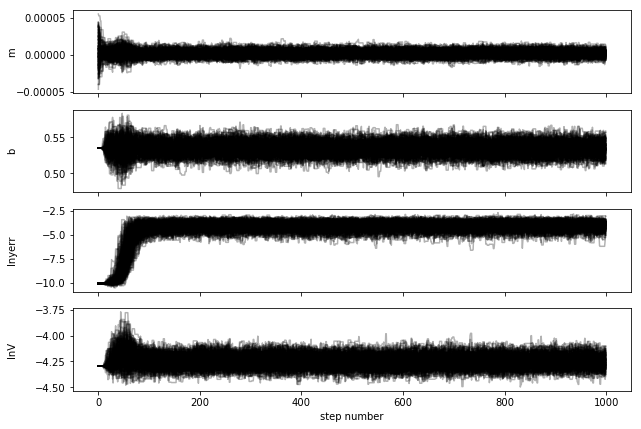

In [28]:
plt.figure(1)
fig, axes = plt.subplots(4, figsize=(10, 7), sharex=True)
samples = sampler.chain
labels = ["m", "b", "lnyerr", "lnV"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i].T, "k", alpha=0.3)
#     ax.set_xlim(0, len(samples))
    #(nwalkers, nsteps, dim)
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");
fig.savefig("200walkers_smallinit_a4.0_1000steps.png")
plt.show()

In [29]:
flat_samples = sampler.chain[:, 200:, :].reshape((-1, ndim))

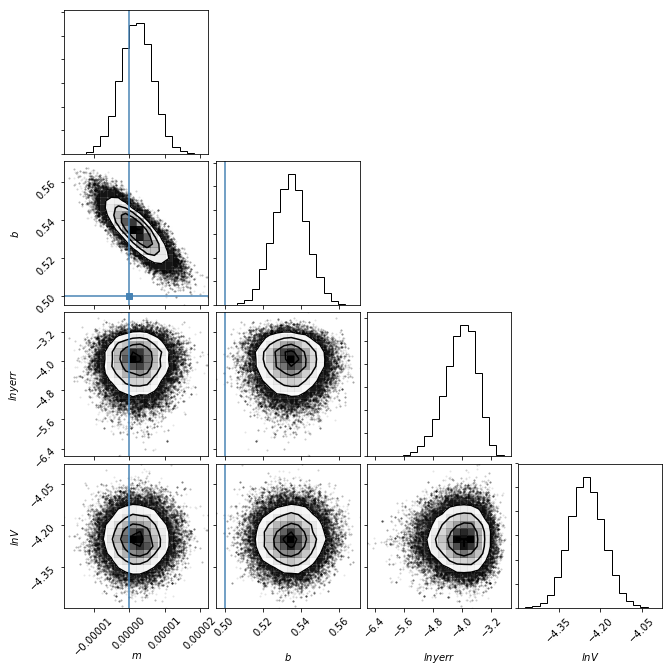

In [30]:
fig = corner.corner(flat_samples, labels=["$m$", "$b$", "$lnyerr$", "$lnV$"],
                      truths=[m_true, b_true, lnyerr_true, lnV_true])
fig.savefig("200walkers_smallinit_a4.0_1000steps_corner.png")

In [31]:
from IPython.display import display, Math
results = []

for i in range(ndim):
    mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
    results.append(mcmc)
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [270]:
print(np.exp(-1.373))
print(np.exp(-.586))
print(np.exp(-4.2))

0.253345781013
0.55654903441
0.0149955768205


In [244]:
print(results)

[array([ -2.48356910e-06,   2.35941037e-06,   7.71427808e-06]), array([ 0.5248896 ,  0.53447983,  0.54393626]), array([-4.59181741, -4.02422449, -3.59373128]), array([-4.30942628, -4.24622457, -4.17560802])]


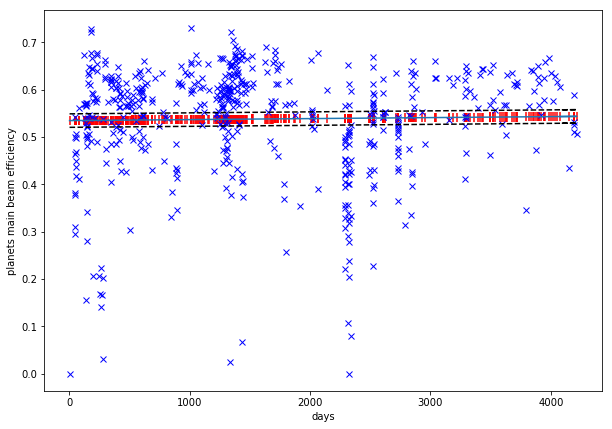

In [35]:
plt.figure(figsize=(10,7))
plt.plot(days, planets_etamb, 'bx')
m = results[0][1]
b = results[1][1]
y = m*days + b
yerr = np.exp(results[2][1]) * y
V = np.exp(results[3][1])
plt.xlabel('days')
plt.ylabel('planets main beam efficiency')
plt.errorbar(days, y, yerr=yerr, ecolor='red')
plt.plot(days, y + V, '--', color='k')
plt.plot(days, y - V, '--', color='k')
plt.show()

In [32]:
print("Mean acceptance fraction: {0:.3f}"
                .format(np.mean(sampler.acceptance_fraction)))
# print("Autocorrelation time:  ", sampler.get_autocorr_time())

Mean acceptance fraction: 0.347


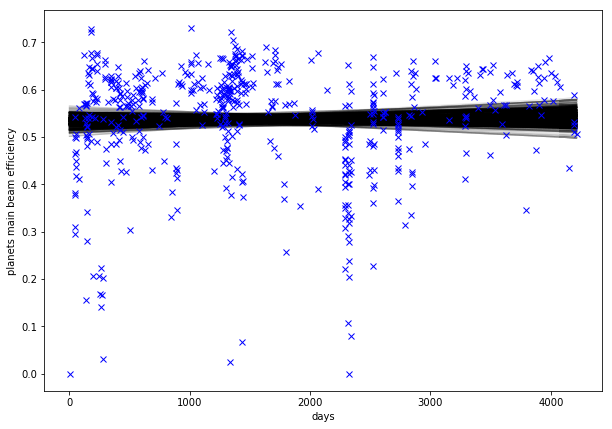

In [36]:
plt.figure(figsize=(10,7))
for m, b, lnyerr, lnV in samples[np.random.randint(len(samples), size=500)][np.random.randint(500)]:
    plt.plot(days, m*days+b, color="k", alpha=0.1)
plt.plot(days, planets_etamb, 'bx')
plt.xlabel('days')
plt.ylabel('planets main beam efficiency')
# plt.errorbar(days, planets_etamb, yerr=np.exp(lnyerr)*(m*days+b))

In [200]:
print(np.random.randint(len(samples), size=100))
print(samples.shape)
print(len(samples))
#(nwalkers, nsteps, dim)
# print(samples[np.random.randint(len(samples), size=200)][0])
print(samples[np.random.randint(len(samples), size=200)][np.random.randint(len(samples))])

[101 175 167  75  68  25 184  37 144  60 126  30 139  40  69 101 190   4
  21 171  78  51  51 114  15  86  30 111  13  11 110 151  94 186 142  47
 114  96  28   3 107 188 125 192 158  68 171  54 106  19  41 171  22 162
  21 119  72  17 135  83 150  82  38 146 100 168 157 114  81 123  40 154
 167  81 103 114  17  40 126  68 107 197  65 112  18 185 160 126 117 190
 114 184  62 120  23 118 136  67  95  80]
(200, 500, 4)
200
[[  4.47286245e-02   6.07366789e-01  -4.11622344e+00   1.74516839e+00]
 [  1.47177594e-02   6.24572178e-01  -4.13210848e+00   1.76677998e+00]
 [  1.47177594e-02   6.24572178e-01  -4.13210848e+00   1.76677998e+00]
 ..., 
 [ -2.03144965e-05   6.17863932e-01  -1.90899081e+00  -4.16234991e-01]
 [ -1.77222057e-05   6.10834448e-01  -1.93683785e+00  -3.91806971e-01]
 [ -1.77222057e-05   6.10834448e-01  -1.93683785e+00  -3.91806971e-01]]
